In [765]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

# Windows
plt.rcParams["font.family"] = "Malgun Gothic"

# macOS라면
# plt.rcParams["font.family"] = "AppleGothic"

# Linux/Colab라면 나눔고딕 설치 후
# plt.rcParams["font.family"] = "NanumGothic"

plt.rcParams["axes.unicode_minus"] = False

# 0️⃣ 전처리
## 0. 파일 병합

In [766]:
# ===================================================
# 파일 병합
# ===================================================

import pandas as pd
import glob
import os

# sales_YYYY_MM.csv 형태 파일만 선택
files = sorted(glob.glob('./sales_20??_??.csv'))

df_list = []

for file in files:
    
    temp = pd.read_csv(file)
    
    # 원본 파일명
    temp['source_file'] = os.path.basename(file)
    
    # 월 정보
    temp['sales_month'] = (
        os.path.basename(file)
        .replace('.csv', '')
    )
    
    df_list.append(temp)

# 전체 병합
df_all = pd.concat(df_list, ignore_index=True)

print("파일 개수:", len(files))
print("병합 데이터 shape:", df_all.shape)

# 병합 파일 저장
df_all.to_csv('sales_all.csv', index=False)

파일 개수: 16
병합 데이터 shape: (466754, 50)


---

## 1. 고객 식별자 결측치 제거

- 고객 식별자: `receiver_key`  

In [767]:
# ===================================================
# receiver_key 결측 제거
# ===================================================

removed_receiver_key_missing = (
    df_all[df_all['receiver_key'].isna()].copy()
)

# csv 저장
removed_receiver_key_missing.to_csv(
    'removed_receiver_key_missing.csv',
    index=False,
    encoding='utf-8-sig'
)

print("receiver_key 결측행 별도 파일 저장 완료:")
print("removed_receiver_key_missing.csv")

print("\nreceiver_key 결측 건수:")
print(len(removed_receiver_key_missing))


# 분석용 데이터셋 생성
df = (df_all[df_all['receiver_key'].notna()].copy())

print("\n결측 제거 후 shape:")
print(df.shape)

receiver_key 결측행 별도 파일 저장 완료:
removed_receiver_key_missing.csv

receiver_key 결측 건수:
22

결측 제거 후 shape:
(466732, 50)


In [768]:
# ===================================================
# receiver_key 결측치 매출 영향 확인
# ===================================================

removed_sales = removed_receiver_key_missing['결제액'].sum()
total_sales = df['결제액'].sum()

print("제거 데이터 매출:", f"{removed_sales:,.0f}원")
print("전체 매출:", f"{total_sales:,.0f}원")
print("제거 매출 비중:", round(removed_sales / total_sales * 100, 6), "%")

제거 데이터 매출: 665,848원
전체 매출: 11,752,134,778원
제거 매출 비중: 0.005666 %


---

## 2. 날짜 변수 생성

- 월별 분석: `입력일`  
- 요일 분석: `주문시간` 기준, 단 공구는 결측 주의  

In [769]:
# =====================================================
# 날짜 변수 생성
# =====================================================

# 입력일
df['입력일'] = pd.to_datetime(
    df['입력일'],
    format='%Y%m%d %H:%M:%S',
    errors='coerce'
)

# 주문시간
df['주문시간'] = pd.to_datetime(
    df['주문시간'],
    format='%Y-%m-%d %H:%M:%S',
    errors='coerce'
)


# =====================================================
# 요일 변수 생성
# =====================================================

df['weekday'] = df['주문시간'].dt.day_name()

weekday_map = {
    'Monday': '월',
    'Tuesday': '화',
    'Wednesday': '수',
    'Thursday': '목',
    'Friday': '금',
    'Saturday': '토',
    'Sunday': '일'
}

df['weekday_kr'] = df['weekday'].map(weekday_map)


print(df[['입력일', '주문시간', 'weekday_kr']].head())

print("\n입력일 결측:", df['입력일'].isna().sum())
print("주문시간 결측:", df['주문시간'].isna().sum())

print("\n요일 분포")
print(df['weekday_kr'].value_counts())

                  입력일                주문시간 weekday_kr
0 2025-01-03 10:30:40 2025-01-01 00:05:07          수
1 2025-01-02 09:24:13 2025-01-01 00:08:07          수
2 2025-01-02 09:24:10 2025-01-01 00:08:21          수
3 2025-01-02 10:01:57 2025-01-01 00:10:54          수
4 2025-01-02 10:01:57 2025-01-01 00:10:54          수

입력일 결측: 0
주문시간 결측: 105723

요일 분포
weekday_kr
월    61671
화    58946
수    57116
목    54706
금    47644
일    45737
토    35189
Name: count, dtype: int64


---

## 3. 판매처 표준화 및 공구 셀러명 추출

- 채널 메타데이터 병합을 하려고 했으나, 공동구매를 제대로 끌고오지 않아, 판매처명에서 추출  

- 판매처명 구조:  판매 채널 + 상품명  
→  channel_group: 자사몰, 자사몰_N, 공구, 외부, 무상, B2B  
→ goo_seller:  공구 셀러명 추출  

cf. 채널 메타데이터 파일로 불러오기 시,  
공동구매 등이 따라오지 못해서 판매처명에서 직접 키워드 불러오는 방법 사용  
  
cf. 채널 메타데이터 파일로 불러오는 코드  
```
channel_meta = pd.read_csv('sales_channel_metadata.csv')

channel_meta = (
    channel_meta[['판매처명']]
    .drop_duplicates()
    .copy()
)

channel_meta['판매처명'] = channel_meta['판매처명'].astype(str).str.strip()
```

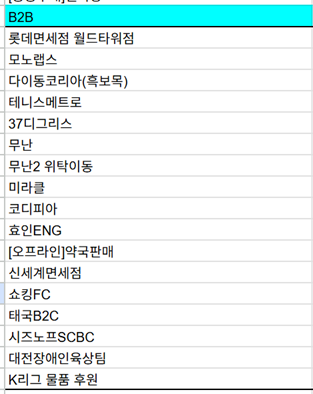   
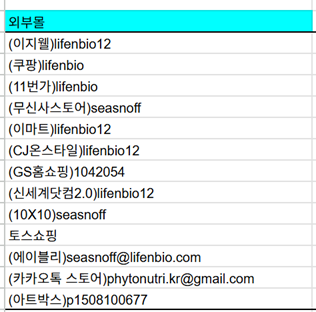    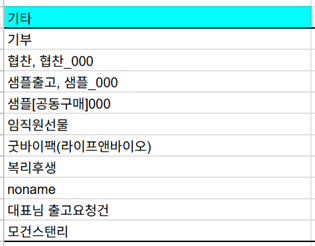

In [770]:
import re
import numpy as np

# =========================================
# 판매처명 정리
# =========================================

df['판매처명_clean'] = (
    df['판매처명']
    .astype(str)
    .str.strip()
    .str.replace(' ', '', regex=False)
)

# =========================================
# 명시 분류 리스트
# =========================================

b2b_list = [
    '롯데면세점월드타워점',
    '모노랩스',
    '다이동코리아(흑보목)',
    '테니스메트로',
    '37디그리스',
    '무난',
    '무난2위탁이동',
    '미라클',
    '코디피아',
    '효인ENG',
    '[오프라인]약국판매',
    '신세계면세점',
    '쇼킹FC',
    '태국B2C',
    '시즈노프SCBC',
    '대전장애인옥상텃밭',
    'K리그물품후원'
]

free_list = [
    '기부',
    '협찬',
    '협찬_협찬_000',
    '샘플출고_샘플_000',
    '샘플[공동구매]000',
    '임직원선물',
    '굿바이팩(라이프앤바이오)',
    '복리후생',
    'noname',
    '대표님출고요청건',
    '모건스탠리'
]

# =========================================
# 채널 그룹 분류
# =========================================

def classify_channel_group(name):
    name = str(name).strip().replace(' ', '')

    # 1. 무상
    if name in [x.replace(' ', '') for x in free_list]:
        return '무상'

    # 2. B2B
    elif name in [x.replace(' ', '') for x in b2b_list]:
        return 'B2B'

    # 3. 자사몰
    elif '고도몰' in name:
        return '자사몰'

    elif '스마트스토어' in name:
        return '자사몰_N'

    # 4. 공동구매
    elif '공동구매' in name:
        return '공구'

    # 5. 그 외는 외부몰
    else:
        return '외부몰'


df['channel_group'] = (
    df['판매처명_clean']
    .apply(classify_channel_group)
)


# =========================================
# 공동구매 셀러명 추출
# 단, 무상/샘플/협찬 제외
# =========================================

def extract_goo_seller(name):
    name = str(name).strip().replace(' ', '')

    # 무상 리스트 제외
    if name in [x.replace(' ', '') for x in free_list]:
        return np.nan

    if '공동구매' not in name:
        return np.nan

    seller = re.sub(r'^.*공동구매\]?', '', name)

    seller = (
        seller
        .replace('[', '')
        .replace(']', '')
        .strip()
    )

    return seller if seller != '' else np.nan


df['goo_seller'] = df['판매처명_clean'].apply(extract_goo_seller)

# 임시 컬럼 제거
df = df.drop(columns=['판매처명_clean'])

# 확인
print(df['channel_group'].value_counts(dropna=False))

display(
    df[['판매처명', 'channel_group', 'goo_seller']]
    .drop_duplicates()
    .sort_values(['channel_group', '판매처명'])
)

channel_group
자사몰_N    305116
공구        88091
자사몰       49908
외부몰       22479
무상          667
B2B         471
Name: count, dtype: int64


,판매처명,channel_group,goo_seller
13554,37디그리스,B2B,NaN
439438,K리그 물품 후원,B2B,NaN
382055,[오프라인]약국판매,B2B,NaN
23154,다이동코리아(흑보목),B2B,NaN
21172,롯데면세점 월드타워점,B2B,NaN
23035,모노랩스,B2B,NaN
21541,무난,B2B,NaN
72264,무난2 위탁이동,B2B,NaN
70876,미라클,B2B,NaN
71137,쇼킹FC,B2B,NaN


---

## 4. 세트/GIFT/구성품 태깅

- 기준

| 조건                               | 의미          | 처리                  |
| -------------------------------- | ----------- | ------------------- |
| `품명`에 `SET` 포함 & `정산가 != 0`      | 세트 대표 상품 라인 | 세트 매출 라인            |
| `품명`에 `SET` 포함 & `정산가 == 0`      | 세트 구성품 라인   | 구성품 정보로 유지          |
| `품명`에 `GIFT` 포함 & `정산가 == 0`     | 세트 추가 제공 상품 | GIFT 라인으로 태깅        |
| 동일 주문번호 내 `SET & 정산가 != 0`이 여러 개 | 세트 2개 이상 구매 | 각각 별도 세트 대표 라인으로 인정 |


- 분석용 생성 컬럼:

| 컬럼명      | 의미                        | 값                      |
| -------- | ------------------------- | ---------------------- |
| `주문번호`   | 주문 단위 식별값                 | 동일 주문 내 모든 행 동일        |
| `품명`     | 원본 상품명                    | SET / GIFT / 옵션 포함 원본명 |
| `정산가`    | 실제 정산 기준 금액               | 세트 대표상품은 보통 0 아님       |
| `세트여부`   | 품명에 `SET` 포함 여부           | 1=SET 포함, 0=아님         |
| `증정여부`   | 품명에 `GIFT` 포함 여부          | 1=GIFT 포함, 0=아님        |
| `세트대표`   | 실제 세트 매출 대표 라인 여부         | `SET 포함 & 정산가 != 0`    |
| `세트구성품`  | 세트 내부 구성품 여부              | `SET 포함 & 정산가 == 0`    |
| `세트증정품`  | 세트 추가 증정품 여부              | `GIFT 포함 & 정산가 == 0`   |
| `세트관련`   | 세트와 관련된 모든 행 여부           | 대표/구성품/증정품 중 하나라도 해당   |
| `주문내세트수` | 동일 주문번호 내 세트 대표상품 개수      | 세트 2종 구매 시 2           |
| `복수세트주문` | 한 주문에서 세트를 2개 이상 구매했는지 여부 | 1=2개 이상, 0=아님          |


In [771]:
# =========================================
# 세트 / GIFT / 구성품 태깅
# =========================================

품명_str = df['품명'].astype(str)

# SET 포함 여부
df['세트여부'] = (
    품명_str
    .str.contains('SET', case=False, na=False)
    .astype(int)
)

# GIFT 포함 여부
df['증정여부'] = (
    품명_str
    .str.contains('GIFT', case=False, na=False)
    .astype(int)
)

# 세트 대표 상품
# SET 포함 + 정산가 0 아님
df['세트대표'] = (
    (df['세트여부'] == 1) &
    (df['정산가'] != 0)
).astype(int)

# 세트 구성품
# SET 포함 + 정산가 0
df['세트구성품'] = (
    (df['세트여부'] == 1) &
    (df['정산가'] == 0)
).astype(int)

# 세트 증정품
# GIFT 포함 + 정산가 0
df['세트증정품'] = (
    (df['증정여부'] == 1) &
    (df['정산가'] == 0)
).astype(int)

# 세트 관련 전체
df['세트관련'] = (
    (df['세트대표'] == 1) |
    (df['세트구성품'] == 1) |
    (df['세트증정품'] == 1)
).astype(int)

# =========================================
# 주문번호 내 세트 대표 상품 개수
# =========================================

세트개수 = (
    df[df['세트대표'] == 1]
    .groupby('주문번호')
    .size()
    .reset_index(name='주문내세트수')
)

df = df.merge(
    세트개수,
    on='주문번호',
    how='left'
)

df['주문내세트수'] = (
    df['주문내세트수']
    .fillna(0)
    .astype(int)
)

# 동일 주문번호 내 세트 2개 이상 여부
df['복수세트주문'] = (
    df['주문내세트수'] >= 2
).astype(int)

# =========================================
# 확인
# =========================================

display(
    df.loc[
        df['세트관련'] == 1,
        [
            '주문번호',
            '품명',
            '정산가',
            '세트여부',
            '증정여부',
            '세트대표',
            '세트구성품',
            '세트증정품',
            '세트관련',
            '주문내세트수',
            '복수세트주문'
        ]
    ].head(50)
)

,주문번호,품명,정산가,세트여부,증정여부,세트대표,세트구성품,세트증정품,세트관련,주문내세트수,복수세트주문
3,Z20250102791855,(GIFT)그로우랩 성장가이드(그로우뉴),0,0,1,0,0,1,1,2,1
4,Z20250102791855,(GIFT)그로우랩 성장가이드(비타민D),0,0,1,0,0,1,1,2,1
5,Z20250102791855,(GIFT)속캡 오프너,0,0,1,0,0,1,1,2,1
6,Z20250102791855,(GIFT)투데이디3 오일밤(10캡)미사용,0,0,1,0,0,1,1,2,1
7,Z20250102791855,(SET)스포이드 (5개입),0,1,0,0,1,0,1,2,1
8,Z20250102791855,(SET)지니어스뉴 드롭스,25728,1,0,1,0,0,1,2,1
9,Z20250102791855,(SET)지니어스뉴 드롭스(5개입),77664,1,0,1,0,0,1,2,1
10,Z20250102791855,(SET)스포이드,0,1,0,0,1,0,1,2,1
15,Z20250102775750,(SET)조인트리션뮤코(NPK),229824,1,0,1,0,0,1,1,0
16,Z20250102775750,(GIFT)포스앤드,0,0,1,0,0,1,1,1,0


---

## 5. SKU Normalization (제품군 표준화)

- 같은 상품군이 `(SET)`, `GIFT`, 옵션 표기 차이로 분산되는 문제 완화  
- 제품 lifecycle / gateway SKU / 재구매 SKU 분석의 기준 통일  

In [772]:
pd.set_option('display.max_rows', None)
pd.Series(df_all['품명'].dropna().unique())

0                            흑삼전탕
1                    유기농 비타민D3 코어
2                        185 커큐민+
3          (GIFT)그로우랩 성장가이드(그로우뉴)
4          (GIFT)그로우랩 성장가이드(비타민D)
5                    (GIFT)속캡 오프너
6         (GIFT)투데이디3 오일밤(10캡)미사용
7                 (SET)스포이드 (5개입)
8                  (SET)지니어스뉴 드롭스
9             (SET)지니어스뉴 드롭스(5개입)
10                      (SET)스포이드
11                          맨드로포즈
12                   조인트리션뮤코(NPK)
13              (SET)조인트리션뮤코(NPK)
14                     (GIFT)포스앤드
15     (GIFT)시즈노프 메세지카드(런앤드+포스앤드)
16                       그로우뉴(단종)
17                 185 커큐민+(300캡)
18             (GIFT)지니어스뉴 건강정보카드
19                이트뮨 배도라지주스(box)
20           (SET)투데이디3 오일밤(30캡슐)
21              (GIFT)투데이D3 메세지카드
22              투데이디3 오일밤(10캡)미사용
23     (SET)투데이디3 오일밤(30캡슐x390캡슐)
24                     (SET)에피베리어
25                     (SET)히알라스킨
26                          위이지케어
27                           헤모웰당
28                 (SET)위환 (yuyu)
29            

In [773]:
check_keywords = [
    '쇼핑백',
    '스티커팩',
    '메세지카드',
    '브랜드카드',
    '리플렛',
    '브로슈어'
]

for keyword in check_keywords:
    count = df['품명'].str.contains(keyword, na=False).sum()
    ratio = count / len(df) * 100
    print(f'{keyword}: {count:,}건 / {ratio:.2f}%')

for keyword in check_keywords:
    print('\n====', keyword, '====')
    display(
        df.loc[df['품명'].str.contains(keyword, na=False), '품명']
          .value_counts()
          .head(30)
    )

쇼핑백: 91건 / 0.02%
스티커팩: 2,439건 / 0.52%
메세지카드: 53,015건 / 11.36%
브랜드카드: 1,880건 / 0.40%
리플렛: 1,370건 / 0.29%
브로슈어: 1,357건 / 0.29%

==== 쇼핑백 ====


품명
(SET)시즈노프 쇼핑백(공용)    34
그로우랩 쇼핑백 소           13
시즈노프 쇼핑백(공용)         11
그로우랩 쇼핑백 대            6
혜인서 쇼핑백(大)            5
(GIFT)파이토 쇼핑백 소       5
(SET)그로우랩 쇼핑백 대       4
파이토 쇼핑백 소             3
파이토 쇼핑백 대             2
(SET)그로우랩 쇼핑백 소       2
로우티 쇼핑백               2
파이토 쇼핑백 중             1
(GIFT)혜인서 쇼핑백(大)      1
(GIFT)파이토 쇼핑백 대       1
(GIFT)파이토 쇼핑백 중       1
Name: count, dtype: int64


==== 스티커팩 ====


품명
(SET)지니어스뉴 키즈 스티커팩          673
(SET)그로우뉴 키즈 스티커팩           360
포스앤드 스티커팩_옴                 200
런앤드 블루러쉬 스티커팩_로피            161
(SET)런앤드 블루러쉬 스티커팩_로피       116
(SET)런앤드 핑크웨이브 스티커팩_첸첸      113
(SET)런앤드 그린스윙 스티커팩_릴리       110
(GIFT)런앤드 퍼플윈드 스티커팩_윈디       92
런앤드 핑크웨이브 스티커팩_첸첸            74
런앤드 제주바이브 스티커팩_라키            69
런앤드 그린스윙 스티커팩_릴리             65
(GIFT)런앤드 제주바이브 스티커팩_라키      64
런앤드 퍼플윈드 스티커팩_윈디             62
(SET)포스앤드 스티커팩_옴             58
(GIFT)그로우뉴 키즈 스티커팩           49
(GIFT)지니어스뉴 키즈 스티커팩          42
런앤드 블랙스피릿 스티커팩_시온            24
런앤드 옐로플라이 스티커팩_프리스           21
(SET)런앤드 퍼플윈드 스티커팩_윈디        20
지니어스뉴 키즈 스티커팩                17
(SET)런앤드 제주바이브 스티커팩_라키       14
(SET)런앤드 블랙스피릿 스티커팩_시온       10
(GIFT)런앤드 핑크웨이브 스티커팩_첸첸      10
(SET)런앤드 옐로플라이 스티커팩_프리스       6
(GIFT)런앤드 옐로플라이 스티커팩_프리스      6
그로우뉴 키즈 스티커팩                  2
(GIFT)런앤드 블루러쉬 스티커팩_로피        1
Name: count, dtype: int64


==== 메세지카드 ====


품명
(GIFT)그로우랩 메세지카드              42176
(GIFT)투데이D3 메세지카드              9726
(GIFT)시즈노프 메세지카드                582
(GIFT)시즈노프 메세지카드(런앤드+포스앤드)      485
그로우랩 메세지카드                       39
투데이D3 메세지카드                       7
Name: count, dtype: int64


==== 브랜드카드 ====


품명
(GIFT)시즈노프 브랜드카드    1862
시즈노프 브랜드카드            18
Name: count, dtype: int64


==== 리플렛 ====


품명
(GIFT)흑본전탕 리플렛    1366
흑본전탕 리플렛             4
Name: count, dtype: int64


==== 브로슈어 ====


품명
(GIFT)리버티엑스 6단접지 브로슈어    1348
리버티엑스 6단접지 브로슈어             9
Name: count, dtype: int64

In [774]:
# ===================================================
# SKU Normalization
# ===================================================

def normalize_sku(name):

    name = str(name)

    remove_patterns = [
        r'\(SET\)',
        r'\[SET\]',
        r'SET',
        r'\(GIFT\)',
        r'\[GIFT\]',
        r'GIFT',
        r'증정',
        r'사은품'
    ]

    for p in remove_patterns:
        name = re.sub(
            p,
            '',
            name,
            flags=re.IGNORECASE
        )

    name = re.sub(r'\s+', ' ', name).strip()

    return name

df['sku_normalized'] = (
    df['품명']
    .apply(normalize_sku)
)

# ==================================================
# SKU Type 분류
# ==================================================

def classify_sku_type(name):

    if pd.isna(name):
        return 'unknown'

    if '메세지카드' in name:
        return 'message_card'

    elif '쇼핑백' in name:
        return 'shopping_bag'

    elif '스티커팩' in name:
        return 'sticker_pack'

    elif '브랜드카드' in name:
        return 'brand_card'

    elif '리플렛' in name:
        return 'leaflet'

    elif '브로슈어' in name:
        return 'brochure'

    elif '성장가이드' in name:
        return 'gift_material'

    elif '건강정보카드' in name:
        return 'gift_material'

    elif '샘플팩' in name:
        return 'sample_pack'

    elif '오프너' in name:
        return 'gift_material'

    else:
        return 'product'

df['sku_type'] = (
    df['sku_normalized']
    .apply(classify_sku_type)
)


# ==================================================
# 확인
# ==================================================

# 원본 vs 정규화 비교
df[['품명', 'sku_normalized']] \
    .drop_duplicates() \
    .sample(20, random_state=42)


,품명,sku_normalized
1943,(SET)장해환 (yuyu),장해환 (yuyu)
311882,(SET)리버티엑스 10포,리버티엑스 10포
195,(SET)헤모웰당,헤모웰당
48241,그로우뉴K2,그로우뉴K2
21160,런앤드 제주바이브 스티커팩_라키,런앤드 제주바이브 스티커팩_라키
12593,혜인서 쇼핑백(大),혜인서 쇼핑백(大)
166280,(SET)지니어스뉴 톡캡스(30캡술*3),지니어스뉴 톡캡스(30캡술*3)
8698,(SET)런앤드 제주바이브 스티커팩_라키,런앤드 제주바이브 스티커팩_라키
9,(SET)지니어스뉴 드롭스(5개입),지니어스뉴 드롭스(5개입)
2473,이트뮨 배도라지주스(낱포),이트뮨 배도라지주스(낱포)


In [775]:
# SKU Type 분류 갯수 확인
df['sku_type'].value_counts()

sku_type
product          258386
gift_material    144389
message_card      53015
sample_pack        3805
sticker_pack       2439
brand_card         1880
leaflet            1370
brochure           1357
shopping_bag         91
Name: count, dtype: int64

In [776]:
# SKU 개수 변화
print('원본 SKU 수:', df['품명'].nunique())
print('정규화 SKU 수:', df['sku_normalized'].nunique())

원본 SKU 수: 291
정규화 SKU 수: 131


In [777]:
# 여러 품명이 하나 SKU로 합쳐진 경우 확인 (몇 개의 품명이 하나의 SKU로 합쳐졌는지 확인)
sku_merge_check = (
    df.groupby('sku_normalized')['품명']
      .nunique()
      .sort_values(ascending=False)
)

sku_merge_check.head(30)

sku_normalized
185 커큐민+                3
리버티엑스 3포                3
쏘팔메토 옥타코사놀              3
시즈노프 보틀(500ml)_White    3
시즈노프 리유저블백              3
슬립밸런스                   3
스포이드 (5개입)              3
스포이드                    3
리버티엑스 10포               3
유기농 비타민D3 코어            3
리듀스앤드(수박맛)              3
런앤드 화이팅                 3
런앤드 핑크웨이브 스티커팩_첸첸       3
런앤드 핑크 웨이브              3
런앤드 퍼플윈드 스티커팩_윈디        3
런앤드 퍼플윈드                3
에피베리어                   3
이트뮨 배도라지주스(box)         3
런앤드 제주바이브               3
투데이디3 오일(10캡슐)          3
포스앤드                    3
파미로겐                    3
투데이디3 오일밤(30캡슐)         3
투데이디3 오일밤(10캡슐)         3
투데이디3 오일밤(10캡)미사용       3
투데이디3 오일(30캡슐)          3
지니어스뉴 톡캡스(30캡슐)         3
이트뮨 배도라지주스(낱포)          3
지니어스뉴 톡캡스(10캡슐)         3
지니어스뉴 키즈 스티커팩           3
Name: 품명, dtype: int64

In [778]:
# 실제 어떤 품명들이 합쳐졌는지 지니어스뉴 드롭스로 확인
target = '지니어스뉴 드롭스'

df.loc[
    df['sku_normalized'] == target,
    '품명'
].value_counts()

품명
(SET)지니어스뉴 드롭스     21542
지니어스뉴 드롭스            302
(GIFT)지니어스뉴 드롭스      154
Name: count, dtype: int64

In [779]:
# 이상한 정규화 결과 찾기 (빈 문자열, 너무 짧은 값, 깨진 값)
df[df['sku_normalized'].str.len() <= 1][
    ['품명', 'sku_normalized']
].drop_duplicates()

,품명,sku_normalized


- SET, GIFT 플래그 만들기

In [780]:
# =========================================================
# SET / GIFT 플래그 생성
# =========================================================

df['sku_tag'] = np.select(
    [
        df['품명'].astype(str).str.contains(r'\(SET\)|SET', na=False),
        df['품명'].astype(str).str.contains(r'\(GIFT\)|GIFT', na=False)
    ],
    [
        'SET',
        'GIFT'
    ],
    default='NORMAL'
)

print(df['sku_tag'].value_counts())

sku_tag
GIFT      240739
SET       135496
NORMAL     90497
Name: count, dtype: int64


---

## 6. 브랜드 분류

- 브랜드: `파이토뉴트리`, `혜인서`, `시즈노프`, `흑보목`, `그로우랩`  
- **문제**: `그로우랩` 상품이 `파이토뉴트리`로 묶여 있음  
    → `품명`에 `그로우랩` 키워드가 있는 행을 분리  
- **처리**: `로우티`는 `시즈노프`에 포함  

In [781]:
# ===================================================
# 브랜드 분류
# ===================================================

def classify_brand(row):
    brand = str(row['브랜드']).strip()
    name  = str(row['품명']).strip()

    # 그로우랩 브랜드 제품 전체 포함
    # (그로우뉴, 지니어스뉴, 투데이D3, 데이프로바 계열)
    if '그로우랩' in name:
        return '그로우랩'

    if any(k in name for k in ['그로우뉴', '지니어스뉴', '투데이D3', '데이프로바']):
        return '그로우랩'

    # 로우티 → 기타
    if brand == '로우티':
        return '기타'

    return brand


df['브랜드_분류'] = df.apply(classify_brand, axis=1)

print('=== 브랜드_분류 분포 ===')
print(df['브랜드_분류'].value_counts())

=== 브랜드_분류 분포 ===
브랜드_분류
그로우랩      250624
파이토뉴트리    141407
혜인서        39160
시즈노프       30981
흑보목         4500
nan           49
기타            11
Name: count, dtype: int64


In [782]:
# 원본 브랜드 vs 재분류 결과 교차 확인
print('=== 원본 브랜드 vs 브랜드_분류 교차표 ===')
print(
    df.groupby(['브랜드', '브랜드_분류'])
      .size()
      .reset_index(name='건수')
      .to_string(index=False)
)

# 그로우랩으로 분리된 품명 샘플 확인
print('\n=== 그로우랩으로 분리된 품명 (상위 30) ===')
print(
    df[df['브랜드_분류'] == '그로우랩']['품명']
    .value_counts()
    .head(30)
)

=== 원본 브랜드 vs 브랜드_분류 교차표 ===
   브랜드 브랜드_분류     건수
   로우티     기타     11
  시즈노프   시즈노프  30981
파이토뉴트리   그로우랩 250624
파이토뉴트리 파이토뉴트리 141407
   혜인서    혜인서  39160
   흑보목    흑보목   4500

=== 그로우랩으로 분리된 품명 (상위 30) ===
품명
(GIFT)그로우랩 성장가이드(비타민D)     43256
(GIFT)그로우랩 메세지카드           42176
(GIFT)그로우랩 성장가이드(그로우뉴)     37372
(GIFT)지니어스뉴 건강정보카드         28491
(SET)지니어스뉴 드롭스             21542
(SET)지니어스뉴 드롭스(5개입)        18128
(GIFT)투데이D3 메세지카드           9726
그로우뉴K2                      7310
(GIFT)데이프로바(3포)             7276
(SET)그로우뉴K2                 6622
(GIFT)그로우랩 성장가이드(데이프로바)     5601
지니어스뉴 톡캡스(30캡슐)             4022
그로우뉴(단종)                    3644
(SET)그로우뉴(단종)               2656
(SET)지니어스뉴 톡캡스(30캡슐)        2308
데이프로바                       1771
(SET)지니어스뉴 톡캡스(30캡술*3)      1386
(SET)데이프로바                  1336
(GIFT)지니어스뉴 톡캡스(10캡슐)        948
지니어스뉴 톡캡스(30캡술*3)            759
(SET)지니어스뉴 키즈                677
(SET)지니어스뉴 키즈 스티커팩           673
(SET)지니어스뉴 톡캡스(10캡슐)         594
(SET)그로우뉴 키즈                 36

---

## 7. 이상치 확인

### 7-1. 결제액 이상치

In [783]:
df['결제액'].describe()

count      466,732.00
mean        25,179.62
std         54,816.34
min     -1,191,000.00
25%              0.00
50%              0.00
75%         29,583.00
max      4,100,000.00
Name: 결제액, dtype: float64

→  `50% = 0` : row 단위 데이터에 무료 구성품이 엄청 많이 포함되어 있기 때문  

→ 하나의 주문번호에 여러 row가 존재하는 구조이므로, 결제액 분석 시  
     `결제액`의 mean(왜곡될 가능성 있음)보다는 `주문번호` 기준 집계 확인하기  

In [784]:
# 이상한 주문 확인 01
df[df['결제액'] <= 0][
    ['주문번호', '품명', '결제액', '최종처리', '세트관련']
].head(20)

,주문번호,품명,결제액,최종처리,세트관련
3,Z20250102791855,(GIFT)그로우랩 성장가이드(그로우뉴),0,후처리리스트추가,1
4,Z20250102791855,(GIFT)그로우랩 성장가이드(비타민D),0,후처리리스트추가,1
5,Z20250102791855,(GIFT)속캡 오프너,0,후처리리스트추가,1
6,Z20250102791855,(GIFT)투데이디3 오일밤(10캡)미사용,0,후처리리스트추가,1
7,Z20250102791855,(SET)스포이드 (5개입),0,후처리리스트추가,1
10,Z20250102791855,(SET)스포이드,0,후처리리스트추가,1
16,Z20250102775750,(GIFT)포스앤드,0,후처리리스트추가,1
17,Z20250102775750,(GIFT)시즈노프 메세지카드(런앤드+포스앤드),0,후처리리스트추가,1
20,Z20250102791856,(GIFT)속캡 오프너,0,후처리리스트추가,1
21,Z20250102791856,(SET)스포이드 (5개입),0,후처리리스트추가,1


→ 결제액 0인 것은 세트상품의 하위 상품들로, 이상치 아님  

In [785]:
# 이상한 주문 보기 02
df[df['결제액'] > 2000000][
    ['주문번호', '품명', '결제액', '최종처리', '세트관련']
].head(20)

,주문번호,품명,결제액,최종처리,세트관련
23024,Z20250107073123,위이지케어,2207040,후처리리스트추가,0
23025,Z20250107073123,위이지케어,2207040,후처리리스트추가,0
23026,Z20250107073123,위이지케어,2207040,후처리리스트추가,0
23027,Z20250107073123,위이지케어,2207040,후처리리스트추가,0
23028,Z20250107073123,위이지케어,2207040,후처리리스트추가,0
76777,Z20250304371965,위이지케어,2207040,후처리리스트추가,0
76778,Z20250304371965,위이지케어,2207040,후처리리스트추가,0
103748,Z20250411970542,위이지케어,2207040,후처리리스트추가,0
103749,Z20250411970542,위이지케어,2207040,후처리리스트추가,0
131259,Z20250519484520,위이지케어,2207040,후처리리스트추가,0


In [786]:
df.groupby('주문번호')['결제액'].nunique() \
    .value_counts()

결제액
2     51475
1     43693
3     24399
4      2747
5      1126
6       165
7        99
8        26
9        14
11        6
13        3
10        3
Name: count, dtype: int64

In [787]:
# 가장 많은 행(row)을 가진 주문번호 확인
sample_order = (
    df.groupby('주문번호')
      .size()
      .sort_values(ascending=False)
      .index[0]
)

df[df['주문번호'] == sample_order][
    ['주문번호', '품명', '주문구분', '결제액']
]

,주문번호,품명,주문구분,결제액
136850,Z20250605716925,(SET)지니어스뉴 드롭스,취소,-26800
136851,Z20250605716925,(SET)스포이드,주문,0
136852,Z20250605716925,(SET)스포이드,취소,0
136853,Z20250605716925,(SET)지니어스뉴 드롭스(5개입),주문,153000
136854,Z20250605716925,(SET)지니어스뉴 드롭스(5개입),취소,-153000
136855,Z20250605716925,(SET)스포이드 (5개입),주문,0
136856,Z20250605716925,(SET)스포이드 (5개입),취소,0
136857,Z20250605716925,(SET)지니어스뉴 드롭스,주문,26800
136858,Z20250605716925,(GIFT)이트뮨 배도라지주스(box),주문,0
136859,Z20250605716925,(GIFT)이트뮨 배도라지주스(box),취소,0


→ 추가 확인 (이상없음)  

### 7-2. 주문수량 이상치

In [788]:
# 주문수량 통계
df['주문수량'].describe()

count   466,732.00
mean          1.30
std           1.67
min         -56.00
25%           1.00
50%           1.00
75%           1.00
max         200.00
Name: 주문수량, dtype: float64

In [789]:
# 주문수량 높은 순 TOP 10
df.sort_values('주문수량', ascending=False)[
    ['주문번호', '품명', '주문수량', '결제액', 'sku_type']
].head(10)

,주문번호,품명,주문수량,결제액,sku_type
422415,Z20260311157903,(GIFT)그로우랩 성장가이드(그로우뉴),200,0,gift_material
333633,Z20251219468754,그로우랩 성장가이드(그로우뉴),200,0,gift_material
21358,Z20250117752553,슬립밸런스,150,0,product
248505,Z20250929999664,위이지케어,120,2207040,product
188285,Z20250709040953,위이지케어,120,2207040,product
23024,Z20250107073123,위이지케어,120,2207040,product
248506,Z20250929999663,위이지케어,120,2207040,product
188286,Z20250709040953,위이지케어,120,2207040,product
131259,Z20250519484520,위이지케어,120,2207040,product
131260,Z20250519484520,위이지케어,120,2207040,product


In [790]:
# 주문수량 낮은 순 TOP 10
df.sort_values('주문수량', ascending=True)[
    ['주문번호', '품명', '주문수량', '결제액', 'sku_type']
].head(10)

,주문번호,품명,주문수량,결제액,sku_type
21668,Z20250108178437,런앤드 화이팅,-56,0,product
187444,Z20250716495927,포스앤드,-50,0,product
81145,Z20250408742431,(SET)리듀스앤드(수박맛),-36,-151830,product
81147,Z20250408742431,(SET)런앤드 블루러쉬,-36,-87738,product
79690,Z20250407641049,(SET)리듀스앤드(수박맛),-24,-159200,product
403793,Z20260226282170,이트뮨 배도라지주스(낱포),-20,-18000,product
439384,Z20260319641029,(SET)지니어스뉴 키즈,-20,0,product
439382,Z20260319641029,(SET)지니어스뉴 키즈 스티커팩,-20,0,sticker_pack
28703,Z20250206787902,(SET)하이리치 올인원 멀티팩,-16,-87600,product
297808,Z20251113003448,그로우뉴K2,-12,-5000,product


In [791]:
df[df['주문수량'] < 0][
    ['주문번호', '품명', '주문수량', '주문구분', '결제액']
].head(20)

,주문번호,품명,주문수량,주문구분,결제액
40,Z20250102775582,(SET)투데이디3 오일밤(30캡슐),-1,취소,-19200
217,Z20250102775774,투데이디3 오일밤(30캡슐),-1,취소,-28800
314,Z20250102791881,투데이디3 오일밤(30캡슐),-1,취소,-25900
544,Z20250102775597,투데이디3 오일밤(30캡슐),-1,취소,-28800
556,Z20250102775822,투데이디3 오일밤(30캡슐),-1,취소,-28800
598,Z20250102775827,투데이디3 오일밤(30캡슐),-1,취소,-28800
642,Z20250102775833,투데이디3 오일밤(30캡슐),-1,취소,-28800
647,Z20250102775834,투데이디3 오일밤(30캡슐),-1,취소,-28800
668,Z20250102775837,투데이디3 오일밤(30캡슐),-1,취소,-28800
673,Z20250102791902,(GIFT)그로우랩 성장가이드(그로우뉴),-1,취소,0


→ 이상 없음  
  
→ 음수 추가 확인 (정상적인 취소 건으로 확인 / 이상 없음)  

### 7-3. 날짜 이상치

In [792]:
df['주문시간'].min()

Timestamp('2025-01-01 00:05:07')

In [793]:
df['주문시간'].max()

Timestamp('2026-04-22 13:52:35')

→ 이상 없음

### 7-4. SKU 이상치

In [794]:
df['sku_normalized'].value_counts().head(50)

sku_normalized
그로우랩 성장가이드(비타민D)         43280
그로우랩 메세지카드               42215
그로우랩 성장가이드(그로우뉴)         37402
속캡 오프너                   29556
지니어스뉴 건강정보카드             28515
185 커큐민+                 28065
스포이드                     22325
지니어스뉴 드롭스                21998
스포이드 (5개입)               18386
지니어스뉴 드롭스(5개입)           18232
그로우뉴K2                   13937
투데이D3 메세지카드               9733
이트뮨 배도라지주스(box)           9310
투데이디3 오일밤(30캡슐)           8123
데이프로바(3포)                 7409
185 커큐민+(240캡슐)           6813
투데이디3 오일(30캡슐)            6510
지니어스뉴 톡캡스(30캡슐)           6334
그로우뉴(단종)                  6333
그로우랩 성장가이드(데이프로바)         5635
시즈노프 카달로그                 4021
에피베리어                     3457
블러드 플로우케어(리뉴얼)            3440
데이프로바                     3359
런앤드 러닝카페                  2751
리듀스앤드(수박맛)샘플팩             2708
투데이디3 오일밤(30캡슐x390캡슐)     2637
유기농 비타민D3 코어              2482
파미로겐                      2479
투데이디3 오일밤(10캡)미사용         2386
포스앤드                      2266
런앤드 퍼플윈드                

→ 공백, 이상 문자열, 단일 문자, 깨진 문자 없음

### 7-5. 판매처 이상치

In [795]:
df['channel_group'].value_counts().head(50)

channel_group
자사몰_N    305116
공구        88091
자사몰       49908
외부몰       22479
무상          667
B2B         471
Name: count, dtype: int64

In [796]:
df[df['channel_group'] == '무상'][
    ['판매처명', '품명', '결제액']
].head(50)

,판매처명,품명,결제액
21082,기부,쏘팔메토 옥타코사놀,0
21083,기부,쏘팔메토 옥타코사놀,0
21084,기부,쏘팔메토 옥타코사놀,0
50433,기부,런앤드 제주바이브,0
50434,기부,런앤드 제주바이브,0
50435,기부,런앤드 제주바이브,0
50436,기부,런앤드 제주바이브,0
50437,기부,런앤드 제주바이브,0
50438,기부,런앤드 제주바이브,0
104237,임직원선물,이트뮨 배도라지주스(box),0


→ 이상 없음

### 7-6. 고객 이상치

In [797]:
customer_order_cnt = (
    df.groupby('receiver_key')['주문번호']
      .nunique()
)

customer_order_cnt.describe()

count   84,800.00
mean         1.46
std          1.19
min          1.00
25%          1.00
50%          1.00
75%          1.00
max         26.00
Name: 주문번호, dtype: float64

In [798]:
# TOP 고객 보기
customer_order_cnt.sort_values(ascending=False).head(20)

receiver_key
e30ea33ea4215ca9    26
f2a35e96ffef3b5f    25
68c80ac167326a1c    24
e1894e415b1cff1b    23
320f057ad4ad80f7    22
beb0cfd84b3a0d58    21
d6b8c3494e9c9cbf    21
d452899bd57df9cc    21
6112ffcacdaf1ff0    20
8806d06f5139066e    20
a4e7ec6b41069254    19
7faea94113494696    18
f3ecc6feaf30683f    18
8326ad0a231d62ce    18
06552b683395f79b    18
a67b4d92be995e67    18
517b35fea349f1c3    18
2bc2f6e06f616713    18
9a8ee2a2653da6a3    17
18c214b1d31ebfc7    17
Name: 주문번호, dtype: int64

In [799]:
# 가장 많이 구매한(26회) 고객 e30ea33ea4215ca9 의 주문 내역 확인하기
top_customer = customer_order_cnt.sort_values(
    ascending=False
).index[0]

df[df['receiver_key'] == top_customer][
    ['주문시간', '주문번호', '품명', '결제액', '주문구분']
].sort_values('주문시간')

,주문시간,주문번호,품명,결제액,주문구분
39947,2025-02-21 11:05:18,Z20250221731531,(SET)인-칼슘 앱솔브,113400,주문
39948,2025-02-21 11:05:18,Z20250221731531,(SET)인-칼슘 앱솔브,-113400,취소
242629,2025-09-24 10:56:14,Z20250924639107,185 커큐민+,59800,주문
271629,2025-10-16 23:54:39,Z20251017997014,185 커큐민+,119600,주문
273616,2025-10-19 20:18:39,Z20251020166763,인칼슘 앱솔브+,39800,주문
273617,2025-10-19 20:18:39,Z20251020166763,(SET)인칼슘 앱솔브+,79000,주문
281522,2025-10-29 12:27:58,Z20251029912229,(SET)인칼슘 앱솔브+,79000,주문
281523,2025-10-29 12:27:58,Z20251029912229,인칼슘 앱솔브+,39800,주문
292866,2025-11-06 23:55:18,Z20251107573622,에피베리어,36500,주문
292867,2025-11-06 23:55:18,Z20251107573622,(SET)에피베리어,73000,주문


→ 충성 고객 패턴에 가까움  

  • 반복 구매 SKU가 명확함  
  • SET + 단품 혼합 구매  
  • 취소는 거의 없음  
  • 구매 기간이 길어 retention이 매우 좋은 고객 (2025-02 ~ 2026-04)  

### 7-7. 환불/교환 데이터 확인

In [800]:
df['최종처리'].value_counts(dropna=False)

최종처리
후처리리스트추가     463919
NaN            1775
(환불)품절취소       1035
(환불)사이트취소         3
Name: count, dtype: int64

In [801]:
df['교환'].value_counts(dropna=False)

교환
NaN    466568
맞교환       142
교환         22
Name: count, dtype: int64

→ 이상 없음

## 8. 날짜 형태 변환

In [802]:
# datetime 변환
df['주문시간'] = pd.to_datetime(df['주문시간'], errors='coerce')
df['배송요구일'] = pd.to_datetime(df['배송요구일'], errors='coerce')
df['WMS입력일'] = pd.to_datetime(df['WMS입력일'], errors='coerce')
df['배송일'] = pd.to_datetime(df['배송일'], errors='coerce')
df['입력일'] = pd.to_datetime(df['입력일'], errors='coerce')

---

## 9. 제품 리뉴얼 / 단종 / 키워드 전처리

- 원료 변경으로 인한 리뉴얼(제품명 변경) 제품  
- 단종 제품  
- 제품별 대표 키워드 생성  

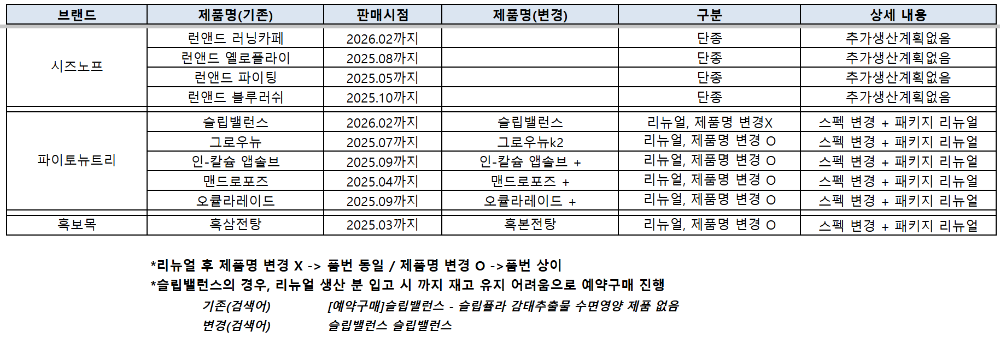

In [803]:
# ---------------------------------------------------------
# 1) SKU Family 생성
#    리뉴얼 전/후 제품을 같은 제품군으로 통합
# ---------------------------------------------------------

SKU_FAMILY_MAP = {
    # 시즈노프 단종
    '런앤드 러닝카페': '런앤드 러닝카페',
    '런앤드 옐로플라이': '런앤드 옐로플라이',
    '런앤드 파이팅': '런앤드 파이팅',
    '런앤드 블루러쉬': '런앤드 블루러쉬',

    # 파이토뉴트리 리뉴얼
    '슬립밸런스': '슬립밸런스',
    '슬립밸런스 슬립플라 감태추출물 수면영양': '슬립밸런스',

    '그로우뉴': '그로우뉴',
    '그로우뉴K2': '그로우뉴',

    '인-칼슘 앱솔브': '인-칼슘 앱솔브',
    '인-칼슘 앱솔브 +': '인-칼슘 앱솔브',
    '인칼슘 앱솔브': '인-칼슘 앱솔브',
    '인칼슘 앱솔브+': '인-칼슘 앱솔브',

    '맨드로포즈': '맨드로포즈',
    '맨드로포즈 +': '맨드로포즈',
    '맨드로포즈+': '맨드로포즈',

    '오플라레이드': '오플라레이드',
    '오플라레이드 +': '오플라레이드',
    '오플라레이드+': '오플라레이드',

    # 흑보목 리뉴얼
    '흑삼전탕': '흑본전탕',
    '흑본전탕': '흑본전탕'
}

df['sku_family'] = (
    df['sku_normalized']
    .map(SKU_FAMILY_MAP)
    .fillna(df['sku_normalized'])
)


# ---------------------------------------------------------
# 2) 제품 상태 생성
# ---------------------------------------------------------

DISCONTINUED_PRODUCTS = [
    '런앤드 러닝카페',
    '런앤드 옐로플라이',
    '런앤드 파이팅',
    '런앤드 블루러쉬'
]

RENEWAL_BEFORE_PRODUCTS = [
    '슬립밸런스',
    '그로우뉴',
    '인-칼슘 앱솔브',
    '인칼슘 앱솔브',
    '맨드로포즈',
    '오플라레이드',
    '흑삼전탕'
]

RENEWAL_AFTER_PRODUCTS = [
    '슬립밸런스 슬립플라 감태추출물 수면영양',
    '그로우뉴K2',
    '인-칼슘 앱솔브 +',
    '인칼슘 앱솔브+',
    '맨드로포즈 +',
    '맨드로포즈+',
    '오플라레이드 +',
    '오플라레이드+',
    '흑본전탕'
]

def product_status(sku):
    if sku in DISCONTINUED_PRODUCTS:
        return '단종'
    elif sku in RENEWAL_BEFORE_PRODUCTS:
        return '리뉴얼전'
    elif sku in RENEWAL_AFTER_PRODUCTS:
        return '리뉴얼후'
    else:
        return '정상'

df['product_status'] = (
    df['sku_normalized']
    .apply(product_status)
)


# ---------------------------------------------------------
# 3) 제품 주요 키워드 생성
#    복수 키워드 가능
#    자사몰(고도몰) 기준 분류
# ---------------------------------------------------------

PRODUCT_KEYWORD_MAP = {
    '수면건강': [
        '슬립밸런스',
        '슬립플라',
        '감태'
    ],
    '피로개선': [
        '피로',
        '에너지',
        '활력'
    ],
    '스트레스': [
        '스트레스',
        '긴장',
        '테아닌'
    ],
    '피부건강': [
        '피부',
        '콜라겐',
        '히알루론',
        '엘라스틴'
    ],
    '다이어트': [
        '다이어트',
        '체지방',
        '가르시니아'
    ],
    '갱년기': [
        '갱년기',
        '맨드로포즈',
        '오플라레이드'
    ],
    '눈건강': [
        '눈',
        '루테인',
        '지아잔틴'
    ],
    '혈행개선': [
        '혈행',
        '오메가',
        '은행잎'
    ],
    '혈당관리': [
        '혈당',
        '바나바'
    ],
    '높은혈압': [
        '혈압',
        '코엔자임',
        '코큐텐'
    ],
    '뼈기능': [
        '뼈',
        '칼슘',
        '인-칼슘',
        '인칼슘',
        '비타민D',
        'D3',
        '투데이D3',
        '성장가이드',
        '그로우뉴',
        '그로우뉴K2'
    ],
    '관절/연골': [
        '관절',
        '연골',
        'MSM',
        '보스웰리아'
    ],
    '면역': [
        '면역',
        '그로우뉴',
        '그로우뉴K2',
        '드롭스',
        '지니어스뉴',
        '흑본전탕',
        '흑삼전탕'
    ],
    '배뇨기능': [
        '배뇨',
        '쏘팔메토',
        '전립선'
    ],
    '위건강': [
        '위건강',
        '위',
        '매스틱',
        '양배추'
    ],
    '하루건강': [
        '멀티',
        '종합',
        '하루',
        '비타민'
    ],
    '베이비&키즈그로우랩': [
        '키즈',
        '베이비',
        '성장',
        '그로우랩',
        '그로우뉴',
        '성장가이드',
        '지니어스뉴',
        '드롭스',
        '스포이드'
    ],
    '남성건강': [
        '남성',
        '맨드로포즈',
        '쏘팔메토'
    ]
}


def extract_product_keywords(sku):
    matched = []
    sku_text = str(sku)

    for keyword, patterns in PRODUCT_KEYWORD_MAP.items():
        for pattern in patterns:
            if pattern in sku_text:
                matched.append(keyword)
                break

    if len(matched) == 0:
        return '기타'

    return ','.join(matched)


df['product_keywords'] = (
    df['sku_family']
    .apply(extract_product_keywords)
)



# ---------------------------------------------------------
# 4) 대표 키워드 생성
#    여러 키워드 중 첫 번째 키워드만 사용
# ---------------------------------------------------------

df['main_product_keyword'] = (
    df['product_keywords']
    .str.split(',')
    .str[0]
)


# ---------------------------------------------------------
# 5) 전처리 결과 확인
# ---------------------------------------------------------

print("=== 제품 리뉴얼 / 단종 / 키워드 전처리 완료 ===")

display(
    df[
        [
            'sku_normalized',
            'sku_family',
            'product_status',
            'product_keywords',
            'main_product_keyword'
        ]
    ]
    .drop_duplicates()
    .sort_values(['product_status', 'sku_family'])
    .head(10)
)

print("\n=== 제품 상태 분포 ===")
display(
    df['product_status']
    .value_counts()
    .to_frame('row_count')
)

print("\n=== 제품 키워드 분포 ===")
display(
    df['main_product_keyword']
    .value_counts()
    .to_frame('row_count')
)

=== 제품 리뉴얼 / 단종 / 키워드 전처리 완료 ===


,sku_normalized,sku_family,product_status,product_keywords,main_product_keyword
3404,런앤드 러닝카페,런앤드 러닝카페,단종,기타,기타
304,런앤드 블루러쉬,런앤드 블루러쉬,단종,기타,기타
11,맨드로포즈,맨드로포즈,리뉴얼전,"갱년기,남성건강",갱년기
1252,슬립밸런스,슬립밸런스,리뉴얼전,수면건강,수면건강
147,인-칼슘 앱솔브,인-칼슘 앱솔브,리뉴얼전,뼈기능,뼈기능
0,흑삼전탕,흑본전탕,리뉴얼전,면역,면역
48241,그로우뉴K2,그로우뉴,리뉴얼후,"뼈기능,면역,베이비&키즈그로우랩",뼈기능
81663,맨드로포즈+,맨드로포즈,리뉴얼후,"갱년기,남성건강",갱년기
225942,인칼슘 앱솔브+,인-칼슘 앱솔브,리뉴얼후,뼈기능,뼈기능
45264,흑본전탕,흑본전탕,리뉴얼후,면역,면역



=== 제품 상태 분포 ===


,row_count
product_status,
정상,439023
리뉴얼후,18911
단종,4511
리뉴얼전,4287



=== 제품 키워드 분포 ===


,row_count
main_product_keyword,
기타,168710
뼈기능,123004
면역,84861
베이비&키즈그로우랩,82951
갱년기,2915
위건강,2824
수면건강,1091
혈행개선,287
배뇨기능,87


---

## (전처리 후 컬럼 확인)

In [804]:
print(df.columns)

Index(['주문시간', '판매처명', '배송번호', '판매처주문번호', '주문자', '수령자', '주문번호', '주문보조', '주문구분',
       '교환', '판매형태', '브랜드', '품번', '품명', '제조사', '색상', '사이즈', '바코드', '주문수량',
       '택가', '결제액', '판매원가', '정산가', '배송구분', '판매처ID', '배송요구일', 'WMS입력일', '배송일',
       '배송사', '판매처보조번호', '검색어', '기타정보(SITE품번)', '판매처반영일', '최종처리', '입력일', '입력자',
       '우편번호', '주소1', '메모', '기타정보', '배송창고', '주문빨강설정', '로케이션', 'orderer_key',
       'orderer_key_status', 'receiver_key', 'receiver_key_status',
       'sales_month', 'source_sheet_name', 'source_file', 'weekday',
       'weekday_kr', 'channel_group', 'goo_seller', '세트여부', '증정여부', '세트대표',
       '세트구성품', '세트증정품', '세트관련', '주문내세트수', '복수세트주문', 'sku_normalized',
       'sku_type', 'sku_tag', '브랜드_분류', 'sku_family', 'product_status',
       'product_keywords', 'main_product_keyword'],
      dtype='object')


----

# 1️⃣ 기초 탐색 (Business EDA)

- 데이터 프레임 : `df_ch`

In [805]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.gridspec import GridSpec
from collections import Counter

plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

# ── 공통 색상 팔레트 ──────────────────────────────────────

# 채널 색상 — 파란 계열 제거, 채도 높은 고유 색상
CH_COLOR = {
    '자사몰':   '#2563EB',   # 고도몰 — 진한 파랑
    '자사몰_N': '#0D9488',   # 스마트스토어 — 틸
    '공구':     '#EA580C',   # 공구 — 주황
    '외부몰':   '#7C3AED',   # 외부플랫폼 — 보라
    'B2B':      '#0F766E',   # B2B — 진한 틸
    '무상':     '#CBD5E1',   # 무상 — 회색
}

CH_LABEL = {
    '자사몰':   '고도몰',
    '자사몰_N': '스마트스토어',
    '공구':     '공동구매',
    '외부몰':   '외부플랫폼',
    'B2B':      'B2B',
}

# 브랜드 색상 — 채널 색상과 완전히 다른 계열
BRAND_COLOR = {
    '파이토뉴트리': '#0369A1',   # 하늘 파랑 (채널 파랑과 구분)
    '그로우랩':     '#16A34A',   # 초록
    '혜인서':       '#BE185D',   # 핑크
    '시즈노프':     '#B45309',   # 황갈색
    '흑보목':       '#6D28D9',   # 진한 보라 (채널 보라보다 진함)
    '기타':         '#94A3B8',   # 회색
}

TARGET_CH = ['자사몰', '자사몰_N', '공구', '외부몰', 'B2B']

# 분석 대상 (무상 제외)
df_ch = df[df['channel_group'].isin(TARGET_CH)].copy()

# 정산가 > 0 라인 (마진율 계산용)
df_mg = df_ch[df_ch['정산가'] > 0].copy()

# 주문번호 기준 AOV
order_aov = (
    df_ch
    .groupby(['주문번호', 'channel_group'], as_index=False)['결제액']
    .sum()
    .rename(columns={'결제액': 'order_total'})
)


In [806]:
pip install adjustText

Note: you may need to restart the kernel to use updated packages.


## 1. 개요

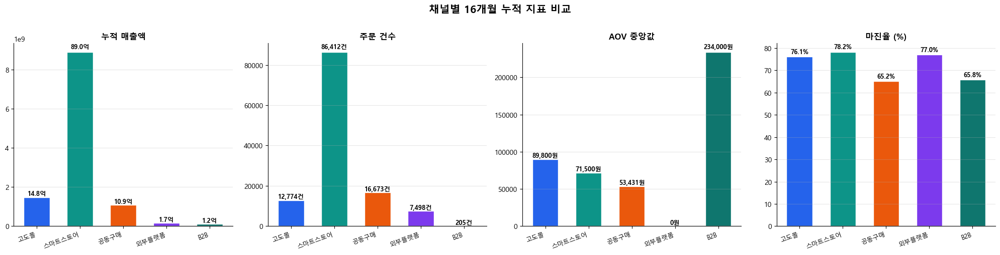

,16개월 누적,주문건수,AOV 중앙값,마진율(%)
채널,,,,
고도몰,14.8억,"12,774건","89,800원",76.1%
스마트스토어,89.0억,"86,412건","71,500원",78.2%
공동구매,10.9억,"16,673건","53,431원",65.2%
외부플랫폼,1.7억,"7,498건",0원,77.0%
B2B,1.2억,205건,"234,000원",65.8%


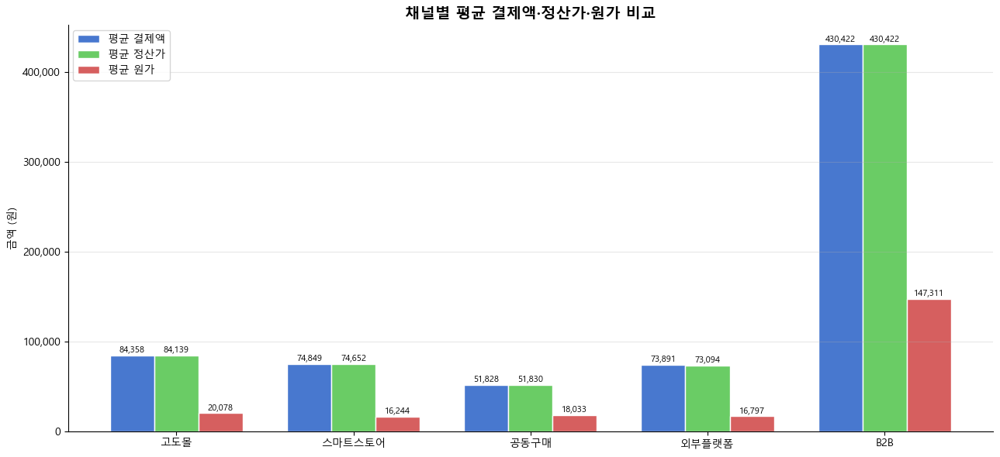

In [807]:
# ═══════════════════════════════════════════════════════════
# 1. 채널별 16개월 누적 매출·주문건수·AOV 중앙값·마진율
# ═══════════════════════════════════════════════════════════

rev    = df_ch.groupby('channel_group')['결제액'].sum().rename('누적매출')
cnt    = df_ch.groupby('channel_group')['주문번호'].nunique().rename('주문건수')
aov_md = order_aov.groupby('channel_group')['order_total'].median().rename('AOV중앙값')
margin = (
    df_mg.groupby('channel_group')
    .apply(lambda x: (x['정산가'].mean() - x['판매원가'].mean()) / x['정산가'].mean() * 100)
    .rename('마진율')
)

summary = (
    pd.concat([rev, cnt, aov_md, margin], axis=1)
    .loc[TARGET_CH].reset_index()
)
summary['채널라벨'] = summary['channel_group'].map(CH_LABEL)

fig, axes = plt.subplots(1, 4, figsize=(20, 5))
fig.suptitle('채널별 16개월 누적 지표 비교', fontsize=15, fontweight='bold', y=1.01)

metrics = [
    ('누적매출',  '누적 매출액',    lambda x: f'{x/1e8:.1f}억'),
    ('주문건수',  '주문 건수',      lambda x: f'{int(x):,}건'),
    ('AOV중앙값', 'AOV 중앙값',     lambda x: f'{int(x):,}원'),
    ('마진율',    '마진율 (%)',      lambda x: f'{x:.1f}%'),
]

for ax, (col, title, fmt) in zip(axes, metrics):
    colors = [CH_COLOR.get(c, '#999') for c in summary['channel_group']]
    bars = ax.bar(summary['채널라벨'], summary[col], color=colors, edgecolor='white', width=0.6)
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.set_xticklabels(summary['채널라벨'], rotation=20, ha='right', fontsize=9)
    ax.grid(axis='y', alpha=0.3)
    ax.spines[['top', 'right']].set_visible(False)
    for bar, val in zip(bars, summary[col]):
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() * 1.01,
                fmt(val), ha='center', va='bottom', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.show()

# 수치 테이블
tbl = summary[['채널라벨', '누적매출', '주문건수', 'AOV중앙값', '마진율']].copy()
tbl.columns = ['채널', '16개월 누적', '주문건수', 'AOV 중앙값', '마진율(%)']
tbl['16개월 누적'] = tbl['16개월 누적'].apply(lambda x: f'{x/1e8:.1f}억')
tbl['주문건수']    = tbl['주문건수'].apply(lambda x: f'{int(x):,}건')
tbl['AOV 중앙값']  = tbl['AOV 중앙값'].apply(lambda x: f'{int(x):,}원')
tbl['마진율(%)']   = tbl['마진율(%)'].apply(lambda x: f'{x:.1f}%')
display(tbl.set_index('채널'))



# ═══════════════════════════════════════════════════════════
# 2. 채널별 평균 결제액·정산가·원가 비교
# ═══════════════════════════════════════════════════════════

price_stats = (
    df_mg.groupby('channel_group')[['결제액', '정산가', '판매원가']]
    .mean()
    .loc[TARGET_CH]
    .reset_index()
)
price_stats['채널라벨'] = price_stats['channel_group'].map(CH_LABEL)

x      = np.arange(len(price_stats))
width  = 0.25
labels = ['평균 결제액', '평균 정산가', '평균 원가']
cols   = ['결제액', '정산가', '판매원가']
colors = ['#4878cf', '#6acc65', '#d65f5f']

fig, ax = plt.subplots(figsize=(13, 6))
for i, (col, lbl, color) in enumerate(zip(cols, labels, colors)):
    bars = ax.bar(x + i * width, price_stats[col], width=width,
                  label=lbl, color=color, edgecolor='white')
    for bar in bars:
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 500,
                f'{int(bar.get_height()):,}', ha='center', va='bottom', fontsize=8)

ax.set_title('채널별 평균 결제액·정산가·원가 비교', fontsize=14, fontweight='bold')
ax.set_xticks(x + width)
ax.set_xticklabels(price_stats['채널라벨'], fontsize=10)
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda v, _: f'{int(v):,}'))
ax.set_ylabel('금액 (원)')
ax.legend()
ax.grid(axis='y', alpha=0.3)
ax.spines[['top', 'right']].set_visible(False)
plt.tight_layout()
plt.show()

---

## 2. 자사몰 잠식 확인

- 공구 활성 여부와 자사몰 매출 추이 + 평균 변화율

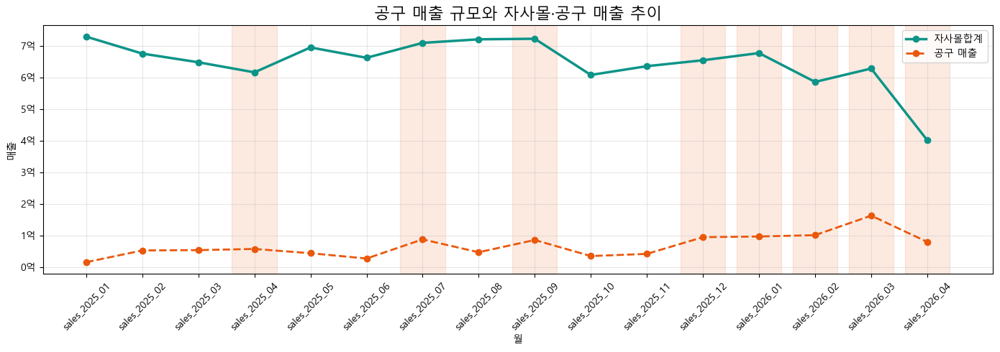

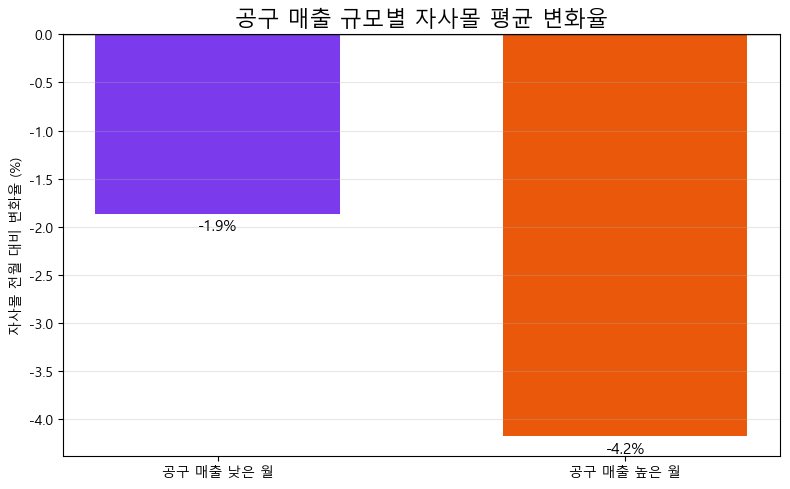

공구 매출 높은 월 기준: 월 공구매출 중앙값 이상 (55,814,352원 이상)


In [808]:
# =========================================
# 공구 매출 규모와 자사몰 매출 추이
# =========================================

monthly_owned = (
    df_ch
    .groupby(['sales_month', 'channel_group'])['결제액']
    .sum()
    .unstack(fill_value=0)
)

monthly_owned['자사몰합계'] = (
    monthly_owned.get('자사몰', 0)
    + monthly_owned.get('자사몰_N', 0)
)

monthly_owned['공구매출'] = monthly_owned.get('공구', 0)

monthly_owned['자사몰변화율'] = (
    monthly_owned['자사몰합계']
    .pct_change()
    * 100
)

plot_df = monthly_owned.copy()
plot_df.index = plot_df.index.astype(str)

# 공구 컬럼명 정리
if '공구매출' not in plot_df.columns:
    plot_df['공구매출'] = plot_df.get('공구', 0)

# 공구 매출 규모 기준: 중앙값 이상/미만
gonggu_positive = plot_df.loc[plot_df['공구매출'] > 0, '공구매출']

gonggu_median = (
    gonggu_positive.median()
    if len(gonggu_positive) > 0
    else 0
)

plot_df['공구규모구분'] = np.where(
    plot_df['공구매출'] >= gonggu_median,
    '공구 매출 높은 월',
    '공구 매출 낮은 월'
)

x = np.arange(len(plot_df))

fig, ax1 = plt.subplots(figsize=(14, 5))

# 자사몰 매출
ax1.plot(
    x,
    plot_df['자사몰합계'],
    marker='o',
    linewidth=2.5,
    color=CH_COLOR.get('자사몰_N', '#2ca02c'),
    label='자사몰합계'
)

# 공구 매출
ax1.plot(
    x,
    plot_df['공구매출'],
    marker='o',
    linewidth=2,
    linestyle='--',
    color=CH_COLOR.get('공구', '#ff7f0e'),
    label='공구 매출'
)

# 공구 매출 높은 월 음영
for idx, row in enumerate(plot_df.itertuples()):

    if row.공구규모구분 == '공구 매출 높은 월':

        ax1.axvspan(
            idx - 0.4,
            idx + 0.4,

            alpha=0.12,

            color=CH_COLOR.get('공구', '#ff7f0e')
        )

ax1.set_xlabel('월')
ax1.set_ylabel('매출')

ax1.set_xticks(x)
ax1.set_xticklabels(plot_df.index, rotation=45)

ax1.yaxis.set_major_formatter(
    ticker.FuncFormatter(lambda v, _: f'{v / 100_000_000:.0f}억')
)

ax1.grid(True, alpha=0.3)

ax1.set_title(
    '공구 매출 규모와 자사몰·공구 매출 추이',
    fontsize=16
)

ax1.legend(loc='upper right')

plt.tight_layout()
plt.show()

# =========================================
# 공구 매출 규모별 자사몰 전월 대비 변화율 비교
# =========================================

compare_df = (
    plot_df
    .dropna(subset=['자사몰변화율'])
    .copy()
)

avg_change = (
    compare_df
    .groupby('공구규모구분')['자사몰변화율']
    .mean()
    .reindex(['공구 매출 낮은 월', '공구 매출 높은 월'])
)

bar_colors = [
    CH_COLOR.get('외부몰', '#9467bd'),
    CH_COLOR.get('공구', '#ff7f0e')
]

fig, ax = plt.subplots(figsize=(8, 5))

bars = ax.bar(
    avg_change.index,
    avg_change.values,
    color=bar_colors,
    width=0.6
)

ax.axhline(0, color='black', linewidth=1)

ax.set_title(
    '공구 매출 규모별 자사몰 평균 변화율',
    fontsize=16
)

ax.set_ylabel('자사몰 전월 대비 변화율 (%)')
ax.grid(axis='y', alpha=0.3)

for bar in bars:
    value = bar.get_height()

    if pd.notna(value):
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            value - 0.05 if value < 0 else value + 0.05,
            f'{value:.1f}%',
            ha='center',
            va='top' if value < 0 else 'bottom',
            fontsize=11
        )

plt.tight_layout()
plt.show()

print(f"공구 매출 높은 월 기준: 월 공구매출 중앙값 이상 ({gonggu_median:,.0f}원 이상)")

---

## 3. SKU 매출 급감 & 신규 제품군 확인

- 원료 교체로 인한 리뉴얼 제품인지 추후 재확인 필요

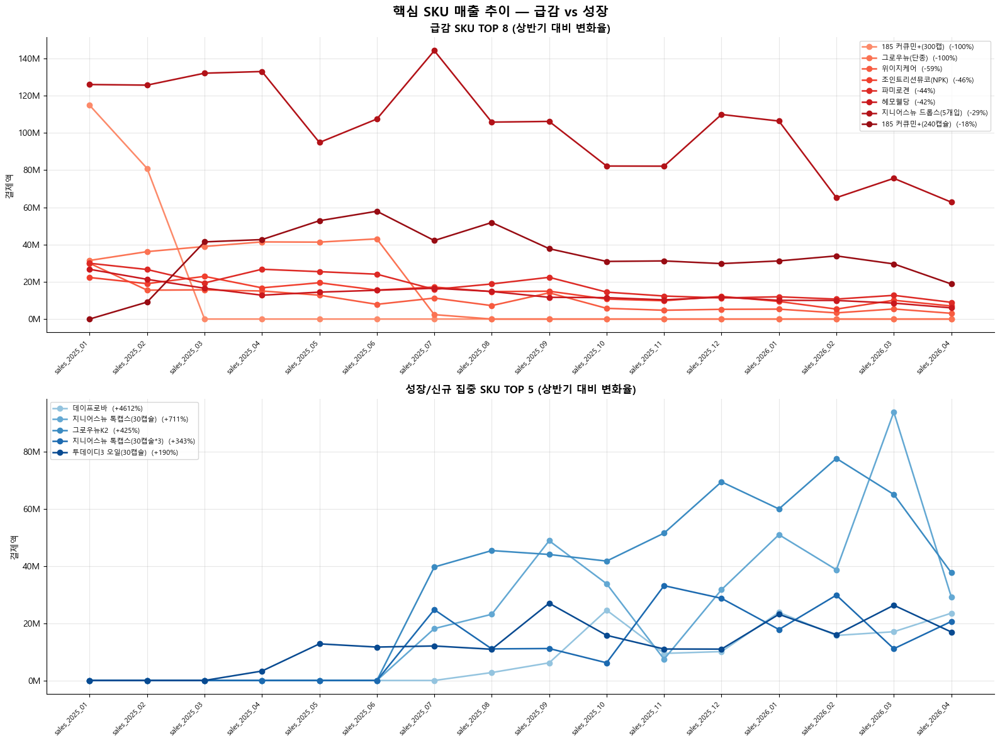


[상반기 대비 매출 변화율 — 급감 SKU]


,SKU,상반기 평균(M),하반기 평균(M),변화율(%)
0,185 커큐민+(300캡),24.50,0.00,-100.00
1,그로우뉴(단종),29.40,0.00,-100.00
2,위이지케어,14.40,5.90,-59.30
3,조인트리션뮤코(NPK),18.50,9.90,-46.20
4,파미로겐,23.40,13.10,-43.90
5,헤모웰당,17.30,10.00,-42.40
6,지니어스뉴 드롭스(5개입),121.10,86.30,-28.80
7,185 커큐민+(240캡슐),37.20,30.40,-18.30



[상반기 대비 매출 변화율 — 성장 SKU]


,SKU,상반기 평균(M),하반기 평균(M),변화율(%)
0,데이프로바,0.30,16.30,"4,611.70"
1,지니어스뉴 톡캡스(30캡슐),5.20,41.80,710.50
2,그로우뉴K2,10.60,55.80,425.50
3,지니어스뉴 톡캡스(30캡술*3),4.50,19.80,342.90
4,투데이디3 오일(30캡슐),6.30,18.40,190.00


In [809]:
# product 타입만 (포장재·카드류 제외)
df_sku = df_ch[df_ch['sku_type'] == 'product'].copy()

# SKU별 월별 매출
sku_monthly = (
    df_sku.groupby(['sales_month', 'sku_normalized'])['결제액']
    .sum().reset_index()
)

# SKU별 전체 누적 매출 (상위 20개 선택)
top_skus = (
    sku_monthly.groupby('sku_normalized')['결제액']
    .sum().nlargest(20).index.tolist()
)

sku_pivot = (
    sku_monthly[sku_monthly['sku_normalized'].isin(top_skus)]
    .pivot(index='sales_month', columns='sku_normalized', values='결제액')
    .fillna(0)
)

# ── 상반기 vs 하반기 변화율로 급감 SKU 탐지 ──
months_sorted = sorted(sku_pivot.index)
mid = len(months_sorted) // 2
first_half  = months_sorted[:mid]
second_half = months_sorted[mid:]

first_avg  = sku_pivot.loc[first_half].mean()
second_avg = sku_pivot.loc[second_half].mean()
change_rate = ((second_avg - first_avg) / first_avg.replace(0, np.nan) * 100).dropna()

decline_skus = change_rate.nsmallest(8).index.tolist()    # 급감 TOP8
growth_skus  = change_rate.nlargest(5).index.tolist()     # 성장 TOP5

fig, axes = plt.subplots(2, 1, figsize=(16, 12))
fig.suptitle('핵심 SKU 매출 추이 — 급감 vs 성장', fontsize=15, fontweight='bold')

# 급감 SKU
ax = axes[0]
cmap = plt.cm.Reds(np.linspace(0.4, 0.9, len(decline_skus)))
for sku, color in zip(decline_skus, cmap):
    vals = sku_pivot[sku] if sku in sku_pivot.columns else pd.Series(0, index=sku_pivot.index)
    rate = change_rate.get(sku, 0)
    ax.plot(sku_pivot.index, vals, marker='o', linewidth=1.8, color=color,
            label=f'{sku[:18]}  ({rate:+.0f}%)')
ax.set_title('급감 SKU TOP 8 (상반기 대비 변화율)', fontsize=12, fontweight='bold')
ax.set_xticklabels(sku_pivot.index, rotation=45, ha='right', fontsize=8)
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda v, _: f'{int(v/1e6)}M'))
ax.set_ylabel('결제액'); ax.grid(alpha=0.3)
ax.legend(loc='upper right', fontsize=8, framealpha=0.8)
ax.spines[['top', 'right']].set_visible(False)

# 성장(신규) SKU
ax = axes[1]
cmap2 = plt.cm.Blues(np.linspace(0.4, 0.9, len(growth_skus)))
for sku, color in zip(growth_skus, cmap2):
    vals = sku_pivot[sku] if sku in sku_pivot.columns else pd.Series(0, index=sku_pivot.index)
    rate = change_rate.get(sku, 0)
    ax.plot(sku_pivot.index, vals, marker='o', linewidth=1.8, color=color,
            label=f'{sku[:18]}  ({rate:+.0f}%)')
ax.set_title('성장/신규 집중 SKU TOP 5 (상반기 대비 변화율)', fontsize=12, fontweight='bold')
ax.set_xticklabels(sku_pivot.index, rotation=45, ha='right', fontsize=8)
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda v, _: f'{int(v/1e6)}M'))
ax.set_ylabel('결제액'); ax.grid(alpha=0.3)
ax.legend(loc='upper left', fontsize=8, framealpha=0.8)
ax.spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.show()

# 급감 수치 확인
print("\n[상반기 대비 매출 변화율 — 급감 SKU]")
decline_df = pd.DataFrame({
    'SKU': decline_skus,
    '상반기 평균(M)': [round(first_avg.get(s, 0)/1e6, 1) for s in decline_skus],
    '하반기 평균(M)': [round(second_avg.get(s, 0)/1e6, 1) for s in decline_skus],
    '변화율(%)':      [round(change_rate.get(s, 0), 1) for s in decline_skus],
})
display(decline_df)

# 성장 수치 확인
print("\n[상반기 대비 매출 변화율 — 성장 SKU]")

growth_df = pd.DataFrame({
    'SKU': growth_skus,
    '상반기 평균(M)': [round(first_avg.get(s, 0)/1e6, 1) for s in growth_skus],
    '하반기 평균(M)': [round(second_avg.get(s, 0)/1e6, 1) for s in growth_skus],
    '변화율(%)':      [round(change_rate.get(s, 0), 1) for s in growth_skus],
})

display(growth_df)

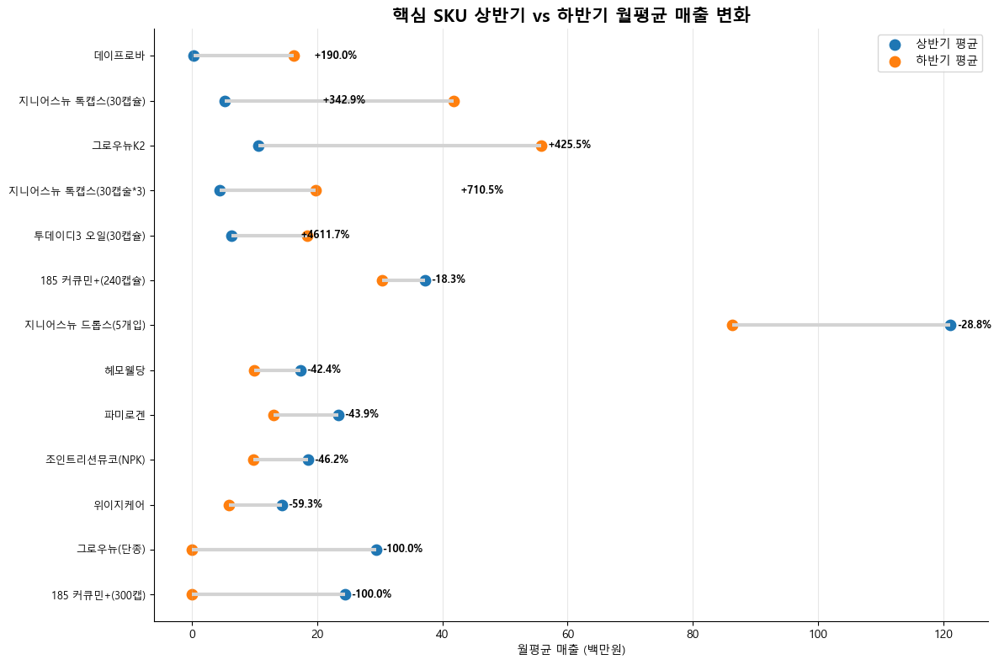

In [810]:
# 성장 + 급감 SKU 합쳐서 Dumbbell Chart
sku_compare = pd.concat([
    decline_df.assign(구분='급감'),
    growth_df.assign(구분='성장')
], ignore_index=True)

sku_compare = sku_compare.sort_values('변화율(%)')

fig, ax = plt.subplots(figsize=(12, 8))

y = np.arange(len(sku_compare))

ax.hlines(
    y=y,
    xmin=sku_compare['상반기 평균(M)'],
    xmax=sku_compare['하반기 평균(M)'],
    color='lightgray',
    linewidth=3
)

ax.scatter(
    sku_compare['상반기 평균(M)'],
    y,
    label='상반기 평균',
    s=80
)

ax.scatter(
    sku_compare['하반기 평균(M)'],
    y,
    label='하반기 평균',
    s=80
)

for i, row in sku_compare.iterrows():
    ax.text(
        max(row['상반기 평균(M)'], row['하반기 평균(M)']) + 1,
        i,
        f"{row['변화율(%)']:+.1f}%",
        va='center',
        fontsize=9,
        fontweight='bold'
    )

ax.set_yticks(y)
ax.set_yticklabels(sku_compare['SKU'], fontsize=9)

ax.set_xlabel('월평균 매출 (백만원)')
ax.set_title('핵심 SKU 상반기 vs 하반기 월평균 매출 변화', fontsize=15, fontweight='bold')

ax.grid(axis='x', alpha=0.3)
ax.spines[['top', 'right']].set_visible(False)
ax.legend()

plt.tight_layout()
plt.show()

- 상위 감소 SKU는 기존 주력 SKU들  
- 반면 성장 SKU는 신규/육성 SKU로 보임  

- 매출이 빠지는 문제가 아니라 SKU 포트폴리오가 이동하고 있는 것으로 보임  

> 기존 주력 SKU 일부가 급감하고, 그 빈자리를 신규 SKU들이 빠르게 채우는 구조  

---

## 4. 브랜드별 판매 채널 구조

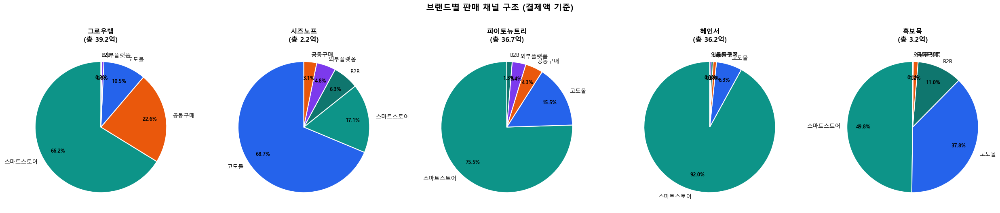


[브랜드별 채널 비중 (%)]


,B2B,공동구매,외부플랫폼,고도몰,스마트스토어
브랜드_분류,,,,,
그로우랩,0.20,22.60,0.60,10.50,66.20
시즈노프,6.30,3.10,4.80,68.70,17.10
파이토뉴트리,1.30,4.30,3.40,15.50,75.50
혜인서,0.50,0.80,0.30,6.30,92.00
흑보목,11.00,1.20,0.10,37.80,49.80


In [811]:
brand_ch = (
    df_ch.groupby(['브랜드_분류', 'channel_group'])['결제액']
    .sum().reset_index()
)
# 결제액 0 이하 제거
brand_ch = brand_ch[brand_ch['결제액'] > 0].copy()

if brand_ch.empty:
    print("브랜드별 채널 구조를 그릴 데이터가 없습니다.")
    print("확인 필요: df_ch, 브랜드_분류, channel_group, 결제액")
else:
    brand_total = (
        brand_ch
        .groupby('브랜드_분류')['결제액']
        .sum()
        .rename('total')
    )

    brand_ch = brand_ch.merge(
        brand_total,
        on='브랜드_분류'
    )

    brand_ch['비중'] = (
        brand_ch['결제액']
        / brand_ch['total']
        * 100
    )

brands = brand_ch['브랜드_분류'].unique()

fig, axes = plt.subplots(1, len(brands), figsize=(5 * len(brands), 6))
fig.suptitle('브랜드별 판매 채널 구조 (결제액 기준)', fontsize=15, fontweight='bold')

if len(brands) == 1:
    axes = [axes]

for ax, brand in zip(axes, brands):
    data = brand_ch[brand_ch['브랜드_분류'] == brand].sort_values('결제액', ascending=False)
    colors = [CH_COLOR.get(c, '#999') for c in data['channel_group']]
    wedges, texts, autotexts = ax.pie(
        data['비중'], labels=data['channel_group'].map(lambda x: CH_LABEL.get(x, x)),
        colors=colors, autopct='%1.1f%%', startangle=90,
        pctdistance=0.75, wedgeprops=dict(edgecolor='white', linewidth=1.5)
    )
    for t in autotexts:
        t.set_fontsize(9); t.set_fontweight('bold')
    total_rev = brand_ch[brand_ch['브랜드_분류'] == brand]['결제액'].sum()
    ax.set_title(f'{brand}\n(총 {total_rev/1e8:.1f}억)', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()

# 수치 테이블
print("\n[브랜드별 채널 비중 (%)]")
pivot_brand = (
    brand_ch.pivot_table(index='브랜드_분류', columns='channel_group', values='비중', aggfunc='sum')
    .fillna(0).round(1)
)
pivot_brand.columns = [CH_LABEL.get(c, c) for c in pivot_brand.columns]
display(pivot_brand)

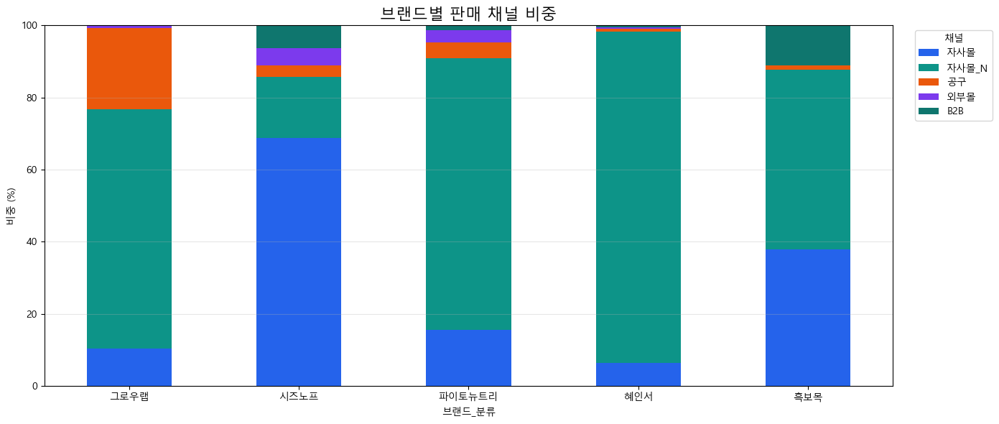

In [812]:
channel_order = ['자사몰', '자사몰_N', '공구', '외부몰', 'B2B']

pivot_pct = (
    brand_ch
    .pivot_table(
        index='브랜드_분류',
        columns='channel_group',
        values='비중',
        aggfunc='sum'
    )
    .fillna(0)
)

pivot_pct = pivot_pct[
    [c for c in channel_order if c in pivot_pct.columns]
]

ax = pivot_pct.plot(
    kind='bar',
    stacked=True,
    figsize=(14, 6),
    color=[CH_COLOR.get(c, '#999999') for c in pivot_pct.columns]
)

ax.set_title('브랜드별 판매 채널 비중', fontsize=16)
ax.set_ylabel('비중 (%)')
ax.set_ylim(0, 100)
plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.3)
plt.legend(
    title='채널',
    bbox_to_anchor=(1.02, 1),
    loc='upper left'
)
plt.tight_layout()
plt.show()

In [813]:
df_ch[df_ch['브랜드_분류'] == '그로우랩'].groupby('channel_group')['결제액'].sum()

channel_group
B2B         7092572
공구        886910551
외부몰        21657800
자사몰       410252364
자사몰_N    2596013427
Name: 결제액, dtype: int64

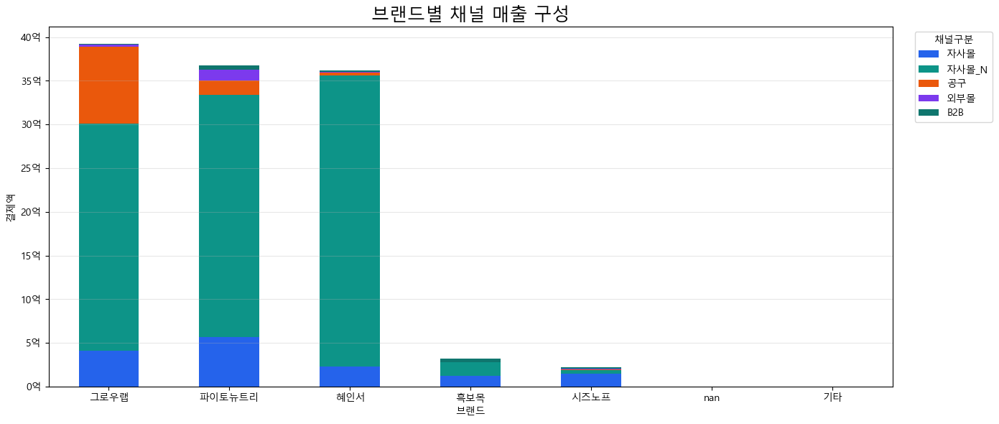

In [814]:
pivot_brand_amt = (
    df_ch
    .groupby(['브랜드_분류', 'channel_group'])['결제액']
    .sum()
    .unstack(fill_value=0)
)

# 총매출 기준 정렬
pivot_brand_amt['합계'] = pivot_brand_amt.sum(axis=1)

pivot_brand_amt = (
    pivot_brand_amt
    .sort_values('합계', ascending=False)
    .drop(columns='합계')
)

# 색상 순서 고정
channel_order = ['자사몰', '자사몰_N', '공구', '외부몰', 'B2B']

pivot_brand_amt = pivot_brand_amt.reindex(
    columns=[c for c in channel_order if c in pivot_brand_amt.columns]
)

# 그래프
ax = pivot_brand_amt.plot(
    kind='bar',
    stacked=True,
    figsize=(14, 6),

    color=[
        CH_COLOR.get(c, '#999999')
        for c in pivot_brand_amt.columns
    ]
)

ax.set_title(
    '브랜드별 채널 매출 구성',
    fontsize=18
)

ax.set_xlabel('브랜드')
ax.set_ylabel('결제액')

ax.yaxis.set_major_formatter(
    ticker.FuncFormatter(
        lambda x, p: f'{x/100_000_000:.0f}억'
    )
)

plt.xticks(rotation=0)

plt.grid(axis='y', alpha=0.3)

plt.legend(
    title='채널구분',
    bbox_to_anchor=(1.02, 1),
    loc='upper left'
)

plt.tight_layout()
plt.show()

---

## 5. 요일·시간 구매 패턴

- 자사몰 : 자사몰(고도몰) + 자사몰_N(스마트스토어)  

자사몰 주문시간 결측률: 0.0%


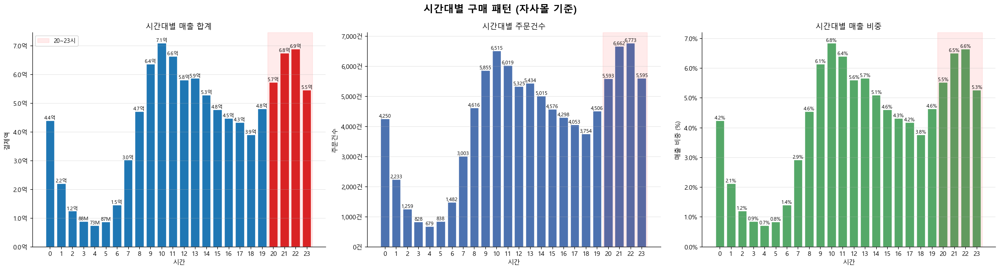

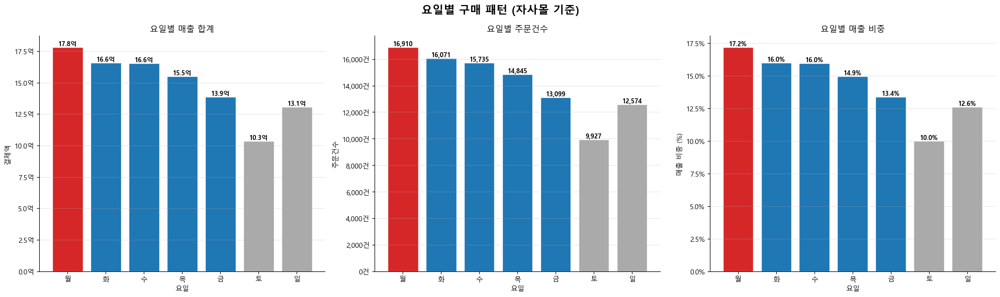

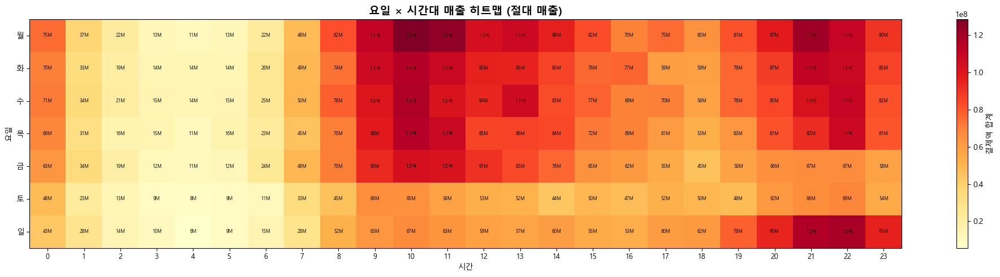

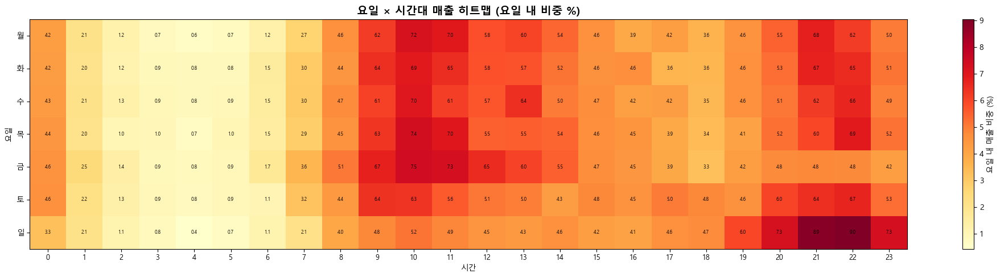

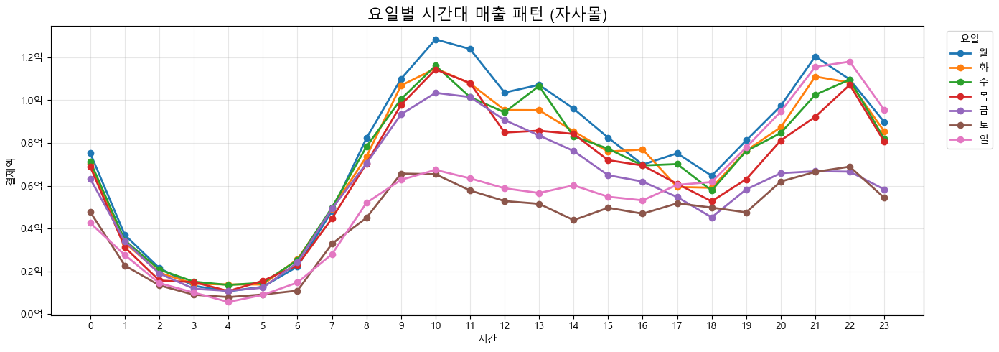

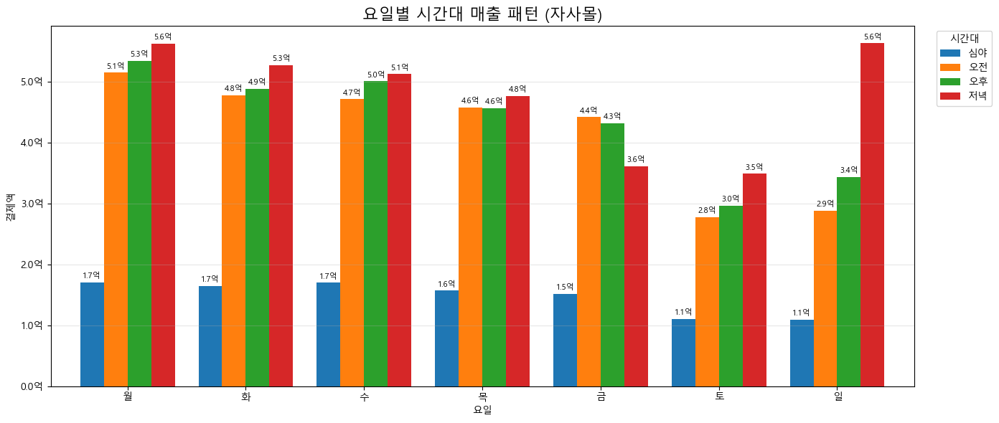

In [815]:
# ═══════════════════════════════════════════════════════════
# 8. 요일·시간 구매 패턴
# ═══════════════════════════════════════════════════════════

def format_money(v):
    if v >= 100_000_000:
        return f'{v/100_000_000:.1f}억'
    elif v >= 1_000_000:
        return f'{v/1_000_000:.0f}M'
    else:
        return f'{v:,.0f}'


df_owned = df_ch[df_ch['channel_group'].isin(['자사몰', '자사몰_N'])].copy()

missing_rate = df_owned['주문시간'].isna().mean() * 100
print(f"자사몰 주문시간 결측률: {missing_rate:.1f}%")

df_time = df_owned[df_owned['주문시간'].notna()].copy()

df_time['hour'] = df_time['주문시간'].dt.hour
df_time['weekday_n'] = df_time['주문시간'].dt.dayofweek

WEEKDAY_ORDER = ['월', '화', '수', '목', '금', '토', '일']
WEEKDAY_NUM = {0: '월', 1: '화', 2: '수', 3: '목', 4: '금', 5: '토', 6: '일'}

df_time['weekday_kr'] = df_time['weekday_n'].map(WEEKDAY_NUM)

# ─────────────────────────────────────────
# 1) 시간대별 매출 / 주문건수 / 매출비중
# ─────────────────────────────────────────

hour_sales = df_time.groupby('hour')['결제액'].sum().reindex(range(24), fill_value=0)
hour_orders = df_time.groupby('hour')['주문번호'].nunique().reindex(range(24), fill_value=0)
hour_ratio = hour_sales / hour_sales.sum() * 100

fig, axes = plt.subplots(1, 3, figsize=(22, 6))
fig.suptitle('시간대별 구매 패턴 (자사몰 기준)', fontsize=16, fontweight='bold')

bar_colors_h = ['#d62728' if h in range(20, 24) else '#1f77b4' for h in range(24)]

ax = axes[0]
ax.bar(range(24), hour_sales.values, color=bar_colors_h, edgecolor='white')
ax.axvspan(19.5, 23.5, alpha=0.08, color='red', label='20~23시')
ax.set_title('시간대별 매출 합계')
ax.set_xlabel('시간')
ax.set_ylabel('결제액')
ax.set_xticks(range(24))
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda v, _: f'{v/100_000_000:.1f}억'))
ax.grid(axis='y', alpha=0.3)
ax.legend(fontsize=9)
ax.spines[['top', 'right']].set_visible(False)

for i, v in enumerate(hour_sales.values):
    ax.text(i, v, format_money(v), ha='center', va='bottom', fontsize=8)

ax = axes[1]
ax.bar(range(24), hour_orders.values, color='#4c72b0', edgecolor='white')
ax.axvspan(19.5, 23.5, alpha=0.08, color='red')
ax.set_title('시간대별 주문건수')
ax.set_xlabel('시간')
ax.set_ylabel('주문건수')
ax.set_xticks(range(24))
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda v, _: f'{int(v):,}건'))
ax.grid(axis='y', alpha=0.3)
ax.spines[['top', 'right']].set_visible(False)

for i, v in enumerate(hour_orders.values):
    ax.text(i, v, f'{int(v):,}', ha='center', va='bottom', fontsize=8)

ax = axes[2]
ax.bar(range(24), hour_ratio.values, color='#55a868', edgecolor='white')
ax.axvspan(19.5, 23.5, alpha=0.08, color='red')
ax.set_title('시간대별 매출 비중')
ax.set_xlabel('시간')
ax.set_ylabel('매출 비중 (%)')
ax.set_xticks(range(24))
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda v, _: f'{v:.1f}%'))
ax.grid(axis='y', alpha=0.3)
ax.spines[['top', 'right']].set_visible(False)

for i, v in enumerate(hour_ratio.values):
    ax.text(i, v, f'{v:.1f}%', ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()


# ─────────────────────────────────────────
# 2) 요일별 매출 / 주문건수 / 매출비중
# ─────────────────────────────────────────

week_sales = df_time.groupby('weekday_n')['결제액'].sum().reindex(range(7), fill_value=0)
week_orders = df_time.groupby('weekday_n')['주문번호'].nunique().reindex(range(7), fill_value=0)

week_sales.index = [WEEKDAY_NUM[i] for i in week_sales.index]
week_orders.index = [WEEKDAY_NUM[i] for i in week_orders.index]

week_ratio = week_sales / week_sales.sum() * 100

fig, axes = plt.subplots(1, 3, figsize=(20, 6))
fig.suptitle('요일별 구매 패턴 (자사몰 기준)', fontsize=16, fontweight='bold')

bar_colors_w = [
    '#d62728' if d == '월'
    else ('#aaaaaa' if d in ['토', '일'] else '#1f77b4')
    for d in WEEKDAY_ORDER
]

ax = axes[0]
ax.bar(WEEKDAY_ORDER, week_sales.loc[WEEKDAY_ORDER].values, color=bar_colors_w, edgecolor='white')
ax.set_title('요일별 매출 합계')
ax.set_xlabel('요일')
ax.set_ylabel('결제액')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda v, _: f'{v/100_000_000:.1f}억'))
ax.grid(axis='y', alpha=0.3)
ax.spines[['top', 'right']].set_visible(False)

for i, v in enumerate(week_sales.loc[WEEKDAY_ORDER].values):
    ax.text(i, v, format_money(v), ha='center', va='bottom', fontsize=9, fontweight='bold')

ax = axes[1]
ax.bar(WEEKDAY_ORDER, week_orders.loc[WEEKDAY_ORDER].values, color=bar_colors_w, edgecolor='white')
ax.set_title('요일별 주문건수')
ax.set_xlabel('요일')
ax.set_ylabel('주문건수')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda v, _: f'{int(v):,}건'))
ax.grid(axis='y', alpha=0.3)
ax.spines[['top', 'right']].set_visible(False)

for i, v in enumerate(week_orders.loc[WEEKDAY_ORDER].values):
    ax.text(i, v, f'{int(v):,}', ha='center', va='bottom', fontsize=9, fontweight='bold')

ax = axes[2]
ax.bar(WEEKDAY_ORDER, week_ratio.loc[WEEKDAY_ORDER].values, color=bar_colors_w, edgecolor='white')
ax.set_title('요일별 매출 비중')
ax.set_xlabel('요일')
ax.set_ylabel('매출 비중 (%)')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda v, _: f'{v:.1f}%'))
ax.grid(axis='y', alpha=0.3)
ax.spines[['top', 'right']].set_visible(False)

for i, v in enumerate(week_ratio.loc[WEEKDAY_ORDER].values):
    ax.text(i, v, f'{v:.1f}%', ha='center', va='bottom', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.show()


# ─────────────────────────────────────────
# 3) 요일 × 시간 히트맵: 절대 매출
# ─────────────────────────────────────────

pivot_hw_sales = (
    df_time
    .groupby(['weekday_n', 'hour'])['결제액']
    .sum()
    .unstack(fill_value=0)
    .reindex(range(7), fill_value=0)
    .reindex(columns=range(24), fill_value=0)
)

pivot_hw_sales.index = [WEEKDAY_NUM[i] for i in pivot_hw_sales.index]

fig, ax = plt.subplots(figsize=(20, 5))
im = ax.imshow(pivot_hw_sales.loc[WEEKDAY_ORDER].values, aspect='auto', cmap='YlOrRd')

ax.set_xticks(range(24))
ax.set_xticklabels(range(24), fontsize=9)
ax.set_yticks(range(len(WEEKDAY_ORDER)))
ax.set_yticklabels(WEEKDAY_ORDER, fontsize=10)
ax.set_title('요일 × 시간대 매출 히트맵 (절대 매출)', fontsize=14, fontweight='bold')
ax.set_xlabel('시간')
ax.set_ylabel('요일')

for i in range(len(WEEKDAY_ORDER)):
    for j in range(24):
        value = pivot_hw_sales.loc[WEEKDAY_ORDER[i], j]
        ax.text(j, i, format_money(value), ha='center', va='center', fontsize=6, color='black')

plt.colorbar(im, ax=ax, label='결제액 합계')
plt.tight_layout()
plt.show()


# ─────────────────────────────────────────
# 4) 요일 × 시간 히트맵: 요일 내 비중
# ─────────────────────────────────────────

pivot_hw_pct = (
    pivot_hw_sales
    .div(pivot_hw_sales.sum(axis=1).replace(0, np.nan), axis=0)
    * 100
)

fig, ax = plt.subplots(figsize=(20, 5))
im = ax.imshow(pivot_hw_pct.loc[WEEKDAY_ORDER].values, aspect='auto', cmap='YlOrRd')

ax.set_xticks(range(24))
ax.set_xticklabels(range(24), fontsize=9)
ax.set_yticks(range(len(WEEKDAY_ORDER)))
ax.set_yticklabels(WEEKDAY_ORDER, fontsize=10)
ax.set_title('요일 × 시간대 매출 히트맵 (요일 내 비중 %)', fontsize=14, fontweight='bold')
ax.set_xlabel('시간')
ax.set_ylabel('요일')

for i in range(len(WEEKDAY_ORDER)):
    for j in range(24):
        value = pivot_hw_pct.loc[WEEKDAY_ORDER[i], j]
        ax.text(j, i, f'{value:.1f}', ha='center', va='center', fontsize=6, color='black')

plt.colorbar(im, ax=ax, label='요일 내 매출 비중 (%)')
plt.tight_layout()
plt.show()


# ─────────────────────────────────────────
# 5) 요일별 시간대 매출 패턴: 선그래프
# ─────────────────────────────────────────

pivot_hw_line = (
    df_time
    .groupby(['weekday_n', 'hour'])['결제액']
    .sum()
    .unstack(fill_value=0)
    .reindex(range(7), fill_value=0)
    .reindex(columns=range(24), fill_value=0)
)

fig, ax = plt.subplots(figsize=(14, 5))

for i in range(7):
    ax.plot(
        range(24),
        pivot_hw_line.loc[i],
        marker='o',
        linewidth=2,
        label=WEEKDAY_NUM[i]
    )

ax.set_title('요일별 시간대 매출 패턴 (자사몰)', fontsize=16)
ax.set_xlabel('시간')
ax.set_ylabel('결제액')
ax.set_xticks(range(24))
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda v, _: f'{v/100_000_000:.1f}억'))
ax.grid(True, alpha=0.3)
ax.legend(title='요일', bbox_to_anchor=(1.02, 1), loc='upper left')

plt.tight_layout()
plt.show()


# ─────────────────────────────────────────
# 6) 요일 × 시간대 구간 매출
# ─────────────────────────────────────────

def time_band(hour):
    if 6 <= hour <= 11:
        return '오전'
    elif 12 <= hour <= 17:
        return '오후'
    elif 18 <= hour <= 23:
        return '저녁'
    else:
        return '심야'


df_time['시간대'] = df_time['hour'].apply(time_band)

band_order = ['심야', '오전', '오후', '저녁']

pivot_band = (
    df_time
    .groupby(['weekday_kr', '시간대'])['결제액']
    .sum()
    .unstack(fill_value=0)
    .reindex(WEEKDAY_ORDER)
    .reindex(columns=band_order, fill_value=0)
)

ax = pivot_band.plot(
    kind='bar',
    figsize=(14, 6),
    width=0.8
)

ax.set_title('요일별 시간대 매출 패턴 (자사몰)', fontsize=16)
ax.set_xlabel('요일')
ax.set_ylabel('결제액')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda v, _: f'{v/100_000_000:.1f}억'))

plt.xticks(rotation=0)
plt.grid(axis='y', alpha=0.3)
plt.legend(title='시간대', bbox_to_anchor=(1.02, 1), loc='upper left')

for container in ax.containers:
    ax.bar_label(
        container,
        labels=[format_money(v) for v in container.datavalues],
        fontsize=8,
        padding=2
    )

plt.tight_layout()
plt.show()

---

## 6. 외부몰 확인

외부몰 총 매출: 1.68억
외부몰 총 고객수: 5,700명



,플랫폼,매출(M),매출비중(%),주문건수,고객수
0,쿠팡,71.40,42.50,1278,812
1,CJ온스타일,39.00,23.20,1355,452
2,이지웰,25.80,15.40,663,251
3,11번가,19.60,11.70,251,213
4,무신사,7.50,4.50,344,175
5,GS홈쇼핑,1.60,1.00,24,24
6,토스쇼핑,1.50,0.90,83,31
7,대전장애인육상팀,0.70,0.40,7,1
8,신세계닷컴,0.40,0.20,5,3
9,이마트몰,0.30,0.20,10,7


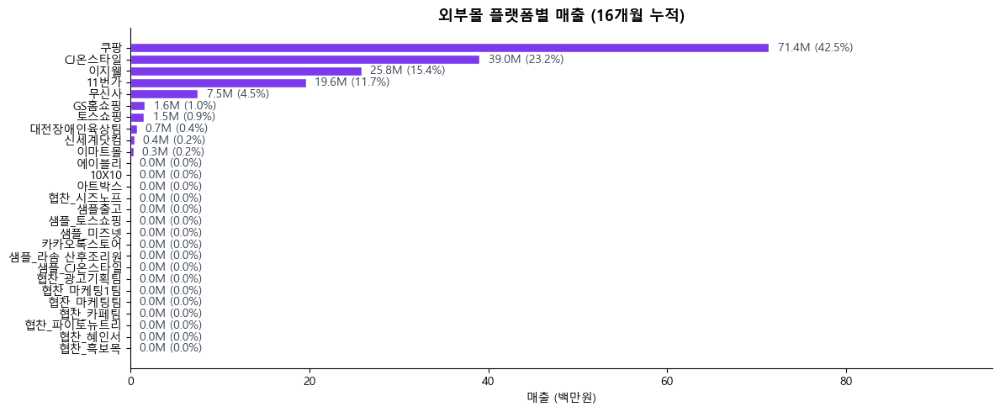

In [816]:
# 외부몰 판매처명 → 플랫폼명 매핑
platform_map = {
    '(이지웰)lifenbio12':                    '이지웰',
    '(쿠팡)lifenbio':                        '쿠팡',
    '(11번가)lifenbio':                      '11번가',
    '(무신사스토어)seasnoff':                '무신사',
    '(이마트)lifenbio12':                    '이마트몰',
    '(CJ온스타일)lifenbio12':               'CJ온스타일',
    '(GS홈쇼핑)1042054':                    'GS홈쇼핑',
    '(신세계닷컴2.0)lifenbio12':             '신세계닷컴',
    '(10X10)seasnoff':                       '10X10',
    '토스쇼핑':                              '토스쇼핑',
    '(에이블리)seasnoff@lifenbio.com':       '에이블리',
    '(카카오톡 스토어)phytonutri.kr@gmail.com': '카카오톡스토어',
    '(아트박스)p1508100677':                 '아트박스',
}

external = df[df['channel_group'] == '외부몰'].copy()
external['플랫폼'] = external['판매처명'].map(platform_map).fillna(external['판매처명'])

summary = (
    external.groupby('플랫폼')
    .agg(
        매출=('결제액', 'sum'),
        주문건수=('결제액', 'count'),
        고객수=('receiver_key', 'nunique')
    )
    .sort_values('매출', ascending=False)
    .reset_index()
)

summary['매출(M)']    = (summary['매출'] / 1e6).round(1)
summary['매출비중(%)'] = (summary['매출'] / summary['매출'].sum() * 100).round(1)

print(f"외부몰 총 매출: {external['결제액'].sum()/1e8:.2f}억")
print(f"외부몰 총 고객수: {external['receiver_key'].nunique():,}명\n")
display(summary[['플랫폼', '매출(M)', '매출비중(%)', '주문건수', '고객수']])

# 시각화
fig, ax = plt.subplots(figsize=(12, 5))
colors = [CH_COLOR.get('외부몰', '#7C3AED')] * len(summary)
bars = ax.barh(summary['플랫폼'], summary['매출(M)'],
               color=colors, edgecolor='white')

for bar, val, pct in zip(bars, summary['매출(M)'], summary['매출비중(%)']):
    ax.text(bar.get_width() + 1, bar.get_y() + bar.get_height()/2,
            f'{val}M ({pct}%)', va='center', fontsize=10, color='#374151')

ax.set_title('외부몰 플랫폼별 매출 (16개월 누적)', fontsize=13, fontweight='bold')
ax.set_xlabel('매출 (백만원)')
ax.set_xlim(0, summary['매출(M)'].max() * 1.35)
ax.invert_yaxis()
ax.spines[['top', 'right']].set_visible(False)
plt.tight_layout()
plt.show()

외부플랫폼 전체 매출 합계: 167.8M

=== 외부플랫폼 전체 매출/비중 (필터링 전) ===


,플랫폼,매출(M),매출비중(%)
17,쿠팡,71.40,42.50
2,CJ온스타일,39.00,23.20
15,이지웰,25.80,15.40
1,11번가,19.60,11.70
5,무신사,7.50,4.50
3,GS홈쇼핑,1.60,1.00
18,토스쇼핑,1.50,0.90
4,대전장애인육상팀,0.70,0.40
11,신세계닷컴,0.40,0.20
14,이마트몰,0.30,0.20


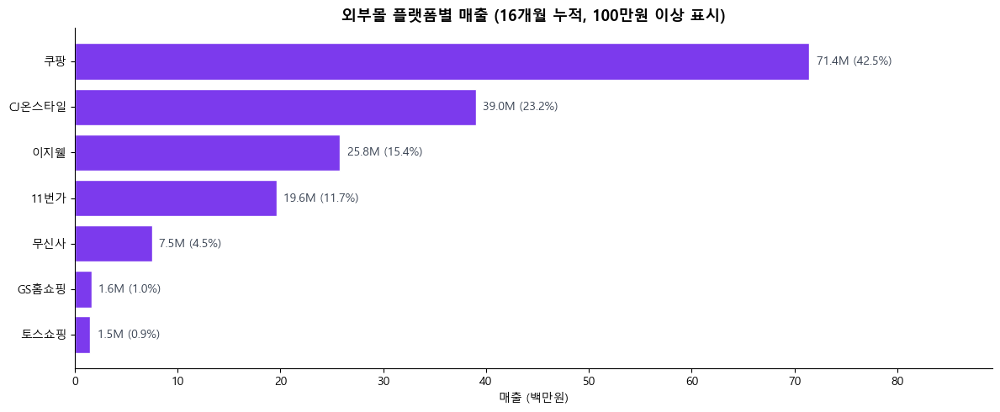

In [900]:
# 시각화 보정
summary_0 = (
    external.groupby('플랫폼')
    .agg(
        매출=('결제액', 'sum'),
        주문건수=('결제액', 'count'),
        고객수=('receiver_key', 'nunique')
    )
    .reset_index()
)

summary_0 = summary_0.sort_values('매출', ascending=False)

summary_0['매출(M)'] = (summary_0['매출'] / 1e6).round(1)

# 비중(%)은 전체 플랫폼 합계(필터링 전) 기준으로 고정
total_매출 = summary_0['매출'].sum()
summary_0['매출비중(%)'] = (
    summary_0['매출'] / total_매출 * 100
).round(1)

print(f"외부플랫폼 전체 매출 합계: {total_매출/1e6:.1f}M")
print("\n=== 외부플랫폼 전체 매출/비중 (필터링 전) ===")
display(summary_0[['플랫폼', '매출(M)', '매출비중(%)']])

# 시각화는 100만원 이상 플랫폼만
summary_plot = summary_0[summary_0['매출'] >= 1_000_000].copy()

fig, ax = plt.subplots(figsize=(12, 5))

colors = [CH_COLOR.get('외부몰', '#7C3AED')] * len(summary_plot)

bars = ax.barh(
    summary_plot['플랫폼'],
    summary_plot['매출(M)'],
    color=colors,
    edgecolor='white'
)

for bar, val, pct in zip(bars, summary_plot['매출(M)'], summary_plot['매출비중(%)']):
    ax.text(
        bar.get_width() + summary_plot['매출(M)'].max() * 0.01,
        bar.get_y() + bar.get_height()/2,
        f'{val}M ({pct}%)',
        va='center',
        fontsize=10,
        color='#374151'
    )

ax.set_title('외부몰 플랫폼별 매출 (16개월 누적, 100만원 이상 표시)', fontsize=13, fontweight='bold')
ax.set_xlabel('매출 (백만원)')
ax.set_xlim(0, summary_plot['매출(M)'].max() * 1.25)
ax.invert_yaxis()
ax.spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.show()

---

# 2️⃣ 심화 EDA (패턴 발견·가설 검증)

- 데이터 프레임 : `df_eda`

In [817]:
# =========================================================
# 분석용 데이터프레임 생성
# =========================================================
df_eda = df.copy()

# 제거할 컬럼
drop_cols = [
    '주문자',
    '수령자',
    '주문보조',
    '색상',
    '사이즈',
    '택가',
    '배송사',
    '판매처보조번호',
    '검색어',
    '기타정보(SITE품번)',
    '판매처반영일',
    '주소1',
    '메모',
    '기타정보',
    '배송창고',
    '주문빨강설정',
    '로케이션',
    # 'sales_month',
    'source_file'
]

# 제거 전 컬럼 수
before_cols = df_eda.shape[1]

# 컬럼 제거
df_eda = df_eda.drop(columns=drop_cols)

# 제거 후 컬럼 수
after_cols = df_eda.shape[1]

# 제거된 컬럼 수
removed_cols = before_cols - after_cols

# 결과 확인
print("=== 컬럼 정리 완료 ===")
print(f"제거 전 컬럼 수 : {before_cols}개")
print(f"제거 후 컬럼 수 : {after_cols}개")
print(f"제거된 컬럼 수 : {removed_cols}개")

=== 컬럼 정리 완료 ===
제거 전 컬럼 수 : 70개
제거 후 컬럼 수 : 52개
제거된 컬럼 수 : 18개


In [818]:
df_eda.columns

Index(['주문시간', '판매처명', '배송번호', '판매처주문번호', '주문번호', '주문구분', '교환', '판매형태', '브랜드',
       '품번', '품명', '제조사', '바코드', '주문수량', '결제액', '판매원가', '정산가', '배송구분', '판매처ID',
       '배송요구일', 'WMS입력일', '배송일', '최종처리', '입력일', '입력자', '우편번호', 'orderer_key',
       'orderer_key_status', 'receiver_key', 'receiver_key_status',
       'sales_month', 'source_sheet_name', 'weekday', 'weekday_kr',
       'channel_group', 'goo_seller', '세트여부', '증정여부', '세트대표', '세트구성품', '세트증정품',
       '세트관련', '주문내세트수', '복수세트주문', 'sku_normalized', 'sku_type', 'sku_tag',
       '브랜드_분류', 'sku_family', 'product_status', 'product_keywords',
       'main_product_keyword'],
      dtype='object')

In [819]:
# =========================================================
# 공통 설정
# =========================================================

channel_order = ['자사몰', '자사몰_N', '공구', '외부몰', 'B2B']

label_map = {
    '자사몰': '자사몰 (고도몰)',
    '자사몰_N': '자사몰_N (스마트스토어)',
    '공구': '공구 (셀러판매)',
    '외부몰': '외부몰',
    'B2B': 'B2B'
}

## 1. 채널별 매출 추이 (월별, 일별)

- 공구는 `주문시간`이 NaN이고, `입력일`만 존재  
    - 공구의 `주문시간`과 `입력일`은 1~2일 정도 갭이 존재  
<br>  
- 그러므로, 월별 분석을 메인으로 보고 일별 분석은 추세 확인용으로만 사용  
    - 공구만 `입력일` 기준  
    - 이 외 자사몰 및 외부몰 등은 `주문시간` 기준  

=== 월별 채널 매출 ===


channel_group,자사몰,자사몰_N,공구,외부몰,B2B
sales_month,,,,,
sales_2025_01,"129,254,717.00","600,181,494.00","15,782,260.00","20,503,901.00","16,393,880.00"
sales_2025_02,"116,007,500.00","559,862,790.00","52,928,978.00","13,188,872.00","4,400,224.00"
sales_2025_03,"112,517,756.00","535,857,589.00","53,952,978.00","14,784,600.00","9,323,565.00"
sales_2025_04,"93,807,548.00","522,711,030.00","57,675,725.00","18,161,400.00","9,816,267.00"
sales_2025_05,"103,285,023.00","592,012,610.00","44,137,683.00","15,609,278.00","8,314,080.00"
sales_2025_06,"101,165,130.00","561,372,130.00","27,358,878.00","10,454,354.00","5,273,900.00"
sales_2025_07,"92,244,266.00","617,552,480.00","87,957,615.00","9,430,800.00","4,923,107.00"
sales_2025_08,"82,552,713.00","638,490,675.00","47,191,614.00","7,013,331.00","5,336,000.00"
sales_2025_09,"91,091,625.00","631,665,580.00","86,029,551.00","19,497,423.00","16,087,380.00"


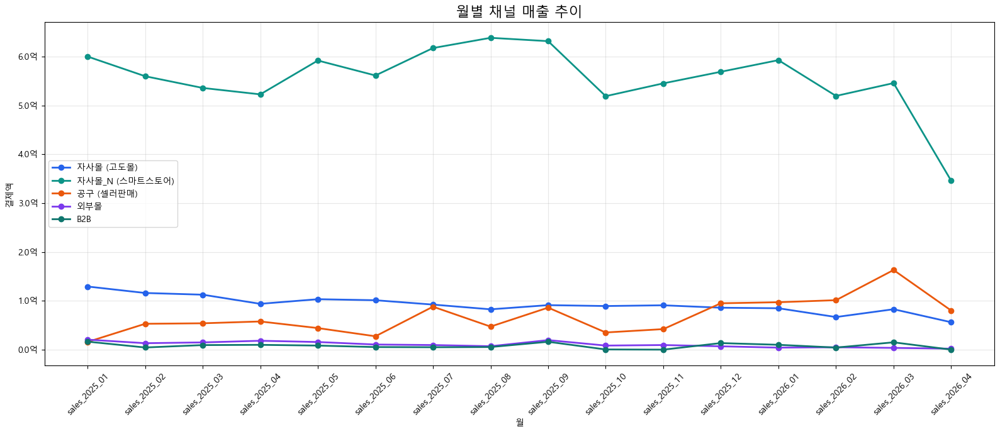

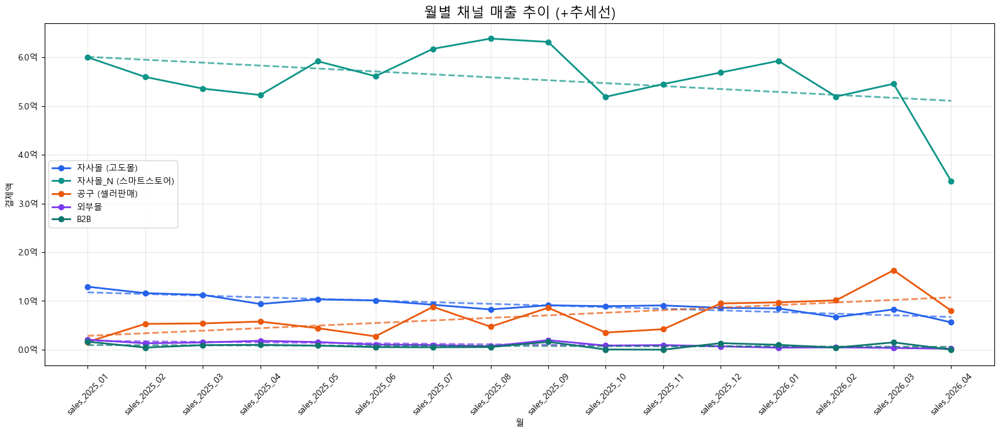

=== 월별 채널 매출 비중 (%) ===


channel_group,자사몰,자사몰_N,공구,외부몰,B2B
sales_month,,,,,
sales_2025_01,16.50,76.70,2.00,2.60,2.10
sales_2025_02,15.50,75.00,7.10,1.80,0.60
sales_2025_03,15.50,73.80,7.40,2.00,1.30
sales_2025_04,13.40,74.40,8.20,2.60,1.40
sales_2025_05,13.50,77.60,5.80,2.00,1.10
sales_2025_06,14.30,79.60,3.90,1.50,0.70
sales_2025_07,11.40,76.00,10.80,1.20,0.60
sales_2025_08,10.60,81.80,6.00,0.90,0.70
sales_2025_09,10.80,74.80,10.20,2.30,1.90


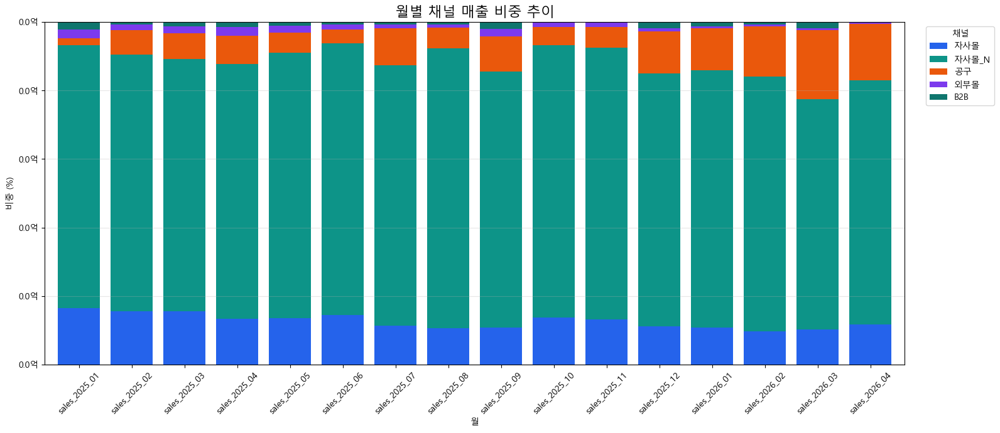

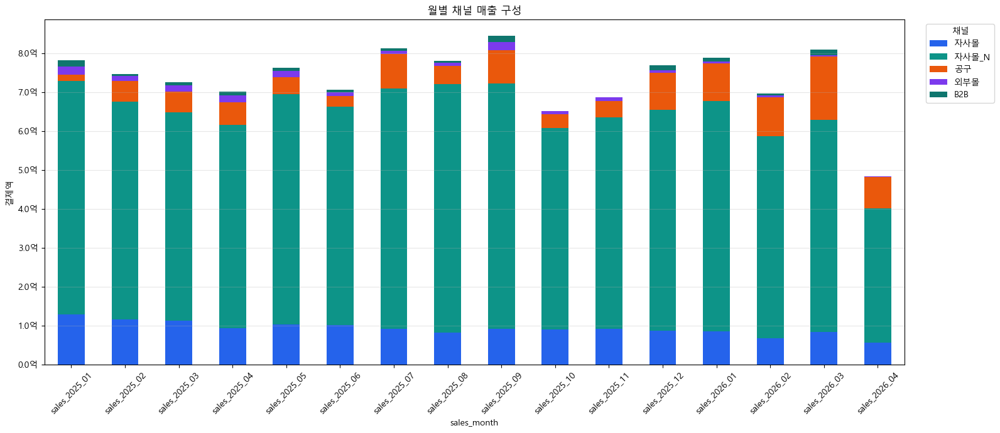

=== 일별 채널 매출 ===


channel_group,자사몰,자사몰_N,공구,외부몰,B2B
analysis_date,,,,,
2025-01-01,"3,900,996.00","24,233,810.00",0.00,"1,202,600.00",0.00
2025-01-02,"7,131,047.00","24,520,360.00","4,843,454.00","947,570.00",0.00
2025-01-03,"5,930,100.00","20,363,160.00","1,676,016.00","233,940.00",0.00
2025-01-04,"3,959,110.00","13,767,200.00",0.00,"302,460.00",0.00
2025-01-05,"3,687,010.00","19,754,800.00",0.00,"674,350.00",0.00


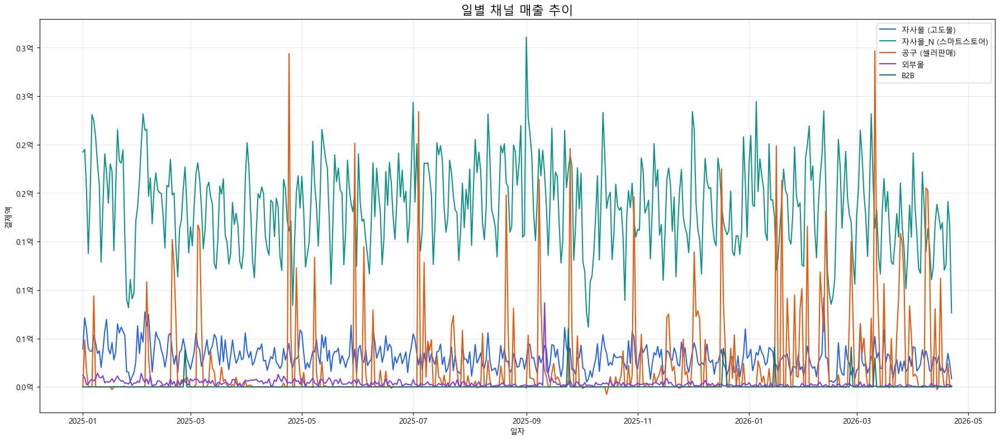

일별 매출 노이즈 제거하여 추세 보기 :


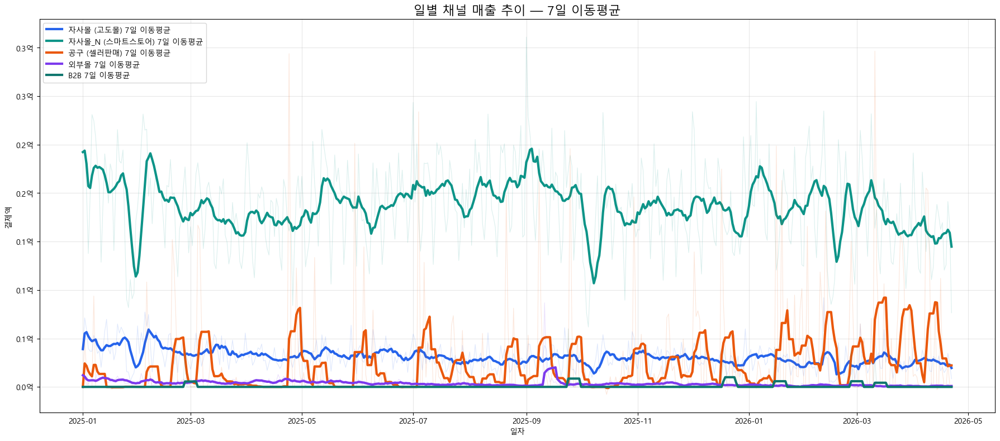

In [820]:
# =========================================================
# 월별 채널 매출 테이블
# =========================================================

monthly_sales = (
    df_eda.groupby(['sales_month', 'channel_group'])['결제액']
    .sum()
    .reset_index()
)

monthly_sales_pivot = (
    monthly_sales.pivot(
        index='sales_month',
        columns='channel_group',
        values='결제액'
    )
    .fillna(0)
)

# 채널 순서 고정
monthly_sales_pivot = monthly_sales_pivot.reindex(
    columns=[c for c in channel_order if c in monthly_sales_pivot.columns]
)

print("=== 월별 채널 매출 ===")
display(monthly_sales_pivot)



# =========================================================
# 월별 채널 매출 그래프 01
# =========================================================

plt.figure(figsize=(16, 7))

for channel in monthly_sales_pivot.columns:
    plt.plot(
        monthly_sales_pivot.index,
        monthly_sales_pivot[channel],
        marker='o',
        linewidth=2,
        label=label_map.get(channel, channel),
        color=CH_COLOR.get(channel, '#333333')
    )

plt.title('월별 채널 매출 추이', fontsize=16)
plt.xlabel('월')
plt.ylabel('결제액')
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(
    ticker.FuncFormatter(lambda x, pos: f'{x/100_000_000:.1f}억')
)
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# =========================================================
# 월별 채널 매출 그래프 02
# =========================================================

plt.figure(figsize=(16, 7))

for channel in monthly_sales_pivot.columns:

    y = monthly_sales_pivot[channel].values
    x = np.arange(len(y))

    # 원본
    plt.plot(
        monthly_sales_pivot.index,
        y,
        marker='o',
        linewidth=2,
        color=CH_COLOR.get(channel, '#333333'),
        label=label_map.get(channel, channel)
    )

    # 선형 추세선
    z = np.polyfit(x, y, 1)
    trend = np.poly1d(z)

    plt.plot(
        monthly_sales_pivot.index,
        trend(x),
        linestyle='--',
        linewidth=2,
        color=CH_COLOR.get(channel, '#333333'),
        alpha=0.7
    )

plt.title('월별 채널 매출 추이 (+추세선)', fontsize=16)
plt.xlabel('월')
plt.ylabel('결제액')
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(
    ticker.FuncFormatter(lambda x, pos: f'{x/100_000_000:.1f}억')
)
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# =========================================================
# 월별 채널 매출 비중
# =========================================================

monthly_share = (
    monthly_sales_pivot
    .div(monthly_sales_pivot.sum(axis=1), axis=0)
    .fillna(0)
    * 100
)

print("=== 월별 채널 매출 비중 (%) ===")
display(monthly_share.round(1))

ax = monthly_share.plot(
    kind='bar',
    stacked=True,
    figsize=(16, 7),
    color=[CH_COLOR.get(c, '#333333') for c in monthly_share.columns],
    width=0.8
)

ax.set_title('월별 채널 매출 비중 추이', fontsize=16)
ax.set_xlabel('월')
ax.set_ylabel('비중 (%)')
ax.set_ylim(0, 100)
ax.yaxis.set_major_formatter(
    ticker.FuncFormatter(
        lambda x, p: f'{x/100_000_000:.1f}억'
    )
)

plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.legend(
    title='채널',
    bbox_to_anchor=(1.02, 1),
    loc='upper left'
)
plt.tight_layout()
plt.show()

ax = monthly_sales_pivot.plot(
    kind='bar',
    stacked=True,
    figsize=(16, 7),
    color=[
        CH_COLOR.get(c, '#333333')
        for c in monthly_sales_pivot.columns
    ]
)

ax.set_title(
    '월별 채널 매출 구성'
)

ax.set_ylabel('결제액')

ax.yaxis.set_major_formatter(
    ticker.FuncFormatter(
        lambda x, p: f'{x/100_000_000:.1f}억'
    )
)

plt.xticks(rotation=45)

plt.grid(axis='y', alpha=0.3)

plt.legend(
    title='채널',
    bbox_to_anchor=(1.02, 1),
    loc='upper left'
)

plt.tight_layout()
plt.show()

# =========================================================
# 채널별 날짜 컬럼 생성
# 공구 → 입력일 기준
# 공구 외 → 주문시간 기준
# =========================================================

df_eda['analysis_date'] = np.where(
    df_eda['channel_group'] == '공구',
    pd.to_datetime(df_eda['입력일']).dt.normalize(),
    pd.to_datetime(df_eda['주문시간']).dt.normalize()
)

# datetime 변환
df_eda['analysis_date'] = pd.to_datetime(df_eda['analysis_date'])



# =========================================================
# 일별 채널 매출 테이블
# =========================================================

daily_sales = (
    df_eda
    .dropna(subset=['analysis_date'])
    .groupby(['analysis_date', 'channel_group'])['결제액']
    .sum()
    .reset_index()
)

daily_sales_pivot = (
    daily_sales
    .pivot(index='analysis_date', columns='channel_group', values='결제액')
    .fillna(0)
)

# 채널 순서 고정
daily_sales_pivot = daily_sales_pivot.reindex(
    columns=[c for c in channel_order if c in daily_sales_pivot.columns]
)

# 7일 이동평균
daily_sales_roll = (
    daily_sales_pivot
    .rolling(window=7, min_periods=1)
    .mean()
)

print("=== 일별 채널 매출 ===")
display(daily_sales_pivot.head())

# =========================================================
# 일별 채널 매출 그래프 01
# =========================================================

plt.figure(figsize=(18, 8))

for channel in daily_sales_pivot.columns:
    
    color = CH_COLOR.get(channel, '#333333')
    
    plt.plot(
        daily_sales_pivot.index,
        daily_sales_pivot[channel],
        linewidth=1.5,
        label=label_map.get(channel, channel),
        color=color
    )

plt.title('일별 채널 매출 추이', fontsize=16)
plt.xlabel('일자')
plt.ylabel('결제액')

# y축 콤마 표시
plt.gca().yaxis.set_major_formatter(
    ticker.FuncFormatter(
        lambda x, pos: f'{x/100_000_000:.1f}억'
    )
)

plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# =========================================================
# 일별 채널 매출 그래프 02
# =========================================================

plt.figure(figsize=(18, 8))

for channel in daily_sales_pivot.columns:
    color = CH_COLOR.get(channel, '#333333')

    # 원본 일별 매출: 얇고 투명하게
    plt.plot(
        daily_sales_pivot.index,
        daily_sales_pivot[channel],
        linewidth=0.8,
        alpha=0.15,
        color=color
    )

    # 7일 이동평균: 굵게
    plt.plot(
        daily_sales_roll.index,
        daily_sales_roll[channel],
        linewidth=3,
        alpha=1,
        label=f'{label_map.get(channel, channel)} 7일 이동평균',
        color=color
    )

print("일별 매출 노이즈 제거하여 추세 보기 :")

plt.title('일별 채널 매출 추이 — 7일 이동평균', fontsize=16)
plt.xlabel('일자')
plt.ylabel('결제액')
plt.gca().yaxis.set_major_formatter(
    ticker.FuncFormatter(lambda x, pos: f'{x/100_000_000:.1f}억')
)
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

- **월별/일별 매출 추이**  
    <br>  
    - 자사몰_N(스마트스토어)가 가장 큰 매출 채널  
        - 전체 기간 동안 가장 높은 매출 규모 유지  
        - 월 매출 5~6억(비중 67~82%) 수준의 안정적인 매출 구조  
        - 2025년 7월 ~ 9월이 매출 피크 이후 완만한 하락세 관찰 됨  
        - ✅ 15-1 분석 결과와 연결하면  
        스마트스토어는 신규 유입이 줄어드는 중이나 기존 재구매가 떠받치는 구조  

    <br>  

    - 자사몰(고도몰)은 지속적인 감소 추세   
        - 2025년 1월 1.29억에서 2026년 4월 0.56억 수준으로 절반 이하 감소  
        - 추세선도 명확히 하향으로 관찰 됨  
    <br>  
    
    - 공구 채널은 우상향이나, 변동성 큼  

<br>  

> **가설 A. 채널 잠식(Cannibalization) 가능성**  
> 공구 및 스마트스토어 비중이 증가하는 동안 자사몰 매출은 감소하고 있음  
> 일부 고객 수요가 타 채널로 이동했을 가능성 존재  
> ➡️ 고객 단위 분석 필요  

> **가설 B. 운영 리소스 이동**  
> 공구 채널 확대와 함께 자사몰 매출 감소가 관찰됨  
> 운영 리소스 배분 변화가 영향을 주었을 가능성 존재  
> ➡️ 재구매율 및 CRM 분석 필요  


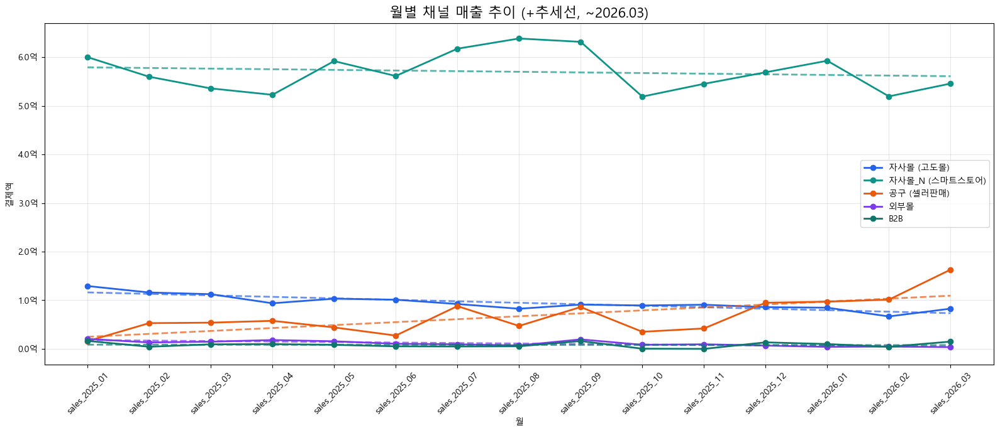

In [821]:
# PPT용 그래프 (2025.01 ~ 2026.03)

trend_df = df_eda.copy()

trend_df = trend_df[
    trend_df['sales_month'] != 'sales_2026_04'
].copy()

monthly_sales_trend = (
    trend_df
    .groupby(['sales_month','channel_group'])['결제액']
    .sum()
    .reset_index()
)

monthly_sales_pivot_trend = (
    monthly_sales_trend
    .pivot(
        index='sales_month',
        columns='channel_group',
        values='결제액'
    )
    .fillna(0)
)

monthly_sales_pivot_trend = monthly_sales_pivot_trend.reindex(
    columns=[c for c in channel_order if c in monthly_sales_pivot_trend.columns]
)

plt.figure(figsize=(16, 7))

for channel in monthly_sales_pivot_trend.columns:

    y = monthly_sales_pivot_trend[channel].values
    x = np.arange(len(y))

    # 데이터가 없거나 2개 미만이면 추세선 계산 불가
    if len(x) < 2:
        continue

    plt.plot(
        monthly_sales_pivot_trend.index,
        y,
        marker='o',
        linewidth=2,
        color=CH_COLOR.get(channel, '#333333'),
        label=label_map.get(channel, channel)
    )

    z = np.polyfit(x, y, 1)
    trend = np.poly1d(z)

    plt.plot(
        monthly_sales_pivot_trend.index,
        trend(x),
        linestyle='--',
        linewidth=2,
        color=CH_COLOR.get(channel, '#333333'),
        alpha=0.7
    )

plt.title('월별 채널 매출 추이 (+추세선, ~2026.03)', fontsize=16)
plt.xlabel('월')
plt.ylabel('결제액')
plt.xticks(rotation=45)

plt.gca().yaxis.set_major_formatter(
    ticker.FuncFormatter(lambda x, pos: f'{x/100_000_000:.1f}억')
)

plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

### 1-1. 자사몰 & 공구 별도 확인

channel_group,공구,자사몰,자사몰_N
analysis_date,,,
2025-01-01,0,3900996,24233810
2025-01-02,4843454,7131047,24520360
2025-01-03,1676016,5930100,20363160
2025-01-04,0,3959110,13767200
2025-01-05,0,3687010,19754800


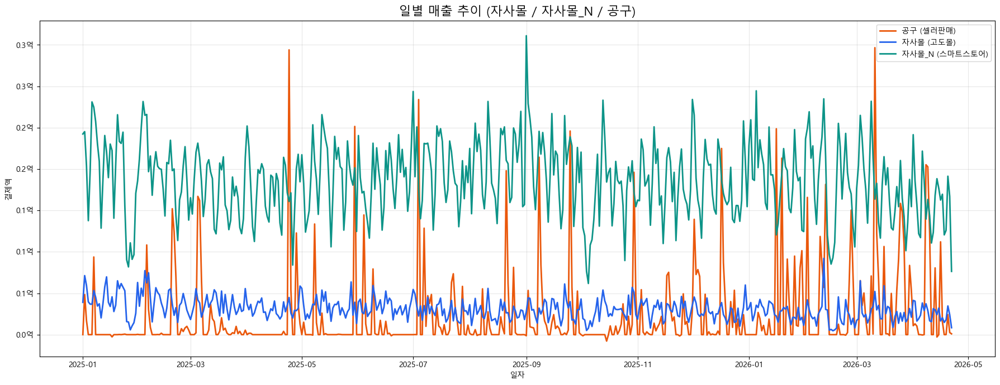

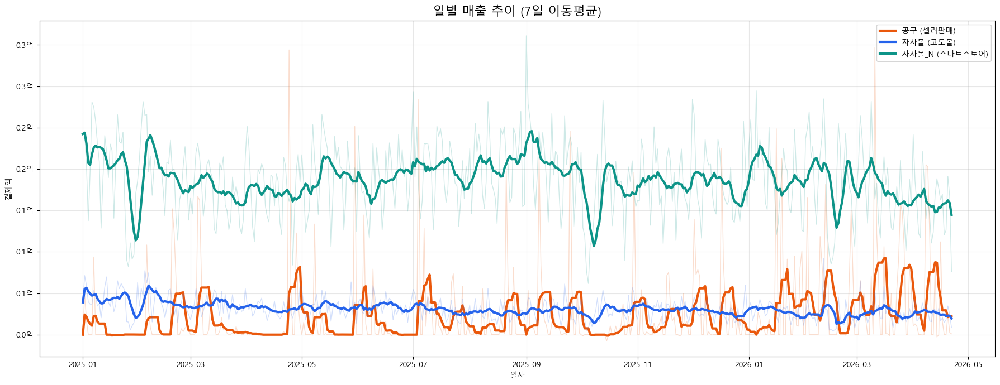

channel_group,공구,자사몰,자사몰_N
analysis_date,,,
2025-01-01,0,3900996,24233810
2025-01-02,4843454,7131047,24520360
2025-01-03,1676016,5930100,20363160
2025-01-04,0,3959110,13767200
2025-01-05,0,3687010,19754800


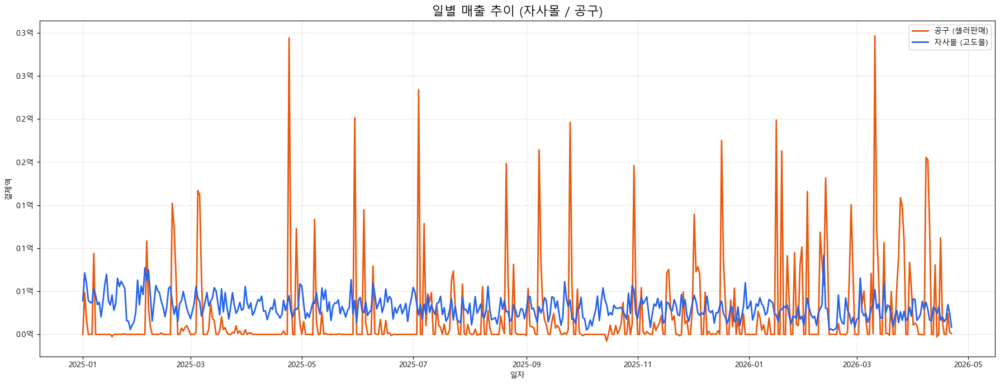

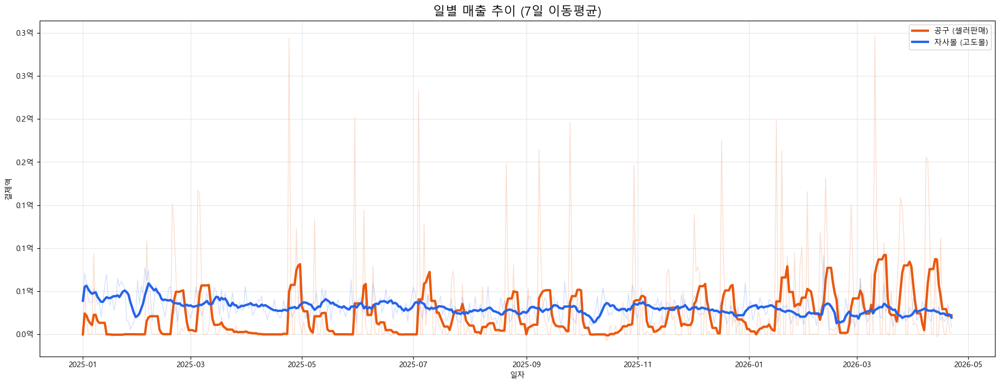

In [822]:
# =========================================================
# 01. 자사몰(고도몰) + 자사몰_N(스마트스토어) + 공구(셀러판매)
# 일별 매출 추이
# =========================================================

target_channels = ['자사몰', '자사몰_N', '공구']

daily_sales_1 = (
    df_eda[df_eda['channel_group'].isin(target_channels)]
    .groupby(['analysis_date', 'channel_group'])['결제액']
    .sum()
    .unstack(fill_value=0)
)

# 테이블 확인
display(daily_sales_1.head())



# 그래프 01
plt.figure(figsize=(18, 7))

for ch in daily_sales_1.columns:
    
    plt.plot(
        daily_sales_1.index,
        daily_sales_1[ch],
        label=label_map.get(ch, ch),
        linewidth=2,
        color=CH_COLOR.get(ch, '#333333')
    )

plt.title('일별 매출 추이 (자사몰 / 자사몰_N / 공구)', fontsize=16)
plt.xlabel('일자')
plt.ylabel('결제액')

plt.gca().yaxis.set_major_formatter(
    ticker.FuncFormatter(
        lambda x, pos: f'{x/100_000_000:.1f}억'
    )
)

plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# 그래프 02
daily_sales_2 = (
    df_eda[df_eda['channel_group'].isin(target_channels)]
    .groupby(['analysis_date', 'channel_group'])['결제액']
    .sum()
    .unstack(fill_value=0)
)

# 7일 이동평균
daily_sales_2_ma = (
    daily_sales_2
    .rolling(7, min_periods=1)
    .mean()
)

plt.figure(figsize=(18,7))

for ch in daily_sales_2.columns:

    color = CH_COLOR.get(ch, '#333333')

    # 원본 데이터
    plt.plot(
        daily_sales_2.index,
        daily_sales_2[ch],
        linewidth=1,
        alpha=0.2,
        color=color
    )

    # 이동평균
    plt.plot(
        daily_sales_2_ma.index,
        daily_sales_2_ma[ch],
        linewidth=3,
        color=color,
        label=f'{label_map.get(ch, ch)}'
    )

plt.title('일별 매출 추이 (7일 이동평균)', fontsize=16)
plt.xlabel('일자')
plt.ylabel('결제액')

plt.gca().yaxis.set_major_formatter(
    ticker.FuncFormatter(
        lambda x, pos: f'{x/100_000_000:.1f}억'
    )
)

plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()


# =========================================================
# 02. 자사몰(고도몰) + 공구(셀러판매)
# 일별 매출 추이
# =========================================================

target_channels = ['자사몰', '공구']

daily_sales_3 = (
    df_eda[df_eda['channel_group'].isin(target_channels)]
    .groupby(['analysis_date', 'channel_group'])['결제액']
    .sum()
    .unstack(fill_value=0)
)

# 테이블 확인
display(daily_sales_2.head())


# 그래프 01
plt.figure(figsize=(18, 7))

for ch in daily_sales_3.columns:
    
    plt.plot(
        daily_sales_3.index,
        daily_sales_3[ch],
        label=label_map.get(ch, ch),
        linewidth=2,
        color=CH_COLOR.get(ch, '#333333')
    )

plt.title('일별 매출 추이 (자사몰 / 공구)', fontsize=16)
plt.xlabel('일자')
plt.ylabel('결제액')

plt.gca().yaxis.set_major_formatter(
    ticker.FuncFormatter(
        lambda x, pos: f'{x/100_000_000:.1f}억'
    )
)

plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# 그래프 02

# 7일 이동평균
daily_sales_3_ma = (
    daily_sales_3
    .rolling(window=7, min_periods=1)
    .mean()
)

plt.figure(figsize=(18, 7))

for ch in daily_sales_3.columns:

    color = CH_COLOR.get(ch, '#333333')

    # 원본 데이터
    plt.plot(
        daily_sales_3.index,
        daily_sales_3[ch],
        linewidth=1,
        alpha=0.2,
        color=color
    )

    # 이동평균
    plt.plot(
        daily_sales_3_ma.index,
        daily_sales_3_ma[ch],
        linewidth=3,
        color=color,
        label=f'{label_map.get(ch, ch)}'
    )

plt.title('일별 매출 추이 (7일 이동평균)', fontsize=16)
plt.xlabel('일자')
plt.ylabel('결제액')

plt.gca().yaxis.set_major_formatter(
    ticker.FuncFormatter(
        lambda x, pos: f'{x/100_000_000:.1f}억'
    )
)

plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

- 공구 매출이 증가하는 시기에도 자사몰 매출 회복은 관찰되지 않음  
- 공구 성장과 자사몰 감소가 동시에 발생하는 모습이 일부 확인됨  
- 다만 고객 단위 이동 여부는 추가 검증이 필요함  

<br>  

> **[인사이트]**  
> 1. 자사몰은 장기적으로 감소 추세를 보이는 반면, 공구 매출은 확대되는 모습이 관찰됨  
> 2. 스마트스토어는 전체 기간 동안 가장 큰 매출 비중을 유지하는 핵심 채널  
> 3. 공구 성장과 자사몰 감소가 동시에 나타나고 있으나,  
> 실제 고객 이동Cannibalization) 여부는 고객 단위 분석을 통해 추가 검증 필요  

### 1-2. 채널 간 상대 성장 추세 비교

"상대 추세 + 변동 방향" 확인  

- 절대 매출 추이 : 일별 매출 확인  
- 상대 매출 추이  
    : 채널별 매출 규모 차이가 크기 때문에  
    : 첫 유효 매출 = 100 기준, 채널 규모 차이를 제거하고 증가/감소 방향만 비교  
- Scatter + 이동평균 추세  
    : 공구는 일별 변동성이 커서 선 그래프만 보면 해석이 어렵기에  
    : 실제 일별 값은 점으로 보고 장기 흐름은 이동평균선으로 보며 분석  

channel_group,자사몰,자사몰_N,공구
analysis_date,,,
2025-01-01,100.00,100.00,0.00
2025-01-02,182.80,101.18,100.00
2025-01-03,152.02,84.03,34.60
2025-01-04,101.49,56.81,0.00
2025-01-05,94.51,81.52,0.00


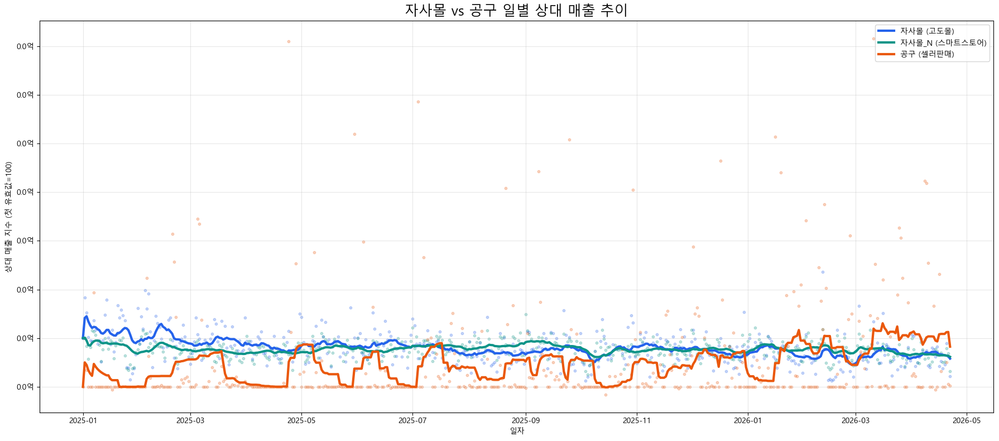

In [823]:
# =========================================================
# 자사몰 vs 자사몰_N vs 공구 일별 매출
# =========================================================

target_channels = ['자사몰', '자사몰_N', '공구']

plot_df = (
    df_eda[df_eda['channel_group'].isin(target_channels)]
    .dropna(subset=['analysis_date'])
    .groupby(['analysis_date', 'channel_group'])['결제액']
    .sum()
    .unstack(fill_value=0)
)

plot_df.index = pd.to_datetime(plot_df.index)

plot_df = plot_df.reindex(
    columns=[c for c in target_channels if c in plot_df.columns]
)

# =========================================================
# 첫 non-zero 값 기준 normalize
# =========================================================

norm_df = plot_df.copy()

for col in norm_df.columns:

    first_valid = norm_df[col][norm_df[col] > 0].iloc[0]

    norm_df[col] = (
        norm_df[col] / first_valid
    ) * 100

display(norm_df.head())

# =========================================================
# rolling trend: 14일 이동평균
# =========================================================

smooth_df = (
    norm_df
    .rolling(14, min_periods=1)
    .mean()
)

# =========================================================
# scatter + trend line
# =========================================================

plt.figure(figsize=(18, 8))

label_map = {
    '자사몰': '자사몰 (고도몰)',
    '자사몰_N': '자사몰_N (스마트스토어)',
    '공구': '공구 (셀러판매)'
}

for ch in norm_df.columns:

    color = CH_COLOR.get(ch, '#333333')

    # scatter (raw)
    plt.scatter(
        norm_df.index,
        norm_df[ch],
        alpha=0.25,
        s=10,
        color=color
    )

    # trend line
    plt.plot(
        smooth_df.index,
        smooth_df[ch],
        linewidth=3,
        label=label_map.get(ch, ch),
        color=color
    )

plt.title('자사몰 vs 공구 일별 상대 매출 추이', fontsize=18)

plt.xlabel('일자')
plt.ylabel('상대 매출 지수 (첫 유효값=100)')

plt.gca().yaxis.set_major_formatter(
    ticker.FuncFormatter(
        lambda x, pos: f'{x/100_000_000:.1f}억'
    )
)

plt.grid(alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

- **자사몰 (고도몰)**  
    - 초반에 높고, 후반으로 갈수록 60~80 수준 유지  
    - 전체적으로 완만한 하락 추세  
    - 즉, 장기적으로 자사몰(고도몰) 매출이 약화되는 흐름  

<br>  

- **자사몰_N (스마트스토어)**  
    - 상대적으로 안정적인 그래프로, 상대적으로 변동성이 적음  
    - 고도몰보다 더 완만한 하락 (100 → 80~90)  
    - 즉, 가장 안정적인 채널  

<br>  

- **공구**  
    - 특정 시점 급등 / 변동성이 극단적으로 큼  
    - 전형적인 이벤트 기반 매출 구조  


<br>  

> **[인사이트]**  
> 공구는 장기적으로 증가하는 듯 보이지만  
> 실제로는 이벤트 spike 영향이 매우 크고, baseline 자체는 높지 않음  
> 공구 성장의 상당 부분은 이벤트성 매출 증가에 의해 설명될 가능성이 있음  
> 아직 공구가 자사몰 매출을 잠식(Cannibalization)했다고 판단하기 어려움   
> ➡️ 고객 단위 이동 분석이 추가로 필요함  

  
cf. 현재 그래프는 공구의 첫 유효값이 100기준인 normalize라서, 공구는 초기값 자체가 작아 조금만 커져도 비율이 크게 튀어보임 (공구가 실제보다 과하게 성장해 보일 수 있음)  

---

## 2. 공구 구매 → 자사몰 전환

"공구 유입 고객이 이후 자사몰에서 구매하는가?"  

=== 공구 구매 데이터 ===
공구 구매 row 수: 88,091
공구 구매 고객 수: 11,039

=== 자사몰 구매 데이터 ===
자사몰 구매 row 수: 355,024
자사몰 구매 고객 수: 69,935

=== 공구 → 자사몰 전환 결과 ===
공구 고객 수: 11,039명
자사몰 전환 고객 수: 930명
전환율: 8.42%

=== 전환까지 걸린 기간 ===
평균 전환 소요일: 113.0일
중앙값 전환 소요일: 92.5일
최소 전환 소요일: 1일
최대 전환 소요일: 421일


,days_to_convert
count,930.00
mean,112.96
std,85.08
min,1.00
25%,50.00
50%,92.50
75%,155.00
max,421.00


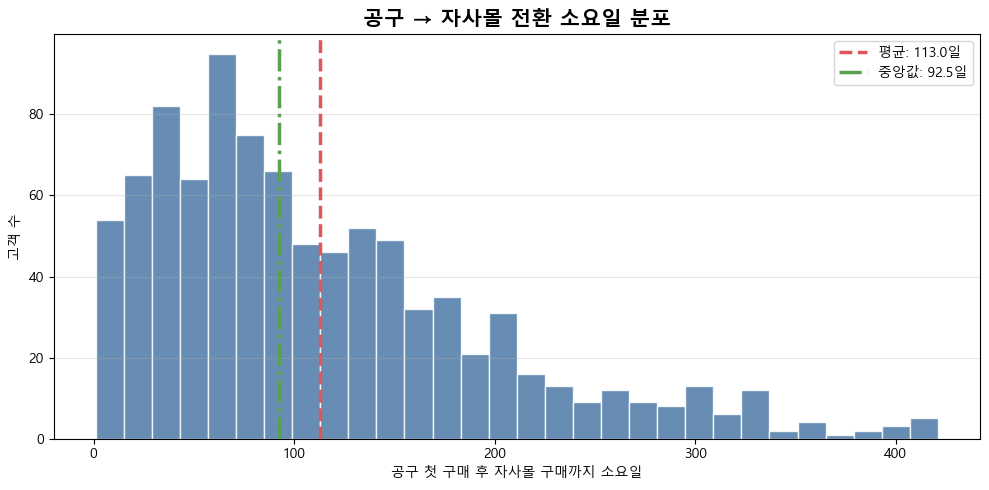

In [824]:
# =========================================================
# 공구 고객 정의
# =========================================================

gonggu_df = df_eda[
    df_eda['channel_group'] == '공구'
].copy()

gonggu_df = gonggu_df[
    gonggu_df['receiver_key'].notna()
].copy()

gonggu_df['analysis_date'] = pd.to_datetime(gonggu_df['analysis_date'])

print("=== 공구 구매 데이터 ===")
print(f"공구 구매 row 수: {len(gonggu_df):,}")
print(f"공구 구매 고객 수: {gonggu_df['receiver_key'].nunique():,}")



# =========================================================
# 공구 첫 구매일
# =========================================================

gonggu_first = (
    gonggu_df
    .groupby('receiver_key')['analysis_date']
    .min()
    .reset_index()
    .rename(columns={'analysis_date': 'gonggu_first_date'})
)


# =========================================================
# 자사몰 구매 데이터
# 자사몰 = 고도몰 + 스마트스토어
# =========================================================

mall_df = df_eda[
    df_eda['channel_group'].isin(['자사몰', '자사몰_N'])
].copy()

mall_df = mall_df[
    mall_df['receiver_key'].notna()
].copy()

mall_df['analysis_date'] = pd.to_datetime(mall_df['analysis_date'])

print("\n=== 자사몰 구매 데이터 ===")
print(f"자사몰 구매 row 수: {len(mall_df):,}")
print(f"자사몰 구매 고객 수: {mall_df['receiver_key'].nunique():,}")


# =========================================================
# 공구 이후 자사몰 구매 여부
# =========================================================

convert_df = gonggu_first.merge(
    mall_df[['receiver_key', 'analysis_date', 'channel_group', '결제액']],
    on='receiver_key',
    how='left'
)

convert_df['days_to_convert'] = (
    convert_df['analysis_date']
    - convert_df['gonggu_first_date']
).dt.days

convert_df['converted'] = convert_df['days_to_convert'] > 0


# =========================================================
# 고객 단위 전환 여부 집계
# =========================================================

customer_conversion = (
    convert_df
    .groupby('receiver_key')
    .agg(
        gonggu_first_date=('gonggu_first_date', 'first'),
        converted=('converted', 'max'),
        first_mall_after_gonggu=(
            'analysis_date',
            lambda x: x[convert_df.loc[x.index, 'converted']].min()
        ),
        min_days_to_convert=(
            'days_to_convert',
            lambda x: x[x > 0].min()
        )
    )
    .reset_index()
)


# =========================================================
# 전환율 계산
# =========================================================

total_customer = customer_conversion['receiver_key'].nunique()
converted_customer = customer_conversion['converted'].sum()
conversion_rate = converted_customer / total_customer

print("\n=== 공구 → 자사몰 전환 결과 ===")
print(f"공구 고객 수: {total_customer:,}명")
print(f"자사몰 전환 고객 수: {converted_customer:,}명")
print(f"전환율: {conversion_rate:.2%}")


# =========================================================
# 전환까지 걸린 기간
# =========================================================

converted_only = customer_conversion[
    customer_conversion['converted']
].copy()

print("\n=== 전환까지 걸린 기간 ===")

if len(converted_only) > 0:
    print(f"평균 전환 소요일: {converted_only['min_days_to_convert'].mean():.1f}일")
    print(f"중앙값 전환 소요일: {converted_only['min_days_to_convert'].median():.1f}일")
    print(f"최소 전환 소요일: {converted_only['min_days_to_convert'].min():.0f}일")
    print(f"최대 전환 소요일: {converted_only['min_days_to_convert'].max():.0f}일")

    display(
        converted_only['min_days_to_convert']
        .describe()
        .to_frame('days_to_convert')
    )
else:
    print("전환 고객이 없습니다.")


# =========================================================
# 전환 소요일 분포
# =========================================================

if len(converted_only) > 0:

    mean_days = converted_only['min_days_to_convert'].mean()
    median_days = converted_only['min_days_to_convert'].median()

    plt.figure(figsize=(10, 5))

    plt.hist(
        converted_only['min_days_to_convert'],
        bins=30,

        color='#4e79a7',      # 파랑
        edgecolor='white',
        alpha=0.85
    )

    # 평균
    plt.axvline(
        mean_days,
        color='#e15759',
        linestyle='--',
        linewidth=2.5,
        label=f'평균: {mean_days:.1f}일'
    )

    # 중앙값
    plt.axvline(
        median_days,
        color='#59a14f',
        linestyle='-.',
        linewidth=2.5,
        label=f'중앙값: {median_days:.1f}일'
    )

    plt.title(
        '공구 → 자사몰 전환 소요일 분포',
        fontsize=15,
        fontweight='bold'
    )

    plt.xlabel(
        '공구 첫 구매 후 자사몰 구매까지 소요일'
    )

    plt.ylabel('고객 수')

    plt.grid(axis='y', alpha=0.3)

    plt.legend()

    plt.tight_layout()
    plt.show()

- 공구 고객이 신규 고객인지 확인하지 않은 상태에서  
공구 구매 후 자사몰 구매한 고객만 확인한 분석  

> **[인사이트]**  
> - 공구 고객의 자사몰 전환율은 8.4% 수준  
> (공구 첫 구매 이후 자사몰에서 1회 이상 구매한 고객 비율)  
> - 전환 고객도 즉시 전환되기보다 약 3개월 전후에 자사몰 구매가 발생하는 경우가 많음  
> - 현재 데이터 기준으로는 공구 고객의 상당수가 자사몰 구매로 이어지지 않음  
> - 따라서 공구 채널이 자사몰 고객 확보 채널로 기능하는 정도는 제한적일 가능성이 있음  
> 공구 고객의 90.6%가 브랜드 신규임이 확인됨(2-2 참조)  
> 단, 자사몰 전환 장치가 없어 전환율이 8.4%에 머무는 구조  

➡️ 코호트 리테션 확인이 필요함  
(본 분석에서 확인한 중앙값(92.5일)으로, 90일 리텐션이 핵심 지표가 될 가능성이 높음)  

---

### 2-1. 자사몰 구매 → 공구 이동

=== 자사몰 구매 데이터 ===
자사몰 구매 row 수: 355,024
자사몰 구매 고객 수: 69,935

=== 공구 구매 데이터 ===
공구 구매 row 수: 88,091
공구 구매 고객 수: 11,039

=== 자사몰 → 공구 이동 결과 ===
자사몰 고객 수: 69,935명
공구 이동 고객 수: 1,262명
이동률: 1.80%

=== 이동까지 걸린 기간 ===
평균 이동 소요일: 99.4일
중앙값 이동 소요일: 73.0일
최소 이동 소요일: 1일
최대 이동 소요일: 425일


,days_to_move
count,"1,262.00"
mean,99.35
std,87.42
min,1.00
25%,31.00
50%,73.00
75%,145.75
max,425.00


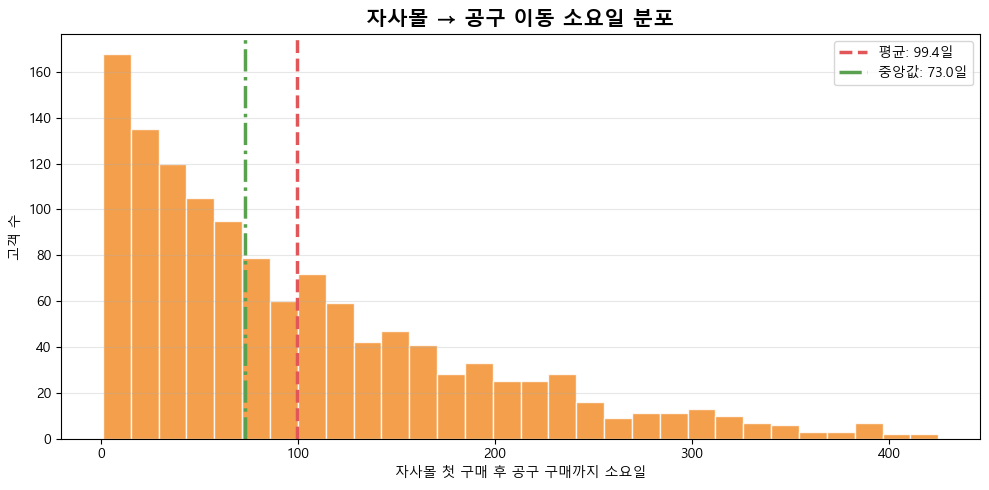

In [825]:
# =========================================================
# 자사몰 고객 정의
# =========================================================

mall_df = df_eda[
    df_eda['channel_group'].isin(['자사몰', '자사몰_N'])
].copy()

mall_df = mall_df[
    mall_df['receiver_key'].notna()
].copy()

mall_df['analysis_date'] = pd.to_datetime(mall_df['analysis_date'])

print("=== 자사몰 구매 데이터 ===")
print(f"자사몰 구매 row 수: {len(mall_df):,}")
print(f"자사몰 구매 고객 수: {mall_df['receiver_key'].nunique():,}")


# =========================================================
# 자사몰 첫 구매일
# =========================================================

mall_first = (
    mall_df
    .groupby('receiver_key')['analysis_date']
    .min()
    .reset_index()
    .rename(columns={'analysis_date': 'mall_first_date'})
)


# =========================================================
# 공구 구매 데이터
# =========================================================

gonggu_purchase = df_eda[
    df_eda['channel_group'] == '공구'
].copy()

gonggu_purchase = gonggu_purchase[
    gonggu_purchase['receiver_key'].notna()
].copy()

gonggu_purchase['analysis_date'] = pd.to_datetime(gonggu_purchase['analysis_date'])

gonggu_purchase = gonggu_purchase[
    ['receiver_key', 'analysis_date', 'channel_group', '결제액']
]

print("\n=== 공구 구매 데이터 ===")
print(f"공구 구매 row 수: {len(gonggu_purchase):,}")
print(f"공구 구매 고객 수: {gonggu_purchase['receiver_key'].nunique():,}")


# =========================================================
# 자사몰 이후 공구 구매 여부
# =========================================================


mall_to_gonggu = mall_first.merge(
    gonggu_purchase,
    on='receiver_key',
    how='left'
)

mall_to_gonggu['days_to_move'] = (
    mall_to_gonggu['analysis_date']
    - mall_to_gonggu['mall_first_date']
).dt.days

mall_to_gonggu['moved_to_gonggu'] = (
    mall_to_gonggu['days_to_move'] > 0
)


# =========================================================
# 고객 단위 이동 여부 집계
# =========================================================

customer_move = (
    mall_to_gonggu
    .groupby('receiver_key')
    .agg(
        mall_first_date=('mall_first_date', 'first'),
        moved_to_gonggu=('moved_to_gonggu', 'max'),
        first_gonggu_after_mall=(
            'analysis_date',
            lambda x: x[mall_to_gonggu.loc[x.index, 'moved_to_gonggu']].min()
        ),
        min_days_to_move=(
            'days_to_move',
            lambda x: x[x > 0].min()
        )
    )
    .reset_index()
)


# =========================================================
# 자사몰 → 공구 이동률
# =========================================================

total_customer = customer_move['receiver_key'].nunique()
moved_customer = customer_move['moved_to_gonggu'].sum()
move_rate = moved_customer / total_customer

print("\n=== 자사몰 → 공구 이동 결과 ===")
print(f"자사몰 고객 수: {total_customer:,}명")
print(f"공구 이동 고객 수: {moved_customer:,}명")
print(f"이동률: {move_rate:.2%}")


# =========================================================
# 이동까지 걸린 기간
# =========================================================

moved_only = customer_move[
    customer_move['moved_to_gonggu']
].copy()

print("\n=== 이동까지 걸린 기간 ===")

if len(moved_only) > 0:
    print(f"평균 이동 소요일: {moved_only['min_days_to_move'].mean():.1f}일")
    print(f"중앙값 이동 소요일: {moved_only['min_days_to_move'].median():.1f}일")
    print(f"최소 이동 소요일: {moved_only['min_days_to_move'].min():.0f}일")
    print(f"최대 이동 소요일: {moved_only['min_days_to_move'].max():.0f}일")

    display(
        moved_only['min_days_to_move']
        .describe()
        .to_frame('days_to_move')
    )
else:
    print("공구 이동 고객이 없습니다.")


# =========================================================
# 이동 소요일 분포
# =========================================================

if len(moved_only) > 0:

    mean_days = moved_only['min_days_to_move'].mean()
    median_days = moved_only['min_days_to_move'].median()

    plt.figure(figsize=(10, 5))

    plt.hist(
        moved_only['min_days_to_move'],
        bins=30,
        color='#f28e2b',
        edgecolor='white',
        alpha=0.85
    )

    plt.axvline(
        mean_days,
        color='#e15759',
        linestyle='--',
        linewidth=2.5,
        label=f'평균: {mean_days:.1f}일'
    )

    plt.axvline(
        median_days,
        color='#59a14f',
        linestyle='-.',
        linewidth=2.5,
        label=f'중앙값: {median_days:.1f}일'
    )

    plt.title(
        '자사몰 → 공구 이동 소요일 분포',
        fontsize=15,
        fontweight='bold'
    )

    plt.xlabel('자사몰 첫 구매 후 공구 구매까지 소요일')
    plt.ylabel('고객 수')

    plt.grid(axis='y', alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

- 자사몰 고객의 공구 이동률은 1.8% 수준으로 매우 낮음  
- 이동 고객도 평균 99일, 중앙값 73일 이후 공구 구매가 발생  
- 자사몰 구매 직후 곧바로 공구로 이동하는 구조가 일부 존재하나,  
규모 자체가 매우 작음  

<br>  

> **[인사이트]**  
> - 공구→자사몰 전환율(8.4%)이 자사몰→공구 이동률(1.8%)보다 높게 나타남  
> - 현재 데이터 기준으로는  
>   공구가 기존 자사몰 고객을 대규모로 흡수하거나 잠식하는 현상은 확인되지 않음  
> - 다만 공구 고객이 신규 고객인지 여부는 확인하지 않았으므로,  
>   공구의 신규 고객 획득 효과는 별도 검증이 필요함

---

### 2-2. 공구 고객의 신규 여부 검증

(이후 별도 추가된 섹션 / 공구의 acquisition 효과를 확정하기 위해 보완 검증)  

"공구 고객이 브랜드 첫 접점인가, 기존 자사몰 고객인가?"  

In [826]:
# 고객별 채널별 첫 구매일
first_by_channel = (
    df_eda[df_eda['receiver_key'].notna()]
    .groupby(['receiver_key', 'channel_group'])['analysis_date']
    .min()
    .reset_index()
    .rename(columns={'analysis_date': 'first_date'})
)

# 공구 첫 구매일
gonggu_first = (
    first_by_channel[first_by_channel['channel_group'] == '공구']
    [['receiver_key', 'first_date']]
    .rename(columns={'first_date': 'gonggu_first_date'})
)

# 자사몰(고도몰+스마트스토어) 첫 구매일
owned_first = (
    first_by_channel[first_by_channel['channel_group'].isin(['자사몰', '자사몰_N'])]
    .groupby('receiver_key')['first_date']
    .min()
    .reset_index()
    .rename(columns={'first_date': 'owned_first_date'})
)

# 공구 고객 + 자사몰 이력 결합
gonggu_check = gonggu_first.merge(owned_first, on='receiver_key', how='left')

# 분류
def classify_new(row):
    if pd.isna(row['owned_first_date']):
        return '브랜드 신규'           # 자사몰 이력 자체가 없음
    elif row['owned_first_date'] > row['gonggu_first_date']:
        return '브랜드 신규'           # 공구가 첫 접점, 이후 자사몰 이용
    else:
        return '기존 자사몰 고객'      # 자사몰 먼저 이용 후 공구로 온 케이스

gonggu_check['고객유형'] = gonggu_check.apply(classify_new, axis=1)

# 결과
result = gonggu_check['고객유형'].value_counts()
result_pct = gonggu_check['고객유형'].value_counts(normalize=True).mul(100).round(1)

print("=== 공구 고객의 신규 여부 ===")
for label in result.index:
    print(f"  {label}: {result[label]:,}명 ({result_pct[label]}%)")

n_total = len(gonggu_check)
n_new = (gonggu_check['고객유형'] == '브랜드 신규').sum()
n_existing = (gonggu_check['고객유형'] == '기존 자사몰 고객').sum()

print(f"\n총 공구 고객: {n_total:,}명")
print(f"  브랜드 신규 (공구가 첫 접점): {n_new:,}명 ({n_new/n_total*100:.1f}%)")
print(f"  기존 자사몰 고객 (공구로 이동): {n_existing:,}명 ({n_existing/n_total*100:.1f}%)")

# 기존 자사몰 고객이 공구로 간 시간 간격
gonggu_check['자사몰→공구 경과일'] = (
    gonggu_check['gonggu_first_date'] - gonggu_check['owned_first_date']
).dt.days

existing = gonggu_check[gonggu_check['고객유형'] == '기존 자사몰 고객']
print(f"\n기존 자사몰 고객의 공구 첫 이용까지 평균: {existing['자사몰→공구 경과일'].mean():.0f}일")
print(f"중앙값: {existing['자사몰→공구 경과일'].median():.0f}일")

=== 공구 고객의 신규 여부 ===
  브랜드 신규: 9,997명 (90.6%)
  기존 자사몰 고객: 1,042명 (9.4%)

총 공구 고객: 11,039명
  브랜드 신규 (공구가 첫 접점): 9,997명 (90.6%)
  기존 자사몰 고객 (공구로 이동): 1,042명 (9.4%)

기존 자사몰 고객의 공구 첫 이용까지 평균: 105일
중앙값: 80일


- 기존 자사몰 고객 1,042명 (9.4%) : 자사몰 이용 후 평균 약 3개월(105일) 후에 공구로 이동  
    - 첫째, 가격 민감 이탈 : 자사몰에서 구매하고, 이후 공구가 더 저렴하다는 걸 알고 이동한 케이스일 수 있음  
    - 둘째, 자연스러운 멀티채널 이용 : 자사몰에서 사다가 공구 행사 때 같이 구매하는 구조일 수도 있음  
    - 규모가 9.4%로 작아서 전체 해석에 미치는 영향은 크지 않음  

> **[핵심 인사이트]**  
> **공구는 진짜 acquisition 채널**  
> 
> 90.6%가 브랜드 신규라는 건 추정이 아니라 데이터로 확인된 사실  
> (이전에 "인과관계인지 알 수 없다"고 유보했던 해석들을 이제 확정)  
> 
> ---
> cf. 이전에 유보했던 해석, 이제 확정  
> - 공구가 신규 고객을 데려온다 → ✅ 확정  
>    - 공구 고객 11,039명 중 9,997명이 브랜드 첫 접점이 공구  
>    - 공구를 없애면 이 신규 유입 자체가 사라짐  
> 
> -  전환율 8.4%는 acquisition funnel로 읽을 수 있다  → ✅ 확정  
>   - 신규 9,997명 중 자사몰로 넘어간 비율이 실질적인 전환율  
>   - 공구 → 자사몰 전환이 브랜드 팬 만들기의 핵심 경로  
> 
> - 자사몰 전환 고객 LTV 2.2배는 선택편향일 수 있다"는 우려 → 부분 해소  
>   - 신규가 90%이므로 "원래 브랜드를 알던 사람이 자사몰도 썼을 것"이라는 편향 가능성이 크게 줄어듦  
>   - 공구가 실제로 브랜드 모르던 사람을 데려와서, 그 중 일부가 고가치 고객으로 전환된 구조  


---

## 3. SKU 매출 급감/신규 제품군 - 재확인 

- 단종/리뉴얼 제품군 기업 확인 후  
- 전처리 9번 진행하여 EDA 다시 확인 (`sku_normalized` → `sku_family` )  
<br>  

A. SKU Family 증감 분석  
B. 단종 / 리뉴얼 영향 분석  
C. 건강 니즈(Keyword) 변화 분석  
D. 신규 제품군 탐색 

제품 분석 대상 row 수: 161984
제품군 수: 82


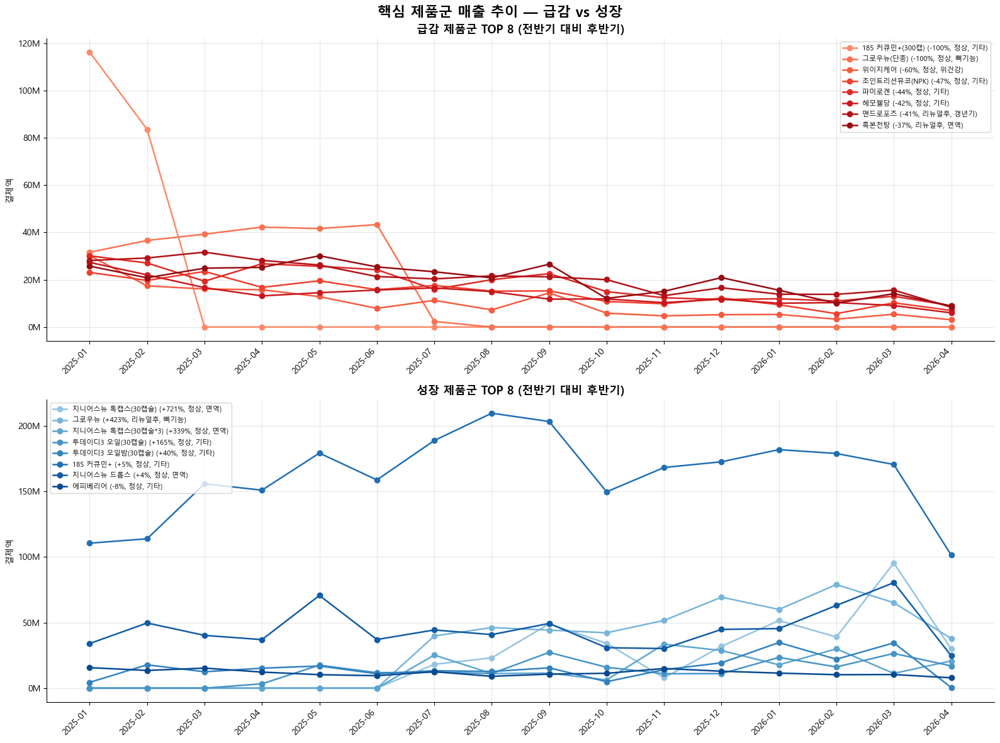


[전반기 대비 후반기 매출 변화율 — 급감 제품군]


,제품군,전반기 평균(M),후반기 평균(M),변화율(%),상태,키워드
0,185 커큐민+(300캡),25.00,0.00,-100.00,정상,기타
1,그로우뉴(단종),29.60,0.00,-100.00,정상,뼈기능
2,위이지케어,14.80,5.90,-60.10,정상,위건강
3,조인트리션뮤코(NPK),18.90,10.10,-46.70,정상,기타
4,파미로겐,23.60,13.30,-43.70,정상,기타
5,헤모웰당,17.60,10.20,-42.30,정상,기타
6,맨드로포즈,25.80,15.30,-40.60,리뉴얼후,갱년기
7,흑본전탕,24.50,15.40,-37.20,리뉴얼후,면역



[전반기 대비 후반기 매출 변화율 — 성장 제품군]


,제품군,전반기 평균(M),후반기 평균(M),변화율(%),상태,키워드
0,지니어스뉴 톡캡스(30캡슐),5.20,42.40,721.00,정상,면역
1,그로우뉴,10.80,56.20,422.90,리뉴얼후,뼈기능
2,지니어스뉴 톡캡스(30캡술*3),4.50,20.00,339.30,정상,면역
3,투데이디3 오일(30캡슐),7.00,18.50,164.70,정상,기타
4,투데이디3 오일밤(30캡슐),13.00,18.20,40.20,정상,기타
5,185 커큐민+,158.50,165.90,4.60,정상,기타
6,지니어스뉴 드롭스,44.30,46.10,4.20,정상,면역
7,에피베리어,12.30,11.20,-8.20,정상,기타



[제품 상태별 매출 요약]


,product_status,매출,주문건수,고객수,제품군수,매출비중(%)
3,정상,10432121306,103717,72182,75,87.36
2,리뉴얼후,1110406117,12099,9470,4,9.30
1,리뉴얼전,374076989,3241,2796,4,3.13
0,단종,25413638,996,941,2,0.21


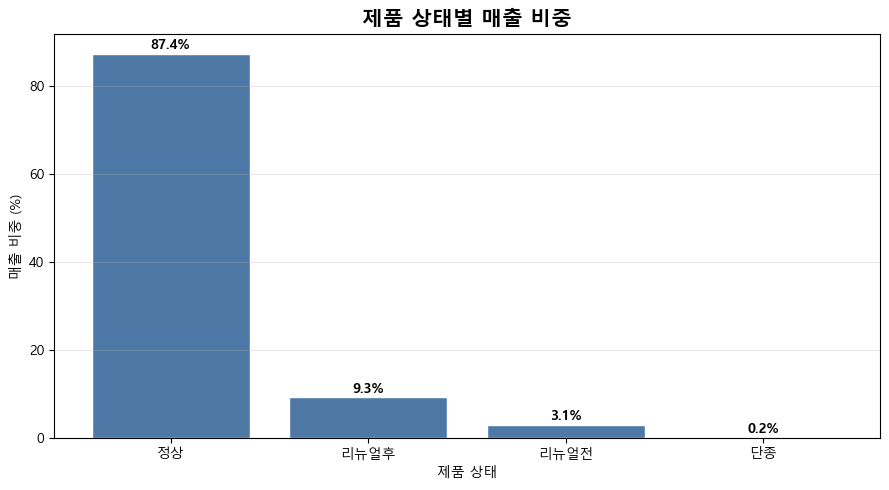


[건강 니즈 / 키워드별 매출 변화]


,전반기 평균(M),후반기 평균(M),변화율(%),후반기 매출비중(%)
main_product_keyword,,,,
기타,448.20,401.20,-10.50,55.30
면역,201.00,219.10,9.00,30.20
뼈기능,63.70,76.10,19.40,10.50
갱년기,25.80,15.30,-40.60,2.10
위건강,19.90,8.90,-55.50,1.20
수면건강,7.80,4.20,-46.20,0.60
혈행개선,0.00,1.20,"4,086.30",0.20
베이비&키즈그로우랩,0.10,0.00,-34.00,0.00
배뇨기능,0.00,0.00,-100.00,0.00


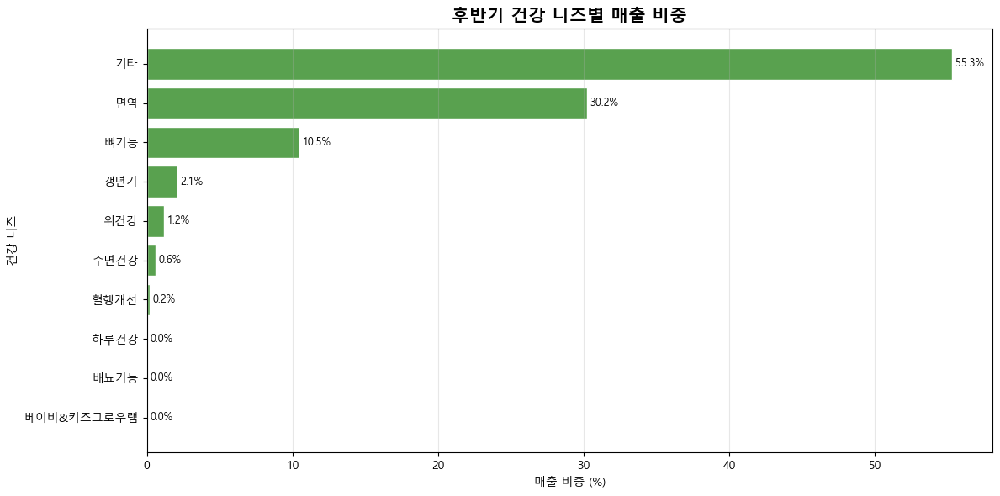

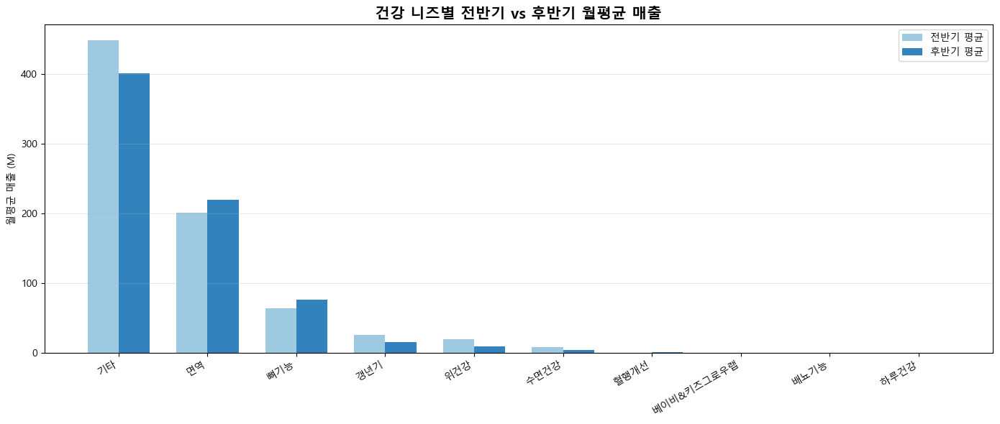


[후반기 신규 등장 제품군]


,sku_family,first_seen_month,last_seen_month,total_sales,total_customers,product_status,main_product_keyword
44,오큘라레이드+,2025-09,2026-04,62004182,269,정상,기타
59,지니어스뉴 키즈,2025-09,2026-04,36866340,345,정상,면역
7,그로우뉴 키즈,2026-03,2026-04,16268200,268,정상,뼈기능
69,투데이디3 오일밤(10캡슐),2025-09,2025-10,14341998,344,정상,기타
25,리버티엑스 10포,2025-11,2026-02,11255700,101,정상,기타
3,KD파마 듀얼 초임계 알티지 오메가3,2026-03,2026-04,9997000,264,정상,혈행개선
27,리버티엑스 3포,2025-12,2026-02,6685600,110,정상,기타
40,엘더베리사과주스(box),2026-01,2026-04,4856000,171,정상,기타
10,데이프로바(3포),2025-10,2025-11,600400,4,정상,기타
31,수드티,2026-03,2026-04,242400,16,정상,기타



[후반기 월평균 매출 TOP 제품군]


,제품군,전반기 평균(M),후반기 평균(M),변화율(%),상태,키워드
0,185 커큐민+,158.50,165.90,4.60,정상,기타
12,지니어스뉴 드롭스(5개입),122.50,87.20,-28.80,정상,면역
3,그로우뉴,10.80,56.20,422.90,리뉴얼후,뼈기능
11,지니어스뉴 드롭스,44.30,46.10,4.20,정상,면역
14,지니어스뉴 톡캡스(30캡슐),5.20,42.40,721.00,정상,면역
1,185 커큐민+(240캡슐),37.90,30.70,-19.10,정상,기타
6,블러드 플로우케어(리뉴얼),33.90,29.30,-13.50,정상,기타
13,지니어스뉴 톡캡스(30캡술*3),4.50,20.00,339.30,정상,면역
15,투데이디3 오일(30캡슐),7.00,18.50,164.70,정상,기타
16,투데이디3 오일밤(30캡슐),13.00,18.20,40.20,정상,기타


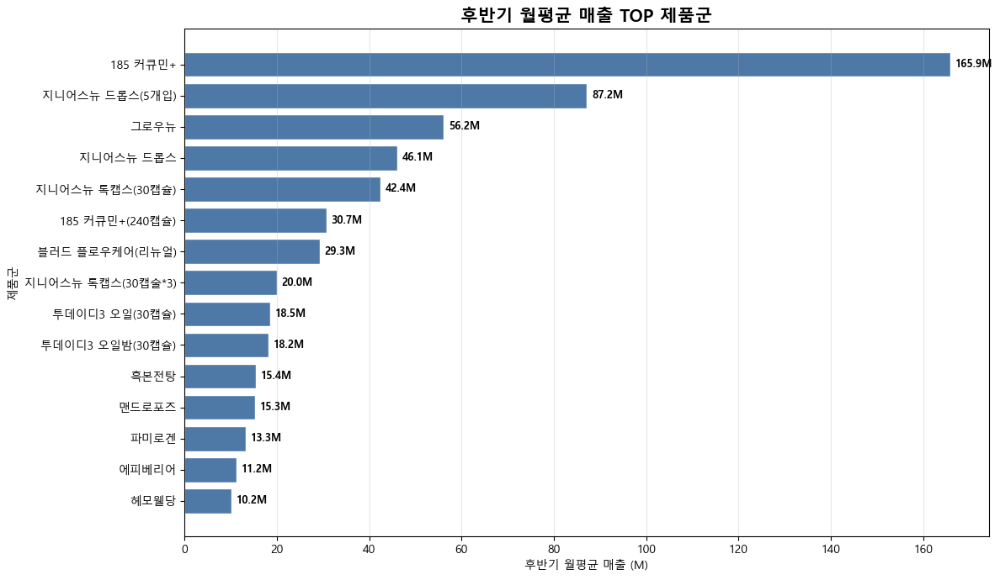

In [827]:
# ---------------------------------------------------------
# 0) 분석 데이터 준비
# ---------------------------------------------------------

df_product = df_eda[
    (df_eda['sku_type'] == 'product') &
    (df_eda['결제액'] > 0)
].copy()

# sales_month: sales_2025_01 → 2025-01 Period 변환
df_product['sales_month'] = (
    df_product['sales_month']
    .astype(str)
    .str.replace('sales_', '', regex=False)
)

df_product['sales_month'] = pd.to_datetime(
    df_product['sales_month'],
    format='%Y_%m'
).dt.to_period('M')

print("제품 분석 대상 row 수:", len(df_product))
print("제품군 수:", df_product['sku_family'].nunique())


# =========================================================
# 3-1. SKU Family 매출 증감 분석
# =========================================================

family_monthly = (
    df_product
    .groupby(['sales_month', 'sku_family'])['결제액']
    .sum()
    .reset_index()
)

top_families = (
    family_monthly
    .groupby('sku_family')['결제액']
    .sum()
    .nlargest(20)
    .index
    .tolist()
)

family_pivot = (
    family_monthly[
        family_monthly['sku_family'].isin(top_families)
    ]
    .pivot(
        index='sales_month',
        columns='sku_family',
        values='결제액'
    )
    .fillna(0)
)

months_sorted = sorted(family_pivot.index)
mid = len(months_sorted) // 2

first_half = months_sorted[:mid]
second_half = months_sorted[mid:]

first_avg = family_pivot.loc[first_half].mean()
second_avg = family_pivot.loc[second_half].mean()

change_rate = (
    (second_avg - first_avg)
    / first_avg.replace(0, np.nan)
    * 100
).dropna()

decline_families = change_rate.nsmallest(8).index.tolist()
growth_families = change_rate.nlargest(8).index.tolist()


# ---------------------------------------------------------
# 상태 / 키워드 정보 연결
# ---------------------------------------------------------

family_meta = (
    df_product
    .groupby('sku_family')
    .agg(
        product_status=('product_status', lambda x: x.mode().iloc[0] if len(x.mode()) > 0 else '기타'),
        main_product_keyword=('main_product_keyword', lambda x: x.mode().iloc[0] if len(x.mode()) > 0 else '기타')
    )
    .reset_index()
    .set_index('sku_family')
)


# ---------------------------------------------------------
# 시각화: 급감 / 성장 제품군
# ---------------------------------------------------------

fig, axes = plt.subplots(2, 1, figsize=(16, 12))
fig.suptitle(
    '핵심 제품군 매출 추이 — 급감 vs 성장',
    fontsize=16,
    fontweight='bold'
)

# 급감 제품군
ax = axes[0]
cmap = plt.cm.Reds(np.linspace(0.4, 0.9, len(decline_families)))

for family, color in zip(decline_families, cmap):
    vals = family_pivot[family]
    rate = change_rate.get(family, 0)
    status = family_meta.loc[family, 'product_status'] if family in family_meta.index else ''
    keyword = family_meta.loc[family, 'main_product_keyword'] if family in family_meta.index else ''

    ax.plot(
        family_pivot.index.astype(str),
        vals,
        marker='o',
        linewidth=1.8,
        color=color,
        label=f'{family[:18]} ({rate:+.0f}%, {status}, {keyword})'
    )

ax.set_title('급감 제품군 TOP 8 (전반기 대비 후반기)', fontsize=13, fontweight='bold')
ax.set_ylabel('결제액')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda v, _: f'{int(v/1e6)}M'))
ax.grid(alpha=0.3)
ax.legend(loc='upper right', fontsize=8, framealpha=0.8)
ax.spines[['top', 'right']].set_visible(False)
plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

# 성장 제품군
ax = axes[1]
cmap2 = plt.cm.Blues(np.linspace(0.4, 0.9, len(growth_families)))

for family, color in zip(growth_families, cmap2):
    vals = family_pivot[family]
    rate = change_rate.get(family, 0)
    status = family_meta.loc[family, 'product_status'] if family in family_meta.index else ''
    keyword = family_meta.loc[family, 'main_product_keyword'] if family in family_meta.index else ''

    ax.plot(
        family_pivot.index.astype(str),
        vals,
        marker='o',
        linewidth=1.8,
        color=color,
        label=f'{family[:18]} ({rate:+.0f}%, {status}, {keyword})'
    )

ax.set_title('성장 제품군 TOP 8 (전반기 대비 후반기)', fontsize=13, fontweight='bold')
ax.set_ylabel('결제액')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda v, _: f'{int(v/1e6)}M'))
ax.grid(alpha=0.3)
ax.legend(loc='upper left', fontsize=8, framealpha=0.8)
ax.spines[['top', 'right']].set_visible(False)
plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()


# ---------------------------------------------------------
# 수치 테이블
# ---------------------------------------------------------

decline_df = pd.DataFrame({
    '제품군': decline_families,
    '전반기 평균(M)': [round(first_avg.get(x, 0) / 1e6, 1) for x in decline_families],
    '후반기 평균(M)': [round(second_avg.get(x, 0) / 1e6, 1) for x in decline_families],
    '변화율(%)': [round(change_rate.get(x, 0), 1) for x in decline_families],
    '상태': [family_meta.loc[x, 'product_status'] if x in family_meta.index else '' for x in decline_families],
    '키워드': [family_meta.loc[x, 'main_product_keyword'] if x in family_meta.index else '' for x in decline_families]
})

growth_df = pd.DataFrame({
    '제품군': growth_families,
    '전반기 평균(M)': [round(first_avg.get(x, 0) / 1e6, 1) for x in growth_families],
    '후반기 평균(M)': [round(second_avg.get(x, 0) / 1e6, 1) for x in growth_families],
    '변화율(%)': [round(change_rate.get(x, 0), 1) for x in growth_families],
    '상태': [family_meta.loc[x, 'product_status'] if x in family_meta.index else '' for x in growth_families],
    '키워드': [family_meta.loc[x, 'main_product_keyword'] if x in family_meta.index else '' for x in growth_families]
})

print("\n[전반기 대비 후반기 매출 변화율 — 급감 제품군]")
display(decline_df)

print("\n[전반기 대비 후반기 매출 변화율 — 성장 제품군]")
display(growth_df)


# =========================================================
# 3-2. 단종 / 리뉴얼 영향 분석
# =========================================================

status_sales = (
    df_product
    .groupby('product_status')
    .agg(
        매출=('결제액', 'sum'),
        주문건수=('주문번호', 'nunique'),
        고객수=('receiver_key', 'nunique'),
        제품군수=('sku_family', 'nunique')
    )
    .reset_index()
)

status_sales['매출비중(%)'] = (
    status_sales['매출']
    / status_sales['매출'].sum()
    * 100
).round(2)

status_sales = status_sales.sort_values('매출', ascending=False)

print("\n[제품 상태별 매출 요약]")
display(status_sales)

plt.figure(figsize=(9, 5))

bars = plt.bar(
    status_sales['product_status'],
    status_sales['매출비중(%)'],
    color='#4e79a7',
    edgecolor='white'
)

for bar, val in zip(bars, status_sales['매출비중(%)']):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        val + 0.3,
        f'{val:.1f}%',
        ha='center',
        va='bottom',
        fontweight='bold'
    )

plt.title('제품 상태별 매출 비중', fontsize=15, fontweight='bold')
plt.xlabel('제품 상태')
plt.ylabel('매출 비중 (%)')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


# =========================================================
# 3-3. 건강 니즈 / 키워드 변화 분석
# =========================================================

keyword_monthly = (
    df_product
    .groupby(['sales_month', 'main_product_keyword'])['결제액']
    .sum()
    .reset_index()
)

keyword_pivot = (
    keyword_monthly
    .pivot(
        index='sales_month',
        columns='main_product_keyword',
        values='결제액'
    )
    .fillna(0)
)

keyword_first_avg = keyword_pivot.loc[first_half].mean()
keyword_second_avg = keyword_pivot.loc[second_half].mean()

keyword_change = pd.DataFrame({
    '전반기 평균': keyword_first_avg,
    '후반기 평균': keyword_second_avg
})

keyword_change['변화율(%)'] = (
    (keyword_change['후반기 평균'] - keyword_change['전반기 평균'])
    / keyword_change['전반기 평균'].replace(0, np.nan)
    * 100
)

keyword_change['후반기 매출비중(%)'] = (
    keyword_change['후반기 평균']
    / keyword_change['후반기 평균'].sum()
    * 100
)

keyword_change = (
    keyword_change
    .fillna(0)
    .sort_values('후반기 평균', ascending=False)
)

keyword_change_display = keyword_change.copy()
keyword_change_display['전반기 평균(M)'] = (keyword_change_display['전반기 평균'] / 1e6).round(1)
keyword_change_display['후반기 평균(M)'] = (keyword_change_display['후반기 평균'] / 1e6).round(1)
keyword_change_display['변화율(%)'] = keyword_change_display['변화율(%)'].round(1)
keyword_change_display['후반기 매출비중(%)'] = keyword_change_display['후반기 매출비중(%)'].round(1)

print("\n[건강 니즈 / 키워드별 매출 변화]")
display(
    keyword_change_display[
        ['전반기 평균(M)', '후반기 평균(M)', '변화율(%)', '후반기 매출비중(%)']
    ]
)

# 키워드별 후반기 매출비중
plt.figure(figsize=(12, 6))

plot_keyword = keyword_change_display.sort_values('후반기 매출비중(%)')

plt.barh(
    plot_keyword.index,
    plot_keyword['후반기 매출비중(%)'],
    color='#59a14f',
    edgecolor='white'
)

for i, v in enumerate(plot_keyword['후반기 매출비중(%)']):
    plt.text(v + 0.2, i, f'{v:.1f}%', va='center', fontsize=9)

plt.title('후반기 건강 니즈별 매출 비중', fontsize=15, fontweight='bold')
plt.xlabel('매출 비중 (%)')
plt.ylabel('건강 니즈')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()


# 키워드별 전반기 vs 후반기 비교
keyword_compare_plot = keyword_change_display.copy()
keyword_compare_plot = keyword_compare_plot.sort_values('후반기 평균(M)', ascending=False).head(12)

x = np.arange(len(keyword_compare_plot))
w = 0.35

plt.figure(figsize=(14, 6))

plt.bar(
    x - w / 2,
    keyword_compare_plot['전반기 평균(M)'],
    width=w,
    label='전반기 평균',
    color='#9ecae1'
)

plt.bar(
    x + w / 2,
    keyword_compare_plot['후반기 평균(M)'],
    width=w,
    label='후반기 평균',
    color='#3182bd'
)

plt.xticks(
    x,
    keyword_compare_plot.index,
    rotation=30,
    ha='right'
)

plt.title('건강 니즈별 전반기 vs 후반기 월평균 매출', fontsize=15, fontweight='bold')
plt.ylabel('월평균 매출 (M)')
plt.grid(axis='y', alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()


# =========================================================
# 3-4. 신규 제품군 탐색
# =========================================================

family_lifecycle = (
    df_product
    .groupby('sku_family')
    .agg(
        first_seen=('analysis_date', 'min'),
        last_seen=('analysis_date', 'max'),
        total_sales=('결제액', 'sum'),
        total_customers=('receiver_key', 'nunique'),
        product_status=('product_status', lambda x: x.mode().iloc[0] if len(x.mode()) > 0 else '기타'),
        main_product_keyword=('main_product_keyword', lambda x: x.mode().iloc[0] if len(x.mode()) > 0 else '기타')
    )
    .reset_index()
)

family_lifecycle['first_seen_month'] = (
    family_lifecycle['first_seen']
    .dt.to_period('M')
    .astype(str)
)

family_lifecycle['last_seen_month'] = (
    family_lifecycle['last_seen']
    .dt.to_period('M')
    .astype(str)
)

recent_start_month = sorted(df_product['sales_month'].unique())[mid]

new_families = (
    family_lifecycle[
        family_lifecycle['first_seen'].dt.to_period('M') >= recent_start_month
    ]
    .sort_values('total_sales', ascending=False)
)

print("\n[후반기 신규 등장 제품군]")
display(
    new_families[
        [
            'sku_family',
            'first_seen_month',
            'last_seen_month',
            'total_sales',
            'total_customers',
            'product_status',
            'main_product_keyword'
        ]
    ]
    .head(10)
)

# =========================================================
# 3-5. 후반기 매출 TOP 제품군 확인
# =========================================================

top_recent_families = (
    keyword_change_display  # 사용 X, 아래 family 기준으로 별도 생성
)

family_top_recent = pd.DataFrame({
    '제품군': second_avg.index,
    '전반기 평균(M)': (first_avg / 1e6).round(1),
    '후반기 평균(M)': (second_avg / 1e6).round(1),
    '변화율(%)': change_rate.reindex(second_avg.index).round(1)
}).reset_index(drop=True)

family_top_recent['상태'] = family_top_recent['제품군'].map(
    family_meta['product_status']
)

family_top_recent['키워드'] = family_top_recent['제품군'].map(
    family_meta['main_product_keyword']
)

family_top_recent = family_top_recent.sort_values(
    '후반기 평균(M)',
    ascending=False
)

print("\n[후반기 월평균 매출 TOP 제품군]")
display(family_top_recent.head(20))


# =========================================================
# 시각화: 후반기 매출 TOP 제품군
# =========================================================

plot_top_recent = family_top_recent.head(15).sort_values(
    '후반기 평균(M)'
)

plt.figure(figsize=(12, 7))

bars = plt.barh(
    plot_top_recent['제품군'],
    plot_top_recent['후반기 평균(M)'],
    color='#4e79a7',
    edgecolor='white'
)

for bar, val in zip(bars, plot_top_recent['후반기 평균(M)']):
    plt.text(
        val + 1,
        bar.get_y() + bar.get_height() / 2,
        f'{val:.1f}M',
        va='center',
        fontsize=9,
        fontweight='bold'
    )

plt.title(
    '후반기 월평균 매출 TOP 제품군',
    fontsize=15,
    fontweight='bold'
)

plt.xlabel('후반기 월평균 매출 (M)')
plt.ylabel('제품군')
plt.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

- 제품군 관점  
    그로우뉴가 56M 규모까지 성장하면서 실제 매출 기여를 만듦  

| 제품군            | 후반기 평균(M) |     변화율 |
| -------------- | --------: | ------: |
| 185 커큐민+       |     165.9 |   +4.6% |
| 지니어스뉴 드롭스(5개입) |      87.2 |  -28.8% |
| 그로우뉴           |      56.2 | +422.9% |
| 지니어스뉴 드롭스      |      46.1 |   +4.2% |
| 지니어스뉴 톡캡스      |      42.4 | +721.0% |

<br>  

- 리뉴얼 효과  
    리뉴얼 자체가 성장을 만든 건 아님  

<br>  

- 단종 효과  
    그로우뉴(단종), 185 커큐민+(300캡)는 단종되어 매출 급감 리스트에서 상위에 위치  
    이건 제품력 문제라기보다 SKU 정리/제품 교체 영향이므로,  
    급감 SKU 해석 시 "단종 제외"를 따로 언급할 것  

<br>  

- 건강 니즈 변화  
    후반기 매출 구조는 면역·뼈기능 중심으로 이동  

| 키워드  |    변화율 |
| ---- | -----: |
| 뼈기능  | +19.4% |
| 면역   |  +9.0% |
| 갱년기  | -40.6% |
| 위건강  | -55.5% |
| 수면건강 | -46.2% |

<br>  

- 신규 제품군  
    신규 SKU 중 실제 의미 있는 건 `오플라레이드+`, `지니어스뉴 키즈` 정도이고  
    나머지는 아직 검증 단계로 보임  

| 제품군      |  매출 |
| -------- | --: |
| 오플라레이드+  | 62M |
| 지니어스뉴 키즈 | 37M |
| 그로우뉴 키즈  | 16M |

<br>  

> - 제품 포트폴리오 변화  
> 매출은 여전히 185 커큐민+가 압도적  
> 신규 성장 축은 그로우뉴와 지니어스뉴 시리즈  
> 
> - 리뉴얼 효과  
> 리뉴얼 성공 사례(그로우뉴)  
> 리뉴얼 실패 사례(맨드로포즈, 흑분전당) 공존  
> 리뉴얼 자체보다 카테고리 적합성이 중요  
> 
> - 건강 니즈 변화  
> 증가 : 면역(+9%) / 뼈기능(+19%)  
> 감소 : 위건강(-56%) / 갱년기(-41%)  
> 
> - 신규 제품  
> `지니어스뉴 키즈`, `오플라레이드+`가 신규 성장 동력으로 확인 됨  

---

## 4. Cohort Retention

"공구 유입 고객이 시간이 지나도 남아있는가?"  

- 공구 유입 고객이 단순 일회성 구매 고객인지,  
  혹은 장기 고객으로 유지되는지 확인   
  
- 공구가 단기 매출 채널인지,   
  브랜드 신규 고객 acquisition 채널 역할을 하는지 검증  

<br>  

- 최근/유효 cohort flag 기준  
    - window별 valid flag를 만들고,  
    - 히트맵에서는 아직 관찰기간이 부족한 셀을 NaN 처리해서 비워두는 방식  

=== 공구 Cohort 고객 ===
공구 첫 구매 고객 수: 11,039명

=== 코호트별 누적 재구매율 ===
(valid_30d/60d/90d/180d: 해당 기간만큼 관찰 가능한 cohort인지 여부)


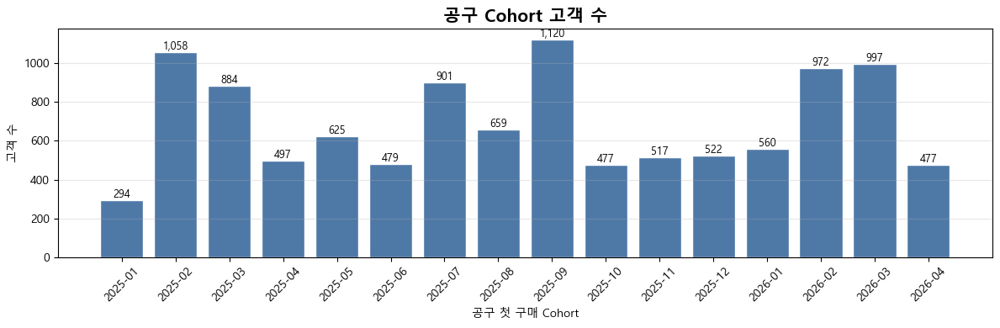

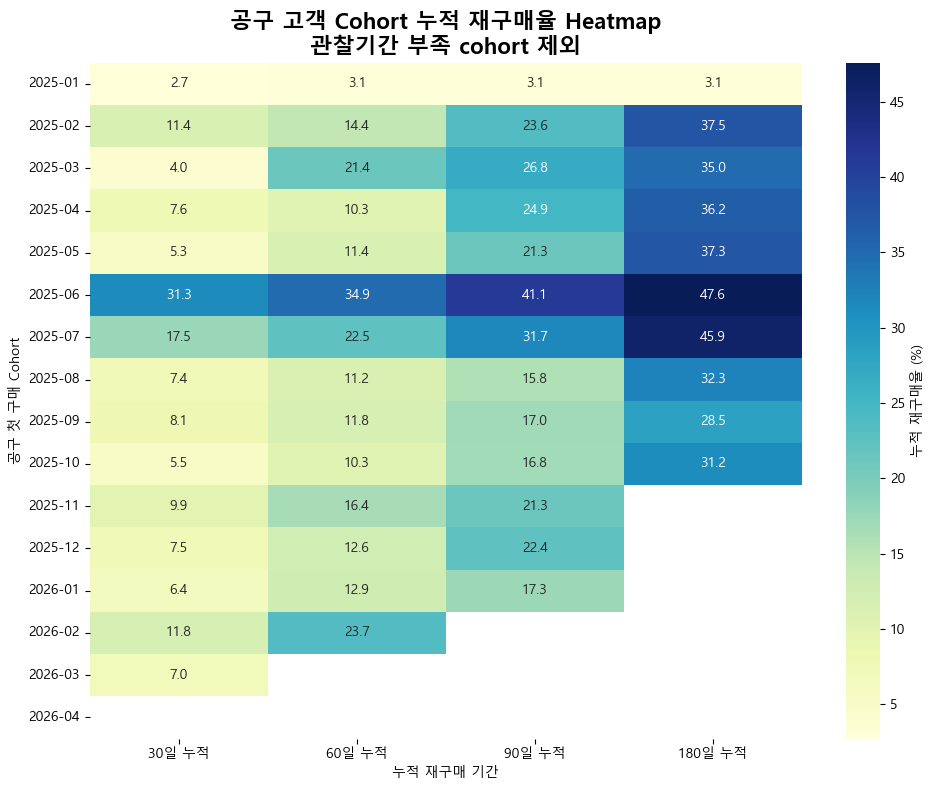

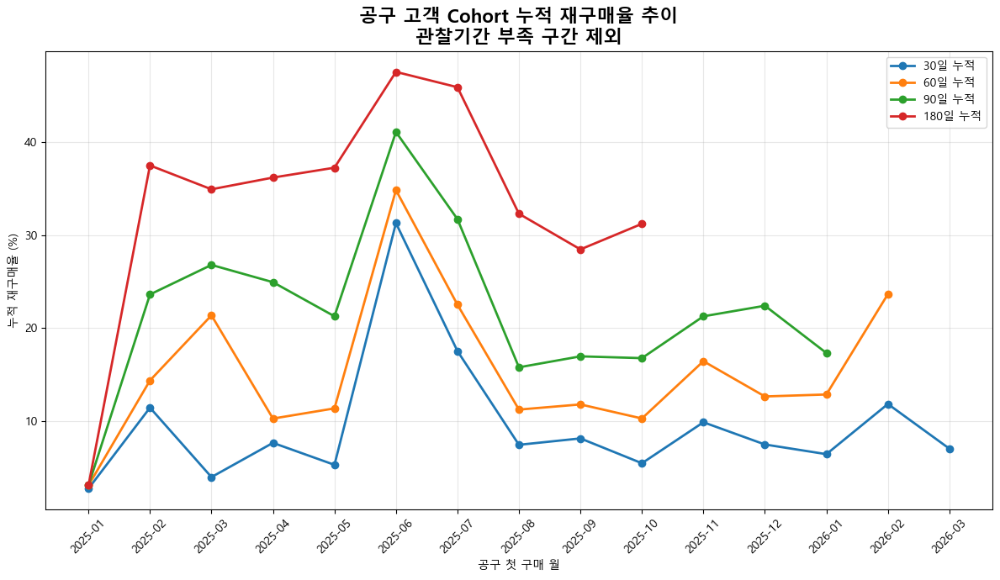

In [828]:
import seaborn as sns

# =========================================================
# 공구 고객 cohort 생성
# =========================================================

gonggu_df = df_eda[
    df_eda['channel_group'] == '공구'
].copy()

gonggu_df = gonggu_df[
    gonggu_df['receiver_key'].notna()
].copy()

gonggu_df['analysis_date'] = pd.to_datetime(gonggu_df['analysis_date'])

# 공구 첫 구매일
gonggu_first = (
    gonggu_df
    .groupby('receiver_key')['analysis_date']
    .min()
    .reset_index()
    .rename(columns={'analysis_date': 'first_purchase_date'})
)

# cohort month
gonggu_first['cohort_month'] = (
    gonggu_first['first_purchase_date']
    .dt.to_period('M')
)

print("=== 공구 Cohort 고객 ===")
print(f"공구 첫 구매 고객 수: {gonggu_first['receiver_key'].nunique():,}명")

# 전체 구매 이력 연결
purchase_history = df_eda[
    df_eda['receiver_key'].notna()
][[
    'receiver_key',
    'analysis_date',
    'channel_group',
    '결제액'
]].copy()

purchase_history['analysis_date'] = pd.to_datetime(
    purchase_history['analysis_date']
)

cohort_df = gonggu_first.merge(
    purchase_history,
    on='receiver_key',
    how='left'
)

# 공구 첫 구매 후 경과일
cohort_df['days_since_first'] = (
    cohort_df['analysis_date']
    - cohort_df['first_purchase_date']
).dt.days


# =========================================================
# 30/60/90/180일 누적 재구매 여부
# - 첫 공구 구매 후 n일 이내 재구매 경험 여부
# =========================================================

repurchase_windows = [30, 60, 90, 180]

for d in repurchase_windows:
    cohort_df[f'cum_repurchase_{d}d'] = (
        (cohort_df['days_since_first'] > 0)
        &
        (cohort_df['days_since_first'] <= d)
    )


# =========================================================
# 고객 단위 누적 재구매 여부
# =========================================================

repurchase_cols = [
    f'cum_repurchase_{d}d'
    for d in repurchase_windows
]

repurchase_result = (
    cohort_df
    .groupby(['receiver_key', 'cohort_month'])[repurchase_cols]
    .max()
    .reset_index()
)

# =========================================================
# cohort size + cohort별 누적 재구매율
# =========================================================

cohort_size = (
    repurchase_result
    .groupby('cohort_month')
    .size()
    .rename('cohort_size')
)

cohort_retention = (
    repurchase_result
    .groupby('cohort_month')[repurchase_cols]
    .mean()
    .join(cohort_size)
    .reset_index()
)


# =========================================================
# 최근/유효 cohort flag
# =========================================================

latest_date = pd.to_datetime(df_eda['analysis_date']).max()
latest_period = latest_date.to_period('M')

cohort_retention['months_from_latest'] = (
    latest_period
    - cohort_retention['cohort_month']
).apply(lambda x: x.n)

cohort_retention['recent_cohort'] = (
    cohort_retention['months_from_latest'] <= 2
)

cohort_retention['valid_30d'] = cohort_retention['months_from_latest'] >= 1
cohort_retention['valid_60d'] = cohort_retention['months_from_latest'] >= 2
cohort_retention['valid_90d'] = cohort_retention['months_from_latest'] >= 3
cohort_retention['valid_180d'] = cohort_retention['months_from_latest'] >= 6

print("\n=== 코호트별 누적 재구매율 ===")
print("(valid_30d/60d/90d/180d: 해당 기간만큼 관찰 가능한 cohort인지 여부)")


# =========================================================
# 히트맵용 데이터 생성
# =========================================================

heatmap_cols = [
    'cum_repurchase_30d',
    'cum_repurchase_60d',
    'cum_repurchase_90d',
    'cum_repurchase_180d'
]

heatmap_data = (
    cohort_retention[heatmap_cols]
    * 100
)

heatmap_data.columns = [
    '30일 누적',
    '60일 누적',
    '90일 누적',
    '180일 누적'
]

heatmap_data.index = cohort_retention['cohort_month'].astype(str)

valid_mask = pd.DataFrame({
    '30일 누적': cohort_retention['valid_30d'].values,
    '60일 누적': cohort_retention['valid_60d'].values,
    '90일 누적': cohort_retention['valid_90d'].values,
    '180일 누적': cohort_retention['valid_180d'].values,
}, index=heatmap_data.index)

heatmap_data_masked = heatmap_data.where(valid_mask)


# =========================================================
# Cohort Size Bar
# =========================================================

plt.figure(figsize=(12, 4))

plt.bar(
    cohort_retention['cohort_month'].astype(str),
    cohort_retention['cohort_size'],
    color='#4e79a7',
    edgecolor='white'
)

plt.title('공구 Cohort 고객 수', fontsize=15, fontweight='bold')
plt.xlabel('공구 첫 구매 Cohort')
plt.ylabel('고객 수')

plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)

for i, v in enumerate(cohort_retention['cohort_size']):
    plt.text(
        i,
        v,
        f'{int(v):,}',
        ha='center',
        va='bottom',
        fontsize=9
    )

plt.tight_layout()
plt.show()


# =========================================================
# Cohort 누적 재구매율 Heatmap
# =========================================================

plt.figure(figsize=(10, 8))

sns.heatmap(
    heatmap_data_masked,
    annot=True,
    fmt='.1f',
    cmap='YlGnBu',
    mask=heatmap_data_masked.isna(),
    cbar_kws={'label': '누적 재구매율 (%)'}
)

plt.title(
    '공구 고객 Cohort 누적 재구매율 Heatmap\n관찰기간 부족 cohort 제외',
    fontsize=16,
    fontweight='bold'
)

plt.xlabel('누적 재구매 기간')
plt.ylabel('공구 첫 구매 Cohort')

plt.tight_layout()
plt.show()


# =========================================================
# Cohort 누적 재구매율 추이
# =========================================================

COHORT_COLOR = {
    '1~30일':   '#1f77b4',   # 파랑
    '31~60일':  '#ff7f0e',   # 주황
    '61~90일':  '#2ca02c',   # 초록
    '91~180일': '#d62728',   # 빨강
}
COHORT_COLORS_LIST = [
    COHORT_COLOR['1~30일'],
    COHORT_COLOR['31~60일'],
    COHORT_COLOR['61~90일'],
    COHORT_COLOR['91~180일'],
]

retention_plot = heatmap_data_masked.copy()

plt.figure(figsize=(12, 7))

for col, color in zip(retention_plot.columns, COHORT_COLORS_LIST):
    plt.plot(
        retention_plot.index,
        retention_plot[col],
        marker='o',
        linewidth=2,
        label=col,
        color=color
    )


plt.title(
    '공구 고객 Cohort 누적 재구매율 추이\n관찰기간 부족 구간 제외',
    fontsize=16,
    fontweight='bold'
)

plt.xlabel('공구 첫 구매 월')
plt.ylabel('누적 재구매율 (%)')

plt.xticks(rotation=45)
plt.grid(alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

- **공구 고객은 즉시 재구매형이 아니다 (히트맵)**  
→ 공구 고객은 첫 구매 직후 다시 사는 고객이 아니라, 시간이 지나면서 자사몰로 유입되는 고객  
    - 30일: 5~12%  
    - 60일: 10~24%  
    - 90일: 17~32%  
    - 180일: 24~48%  

<br>  

- **공구 고객은 "완전 일회성"은 아니다**  
→ 만약 공구가 진짜 이벤트성 고객만 데려온다면 재구매율이 낮아야하나,  
지금은 180일 retention이 30~48% 수준이므로  
→ 공구 고객 중 상당수는 이후에도 브랜드에서 재구매하고 있음을 알 수 있다.  

<br>  

- **2025-06 ~ 2025-07 cohort 품질이 좋음**  
→ 특히, 2025-06 cohort가 전체 평균보다 거의 2~4배 높으므로 별도 확인이 필요함  
→ 원인 확인을 위해 브랜드/제품/셀러 단위 추가 분석 필요  
    - 30d = 31.3%  
    - 60d = 34.9%  
    - 90d = 41.1%  
    - 180d = 47.6%  

<br>  

> 공구 고객은 재구매를 꽤 하지만, 그 재구매가 꼭 자사몰에서 일어나는 건 아니다.  
> 
> - 공구 retention 자체는 나쁘지 않음  
> - 하지만, 자사몰 전환 채널 역할은 약함  
> - 공구는 "브랜드 고객 확보 채널"일 가능성은 있지만,  
> "자사몰 고객 확보 채널"이라고 보기엔 근거가 부족함  

➡️ 2025-06 cohort가 왜 좋았는지 확인하는 분석이 필요함  

---

### 4-1. 2025.06 공구 확인

“고성능 cohort의 유입 구조 분석”  
왜 2025-06 cohort가 유독 retention이 높았는가?

=== 2025-06 공구 cohort 기본 정보 ===
2025-06 cohort 고객 수: 479명
전체 공구 첫 구매 고객 수: 11,039명

=== 2025-06 cohort 셀러 Mix 비교 ===


,셀러,target_고객수,target_비중(%),전체_고객수,전체_비중(%),비중차이(%p)
2,모찌맘,237,49.48,445,4.03,45.45
1,두둥맘,192,40.08,2125,19.25,20.83
4,유박사테니스X시즈노프,47,9.81,47,0.43,9.39
0,꼬미맘,1,0.21,66,0.60,-0.39
3,애프리,1,0.21,982,8.90,-8.69
5,후후맘,1,0.21,22,0.20,0.01


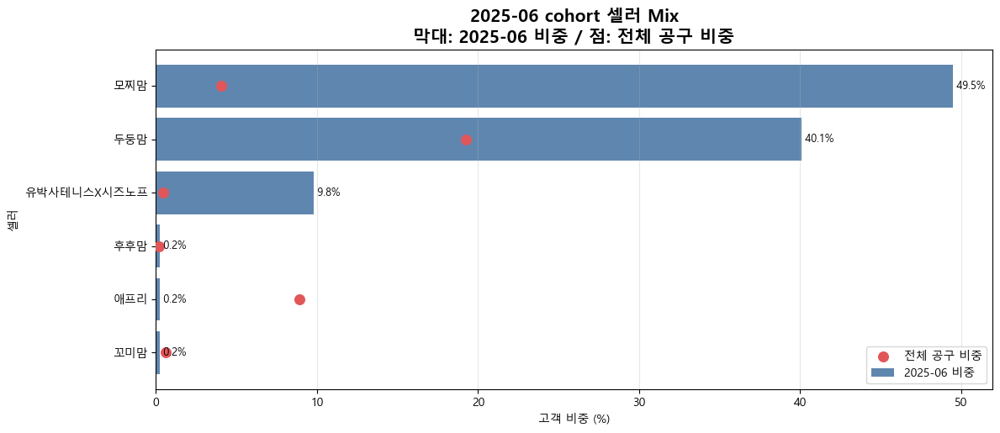


=== 2025-06 cohort 브랜드 Mix 비교 ===


,브랜드,target_고객수,target_비중(%),전체_고객수,전체_비중(%),비중차이(%p)
0,그로우랩,237,49.48,7379,66.84,-17.37
2,파이토뉴트리,195,40.71,3195,28.94,11.77
1,시즈노프,47,9.81,101,0.91,8.90


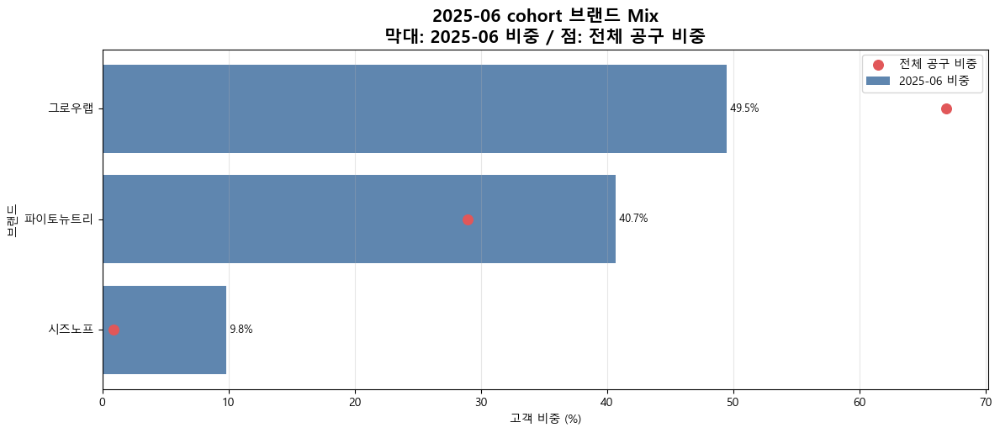


=== 2025-06 cohort SKU Mix 비교 ===


,SKU,target_고객수,target_비중(%),전체_고객수,전체_비중(%),비중차이(%p)
1,그로우랩 성장가이드(비타민D),98,20.46,1348,12.21,8.25
17,투데이D3 메세지카드,55,11.48,431,3.90,7.58
19,투데이디3 오일(30캡슐),52,10.86,278,2.52,8.34
22,투데이디3 오일밤(30캡슐),31,6.47,485,4.39,2.08
9,스포이드,27,5.64,291,2.64,3.00
16,지니어스뉴 드롭스(5개입),25,5.22,663,6.01,-0.79
15,지니어스뉴 드롭스,24,5.01,339,3.07,1.94
20,투데이디3 오일(30캡슐x390캡슐),23,4.80,111,1.01,3.80
0,그로우랩 메세지카드,22,4.59,1228,11.12,-6.53
10,스포이드 (5개입),18,3.76,408,3.70,0.06


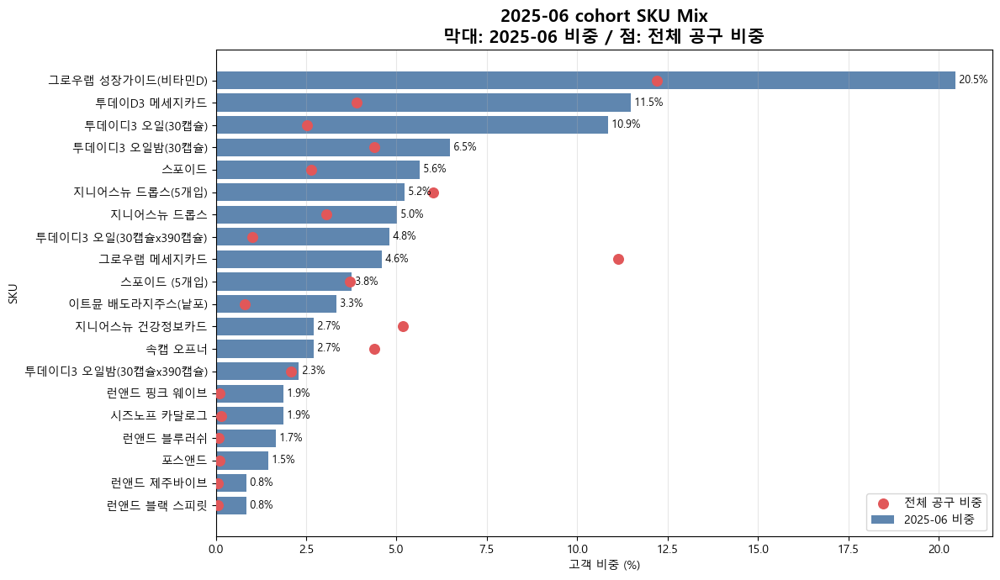


=== 2025-06 cohort에서 전체 대비 과대표현된 셀러 TOP 10 ===


,goo_seller,target_customers,target_share,total_customers,total_share,share_diff_pp
2,모찌맘,237,49.48,445,4.03,45.45
1,두둥맘,192,40.08,2125,19.25,20.83
4,유박사테니스X시즈노프,47,9.81,47,0.43,9.39
5,후후맘,1,0.21,22,0.20,0.01
0,꼬미맘,1,0.21,66,0.60,-0.39
3,애프리,1,0.21,982,8.90,-8.69



=== 2025-06 cohort에서 전체 대비 과대표현된 브랜드 TOP 10 ===


,브랜드_분류,target_customers,target_share,total_customers,total_share,share_diff_pp
2,파이토뉴트리,195,40.71,3195,28.94,11.77
1,시즈노프,47,9.81,101,0.91,8.90
0,그로우랩,237,49.48,7379,66.84,-17.37



=== 2025-06 cohort에서 전체 대비 과대표현된 SKU TOP 10 ===


,sku_normalized,target_customers,target_share,total_customers,total_share,share_diff_pp
19,투데이디3 오일(30캡슐),52,10.86,278,2.52,8.34
1,그로우랩 성장가이드(비타민D),98,20.46,1348,12.21,8.25
17,투데이D3 메세지카드,55,11.48,431,3.90,7.58
20,투데이디3 오일(30캡슐x390캡슐),23,4.80,111,1.01,3.80
9,스포이드,27,5.64,291,2.64,3.00
13,이트뮨 배도라지주스(낱포),16,3.34,89,0.81,2.53
22,투데이디3 오일밤(30캡슐),31,6.47,485,4.39,2.08
15,지니어스뉴 드롭스,24,5.01,339,3.07,1.94
7,런앤드 핑크 웨이브,9,1.88,12,0.11,1.77
11,시즈노프 카달로그,9,1.88,17,0.15,1.72


In [829]:
target_cohort = '2025-06'

# 공구 첫 구매 정보
first_order = (
    df_eda[
        (df_eda['channel_group'] == '공구')
        &
        (df_eda['receiver_key'].notna())
    ]
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
)

first_order['analysis_date'] = pd.to_datetime(first_order['analysis_date'])

first_order['cohort_month'] = (
    first_order['analysis_date']
    .dt.to_period('M')
    .astype(str)
)

cohort_target = first_order[
    first_order['cohort_month'] == target_cohort
].copy()

print(f"=== {target_cohort} 공구 cohort 기본 정보 ===")
print(f"{target_cohort} cohort 고객 수: {cohort_target['receiver_key'].nunique():,}명")
print(f"전체 공구 첫 구매 고객 수: {first_order['receiver_key'].nunique():,}명")


# =========================================================
# 공통 mix 함수
# =========================================================

def compare_mix(df_target, df_all, group_col, label, top_n=15):
    target_mix = (
        df_target
        .groupby(group_col)
        .agg(target_customers=('receiver_key', 'nunique'))
        .reset_index()
    )

    target_mix['target_share'] = (
        target_mix['target_customers'] / target_mix['target_customers'].sum() * 100
    )

    all_mix = (
        df_all
        .groupby(group_col)
        .agg(total_customers=('receiver_key', 'nunique'))
        .reset_index()
    )

    all_mix['total_share'] = (
        all_mix['total_customers'] / all_mix['total_customers'].sum() * 100
    )

    compare = target_mix.merge(all_mix, on=group_col, how='left')

    compare['share_diff_pp'] = compare['target_share'] - compare['total_share']

    compare = compare.sort_values('target_customers', ascending=False)

    compare_display = compare.copy()
    compare_display['target_share'] = compare_display['target_share'].round(2)
    compare_display['total_share'] = compare_display['total_share'].round(2)
    compare_display['share_diff_pp'] = compare_display['share_diff_pp'].round(2)

    print(f"\n=== {target_cohort} cohort {label} Mix 비교 ===")
    display(
        compare_display
        .rename(columns={
            group_col: label,
            'target_customers': 'target_고객수',
            'target_share': 'target_비중(%)',
            'total_customers': '전체_고객수',
            'total_share': '전체_비중(%)',
            'share_diff_pp': '비중차이(%p)'
        })
        .head(top_n)
    )

    plot_data = compare_display.head(top_n).copy()
    plot_data = plot_data.sort_values('target_customers')

    fig, ax = plt.subplots(figsize=(12, max(5, top_n * 0.35)))

    ax.barh(
        plot_data[group_col].astype(str),
        plot_data['target_share'],
        color='#4e79a7',
        alpha=0.9,
        label=f'{target_cohort} 비중'
    )

    ax.scatter(
        plot_data['total_share'],
        plot_data[group_col].astype(str),
        color='#e15759',
        s=70,
        label='전체 공구 비중',
        zorder=3
    )

    for _, row in plot_data.iterrows():
        ax.text(
            row['target_share'],
            str(row[group_col]),
            f" {row['target_share']:.1f}%",
            va='center',
            fontsize=9
        )

    ax.set_title(
        f'{target_cohort} cohort {label} Mix\n막대: {target_cohort} 비중 / 점: 전체 공구 비중',
        fontsize=15,
        fontweight='bold'
    )

    ax.set_xlabel('고객 비중 (%)')
    ax.set_ylabel(label)
    ax.grid(axis='x', alpha=0.3)
    ax.legend()

    plt.tight_layout()
    plt.show()

    return compare_display


# =========================================================
# Seller Mix
# =========================================================

seller_mix_compare = compare_mix(
    df_target=cohort_target,
    df_all=first_order,
    group_col='goo_seller',
    label='셀러',
    top_n=15
)


# =========================================================
# Brand Mix
# =========================================================

brand_mix_compare = compare_mix(
    df_target=cohort_target,
    df_all=first_order,
    group_col='브랜드_분류',
    label='브랜드',
    top_n=15
)


# =========================================================
# SKU Mix
# =========================================================

sku_mix_compare = compare_mix(
    df_target=cohort_target,
    df_all=first_order,
    group_col='sku_normalized',
    label='SKU',
    top_n=20
)


# =========================================================
# 비중차이 기준 상위 항목 확인
# =========================================================

print("\n=== 2025-06 cohort에서 전체 대비 과대표현된 셀러 TOP 10 ===")
display(seller_mix_compare.sort_values('share_diff_pp', ascending=False).head(10))

print("\n=== 2025-06 cohort에서 전체 대비 과대표현된 브랜드 TOP 10 ===")
display(brand_mix_compare.sort_values('share_diff_pp', ascending=False).head(10))

print("\n=== 2025-06 cohort에서 전체 대비 과대표현된 SKU TOP 10 ===")
display(sku_mix_compare.sort_values('share_diff_pp', ascending=False).head(10))

- 셀러 관점  
2025년 6월 코호트는 모찌맘과 두둥맘이 거의 대부분을 차지함  
    - 모찌맘 :  
        - 전체 공구에서는 4.03% 정도의 비중이나,  
        - 2025년 6월 코호트에서는 49.48%의 비중  
    - 두둥맘 :  
        - 전체 공구에서는 19.25% 정도의 비중이나,  
        - 2025년 6월 코호트에서는 40.08%의 비중  

<br>  

- 브랜드 관점  
특정 브랜드 상품이 유입을 주도했을 가능성  
    - 시즈노프 :  
        - 전체 공구에서는 0.91% 정도의 비중이나,  
        - 2025년 6월 코호트에서는 9.81%의 비중  

<br>  

- SKU 관점  
2025년 6월 코호트는 비타민D와 투데이D3 계열 제품군 비중이 비정상적으로 높음  
    - 그로우랩 성장가이드(비타민D) :  
        - 전체 공구에서는 12.2% 정도의 비중이나,  
        - 2025년 6월 코호트에서는 20.5%의 비중  
    - 투데이D3 오일(30캡슐) :  
        - 전체 공구에서는 2.5% 정도의 비중이나,  
        - 2025년 6월 코호트에서는 10.9%의 비중  


> [Retention이 높았던 이유 추정]  
> - 가설01. 특정 셀러 효과  
> 모찌맘, 두둥맘의 유입 고객 quality가 좋았다.  
> - 가설02. 특정 상품 효과  
> 비타민D, 투데이D3 구매 고객이 원래 재구매 성향이 높은 카테고리였다.  
> - 가설03. 셀러 + 상품 조합 효과  
> '모찌맘-투데이D3', '두둠맘-비타민D' 같은 조합이 강하게 작동했다.  


➡️ 가설을 확인할 추가 분석 필요  

---

### 4-2. 가설 3가지 확인 

- 셀러 효과  
    "모찌맘/두둠맘 고객이 원래 retention이 높은 고객인가?"  
- 상품 효과  
    "비타민D / 투데이D3 자체가 retention이 높은 상품인가?"  
- 셀러 + 상품 조합 효과  
    "`모찌맘-투데이D3`, `두둠맘-비타민D` 조합이 retention을 끌어올렸나?" 

=== 2025-06 공구 cohort 고객 수 ===
479명

=== 가설 A. 셀러별 retention ===


,first_gonggu_seller,고객수,repurchase_30d,repurchase_60d,repurchase_90d,repurchase_180d
3,애프리,1,100.00,100.00,100.00,100.00
1,두둥맘,192,75.52,77.08,80.21,80.73
2,모찌맘,237,1.69,7.59,16.88,29.54
4,유박사테니스X시즈노프,47,0.00,0.00,4.26,4.26
0,꼬미맘,1,0.00,0.00,0.00,0.00
5,후후맘,1,0.00,0.00,0.00,0.00


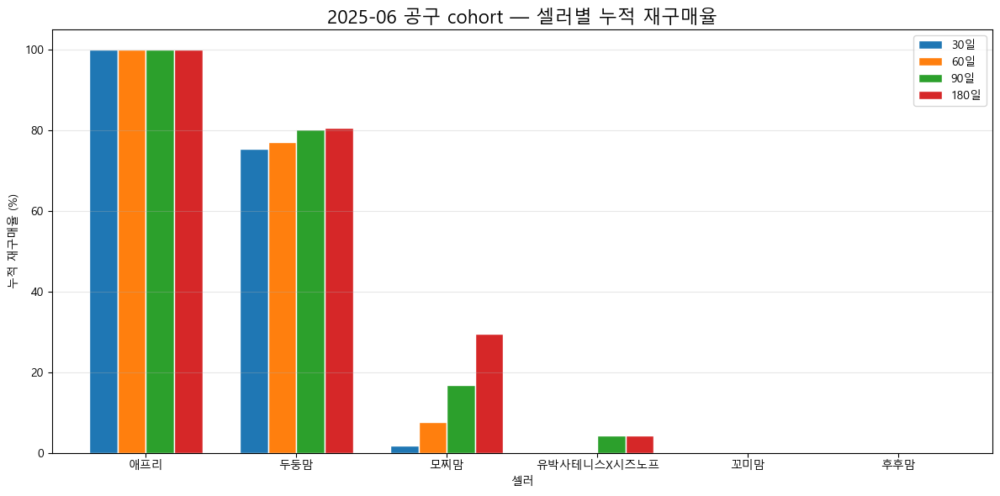


=== 가설 B. SKU별 retention TOP 20 ===


,first_gonggu_product,고객수,repurchase_30d,repurchase_60d,repurchase_90d,repurchase_180d
10,스포이드 (5개입),18,100.00,100.00,100.00,100.00
16,지니어스뉴 드롭스(5개입),25,96.00,96.00,96.00,96.00
14,지니어스뉴 건강정보카드,13,84.62,84.62,92.31,92.31
13,이트뮨 배도라지주스(낱포),16,62.50,62.50,75.00,75.00
15,지니어스뉴 드롭스,24,66.67,70.83,75.00,75.00
9,스포이드,27,66.67,70.37,74.07,74.07
0,그로우랩 메세지카드,22,68.18,68.18,68.18,68.18
8,속캡 오프너,13,53.85,53.85,53.85,53.85
1,그로우랩 성장가이드(비타민D),98,30.61,38.78,41.84,53.06
22,투데이디3 오일밤(30캡슐),31,0.00,3.23,19.35,29.03


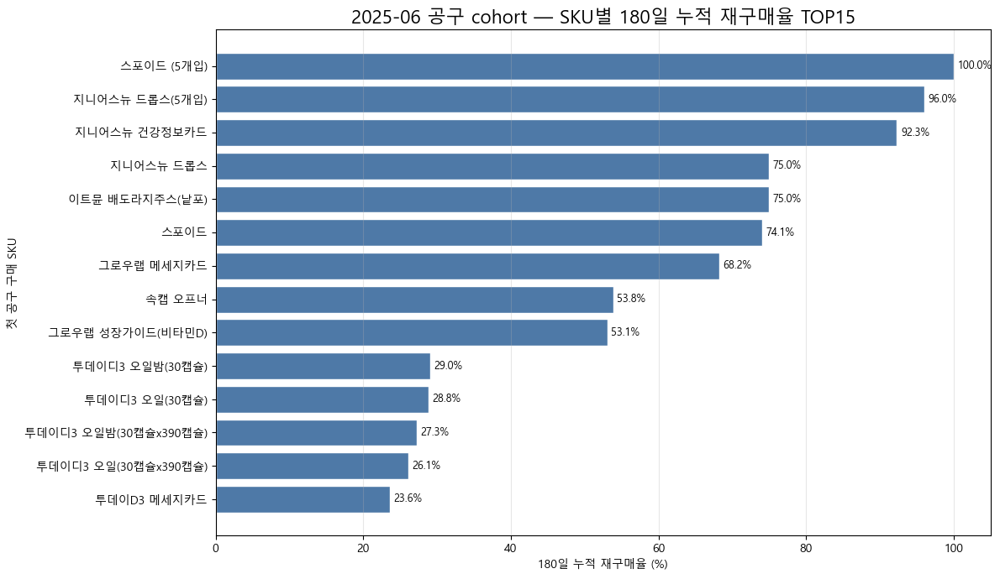


=== 가설 C. 셀러 × SKU 조합별 retention TOP 20 ===


,first_gonggu_seller,first_gonggu_product,고객수,repurchase_30d,repurchase_60d,repurchase_90d,repurchase_180d
5,두둥맘,스포이드 (5개입),18,100.00,100.00,100.00,100.00
9,두둥맘,지니어스뉴 드롭스(5개입),25,96.00,96.00,96.00,96.00
7,두둥맘,지니어스뉴 건강정보카드,13,84.62,84.62,92.31,92.31
2,두둥맘,그로우랩 성장가이드(비타민D),34,76.47,79.41,82.35,85.29
6,두둥맘,이트뮨 배도라지주스(낱포),16,62.50,62.50,75.00,75.00
8,두둥맘,지니어스뉴 드롭스,24,66.67,70.83,75.00,75.00
4,두둥맘,스포이드,27,66.67,70.37,74.07,74.07
1,두둥맘,그로우랩 메세지카드,22,68.18,68.18,68.18,68.18
3,두둥맘,속캡 오프너,13,53.85,53.85,53.85,53.85
10,모찌맘,그로우랩 성장가이드(비타민D),63,6.35,17.46,20.63,36.51


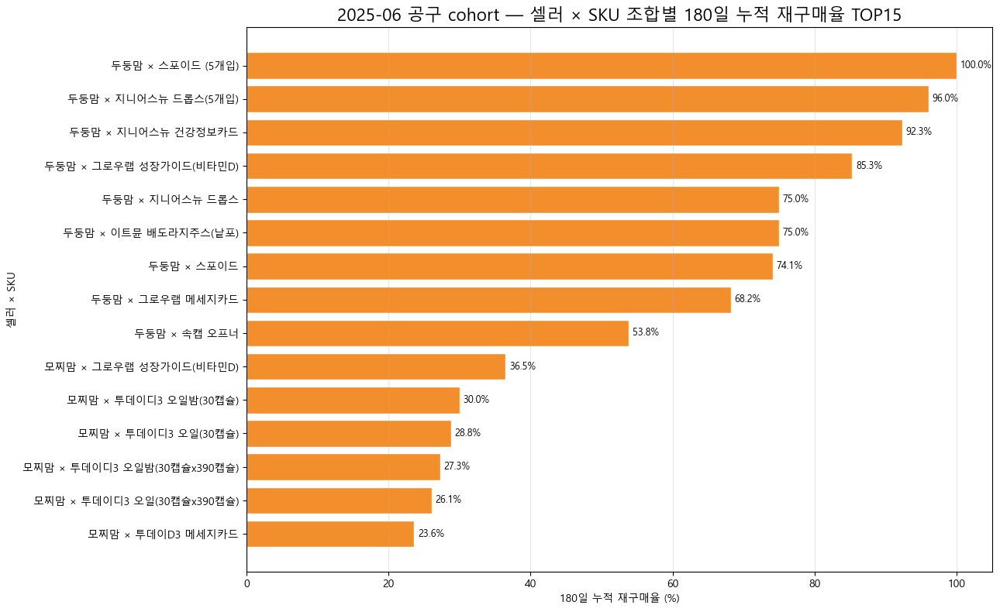

In [830]:
target_month = '2025-06'
windows = [30, 60, 90, 180]

# ---------------------------------------------------------
# 0) 공구 첫 구매 고객 기준 데이터 생성
# ---------------------------------------------------------

first_gonggu_order = (
    df_eda[
        (df_eda['channel_group'] == '공구') &
        (df_eda['receiver_key'].notna())
    ]
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
)

first_gonggu_order['analysis_date'] = pd.to_datetime(first_gonggu_order['analysis_date'])

first_gonggu_order['cohort_month'] = (
    first_gonggu_order['analysis_date']
    .dt.to_period('M')
    .astype(str)
)

first_gonggu_order = first_gonggu_order.rename(columns={
    'analysis_date': 'gonggu_first_date',
    'goo_seller': 'first_gonggu_seller',
    '브랜드_분류': 'first_gonggu_brand',
    'sku_normalized': 'first_gonggu_product'
})

target_cohort = first_gonggu_order[
    first_gonggu_order['cohort_month'] == target_month
].copy()

print(f"=== {target_month} 공구 cohort 고객 수 ===")
print(f"{target_cohort['receiver_key'].nunique():,}명")


# ---------------------------------------------------------
# 1) 전체 구매 이력 연결
# ---------------------------------------------------------

purchase_history = df_eda[
    df_eda['receiver_key'].notna()
][[
    'receiver_key',
    'analysis_date',
    'channel_group',
    '결제액'
]].copy()

purchase_history['analysis_date'] = pd.to_datetime(purchase_history['analysis_date'])

retention_base = target_cohort[[
    'receiver_key',
    'gonggu_first_date',
    'first_gonggu_seller',
    'first_gonggu_brand',
    'first_gonggu_product'
]].merge(
    purchase_history,
    on='receiver_key',
    how='left'
)

retention_base['days_since_first'] = (
    retention_base['analysis_date']
    - retention_base['gonggu_first_date']
).dt.days

for d in windows:
    retention_base[f'repurchase_{d}d'] = (
        (retention_base['days_since_first'] > 0) &
        (retention_base['days_since_first'] <= d)
    )

repurchase_cols = [f'repurchase_{d}d' for d in windows]


# ---------------------------------------------------------
# 2) 고객 단위 retention 정리
# ---------------------------------------------------------

customer_retention = (
    retention_base
    .groupby([
        'receiver_key',
        'first_gonggu_seller',
        'first_gonggu_brand',
        'first_gonggu_product'
    ])[repurchase_cols]
    .max()
    .reset_index()
)


# =========================================================
# 가설 A. 셀러 효과
# "특정 셀러 고객의 retention이 높은가?"
# =========================================================

seller_retention = (
    customer_retention
    .groupby('first_gonggu_seller')
    .agg(
        고객수=('receiver_key', 'nunique'),
        repurchase_30d=('repurchase_30d', 'mean'),
        repurchase_60d=('repurchase_60d', 'mean'),
        repurchase_90d=('repurchase_90d', 'mean'),
        repurchase_180d=('repurchase_180d', 'mean')
    )
    .reset_index()
)

rate_cols = ['repurchase_30d', 'repurchase_60d', 'repurchase_90d', 'repurchase_180d']
seller_retention[rate_cols] = seller_retention[rate_cols] * 100

seller_retention = seller_retention.sort_values('repurchase_180d', ascending=False)

print("\n=== 가설 A. 셀러별 retention ===")
display(seller_retention.round(2))


# 시각화
plot_df = seller_retention.set_index('first_gonggu_seller')[rate_cols]

ax = plot_df.plot(
    kind='bar',
    figsize=(12, 6),
    width=0.75,
    color=COHORT_COLORS_LIST,
    edgecolor='white'
)

ax.set_title(f'{target_month} 공구 cohort — 셀러별 누적 재구매율', fontsize=16)
ax.set_xlabel('셀러')
ax.set_ylabel('누적 재구매율 (%)')
ax.grid(axis='y', alpha=0.3)
plt.xticks(rotation=0)
plt.legend(['30일', '60일', '90일', '180일'])
plt.tight_layout()
plt.show()


# =========================================================
# 가설 B. 상품/SKU 효과
# "특정 SKU 고객의 retention이 높은가?"
# =========================================================

sku_retention = (
    customer_retention
    .groupby('first_gonggu_product')
    .agg(
        고객수=('receiver_key', 'nunique'),
        repurchase_30d=('repurchase_30d', 'mean'),
        repurchase_60d=('repurchase_60d', 'mean'),
        repurchase_90d=('repurchase_90d', 'mean'),
        repurchase_180d=('repurchase_180d', 'mean')
    )
    .reset_index()
)

sku_retention[rate_cols] = sku_retention[rate_cols] * 100

# 고객 수 너무 작은 SKU 제외
sku_retention = sku_retention[
    sku_retention['고객수'] >= 10
].copy()

sku_retention = sku_retention.sort_values('repurchase_180d', ascending=False)

print("\n=== 가설 B. SKU별 retention TOP 20 ===")
display(sku_retention.head(20).round(2))


# 시각화
top_sku_retention = sku_retention.head(15).sort_values('repurchase_180d')

plt.figure(figsize=(12, 7))

plt.barh(
    top_sku_retention['first_gonggu_product'],
    top_sku_retention['repurchase_180d'],
    color='#4e79a7',
    edgecolor='white'
)

for i, v in enumerate(top_sku_retention['repurchase_180d']):
    plt.text(v + 0.5, i, f'{v:.1f}%', va='center', fontsize=9)

plt.title(f'{target_month} 공구 cohort — SKU별 180일 누적 재구매율 TOP15', fontsize=16)
plt.xlabel('180일 누적 재구매율 (%)')
plt.ylabel('첫 공구 구매 SKU')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()


# =========================================================
# 가설 C. 셀러 × SKU 조합 효과
# "특정 셀러가 특정 SKU를 팔았을 때 retention이 높은가?"
# =========================================================

seller_sku_retention = (
    customer_retention
    .groupby(['first_gonggu_seller', 'first_gonggu_product'])
    .agg(
        고객수=('receiver_key', 'nunique'),
        repurchase_30d=('repurchase_30d', 'mean'),
        repurchase_60d=('repurchase_60d', 'mean'),
        repurchase_90d=('repurchase_90d', 'mean'),
        repurchase_180d=('repurchase_180d', 'mean')
    )
    .reset_index()
)

seller_sku_retention[rate_cols] = seller_sku_retention[rate_cols] * 100

# 고객 수 너무 작은 조합 제외
seller_sku_retention = seller_sku_retention[
    seller_sku_retention['고객수'] >= 10
].copy()

seller_sku_retention = seller_sku_retention.sort_values(
    'repurchase_180d',
    ascending=False
)

print("\n=== 가설 C. 셀러 × SKU 조합별 retention TOP 20 ===")
display(seller_sku_retention.head(20).round(2))


# 시각화
top_combo = seller_sku_retention.head(15).copy()
top_combo['combo'] = (
    top_combo['first_gonggu_seller'].astype(str)
    + ' × '
    + top_combo['first_gonggu_product'].astype(str)
)

top_combo = top_combo.sort_values('repurchase_180d')

plt.figure(figsize=(13, 8))

plt.barh(
    top_combo['combo'],
    top_combo['repurchase_180d'],
    color='#f28e2b',
    edgecolor='white'
)

for i, v in enumerate(top_combo['repurchase_180d']):
    plt.text(v + 0.5, i, f'{v:.1f}%', va='center', fontsize=9)

plt.title(f'{target_month} 공구 cohort — 셀러 × SKU 조합별 180일 누적 재구매율 TOP15', fontsize=16)
plt.xlabel('180일 누적 재구매율 (%)')
plt.ylabel('셀러 × SKU')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

- **가설 A : 셀러 효과 (매우 강함)**  
같은 달에 들어온 고객인데도 셀러에 따라 retention 차이가 엄청 크게 나타남  
    - 두둥맘의 고객은 유입 직후 빠르게 반복 구매하는 고객군으로 재구매율이 매우 높음 (30일 75%, 180일 81%)  
    - 반면, 모찌맘은 30일(1.7%)보다 180일(29.5%) 재구매율이 더 높음  

<br>  

- **가설 B : SKU 효과 (애매)**  
상위 SKU가 전부 두둥맘 제품군으로    
    - SKU가 좋아서 retention이 좋은 것인지    
    - 두둥맘 고객이라서인지 분리가 안됨  

<br>  

- **가설 C : 셀러 × SKU 효과 (핵심)**  
    - 같은 2025년 6월 코호트인데,  
        - 두둥맘 SKU군은 70~100%    
        - 모찌맘 SKU군은 20~35%  
    - 2025-06 cohort 성과는 두둥맘 유입 고객이 만든 것으로 보임  
    - cf. 지금 결과는 두둥맘 고객이 공구 내에서 재구매한 것이 아니라, 브랜드 전체 채널에서 재구매한 것을 본 것  

<br>  

➡️ 두둥맘 고객 재구매 채널 확인 필요  

---

### 4-3. 2025-06 두둥맘 고객 확인

"두둥맘 고객은 이후 어디에서 처음 재구매하는가?"

=== 2025-06 두둥맘 공구 첫 구매 고객 ===
고객 수: 192명

=== 재구매 이력 ===
재구매 row 수: 261
재구매 고객 수: 86

=== 첫 재구매 고객 ===
첫 재구매 고객 수: 86


,channel_group,고객수,평균_첫재구매일,중앙값_첫재구매일,재구매매출,전체고객대비_비중(%),재구매고객내_비중(%)
0,공구,56,110.40,79.00,2416656,29.17,65.12
2,자사몰_N,21,106.40,95.00,1469100,10.94,24.42
1,자사몰,9,78.90,77.00,1005148,4.69,10.47


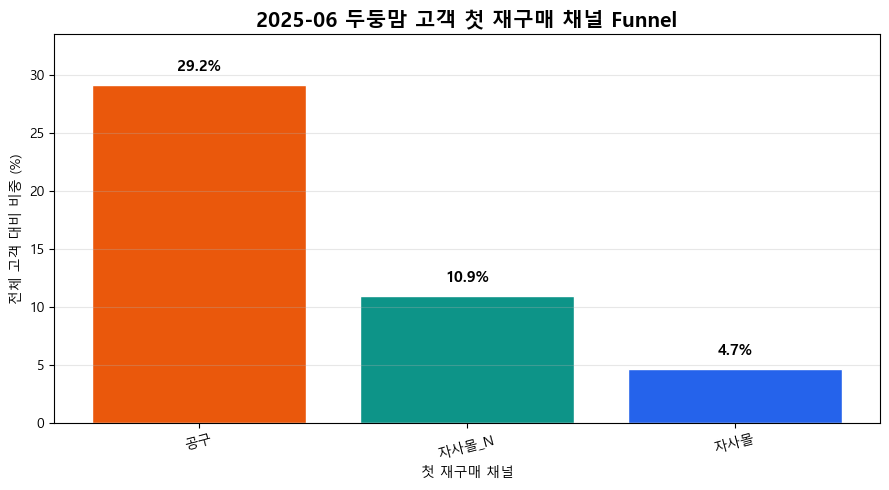


=== 첫 재구매 SKU TOP20 ===


,sku_normalized,브랜드_분류,channel_group,고객수,평균_첫재구매일,재구매매출,고객비중(%)
8,지니어스뉴 드롭스,그로우랩,공구,23,86.70,611890,11.98
11,지니어스뉴 드롭스(5개입),그로우랩,공구,16,102.90,936986,8.33
13,지니어스뉴 드롭스(5개입),그로우랩,자사몰_N,5,119.40,638600,2.60
7,이트뮨 배도라지주스(box),파이토뉴트리,공구,4,157.00,99600,2.08
3,그로우뉴K2,그로우랩,공구,4,231.20,224600,2.08
10,지니어스뉴 드롭스,그로우랩,자사몰_N,4,140.50,107200,2.08
19,지니어스뉴 톡캡스(30캡슐),그로우랩,자사몰_N,3,88.30,213600,1.56
12,지니어스뉴 드롭스(5개입),그로우랩,자사몰,3,78.70,398168,1.56
5,그로우뉴K2,그로우랩,자사몰_N,3,55.70,130500,1.56
22,투데이디3 오일(30캡슐),파이토뉴트리,자사몰_N,3,71.00,115200,1.56



=== 첫 공구 SKU → 첫 재구매 SKU 전이 TOP20 ===


,first_gonggu_product,next_sku,next_channel,고객수,평균_첫재구매일,비중(%)
11,그로우랩 성장가이드(비타민D),지니어스뉴 드롭스,공구,5,61.00,2.60
22,스포이드,지니어스뉴 드롭스(5개입),공구,4,123.80,2.08
29,스포이드 (5개입),지니어스뉴 드롭스,공구,3,78.00,1.56
5,그로우랩 메세지카드,지니어스뉴 드롭스(5개입),공구,3,80.00,1.56
17,속캡 오프너,지니어스뉴 드롭스,공구,3,91.00,1.56
47,지니어스뉴 드롭스,지니어스뉴 드롭스,공구,3,111.70,1.56
34,이트뮨 배도라지주스(낱포),지니어스뉴 드롭스,공구,3,128.30,1.56
55,지니어스뉴 드롭스(5개입),지니어스뉴 드롭스,공구,3,74.70,1.56
56,지니어스뉴 드롭스(5개입),지니어스뉴 드롭스(5개입),공구,3,128.70,1.56
30,스포이드 (5개입),지니어스뉴 드롭스(5개입),자사몰,2,65.50,1.04


In [831]:
TARGET_MONTH = '2025-06'
TARGET_SELLER = '두둥맘'

# ---------------------------------------------------------
# 2025-06 두둥맘 공구 첫 구매 고객 정의
# ---------------------------------------------------------

target_users = first_gonggu_order[
    (first_gonggu_order['cohort_month'] == TARGET_MONTH)
    &
    (first_gonggu_order['first_gonggu_seller'] == TARGET_SELLER)
]['receiver_key'].unique()

print(f"=== {TARGET_MONTH} {TARGET_SELLER} 공구 첫 구매 고객 ===")
print(f"고객 수: {len(target_users):,}명")


# ---------------------------------------------------------
# 대상 고객 전체 구매 이력 연결
# ---------------------------------------------------------

target_history = df_eda[
    df_eda['receiver_key'].isin(target_users)
].copy()

target_history['analysis_date'] = pd.to_datetime(
    target_history['analysis_date']
)

target_history = target_history.merge(
    first_gonggu_order[
        ['receiver_key', 'gonggu_first_date', 'first_gonggu_product', 'first_gonggu_brand']
    ],
    on='receiver_key',
    how='left'
)

target_history['days_since_first'] = (
    target_history['analysis_date']
    - target_history['gonggu_first_date']
).dt.days


# ---------------------------------------------------------
# 첫 구매 이후 구매만 필터
# ---------------------------------------------------------

repurchase_history = target_history[
    (target_history['days_since_first'] > 0)
    &
    (target_history['결제액'] > 0)
].copy()

# GIFT/사은품성 품목 제외
repurchase_history = repurchase_history[
    ~repurchase_history['품명'].astype(str).str.contains('GIFT', na=False)
].copy()

print("\n=== 재구매 이력 ===")
print(f"재구매 row 수: {len(repurchase_history):,}")
print(f"재구매 고객 수: {repurchase_history['receiver_key'].nunique():,}")


# ---------------------------------------------------------
# 고객별 첫 재구매 추출
# ---------------------------------------------------------

first_repurchase = (
    repurchase_history
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
)

print("\n=== 첫 재구매 고객 ===")
print(f"첫 재구매 고객 수: {first_repurchase['receiver_key'].nunique():,}")


# ---------------------------------------------------------
# 첫 재구매 채널 Funnel
# ---------------------------------------------------------

funnel_summary = (
    first_repurchase
    .groupby('channel_group')
    .agg(
        고객수=('receiver_key', 'nunique'),
        평균_첫재구매일=('days_since_first', 'mean'),
        중앙값_첫재구매일=('days_since_first', 'median'),
        재구매매출=('결제액', 'sum')
    )
    .reset_index()
)

funnel_summary['전체고객대비_비중(%)'] = (
    funnel_summary['고객수']
    / len(target_users)
    * 100
).round(2)

funnel_summary['재구매고객내_비중(%)'] = (
    funnel_summary['고객수']
    / first_repurchase['receiver_key'].nunique()
    * 100
).round(2)

funnel_summary['평균_첫재구매일'] = funnel_summary['평균_첫재구매일'].round(1)
funnel_summary['중앙값_첫재구매일'] = funnel_summary['중앙값_첫재구매일'].round(1)

funnel_summary = funnel_summary.sort_values(
    '고객수',
    ascending=False
)

display(funnel_summary)


# ---------------------------------------------------------
# 첫 재구매 채널 시각화
# ---------------------------------------------------------

plt.figure(figsize=(9, 5))

bars = plt.bar(
    funnel_summary['channel_group'],
    funnel_summary['전체고객대비_비중(%)'],
    color=[
        CH_COLOR.get(ch, '#999999')
        for ch in funnel_summary['channel_group']
    ],
    edgecolor='white'
)

for bar, val in zip(
    bars,
    funnel_summary['전체고객대비_비중(%)']
):

    plt.text(
        bar.get_x() + bar.get_width()/2,
        val + max(funnel_summary['전체고객대비_비중(%)']) * 0.03,
        f'{val:.1f}%',
        ha='center',
        va='bottom',
        fontsize=11,
        fontweight='bold'
    )

plt.title(
    f'{TARGET_MONTH} {TARGET_SELLER} 고객 첫 재구매 채널 Funnel',
    fontsize=15,
    fontweight='bold'
)

plt.xlabel('첫 재구매 채널')
plt.ylabel('전체 고객 대비 비중 (%)')

plt.xticks(rotation=15)
plt.ylim(
    0,
    funnel_summary['전체고객대비_비중(%)'].max() * 1.15
)

plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


# ---------------------------------------------------------
# 첫 재구매 SKU TOP20
# ---------------------------------------------------------

first_repurchase_sku = (
    first_repurchase
    .groupby(['sku_normalized', '브랜드_분류', 'channel_group'])
    .agg(
        고객수=('receiver_key', 'nunique'),
        평균_첫재구매일=('days_since_first', 'mean'),
        재구매매출=('결제액', 'sum')
    )
    .reset_index()
)

first_repurchase_sku['고객비중(%)'] = (
    first_repurchase_sku['고객수']
    / len(target_users)
    * 100
).round(2)

first_repurchase_sku['평균_첫재구매일'] = (
    first_repurchase_sku['평균_첫재구매일']
    .round(1)
)

first_repurchase_sku = first_repurchase_sku.sort_values(
    '고객수',
    ascending=False
)

print("\n=== 첫 재구매 SKU TOP20 ===")
display(first_repurchase_sku.head(20))


# ---------------------------------------------------------
# 첫 공구 SKU → 첫 재구매 SKU 전이
# ---------------------------------------------------------

transition_df = first_repurchase[[
    'receiver_key',
    'first_gonggu_product',
    'first_gonggu_brand',
    'sku_normalized',
    '브랜드_분류',
    'channel_group',
    'days_since_first'
]].rename(columns={
    'sku_normalized': 'next_sku',
    '브랜드_분류': 'next_brand',
    'channel_group': 'next_channel'
})

sku_transition = (
    transition_df
    .groupby([
        'first_gonggu_product',
        'next_sku',
        'next_channel'
    ])
    .agg(
        고객수=('receiver_key', 'nunique'),
        평균_첫재구매일=('days_since_first', 'mean')
    )
    .reset_index()
)

sku_transition['비중(%)'] = (
    sku_transition['고객수']
    / len(target_users)
    * 100
).round(2)

sku_transition['평균_첫재구매일'] = (
    sku_transition['평균_첫재구매일']
    .round(1)
)

sku_transition = sku_transition.sort_values(
    '고객수',
    ascending=False
)

print("\n=== 첫 공구 SKU → 첫 재구매 SKU 전이 TOP20 ===")
display(sku_transition.head(20))

- 두둥맘 고객은 quality 좋음  
    - 유입 고객 : 192명 / 재구매 고객 : 86명 (44.8%가 재구매)  
    - 위의 180일 retention 수치(47.6%)와 거의 일치  
    - 2025-06 cohort의 높은 retention은 거의 두둥맘 고객이 만든 결과라고 봐도 됨  

<br>  

- BUT 두둥맘 고객은 공구에서 재구매하는 비중이 높음  
    - 공구 65% / 스마트스토어 24% / 고도몰 10%  

<br>  

- 두둥맘 고객이 재구매하는 상품은 첫 구매 상품과 유사함  
→ 첫 구매에서 브랜드 체험을 하고, 같은 제품을 재구매하는 구조  
→ SKU repeatability 신호!

---

### 4-4. 2025-06 모찌맘 고객 확인

두둥맘 고객 품질 확인을 위해 비교군 확인

=== 2025-06 모찌맘 공구 첫 구매 고객 ===
고객 수: 237명

=== 재구매 이력 ===
재구매 row 수: 208
재구매 고객 수: 85

=== 첫 재구매 고객 ===
첫 재구매 고객 수: 85


,channel_group,고객수,평균_첫재구매일,중앙값_첫재구매일,재구매매출,전체고객대비_비중(%),재구매고객내_비중(%)
0,공구,43,110.60,87.00,1612975,18.14,50.59
2,자사몰_N,30,134.90,128.50,1269700,12.66,35.29
1,자사몰,12,124.80,131.50,1123452,5.06,14.12


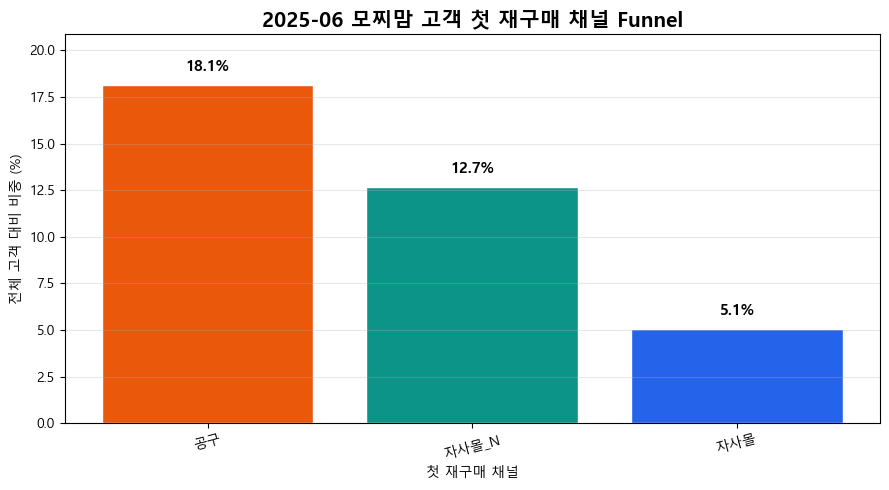


=== 첫 재구매 SKU TOP20 ===


,sku_normalized,브랜드_분류,channel_group,고객수,평균_첫재구매일,재구매매출,고객비중(%)
21,투데이디3 오일밤(30캡슐),파이토뉴트리,공구,17,102.90,475707,7.17
15,투데이디3 오일(30캡슐),파이토뉴트리,공구,14,137.40,673215,5.91
17,투데이디3 오일(30캡슐),파이토뉴트리,자사몰_N,10,138.30,364800,4.22
23,투데이디3 오일밤(30캡슐),파이토뉴트리,자사몰_N,8,114.90,247200,3.38
24,투데이디3 오일밤(30캡슐x390캡슐),파이토뉴트리,공구,5,87.80,170380,2.11
1,그로우뉴K2,그로우랩,자사몰,3,190.00,211200,1.27
19,투데이디3 오일(30캡슐x390캡슐),파이토뉴트리,자사몰_N,2,179.00,115200,0.84
16,투데이디3 오일(30캡슐),파이토뉴트리,자사몰,2,148.50,79100,0.84
14,지니어스뉴 톡캡스(30캡슐),그로우랩,자사몰_N,2,118.50,99600,0.84
13,지니어스뉴 톡캡스(30캡슐),그로우랩,자사몰,2,88.50,338500,0.84



=== 첫 공구 SKU → 첫 재구매 SKU 전이 TOP20 ===


,first_gonggu_product,next_sku,next_channel,고객수,평균_첫재구매일,비중(%)
30,투데이디3 오일(30캡슐),투데이디3 오일밤(30캡슐),공구,6,78.50,2.53
27,투데이디3 오일(30캡슐),투데이디3 오일(30캡슐),공구,4,136.20,1.69
22,투데이D3 메세지카드,투데이디3 오일밤(30캡슐),공구,4,73.20,1.69
11,그로우랩 성장가이드(비타민D),투데이디3 오일밤(30캡슐),공구,4,144.80,1.69
37,투데이디3 오일(30캡슐x390캡슐),투데이디3 오일(30캡슐),자사몰_N,3,161.70,1.27
7,그로우랩 성장가이드(비타민D),투데이디3 오일(30캡슐),공구,3,108.30,1.27
9,그로우랩 성장가이드(비타민D),투데이디3 오일(30캡슐),자사몰_N,3,87.00,1.27
19,투데이D3 메세지카드,투데이디3 오일(30캡슐),공구,3,152.00,1.27
0,그로우랩 성장가이드(비타민D),그로우뉴K2,공구,2,107.00,0.84
14,투데이D3 메세지카드,그로우뉴K2,자사몰,2,154.50,0.84


In [832]:
TARGET_MONTH = '2025-06'
TARGET_SELLER = '모찌맘'

# ---------------------------------------------------------
# 2025-06 두둥맘 공구 첫 구매 고객 정의
# ---------------------------------------------------------

target_users = first_gonggu_order[
    (first_gonggu_order['cohort_month'] == TARGET_MONTH)
    &
    (first_gonggu_order['first_gonggu_seller'] == TARGET_SELLER)
]['receiver_key'].unique()

print(f"=== {TARGET_MONTH} {TARGET_SELLER} 공구 첫 구매 고객 ===")
print(f"고객 수: {len(target_users):,}명")


# ---------------------------------------------------------
# 대상 고객 전체 구매 이력 연결
# ---------------------------------------------------------

target_history = df_eda[
    df_eda['receiver_key'].isin(target_users)
].copy()

target_history['analysis_date'] = pd.to_datetime(
    target_history['analysis_date']
)

target_history = target_history.merge(
    first_gonggu_order[
        ['receiver_key', 'gonggu_first_date', 'first_gonggu_product', 'first_gonggu_brand']
    ],
    on='receiver_key',
    how='left'
)

target_history['days_since_first'] = (
    target_history['analysis_date']
    - target_history['gonggu_first_date']
).dt.days


# ---------------------------------------------------------
# 첫 구매 이후 구매만 필터
# ---------------------------------------------------------

repurchase_history = target_history[
    (target_history['days_since_first'] > 0)
    &
    (target_history['결제액'] > 0)
].copy()

# GIFT/사은품성 품목 제외
repurchase_history = repurchase_history[
    ~repurchase_history['품명'].astype(str).str.contains('GIFT', na=False)
].copy()

print("\n=== 재구매 이력 ===")
print(f"재구매 row 수: {len(repurchase_history):,}")
print(f"재구매 고객 수: {repurchase_history['receiver_key'].nunique():,}")


# ---------------------------------------------------------
# 고객별 첫 재구매 추출
# ---------------------------------------------------------

first_repurchase = (
    repurchase_history
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
)

print("\n=== 첫 재구매 고객 ===")
print(f"첫 재구매 고객 수: {first_repurchase['receiver_key'].nunique():,}")


# ---------------------------------------------------------
# 첫 재구매 채널 Funnel
# ---------------------------------------------------------

funnel_summary = (
    first_repurchase
    .groupby('channel_group')
    .agg(
        고객수=('receiver_key', 'nunique'),
        평균_첫재구매일=('days_since_first', 'mean'),
        중앙값_첫재구매일=('days_since_first', 'median'),
        재구매매출=('결제액', 'sum')
    )
    .reset_index()
)

funnel_summary['전체고객대비_비중(%)'] = (
    funnel_summary['고객수']
    / len(target_users)
    * 100
).round(2)

funnel_summary['재구매고객내_비중(%)'] = (
    funnel_summary['고객수']
    / first_repurchase['receiver_key'].nunique()
    * 100
).round(2)

funnel_summary['평균_첫재구매일'] = funnel_summary['평균_첫재구매일'].round(1)
funnel_summary['중앙값_첫재구매일'] = funnel_summary['중앙값_첫재구매일'].round(1)

funnel_summary = funnel_summary.sort_values(
    '고객수',
    ascending=False
)

display(funnel_summary)


# ---------------------------------------------------------
# 첫 재구매 채널 시각화
# ---------------------------------------------------------

plt.figure(figsize=(9, 5))

bars = plt.bar(
    funnel_summary['channel_group'],
    funnel_summary['전체고객대비_비중(%)'],
    color=[
        CH_COLOR.get(ch, '#999999')
        for ch in funnel_summary['channel_group']
    ],
    edgecolor='white'
)

for bar, val in zip(
    bars,
    funnel_summary['전체고객대비_비중(%)']
):

    plt.text(
        bar.get_x() + bar.get_width()/2,
        val + max(funnel_summary['전체고객대비_비중(%)']) * 0.03,
        f'{val:.1f}%',
        ha='center',
        va='bottom',
        fontsize=11,
        fontweight='bold'
    )

plt.title(
    f'{TARGET_MONTH} {TARGET_SELLER} 고객 첫 재구매 채널 Funnel',
    fontsize=15,
    fontweight='bold'
)

plt.xlabel('첫 재구매 채널')
plt.ylabel('전체 고객 대비 비중 (%)')

plt.xticks(rotation=15)
plt.ylim(
    0,
    funnel_summary['전체고객대비_비중(%)'].max() * 1.15
)

plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


# ---------------------------------------------------------
# 첫 재구매 SKU TOP20
# ---------------------------------------------------------

first_repurchase_sku = (
    first_repurchase
    .groupby(['sku_normalized', '브랜드_분류', 'channel_group'])
    .agg(
        고객수=('receiver_key', 'nunique'),
        평균_첫재구매일=('days_since_first', 'mean'),
        재구매매출=('결제액', 'sum')
    )
    .reset_index()
)

first_repurchase_sku['고객비중(%)'] = (
    first_repurchase_sku['고객수']
    / len(target_users)
    * 100
).round(2)

first_repurchase_sku['평균_첫재구매일'] = (
    first_repurchase_sku['평균_첫재구매일']
    .round(1)
)

first_repurchase_sku = first_repurchase_sku.sort_values(
    '고객수',
    ascending=False
)

print("\n=== 첫 재구매 SKU TOP20 ===")
display(first_repurchase_sku.head(20))


# ---------------------------------------------------------
# 첫 공구 SKU → 첫 재구매 SKU 전이
# ---------------------------------------------------------

transition_df = first_repurchase[[
    'receiver_key',
    'first_gonggu_product',
    'first_gonggu_brand',
    'sku_normalized',
    '브랜드_분류',
    'channel_group',
    'days_since_first'
]].rename(columns={
    'sku_normalized': 'next_sku',
    '브랜드_분류': 'next_brand',
    'channel_group': 'next_channel'
})

sku_transition = (
    transition_df
    .groupby([
        'first_gonggu_product',
        'next_sku',
        'next_channel'
    ])
    .agg(
        고객수=('receiver_key', 'nunique'),
        평균_첫재구매일=('days_since_first', 'mean')
    )
    .reset_index()
)

sku_transition['비중(%)'] = (
    sku_transition['고객수']
    / len(target_users)
    * 100
).round(2)

sku_transition['평균_첫재구매일'] = (
    sku_transition['평균_첫재구매일']
    .round(1)
)

sku_transition = sku_transition.sort_values(
    '고객수',
    ascending=False
)

print("\n=== 첫 공구 SKU → 첫 재구매 SKU 전이 TOP20 ===")
display(sku_transition.head(20))

- 두 셀러 모두 retention은 전체 평균보다 높지만 두둥맘(44.8%)이 모찌맘(35.9%)보다 9%p 높음  
두 셀러가 다른 SKU를 팔아서 분리가 안 되므로 동일 SKU를 판 셀러 간 비교가 추가로 필요  

| 구분     |   두둥맘 |   모찌맘 |
| ------ | ----: | ----: |
| 고객수    |   192 |   237 |
| 재구매 고객 |    86 |    85 |
| 재구매율   | 44.8% | 35.9% |
| 공구 재구매 | 29.2% | 18.1% |
| 자사몰 전환 | 15.6% | 17.7% |

<br>  

- 두 셀러 모두 retention은 좋지만 고객 행동 메커니즘은 다름  
    - 두 셀러가 처음부터 다른 SKU를 판매했고,  
    - 전이 패턴도 다름  
        - 두둥맘 : 같은 SKU 반복 구매  
        (A 상품 구매 → 지니어스뉴 드롭스 → 지니어스뉴 드롭스 재구매)  
        - 모찌맘 : 동일 카테고리 내부 이동  
        (D3 오일 → D3 오일밤 → D3 오일)  

<br>  

> [가설 확인]  
> A. 셀러 효과 - 일부 맞음  
> B. SKU 효과 - 강하게 맞음  
> C. 셀러 X SKU 조합 - 가장 유력  
> 
>> "2025-06 retention이 높았던 이유는 두둥맘 때문" 보다는  
>> "2025-06에 파이토뉴트리 특정 SKU 조합(드롭스, D3, 성장가이드 등)이 대량 유입되었기 때문"에 가까움  

➡️ 다른 월 cohort 확인하면 가설 확정 가능  

---

### 4-5. 2025-06 Cohort vs 다른 월 Cohort 비교

"2025-06 cohort는 어떤 SKU가 얼마나 더 많이 들어왔길래 retention이 높았는가?"

In [833]:
TARGET_MONTH = '2025-06'

customer_retention = (
    retention_base
    .groupby(
        [
            'receiver_key',
            'first_gonggu_seller',
            'first_gonggu_product'
        ]
    )[
        [
            'repurchase_30d',
            'repurchase_60d',
            'repurchase_90d',
            'repurchase_180d'
        ]
    ]
    .max()
    .reset_index()
)

print(customer_retention.shape)
display(customer_retention.head())

# =====================================================
# 공구 첫 구매 고객
# =====================================================

first_order = (
    df_eda[df_eda['channel_group'] == '공구']
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
)

first_order['cohort_month'] = (
    first_order['analysis_date']
    .dt.strftime('%Y-%m')
)

# =====================================================
# 2025-06 cohort
# =====================================================

target = first_order[
    first_order['cohort_month'] == TARGET_MONTH
].copy()

# =====================================================
# 전체 공구 cohort
# =====================================================

total = first_order.copy()


# =====================================================
# SKU 과대표현 분석
# =====================================================

def compare_mix(
    target_df,
    total_df,
    col,
    top_n=20
):

    target_mix = (
        target_df
        .groupby(col)
        .agg(
            target_customers=('receiver_key','nunique')
        )
        .reset_index()
    )

    target_mix['target_share'] = (
        target_mix['target_customers']
        /
        target_mix['target_customers'].sum()
        * 100
    )

    total_mix = (
        total_df
        .groupby(col)
        .agg(
            total_customers=('receiver_key','nunique')
        )
        .reset_index()
    )

    total_mix['total_share'] = (
        total_mix['total_customers']
        /
        total_mix['total_customers'].sum()
        * 100
    )

    result = target_mix.merge(
        total_mix,
        on=col,
        how='left'
    )

    result['share_diff_pp'] = (
        result['target_share']
        -
        result['total_share']
    )

    result = result.sort_values(
        'share_diff_pp',
        ascending=False
    )

    return result

# =====================================================
# SKU 비교
# =====================================================

sku_compare = compare_mix(
    target,
    total,
    'sku_normalized',
    top_n=30
)

display(
    sku_compare.head(30)
)

# =====================================================
# 브랜드 비교
# =====================================================

brand_compare = compare_mix(
    target,
    total,
    '브랜드_분류'
)

display(
    brand_compare
)

# =====================================================
# 셀러 비교
# =====================================================

seller_compare = compare_mix(
    target,
    total,
    'goo_seller'
)

display(
    seller_compare.head(20)
)

# =====================================================
# "좋은 SKU"가 진짜 좋은지 검증
# 2025-06에서 과대표현된 SKU retention 계산
# =====================================================

top_skus = (
    sku_compare
    .head(10)['sku_normalized']
    .tolist()
)

sku_retention = (
    retention_base[
        retention_base['first_gonggu_product'].isin(top_skus)
    ]
    .groupby('first_gonggu_product')
    .agg(
        고객수=('receiver_key','nunique'),
        retention_180d=('repurchase_180d','mean')
    )
    .reset_index()
)

sku_retention['retention_180d'] *= 100

display(
    sku_retention.sort_values(
        'retention_180d',
        ascending=False
    )
)

# =====================================================
# 2025-06 cohort 안에서 SKU별 retention
# =====================================================

target_users = target['receiver_key'].unique()

cohort_retention_sku = (
    customer_retention[
        customer_retention['receiver_key'].isin(target_users)
    ]
    .groupby('first_gonggu_product')
    .agg(
        고객수=('receiver_key','nunique'),
        retention_180d=('repurchase_180d','mean')
    )
    .reset_index()
)

cohort_retention_sku['retention_180d'] *= 100

display(
    cohort_retention_sku.sort_values(
        'retention_180d',
        ascending=False
    )
)

(479, 7)


,receiver_key,first_gonggu_seller,first_gonggu_product,repurchase_30d,repurchase_60d,repurchase_90d,repurchase_180d
0,0018ece276a20f87,두둥맘,지니어스뉴 드롭스(5개입),True,True,True,True
1,00271e787bb31375,모찌맘,투데이디3 오일(30캡슐),False,False,False,False
2,003362954fcd21c9,모찌맘,투데이디3 오일(30캡슐),False,False,False,False
3,0092b9775cb1053a,모찌맘,투데이디3 오일밤(30캡슐x390캡슐),False,False,False,False
4,00c83534a0e81ad8,두둥맘,그로우랩 성장가이드(비타민D),True,True,True,True


,sku_normalized,target_customers,target_share,total_customers,total_share,share_diff_pp
19,투데이디3 오일(30캡슐),52,10.86,278,2.52,8.34
1,그로우랩 성장가이드(비타민D),98,20.46,1348,12.21,8.25
17,투데이D3 메세지카드,55,11.48,431,3.90,7.58
20,투데이디3 오일(30캡슐x390캡슐),23,4.80,111,1.01,3.80
9,스포이드,27,5.64,291,2.64,3.00
13,이트뮨 배도라지주스(낱포),16,3.34,89,0.81,2.53
22,투데이디3 오일밤(30캡슐),31,6.47,485,4.39,2.08
15,지니어스뉴 드롭스,24,5.01,339,3.07,1.94
7,런앤드 핑크 웨이브,9,1.88,12,0.11,1.77
11,시즈노프 카달로그,9,1.88,17,0.15,1.72


,브랜드_분류,target_customers,target_share,total_customers,total_share,share_diff_pp
2,파이토뉴트리,195,40.71,3195,28.94,11.77
1,시즈노프,47,9.81,101,0.91,8.90
0,그로우랩,237,49.48,7379,66.84,-17.37


,goo_seller,target_customers,target_share,total_customers,total_share,share_diff_pp
2,모찌맘,237,49.48,445,4.03,45.45
1,두둥맘,192,40.08,2125,19.25,20.83
4,유박사테니스X시즈노프,47,9.81,47,0.43,9.39
5,후후맘,1,0.21,22,0.20,0.01
0,꼬미맘,1,0.21,66,0.60,-0.39
3,애프리,1,0.21,982,8.90,-8.69


,first_gonggu_product,고객수,retention_180d
0,그로우랩 성장가이드(비타민D),98,30.14
4,이트뮨 배도라지주스(낱포),16,29.43
2,스포이드,27,24.84
5,지니어스뉴 드롭스,24,24.36
9,투데이디3 오일밤(30캡슐),31,23.28
7,투데이디3 오일(30캡슐),52,22.73
6,투데이D3 메세지카드,55,17.53
8,투데이디3 오일(30캡슐x390캡슐),23,16.36
1,런앤드 핑크 웨이브,9,1.61
3,시즈노프 카달로그,9,0.00


,first_gonggu_product,고객수,retention_180d
12,이트뮨 배도라지주스(box),1,100.00
10,스포이드 (5개입),18,100.00
16,지니어스뉴 드롭스(5개입),25,96.00
14,지니어스뉴 건강정보카드,13,92.31
15,지니어스뉴 드롭스,24,75.00
13,이트뮨 배도라지주스(낱포),16,75.00
9,스포이드,27,74.07
0,그로우랩 메세지카드,22,68.18
8,속캡 오프너,13,53.85
1,그로우랩 성장가이드(비타민D),98,53.06


> 2025-06 retention 상승은 단순히 "모찌맘이 많아서"가 아니라,  
> ① 셀러 효과 + ② SKU 효과 + ③ SKU×셀러 조합 효과가 동시에 발생한 월로 보임  

- 셀러 효과는 존재  
- SKU 효과도 존재  
- 더 중요한 건 SKU 자체보다 SKU가 누구에게서 팔렸는가임  

➡️ 같은 SKU를 셀러별로 비교해보기  

In [834]:
sku_seller_retention = (
    customer_retention
    .groupby(
        [
            'first_gonggu_seller',
            'first_gonggu_product'
        ]
    )
    .agg(
        고객수=('receiver_key','nunique'),
        retention_180d=('repurchase_180d','mean')
    )
    .reset_index()
)

sku_seller_retention['retention_180d'] *= 100

sku_seller_retention = (
    sku_seller_retention[
        sku_seller_retention['고객수'] >= 10
    ]
    .sort_values(
        'retention_180d',
        ascending=False
    )
)

display(sku_seller_retention)

pivot = (
    sku_seller_retention
    .pivot_table(
        index='first_gonggu_product',
        columns='first_gonggu_seller',
        values='retention_180d'
    )
)

display(
    pivot.sort_values(
        '두둥맘',
        ascending=False
    )
)

,first_gonggu_seller,first_gonggu_product,고객수,retention_180d
5,두둥맘,스포이드 (5개입),18,100.00
9,두둥맘,지니어스뉴 드롭스(5개입),25,96.00
7,두둥맘,지니어스뉴 건강정보카드,13,92.31
2,두둥맘,그로우랩 성장가이드(비타민D),34,85.29
6,두둥맘,이트뮨 배도라지주스(낱포),16,75.00
8,두둥맘,지니어스뉴 드롭스,24,75.00
4,두둥맘,스포이드,27,74.07
1,두둥맘,그로우랩 메세지카드,22,68.18
3,두둥맘,속캡 오프너,13,53.85
10,모찌맘,그로우랩 성장가이드(비타민D),63,36.51


first_gonggu_seller,두둥맘,모찌맘
first_gonggu_product,,
스포이드 (5개입),100.00,NaN
지니어스뉴 드롭스(5개입),96.00,NaN
지니어스뉴 건강정보카드,92.31,NaN
그로우랩 성장가이드(비타민D),85.29,36.51
이트뮨 배도라지주스(낱포),75.00,NaN
지니어스뉴 드롭스,75.00,NaN
스포이드,74.07,NaN
그로우랩 메세지카드,68.18,NaN
속캡 오프너,53.85,NaN


- 두 셀러의 공통 SKU가 거의 없음  
- 2025-06은 사실상 "두 개의 다른 acquisition funnel"  
- SKU 효과와 셀러 효과가 분리되지 않음  

- `성장가이드`의 셀러별 재구매율이 결정적인 수치  
→ 셀러가 retention에 영향을 주고 있다는 뜻  
    - 두둥맘 85.3%  
    - 모찌맘 36.5%  

- `두둥맘 × 성장가이드/드롭스/스포이드` 조합이 핵심!  

<br>  

> [인사이트]  
> 2025-06 cohort의 높은 retention은 특정 셀러 유입 증가에 의해 발생하였다.  
> 해당 월에는 두둥맘(40%)·모찌맘(49%) 고객이 cohort 대부분을 차지했으며,  
> 특히 두둥맘 고객의 180일 재구매율이 80.7%로 매우 높았다.  
> 
> 또한 두둥맘 고객은 성장가이드·드롭스·스포이드 등 고재구매 SKU에 집중되어 있었고,  
> 동일 SKU(성장가이드)의 경우에도 두둥맘 유입 고객의 retention이 모찌맘 대비 약 49%p 높게 나타났다.  
> 
> 따라서 2025-06 cohort 성과는 단순 SKU 효과보다는  
> "두둥맘 × 특정 SKU 조합"에 의해 발생한 고품질 유입 효과로 해석하는 것이 타당하다.  

---

### 4-6. 성장 제품군 재구매율 확인

"공구에서 유입된 고객 중 어떤 제품이 장기 고객을 만드는가?"   

- 지니어스뉴 / 그로우뉴 중심 (3번에서 확인한 결과 반영)  
- 공구 첫 구매 고객 기준  
- 30/60/90/180일 누적 재구매율 확인  

=== 공구 첫 구매 고객 수 ===
10,930명


,receiver_key,주문시간,판매처명,배송번호,판매처주문번호,주문번호,주문구분,교환,판매형태,브랜드,...,first_sku,sku_type,sku_tag,first_brand,first_sku_family,product_status,product_keywords,first_keyword,gonggu_first_date,growth_product_group
0,0010dd8a4de8bc72,NaT,[공동구매]투하맘,598481546113,20250723-0000978-01,Z20250723907091,주문,None,정상,파이토뉴트리,...,그로우뉴K2,product,SET,그로우랩,그로우뉴,리뉴얼후,"뼈기능,면역,베이비&키즈그로우랩",뼈기능,2025-07-23,그로우뉴
1,0013aeca1693802c,2025-07-08 22:59:10,[공동구매]맘스홀릭_그로우랩,598477864710,2507082259000070,Z20250710124608,주문,None,정상,파이토뉴트리,...,지니어스뉴 톡캡스(30캡슐),product,NORMAL,그로우랩,지니어스뉴 톡캡스(30캡슐),정상,"면역,베이비&키즈그로우랩",면역,2025-07-10,지니어스뉴 톡캡스(30캡슐)
2,00171a5603973e36,NaT,[공동구매]바이르미,598551530654,NRI60326-38112219,Z20260326097463,주문,None,정상,혜인서,...,185 커큐민+,product,SET,혜인서,185 커큐민+,정상,기타,기타,2026-03-26,기타
3,00172f2ec8bbafb6,NaT,[공동구매]돼지수,598538945203,20260209-0003239-01,Z20260210517921,주문,None,정상,파이토뉴트리,...,그로우뉴K2,product,SET,그로우랩,그로우뉴,리뉴얼후,"뼈기능,면역,베이비&키즈그로우랩",뼈기능,2026-02-10,그로우뉴
4,0018ece276a20f87,NaT,[공동구매]두둥맘,598465887942,20250531-0002366,Z20250604623465,주문,None,정상,파이토뉴트리,...,지니어스뉴 드롭스(5개입),product,SET,그로우랩,지니어스뉴 드롭스(5개입),정상,"면역,베이비&키즈그로우랩",면역,2025-06-04,지니어스뉴 드롭스(5개입)


,receiver_key,first_sku_family,first_sku,first_keyword,first_seller,first_brand,growth_product_group,repurchase_30d,repurchase_60d,repurchase_90d,repurchase_180d
0,0010dd8a4de8bc72,그로우뉴,그로우뉴K2,뼈기능,투하맘,그로우랩,그로우뉴,False,False,True,True
1,0013aeca1693802c,지니어스뉴 톡캡스(30캡슐),지니어스뉴 톡캡스(30캡슐),면역,맘스홀릭_그로우랩,그로우랩,지니어스뉴 톡캡스(30캡슐),False,False,False,False
2,00171a5603973e36,185 커큐민+,185 커큐민+,기타,바이르미,혜인서,기타,False,False,False,False
3,00172f2ec8bbafb6,그로우뉴,그로우뉴K2,뼈기능,돼지수,그로우랩,그로우뉴,False,False,False,False
4,0018ece276a20f87,지니어스뉴 드롭스(5개입),지니어스뉴 드롭스(5개입),면역,두둥맘,그로우랩,지니어스뉴 드롭스(5개입),False,False,True,True



=== 성장 제품군별 누적 재구매율 ===


,growth_product_group,고객수,repurchase_30d,repurchase_60d,repurchase_90d,repurchase_180d
3,지니어스뉴 드롭스(5개입),2778,3.46,10.87,19.83,31.32
0,그로우뉴,1441,8.95,18.32,23.25,29.70
2,지니어스뉴 드롭스,1407,6.33,11.58,20.54,28.57
1,기타,4564,5.74,9.33,13.45,22.74
4,지니어스뉴 톡캡스(30캡슐),740,6.35,10.41,14.46,20.00


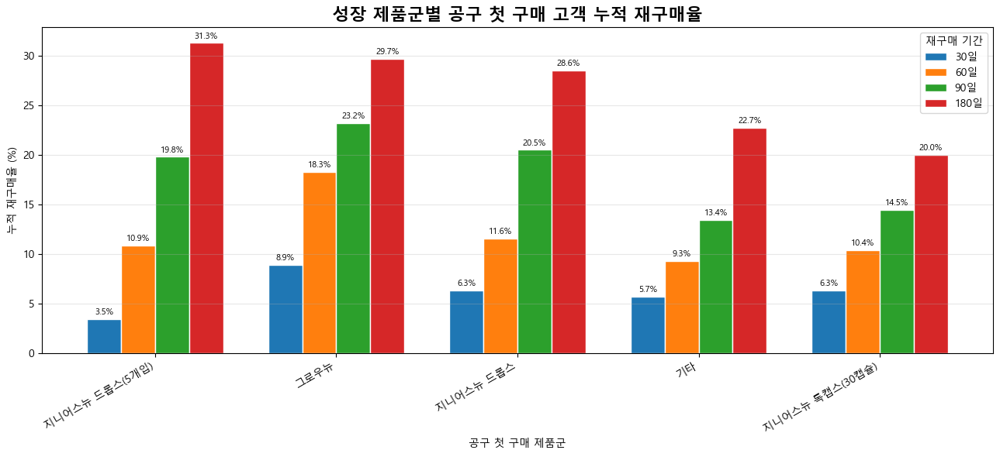


=== 180일 누적 재구매율 비교 ===


,제품군,공구 첫 구매 고객수,180일 누적 재구매율(%)
3,지니어스뉴 드롭스(5개입),2778,31.32
0,그로우뉴,1441,29.70
2,지니어스뉴 드롭스,1407,28.57
1,기타,4564,22.74
4,지니어스뉴 톡캡스(30캡슐),740,20.00


In [835]:
# ---------------------------------------------------------
# 1) 분석 대상 제품군 정의
# ---------------------------------------------------------

target_families = [
    '지니어스뉴 드롭스',
    '지니어스뉴 드롭스(5개입)',
    '지니어스뉴 톡캡스(30캡슐)',
    '지니어스뉴 톡캡스(30캡슐*3)',
    '그로우뉴'
]

repurchase_windows = [30, 60, 90, 180]


# ---------------------------------------------------------
# 2) 공구 첫 구매 고객 기준 테이블 생성
# ---------------------------------------------------------

first_gonggu_growth = (
    df_eda[
        (df_eda['channel_group'] == '공구') &
        (df_eda['receiver_key'].notna()) &
        (df_eda['sku_type'] == 'product') &
        (df_eda['결제액'] > 0)
    ]
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
    .rename(columns={
        'analysis_date': 'gonggu_first_date',
        'sku_family': 'first_sku_family',
        'sku_normalized': 'first_sku',
        'main_product_keyword': 'first_keyword',
        'goo_seller': 'first_seller',
        '브랜드_분류': 'first_brand'
    })
)

first_gonggu_growth['growth_product_group'] = np.where(
    first_gonggu_growth['first_sku_family'].isin(target_families),
    first_gonggu_growth['first_sku_family'],
    '기타'
)

print("=== 공구 첫 구매 고객 수 ===")
print(f"{first_gonggu_growth['receiver_key'].nunique():,}명")

display(first_gonggu_growth.head())


# ---------------------------------------------------------
# 3) 전체 구매 이력 연결
# ---------------------------------------------------------

purchase_history = df_eda[
    (df_eda['receiver_key'].notna()) &
    (df_eda['결제액'] > 0)
][[
    'receiver_key',
    'analysis_date',
    'channel_group',
    'sku_family',
    'sku_normalized',
    'main_product_keyword',
    '결제액'
]].copy()

purchase_history['analysis_date'] = pd.to_datetime(
    purchase_history['analysis_date']
)

retention_base_growth = first_gonggu_growth[[
    'receiver_key',
    'gonggu_first_date',
    'first_sku_family',
    'first_sku',
    'first_keyword',
    'first_seller',
    'first_brand',
    'growth_product_group'
]].merge(
    purchase_history,
    on='receiver_key',
    how='left'
)

retention_base_growth['days_since_first'] = (
    retention_base_growth['analysis_date']
    - retention_base_growth['gonggu_first_date']
).dt.days


# ---------------------------------------------------------
# 4) 누적 재구매 여부 생성
# ---------------------------------------------------------

for d in repurchase_windows:
    retention_base_growth[f'repurchase_{d}d'] = (
        (retention_base_growth['days_since_first'] > 0) &
        (retention_base_growth['days_since_first'] <= d)
    )


# ---------------------------------------------------------
# 5) 고객 단위로 압축
# ---------------------------------------------------------

repurchase_cols = [
    f'repurchase_{d}d'
    for d in repurchase_windows
]

customer_retention_growth = (
    retention_base_growth
    .groupby([
        'receiver_key',
        'first_sku_family',
        'first_sku',
        'first_keyword',
        'first_seller',
        'first_brand',
        'growth_product_group'
    ])[repurchase_cols]
    .max()
    .reset_index()
)

display(customer_retention_growth.head())


# ---------------------------------------------------------
# 6) 성장 제품군별 누적 재구매율
# ---------------------------------------------------------

growth_retention_summary = (
    customer_retention_growth
    .groupby('growth_product_group')
    .agg(
        고객수=('receiver_key', 'nunique'),
        repurchase_30d=('repurchase_30d', 'mean'),
        repurchase_60d=('repurchase_60d', 'mean'),
        repurchase_90d=('repurchase_90d', 'mean'),
        repurchase_180d=('repurchase_180d', 'mean')
    )
    .reset_index()
)

rate_cols = [
    'repurchase_30d',
    'repurchase_60d',
    'repurchase_90d',
    'repurchase_180d'
]

growth_retention_summary[rate_cols] = (
    growth_retention_summary[rate_cols] * 100
).round(2)

growth_retention_summary = growth_retention_summary.sort_values(
    'repurchase_180d',
    ascending=False
)

print("\n=== 성장 제품군별 누적 재구매율 ===")
display(growth_retention_summary)


# ---------------------------------------------------------
# 7) 시각화: 성장 제품군별 30/60/90/180일 누적 재구매율
# ---------------------------------------------------------

plot_df = (
    growth_retention_summary
    .set_index('growth_product_group')[rate_cols]
)

ax = plot_df.plot(
    kind='bar',
    figsize=(13, 6),
    width=0.75,
    color=COHORT_COLORS_LIST,
    edgecolor='white'
)

ax.set_title(
    '성장 제품군별 공구 첫 구매 고객 누적 재구매율',
    fontsize=16,
    fontweight='bold'
)

ax.set_xlabel('공구 첫 구매 제품군')
ax.set_ylabel('누적 재구매율 (%)')

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=30,
    ha='right'
)

ax.grid(axis='y', alpha=0.3)

ax.legend(
    ['30일', '60일', '90일', '180일'],
    title='재구매 기간'
)

for container in ax.containers:
    ax.bar_label(
        container,
        fmt='%.1f%%',
        fontsize=8,
        padding=2
    )

plt.tight_layout()
plt.show()


# ---------------------------------------------------------
# 8) 180일 재구매율 기준 비교용 테이블
# ---------------------------------------------------------

growth_180 = growth_retention_summary[
    [
        'growth_product_group',
        '고객수',
        'repurchase_180d'
    ]
].copy()

growth_180.columns = [
    '제품군',
    '공구 첫 구매 고객수',
    '180일 누적 재구매율(%)'
]

growth_180 = growth_180.sort_values(
    '180일 누적 재구매율(%)',
    ascending=False
)

print("\n=== 180일 누적 재구매율 비교 ===")
display(growth_180)

- 지니어스뉴 톡캡스(30캡슐)이  
3.SKU 매출 급감/신규 제품군에서는 성장률이 +721%로 엄청 좋아보였으나  
공구에서 유입된 리텐션은 20%로 낮음  
→ 많이 팔리긴 하는데 고객을 오래 남기지는 못한 것으로 보임  
→ 성장 SKU ≠ 리텐션 SKU  

<br>  

- 그로우뉴, 지니어스뉴 드롭스(5개입)는 장기 전환형 SKU  
(30일보다 180일 리텐션이 더 높기 때문)  

> - 지니어스뉴 드롭스(5개입), 그로우뉴, 지니어스뉴 드롭스는 공구 신규 고객을 가장 잘 유지시키는 SKU  
> - 지니어스뉴 톡캡스(30캡슐)은 매출 성장 제품이긴 하지만 리텐션은 상대적으로 약한 SKU  

---

### 4-7. 기간별 독립 재구매율

- 추가 분석
- 기존 누적재구매율이 아닌 기간별 재구매율 다시 확인  
(각 구간에 처음으로 재구매한 고객 비율)  

=== 공구 코호트 기간별 독립 재구매율 ===


,구간,관찰 가능 고객수,구간 내 재구매 고객수,구간 재구매율(%)
0,1~30일,10118,995,9.80
1,31~60일,9378,709,7.60
2,61~90일,8438,857,10.20
3,91~180일,6698,1374,20.50


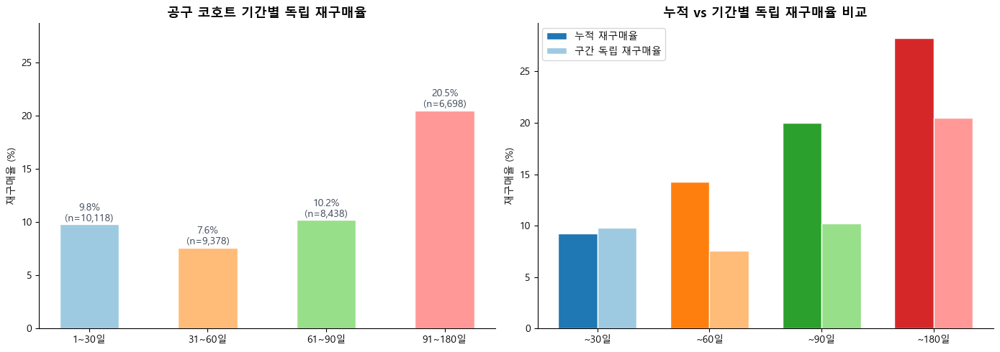

=== 성장 제품군 기간별 독립 재구매율 ===


구간,1~30일,31~60일,61~90일,91~180일
sku_family,,,,
그로우뉴,9.10,10.70,9.40,17.80
지니어스뉴 드롭스,6.60,6.20,11.50,11.40
지니어스뉴 드롭스(5개입),3.50,7.80,9.60,12.60
지니어스뉴 톡캡스(30캡슐),7.70,6.70,8.40,14.20
기타,6.10,4.30,5.00,12.00


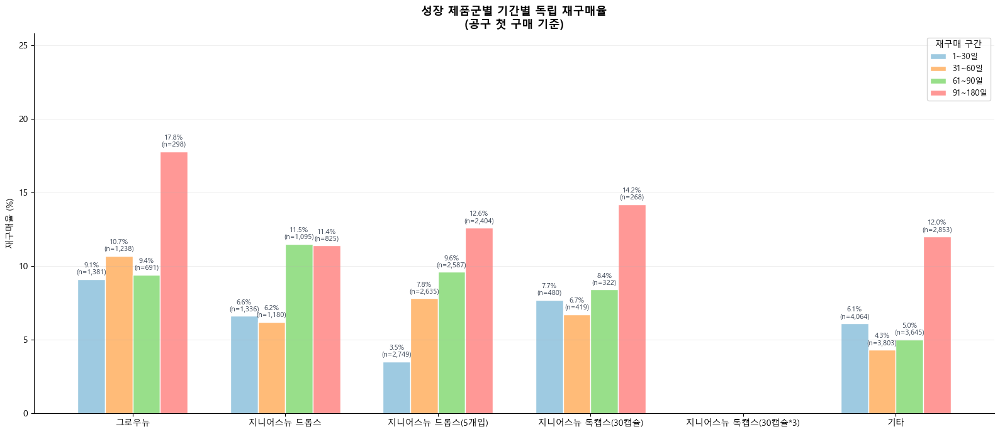

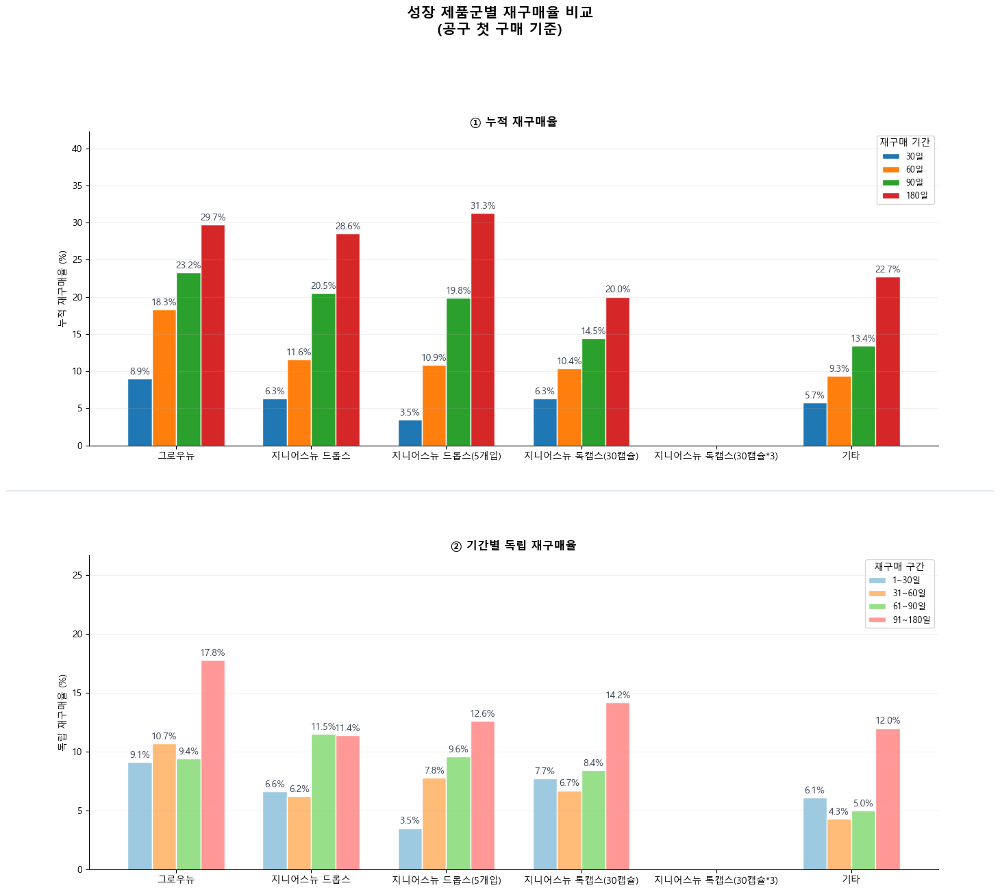

In [836]:
gonggu_first_ind = (
    gonggu_df
    .groupby('receiver_key')['analysis_date']
    .min()
    .reset_index()
    .rename(columns={'analysis_date': 'gonggu_first_date'})
)

gonggu_first_ind['gonggu_first_date'] = pd.to_datetime(
    gonggu_first_ind['gonggu_first_date']
)

retention_df_ind = (
    df_eda[df_eda['receiver_key'].notna()][[
        'receiver_key',
        'analysis_date'
    ]]
    .copy()
)

retention_df_ind['analysis_date'] = pd.to_datetime(
    retention_df_ind['analysis_date']
)

retention_df_ind = retention_df_ind.merge(
    gonggu_first_ind,
    on='receiver_key',
    how='inner'
)

retention_df_ind['days_since_first'] = (
    retention_df_ind['analysis_date']
    - retention_df_ind['gonggu_first_date']
).dt.days

# 독립 재구매율용 연한 색상 (누적재구매율보다 연한 색상)
COHORT_COLOR_LIGHT = {
    '1~30일':   '#9ecae1',   # 연파랑
    '31~60일':  '#ffbb78',   # 연주황
    '61~90일':  '#98df8a',   # 연초록
    '91~180일': '#ff9896',   # 연빨강
}
COHORT_COLORS_LIGHT_LIST = [
    COHORT_COLOR_LIGHT['1~30일'],
    COHORT_COLOR_LIGHT['31~60일'],
    COHORT_COLOR_LIGHT['61~90일'],
    COHORT_COLOR_LIGHT['91~180일'],
]

# 

windows_ind = [(1, 30), (31, 60), (61, 90), (91, 180)]
window_labels = ['1~30일', '31~60일', '61~90일', '91~180일']

results_ind = []

latest_date = df_eda['analysis_date'].max()

for start, end in windows_ind:
    cutoff = latest_date - pd.Timedelta(days=end)
    eligible = gonggu_first_ind[
        gonggu_first_ind['gonggu_first_date'] <= cutoff
    ]['receiver_key']

    sub = retention_df_ind[
        retention_df_ind['receiver_key'].isin(eligible)
    ]

    reordered = (
        sub[
            (sub['days_since_first'] >= start) &
            (sub['days_since_first'] <= end)
        ]
        .groupby('receiver_key')
        .size()
        .ge(1)
        .reset_index(name='flag')
    )

    n_elig = len(eligible)
    n_repurchase = reordered['flag'].sum() if len(reordered) else 0

    results_ind.append({
        '구간': f'{start}~{end}일',
        '관찰 가능 고객수': n_elig,
        '구간 내 재구매 고객수': n_repurchase,
        '구간 재구매율(%)': round(n_repurchase / n_elig * 100, 1) if n_elig else 0,
    })

df_ind_4 = pd.DataFrame(results_ind)

print("=== 공구 코호트 기간별 독립 재구매율 ===")
display(df_ind_4)

# 시각화
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# 왼쪽: 기간별 독립 재구매율
구간_list = ['1~30일', '31~60일', '61~90일', '91~180일']

axes[0].bar(
    df_ind_4['구간'],
    df_ind_4['구간 재구매율(%)'],
    color=COHORT_COLORS_LIGHT_LIST,
    edgecolor='white',
    width=0.5
)
for i, (val, n) in enumerate(zip(df_ind_4['구간 재구매율(%)'], df_ind_4['관찰 가능 고객수'])):
    axes[0].text(i, val + 0.3, f'{val}%\n(n={n:,})', ha='center', fontsize=10, color='#374151')

axes[0].set_title('공구 코호트 기간별 독립 재구매율', fontsize=13, fontweight='bold')
axes[0].set_ylabel('재구매율 (%)')
axes[0].set_ylim(0, df_ind_4['구간 재구매율(%)'].max() * 1.4)
axes[0].spines[['top', 'right']].set_visible(False)

# 오른쪽: 누적 vs 독립 비교
# 기존 누적 재구매율 (섹션 4에서 계산된 값 참조)
gonggu_cum_summary = (
    cohort_retention[[
        'cum_repurchase_30d',
        'cum_repurchase_60d',
        'cum_repurchase_90d',
        'cum_repurchase_180d'
    ]]
    .mean()
    * 100
)

cum_vals = [
    gonggu_cum_summary['cum_repurchase_30d'],
    gonggu_cum_summary['cum_repurchase_60d'],
    gonggu_cum_summary['cum_repurchase_90d'],
    gonggu_cum_summary['cum_repurchase_180d']
]

x = np.arange(4)
width = 0.35

axes[1].bar(
    x - width/2,
    cum_vals,
    width,
    label='누적 재구매율',
    color=COHORT_COLORS_LIST,
    edgecolor='white'
)

axes[1].bar(
    x + width/2,
    df_ind_4['구간 재구매율(%)'],
    width,
    label='구간 독립 재구매율',
    color=COHORT_COLORS_LIGHT_LIST,
    edgecolor='white'
)

axes[1].set_xticks(x)
axes[1].set_xticklabels(['~30일', '~60일', '~90일', '~180일'])
axes[1].set_title('누적 vs 기간별 독립 재구매율 비교', fontsize=13, fontweight='bold')
axes[1].set_ylabel('재구매율 (%)')
axes[1].legend()
axes[1].spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.show()

# ==========================================================
# 성장 제품군(공구 유입) 기간별 독립 재구매율
# ==========================================================

# 공구 첫 구매 SKU별 이후 재구매 구간 분석
# customer_retention_growth 재사용 (섹션 4-6에서 생성)

skus = [
    '그로우뉴',
    '지니어스뉴 드롭스',
    '지니어스뉴 드롭스(5개입)',
    '지니어스뉴 톡캡스(30캡슐)',
    '지니어스뉴 톡캡스(30캡슐*3)',
    '기타'
]

latest_date = df_eda['analysis_date'].max()

results_sku_ind = []

for sku in customer_retention_growth['growth_product_group'].unique():
    sub = customer_retention_growth[
        customer_retention_growth['growth_product_group'] == sku
    ].copy()

    # 관찰 가능 고객 필터 — gonggu_first_date 필요
    sub = sub.merge(
        first_gonggu_growth[['receiver_key', 'gonggu_first_date']],
        on='receiver_key', how='left'
    )
    sub['gonggu_first_date'] = pd.to_datetime(sub['gonggu_first_date'])

    for (start, end), label in zip(windows_ind, 구간_list):
        cutoff = latest_date - pd.Timedelta(days=end)
        eligible = sub[sub['gonggu_first_date'] <= cutoff]
        n_elig = len(eligible)

        if n_elig < 10:
            continue

        # ✅ 독립 구간 = 현재 구간 True & 이전 구간 False
        if start == 1:
            # 1~30일: repurchase_30d 그대로
            ind_flag = eligible['repurchase_30d']
        elif start == 31:
            # 31~60일: 60일 True & 30일 False
            ind_flag = eligible['repurchase_60d'] & ~eligible['repurchase_30d']
        elif start == 61:
            # 61~90일: 90일 True & 60일 False
            ind_flag = eligible['repurchase_90d'] & ~eligible['repurchase_60d']
        elif start == 91:
            # 91~180일: 180일 True & 90일 False
            ind_flag = eligible['repurchase_180d'] & ~eligible['repurchase_90d']

        n_repurchase = ind_flag.sum()

        results_sku_ind.append({
            'sku_family': sku,
            '구간': label,
            '관찰 가능 고객수': n_elig,
            '구간 재구매율(%)': round(n_repurchase / n_elig * 100, 1),
        })

df_ind_sku = pd.DataFrame(results_sku_ind)

df_ind_sku['sku_family'] = pd.Categorical(
    df_ind_sku['sku_family'],
    categories=skus,
    ordered=True
)

df_ind_sku = df_ind_sku.sort_values('sku_family')

print("=== 성장 제품군 기간별 독립 재구매율 ===")
display(
    df_ind_sku.pivot(
        index='sku_family', columns='구간',
        values='구간 재구매율(%)'
    ).reindex(columns=구간_list)
)

# ── 시각화 ────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(16, 7))

n_skus = len(skus)
n_period = len(구간_list)
width    = 0.18
x        = np.arange(n_skus)

for i, (label, color) in enumerate(zip(구간_list, COHORT_COLORS_LIGHT_LIST)):
    vals, ns = [], []
    for sku in skus:
        row = df_ind_sku[
            (df_ind_sku['sku_family'] == sku) &
            (df_ind_sku['구간'] == label)
        ]
        vals.append(row['구간 재구매율(%)'].iloc[0] if len(row) else 0)
        ns.append(int(row['관찰 가능 고객수'].iloc[0]) if len(row) else 0)

    offset = (i - n_period / 2) * width + width / 2
    bars = ax.bar(x + offset, vals, width,
                  label=label, color=color, edgecolor='white')

    for bar, val, n in zip(bars, vals, ns):
        if val >= 1:
            ax.text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.2,
                f'{val:.1f}%\n(n={n:,})',
                ha='center', va='bottom',
                fontsize=8, color='#374151',
                linespacing=0.9,
            )

ax.set_xticks(x)
ax.set_xticklabels(skus, rotation=0, ha='center', fontsize=10)
ax.set_title('성장 제품군별 기간별 독립 재구매율\n(공구 첫 구매 기준)',
             fontsize=13, fontweight='bold')
ax.set_ylabel('재구매율 (%)')
ax.set_ylim(0, df_ind_sku['구간 재구매율(%)'].max() * 1.45)
ax.legend(title='재구매 구간', loc='upper right', fontsize=9)
ax.spines[['top', 'right']].set_visible(False)
ax.grid(axis='y', alpha=0.2)
plt.tight_layout()
plt.show()

# ==========================================================
# 성장 제품군 누적 vs 독립 재구매율 통합 시각화
# ==========================================================
skus = [
    '그로우뉴',
    '지니어스뉴 드롭스',
    '지니어스뉴 드롭스(5개입)',
    '지니어스뉴 톡캡스(30캡슐)',
    '지니어스뉴 톡캡스(30캡슐*3)',
    '기타'
]
growth_retention_summary = growth_retention_summary.set_index(
    'growth_product_group'
).reindex(skus).reset_index()

df_ind_sku['sku_family'] = pd.Categorical(
    df_ind_sku['sku_family'],
    categories=skus,
    ordered=True
)

df_ind_sku = df_ind_sku.sort_values('sku_family')

n_skus = len(skus)

# ✅ 미리 딕셔너리로 변환 — 루프 안 필터링 제거
ind_dict = {}
for _, row in df_ind_sku.iterrows():
    key = (row['sku_family'], row['구간'])
    ind_dict[key] = {
        '구간 재구매율(%)': row['구간 재구매율(%)'],
        '관찰 가능 고객수': int(row['관찰 가능 고객수']),
    }

fig, axes = plt.subplots(
    2,
    1,
    figsize=(16, 14),
    gridspec_kw={'hspace': 0.35}
)

fig.suptitle('성장 제품군별 재구매율 비교\n(공구 첫 구매 기준)',
             fontsize=15, fontweight='bold', y=1.01)

# ── 위: 누적 재구매율 ──────────────────────────────────────
x = np.arange(n_skus)
width = 0.18
n_period = 4

cum_data = {
    '30일':  [growth_retention_summary[growth_retention_summary['growth_product_group'] == s]['repurchase_30d'].values[0] for s in skus],
    '60일':  [growth_retention_summary[growth_retention_summary['growth_product_group'] == s]['repurchase_60d'].values[0] for s in skus],
    '90일':  [growth_retention_summary[growth_retention_summary['growth_product_group'] == s]['repurchase_90d'].values[0] for s in skus],
    '180일': [growth_retention_summary[growth_retention_summary['growth_product_group'] == s]['repurchase_180d'].values[0] for s in skus],
}

for i, (label, color) in enumerate(zip(['30일','60일','90일','180일'], COHORT_COLORS_LIST)):
    vals = cum_data[label]
    offset = (i - n_period / 2) * width + width / 2
    bars = axes[0].bar(x + offset, vals, width,
                       label=label, color=color, edgecolor='white')
    for bar, val in zip(bars, vals):
        if val >= 1:
            axes[0].text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.3,
                f'{val:.1f}%',
                ha='center', va='bottom', fontsize=10, color='#374151'
            )

axes[0].set_xticks(x)
axes[0].set_xticklabels(skus, rotation=0, ha='center', fontsize=10)
axes[0].set_title('① 누적 재구매율', fontsize=12, fontweight='bold')
axes[0].set_ylabel('누적 재구매율 (%)')
axes[0].set_ylim(0, max(cum_data['180일']) * 1.35)
axes[0].legend(title='재구매 기간', loc='upper right', fontsize=9)
axes[0].spines[['top', 'right']].set_visible(False)
axes[0].grid(axis='y', alpha=0.2)

# ── 아래: 기간별 독립 재구매율 ───────────────────────────
for i, (label, color) in enumerate(zip(구간_list, COHORT_COLORS_LIGHT_LIST)):
    vals, ns = [], []
    for sku in skus:
        row = df_ind_sku[
            (df_ind_sku['sku_family'] == sku) &
            (df_ind_sku['구간'] == label)
        ]
        vals.append(row['구간 재구매율(%)'].iloc[0] if len(row) else 0)
        ns.append(int(row['관찰 가능 고객수'].iloc[0]) if len(row) else 0)

    offset = (i - n_period / 2) * width + width / 2
    bars = axes[1].bar(x + offset, vals, width,
                       label=label, color=color, edgecolor='white')

    for bar, val, n in zip(bars, vals, ns):
        if val >= 1:
            axes[1].text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.2,
                f'{val:.1f}%',
                ha='center', va='bottom',
                fontsize=10, color='#374151',
                linespacing=0.9,
            )

axes[1].set_xticks(x)
axes[1].set_xticklabels(skus, rotation=0, ha='center', fontsize=10)
axes[1].set_title('② 기간별 독립 재구매율', fontsize=12, fontweight='bold')
axes[1].set_ylabel('독립 재구매율 (%)')
axes[1].set_ylim(0, df_ind_sku['구간 재구매율(%)'].max() * 1.5)
axes[1].legend(title='재구매 구간', loc='upper right', fontsize=9)
axes[1].spines[['top', 'right']].set_visible(False)
axes[1].grid(axis='y', alpha=0.2)

# 두 그래프 사이 구분선
fig.add_artist(plt.Line2D(
    [0.05, 0.95], [0.505, 0.505],
    transform=fig.transFigure,
    color='#E2E8F0', linewidth=1.5,
))

plt.tight_layout()
plt.show()

- 공구 기간별 독립 재구매율 W자형  
    - 기업에서 공구를 90일 주기에 맞춰 진행한다고 했는데  
    - 91~180일에 재구매가 집중되는 패턴이 수치로도 확인 됨  
    - 즉, 고객 소비 주기가 자연스럽게 3~6개월임을 보여 줌  
<br>  

- 성장 제품군 기간별 독립 재구매율  
    - 그로우뉴 : 고르게 높음 / 장기적 구매 강함  
    - 지니어스뉴 드롭스 : 61~90일 피크  
    - 지니어스뉴 드롭스(5개입) : 후기 우상향  
    - 지니어스뉴 톡캡스(30캡슐) : W자형 / 장기적 구매 강함  
    - 기타 : 91 ~ 180일에만 반응  

---

## 5. 공구 → 자사몰 전환 고객 프로파일링

(우성님 분석 방향 반영)  

- 고도몰, 스마트스토어를 통합한 자사몰 기준으로 분석 진행  

"어떤 셀러가 자사몰 전환을 잘 만드는가?"  
"어떤 SKU가 자사몰 전환을 잘 만드는가?"  
"전환 고객은 공구에서 무엇을 사고 자사몰에서 무엇을 사는가?"  

In [837]:
# =========================================================
# 공구 첫 구매 고객 기준 테이블
# 전체 공구 고객 기준
# =========================================================

gonggu_first = (
    df_eda[
        (df_eda['channel_group'] == '공구') &
        (df_eda['receiver_key'].notna())
    ]
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
    .rename(columns={
        'analysis_date': 'gonggu_first_date',
        '브랜드_분류': 'gonggu_first_brand',
        '품명': 'gonggu_first_product',
        '품번': 'gonggu_first_sku',
        'goo_seller': 'gonggu_first_seller',
        '결제액': 'gonggu_first_pay',
        '주문수량': 'gonggu_first_qty'
    })
)



# =========================================================
# 기본 세팅
# =========================================================

owned_channels = ['자사몰', '자사몰_N']
gonggu_channel = '공구'

# 공구 첫 구매 고객 기준 테이블

# 전체 구매 이력
purchase_history = df_eda[df_eda['receiver_key'].notna()][[
    'receiver_key',
    'analysis_date',
    'channel_group',
    '브랜드_분류',
    '품명',
    '품번',
    'goo_seller',
    '결제액',
    '주문수량'
]].copy()



# =========================================================
# 공구 고객의 자사몰 전환 여부 생성
# =========================================================

owned_purchase = purchase_history[
    purchase_history['channel_group'].isin(owned_channels)
].copy()

convert_check = gonggu_first.merge(
    owned_purchase[['receiver_key', 'analysis_date']],
    on='receiver_key',
    how='left'
)

convert_check['converted'] = (
    convert_check['analysis_date'] > convert_check['gonggu_first_date']
)

convert_flag = (
    convert_check
    .groupby('receiver_key')['converted']
    .max()
    .reset_index()
)

gonggu_customer_base = gonggu_first.merge(
    convert_flag,
    on='receiver_key',
    how='left'
)

gonggu_customer_base['converted'] = gonggu_customer_base['converted'].fillna(False)

print("공구 고객 수:", gonggu_customer_base['receiver_key'].nunique())
print("자사몰 전환 고객 수:", gonggu_customer_base['converted'].sum())
print("전환율:", gonggu_customer_base['converted'].mean())



# =========================================================
# 전환 고객 / 미전환 고객 분리
# =========================================================

converted_customers = gonggu_customer_base[
    gonggu_customer_base['converted'] == True
].copy()

nonconverted_customers = gonggu_customer_base[
    gonggu_customer_base['converted'] == False
].copy()

print("전환 고객:", converted_customers['receiver_key'].nunique())
print("미전환 고객:", nonconverted_customers['receiver_key'].nunique())



# =========================================================
# 공구 재구매 여부 생성
# =========================================================

gonggu_purchase = purchase_history[
    purchase_history['channel_group'] == gonggu_channel
].copy()

gonggu_repurchase_check = (
    gonggu_purchase
    .merge(
        gonggu_first[['receiver_key', 'gonggu_first_date']],
        on='receiver_key',
        how='left'
    )
)

# 첫 공구 구매 이후 다시 공구 구매했는지
gonggu_repurchase_check['gonggu_repurchase'] = (
    gonggu_repurchase_check['analysis_date']
    > gonggu_repurchase_check['gonggu_first_date']
)

gonggu_repurchase_flag = (
    gonggu_repurchase_check
    .groupby('receiver_key')['gonggu_repurchase']
    .max()
    .reset_index()
)

print("공구 재구매 여부 생성 완료")
display(gonggu_repurchase_flag.head())



# =========================================================
# 전환 고객 프로필 요약
# =========================================================

# 공구 첫 구매 정보 붙이기
first_gonggu_info = (
    purchase_history[purchase_history['channel_group'] == gonggu_channel]
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
    [[
        'receiver_key',
        'analysis_date',
        '브랜드_분류',
        '품명',
        '품번',
        'goo_seller',
        '결제액',
        '주문수량'
    ]]
    .rename(columns={
    'analysis_date': 'gonggu_first_date',
    '브랜드_분류': 'gonggu_first_brand',
    '품명': 'gonggu_first_product',
    '품번': 'gonggu_first_sku',
    'goo_seller': 'gonggu_first_seller',
    '결제액': 'gonggu_first_pay',
    '주문수량': 'gonggu_first_qty'
})
)

# 첫 자사몰 전환 정보
first_owned_info = (
    owned_purchase
    .merge(
        gonggu_first[['receiver_key', 'gonggu_first_date']],
        on='receiver_key',
        how='inner'
    )
)

first_owned_info = first_owned_info[
    first_owned_info['analysis_date'] > first_owned_info['gonggu_first_date']
]

first_owned_info = (
    first_owned_info
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
    [[
        'receiver_key',
        'analysis_date',
        'channel_group',
        '브랜드_분류',
        '품명',
        '품번',
        '결제액'
    ]]
    .rename(columns={
        'analysis_date': 'first_owned_date',
        'channel_group': 'first_owned_channel',
        '브랜드_분류': 'first_owned_brand',
        '품명': 'first_owned_product',
        '품번': 'first_owned_sku',
        '결제액': 'first_owned_pay'
    })
)

converted_profile = (
    converted_customers
    .merge(
        first_gonggu_info.drop(columns=['gonggu_first_date'], errors='ignore'),
        on='receiver_key',
        how='left'
    )
    .merge(first_owned_info, on='receiver_key', how='left')
    .merge(gonggu_repurchase_flag, on='receiver_key', how='left')
)

converted_profile['gonggu_repurchase'] = (
    converted_profile['gonggu_repurchase'].fillna(False)
)

converted_profile['days_to_owned'] = (
    converted_profile['first_owned_date'] -
    converted_profile['gonggu_first_date']
).dt.days

print("\n공구 → 자사몰 전환 고객 (미리보기):")
display(converted_profile.head())



# =========================================================
# 전환 고객 요약
# =========================================================

converted_summary = pd.DataFrame({
    '지표': [
        '전환 고객 수',
        '전환 소요일 평균',
        '전환 소요일 중앙값',
        '30일 이내 전환',
        '60일 이내 전환',
        '90일 이내 전환',
        '180일 이내 전환'
    ],
    '값': [
        converted_profile['receiver_key'].nunique(),
        converted_profile['days_to_owned'].mean(),
        converted_profile['days_to_owned'].median(),
        (converted_profile['days_to_owned'] <= 30).sum(),
        (converted_profile['days_to_owned'] <= 60).sum(),
        (converted_profile['days_to_owned'] <= 90).sum(),
        (converted_profile['days_to_owned'] <= 180).sum()
    ]
})

print("공구 → 자사몰 전환 고객 요약:")
display(converted_summary)


# =========================================================
# 셀러별 공구 → 자사몰 전환 여부 생성
# =========================================================

owned_channels = ['자사몰', '자사몰_N']

owned_purchase = df_eda[
    df_eda['channel_group'].isin(owned_channels)
].copy()

convert_check = gonggu_first.merge(
    owned_purchase[['receiver_key', 'analysis_date']],
    on='receiver_key',
    how='left'
)

convert_check['converted'] = (
    convert_check['analysis_date']
    > convert_check['gonggu_first_date']
)

# 고객별 전환 여부
customer_conversion = (
    convert_check
    .groupby('receiver_key')['converted']
    .max()
    .reset_index()
)

# 공구 첫 구매 정보와 연결
seller_conversion = gonggu_first.merge(
    customer_conversion,
    on='receiver_key',
    how='left'
)

seller_conversion['converted'] = (
    seller_conversion['converted']
    .fillna(False)
)

# =========================================================
# 셀러별 전환율
# =========================================================

seller_summary = (
    seller_conversion
    .groupby('gonggu_first_seller')
    .agg(
        공구유입고객=('receiver_key', 'nunique'),
        전환고객=('converted', 'sum')
    )
    .reset_index()
)

seller_summary['전환율(%)'] = (
    seller_summary['전환고객']
    / seller_summary['공구유입고객']
    * 100
).round(2)

seller_summary = seller_summary.sort_values(
    '전환율(%)',
    ascending=False
)

display(seller_summary.head(30))

공구 고객 수: 11039
자사몰 전환 고객 수: 930
전환율: 0.0842467614820183
전환 고객: 930
미전환 고객: 10109
공구 재구매 여부 생성 완료


,receiver_key,gonggu_repurchase
0,0010dd8a4de8bc72,True
1,0013aeca1693802c,False
2,00171a5603973e36,False
3,00172f2ec8bbafb6,False
4,0018ece276a20f87,True



공구 → 자사몰 전환 고객 (미리보기):


,receiver_key,주문시간,판매처명,배송번호,판매처주문번호,주문번호,주문구분,교환,판매형태,브랜드,...,gonggu_first_pay_y,gonggu_first_qty_y,first_owned_date,first_owned_channel,first_owned_brand,first_owned_product,first_owned_sku,first_owned_pay,gonggu_repurchase,days_to_owned
0,0010dd8a4de8bc72,NaT,[공동구매]투하맘,598481546113,20250723-0000978-01,Z20250723907091,주문,None,정상,파이토뉴트리,...,23800,2,2025-09-26,자사몰_N,그로우랩,(GIFT)그로우랩 성장가이드(데이프로바),K1077016,0,True,65
1,010a7ee5f5ec19c1,NaT,[공동구매]애프리,598482704683,20250725-0004542,Z20250728172064,주문,None,정상,파이토뉴트리,...,0,1,2025-09-30,자사몰_N,그로우랩,(GIFT)그로우랩 성장가이드(그로우뉴),K1077009,0,True,64
2,010e1a40f4ecb0fa,NaT,[공동구매]바이르미,598455195070,NRI50501-63154037,Z20250502417421,주문,None,정상,혜인서,...,29583,1,2025-06-01,자사몰_N,혜인서,185 커큐민+,P2011121,58800,False,30
3,010f1cc8d9e028a6,NaT,[공동구매]두둥맘,598432512675,20250219-0002063,Z20250220650963,주문,None,정상,파이토뉴트리,...,0,1,2025-12-10,자사몰_N,그로우랩,(GIFT)그로우랩 메세지카드,K1077004,0,True,293
4,01407b3aff902875,NaT,[공동구매]두둥맘,598432880912,20250220-0001221,Z20250221718047,주문,None,정상,파이토뉴트리,...,0,1,2026-02-11,자사몰,파이토뉴트리,(SET)스포이드 (5개입),K1077005,0,False,355


공구 → 자사몰 전환 고객 요약:


,지표,값
0,전환 고객 수,930.00
1,전환 소요일 평균,112.96
2,전환 소요일 중앙값,92.50
3,30일 이내 전환,126.00
4,60일 이내 전환,295.00
5,90일 이내 전환,456.00
6,180일 이내 전환,759.00


,gonggu_first_seller,공구유입고객,전환고객,전환율(%)
22,시앙제이,1,1,100.00
40,큐닷,1,1,100.00
27,열무맘,55,18,32.73
0,?마미,7,2,28.57
31,율윤이네,23,6,26.09
42,해모비X그로우랩,4,1,25.00
3,꼬미맘,66,15,22.73
10,또비앙,139,27,19.42
5,누누맘,91,17,18.68
15,모찌맘,445,81,18.20


- 브랜드 전환형 셀러 : 열무맘 (32.7%), 꼬미맘 (22.7%), 또비앙 (19.4%), 모찌맘 (18.2%)  
    - 공구에서 끝나는 게 아니라 이후 자사몰로 이어짐  
    - 이런 셀러는 콘텐츠 신뢰도, 제품 설명력, 고객 교육력이 강할 가능성이 큼  

<br>  

- 대형 유입형 셀러 : 두둥맘 (2125명 / 11.4%),  뚜미니네 (3585명 / 6.4%), 애프리 (982명 / 9.1%), 강산들 (753명 / 6.1%)  
    - 유입 규모는 압도적이지만, 자사몰 전환은 낮음  
    - Retention은 높은데, 브랜드 정착은 약함  

<br>  

- 공구 루프형 셀러 : 3번에서 분석한 두둥맘이 여기에 가까움  
    - 공구 재구매 높고, 같은 SKU 반복 높고, 재구매 속도는 소진형(1~3개월)이지만 자사몰 전환은 낮음  

<br>  

> - 전환율 높은 셀러 ≠ 유입 규모 큰 셀러  
> 
> ➡️ 전환 고객 SKU 분석    
> ➡️ 셀러별 전환 속도  
> ➡️ 자사몰 첫 구매 상품 분석  
> ➡️ 브랜드 유지율  

SKU 전환 고객 수 (미리보기):


,gonggu_first_product,gonggu_first_brand,전환고객수,전체유입고객,SKU전환율(%)
13,지니어스뉴 톡캡스(10캡슐),그로우랩,8,34,23.53
18,투데이디3 오일(30캡슐x390캡슐),파이토뉴트리,35,214,16.36
17,투데이디3 오일(30캡슐),파이토뉴트리,76,554,13.72
2,그로우뉴(단종),그로우랩,8,67,11.94
21,투데이디3 오일밤(30캡슐x390캡슐),파이토뉴트리,35,301,11.63
7,스포이드,파이토뉴트리,78,674,11.57
20,투데이디3 오일밤(30캡슐),파이토뉴트리,84,819,10.26
12,지니어스뉴 드롭스(5개입),그로우랩,145,1500,9.67
8,스포이드 (5개입),파이토뉴트리,128,1401,9.14
11,지니어스뉴 드롭스,그로우랩,62,728,8.52


셀러별 전환 속도 (미리보기):


,gonggu_first_seller,전환고객수,평균전환일,중앙값전환일
1,강산들,22,51.80,37.00
19,애프리,50,89.90,74.00
10,또비앙,20,118.60,95.50
9,두둥맘,180,134.10,106.00
14,모찌맘,60,135.40,129.00
11,뚜미니네,173,152.00,133.00


전환 고객 자사몰 첫 구매 상품 (미리보기):


,sku_normalized,브랜드_분류,고객수,매출
8,지니어스뉴 드롭스,그로우랩,35,1094810
7,이트뮨 배도라지주스(box),파이토뉴트리,28,1326855
9,지니어스뉴 드롭스(5개입),그로우랩,25,2687960
3,그로우뉴K2,그로우랩,18,1388200
2,그로우뉴(단종),그로우랩,14,835682
17,투데이디3 오일밤(30캡슐),파이토뉴트리,10,551380
14,투데이디3 오일(30캡슐),파이토뉴트리,8,626100
4,데이프로바,그로우랩,3,278600
13,지니어스뉴 톡캡스(30캡슐),그로우랩,2,238100
16,투데이디3 오일밤(10캡슐),파이토뉴트리,2,57600


브랜드 유지율: 52.61%


,gonggu_first_seller,gonggu_first_brand,공구유입고객,전환고객,전환율(%)
39,시앙제이,혜인서,1,1,100.00
67,큐닷,파이토뉴트리,1,1,100.00
1,?마미,파이토뉴트리,2,1,50.00
6,꼬미맘,파이토뉴트리,36,12,33.33
48,열무맘,파이토뉴트리,21,7,33.33
47,열무맘,그로우랩,34,11,32.35
55,율윤이네,그로우랩,22,6,27.27
10,누누맘,파이토뉴트리,30,8,26.67
70,해모비X그로우랩,그로우랩,4,1,25.00
18,또비앙,그로우랩,85,21,24.71


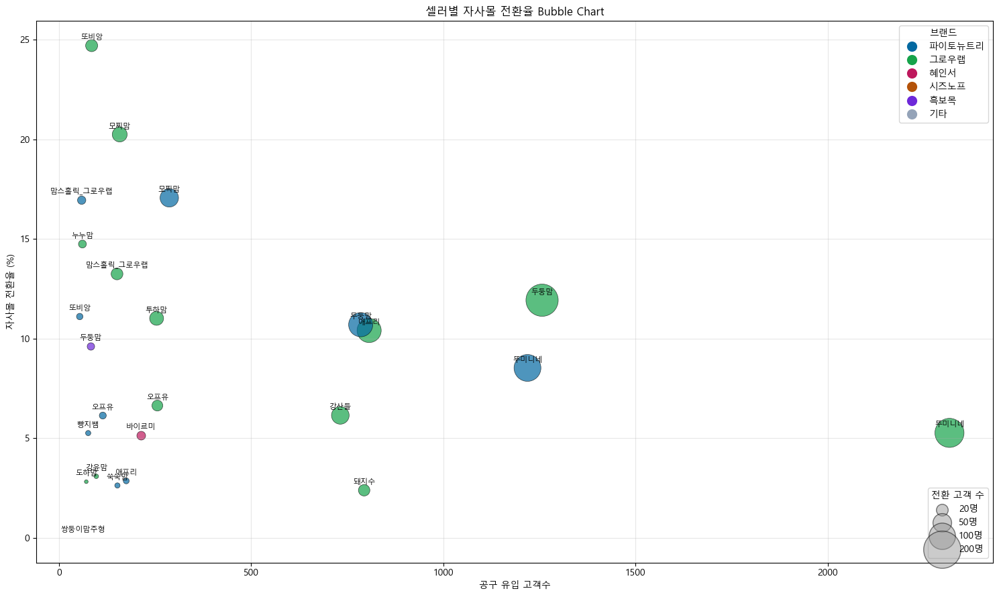

In [838]:
gonggu_first = (
    df_eda[
        (df_eda['channel_group'] == '공구') &
        (df_eda['receiver_key'].notna()) &
        (df_eda['sku_tag'] == 'SET')
    ]
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
    .rename(columns={
        'analysis_date': 'gonggu_first_date',
        '브랜드_분류': 'gonggu_first_brand',
        'sku_normalized': 'gonggu_first_product',
        '품번': 'gonggu_first_sku',
        'goo_seller': 'gonggu_first_seller'
    })
)

# =========================================================
# 전환 고객 정의
# =========================================================

converted_customers = (
    gonggu_customer_base[
        gonggu_customer_base['converted']
    ]['receiver_key']
    .unique()
)

# =========================================================
# 전환 고객의 공구 첫 구매 SKU
# =========================================================

converted_sku = gonggu_first[
    gonggu_first['receiver_key'].isin(converted_customers)
].copy()

# =========================================================
# SKU별 전환 고객 수
# =========================================================

sku_conversion = (
    converted_sku
    .groupby(
        [
            'gonggu_first_product',
            'gonggu_first_brand'
        ]
    )
    .agg(
        전환고객수=('receiver_key', 'nunique')
    )
    .reset_index()
)

# 전체 유입 고객 수 연결
total_sku_customer = (
    gonggu_first
    .groupby('gonggu_first_product')
    .agg(
        전체유입고객=('receiver_key', 'nunique')
    )
    .reset_index()
)

sku_conversion = sku_conversion.merge(
    total_sku_customer,
    on='gonggu_first_product',
    how='left'
)

# SKU 전환율
sku_conversion['SKU전환율(%)'] = (
    sku_conversion['전환고객수']
    / sku_conversion['전체유입고객']
    * 100
).round(2)

# 최소 고객수 필터 추천
sku_conversion = sku_conversion[
    sku_conversion['전체유입고객'] >= 30
]

sku_conversion = sku_conversion.sort_values(
    'SKU전환율(%)',
    ascending=False
)

print("SKU 전환 고객 수 (미리보기):")
display(sku_conversion.head(30))


# =========================================================
# 자사몰 첫 구매일
# =========================================================

first_owned = (
    owned_purchase
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
)

first_owned = first_owned.rename(columns={
    'analysis_date': 'owned_first_date'
})

# =========================================================
# 공구 첫 구매와 연결
# =========================================================

speed_df = gonggu_first.merge(
    first_owned[
        [
            'receiver_key',
            'owned_first_date'
        ]
    ],
    on='receiver_key',
    how='inner'
)

# 전환 소요일
speed_df['convert_days'] = (
    speed_df['owned_first_date']
    - speed_df['gonggu_first_date']
).dt.days

# 공구 이후 구매만
speed_df = speed_df[
    speed_df['convert_days'] > 0
]

# =========================================================
# 셀러별 전환 속도
# =========================================================

seller_speed = (
    speed_df
    .groupby('gonggu_first_seller')
    .agg(
        전환고객수=('receiver_key', 'nunique'),
        평균전환일=('convert_days', 'mean'),
        중앙값전환일=('convert_days', 'median')
    )
    .reset_index()
)

seller_speed['평균전환일'] = (
    seller_speed['평균전환일']
    .round(1)
)

seller_speed = seller_speed[
    seller_speed['전환고객수'] >= 20
]

seller_speed = seller_speed.sort_values(
    '중앙값전환일'
)

print("셀러별 전환 속도 (미리보기):")
display(seller_speed.head(30))


# =========================================================
# 전환 고객 자사몰 첫 구매 상품
# =========================================================

owned_first_product = first_owned[
    first_owned['receiver_key'].isin(converted_customers)
].copy()

# =========================================================
# 자사몰 첫 구매 SKU 분석
# =========================================================

# 자사몰 첫 구매 상품 정제
owned_first_product_clean = owned_first_product[
    (owned_first_product['결제액'] > 0) &
    (owned_first_product['sku_tag'] == 'SET') &
    (~owned_first_product['sku_normalized'].astype(str).str.contains(
        '카드|메시지|오프너|샘플|가이드',
        na=False
    ))
].copy()

owned_sku_summary = (
    owned_first_product_clean
    .groupby(
        [
            'sku_normalized',
            '브랜드_분류'
        ]
    )
    .agg(
        고객수=('receiver_key', 'nunique'),
        매출=('결제액', 'sum')
    )
    .reset_index()
)

owned_sku_summary = owned_sku_summary.sort_values(
    '고객수',
    ascending=False
)

print("전환 고객 자사몰 첫 구매 상품 (미리보기):")
display(owned_sku_summary.head(30))


# =========================================================
# 공구 첫 브랜드
# =========================================================

gonggu_brand = gonggu_first[
    [
        'receiver_key',
        'gonggu_first_brand'
    ]
]

# =========================================================
# 자사몰 첫 브랜드
# =========================================================

owned_brand = first_owned[
    [
        'receiver_key',
        '브랜드_분류'
    ]
].rename(columns={
    '브랜드_분류': 'owned_first_brand'
})

# =========================================================
# 브랜드 비교
# =========================================================

brand_compare = gonggu_brand.merge(
    owned_brand,
    on='receiver_key',
    how='inner'
)

brand_compare['brand_retained'] = (
    brand_compare['gonggu_first_brand']
    ==
    brand_compare['owned_first_brand']
)

# =========================================================
# 브랜드 유지율
# =========================================================

brand_retention = (
    brand_compare['brand_retained']
    .mean()
)

print(f'브랜드 유지율: {brand_retention:.2%}')


# =========================================================
# 셀러 × 브랜드별 자사몰 전환율 요약
# =========================================================

seller_summary = (
    seller_conversion
    .groupby([
        'gonggu_first_seller',
        'gonggu_first_brand'
    ])
    .agg(
        공구유입고객=('receiver_key', 'nunique'),
        전환고객=('converted', 'sum')
    )
    .reset_index()
)

# 전환율(%) 생성
seller_summary['전환율(%)'] = (
    seller_summary['전환고객']
    / seller_summary['공구유입고객']
    * 100
).round(2)

display(
    seller_summary
    .sort_values('전환율(%)', ascending=False)
    .head(30)
)



# =========================================================
# 셀러별 자사몰 전환율 시각화
# =========================================================

from matplotlib.lines import Line2D

plot_df = seller_summary.copy()

# 최소 유입 고객수 필터 추천
plot_df = plot_df[
    plot_df['공구유입고객'] >= 50
].copy()

# 전환 고객 수 계산
plot_df['미전환고객'] = (
    plot_df['공구유입고객']
    - plot_df['전환고객']
)

# -------------------------------------------------
# Bubble Chart
# x: 공구 유입 고객수
# y: 자사몰 전환율
# size: 전환 고객 수
# -------------------------------------------------

plt.figure(figsize=(15, 9))

for brand in plot_df['gonggu_first_brand'].dropna().unique():

    sub = plot_df[
        plot_df['gonggu_first_brand'] == brand
    ]

    plt.scatter(
        sub['공구유입고객'],
        sub['전환율(%)'],

        s=sub['전환고객'] * 8,

        alpha=0.7,

        color=BRAND_COLOR.get(brand, '#999999'),

        edgecolors='black',
        linewidth=0.5
    )

    # 셀러명 표시
    for _, row in sub.iterrows():

        plt.text(
            row['공구유입고객'],
            row['전환율(%)'] + 0.3,
            row['gonggu_first_seller'],
            fontsize=8,
            ha='center'
        )

# -------------------------------------------------
# 브랜드 범례
# -------------------------------------------------

brand_handles = [
    Line2D(
        [0], [0],
        marker='o',
        color='w',
        label=brand,
        markerfacecolor=color,
        markersize=12
    )
    for brand, color in BRAND_COLOR.items()
]

legend1 = plt.legend(
    handles=brand_handles,
    title='브랜드',
    loc='upper right'
)

plt.gca().add_artist(legend1)

# -------------------------------------------------
# 버블 크기 범례
# -------------------------------------------------

size_levels = [20, 50, 100, 200]

size_handles = [
    plt.scatter(
        [],
        [],
        s=size * 8,
        color='#999999',
        alpha=0.5,
        edgecolors='black'
    )
    for size in size_levels
]

plt.legend(
    size_handles,
    [f'{s}명' for s in size_levels],
    title='전환 고객 수',
    loc='lower right'
)

# -------------------------------------------------
# 스타일
# -------------------------------------------------

plt.title('셀러별 자사몰 전환율 Bubble Chart')

plt.xlabel('공구 유입 고객수')
plt.ylabel('자사몰 전환율 (%)')

plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

- “어떤 첫 공구 상품이 자사몰 전환을 잘 만드는가?”  
    - **체험형 SKU가 전환율이 높은 것으로 보임**  
    독캡스(10캡슐), D3 오일 등은 체험형 / 소용량 성격으로 유추되어  
    공구에서 써본 뒤 자사몰로 넘어가는 구조일 것으로 추측  
    - **데이프로바는 전환 매우 약함 (전환율 1.48%)**  
    - **전환율 높은 SKU**  

| SKU                  | 전환율   |
| -------------------- | ----- |
| 지니어스뉴 독캡스(10캡슐)      | 23.5% |
| 투데이D3 오일(30캡슐x390캡슐) | 16.4% |
| 투데이D3 오일(30캡슐)       | 13.7% |
| 그로우뉴(단종)             | 11.9% |
| 스포이드                 | 11.6% |

<br>  

- 셀러별 전환 속도  
    - 셀러마다 고객 intent가 다름  
    셀러는 단순 판매채널이 아니라, 고객 acquisition source 자체임  
        - 강산들 : 빠르게 자사몰 이동 / 브랜드 관심 기반 유입 가능성 있음  
        - 두둥맘/또미네 : 공구 루프 소비 / 자사몰 이동 느림  
    - 두둥맘은 retention은 강하지만 conversion은 느림  
    (두둥맘 고객은 브랜드 충성보다 “공구 구매 습관” 충성 가능성)  

| 셀러  | 평균전환일 | 중앙값  |
| --- | ----- | ---- |
| 강산들 | 51일   | 37일  |
| 애프리 | 89일   | 74일  |
| 두둥맘 | 134일  | 106일 |
| 또미네 | 152일  | 133일 |

<br>  

- “자사몰에 들어와서 실제 돈 쓰는 상품이 무엇인가?”  
    - 전환 고객은 “리필형 SKU”로 들어옴  
    - 공구에서 브랜드 처음 경험하고, 자사몰에서 생활 루틴화로 구매되는 구조로 볼 수 있음  
    - 공구는 acquisition funnel 상단, 자사몰은 subscription/retention funnel 역할  
    - 배도라지주스를 공구에서 체험형으로 받았던 것을 자사몰에서 BOX 상품으로 구매 함  

---

### 5-1. 미전환 고객 프로파일링

(우성님 분석 방향 반영)  

In [839]:
# =========================================================
# 미전환 고객 프로필 요약
# =========================================================

nonconverted_profile = (
    nonconverted_customers
    .merge(first_gonggu_info, on='receiver_key', how='left')
)

# 공구 재구매 여부
gonggu_repurchase = (
    purchase_history[purchase_history['channel_group'] == gonggu_channel]
    .merge(gonggu_first, on='receiver_key', how='inner')
)

gonggu_repurchase['after_first_gonggu'] = (
    gonggu_repurchase['analysis_date'] > gonggu_repurchase['gonggu_first_date']
)

gonggu_repurchase_flag = (
    gonggu_repurchase
    .groupby('receiver_key')['after_first_gonggu']
    .max()
    .reset_index()
    .rename(columns={'after_first_gonggu': 'gonggu_repurchase'})
)

nonconverted_profile = (
    nonconverted_customers
    .merge(first_gonggu_info, on='receiver_key', how='left')
    .merge(gonggu_repurchase_flag, on='receiver_key', how='left')
)

nonconverted_profile['gonggu_repurchase'] = (
    nonconverted_profile['gonggu_repurchase'].fillna(False)
)

print("공구 → 자사몰 미전환 고객 (미리보기):")
display(nonconverted_profile.head())



# =========================================================
# 전환 vs 미전환 비교
# =========================================================

compare_profile = pd.concat([
    converted_profile.assign(group='전환', converted=True),
    nonconverted_profile.assign(group='미전환', converted=False)
], ignore_index=True)

compare_summary = (
    compare_profile
    .groupby('group')
    .agg(
        고객수=('receiver_key', 'nunique'),
        평균_첫공구결제액=('gonggu_first_pay_x', 'mean'),
        중앙값_첫공구결제액=('gonggu_first_pay_x', 'median'),
        평균_첫공구수량=('gonggu_first_qty_x', 'mean'),
        공구재구매율=('gonggu_repurchase', 'mean')
    )
)

print("\n공구 → 자사몰 전환 vs 미전환 고객 비교:")
display(compare_summary)

공구 → 자사몰 미전환 고객 (미리보기):


,receiver_key,주문시간,판매처명,배송번호,판매처주문번호,주문번호,주문구분,교환,판매형태,브랜드,...,gonggu_first_date_x,converted,gonggu_first_date_y,gonggu_first_brand_y,gonggu_first_product_y,gonggu_first_sku_y,gonggu_first_seller_y,gonggu_first_pay_y,gonggu_first_qty_y,gonggu_repurchase
0,0013aeca1693802c,2025-07-08 22:59:10,[공동구매]맘스홀릭_그로우랩,598477864710,2507082259000070,Z20250710124608,주문,None,정상,파이토뉴트리,...,2025-07-10,False,2025-07-10,그로우랩,(GIFT)그로우랩 성장가이드(비타민D),K1077010,맘스홀릭_그로우랩,0,1,False
1,00171a5603973e36,NaT,[공동구매]바이르미,598551530654,NRI60326-38112219,Z20260326097463,주문,None,정상,혜인서,...,2026-03-26,False,2026-03-26,혜인서,(SET)185 커큐민+,P2011121,바이르미,99000,2,False
2,00172f2ec8bbafb6,NaT,[공동구매]돼지수,598538945203,20260209-0003239-01,Z20260210517921,주문,None,정상,파이토뉴트리,...,2026-02-10,False,2026-02-10,그로우랩,(GIFT)그로우랩 성장가이드(그로우뉴),K1077009,돼지수,0,1,False
3,0018ece276a20f87,NaT,[공동구매]두둥맘,598465887942,20250531-0002366,Z20250604623465,주문,None,정상,파이토뉴트리,...,2025-06-04,False,2025-06-04,그로우랩,(SET)지니어스뉴 드롭스(5개입),P1011155,두둥맘,45318,1,True
4,001b4348aca5e190,NaT,[공동구매]뚜미니네,598436837942,20250228-0003450,Z20250307580782,주문,None,정상,파이토뉴트리,...,2025-03-07,False,2025-03-07,파이토뉴트리,(GIFT)속캡 오프너,K1077003,뚜미니네,0,1,True



공구 → 자사몰 전환 vs 미전환 고객 비교:


,고객수,평균_첫공구결제액,중앙값_첫공구결제액,평균_첫공구수량,공구재구매율
group,,,,,
미전환,10109,"17,686.44",0.00,1.46,0.25
전환,930,"13,322.65",0.00,1.29,0.43


- 현재 구조에서는 공구가 대규모 신규 유입 역할은 하고 있으나,  
자사몰 CRM/락인 구조로 이어지는 비율은 아직 높지 않은 상태  

<br>  

- 전환 고객 특징  
공구 구매 직후 바로 자사몰로 이동하는 구조보다는  
일정 기간 후 재구매 필요 시 자사몰로 이동하는 패턴 가능성이 높음  
    - 평균 전환 소요일: 약 113일  
    - 중앙값: 92.5일  
    - 특히, 시간이 지날수록 누적 전환이 증가  
    (공구는 즉시 자사몰 전환보다 "브랜드 경험 및 고객 확보 채널" 역할 가능성이 큼)  
        - 30일 내 전환: 126명  
        - 60일 내 전환: 295명  
        - 90일 내 전환: 456명  
        - 180일 내 전환: 759명  

<br>  

- 전환 고객 구매 특성  
    - 평균 첫 공구 평균 결제액:  
    오히려 전환 고객의 첫 구매 금액이 더 낮음  
    고객이 고가 구매를 해서 자사몰로 이동한다기보다는  
    저가 체험 / 샘플성 구매 / 입문형 상품 구매 이후, 브랜드 신뢰 형성 → 자사몰 이동 가능성이 존재
        - (미전환 고객) 약 17,686원  
        - (전환 고객) 약 13,323원  
    - 첫 공구 평균 구매 수량:  
    큰 차이는 없으나, 전환 고객이 오히려 소량 구매 경향  
    "많이 산 고객"보다 "브랜드에 관심이 생긴 고객"이 자사몰로 이동하는 구조에 가까움  
        - (미전환) 1.46개  
        - (전환) 1.29개  

<br>  

- 공구 재구매율 비교 : (미전환 고객) 26.1% / (전환 고객) 43.2%  
    - 공구에서 첫 구매 후 자사몰로 이동한 고객은 공구에서도 재구매를 더 많이 함  
    - 즉, 이 고객들은  
        - 브랜드 충성도 자체가 높은 고객  
        - 채널을 넘나드는 멀티채널 고객  
        - 브랜드 관여도가 높은 고객일 가능성이 큼  

<br>  

> **<공구와 자사몰의 역할>**  
> - 공구 : 신규 고객 대량 유입 / 브랜드 첫 경험 채널  
> - 자사몰 : 장기 유지 / 재구매 / 정보탐색 / 브랜드 락인 채널  
> 
> 분석 결과, 공구 → 자사몰은 즉시 발생하기보다 시간을 두고 누적 전환되는 구조  
> (자사몰 전환 고객은 저가/체험형 구매 후 브랜드 관심이 생긴 고객일 가능성 큼)  
> 특히, 브랜드 만족 / 추가 정보 탐색 / 정기 구매 니즈가 생기면서 자사몰로 이동하는 흐름일 가능성이 높음  

---

### 5-2. 전환 고객 vs 미전환 고객 비교  

- 첫 공구 SKU / 셀러 / 브랜드 차이

=== 전환 여부별 고객 수 ===


,고객수
group,
미전환,10109
전환,930



=== 첫 공구 SKU별 전환율 TOP 30 ===


,gonggu_first_product,전체고객,전환고객,미전환고객,전환율(%),전환고객내_비중(%),미전환고객내_비중(%),비중차이(%p)
65,(SET)투데이디3 오일(30캡슐x390캡슐),110,18,92,16.36,1.94,0.91,1.03
99,투데이디3 오일밤(30캡슐),32,5,27,15.62,0.54,0.27,0.27
19,(GIFT)이트뮨 배도라지주스(낱포),85,12,73,14.12,1.29,0.72,0.57
75,그로우뉴K2,39,5,34,12.82,0.54,0.34,0.20
92,지니어스뉴 톡캡스(30캡슐),47,6,41,12.77,0.65,0.41,0.24
32,(GIFT)흑본전탕 리플렛,32,4,28,12.50,0.43,0.28,0.15
67,(SET)투데이디3 오일밤(30캡슐),439,54,385,12.30,5.81,3.81,2.00
64,(SET)투데이디3 오일(30캡슐),253,29,224,11.46,3.12,2.22,0.90
68,(SET)투데이디3 오일밤(30캡슐x390캡슐),228,26,202,11.40,2.80,2.00,0.80
24,(GIFT)투데이D3 메세지카드,431,47,384,10.90,5.05,3.80,1.25



=== 첫 공구 브랜드별 전환율 TOP 30 ===


,gonggu_first_brand,전체고객,전환고객,미전환고객,전환율(%),전환고객내_비중(%),미전환고객내_비중(%),비중차이(%p)
2,파이토뉴트리,3195,312,2883,9.77,33.55,28.52,5.03
4,흑보목,139,13,126,9.35,1.40,1.25,0.15
0,그로우랩,7379,588,6791,7.97,63.23,67.18,-3.95
3,혜인서,225,12,213,5.33,1.29,2.11,-0.82
1,시즈노프,101,5,96,4.95,0.54,0.95,-0.41



=== 첫 공구 셀러별 전환율 TOP 30 ===


,gonggu_first_seller,전체고객,전환고객,미전환고객,전환율(%),전환고객내_비중(%),미전환고객내_비중(%),비중차이(%p)
27,열무맘,55,18,37,32.73,1.94,0.37,1.57
3,꼬미맘,66,15,51,22.73,1.61,0.50,1.11
10,또비앙,139,27,112,19.42,2.90,1.11,1.79
5,누누맘,91,17,74,18.68,1.83,0.73,1.10
15,모찌맘,445,81,364,18.20,8.71,3.60,5.11
14,맘스홀릭_그로우랩,211,30,181,14.22,3.23,1.79,1.44
9,두둥맘,2125,242,1883,11.39,26.02,18.63,7.39
41,투하맘,278,29,249,10.43,3.12,2.46,0.66
6,도아맘,44,4,40,9.09,0.43,0.40,0.03
26,애프리,982,89,893,9.06,9.57,8.83,0.74



=== 첫 공구 제품군별 전환율 TOP 30 ===


,gonggu_first_family,전체고객,전환고객,미전환고객,전환율(%),전환고객내_비중(%),미전환고객내_비중(%),비중차이(%p)
48,투데이디3 오일(30캡슐x390캡슐),111,19,92,17.12,2.04,0.91,1.13
35,이트뮨 배도라지주스(낱포),89,12,77,13.48,1.29,0.76,0.53
56,흑본전탕 리플렛,32,4,28,12.50,0.43,0.28,0.15
51,투데이디3 오일밤(30캡슐),485,59,426,12.16,6.34,4.21,2.13
52,투데이디3 오일밤(30캡슐x390캡슐),228,26,202,11.40,2.80,2.00,0.80
47,투데이디3 오일(30캡슐),278,31,247,11.15,3.33,2.44,0.89
44,투데이D3 메세지카드,431,47,384,10.90,5.05,3.80,1.25
27,스포이드 (5개입),408,44,364,10.78,4.73,3.60,1.13
11,그로우랩 성장가이드(비타민D),1348,145,1203,10.76,15.59,11.90,3.69
25,속캡 오프너,485,52,433,10.72,5.59,4.28,1.31



=== 첫 공구 건강 니즈별 전환율 TOP 30 ===


,gonggu_first_keyword,전체고객,전환고객,미전환고객,전환율(%),전환고객내_비중(%),미전환고객내_비중(%),비중차이(%p)
1,면역,2110,187,1923,8.86,20.11,19.02,1.09
0,기타,3046,267,2779,8.77,28.71,27.49,1.22
3,뼈기능,3955,326,3629,8.24,35.05,35.90,-0.85
2,베이비&키즈그로우랩,1927,149,1778,7.73,16.02,17.59,-1.57


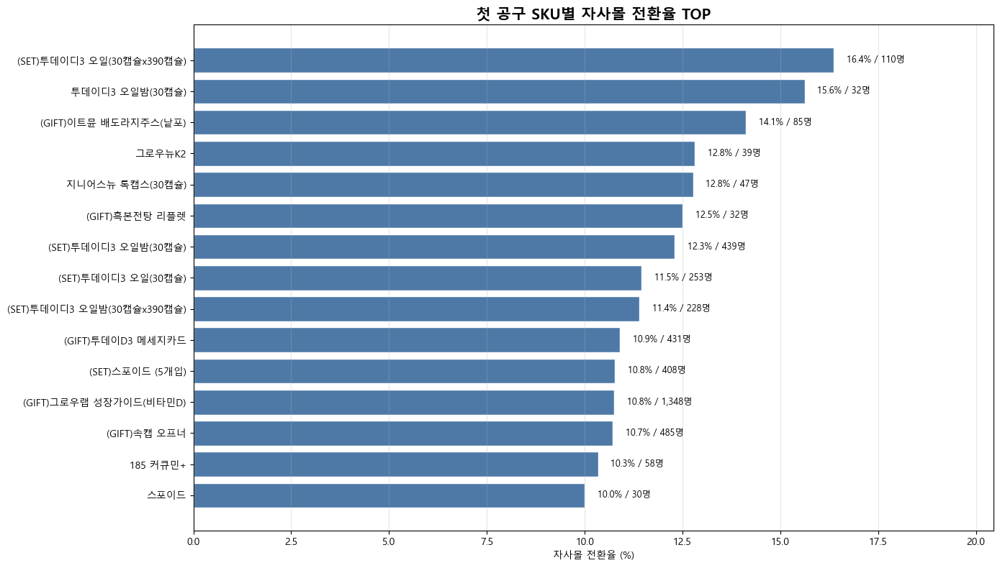

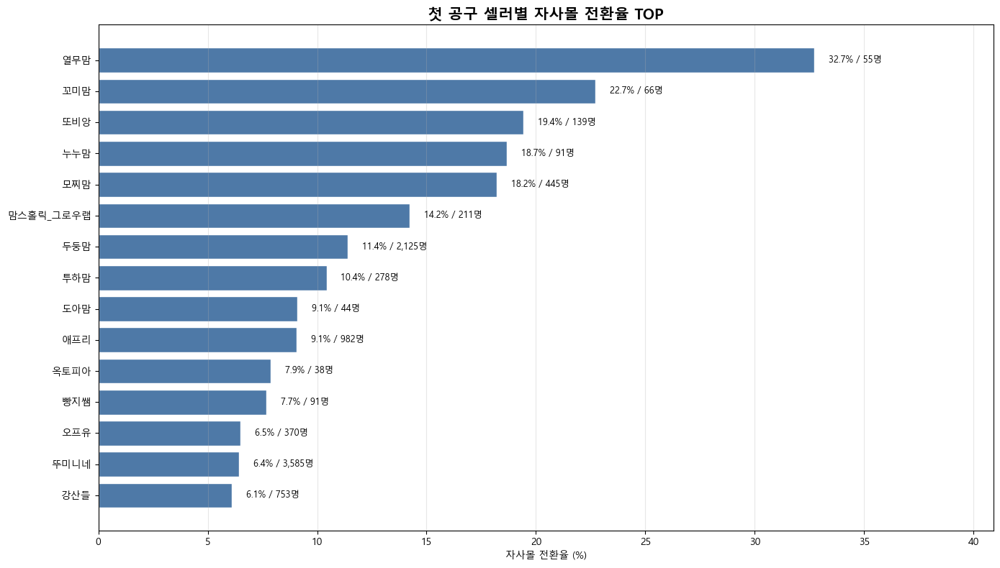

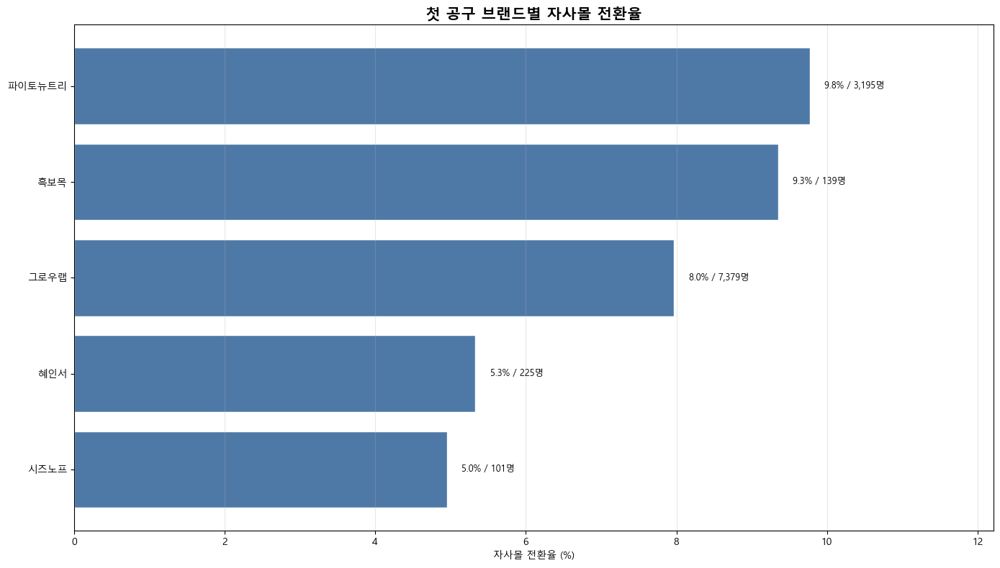

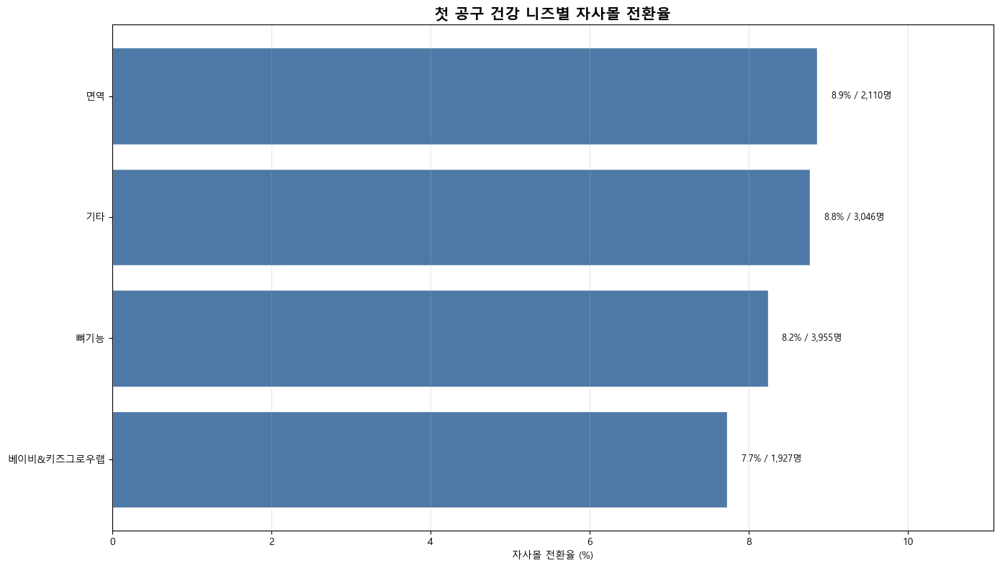


=== 전환 고객에서 과대표현된 첫 공구 SKU TOP 15 ===


,gonggu_first_product,전체고객,전환고객,미전환고객,전환율(%),전환고객내_비중(%),미전환고객내_비중(%),비중차이(%p)
8,(GIFT)그로우랩 성장가이드(비타민D),1348,145,1203,10.76,15.59,11.90,3.69
67,(SET)투데이디3 오일밤(30캡슐),439,54,385,12.30,5.81,3.81,2.00
14,(GIFT)속캡 오프너,485,52,433,10.72,5.59,4.28,1.31
24,(GIFT)투데이D3 메세지카드,431,47,384,10.90,5.05,3.80,1.25
53,(SET)스포이드 (5개입),408,44,364,10.78,4.73,3.60,1.13
20,(GIFT)지니어스뉴 건강정보카드,571,57,514,9.98,6.13,5.08,1.05
65,(SET)투데이디3 오일(30캡슐x390캡슐),110,18,92,16.36,1.94,0.91,1.03
64,(SET)투데이디3 오일(30캡슐),253,29,224,11.46,3.12,2.22,0.90
68,(SET)투데이디3 오일밤(30캡슐x390캡슐),228,26,202,11.40,2.80,2.00,0.80
58,(SET)지니어스뉴 드롭스(5개입),663,61,602,9.20,6.56,5.96,0.60



=== 전환 고객에서 과대표현된 첫 공구 셀러 TOP 15 ===


,gonggu_first_seller,전체고객,전환고객,미전환고객,전환율(%),전환고객내_비중(%),미전환고객내_비중(%),비중차이(%p)
9,두둥맘,2125,242,1883,11.39,26.02,18.63,7.39
15,모찌맘,445,81,364,18.20,8.71,3.60,5.11
10,또비앙,139,27,112,19.42,2.90,1.11,1.79
27,열무맘,55,18,37,32.73,1.94,0.37,1.57
14,맘스홀릭_그로우랩,211,30,181,14.22,3.23,1.79,1.44
3,꼬미맘,66,15,51,22.73,1.61,0.50,1.11
5,누누맘,91,17,74,18.68,1.83,0.73,1.10
26,애프리,982,89,893,9.06,9.57,8.83,0.74
41,투하맘,278,29,249,10.43,3.12,2.46,0.66
6,도아맘,44,4,40,9.09,0.43,0.40,0.03



=== 전환 고객에서 과대표현된 첫 공구 브랜드 TOP 15 ===


,gonggu_first_brand,전체고객,전환고객,미전환고객,전환율(%),전환고객내_비중(%),미전환고객내_비중(%),비중차이(%p)
2,파이토뉴트리,3195,312,2883,9.77,33.55,28.52,5.03
4,흑보목,139,13,126,9.35,1.40,1.25,0.15
1,시즈노프,101,5,96,4.95,0.54,0.95,-0.41
3,혜인서,225,12,213,5.33,1.29,2.11,-0.82
0,그로우랩,7379,588,6791,7.97,63.23,67.18,-3.95



=== 전환 고객에서 과대표현된 첫 공구 건강 니즈 TOP 15 ===


,gonggu_first_keyword,전체고객,전환고객,미전환고객,전환율(%),전환고객내_비중(%),미전환고객내_비중(%),비중차이(%p)
0,기타,3046,267,2779,8.77,28.71,27.49,1.22
1,면역,2110,187,1923,8.86,20.11,19.02,1.09
3,뼈기능,3955,326,3629,8.24,35.05,35.90,-0.85
2,베이비&키즈그로우랩,1927,149,1778,7.73,16.02,17.59,-1.57


In [840]:
# ---------------------------------------------------------
# 0) 비교용 고객 base 생성
#    기준: 공구 첫 구매 고객
# ---------------------------------------------------------

compare_base = gonggu_customer_base.copy()

compare_base['group'] = np.where(
    compare_base['converted'],
    '전환',
    '미전환'
)

print("=== 전환 여부별 고객 수 ===")
display(
    compare_base
    .groupby('group')
    .agg(고객수=('receiver_key', 'nunique'))
)


# ---------------------------------------------------------
# 1) 공통 함수: 전환 vs 미전환 mix 비교
# ---------------------------------------------------------

def compare_conversion_mix(df, group_col, label=None, min_total_customers=30, top_n=20):
    """
    전환 고객 vs 미전환 고객의 특정 컬럼 mix 비교
    - group_col: 비교할 컬럼
    - min_total_customers: 전체 고객 수 최소 기준
    """

    if label is None:
        label = group_col

    total_mix = (
        df
        .groupby(group_col)
        .agg(
            전체고객=('receiver_key', 'nunique'),
            전환고객=('converted', 'sum')
        )
        .reset_index()
    )

    total_mix['미전환고객'] = (
        total_mix['전체고객']
        - total_mix['전환고객']
    )

    total_mix['전환율(%)'] = (
        total_mix['전환고객']
        / total_mix['전체고객']
        * 100
    ).round(2)

    # 전환 고객 내 비중
    converted_total = df[df['converted']]['receiver_key'].nunique()
    nonconverted_total = df[~df['converted']]['receiver_key'].nunique()

    total_mix['전환고객내_비중(%)'] = (
        total_mix['전환고객']
        / converted_total
        * 100
    ).round(2)

    total_mix['미전환고객내_비중(%)'] = (
        total_mix['미전환고객']
        / nonconverted_total
        * 100
    ).round(2)

    total_mix['비중차이(%p)'] = (
        total_mix['전환고객내_비중(%)']
        - total_mix['미전환고객내_비중(%)']
    ).round(2)

    total_mix = total_mix[
        total_mix['전체고객'] >= min_total_customers
    ].copy()

    total_mix = total_mix.sort_values(
        ['전환율(%)', '전체고객'],
        ascending=[False, False]
    )

    print(f"\n=== {label}별 전환율 TOP {top_n} ===")
    display(total_mix.head(top_n))

    return total_mix


# ---------------------------------------------------------
# 2) 첫 공구 SKU 기준
# ---------------------------------------------------------

sku_mix = compare_conversion_mix(
    df=compare_base,
    group_col='gonggu_first_product',
    label='첫 공구 SKU',
    min_total_customers=30,
    top_n=30
)


# ---------------------------------------------------------
# 3) 첫 공구 브랜드 기준
# ---------------------------------------------------------

brand_mix = compare_conversion_mix(
    df=compare_base,
    group_col='gonggu_first_brand',
    label='첫 공구 브랜드',
    min_total_customers=30,
    top_n=30
)


# ---------------------------------------------------------
# 4) 첫 공구 셀러 기준
# ---------------------------------------------------------

seller_mix = compare_conversion_mix(
    df=compare_base,
    group_col='gonggu_first_seller',
    label='첫 공구 셀러',
    min_total_customers=30,
    top_n=30
)


# ---------------------------------------------------------
# 5) 첫 공구 제품군 기준
#    sku_family 컬럼이 gonggu_customer_base에 없으면 붙이기
# ---------------------------------------------------------

if 'gonggu_first_family' not in compare_base.columns:

    first_family_info = (
        df_eda[
            (df_eda['channel_group'] == '공구') &
            (df_eda['receiver_key'].notna())
        ]
        .sort_values('analysis_date')
        .groupby('receiver_key')
        .first()
        .reset_index()
        [[
            'receiver_key',
            'sku_family',
            'main_product_keyword',
            'product_status'
        ]]
        .rename(columns={
            'sku_family': 'gonggu_first_family',
            'main_product_keyword': 'gonggu_first_keyword',
            'product_status': 'gonggu_first_status'
        })
    )

    compare_base = compare_base.merge(
        first_family_info,
        on='receiver_key',
        how='left'
    )

family_mix = compare_conversion_mix(
    df=compare_base,
    group_col='gonggu_first_family',
    label='첫 공구 제품군',
    min_total_customers=30,
    top_n=30
)


# ---------------------------------------------------------
# 6) 첫 공구 건강 니즈 키워드 기준
# ---------------------------------------------------------

keyword_mix = compare_conversion_mix(
    df=compare_base,
    group_col='gonggu_first_keyword',
    label='첫 공구 건강 니즈',
    min_total_customers=30,
    top_n=30
)


# ---------------------------------------------------------
# 7) 시각화 함수
# ---------------------------------------------------------

def plot_conversion_mix(result_df, name_col, title, top_n=15):

    plot_df = (
        result_df
        .sort_values('전환율(%)', ascending=False)
        .head(top_n)
        .sort_values('전환율(%)')
    )

    plt.figure(figsize=(14, 8))

    bars = plt.barh(
        plot_df[name_col].astype(str),
        plot_df['전환율(%)'],
        color='#4e79a7',
        edgecolor='white'
    )

    max_rate = plot_df['전환율(%)'].max()

    for bar, rate, total in zip(
        bars,
        plot_df['전환율(%)'],
        plot_df['전체고객']
    ):
        plt.text(
            rate + max_rate * 0.02,
            bar.get_y() + bar.get_height()/2,
            f'{rate:.1f}% / {int(total):,}명',
            va='center',
            fontsize=9
        )

    plt.xlim(
        0,
        max_rate * 1.25
    )

    plt.title(title, fontsize=15, fontweight='bold')
    plt.xlabel('자사몰 전환율 (%)')
    plt.ylabel('')
    plt.grid(axis='x', alpha=0.3)

    plt.tight_layout()
    plt.show()


# ---------------------------------------------------------
# 8) 주요 그래프
# ---------------------------------------------------------

plot_conversion_mix(
    sku_mix,
    'gonggu_first_product',
    '첫 공구 SKU별 자사몰 전환율 TOP'
)

plot_conversion_mix(
    seller_mix,
    'gonggu_first_seller',
    '첫 공구 셀러별 자사몰 전환율 TOP'
)

plot_conversion_mix(
    brand_mix,
    'gonggu_first_brand',
    '첫 공구 브랜드별 자사몰 전환율'
)

plot_conversion_mix(
    keyword_mix,
    'gonggu_first_keyword',
    '첫 공구 건강 니즈별 자사몰 전환율'
)


# ---------------------------------------------------------
# 9) 전환 고객에서 과대표현된 항목 확인
#    전환고객내 비중 - 미전환고객내 비중
# ---------------------------------------------------------

def show_overrepresented(result_df, label, top_n=15):
    print(f"\n=== 전환 고객에서 과대표현된 {label} TOP {top_n} ===")
    display(
        result_df
        .sort_values('비중차이(%p)', ascending=False)
        .head(top_n)
    )

show_overrepresented(sku_mix, '첫 공구 SKU')
show_overrepresented(seller_mix, '첫 공구 셀러')
show_overrepresented(brand_mix, '첫 공구 브랜드')
show_overrepresented(keyword_mix, '첫 공구 건강 니즈')


=== 전환 고객 건강 니즈 ===


,gonggu_first_keyword,고객수,비중(%)
3,뼈기능,326,35.10
0,기타,267,28.70
1,면역,187,20.10
2,베이비&키즈그로우랩,149,16.00
4,위건강,1,0.10



=== 미전환 고객 건강 니즈 ===


,gonggu_first_keyword,고객수,비중(%)
3,뼈기능,3629,35.90
0,기타,2779,27.50
1,면역,1923,19.00
2,베이비&키즈그로우랩,1778,17.60



=== 전환 vs 미전환 건강 니즈 비교 ===


group,미전환,전환,차이(%p)
gonggu_first_keyword,,,
기타,27.50,28.70,1.20
면역,19.00,20.10,1.10
위건강,0.00,0.10,0.10
뼈기능,35.90,35.10,-0.80
베이비&키즈그로우랩,17.60,16.00,-1.60


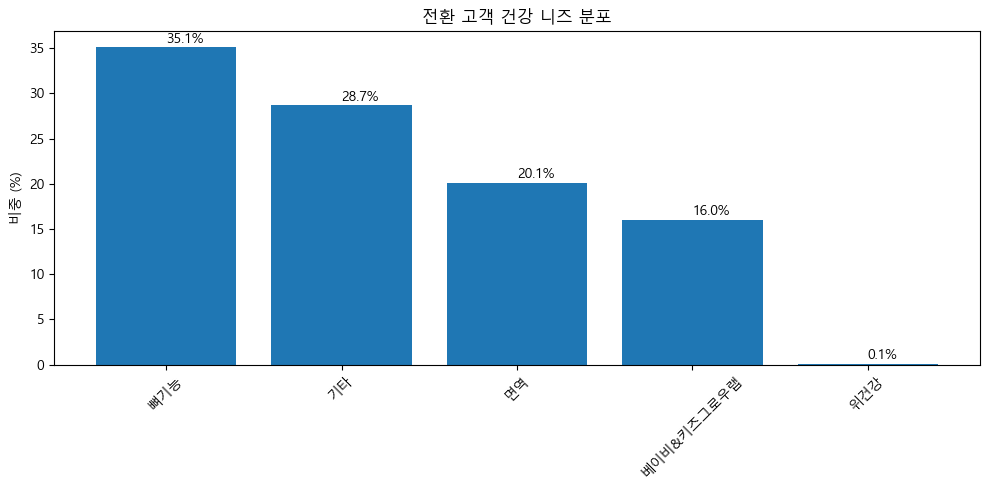

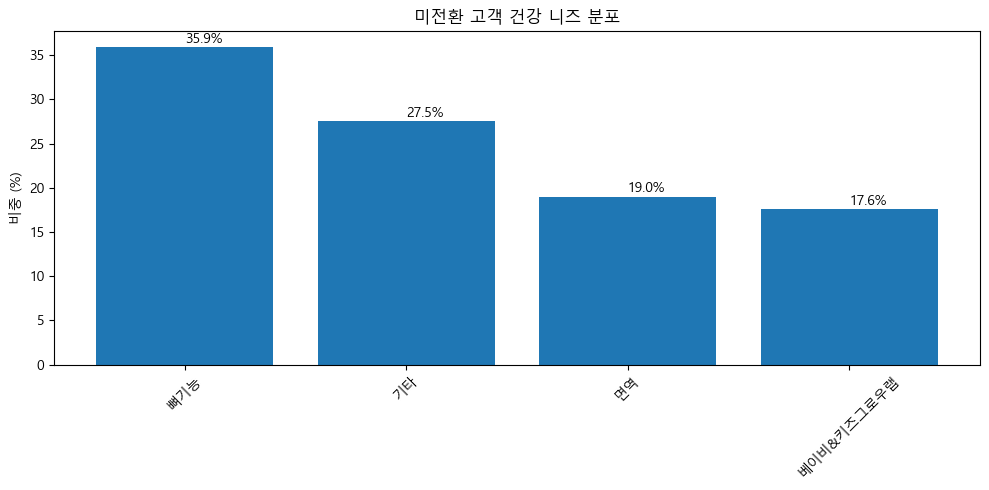

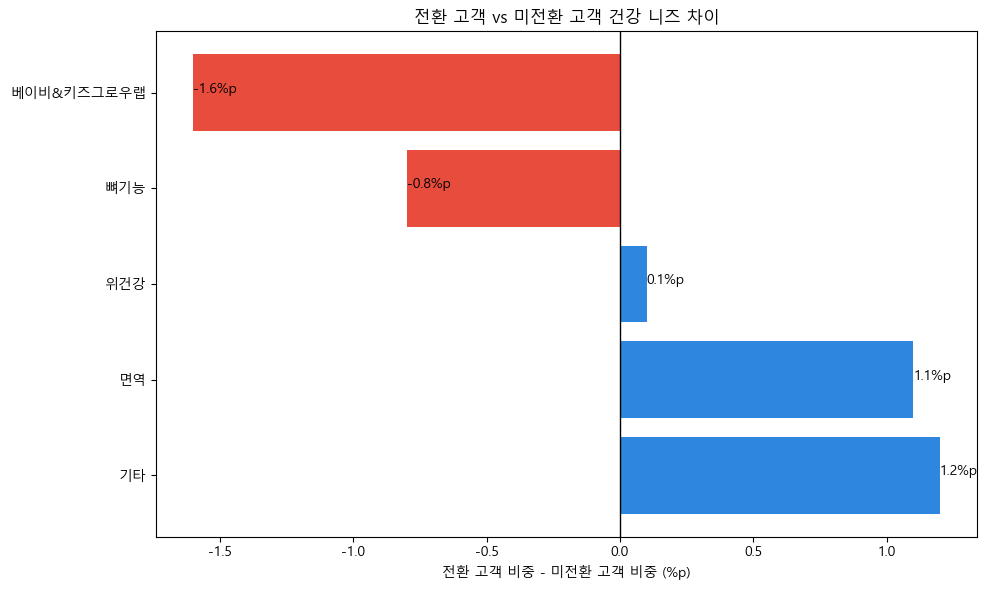

In [841]:
# =====================================================
# 전환 / 미전환 고객 건강 니즈 키워드 추가
# =====================================================

first_keyword_info = (
    df_eda[
        (df_eda['channel_group'] == '공구') &
        (df_eda['receiver_key'].notna())
    ]
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
    [[
        'receiver_key',
        'main_product_keyword',
        'product_keywords',
        'sku_family'
    ]]
    .rename(columns={
        'main_product_keyword': 'gonggu_first_keyword',
        'product_keywords': 'gonggu_first_keywords',
        'sku_family': 'gonggu_first_family'
    })
)

# 중복 merge 방지
for col in ['gonggu_first_keyword', 'gonggu_first_keywords', 'gonggu_first_family']:
    if col in converted_profile.columns:
        converted_profile = converted_profile.drop(columns=[col])
    if col in nonconverted_profile.columns:
        nonconverted_profile = nonconverted_profile.drop(columns=[col])

converted_profile = converted_profile.merge(
    first_keyword_info,
    on='receiver_key',
    how='left'
)

nonconverted_profile = nonconverted_profile.merge(
    first_keyword_info,
    on='receiver_key',
    how='left'
)


# =====================================================
# 함수: 건강 니즈 분포
# =====================================================

def keyword_distribution(df, title):
    result = (
        df
        .groupby('gonggu_first_keyword')
        .agg(
            고객수=('receiver_key', 'nunique')
        )
        .reset_index()
    )

    result['비중(%)'] = (
        result['고객수']
        / result['고객수'].sum()
        * 100
    ).round(1)

    result = result.sort_values('고객수', ascending=False)

    print(f"\n=== {title} ===")
    display(result)

    return result


converted_keyword = keyword_distribution(
    converted_profile,
    '전환 고객 건강 니즈'
)

nonconverted_keyword = keyword_distribution(
    nonconverted_profile,
    '미전환 고객 건강 니즈'
)


# =====================================================
# 전환 vs 미전환 건강 니즈 비교
# =====================================================

compare_keyword_base = pd.concat([
    converted_profile.assign(group='전환'),
    nonconverted_profile.assign(group='미전환')
], ignore_index=True)

keyword_mix = (
    compare_keyword_base
    .groupby(['group', 'gonggu_first_keyword'])
    .agg(
        고객수=('receiver_key', 'nunique')
    )
    .reset_index()
)

keyword_mix['비중(%)'] = (
    keyword_mix
    .groupby('group')['고객수']
    .transform(lambda x: x / x.sum() * 100)
).round(1)

keyword_compare = (
    keyword_mix
    .pivot(
        index='gonggu_first_keyword',
        columns='group',
        values='비중(%)'
    )
    .fillna(0)
)

keyword_compare['차이(%p)'] = (
    keyword_compare['전환']
    - keyword_compare['미전환']
).round(1)

keyword_compare = keyword_compare.sort_values(
    '차이(%p)',
    ascending=False
)

print("\n=== 전환 vs 미전환 건강 니즈 비교 ===")
display(keyword_compare)

# =====================================================
# 시각화
# =====================================================

# 전환 고객 건강 니즈 분포
plt.figure(figsize=(10,5))

plot_df = converted_keyword.head(10)

plt.bar(
    plot_df['gonggu_first_keyword'],
    plot_df['비중(%)']
)

for i, v in enumerate(plot_df['비중(%)']):
    plt.text(i, v+0.5, f'{v:.1f}%')

plt.title('전환 고객 건강 니즈 분포')
plt.ylabel('비중 (%)')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

# 미전환 고객 건강 니즈 분포
plt.figure(figsize=(10,5))

plot_df = nonconverted_keyword.head(10)

plt.bar(
    plot_df['gonggu_first_keyword'],
    plot_df['비중(%)']
)

for i, v in enumerate(plot_df['비중(%)']):
    plt.text(i, v+0.5, f'{v:.1f}%')

plt.title('미전환 고객 건강 니즈 분포')
plt.ylabel('비중 (%)')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

# 전환 vs 미전환 차이
plot_df = (
    keyword_compare
    .reset_index()
    .sort_values('차이(%p)', ascending=False)
)

plt.figure(figsize=(10,6))

colors = [
    '#2E86DE' if x > 0 else '#E74C3C'
    for x in plot_df['차이(%p)']
]

bars = plt.barh(
    plot_df['gonggu_first_keyword'],
    plot_df['차이(%p)'],
    color=colors
)

for bar, val in zip(bars, plot_df['차이(%p)']):
    plt.text(
        val,
        bar.get_y()+bar.get_height()/2,
        f'{val:.1f}%p'
    )

plt.axvline(0, color='black', linewidth=1)

plt.title(
    '전환 고객 vs 미전환 고객 건강 니즈 차이'
)

plt.xlabel(
    '전환 고객 비중 - 미전환 고객 비중 (%p)'
)

plt.tight_layout()
plt.show()

- 건강 니즈는 거의 차이가 없음  
- SKU 영향은 존재 : 제품이 아니라 브랜드 경험!  
- 전환을 만드는 것은 제품보다 콘텐츠  
전환은 제품 사용 → 정보 제공 → 브랜드 이해 → 추가 탐색 → 자사몰 방문 구조로 보임  
    - 전환 잘되는 SKU : 성장가이드, 메시지카드, 건강정보카드, 오프너 등  
    - 전환 못 만드는 SKU : 일반 리필, 단순 제품, 데이프로바, 그로우뉴 키즈 등  
- 셀러 영향이 매우 큼  
→ 같은 제품이라도 셀러에 따라 자사몰 전환이 3~5배 차이남  
- 브랜드는 셀러보다 약하지만 존재 함  
→ 파이토뉴트리 SKU 경험 고객이 자사몰로 조금 더 넘어옴  

> - 공구 → 자사몰 전환 고객은 특정 SKU 때문이라기보다 특정 셀러/브랜드의 영향이 훨씬 큼  
> - 건강 니즈(면역/뼈기능 등)는 전환 여부를 거의 설명하지 못함  

---

## 6. 브랜드별 cohort 비교

- 전체 고객 첫 구매 브랜드 기준  
- 30/60/90/180일 누적 재구매율  

,receiver_key,first_purchase_date,first_brand,first_pay,first_qty
0,00005cbb34991c07,2025-04-25,흑보목,205000,2
1,0000b18036ac2b28,2025-09-13,파이토뉴트리,34800,1
2,0000da1001af98c8,2025-09-05,혜인서,58800,1
3,0001e294bcf8214a,2025-01-10,혜인서,58800,1
4,000313ecb1437c28,2025-04-29,파이토뉴트리,28800,1


,first_brand,고객수_30d,repurchase_30d,고객수_60d,repurchase_60d,고객수_90d,repurchase_90d,고객수_180d,repurchase_180d,평균_첫결제액,평균_첫수량
2,파이토뉴트리,25161,3.85,23986,8.77,23002,11.91,19254,19.63,"76,357.00",2.04
0,그로우랩,27422,7.06,25684,14.10,23621,19.92,18454,28.65,"59,875.00",1.67
3,혜인서,21202,4.30,20181,10.34,19221,13.32,15797,18.57,"98,945.00",1.26
1,시즈노프,2323,5.42,2258,8.41,2208,10.46,1978,14.61,"40,344.00",2.08
4,흑보목,1101,2.91,1064,6.58,1032,9.21,866,15.36,"173,029.00",1.87


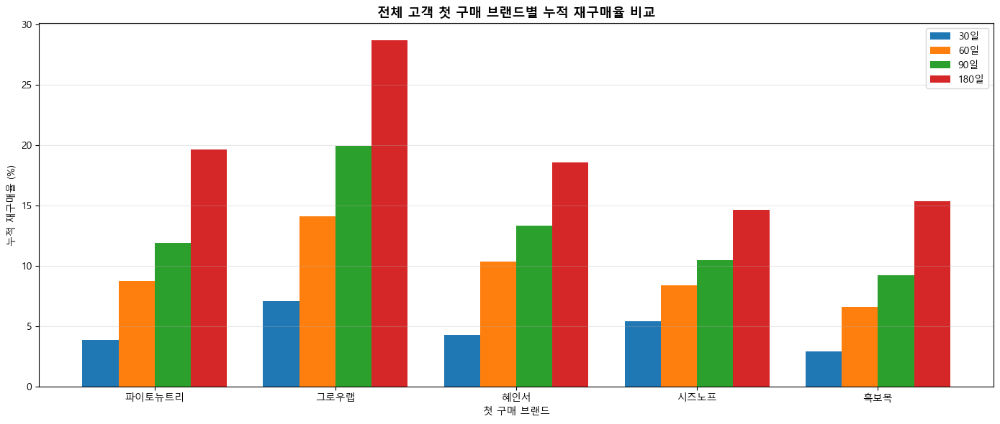

=== 윈도우별 분모 고객수 ===


,first_brand,고객수_30d,고객수_60d,고객수_90d,고객수_180d
2,파이토뉴트리,25161,23986,23002,19254
0,그로우랩,27422,25684,23621,18454
3,혜인서,21202,20181,19221,15797
1,시즈노프,2323,2258,2208,1978
4,흑보목,1101,1064,1032,866


In [842]:
windows = [30, 60, 90, 180]

# ---------------------------------------------------------
# 1) 전체 고객 첫 구매 정보
# ---------------------------------------------------------

first_brand_info = (
    df_eda[
        (df_eda['receiver_key'].notna()) &
        (df_eda['sku_type'] == 'product') &
        (df_eda['결제액'] > 0)
    ]
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
    [[
        'receiver_key',
        'analysis_date',
        '브랜드_분류',
        '결제액',
        '주문수량'
    ]]
    .rename(columns={
        'analysis_date': 'first_purchase_date',
        '브랜드_분류': 'first_brand',
        '결제액': 'first_pay',
        '주문수량': 'first_qty'
    })
)

display(first_brand_info.head())


# ---------------------------------------------------------
# 2) 전체 구매 이력 연결
# ---------------------------------------------------------

purchase_history = df_eda[
    (df_eda['receiver_key'].notna()) &
    (df_eda['결제액'] > 0)
][[
    'receiver_key',
    'analysis_date',
    'channel_group',
    '브랜드_분류',
    '결제액'
]].copy()

brand_retention_base = first_brand_info.merge(
    purchase_history,
    on='receiver_key',
    how='left'
)

brand_retention_base['days_since_first'] = (
    brand_retention_base['analysis_date']
    - brand_retention_base['first_purchase_date']
).dt.days


# ---------------------------------------------------------
# 3) 누적 재구매 flag 생성
# ---------------------------------------------------------

for d in windows:
    brand_retention_base[f'repurchase_{d}d'] = (
        (brand_retention_base['days_since_first'] > 0) &
        (brand_retention_base['days_since_first'] <= d)
    )


# ---------------------------------------------------------
# 4) 고객 단위 압축
# ---------------------------------------------------------

repurchase_cols = [f'repurchase_{d}d' for d in windows]

brand_customer_retention = (
    brand_retention_base
    .groupby([
        'receiver_key',
        'first_brand',
        'first_pay',
        'first_qty',
        'first_purchase_date'   # cutoff 필터에 필요하여 추후 별도 추가
    ])[repurchase_cols]
    .max()
    .reset_index()
)


# ---------------------------------------------------------
# 5) 브랜드별 retention 요약 - 윈도우별로 관찰 가능한 고객만 분모에 포함하여 수정
# ---------------------------------------------------------

latest_date = df_eda['analysis_date'].max()

summary_list = []

for d in windows:
    cutoff = latest_date - pd.Timedelta(days=d)

    eligible = brand_customer_retention[
        brand_customer_retention['first_purchase_date'] <= cutoff
    ].copy()

    agg = (
        eligible
        .groupby('first_brand')
        .agg(
            **{f'고객수_{d}d': ('receiver_key', 'nunique'),
               f'repurchase_{d}d': (f'repurchase_{d}d', 'mean')}
        )
        .reset_index()
    )
    summary_list.append(agg)

# 윈도우별 결과 합치기
from functools import reduce
brand_cohort_summary = reduce(
    lambda l, r: l.merge(r, on='first_brand', how='outer'),
    summary_list
)

# 평균_첫결제액, 평균_첫수량은 전체 기준으로 별도 집계
extra = (
    brand_customer_retention
    .groupby('first_brand')
    .agg(
        평균_첫결제액=('first_pay', 'mean'),
        평균_첫수량=('first_qty', 'mean')
    )
    .reset_index()
)
brand_cohort_summary = brand_cohort_summary.merge(extra, on='first_brand', how='left')

# 비율 컬럼 % 변환
rate_cols = [f'repurchase_{d}d' for d in windows]
brand_cohort_summary[rate_cols] = (
    brand_cohort_summary[rate_cols] * 100
).round(2)

brand_cohort_summary['평균_첫결제액'] = brand_cohort_summary['평균_첫결제액'].round(0)
brand_cohort_summary['평균_첫수량'] = brand_cohort_summary['평균_첫수량'].round(2)

brand_cohort_summary = brand_cohort_summary.sort_values('고객수_180d', ascending=False)

display(brand_cohort_summary)


# ---------------------------------------------------------
# 6) 시각화
# ---------------------------------------------------------

brand_plot = brand_cohort_summary.copy()

x = np.arange(len(brand_plot))
width = 0.2

plt.figure(figsize=(14, 6))

plt.bar(x - width*1.5, brand_plot['repurchase_30d'], width, label='30일')
plt.bar(x - width*0.5, brand_plot['repurchase_60d'], width, label='60일')
plt.bar(x + width*0.5, brand_plot['repurchase_90d'], width, label='90일')
plt.bar(x + width*1.5, brand_plot['repurchase_180d'], width, label='180일')

plt.xticks(x, brand_plot['first_brand'], rotation=0)

plt.title('전체 고객 첫 구매 브랜드별 누적 재구매율 비교', fontsize=13, fontweight='bold')
plt.xlabel('첫 구매 브랜드')
plt.ylabel('누적 재구매율 (%)')
plt.grid(axis='y', alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# 윈도우별 고객수 확인 (분모 변화 확인용)
print("=== 윈도우별 분모 고객수 ===")
display(brand_cohort_summary[['first_brand'] + [f'고객수_{d}d' for d in windows]])

- **그로우랩** : 재구매 구조가 가장 강한 브랜드  
→ 신규 고객 확보 + 재구매 전환 모두 강한 가장 이상적인 구조  
    - 180일 재구매율 **28.65%**로 전체 브랜드 1위  
    - 30일 재구매율도 **7.06%**로 가장 높음  
    - 60일(14.10%) → 90일(19.92%) → 180일(28.65%)로 꾸준히 상승  
    - 평균 첫결제액은 59,875원으로 상대적으로 낮은 편  
        - 진입 장벽이 낮고  
        - 이후 반복 구매를 통해 LTV를 쌓는 구조  
    - 고객 규모도 18,454명(180일 기준) 으로 충분히 커서 단순 소규모 브랜드 효과가 아님  

- **파이토뉴트리** : 규모 1위, 안정적 재구매 구조  
→ 재구매율은 그로우랩보다 낮지만 고객 규모가 압도적이라 실제 매출 기여도는 가장 큰 브랜드  
    - 180일 고객수 19,254명으로 전체 브랜드 중 최대 수준  
    - 180일 재구매율 19.63%  
    - 30일(3.85%)은 낮지만 시간이 지나며 꾸준히 증가  
    - 평균 첫결제액 76,357원  
        → 객단가와 접근성이 적절한 수준  

- **헤인서** : 고관여·고가형 브랜드  
→ 고가 제품 특성상 구매 주기가 길고, 충성 고객 중심으로 움직이는 브랜드  
    - 평균 첫결제액 98,945원  
        → 주요 브랜드 중 가장 높은 수준  
    - 30일 재구매율(4.30%)이 가장 낮은 편인데, 고가 제품 특성상 구매 주기가 길어서 나타나는 현상으로 보임  
    - 180일(18.57%)까지 가면 꽤 올라오는 구조  
        → 천천히 재구매하는 고관여 고객층  

- **흑보목** : 초고가 브랜드지만 재구매는 제한적  
→ 고객당 매출은 크지만 확장성은 제한적인 프리미엄 브랜드  
    - 평균 첫결제액 173,029원으로 압도적 1위지만 고객수 866명(180일 기준)으로 가장 적음  
    - 180일 재구매율 15.36%  

- **시즈노프** : 재구매 구조가 가장 약한 브랜드  
→ 반복 구매보다는 단발성 구매 비중이 높은 브랜드로 해석 가능  
    - 30일(5.42%)은 파이토뉴트리와 비슷하지만 이후 성장세가 가장 완만  
    - 180일 14.61%로 최하위 / 고객 규모도 1,978명 수준  
        → 초기 재구매는 나쁘지 않지만 반복 구매 구조가 가장 약함  

> Retention 관점의 승자는 그로우랩(28.65%)  
> 매출 규모 관점의 승자는 파이토뉴트리(19,254명)  
> 
> - 그로우랩: 낮은 첫결제액 → 진입 장벽 낮음 → 재구매율 높음 → 신규 고객 락인형  
> - 파이토뉴트리: 중간 첫결제액 → 고객 수 압도적 → 매출 볼륨형  

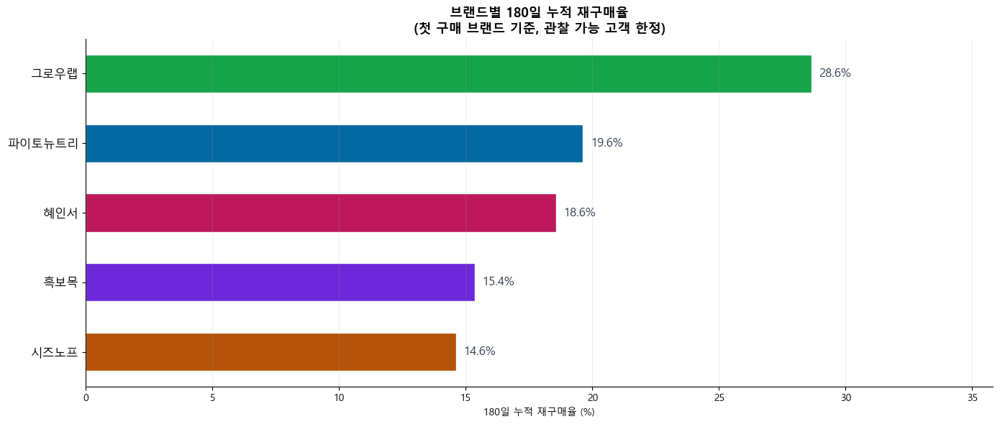

In [843]:
# PPT용 그래프 — BRAND_COLOR 적용
brand_plot = brand_cohort_summary.copy()
brand_plot = brand_plot.sort_values('repurchase_180d', ascending=True)  # ← 추가 (barh는 아래→위라 ascending=True가 내림차순으로 보임)

x = np.arange(len(brand_plot))
width = 0.2

fig, ax = plt.subplots(figsize=(14, 6))

bar_colors = [BRAND_COLOR.get(b, '#94A3B8') for b in brand_plot['first_brand']]

bars = ax.barh(
    brand_plot['first_brand'],
    brand_plot['repurchase_180d'],
    color=bar_colors,
    edgecolor='white',
    height=0.55,
)

for bar, val in zip(bars, brand_plot['repurchase_180d']):
    ax.text(
        bar.get_width() + 0.3,
        bar.get_y() + bar.get_height() / 2,
        f'{val:.1f}%', va='center', fontsize=12, color='#374151'
    )

ax.set_title('브랜드별 180일 누적 재구매율\n(첫 구매 브랜드 기준, 관찰 가능 고객 한정)', fontsize=13, fontweight='bold')
ax.set_xlabel('180일 누적 재구매율 (%)')
ax.set_xlim(0, brand_plot['repurchase_180d'].max() * 1.25)
ax.spines[['top', 'right']].set_visible(False)
ax.tick_params(axis='y', labelsize=12)
ax.grid(axis='x', alpha=0.2)
plt.tight_layout()
plt.show()

---

### 6-1. 브랜드별 기간별 독립 재구매율

- 추가 분석
- 기존 누적재구매율이 아닌 기간별 재구매율 다시 확인  
(각 구간에 처음으로 재구매한 고객 비율)  

=== 브랜드별 기간별 독립 재구매율 ===


구간,1~30일,31~60일,61~90일,91~180일
브랜드,,,,
그로우랩,8.20,8.70,9.50,17.50
시즈노프,5.60,3.70,3.30,6.20
파이토뉴트리,4.00,5.60,4.90,12.50
혜인서,4.30,6.70,5.00,9.80
흑보목,2.90,4.30,3.80,8.70


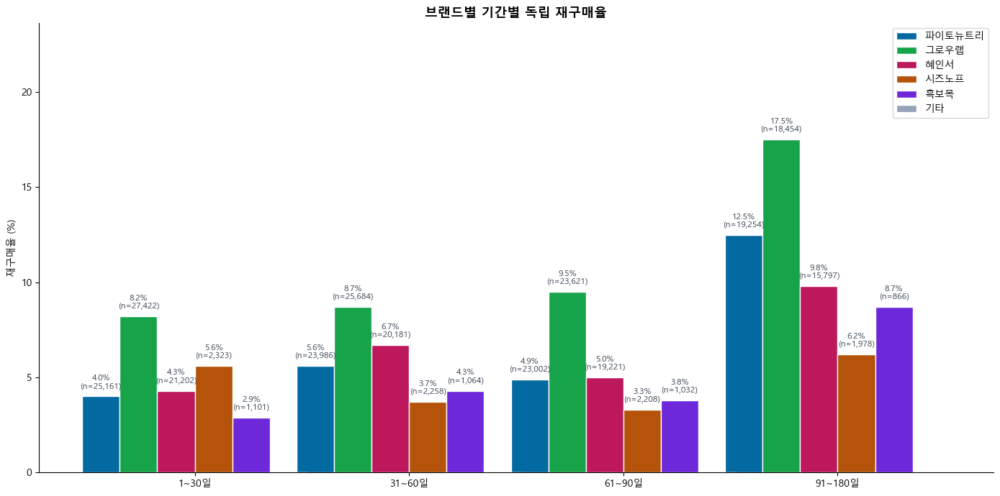


※ 읽는 법: 각 구간에 새로 재구매가 발생한 비율
   30일에 높으면 → 즉각 반복 구매 구조
   91~180일에 높으면 → 소비 주기가 긴 구조
=== 브랜드별 누적 재구매율 ===


,브랜드,30일 n,60일 n,90일 n,180일 n,30일(%),60일(%),90일(%),180일(%)
2,파이토뉴트리,25161,23986,23002,19254,3.85,8.77,11.91,19.63
0,그로우랩,27422,25684,23621,18454,7.06,14.10,19.92,28.65
3,혜인서,21202,20181,19221,15797,4.30,10.34,13.32,18.57
1,시즈노프,2323,2258,2208,1978,5.42,8.41,10.46,14.61
4,흑보목,1101,1064,1032,866,2.91,6.58,9.21,15.36


=== 브랜드별 기간별 독립 재구매율 ===


,브랜드,1~30일(%),1~30일 n,31~60일(%),31~60일 n,61~90일(%),61~90일 n,91~180일(%),91~180일 n
0,그로우랩,8.20,27422,8.70,25684,9.50,23621,17.50,18454
1,시즈노프,5.60,2323,3.70,2258,3.30,2208,6.20,1978
2,파이토뉴트리,4.00,25161,5.60,23986,4.90,23002,12.50,19254
3,혜인서,4.30,21202,6.70,20181,5.00,19221,9.80,15797
4,흑보목,2.90,1101,4.30,1064,3.80,1032,8.70,866


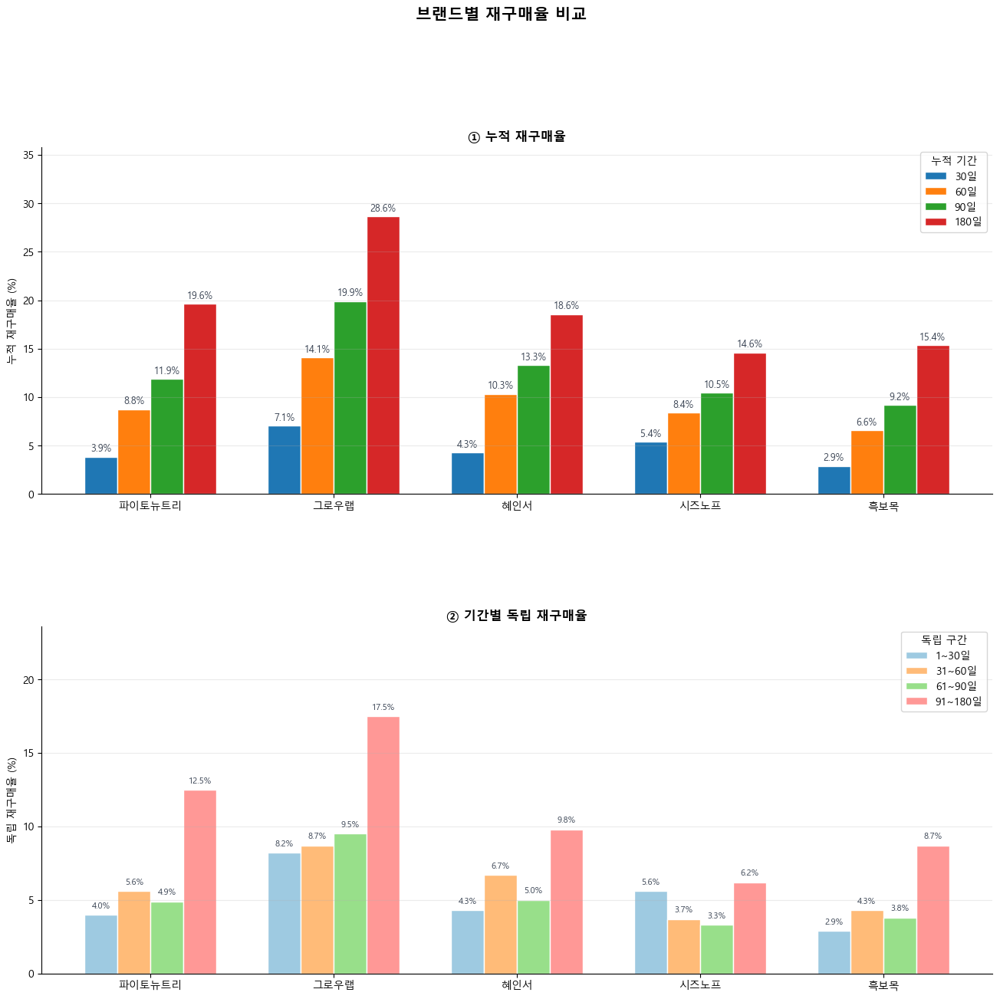

In [844]:
windows_ind = [(1, 30), (31, 60), (61, 90), (91, 180)]
구간_list = ['1~30일', '31~60일', '61~90일', '91~180일']
latest_date = df_eda['analysis_date'].max()

brands = list(BRAND_COLOR.keys())
results_brand = []

for brand in brands:
    for start, end in windows_ind:
        cutoff = latest_date - pd.Timedelta(days=end)

        # 해당 브랜드 첫 구매 고객 중 관찰 가능한 고객
        eligible = brand_customer_retention[
            (brand_customer_retention['first_brand'] == brand) &
            (brand_customer_retention['first_purchase_date'] <= cutoff)
        ]['receiver_key']

        if len(eligible) == 0:
            continue

        # 전체 구매 이력에서 해당 구간 재구매 여부
        sub = df_eda[
            df_eda['receiver_key'].isin(eligible) &
            df_eda['receiver_key'].notna()
        ][['receiver_key', 'analysis_date']].copy()

        # 첫 구매일 결합
        first_dates = brand_customer_retention[
            brand_customer_retention['receiver_key'].isin(eligible)
        ][['receiver_key', 'first_purchase_date']]

        sub = sub.merge(first_dates, on='receiver_key', how='left')
        sub['days_since_first'] = (
            pd.to_datetime(sub['analysis_date']) -
            pd.to_datetime(sub['first_purchase_date'])
        ).dt.days

        reordered = (
            sub[
                (sub['days_since_first'] >= start) &
                (sub['days_since_first'] <= end)
            ]
            .groupby('receiver_key')
            .size()
            .ge(1)
            .sum()
        )

        n_elig = len(eligible)
        results_brand.append({
            '브랜드': brand,
            '구간': f'{start}~{end}일',
            '관찰 가능 고객수': n_elig,
            '구간 재구매율(%)': round(reordered / n_elig * 100, 1) if n_elig else 0,
        })

df_ind_brand = pd.DataFrame(results_brand)

print("=== 브랜드별 기간별 독립 재구매율 ===")
display(df_ind_brand.pivot(index='브랜드', columns='구간', values='구간 재구매율(%)'))

# 시각화
fig, ax = plt.subplots(figsize=(14, 7))

x = np.array([0, 2, 4, 6])
n_brands = len(brands)
width = 0.35

for i, brand in enumerate(brands):
    vals = []
    ns = []
    for g in 구간_list:
        row = df_ind_brand[
            (df_ind_brand['브랜드'] == brand) &
            (df_ind_brand['구간'] == g)
        ]
        vals.append(row['구간 재구매율(%)'].values[0] if len(row) else 0)
        ns.append(int(row['관찰 가능 고객수'].values[0]) if len(row) else 0)

    offset = (i - n_brands / 2) * width + width / 2
    bars = ax.bar(x + offset, vals, width,
                  label=brand,
                  color=BRAND_COLOR.get(brand, '#94A3B8'),
                  edgecolor='white')

    # 수치 + n값 (막대 하단 안쪽)
    for bar, val, n in zip(bars, vals, ns):

        if val > 0:

            x_pos = bar.get_x() + bar.get_width() / 2
            y_pos = bar.get_height()

            ax.text(
                x_pos,
                y_pos + 0.3,
                f'{val:.1f}%\n(n={n:,})',
                ha='center',
                va='bottom',
                fontsize=8.5,
                color='#374151',
                fontweight='normal',
                linespacing=0.9
            )

ax.set_xticks(x)
ax.set_xticklabels(구간_list)
ax.set_title('브랜드별 기간별 독립 재구매율', fontsize=13, fontweight='bold')
ax.set_ylabel('재구매율 (%)')
ax.set_ylim(0, df_ind_brand['구간 재구매율(%)'].max() * 1.35)
ax.legend(loc='upper right')
ax.spines[['top', 'right']].set_visible(False)
plt.tight_layout()
plt.show()

print("\n※ 읽는 법: 각 구간에 새로 재구매가 발생한 비율")
print("   30일에 높으면 → 즉각 반복 구매 구조")
print("   91~180일에 높으면 → 소비 주기가 긴 구조")

# =========================================================
# 누적 재구매율 테이블
# =========================================================

cum_table = (
    brand_cohort_summary[
        [
            'first_brand',
            '고객수_30d',
            '고객수_60d',
            '고객수_90d',
            '고객수_180d',
            'repurchase_30d',
            'repurchase_60d',
            'repurchase_90d',
            'repurchase_180d'
        ]
    ]
    .copy()
)

cum_table.columns = [
    '브랜드',
    '30일 n',
    '60일 n',
    '90일 n',
    '180일 n',
    '30일(%)',
    '60일(%)',
    '90일(%)',
    '180일(%)'
]

print("=== 브랜드별 누적 재구매율 ===")
display(cum_table)


# =========================================================
# 독립 재구매율 테이블
# =========================================================

ind_rate_table = (
    df_ind_brand
    .pivot(
        index='브랜드',
        columns='구간',
        values='구간 재구매율(%)'
    )
)

ind_n_table = (
    df_ind_brand
    .pivot(
        index='브랜드',
        columns='구간',
        values='관찰 가능 고객수'
    )
)

ind_display = pd.DataFrame(index=ind_rate_table.index)

for period in 구간_list:

    ind_display[f'{period}(%)'] = (
        ind_rate_table[period]
        .round(1)
    )

    ind_display[f'{period} n'] = (
        ind_n_table[period]
        .astype(int)
    )

ind_display = ind_display.reset_index()

print("=== 브랜드별 기간별 독립 재구매율 ===")
display(ind_display)

# =========================================================
# 브랜드별 누적 vs 기간별 독립 재구매율 통합 시각화
# =========================================================

brand_order = [
    b for b in BRAND_COLOR.keys()
    if b in brand_cohort_summary['first_brand'].unique()
]

# BRAND_COLOR에 없는 브랜드도 뒤에 추가
brand_order += [
    b for b in brand_cohort_summary['first_brand'].unique()
    if b not in brand_order
]

# -----------------------------
# 1) 누적 재구매율 데이터
# -----------------------------
brand_cum_plot = (
    brand_cohort_summary
    .set_index('first_brand')
    .reindex(brand_order)
)

cum_cols = [
    'repurchase_30d',
    'repurchase_60d',
    'repurchase_90d',
    'repurchase_180d'
]

cum_labels = ['30일', '60일', '90일', '180일']

# -----------------------------
# 2) 독립 재구매율 데이터
# -----------------------------
brand_ind_plot = (
    df_ind_brand
    .pivot_table(
        index='브랜드',
        columns='구간',
        values='구간 재구매율(%)'
    )
    .reindex(brand_order)
    .reindex(columns=구간_list)
)

brand_ind_n = (
    df_ind_brand
    .pivot_table(
        index='브랜드',
        columns='구간',
        values='관찰 가능 고객수'
    )
    .reindex(brand_order)
    .reindex(columns=구간_list)
)

# =========================================================
# 시각화
# =========================================================

fig, axes = plt.subplots(
    2,
    1,
    figsize=(16, 14),
    gridspec_kw={'hspace': 0.38}
)

fig.suptitle(
    '브랜드별 재구매율 비교',
    fontsize=15,
    fontweight='bold',
    y=1.01
)

x = np.arange(len(brand_order))
width = 0.18
n_period = 4

# -----------------------------
# ① 누적 재구매율
# -----------------------------
for i, (col, label, color) in enumerate(zip(cum_cols, cum_labels, COHORT_COLORS_LIST)):

    vals = brand_cum_plot[col].fillna(0).values
    offset = (i - n_period / 2) * width + width / 2

    bars = axes[0].bar(
        x + offset,
        vals,
        width,
        label=label,
        color=color,
        edgecolor='white'
    )

    for bar, val in zip(bars, vals):
        if val > 0:
            axes[0].text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.3,
                f'{val:.1f}%',
                ha='center',
                va='bottom',
                fontsize=9,
                color='#374151'
            )

axes[0].set_title('① 누적 재구매율', fontsize=12, fontweight='bold')
axes[0].set_xticks(x)
axes[0].set_xticklabels(brand_order, rotation=0, ha='center')
axes[0].set_ylabel('누적 재구매율 (%)')
axes[0].set_ylim(0, brand_cum_plot[cum_cols].max().max() * 1.25)
axes[0].legend(title='누적 기간', loc='upper right')
axes[0].grid(axis='y', alpha=0.25)
axes[0].spines[['top', 'right']].set_visible(False)

# -----------------------------
# ② 기간별 독립 재구매율
# -----------------------------
for i, (period, color) in enumerate(zip(구간_list, COHORT_COLORS_LIGHT_LIST)):

    vals = brand_ind_plot[period].fillna(0).values
    ns = brand_ind_n[period].fillna(0).astype(int).values
    offset = (i - n_period / 2) * width + width / 2

    bars = axes[1].bar(
        x + offset,
        vals,
        width,
        label=period,
        color=color,
        edgecolor='white'
    )

    for bar, val, n in zip(bars, vals, ns):
        if val > 0:
            axes[1].text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.3,
                f'{val:.1f}%',
                ha='center',
                va='bottom',
                fontsize=8,
                color='#374151',
                linespacing=0.85
            )

axes[1].set_title('② 기간별 독립 재구매율', fontsize=12, fontweight='bold')
axes[1].set_xticks(x)
axes[1].set_xticklabels(brand_order, rotation=0, ha='center')
axes[1].set_ylabel('독립 재구매율 (%)')
axes[1].set_ylim(0, brand_ind_plot.max().max() * 1.35)
axes[1].legend(title='독립 구간', loc='upper right')
axes[1].grid(axis='y', alpha=0.25)
axes[1].spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.show()

---

## 7. 채널별 cohort 비교  

(경도님 분석)  

- 전체 고객 첫 구매 채널 기준  
- 30/60/90/180일 누적 재구매율  

고객별 첫 구매 채널 (미리보기):


,receiver_key,first_date,first_channel
0,00005cbb34991c07,2025-04-25,자사몰
1,0000b18036ac2b28,2025-09-13,자사몰_N
2,0000da1001af98c8,2025-09-05,자사몰_N
3,0001e294bcf8214a,2025-01-10,자사몰_N
4,000313ecb1437c28,2025-04-29,자사몰_N



전체 구매 이력 (미리보기):


,receiver_key,analysis_date,channel_group,결제액,first_date,first_channel,days_since_first
0,e6031b9d31f9519e,2025-01-01,자사몰_N,199000,2025-01-01,자사몰_N,0.00
1,45d90043b9523d73,2025-01-01,자사몰_N,34800,2025-01-01,자사몰_N,0.00
2,ea7c5fb701bbccdc,2025-01-01,자사몰_N,58800,2025-01-01,자사몰_N,0.00
3,04b1b703afe74fe0,2025-01-01,자사몰_N,0,2025-01-01,자사몰_N,0.00
4,04b1b703afe74fe0,2025-01-01,자사몰_N,0,2025-01-01,자사몰_N,0.00



채널별 retention 요약:


,채널,30d,30d_n,60d,60d_n,90d,90d_n,180d,180d_n
0,자사몰,5.20,8555,10.40,8129,14.20,7836,22.80,6455
1,자사몰_N,5.20,57711,11.30,54774,15.00,51896,21.30,42209
2,공구,9.20,9175,15.40,8539,21.50,7667,33.40,6200
3,외부몰,2.00,1879,3.90,1833,5.10,1781,7.50,1527
4,B2B,0.00,28,4.30,23,13.00,23,9.50,21


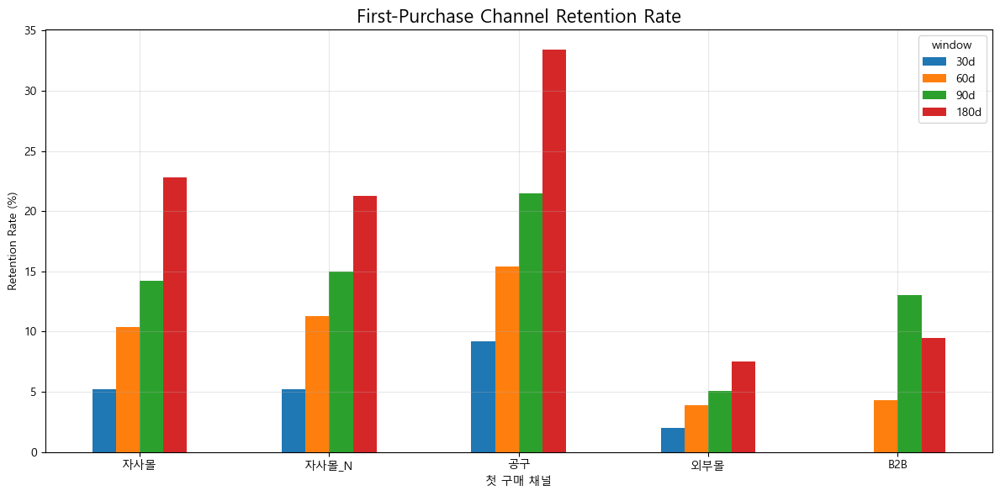

In [845]:
# =========================================================
# 고객별 첫 구매 채널 정의
# =========================================================

first_order = (
    df_eda
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
)

first_order = first_order[[
    'receiver_key',
    'analysis_date',
    'channel_group'
]].rename(columns={
    'analysis_date': 'first_date',
    'channel_group': 'first_channel'
})

print("고객별 첫 구매 채널 (미리보기):")
display(first_order.head())



# =========================================================
# 전체 구매 이력 연결
# =========================================================

order_history = df_eda[
    df_eda['receiver_key'].notna()
][[
    'receiver_key',
    'analysis_date',
    'channel_group',
    '결제액'
]].copy()

retention_df = order_history.merge(
    first_order,
    on='receiver_key',
    how='left'
)

# 첫 구매 후 경과일
retention_df['days_since_first'] = (
    retention_df['analysis_date']
    - retention_df['first_date']
).dt.days

print("\n전체 구매 이력 (미리보기):")
display(retention_df.head())



# =========================================================
# 채널별 retention 계산
# =========================================================

channels = [
    '자사몰',
    '자사몰_N',
    '공구',
    '외부몰',
    'B2B'
]

windows = [30, 60, 90, 180]

results = []

latest_date = df_eda['analysis_date'].max()

for ch in channels:

    row = {'채널': ch}

    for d in windows:

        # 관측 가능 고객만 포함
        cutoff = latest_date - pd.Timedelta(days=d)

        eligible_customers = first_order[
            (first_order['first_channel'] == ch)
            &
            (first_order['first_date'] <= cutoff)
        ]['receiver_key']

        if len(eligible_customers) == 0:
            row[f'{d}d'] = np.nan
            continue

        sub = retention_df[
            retention_df['receiver_key'].isin(eligible_customers)
        ]

        # d일 내 재구매 여부
        reordered = (
            sub[
                (sub['days_since_first'] > 0)
                &
                (sub['days_since_first'] <= d)
            ]
            .groupby('receiver_key')
            .size()
            .ge(1)
            .sum()
        )

        retention_rate = (
            reordered / len(eligible_customers)
        ) * 100

        row[f'{d}d'] = round(retention_rate, 1)
        row[f'{d}d_n'] = len(eligible_customers)

    results.append(row)

retention_summary = pd.DataFrame(results)

print("\n채널별 retention 요약:")
display(retention_summary)



# =========================================================
# 첫 구매 채널별 retention 시각화
# =========================================================

plot_df = retention_summary.set_index('채널')[
    ['30d', '60d', '90d', '180d']
]

plot_df.plot(
    kind='bar',
    figsize=(12, 6)
)

plt.title(
    'First-Purchase Channel Retention Rate',
    fontsize=16
)

plt.xlabel('첫 구매 채널')
plt.ylabel('Retention Rate (%)')

plt.xticks(rotation=0)

plt.grid(alpha=0.3)

plt.legend(title='window')

plt.tight_layout()
plt.show()

- 첫 구매 채널별 retention에서의 중요한 발견  
    - 공구 전환율이 자사몰보다 높음  
    - 특히, 180일 기준에서 공구의 재구율이 가장 높은 것 확인  
    - 즉, 공구 첫 구매 고객이 장기적으로는 가장 높은 재구매율을 보임  

<br>  

- 일반적으로 공구는 할인채널로, 가격 민감 고객이 일회성으로 구매한다고 생각함  
→ 하지만 실제 확인했을 때 데이터는 반대로 나타남  
→ 즉, 공구가 "저품질 할인 고객"이 아니라 브랜드를 새로 경험하게 만드는 discovery/acquisition 채널일 가능성이 높음  

<br>  

- 왜 공구 retention이 높을까? (예상)  
    - 건강기능식품 특성  
    건기식은 단기 반복보다 장기 복용 패턴이 많으므로,  
    공구로 첫 경험 → 효과 체감 → 몇 달 뒤 재구매 구조일 가능성  
    - 공구 셀러 신뢰 효과  
    제품 자체보다 추천 신뢰 기반 구매일 가능성  
    - 신규 SKU discovery 역할  
    자사몰은 기존 충성고객 중심 / 공구는 신규 상품 경험 채널 역할 가능성 존재  

<br>  

- 자사몰 retention:  
초반 retention은 안정적이지만, 장기 retention 증가폭은 공구보다 약함  
즉, 기존 loyal customer 유지 채널 성격이 강함  

<br>  

- 외부몰 retention:  
일회성 구매 비중이 크므로, 브랜드 관계 형성보다 "검색/가격 기반 구매" 성격 가능성 높음  

<br>  

- 브랜드별 Cohort 비교  
    - `흑보목`: 180일 재구매율이 33.8%, 자사몰 전환율이 9.35%로 최고  
        → 고객 수는 작지만, retention과 전환율이 모두 강함  
        → 브랜드 팬덤/충성도가 매우 강한 브랜드로 보임  
    - `파이토뉴트리`: 고객 수 6,520명으로 최대 / 180일 재구매율이 30.1%이고, 자사몰 전환율이 8.88%로 규모와 품질 모두 우수  
        → 현재 공구 구조에서 가장 건강한 브랜드  
    - `그로우랩`: 고객 수 4,054명으로 많음 / 재구매율이 28.9%로 높고, 자사몰 전환은 7.92%로 상대적으로 낮음  
        → 평균 첫결제액 0원, 평균 첫수량 < 1 : 증정/GWP/체험형 유입이 많을 가능성 있음  
        → 그럼에도 retention이 높다는 것은 “체험 이후 retention”이 강할 수 있다는 것을 의미함  
    - `헤인서`: 평균 첫결제액과 평균 첫 구매 수량이 높고, retention은 중간 수준  
        → 고관여/고가 구매형 브랜드로 보임  
        (고관여 제품: 가격이 높거나, 사용 빈도가 낮아 구매 결정에 부담이 큰 제품)  
    - `시즈노프`: 재구매율이 가장 낮고, 자사몰 전환율 또한 낮음  
        → 반복 구매 구조가 약하거나 / SKU 사이클이 길거나 / 충성도 형성이 약할 가능성이 있음  


<br>  

> 공구는 단순 할인/잠식 채널이라기보다 “장기 retention이 높은 acquisition 채널” 성격이 강하게 보임  
> 특히,  
> - 90일 이후 retention에서 공구가 자사몰을 역전  
> - 브랜드별로도 공구 유입 고객 quality 차이 존재  
> - 일부 브랜드는 공구 유입 후 retention이 매우 높음  
> 
> 즉, “공구 = 단기 매출 훼손”보다 “공구 = 신규 고객 유입 + 장기 잔존 고객 확보” 가능성이 더 강하게 보임  

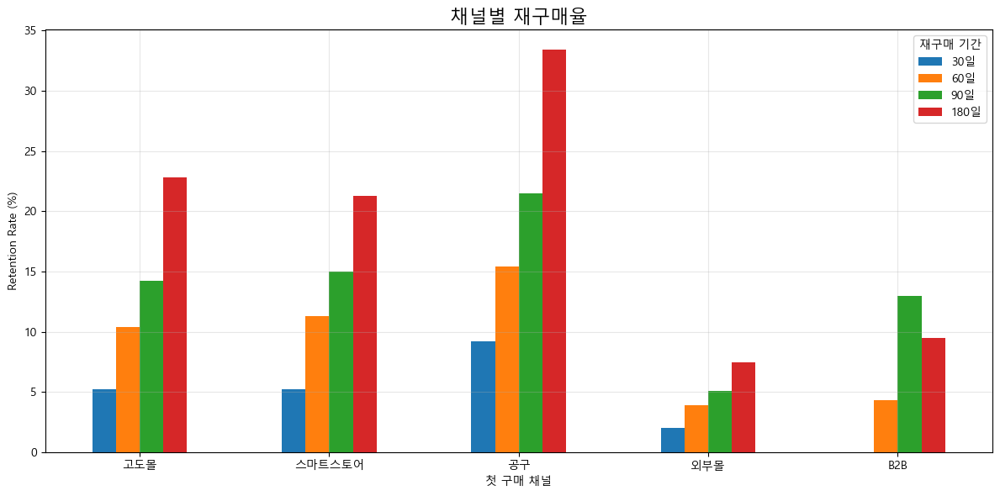

In [846]:
# PPT용 그래프
plot_df = retention_summary.set_index('채널')[
    ['30d', '60d', '90d', '180d']
].copy()

plot_df.index = [
    '고도몰' if x == '자사몰'
    else '스마트스토어' if x == '자사몰_N'
    else x
    for x in plot_df.index
]

# 채널명 변경
plot_df = plot_df.rename(index={
    '자사몰': '고도몰',
    '자사몰_N': '스마트스토어'
})

# 범례명 변경
plot_df.columns = [
    '30일',
    '60일',
    '90일',
    '180일'
]

plot_df.plot(
    kind='bar',
    figsize=(12, 6)
)

plt.title(
    '채널별 재구매율',
    fontsize=16
)

plt.xlabel('첫 구매 채널')
plt.ylabel('Retention Rate (%)')

plt.xticks(rotation=0)

plt.grid(alpha=0.3)

plt.legend(title='재구매 기간')

plt.tight_layout()
plt.show()

---

### 7-1. 채널별 독립 재구매율

- 추가 분석
- 기존 누적재구매율이 아닌 기간별 재구매율 다시 확인  
(각 구간에 처음으로 재구매한 고객 비율)  

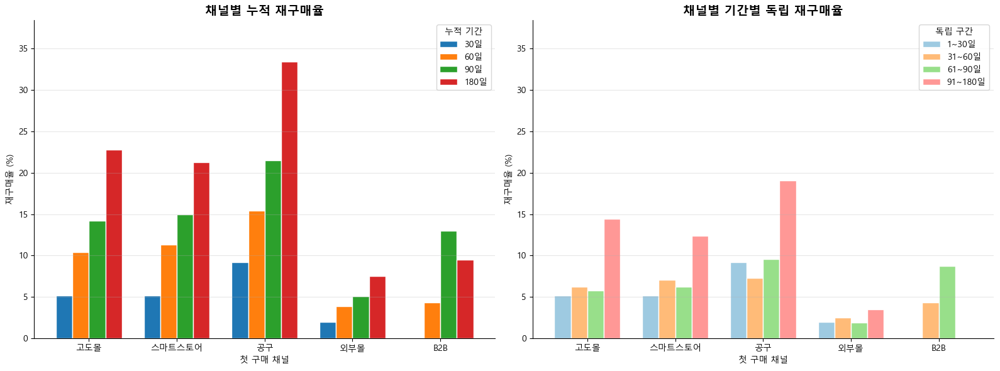

In [847]:
# =========================================================
# 채널별 기간별 독립 재구매율 계산
# =========================================================

windows_ind = [(1, 30), (31, 60), (61, 90), (91, 180)]
구간_list = ['1~30일', '31~60일', '61~90일', '91~180일']

results_ind_channel = []

for ch in channels:

    for start, end in windows_ind:

        cutoff = latest_date - pd.Timedelta(days=end)

        eligible_customers = first_order[
            (first_order['first_channel'] == ch) &
            (first_order['first_date'] <= cutoff)
        ]['receiver_key']

        if len(eligible_customers) == 0:
            continue

        sub = retention_df[
            retention_df['receiver_key'].isin(eligible_customers)
        ]

        reordered = (
            sub[
                (sub['days_since_first'] >= start) &
                (sub['days_since_first'] <= end)
            ]
            .groupby('receiver_key')
            .size()
            .ge(1)
            .sum()
        )

        results_ind_channel.append({
            '채널': ch,
            '구간': f'{start}~{end}일',
            '관찰 가능 고객수': len(eligible_customers),
            '구간 재구매율(%)': round(
                reordered / len(eligible_customers) * 100,
                1
            )
        })

df_ind_channel = pd.DataFrame(results_ind_channel)

# =========================================================
# 누적 재구매율 데이터
# =========================================================

plot_df = (
    retention_summary
    .set_index('채널')[['30d', '60d', '90d', '180d']]
    .copy()
)

plot_df.index = [
    '고도몰' if x == '자사몰'
    else '스마트스토어' if x == '자사몰_N'
    else x
    for x in plot_df.index
]

plot_df.columns = ['30일', '60일', '90일', '180일']

# =========================================================
# 독립 재구매율 데이터
# =========================================================

pivot_ind = (
    df_ind_channel
    .pivot(
        index='채널',
        columns='구간',
        values='구간 재구매율(%)'
    )
)

pivot_ind.index = [
    '고도몰' if x == '자사몰'
    else '스마트스토어' if x == '자사몰_N'
    else x
    for x in pivot_ind.index
]

pivot_ind = pivot_ind[구간_list]

# =========================================================
# 채널 순서 통일
# =========================================================

channel_order = [
    '고도몰',
    '스마트스토어',
    '공구',
    '외부몰',
    'B2B'
]

plot_df = plot_df.reindex(channel_order)
pivot_ind = pivot_ind.reindex(channel_order)

# =========================================================
# 시각화
# =========================================================

fig, axes = plt.subplots(
    1,
    2,
    figsize=(16, 6)
)

# -------------------------
# 누적 재구매율
# -------------------------

plot_df.plot(
    kind='bar',
    ax=axes[0],
    color=COHORT_COLORS_LIST,
    edgecolor='white',
    width=0.75
)

axes[0].set_title(
    '채널별 누적 재구매율',
    fontsize=14,
    fontweight='bold'
)

axes[0].legend(
    title='누적 기간'
)

# -------------------------
# 독립 재구매율
# -------------------------

pivot_ind.plot(
    kind='bar',
    ax=axes[1],
    color=COHORT_COLORS_LIGHT_LIST,
    edgecolor='white',
    width=0.75
)

axes[1].set_title(
    '채널별 기간별 독립 재구매율',
    fontsize=14,
    fontweight='bold'
)

axes[1].legend(
    title='독립 구간'
)

# -------------------------
# 공통 스타일
# -------------------------

max_y = max(
    plot_df.max().max(),
    pivot_ind.max().max()
)

for ax in axes:

    ax.set_xlabel('첫 구매 채널')
    ax.set_ylabel('재구매율 (%)')

    ax.tick_params(
        axis='x',
        rotation=0
    )

    ax.set_ylim(
        0,
        max_y * 1.15
    )

    ax.grid(
        axis='y',
        alpha=0.3
    )

    ax.spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.show()

---

## 8. 공구 이후 자사몰 매출 영향 분석

,gonggu_sales,owned_sales
analysis_date,,
2025-01-01,0,28134806
2025-01-02,4843454,31651407
2025-01-03,1676016,26293260
2025-01-04,0,17726310
2025-01-05,0,23441810


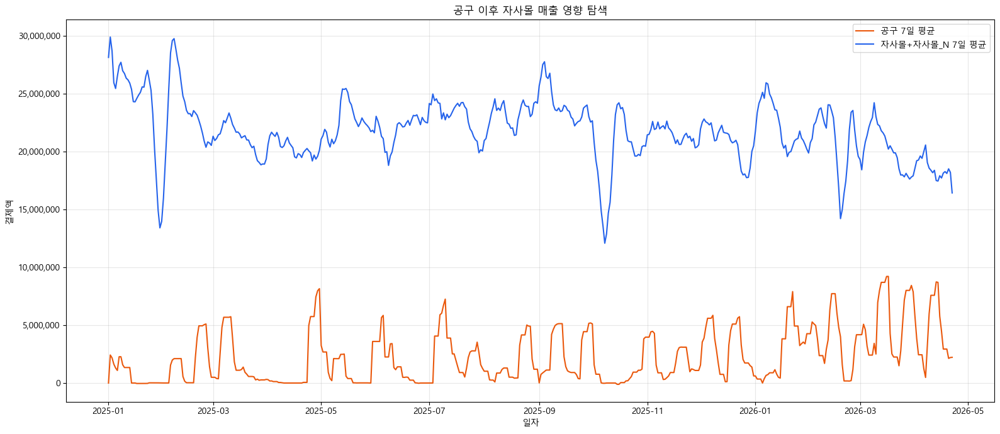

공구 이벤트 후보일 수: 24
공구 이벤트 기준 매출 threshold (매출 상위 5%): 12,959,728

공구 이벤트 후보일 전체:


,analysis_date,gonggu_sales,owned_sales,gonggu_ratio
19,2026-03-11,34658530,21584305,61.62
3,2025-04-24,34395643,20573530,62.57
7,2025-07-04,28395112,19795610,58.92
5,2025-05-30,25146329,24059905,51.10
14,2026-01-16,24866280,14302200,63.49
10,2025-09-25,24594739,27880100,46.87
13,2025-12-17,22487000,22517500,49.97
9,2025-09-08,21431374,27764720,43.56
15,2026-01-19,21310900,22336455,48.83
22,2026-04-08,20524840,17685100,53.72


,event_date,gonggu_sales,pre_14d_owned_avg,post_14d_owned_avg,post_minus_pre,post_change_rate
19,2026-03-11,34658530,"21,485,145.00","19,241,943.57","-2,243,201.43",-0.10
3,2025-04-24,34395643,"19,905,085.00","20,876,616.00","971,531.00",0.05
7,2025-07-04,28395112,"23,648,753.64","23,572,030.71","-76,722.93",-0.00
5,2025-05-30,25146329,"21,943,293.93","21,147,677.50","-795,616.43",-0.04
14,2026-01-16,24866280,"23,976,407.07","20,564,303.21","-3,412,103.86",-0.14
10,2025-09-25,24594739,"23,111,874.29","16,845,376.43","-6,266,497.86",-0.27
13,2025-12-17,22487000,"21,253,598.07","19,405,693.79","-1,847,904.29",-0.09
9,2025-09-08,21431374,"25,475,006.07","23,216,412.14","-2,258,593.93",-0.09
15,2026-01-19,21310900,"22,351,314.14","21,440,281.64","-911,032.50",-0.04
22,2026-04-08,20524840,"19,236,497.00","17,168,639.57","-2,067,857.43",-0.11


,지표,값
0,공구 이벤트 후보일 수,24.00
1,이벤트 전 14일 자사몰 평균,"21,563,728.20"
2,이벤트 후 14일 자사몰 평균,"20,746,529.84"
3,평균 변화액,"-817,198.36"
4,평균 변화율,-0.03


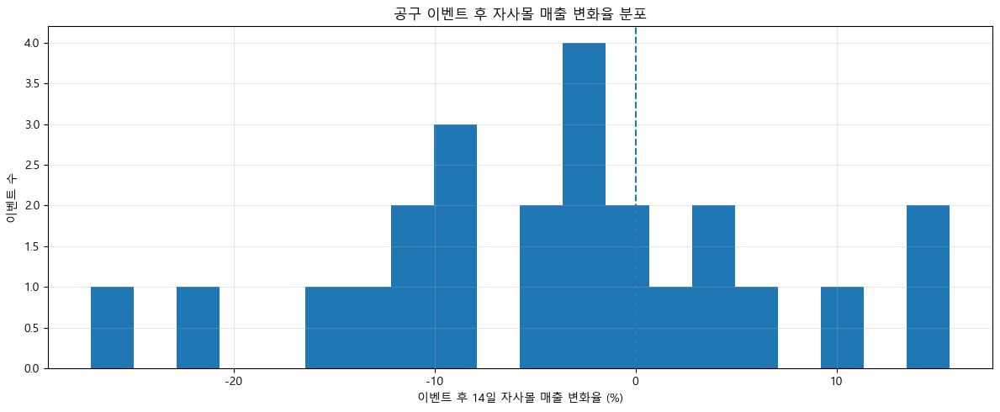

In [848]:
# =========================================================
# 일별 공구 매출 / 자사몰 매출 생성
# =========================================================

daily_channel_sales = (
    df_eda
    .groupby(['analysis_date', 'channel_group'])['결제액']
    .sum()
    .unstack(fill_value=0)
)

daily_channel_sales.index = pd.to_datetime(daily_channel_sales.index)

daily_impact = pd.DataFrame(index=daily_channel_sales.index)

daily_impact['gonggu_sales'] = daily_channel_sales.get('공구', 0)
daily_impact['owned_sales'] = (
    daily_channel_sales.get('자사몰', 0)
    + daily_channel_sales.get('자사몰_N', 0)
)

display(daily_impact.head())



# =========================================================
# 공구 매출과 자사몰 매출 rolling trend
# =========================================================

daily_impact['gonggu_7d'] = daily_impact['gonggu_sales'].rolling(7, min_periods=1).mean()
daily_impact['owned_7d'] = daily_impact['owned_sales'].rolling(7, min_periods=1).mean()

plt.figure(figsize=(16, 7))

plt.plot(
    daily_impact.index,
    daily_impact['gonggu_7d'],
    label='공구 7일 평균',
    color=CH_COLOR.get('공구', '#333333')
)

plt.plot(
    daily_impact.index,
    daily_impact['owned_7d'],
    label='자사몰+자사몰_N 7일 평균',
    color=CH_COLOR.get('자사몰', '#333333')
)

plt.title('공구 이후 자사몰 매출 영향 탐색')
plt.xlabel('일자')
plt.ylabel('결제액')
plt.gca().yaxis.set_major_formatter(
    ticker.FuncFormatter(lambda x, pos: f'{int(x):,}')
)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()



# =========================================================
# 공구 spike일 기준 전후 자사몰 매출 비교
# =========================================================

# 공구 매출 상위 5% 날짜를 이벤트일로 정의
threshold = daily_impact['gonggu_sales'].quantile(0.95)

# 이벤트 후보일 추출
event_candidates = (
    daily_impact[
        daily_impact['gonggu_sales'] >= threshold
    ]
    .reset_index()
    .rename(columns={'index': 'analysis_date'})
    .sort_values('analysis_date')
)

print(f"공구 이벤트 후보일 수: {len(event_candidates)}")
print(f"공구 이벤트 기준 매출 threshold (매출 상위 5%): {threshold:,.0f}")

# 이벤트 후보일 전체 출력
event_candidates_display = event_candidates.copy()

event_candidates_display['gonggu_ratio'] = (
    event_candidates_display['gonggu_sales'] /
    (
        event_candidates_display['gonggu_sales']
        + event_candidates_display['owned_sales']
    )
)

event_candidates_display['gonggu_ratio'] = (
    event_candidates_display['gonggu_ratio'] * 100
).round(2)

print("\n공구 이벤트 후보일 전체:")
display(
    event_candidates_display[
        [
            'analysis_date',
            'gonggu_sales',
            'owned_sales',
            'gonggu_ratio'
        ]
    ]
    .sort_values('gonggu_sales', ascending=False)
)

# 이벤트별 전후 비교
event_impact = []

for dt in event_candidates['analysis_date']:

    pre = daily_impact.loc[
        dt - pd.Timedelta(days=14):
        dt - pd.Timedelta(days=1),
        'owned_sales'
    ].mean()

    post = daily_impact.loc[
        dt + pd.Timedelta(days=1):
        dt + pd.Timedelta(days=14),
        'owned_sales'
    ].mean()

    current_gonggu = daily_impact.loc[dt, 'gonggu_sales']

    event_impact.append({
        'event_date': dt,
        'gonggu_sales': current_gonggu,
        'pre_14d_owned_avg': pre,
        'post_14d_owned_avg': post,
        'post_minus_pre': post - pre,
        'post_change_rate': ((post - pre) / pre if pre != 0 else np.nan)
    })

event_impact_df = pd.DataFrame(event_impact)

pd.options.display.float_format = '{:,.2f}'.format

display(
    event_impact_df
    .sort_values('gonggu_sales', ascending=False)
)



# =========================================================
# 공구 이벤트 전후 자사몰 매출 변화 요약
# =========================================================

impact_summary = pd.DataFrame({
    '지표': [
        '공구 이벤트 후보일 수',
        '이벤트 전 14일 자사몰 평균',
        '이벤트 후 14일 자사몰 평균',
        '평균 변화액',
        '평균 변화율'
    ],
    '값': [
        len(event_impact_df),
        event_impact_df['pre_14d_owned_avg'].mean(),
        event_impact_df['post_14d_owned_avg'].mean(),
        event_impact_df['post_minus_pre'].mean(),
        event_impact_df['post_change_rate'].mean()
    ]
})

display(impact_summary)



# =========================================================
# 이벤트 전후 변화 시각화
# =========================================================

plt.figure(figsize=(12, 5))

plt.hist(
    event_impact_df['post_change_rate'].dropna() * 100,
    bins=20
)

plt.axvline(0, linestyle='--')

plt.title('공구 이벤트 후 자사몰 매출 변화율 분포')
plt.xlabel('이벤트 후 14일 자사몰 매출 변화율 (%)')
plt.ylabel('이벤트 수')

plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

- 분석 가능한 강한 공구 이벤트(공구 매출 상위 5%)는 총 24회  

<br>  

- 공구 전후 자사몰(고도몰, 스마트스토어) 평균 매출 비교  
    → 공구 강한 이벤트 이후 자사몰 매출은 평균 -3%(-817,198원) 감소  
    → 생각보다 감소폭이 작음  
    (공구 비중이 50~60%까지 올라간 강한 이벤트임에도 감소폭 작음)  

<br>  

- 이벤트별로 보면 전/후 비교가 감소하기도 하고 증가하기도 함  
    - 2025-05-08 : +16%  
    - 2026-02-26 : +15%  
    - 2025-08-21 : +11%  
    - 2025-10-30 : +7%  
    - 2025-09-25 : -27%  
    - 2026-02-12 : -21%  
    - 2025-02-19 : -14%  
    - 2026-01-16 : -14%  

<br>  

- 히스토그램 그래프 : 항상 감소하는 패턴은 아님  
진짜 잠식이면 대부분 음수 & 왼쪽에 몰려야하나, 플러스/마이너스 모두 많고 평균만 약간 음수  
즉, 구조적 잠심이라 보기 어려움  
    - 다만, 일부 이벤트는 cannibalization 가능성 존재  
    특정 공구는 -20% 이상 감소  
    셀러/상품별 차이 가능성이 큼  

<br>  

> - 공구가 자사몰 매출을 구조적으로 잠식한다고 보기 어려움  
>   - 다만, 이벤트별 편차가 매우 크고  
>   일부 공구는 자사몰 매출 하락과 함께 발생하며,  
>   일부는 오히려 자사몰 매출 상승과 동반 됨  
>   → 공구 = 무조건 cannibalization(잠식)이라는 단순 결론은 성립하지 않음  
>   → 오히려 “공구 유형/브랜드/셀러에 따라 자사몰 영향이 달라진다”에 더 가까움  

> - 이전 retention 분석과 연결하면, 공구로 유입된 고객 cohort의 전체 재구매율이 높음
>   → 공구는 단순 저가채널이 아니라 장기 재구매 고객 acquisition 역할 가능성이 보임  

cf. 다만, 본 분석에서는 설/가정의달/추석/연말 등의 시즌성 영향을 배제한 분석임을 감안하고 봐야 함

---

## 9. 채널 전체 기준 재구매율 확인

(경도님 분석)

채널별 전체 누적 재구매율:


,채널,30일(%),30일_고객수,60일(%),60일_고객수,90일(%),90일_고객수,180일(%),180일_고객수
0,고도몰,5.20,8555,10.40,8129,14.20,7836,22.80,6455
1,스마트스토어,5.20,57711,11.30,54774,15.00,51896,21.30,42209
2,공구,9.20,9175,15.40,8539,21.50,7667,33.40,6200
3,외부몰,2.00,1879,3.90,1833,5.10,1781,7.50,1527
4,B2B,0.00,28,4.30,23,13.00,23,9.50,21


채널별 전체 독립 재구매율:


,채널,구간,관찰 가능 고객수,구간 재구매율(%)
0,고도몰,1~30일,8555,5.20
1,고도몰,31~60일,8129,6.20
2,고도몰,61~90일,7836,5.80
3,고도몰,91~180일,6455,14.40
4,스마트스토어,1~30일,57711,5.20
5,스마트스토어,31~60일,54774,7.10
6,스마트스토어,61~90일,51896,6.20
7,스마트스토어,91~180일,42209,12.40
8,공구,1~30일,9175,9.20
9,공구,31~60일,8539,7.30


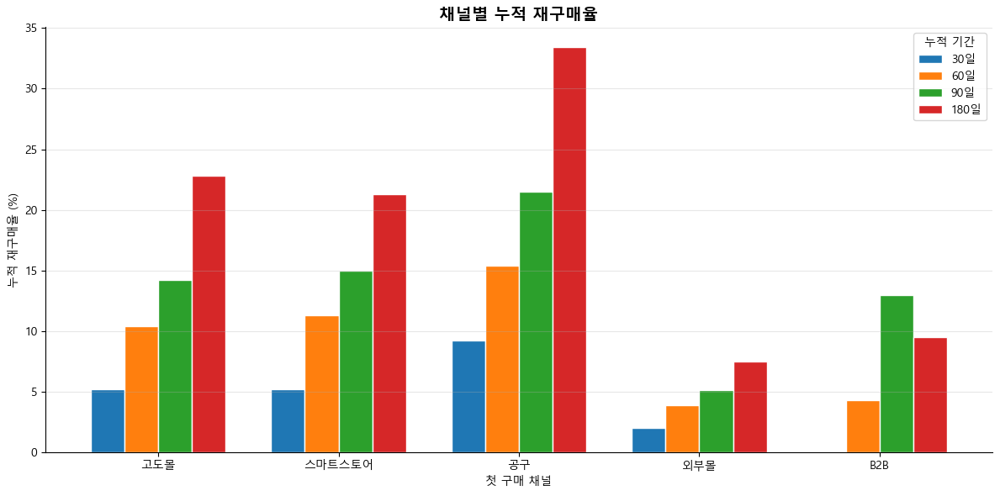

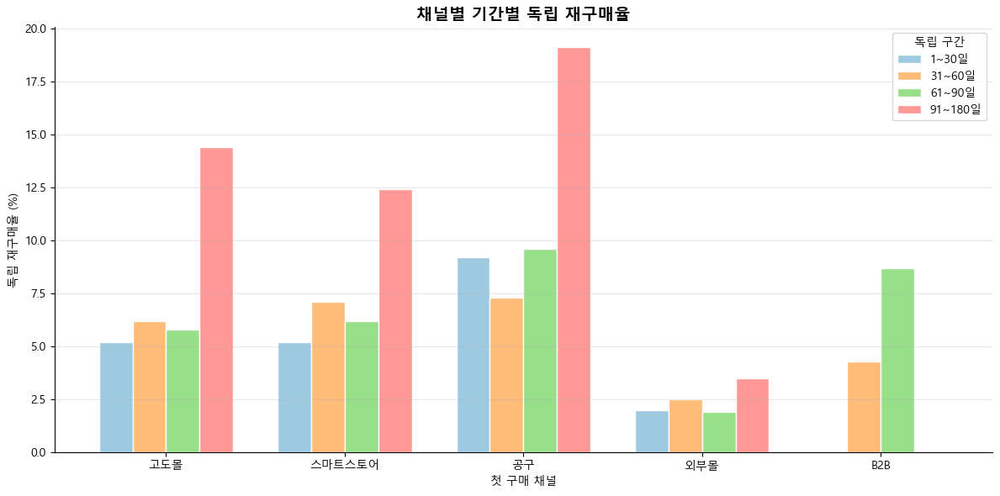

In [849]:
# 날짜형 보장
df_eda['analysis_date'] = pd.to_datetime(df_eda['analysis_date'])

# 고객키 결측 제거
order_df = df_eda[
    df_eda['receiver_key'].notna()
].copy()


# =========================================================
# 각 고객의 첫 구매 날짜 / 첫 구매 채널
# =========================================================

first_order = (
    order_df
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
)

first_order = first_order[[
    'receiver_key',
    'analysis_date',
    'channel_group'
]].rename(columns={
    'analysis_date': 'first_date',
    'channel_group': 'first_ch'
})


# =========================================================
# 전체 구매 이력에 첫 구매 정보 붙이기
# =========================================================

order_df_x = order_df.merge(
    first_order,
    on='receiver_key',
    how='left'
)

order_df_x['days_since_first'] = (
    order_df_x['analysis_date'] - order_df_x['first_date']
).dt.days


# =========================================================
# 30/60/90/180일 윈도우별 retention rate
# =========================================================

channels = [
    '자사몰',
    '자사몰_N',
    '공구',
    '외부몰',
    'B2B'
]

windows = [30, 60, 90, 180]

# 데이터 최신일 기준으로 관찰 가능 고객만 포함
latest_date = order_df['analysis_date'].max()

results = []

for ch in channels:
    row = {'채널': ch}

    for d in windows:
        cutoff = latest_date - pd.Timedelta(days=d)

        # 해당 기간을 관찰할 수 있는 고객만 포함
        elig = first_order[
            (first_order['first_ch'] == ch) &
            (first_order['first_date'] <= cutoff)
        ]['receiver_key']

        if len(elig) == 0:
            row[f'{d}d'] = np.nan
            row[f'{d}d_n'] = 0
            continue

        sub = order_df_x[
            order_df_x['receiver_key'].isin(elig)
        ]

        reord = (
            sub[
                (sub['days_since_first'] > 0) &
                (sub['days_since_first'] <= d)
            ]
            .groupby('receiver_key')
            .size()
            .ge(1)
            .sum()
        )

        row[f'{d}d'] = round(reord / len(elig) * 100, 1)
        row[f'{d}d_n'] = len(elig)

    results.append(row)

channel_retention = pd.DataFrame(results)

channel_retention_display = channel_retention.copy()

channel_retention_display['채널'] = channel_retention_display['채널'].replace({
    '자사몰': '고도몰',
    '자사몰_N': '스마트스토어'
})

channel_retention_display = channel_retention_display.rename(columns={
    '30d': '30일(%)',
    '60d': '60일(%)',
    '90d': '90일(%)',
    '180d': '180일(%)',
    '30d_n': '30일_고객수',
    '60d_n': '60일_고객수',
    '90d_n': '90일_고객수',
    '180d_n': '180일_고객수'
})

rate_cols = ['30일(%)', '60일(%)', '90일(%)', '180일(%)']

for col in rate_cols:
    channel_retention_display[col] = (
        channel_retention_display[col]
        .round(1)
    )

print("채널별 전체 누적 재구매율:")
display(channel_retention_display)


# =========================================================
# 채널별 기간별 독립 재구매율
# =========================================================

results_ind_channel = []

for ch in channels:

    for start, end in windows_ind:

        cutoff = latest_date - pd.Timedelta(days=end)

        elig = first_order[
            (first_order['first_ch'] == ch) &
            (first_order['first_date'] <= cutoff)
        ]['receiver_key']

        if len(elig) == 0:
            continue

        sub = order_df_x[
            order_df_x['receiver_key'].isin(elig)
        ]

        reord = (
            sub[
                (sub['days_since_first'] >= start) &
                (sub['days_since_first'] <= end)
            ]
            .groupby('receiver_key')
            .size()
            .ge(1)
            .sum()
        )

        results_ind_channel.append({
            '채널': ch,
            '구간': f'{start}~{end}일',
            '관찰 가능 고객수': len(elig),
            '구간 재구매율(%)':
                round(reord / len(elig) * 100, 1)
        })

df_ind_channel = pd.DataFrame(results_ind_channel)

df_ind_channel_display = df_ind_channel.copy()

df_ind_channel_display['채널'] = df_ind_channel_display['채널'].replace({
    '자사몰': '고도몰',
    '자사몰_N': '스마트스토어'
})

print("채널별 전체 독립 재구매율:")
display(df_ind_channel_display)

plot_df = (
    channel_retention
    .set_index('채널')[['30d','60d','90d','180d']]
    .copy()
)

plot_df.index = [
    '고도몰' if x == '자사몰'
    else '스마트스토어' if x == '자사몰_N'
    else x
    for x in plot_df.index
]

plot_df.columns = [
    '30일',
    '60일',
    '90일',
    '180일'
]

pivot_ind = (
    df_ind_channel
    .pivot(
        index='채널',
        columns='구간',
        values='구간 재구매율(%)'
    )
)

pivot_ind.index = [
    '고도몰' if x == '자사몰'
    else '스마트스토어' if x == '자사몰_N'
    else x
    for x in pivot_ind.index
]

pivot_ind = pivot_ind[
    ['1~30일','31~60일','61~90일','91~180일']
]

channel_order = [
    '고도몰',
    '스마트스토어',
    '공구',
    '외부몰',
    'B2B'
]

plot_df = plot_df.reindex(channel_order)
pivot_ind = pivot_ind.reindex(channel_order)

# =========================================================
# 1) 채널별 누적 재구매율 시각화
# =========================================================

fig, ax = plt.subplots(figsize=(12, 6))

plot_df.plot(
    kind='bar',
    ax=ax,
    color=COHORT_COLORS_LIST,
    edgecolor='white',
    width=0.75
)

ax.set_title('채널별 누적 재구매율', fontsize=14, fontweight='bold')
ax.set_xlabel('첫 구매 채널')
ax.set_ylabel('누적 재구매율 (%)')
ax.tick_params(axis='x', rotation=0)
ax.grid(axis='y', alpha=0.3)
ax.legend(title='누적 기간')
ax.spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.show()


# =========================================================
# 2) 채널별 기간별 독립 재구매율 시각화
# =========================================================

fig, ax = plt.subplots(figsize=(12, 6))

pivot_ind.plot(
    kind='bar',
    ax=ax,
    color=COHORT_COLORS_LIGHT_LIST,
    edgecolor='white',
    width=0.75
)

ax.set_title('채널별 기간별 독립 재구매율', fontsize=14, fontweight='bold')
ax.set_xlabel('첫 구매 채널')
ax.set_ylabel('독립 재구매율 (%)')
ax.tick_params(axis='x', rotation=0)
ax.grid(axis='y', alpha=0.3)
ax.legend(title='독립 구간')
ax.spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.show()

- 공구 고객 재구매율이 압도적으로 높음  
    - 180일 기준, 약 + 11%p 공구 재구매율이 자사몰보다 높음  
    - 공구 고객 품질이 낮지 않음  
    - 공구 고객은 장기 고객화 가능성이 높음  

| 기간   | 자사몰 | 공구    |
| ---- | ------ | ----- |
| 30일  | 5.2%   | 9.3%  |
| 90일  | 14~15% | 21.6% |
| 180일 | 21~23% | 33.7% |

<br>  

- 자사몰 고객보다 공구 고객이 더 잘 남는 이유 (가설)  
    - 공구 셀러 큐레이션 효과  
    좋은 셀러일수록 설명, 신뢰, 사용 경험, 콘텐츠가 강하므로  
    단순 할인보다 설득 기반 구매일 가능성 높음  
    - 공구 SKU 특성  
    공구 상품이 소모성, 반복 구매형, 건강/생활재 비중이 높을 수 있음  
    - 공구는 신규 유입 기능이 강함  
    자사몰은 기존 충성고객 중심이고,  
    공구는 새 고객 대량 유입 후 만족 시 반복 구매 구조일 수 있음  

cf. 본 분석은 "공구 고객이 진짜 더 좋은 고객인가?"가 아직 증명되지 않은 상태에서 진행 됨

---

### 9-1. 공구 고객의 재구매 destination 분석  

“공구 고객이 이후 어디로 재구매하는가”  

- 공구가 acquisition funnel인지  
- 공구 안에서만 도는지  
- 자사몰 전환 구조가 있는지 확인하기  

공구 첫 구매 고객 수:
10000
재구매 발생 고객 수:
3111

(자사몰_N = 스마트스토어)
(자사몰 = 고도몰)

첫 재구매 미리보기:


,receiver_key,repurchase_date,repurchase_channel,days_to_repurchase,repurchase_pay
0,0010dd8a4de8bc72,2025-09-26,자사몰_N,65.00,27300
1,0018ece276a20f87,2025-06-05,공구,1.00,0
2,001b4348aca5e190,2025-05-12,공구,66.00,11359
3,001c36cbe96e13d9,2026-01-16,공구,79.00,0
4,00768b99a3360e27,2025-05-22,공구,28.00,4000


공구 고객 재구매 destination:


,repurchase_channel,고객수,평균_재구매일,평균_재구매금액,비중(%)
0,공구,2570,81.54,"14,597.29",82.60
3,자사몰_N,398,94.47,"18,919.07",12.80
2,자사몰,141,102.58,"14,374.13",4.50
1,외부몰,2,124.00,0.00,0.10


,repurchase_channel,고객수,비중(%)
0,공구,2570,82.61
3,자사몰_N,398,12.79
2,자사몰,141,4.53
1,외부몰,2,0.06


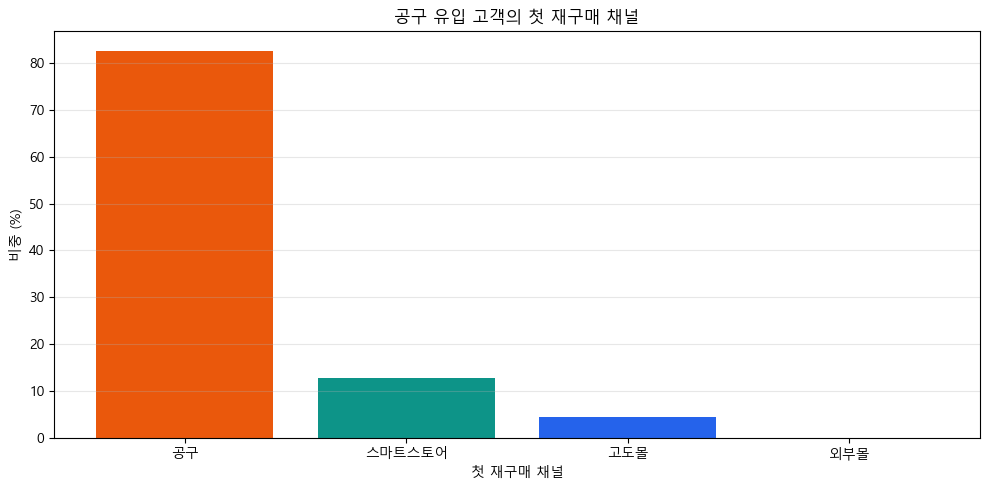

In [850]:
# =========================================================
# 공구 고객 재구매 destination 분석
# =========================================================

# 공구 첫 구매 고객
gonggu_customers = first_order[
    first_order['first_ch'] == '공구'
].copy()

# 전체 구매이력에서 공구 고객만
gonggu_history = order_df_x[
    order_df_x['receiver_key'].isin(
        gonggu_customers['receiver_key']
    )
].copy()

# 첫 구매 이후 구매만
repurchase_history = gonggu_history[
    gonggu_history['days_since_first'] > 0
].copy()

print("공구 첫 구매 고객 수:")
print(gonggu_customers['receiver_key'].nunique())

print("재구매 발생 고객 수:")
print(repurchase_history['receiver_key'].nunique())

print("\n(자사몰_N = 스마트스토어)")
print("(자사몰 = 고도몰)\n")


# =========================================================
# 고객별 첫 재구매 채널
# =========================================================

first_repurchase = (
    repurchase_history
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
)

first_repurchase = first_repurchase[[
    'receiver_key',
    'analysis_date',
    'channel_group',
    'days_since_first',
    '결제액'
]].rename(columns={
    'analysis_date': 'repurchase_date',
    'channel_group': 'repurchase_channel',
    'days_since_first': 'days_to_repurchase',
    '결제액': 'repurchase_pay'
})

print("첫 재구매 미리보기:")
display(first_repurchase.head())



# =========================================================
# 재구매 채널 분포
# =========================================================

destination_summary = (
    first_repurchase
    .groupby('repurchase_channel')
    .agg(
        고객수=('receiver_key', 'nunique'),
        평균_재구매일=('days_to_repurchase', 'mean'),
        평균_재구매금액=('repurchase_pay', 'mean')
    )
    .reset_index()
)

destination_summary['비중(%)'] = (
    destination_summary['고객수']
    / destination_summary['고객수'].sum()
    * 100
).round(1)

destination_summary = (
    destination_summary
    .sort_values('고객수', ascending=False)
)

print("공구 고객 재구매 destination:")
display(destination_summary)



# =========================================================
# 재구매 destination 시각화
# =========================================================

destination_summary = (
    first_repurchase
    .groupby('repurchase_channel')
    .agg(
        고객수=('receiver_key', 'nunique')
    )
    .reset_index()
)

destination_summary['비중(%)'] = (
    destination_summary['고객수']
    / destination_summary['고객수'].sum()
    * 100
).round(2)

destination_summary = (
    destination_summary
    .sort_values('비중(%)', ascending=False)
)

display(destination_summary)

channel_label = {
    '공구': '공구',
    '자사몰_N': '스마트스토어',
    '자사몰': '고도몰',
    '외부몰': '외부몰',
    'B2B': 'B2B'
}

plt.figure(figsize=(10, 5))

plt.bar(
    destination_summary['repurchase_channel'],
    destination_summary['비중(%)'],
    color=[
        CH_COLOR.get(ch, '#333333')
        for ch in destination_summary['repurchase_channel']
    ]
)

plt.title('공구 유입 고객의 첫 재구매 채널')
plt.xlabel('첫 재구매 채널')
plt.ylabel('비중 (%)')

plt.xticks(
    ticks=range(len(destination_summary)),
    labels=[
        channel_label.get(ch, ch)
        for ch in destination_summary['repurchase_channel']
    ],
    rotation=0
)

plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

- 공구 고객의 첫 재구매 81.9%가 다시 공구에서 발생  
    - 공구는 단순 체험 채널이 아니라, 자체적인 반복 구매 생태계를 형성 중  
    - 공구 내부 retention loop에 더 가까운 구조  

<br>  

- 공구 자체 retention이 매우 강함  
    - 재구매 고객의 82.6%가 다시 공구에서 구매  
    - 공구는 단순 체험 채널이 아니라 자체 생태계 형성  
    - 공구 → 공구 루프가 강하게 존재  
    - 공구 → 자사몰 funnel은 제한적  

<br>  

- 하지만 자사몰 전환 고객의 구매액은 더 높음 (quality 높음)  
→ 자사몰로 이동한 고객은 브랜드 충성도가 높은 "상위 고객"일 가능성 있음  
    - 공구 재구매는 빈도는 높지만 객단가는 낮고  
    - 자사몰 이동 고객은 객단가가 더 높음을 확인  

<br>  

- 재구매 시점도 의미 있음  
→ 공구 내 재구매는 비교적 빠르게 발생하고, 자사몰 이동은 더 늦게 발생  
→ 공구에서 여러 번 구매한 뒤 자사몰로 넘어가는 경로가 존재할 가능성 있음  

<br>  

> - 공구 고객의 첫 재구매는 82.6%가 다시 공구에서 발생했으며,  
> - 자사몰(스마트스토어·고도몰) 전환은 전체 공구 고객의 약 5.4% 수준에 그쳤다.  
> - 다만 자사몰 전환 고객은 재구매 금액이 더 높고 전환 시점도 늦게 나타나,  
> - 공구를 통해 유입된 고객 중 일부가 시간이 지나며 고가치 고객으로 전환되는 구조가 관찰된다.

---

### 9-2. 공구 이벤트 유형별 영향

"어떤 공구 이벤트가 자사몰 매출에 영향을 주는가?"

공구 이벤트일 수: 24
공구 이벤트 threshold: 12,959,728


,event_date,gonggu_sales,owned_sales
0,2025-02-19,15211821,23505813
1,2025-03-05,16700743,27333416
2,2025-03-06,16195860,25236040
3,2025-04-24,34395643,20573530
4,2025-05-08,13362150,24577747


공구 이벤트별 자사몰 매출 영향:


,event_date,gonggu_sales,owned_sales_on_event,pre_owned_avg,post_owned_avg,post_minus_pre,post_change_rate,main_seller,seller_sales,seller_customers,main_brand,brand_sales,brand_customers,main_sku_family,sku_sales,sku_customers,main_keyword,keyword_sales,keyword_customers,post_change_direction
19,2026-03-11,34658530,21584305,"21,485,145.00","19,241,943.57","-2,243,201.43",-10.44,뚜미니네,34899530,317,그로우랩,34899530,317,지니어스뉴 드롭스(5개입),18469102,261,면역,34899530,317,감소
3,2025-04-24,34395643,20573530,"19,905,085.00","20,876,616.00","971,531.00",4.88,뚜미니네,34395643,478,그로우랩,34395643,478,지니어스뉴 드롭스(5개입),30740412,470,면역,30903746,474,증가
7,2025-07-04,28395112,19795610,"23,648,753.64","23,572,030.71","-76,722.93",-0.32,뚜미니네,28395112,365,그로우랩,28395112,365,지니어스뉴 드롭스(5개입),20649198,341,면역,28395112,365,감소
5,2025-05-30,25146329,24059905,"21,943,293.93","21,147,677.50","-795,616.43",-3.63,두둥맘,25132592,390,그로우랩,25132592,390,지니어스뉴 드롭스(5개입),14547110,304,면역,25132592,390,감소
14,2026-01-16,24866280,14302200,"23,976,407.07","20,564,303.21","-3,412,103.86",-14.23,두둥맘,24866280,209,그로우랩,24866280,209,지니어스뉴 드롭스(5개입),10687120,139,면역,22538280,195,감소
10,2025-09-25,24594739,27880100,"23,111,874.29","16,845,376.43","-6,266,497.86",-27.11,뚜미니네,24437139,330,그로우랩,24437139,330,지니어스뉴 드롭스(5개입),17337034,301,면역,23822079,314,감소
13,2025-12-17,22487000,22517500,"21,253,598.07","19,405,693.79","-1,847,904.29",-8.69,뚜미니네,22487000,202,그로우랩,22487000,202,지니어스뉴 드롭스(5개입),12041320,135,면역,21516000,190,감소
9,2025-09-08,21431374,27764720,"25,475,006.07","23,216,412.14","-2,258,593.93",-8.87,뚜미니네,12347970,309,파이토뉴트리,12347970,309,지니어스뉴 톡캡스(30캡슐),9180340,116,기타,12347970,309,감소
15,2026-01-19,21310900,22336455,"22,351,314.14","21,440,281.64","-911,032.50",-4.08,두둥맘,21310900,198,그로우랩,21310900,198,지니어스뉴 드롭스(5개입),8116800,113,면역,18948900,177,감소
22,2026-04-08,20524840,17685100,"19,236,497.00","17,168,639.57","-2,067,857.43",-10.75,애프리,20524840,184,그로우랩,20524840,184,지니어스뉴 톡캡스(30캡술*3),9523500,69,면역,20524840,184,감소



셀러별 공구 이벤트 이후 자사몰 매출 영향:


,main_seller,이벤트수,평균_공구매출,평균_전_자사몰매출,평균_후_자사몰매출,평균_변화액,평균_변화율,증가이벤트수,감소이벤트수,증가비율(%)
6,오프유,1,"18,149,460.00","23,296,146.14","18,429,056.14","-4,867,090.00",-20.89,0,1,0.00
5,애프리,2,"17,227,877.50","20,405,614.25","19,211,118.82","-1,194,495.43",-6.12,0,2,0.00
3,두둥맘,6,"20,132,249.50","23,039,566.05","21,908,228.62","-1,131,337.43",-4.70,1,5,16.70
4,뚜미니네,11,"22,918,144.27","21,546,681.51","20,850,912.00","-695,769.51",-2.89,5,6,45.50
2,돼지수,2,"15,342,600.00","19,167,820.89","18,850,971.04","-316,849.86",-1.65,0,2,0.00
1,강윤맘,1,"16,576,900.00","20,955,418.36","20,749,798.36","-205,620.00",-0.98,0,1,0.00
0,강산들,1,"15,039,500.00","18,880,149.14","21,804,278.21","2,924,129.07",15.49,1,0,100.00



브랜드별 공구 이벤트 이후 자사몰 매출 영향:


,main_brand,이벤트수,평균_공구매출,평균_전_자사몰매출,평균_후_자사몰매출,평균_변화액,평균_변화율,증가이벤트수,감소이벤트수,증가비율(%)
0,그로우랩,22,"20,591,198.86","21,430,175.92","20,495,143.15","-935,032.77",-4.03,6,16,27.30
1,파이토뉴트리,2,"17,396,762.00","23,032,803.29","23,511,783.43","478,980.14",3.38,1,1,50.00



SKU 제품군별 공구 이벤트 이후 자사몰 매출 영향:


,main_sku_family,이벤트수,평균_공구매출,평균_전_자사몰매출,평균_후_자사몰매출,평균_변화액,평균_변화율,증가이벤트수,감소이벤트수,증가비율(%)
0,그로우뉴,1,"18,149,460.00","23,296,146.14","18,429,056.14","-4,867,090.00",-20.89,0,1,0.00
1,그로우뉴 키즈,1,"20,269,280.00","18,809,737.00","17,008,423.15","-1,801,313.85",-9.58,0,1,0.00
3,지니어스뉴 드롭스(5개입),13,"22,940,086.46","22,287,651.45","21,135,538.38","-1,152,113.06",-4.91,4,9,30.80
5,지니어스뉴 톡캡스(30캡슐),4,"17,173,368.50","21,191,516.55","20,417,038.14","-774,478.41",-3.29,0,4,0.00
4,지니어스뉴 톡캡스(30캡술*3),3,"16,498,418.33","19,897,125.88","20,075,505.29","178,379.40",1.08,1,2,33.30
2,데이프로바,1,"19,609,156.00","20,636,080.57","22,015,414.71","1,379,334.14",6.68,1,0,100.00
6,투데이디3 오일밤(30캡슐x390캡슐),1,"13,362,150.00","20,590,600.50","23,807,154.71","3,216,554.21",15.62,1,0,100.00



건강 니즈별 공구 이벤트 이후 자사몰 매출 영향:


,main_keyword,이벤트수,평균_공구매출,평균_전_자사몰매출,평균_후_자사몰매출,평균_변화액,평균_변화율,증가이벤트수,감소이벤트수,증가비율(%)
2,뼈기능,1,"20,269,280.00","18,809,737.00","17,008,423.15","-1,801,313.85",-9.58,0,1,0.00
1,면역,20,"20,656,396.95","21,600,902.64","20,593,465.57","-1,007,437.06",-4.29,5,15,25.00
0,기타,3,"18,134,226.67","22,233,895.71","23,012,993.86","779,098.14",4.48,2,1,66.70


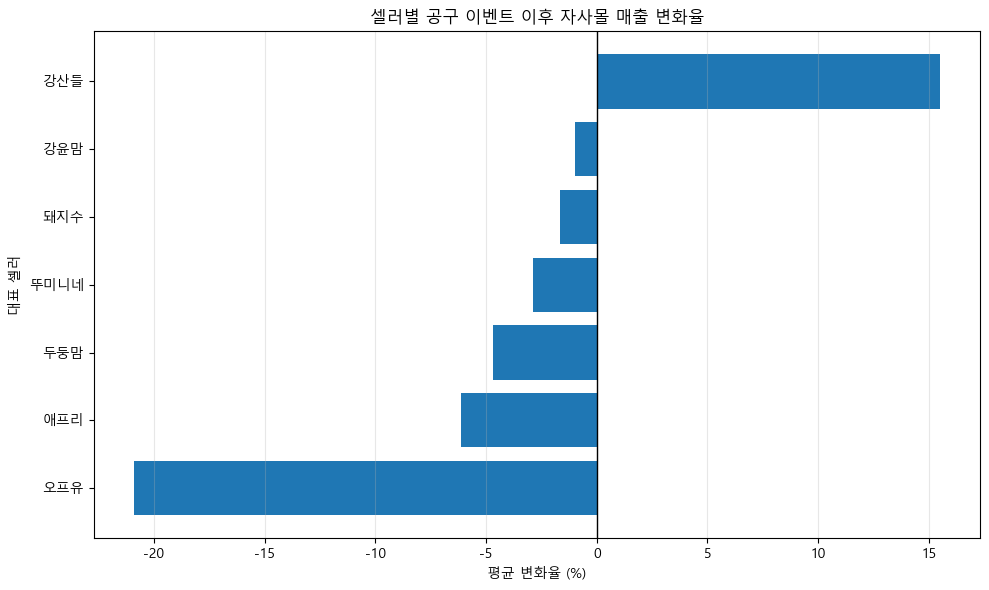

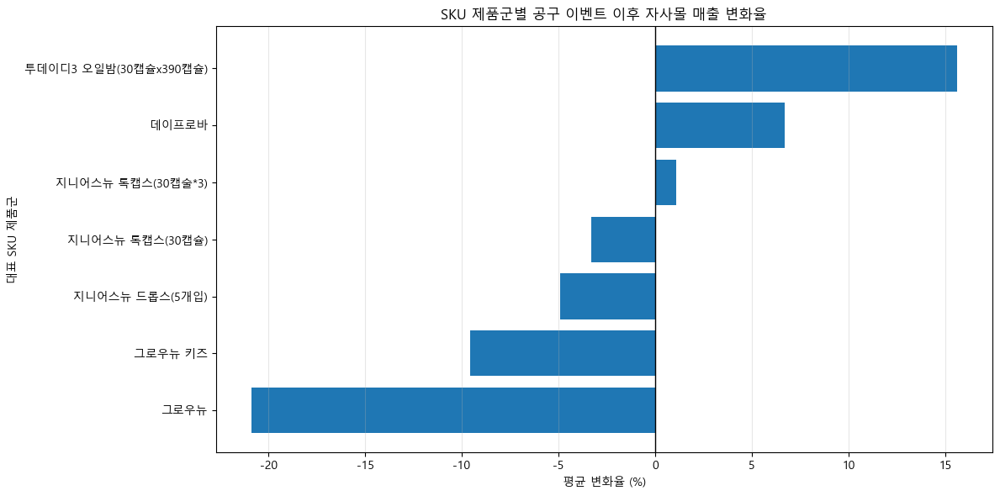

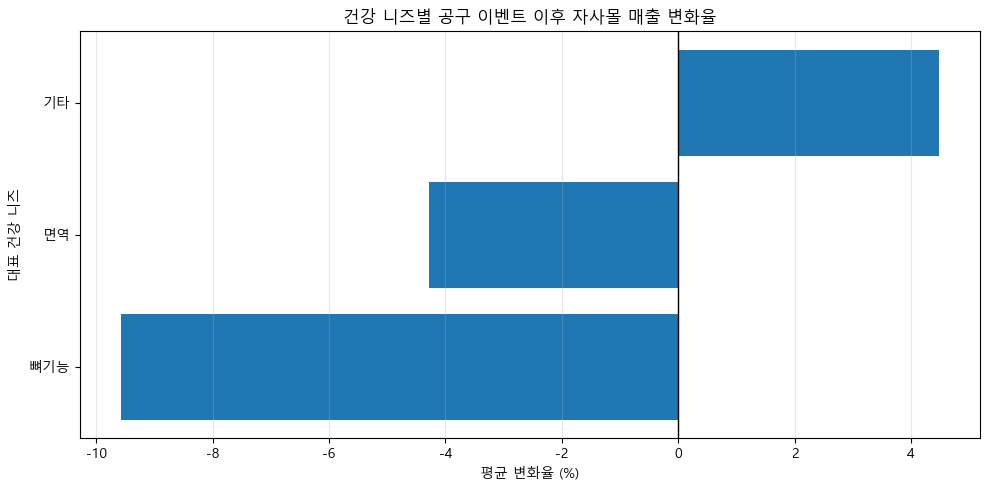

In [851]:
# ---------------------------------------------------------
# 0) 기본 설정
# ---------------------------------------------------------

df_eda['analysis_date'] = pd.to_datetime(df_eda['analysis_date'])

owned_channels = ['자사몰', '자사몰_N']
gonggu_channel = '공구'

PRE_DAYS = 14
POST_DAYS = 14
EVENT_QUANTILE = 0.95   # 공구 매출 상위 5% 날짜


# ---------------------------------------------------------
# 1) 일별 공구 / 자사몰 매출 생성
# ---------------------------------------------------------

daily_channel_sales = (
    df_eda
    .groupby(['analysis_date', 'channel_group'])['결제액']
    .sum()
    .unstack(fill_value=0)
)

daily_channel_sales.index = pd.to_datetime(daily_channel_sales.index)

daily_impact = pd.DataFrame(index=daily_channel_sales.index)

daily_impact['gonggu_sales'] = daily_channel_sales.get(gonggu_channel, 0)

daily_impact['owned_sales'] = (
    daily_channel_sales.get('자사몰', 0)
    + daily_channel_sales.get('자사몰_N', 0)
)


# ---------------------------------------------------------
# 2) 공구 이벤트일 정의
# ---------------------------------------------------------

threshold = daily_impact['gonggu_sales'].quantile(EVENT_QUANTILE)

event_dates = (
    daily_impact[
        daily_impact['gonggu_sales'] >= threshold
    ]
    .reset_index()
)

# reset_index 후 날짜 컬럼명 통일
date_col = event_dates.columns[0]

event_dates = (
    event_dates
    .rename(columns={date_col: 'event_date'})
    [['event_date', 'gonggu_sales', 'owned_sales']]
    .sort_values('event_date')
)

print(f"공구 이벤트일 수: {len(event_dates)}")
print(f"공구 이벤트 threshold: {threshold:,.0f}")

display(event_dates.head())


# ---------------------------------------------------------
# 3) 이벤트일별 대표 셀러/브랜드/SKU/키워드 추출
# ---------------------------------------------------------

event_gonggu_orders = df_eda[
    (df_eda['channel_group'] == gonggu_channel) &
    (df_eda['analysis_date'].isin(event_dates['event_date'])) &
    (df_eda['결제액'] > 0)
].copy()

# 이벤트일 x 셀러
event_seller_mix = (
    event_gonggu_orders
    .groupby(['analysis_date', 'goo_seller'])
    .agg(
        seller_sales=('결제액', 'sum'),
        seller_customers=('receiver_key', 'nunique')
    )
    .reset_index()
    .sort_values(['analysis_date', 'seller_sales'], ascending=[True, False])
)

event_main_seller = (
    event_seller_mix
    .groupby('analysis_date')
    .first()
    .reset_index()
    .rename(columns={
        'analysis_date': 'event_date',
        'goo_seller': 'main_seller'
    })
)

# 이벤트일 x 브랜드
event_brand_mix = (
    event_gonggu_orders
    .groupby(['analysis_date', '브랜드_분류'])
    .agg(
        brand_sales=('결제액', 'sum'),
        brand_customers=('receiver_key', 'nunique')
    )
    .reset_index()
    .sort_values(['analysis_date', 'brand_sales'], ascending=[True, False])
)

event_main_brand = (
    event_brand_mix
    .groupby('analysis_date')
    .first()
    .reset_index()
    .rename(columns={
        'analysis_date': 'event_date',
        '브랜드_분류': 'main_brand'
    })
)

# 이벤트일 x SKU
event_sku_mix = (
    event_gonggu_orders
    .groupby(['analysis_date', 'sku_family'])
    .agg(
        sku_sales=('결제액', 'sum'),
        sku_customers=('receiver_key', 'nunique')
    )
    .reset_index()
    .sort_values(['analysis_date', 'sku_sales'], ascending=[True, False])
)

event_main_sku = (
    event_sku_mix
    .groupby('analysis_date')
    .first()
    .reset_index()
    .rename(columns={
        'analysis_date': 'event_date',
        'sku_family': 'main_sku_family'
    })
)

# 이벤트일 x 키워드
event_keyword_mix = (
    event_gonggu_orders
    .groupby(['analysis_date', 'main_product_keyword'])
    .agg(
        keyword_sales=('결제액', 'sum'),
        keyword_customers=('receiver_key', 'nunique')
    )
    .reset_index()
    .sort_values(['analysis_date', 'keyword_sales'], ascending=[True, False])
)

event_main_keyword = (
    event_keyword_mix
    .groupby('analysis_date')
    .first()
    .reset_index()
    .rename(columns={
        'analysis_date': 'event_date',
        'main_product_keyword': 'main_keyword'
    })
)


# ---------------------------------------------------------
# 4) 이벤트 전후 자사몰 매출 변화 계산
# ---------------------------------------------------------

event_impact = []

for dt in event_dates['event_date']:

    pre_owned = daily_impact.loc[
        dt - pd.Timedelta(days=PRE_DAYS):
        dt - pd.Timedelta(days=1),
        'owned_sales'
    ].mean()

    post_owned = daily_impact.loc[
        dt + pd.Timedelta(days=1):
        dt + pd.Timedelta(days=POST_DAYS),
        'owned_sales'
    ].mean()

    gonggu_sales = daily_impact.loc[dt, 'gonggu_sales']
    owned_sales = daily_impact.loc[dt, 'owned_sales']

    event_impact.append({
        'event_date': dt,
        'gonggu_sales': gonggu_sales,
        'owned_sales_on_event': owned_sales,
        'pre_owned_avg': pre_owned,
        'post_owned_avg': post_owned,
        'post_minus_pre': post_owned - pre_owned,
        'post_change_rate': (
            (post_owned - pre_owned) / pre_owned * 100
            if pre_owned != 0 else np.nan
        )
    })

event_impact_df = pd.DataFrame(event_impact)


# ---------------------------------------------------------
# 5) 이벤트 유형 정보 붙이기
# ---------------------------------------------------------

event_impact_df = (
    event_impact_df
    .merge(event_main_seller[[
        'event_date',
        'main_seller',
        'seller_sales',
        'seller_customers'
    ]], on='event_date', how='left')
    .merge(event_main_brand[[
        'event_date',
        'main_brand',
        'brand_sales',
        'brand_customers'
    ]], on='event_date', how='left')
    .merge(event_main_sku[[
        'event_date',
        'main_sku_family',
        'sku_sales',
        'sku_customers'
    ]], on='event_date', how='left')
    .merge(event_main_keyword[[
        'event_date',
        'main_keyword',
        'keyword_sales',
        'keyword_customers'
    ]], on='event_date', how='left')
)

event_impact_df['post_change_direction'] = np.where(
    event_impact_df['post_change_rate'] >= 0,
    '증가',
    '감소'
)

print("공구 이벤트별 자사몰 매출 영향:")
display(
    event_impact_df
    .sort_values('gonggu_sales', ascending=False)
)


# ---------------------------------------------------------
# 6) 셀러별 이벤트 영향 요약
# ---------------------------------------------------------

seller_event_impact = (
    event_impact_df
    .groupby('main_seller')
    .agg(
        이벤트수=('event_date', 'nunique'),
        평균_공구매출=('gonggu_sales', 'mean'),
        평균_전_자사몰매출=('pre_owned_avg', 'mean'),
        평균_후_자사몰매출=('post_owned_avg', 'mean'),
        평균_변화액=('post_minus_pre', 'mean'),
        평균_변화율=('post_change_rate', 'mean'),
        증가이벤트수=('post_change_direction', lambda x: (x == '증가').sum()),
        감소이벤트수=('post_change_direction', lambda x: (x == '감소').sum())
    )
    .reset_index()
    .sort_values('평균_변화율')
)

seller_event_impact['증가비율(%)'] = (
    seller_event_impact['증가이벤트수']
    / seller_event_impact['이벤트수']
    * 100
).round(1)

print("\n셀러별 공구 이벤트 이후 자사몰 매출 영향:")
display(seller_event_impact)


# ---------------------------------------------------------
# 7) 브랜드별 이벤트 영향 요약
# ---------------------------------------------------------

brand_event_impact = (
    event_impact_df
    .groupby('main_brand')
    .agg(
        이벤트수=('event_date', 'nunique'),
        평균_공구매출=('gonggu_sales', 'mean'),
        평균_전_자사몰매출=('pre_owned_avg', 'mean'),
        평균_후_자사몰매출=('post_owned_avg', 'mean'),
        평균_변화액=('post_minus_pre', 'mean'),
        평균_변화율=('post_change_rate', 'mean'),
        증가이벤트수=('post_change_direction', lambda x: (x == '증가').sum()),
        감소이벤트수=('post_change_direction', lambda x: (x == '감소').sum())
    )
    .reset_index()
    .sort_values('평균_변화율')
)

brand_event_impact['증가비율(%)'] = (
    brand_event_impact['증가이벤트수']
    / brand_event_impact['이벤트수']
    * 100
).round(1)

print("\n브랜드별 공구 이벤트 이후 자사몰 매출 영향:")
display(brand_event_impact)


# ---------------------------------------------------------
# 8) SKU 제품군별 이벤트 영향 요약
# ---------------------------------------------------------

sku_event_impact = (
    event_impact_df
    .groupby('main_sku_family')
    .agg(
        이벤트수=('event_date', 'nunique'),
        평균_공구매출=('gonggu_sales', 'mean'),
        평균_전_자사몰매출=('pre_owned_avg', 'mean'),
        평균_후_자사몰매출=('post_owned_avg', 'mean'),
        평균_변화액=('post_minus_pre', 'mean'),
        평균_변화율=('post_change_rate', 'mean'),
        증가이벤트수=('post_change_direction', lambda x: (x == '증가').sum()),
        감소이벤트수=('post_change_direction', lambda x: (x == '감소').sum())
    )
    .reset_index()
    .sort_values('평균_변화율')
)

sku_event_impact['증가비율(%)'] = (
    sku_event_impact['증가이벤트수']
    / sku_event_impact['이벤트수']
    * 100
).round(1)

print("\nSKU 제품군별 공구 이벤트 이후 자사몰 매출 영향:")
display(sku_event_impact)


# ---------------------------------------------------------
# 9) 키워드별 이벤트 영향 요약
# ---------------------------------------------------------

keyword_event_impact = (
    event_impact_df
    .groupby('main_keyword')
    .agg(
        이벤트수=('event_date', 'nunique'),
        평균_공구매출=('gonggu_sales', 'mean'),
        평균_전_자사몰매출=('pre_owned_avg', 'mean'),
        평균_후_자사몰매출=('post_owned_avg', 'mean'),
        평균_변화액=('post_minus_pre', 'mean'),
        평균_변화율=('post_change_rate', 'mean'),
        증가이벤트수=('post_change_direction', lambda x: (x == '증가').sum()),
        감소이벤트수=('post_change_direction', lambda x: (x == '감소').sum())
    )
    .reset_index()
    .sort_values('평균_변화율')
)

keyword_event_impact['증가비율(%)'] = (
    keyword_event_impact['증가이벤트수']
    / keyword_event_impact['이벤트수']
    * 100
).round(1)

print("\n건강 니즈별 공구 이벤트 이후 자사몰 매출 영향:")
display(keyword_event_impact)


seller_plot = (
    seller_event_impact
    .sort_values('평균_변화율')
)

# ---------------------------------------------------------
# 시각화
# ---------------------------------------------------------

# 셀러별 평균 변화율
plot_df = seller_event_impact.sort_values('평균_변화율')

plt.figure(figsize=(10, 6))
plt.barh(plot_df['main_seller'], plot_df['평균_변화율'])
plt.axvline(0, color='black', linewidth=1)
plt.title('셀러별 공구 이벤트 이후 자사몰 매출 변화율')
plt.xlabel('평균 변화율 (%)')
plt.ylabel('대표 셀러')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()


# SKU별 평균 변화율
plot_df = sku_event_impact.sort_values('평균_변화율')

plt.figure(figsize=(12, 6))
plt.barh(plot_df['main_sku_family'], plot_df['평균_변화율'])
plt.axvline(0, color='black', linewidth=1)
plt.title('SKU 제품군별 공구 이벤트 이후 자사몰 매출 변화율')
plt.xlabel('평균 변화율 (%)')
plt.ylabel('대표 SKU 제품군')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()


# 건강 니즈별 평균 변화율
plot_df = keyword_event_impact.sort_values('평균_변화율')

plt.figure(figsize=(10, 5))
plt.barh(plot_df['main_keyword'], plot_df['평균_변화율'])
plt.axvline(0, color='black', linewidth=1)
plt.title('건강 니즈별 공구 이벤트 이후 자사몰 매출 변화율')
plt.xlabel('평균 변화율 (%)')
plt.ylabel('대표 건강 니즈')
plt.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

- 전체 평균 : 강한 공구 이후 자사몰 매출은 평균 -3.4% 수준  
→ 하지만 -20~30% 급락이 아니라, 거의 보합~소폭 감소 수준  

<br>  

- 셀러별 영향 : 공구가 자사몰을 크게 죽인다고 보기 어려움  
→ 강산들 : 자사몰 매출을 죽이는 게 아니라, 오히려 자사몰 유입/관심 증가 효과 가능성  
→ 뚜미네 : 사실상 보합이고, 이벤트 11건으로 가장 많으므로  
현재 공구 구조를 대표하는 셀러로 보면  공구 후 자사몰 영향은 매우 제한적으로 보임  
→ 두둥맘 : 약한 감소  
→ 애프리 : 조금 감소  
→ 오프유 : 가장 강한 잠식이나, 이벤트 수가 1이라 일반화 하기 어려움  

<br>  

- SKU별 영향 : 셀러보다 SKU 영향이 크고, 같은 셀러라도 어떤 상품을 공구하느냐가 중요  
→ 가장 좋은 SKU : 투데이D3, 데이프로바는 공구 이후 자사몰 증가 - discovery 효과 가능성 있음  
→ 중립 SKU : 지니어스뉴 독캡스(30캡슐×3) - 거의 영향 없음  
→ 문제 SKU : 그로우뉴, 그로우뉴 키즈, 지니어스뉴 독캡스(30캡슐) - 마이너스  

<br>  

- "공구는 유형별 편차가 매우 크다"
    - 진짜 cannibalization이면, 그래프가 전부 음수여야 함  
    - 실제는 +, -가 섞여 있음  
    - 즉, 공구 자체가 문제라기보다 어떤 셀러/SKU/건강 니즈를 공구했느냐가 중요  

<br>  

> **[공구 이벤트 유형별 영향]**  
> - 전체적으로 강한 공구 이벤트 이후 자사몰 매출은 평균 -3.4% 수준으로 소폭 감소  
> - 그러나 이벤트별 편차가 매우 커 공구를 구조적 잠식 채널로 단정하기 어려움  
> - 셀러별로는 뚜미네(-2.9%), 두둥맘(-4.7%) 수준의 제한적 감소가 나타났으며,  
> 일부 셀러는 오히려 자사몰 매출 증가 효과를 보임  
> - SKU별 차이가 셀러 차이보다 크게 나타남  
> - 투데이D3(+15.6%), 데이프로바(+6.7%)는 자사몰 매출 증가  
> - 그로우뉴(-20.9%), 그로우뉴 키즈(-9.6%)는 감소  
> - 즉, 공구 효과는 채널 자체보다 상품 특성에 의해 결정될 가능성이 높음  
> - 따라서 "공구를 줄일 것인가"보다 "어떤 SKU를 공구에 활용할 것인가"가  
> 더 중요한 의사결정 포인트로 판단됨  
> 
> 현재 데이터는 공구 = 단순 할인 채널보다는  
> 신규 고객 확보(acquisition) 채널에 더 가깝다는 쪽을 지지합니다.  

---

### 9-3. 재구매 고객 여정 시뮬레이션 (시점 기준)

 "어느 시점에 어디로 가는가"   

 - 추가 분석

공구 재구매 고객 여정 시뮬레이션

=== 구간별 채널 행동 비율 ===


channel_type,고도몰,공구,스마트스토어,외부몰
state,,,,
D+1~30,1.80,92.20,7.00,0.00
D+31~60,5.70,78.30,18.70,0.20
D+61~90,4.40,83.20,14.00,0.00
D+91~180,5.60,81.80,15.90,0.00
D+180+,4.70,86.00,18.10,0.10



=== 자사몰 첫 전환 시점 분포 ===


,구간,전환 고객수,비율(%)
0,D+1~30,78,11.10
1,D+31~60,138,19.70
2,D+61~90,117,16.70
3,D+91~180,225,32.10
4,D+180+,144,20.50



=== D+31~60 공구 재구매 여부 × 이후 자사몰 전환율 ===


,구분,고객수,이후 자사몰 전환 고객수,자사몰 전환율(%)
0,D+31~60 공구 재구매 O,491,35,7.10
1,D+31~60 공구 재구매 X,9509,518,5.40


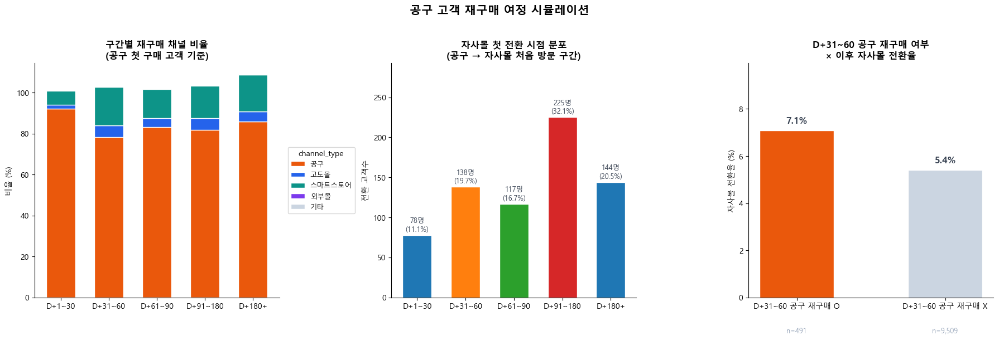


=== 핵심 인사이트 ===
자사몰 첫 전환이 가장 많이 발생하는 구간: D+91~180
D+31~60 공구 재구매 O vs X 전환율 차이: +1.7%p

※ 차이가 양수면: 중간 공구 재구매가 이후 자사몰 전환을 높이는 효과
   차이가 음수면: 공구 재구매가 자사몰 전환을 오히려 막는 효과 → 공구 주기 조정 필요


전체 재구매 고객 여정 시뮬레이션

=== 첫 구매 채널별 × 구간별 재구매 채널 비율 ===

── 고도몰 ──


재구매채널,고도몰,공구,기타,스마트스토어,외부몰
구간,,,,,
D+1~30,75.40,8.90,0.00,17.20,0.20
D+31~60,69.30,5.40,0.00,25.90,0.60
D+61~90,65.20,6.00,0.00,30.70,0.20
D+91~180,66.90,8.40,0.00,28.30,0.70
D+180+,65.20,7.00,0.00,34.30,0.90



── 스마트스토어 ──


재구매채널,고도몰,공구,기타,스마트스토어,외부몰
구간,,,,,
D+1~30,2.10,6.70,0.00,91.70,0.10
D+31~60,1.80,4.10,0.00,94.50,0.00
D+61~90,2.60,4.40,0.00,93.50,0.00
D+91~180,3.00,5.20,0.00,92.90,0.10
D+180+,3.80,6.20,0.00,92.70,0.10



── 공구 ──


재구매채널,고도몰,공구,기타,스마트스토어,외부몰
구간,,,,,
D+1~30,1.80,92.20,0.00,7.00,0.00
D+31~60,5.70,78.30,0.00,18.70,0.20
D+61~90,4.40,83.20,0.00,14.00,0.00
D+91~180,5.60,81.80,0.00,15.90,0.00
D+180+,4.70,86.00,0.00,18.10,0.10



── 외부몰 ──


재구매채널,고도몰,공구,기타,스마트스토어,외부몰
구간,,,,,
D+1~30,5.30,5.30,0.00,7.90,81.60
D+31~60,6.70,0.00,0.00,8.90,86.70
D+61~90,0.00,0.00,0.00,17.10,82.90
D+91~180,5.50,0.00,0.00,25.50,70.90
D+180+,4.50,0.00,0.00,45.50,61.40


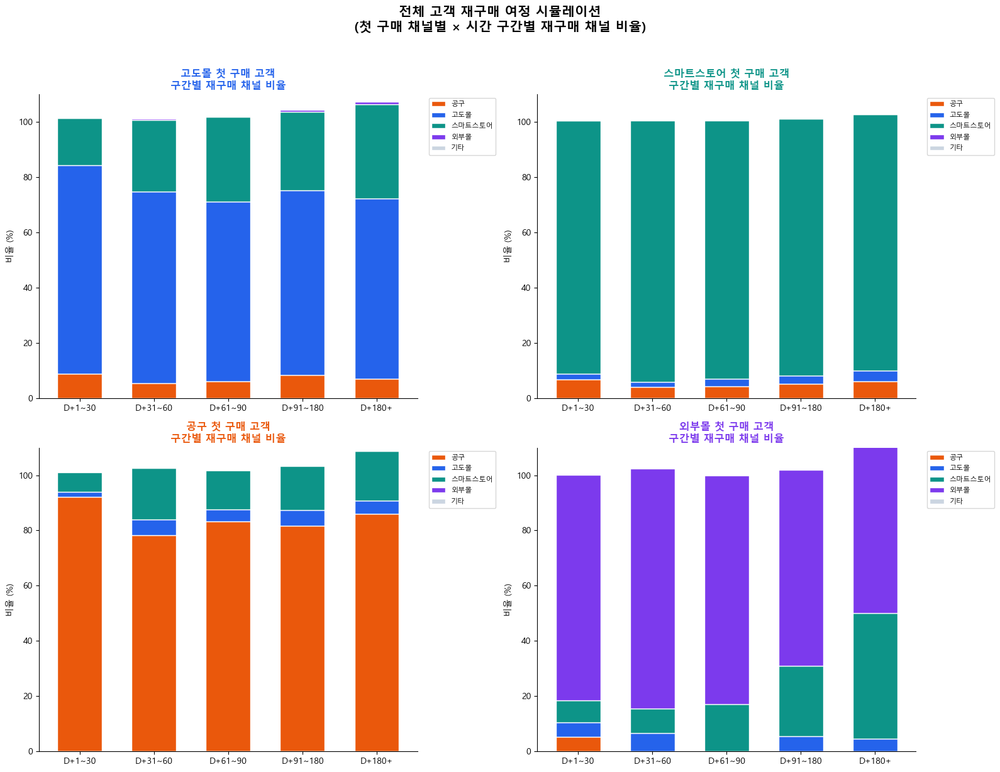

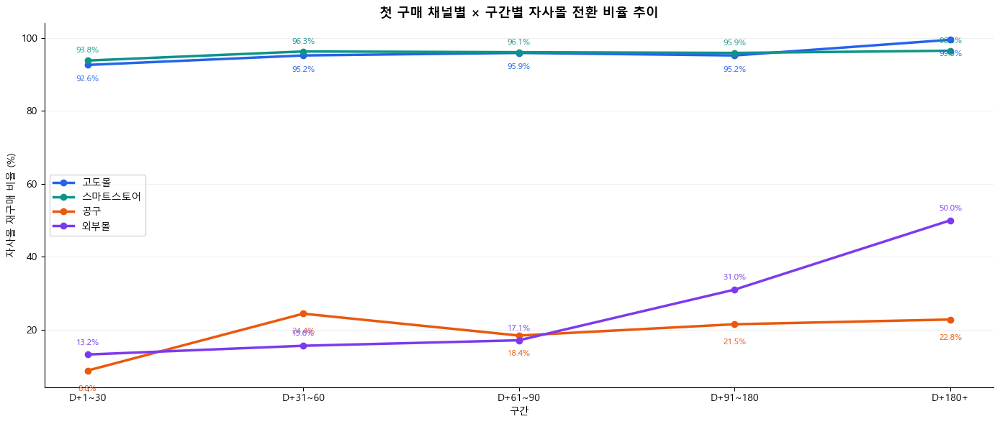


=== 채널별 D+91~180 자사몰 전환 비율 (장기 고착 여부) ===


,첫구매채널,구간,비율(%)
14,스마트스토어,D+91~180,95.90
4,고도몰,D+91~180,95.20
19,외부몰,D+91~180,31.00
9,공구,D+91~180,21.50



※ D+91~180 자사몰 비율이 낮은 채널 = 해당 채널에 고착되는 구조
   반대로 높다면 = 시간이 지날수록 자사몰로 이동하는 구조


In [852]:
# ==========================================================
# 9-3-1. 재구매 고객 여정 시뮬레이션
# "공구 첫 구매 후 시간 흐름에 따라 어디로 가는가"
# ==========================================================

print("==========================================")
print("공구 재구매 고객 여정 시뮬레이션")
print("==========================================\n")

# ── 0) 기본 설정 ──────────────────────────────────────────
# 기존 변수 재사용:
#   gonggu_customers   : 공구 첫 구매 고객 (first_ch == '공구')
#   gonggu_history     : 공구 고객 전체 구매 이력
#   repurchase_history : 첫 구매 이후 구매 이력

# 상태 구간 정의
STATE_BINS  = [0, 30, 60, 90, 180, 9999]
STATE_NAMES = ['D+1~30', 'D+31~60', 'D+61~90', 'D+91~180', 'D+180+']

# ── 1) 고객별 시간 구간 × 행동 매핑 ─────────────────────
journey = repurchase_history.copy()
journey['state'] = pd.cut(
    journey['days_since_first'],
    bins=STATE_BINS,
    labels=STATE_NAMES,
    right=True,
)

# 구간 내 채널 행동 분류
def classify_channel(ch):

    if ch == '자사몰':
        return '고도몰'

    elif ch == '자사몰_N':
        return '스마트스토어'

    elif ch == '공구':
        return '공구'

    elif ch == '외부몰':
        return '외부몰'

    else:
        return '기타'

journey['channel_type'] = journey['channel_group'].apply(classify_channel)

# ── 2) 구간별 × 채널별 행동 비율 ─────────────────────────
state_channel = (
    journey.groupby(['state', 'channel_type'])['receiver_key']
    .nunique()
    .reset_index(name='고객수')
)

state_total = (
    journey.groupby('state')['receiver_key']
    .nunique()
    .reset_index(name='구간_총고객수')
)

state_channel = state_channel.merge(state_total, on='state', how='left')
state_channel['비율(%)'] = (
    state_channel['고객수'] / state_channel['구간_총고객수'] * 100
).round(1)

print("=== 구간별 채널 행동 비율 ===")
display(
    state_channel.pivot_table(
        index='state', columns='channel_type',
        values='비율(%)', fill_value=0
    )
)

# ── 3) 자사몰 전환 시점 분포 ─────────────────────────────
# 공구 → 자사몰로 처음 넘어간 시점이 어느 구간인지

# 전환 고객 — 공구 이후 자사몰 방문한 적 있는 고객
owned_visitors = (
    repurchase_history[
        repurchase_history['channel_group'].isin(['자사몰', '자사몰_N'])
    ]
    .sort_values('days_since_first')
    .groupby('receiver_key')
    .first()
    .reset_index()
)

owned_visitors['전환_구간'] = pd.cut(
    owned_visitors['days_since_first'],
    bins=STATE_BINS,
    labels=STATE_NAMES,
    right=True,
)

conversion_timing = (
    owned_visitors['전환_구간']
    .value_counts()
    .reindex(STATE_NAMES, fill_value=0)
    .reset_index()
)
conversion_timing.columns = ['구간', '전환 고객수']
conversion_timing['비율(%)'] = (
    conversion_timing['전환 고객수'] /
    conversion_timing['전환 고객수'].sum() * 100
).round(1)

print("\n=== 자사몰 첫 전환 시점 분포 ===")
display(conversion_timing)

# ── 4) 이탈 위험 구간(D+31~60) 행동 차이 분석 ────────────
# "D+31~60 구간에 공구 재구매를 한 고객 vs 안 한 고객"
# → 이후 자사몰 전환율 차이가 있는가?

# D+31~60에 공구 재구매한 고객
repurchased_31_60 = (
    repurchase_history[
        (repurchase_history['days_since_first'] > 30) &
        (repurchase_history['days_since_first'] <= 60) &
        (repurchase_history['channel_group'] == '공구')
    ]['receiver_key'].unique()
)

# 이후(D+61~) 자사몰 전환 여부
later_owned = (
    repurchase_history[
        (repurchase_history['days_since_first'] > 60) &
        (repurchase_history['channel_group'].isin(['자사몰', '자사몰_N']))
    ]['receiver_key'].unique()
)

# 전체 공구 고객 중 D+31~60 관찰 가능 고객
all_gonggu = gonggu_customers['receiver_key'].unique()

n_repur_31_60 = len(repurchased_31_60)
n_not_repur   = len(all_gonggu) - n_repur_31_60

conv_repur = len(set(repurchased_31_60) & set(later_owned))
conv_not   = len(set(all_gonggu) - set(repurchased_31_60)) 
conv_not_owned = len((set(all_gonggu) - set(repurchased_31_60)) & set(later_owned))

print("\n=== D+31~60 공구 재구매 여부 × 이후 자사몰 전환율 ===")
comparison = pd.DataFrame({
    '구분': ['D+31~60 공구 재구매 O', 'D+31~60 공구 재구매 X'],
    '고객수': [n_repur_31_60, n_not_repur],
    '이후 자사몰 전환 고객수': [conv_repur, conv_not_owned],
    '자사몰 전환율(%)': [
        round(conv_repur / n_repur_31_60 * 100, 1) if n_repur_31_60 else 0,
        round(conv_not_owned / n_not_repur * 100, 1) if n_not_repur else 0,
    ]
})
display(comparison)

# ── 5) 시각화 ─────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# 왼쪽: 구간별 채널 행동 비율 (누적 바)
pivot_state = state_channel.pivot_table(
    index='state', columns='channel_type',
    values='비율(%)', fill_value=0
).reindex(STATE_NAMES)

pivot_state = pivot_state.reindex(
    columns=[
        '공구',
        '고도몰',
        '스마트스토어',
        '외부몰',
        '기타'
    ],
    fill_value=0
).plot(
    kind='bar', stacked=True, ax=axes[0],
    color=[
    CH_COLOR['공구'],
    CH_COLOR['자사몰'],
    CH_COLOR['자사몰_N'],
    CH_COLOR['외부몰'],
    '#CBD5E1'
    ],
    edgecolor='white', width=0.6,
)
axes[0].set_title('구간별 재구매 채널 비율\n(공구 첫 구매 고객 기준)', fontsize=12, fontweight='bold')
axes[0].set_xlabel('')
axes[0].set_ylabel('비율 (%)')
axes[0].tick_params(axis='x', rotation=0)
axes[0].legend(
    title='channel_type',
    loc='center left',
    bbox_to_anchor=(1.02, 0.5),
    fontsize=9
)
axes[0].spines[['top', 'right']].set_visible(False)

# 중앙: 자사몰 첫 전환 시점
axes[1].bar(
    conversion_timing['구간'],
    conversion_timing['전환 고객수'],
    color=COHORT_COLORS_LIST,
    edgecolor='white', width=0.6,
)
for i, (val, pct) in enumerate(zip(
    conversion_timing['전환 고객수'],
    conversion_timing['비율(%)']
)):
    if val > 0:
        axes[1].text(i, val + 5, f'{val}명\n({pct}%)',
                     ha='center', fontsize=9, color='#374151')

axes[1].set_title('자사몰 첫 전환 시점 분포\n(공구 → 자사몰 처음 방문 구간)', fontsize=12, fontweight='bold')
axes[1].set_ylabel('전환 고객수')
axes[1].set_ylim(0, conversion_timing['전환 고객수'].max() * 1.3)
axes[1].tick_params(axis='x', rotation=0)
axes[1].spines[['top', 'right']].set_visible(False)

# 오른쪽: D+31~60 재구매 여부 × 자사몰 전환율
bars = axes[2].bar(
    comparison['구분'],
    comparison['자사몰 전환율(%)'],
    color=[CH_COLOR['공구'], '#CBD5E1'],
    edgecolor='white', width=0.5,
)
for bar, val in zip(bars, comparison['자사몰 전환율(%)']):
    axes[2].text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 0.3,
        f'{val}%',
        ha='center', fontsize=12, fontweight='bold', color='#374151'
    )
axes[2].set_title('D+31~60 공구 재구매 여부\n× 이후 자사몰 전환율', fontsize=12, fontweight='bold')
axes[2].set_ylabel('자사몰 전환율 (%)')
axes[2].set_ylim(0, comparison['자사몰 전환율(%)'].max() * 1.4)
axes[2].tick_params(axis='x', rotation=0)
axes[2].spines[['top', 'right']].set_visible(False)

# n값 추가
for i, (구분, n) in enumerate(zip(comparison['구분'], comparison['고객수'])):
    axes[2].text(i, -1.5, f'n={n:,}',
                 ha='center', fontsize=9, color='#94A3B8')

plt.suptitle('공구 고객 재구매 여정 시뮬레이션', fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# ── 6) 핵심 인사이트 출력 ────────────────────────────────
print("\n=== 핵심 인사이트 ===")
top_conversion_state = conversion_timing.loc[
    conversion_timing['전환 고객수'].idxmax(), '구간'
]
print(f"자사몰 첫 전환이 가장 많이 발생하는 구간: {top_conversion_state}")

danger_zone_ratio = state_channel[
    (state_channel['state'] == 'D+31~60') &
    (state_channel['channel_type'] == '자사몰')
]['비율(%)'].values
if len(danger_zone_ratio):
    print(f"D+31~60 구간 자사몰 유입 비율: {danger_zone_ratio[0]}%")

conv_diff = (
    comparison.loc[comparison['구분'] == 'D+31~60 공구 재구매 O', '자사몰 전환율(%)'].values[0] -
    comparison.loc[comparison['구분'] == 'D+31~60 공구 재구매 X', '자사몰 전환율(%)'].values[0]
)
print(f"D+31~60 공구 재구매 O vs X 전환율 차이: {conv_diff:+.1f}%p")
print("\n※ 차이가 양수면: 중간 공구 재구매가 이후 자사몰 전환을 높이는 효과")
print("   차이가 음수면: 공구 재구매가 자사몰 전환을 오히려 막는 효과 → 공구 주기 조정 필요")



# ==========================================================
# 9-3-2. 전체 고객 재구매 여정 시뮬레이션
# "첫 구매 채널 무관 — 전체 고객이 시간 흐름에 따라 어디로 가는가"
# ==========================================================

print("\n\n==========================================")
print("전체 재구매 고객 여정 시뮬레이션")
print("==========================================\n")

# ── 0) 전체 고객 기준 데이터 준비 ────────────────────────
# order_df_x: 전체 구매 이력 + 첫 구매 정보 (섹션 9에서 생성)
# first_order: 고객별 첫 구매 채널/날짜

all_repurchase = order_df_x[
    order_df_x['days_since_first'] > 0
].copy()

all_repurchase['channel_type'] = all_repurchase['channel_group'].apply(classify_channel)

all_repurchase['state'] = pd.cut(
    all_repurchase['days_since_first'],
    bins=STATE_BINS,
    labels=STATE_NAMES,
    right=True,
)

# ── 1) 채널별 × 구간별 행동 비율 (전체 고객) ─────────────
channels_to_show = ['자사몰', '자사몰_N', '공구', '외부몰']
ch_labels = {
    '자사몰':   '고도몰',
    '자사몰_N': '스마트스토어',
    '공구':     '공구',
    '외부몰':   '외부몰',
}

results_all = []

for ch in channels_to_show:
    ch_customers = first_order[
        first_order['first_ch'] == ch
    ]['receiver_key'].unique()

    ch_repurchase = all_repurchase[
        all_repurchase['receiver_key'].isin(ch_customers)
    ]

    for state in STATE_NAMES:
        state_data = ch_repurchase[ch_repurchase['state'] == state]
        total_in_state = state_data['receiver_key'].nunique()

        for ctype in [
            '공구',
            '고도몰',
            '스마트스토어',
            '외부몰',
            '기타'
        ]:
            n = state_data[
                state_data['channel_type'] == ctype
            ]['receiver_key'].nunique()

            results_all.append({
                '첫구매채널': ch_labels.get(ch, ch),
                '구간': state,
                '재구매채널': ctype,
                '고객수': n,
                '구간_총고객수': total_in_state,
                '비율(%)': round(n / total_in_state * 100, 1) if total_in_state else 0,
            })

df_journey_all = pd.DataFrame(results_all)

print("=== 첫 구매 채널별 × 구간별 재구매 채널 비율 ===")
for ch in [ch_labels[c] for c in channels_to_show]:
    sub = df_journey_all[df_journey_all['첫구매채널'] == ch]
    pivot = sub.pivot_table(
        index='구간', columns='재구매채널',
        values='비율(%)', fill_value=0
    ).reindex(STATE_NAMES)
    print(f"\n── {ch} ──")
    display(pivot)

# ── 2) 시각화 — 채널별 4개 패널 ──────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

ch_color_map = {
    '고도몰':      CH_COLOR['자사몰'],
    '스마트스토어': CH_COLOR['자사몰_N'],
    '공구':        CH_COLOR['공구'],
    '외부몰':      CH_COLOR['외부몰'],
}

for idx, ch in enumerate([ch_labels[c] for c in channels_to_show]):
    ax = axes[idx]
    sub = df_journey_all[df_journey_all['첫구매채널'] == ch]
    pivot = sub.pivot_table(
        index='구간', columns='재구매채널',
        values='비율(%)', fill_value=0
    ).reindex(STATE_NAMES)

    pivot = pivot.reindex(
    columns=[
        '공구',
        '고도몰',
        '스마트스토어',
        '외부몰',
        '기타'
    ],
    fill_value=0
    )

    pivot.plot(
        kind='bar', stacked=True, ax=ax,
        color=[
            CH_COLOR['공구'],
            CH_COLOR['자사몰'],
            CH_COLOR['자사몰_N'],
            CH_COLOR['외부몰'],
            '#CBD5E1'
        ],
        edgecolor='white', width=0.6,
    )

    # 자사몰 비율 수치만 표시
    cumsum = pivot[['공구']].copy()
    for i, (state, row) in enumerate(pivot.iterrows()):
        owned_val = row.get('자사몰', 0)
        if owned_val >= 1:
            bottom = row.get('공구', 0)
            ax.text(i, bottom + owned_val / 2,
                    f'{owned_val:.1f}%',
                    ha='center', va='center',
                    fontsize=8.5, color='white', fontweight='bold')

    ax.set_title(f'{ch} 첫 구매 고객\n구간별 재구매 채널 비율',
                 fontsize=12, fontweight='bold',
                 color=ch_color_map.get(ch, '#374151'))
    ax.set_xlabel('')
    ax.set_ylabel('비율 (%)')
    ax.tick_params(axis='x', rotation=0)
    ax.set_ylim(0, 110)
    ax.legend(
    loc='upper left',
    bbox_to_anchor=(1.02, 1),
    fontsize=8,
    frameon=True
)
    ax.spines[['top', 'right']].set_visible(False)

plt.suptitle('전체 고객 재구매 여정 시뮬레이션\n(첫 구매 채널별 × 시간 구간별 재구매 채널 비율)',
             fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# ── 3) 채널 간 비교 — 자사몰 전환율 추이 ─────────────────

df_journey_owned = (
    df_journey_all[
        df_journey_all['재구매채널'].isin(['고도몰', '스마트스토어'])
    ]
    .groupby(['첫구매채널', '구간'], as_index=False)
    .agg({'비율(%)': 'sum'})
)

fig, ax = plt.subplots(figsize=(14, 6))

for ch, color in zip(
    [ch_labels[c] for c in channels_to_show],
    [CH_COLOR['자사몰'], CH_COLOR['자사몰_N'], CH_COLOR['공구'], CH_COLOR['외부몰']]
):
    sub = (
        df_journey_owned[df_journey_owned['첫구매채널'] == ch]
        .set_index('구간')
        .reindex(STATE_NAMES)
    )

    vals = sub['비율(%)'].fillna(0).values

    ax.plot(
        STATE_NAMES,
        vals,
        marker='o',
        label=ch,
        color=color,
        linewidth=2.5
    )

    label_offsets = {
        '고도몰': (0, -14),
        '스마트스토어': (0, 10),
        '공구': (0, -18),
        '외부몰': (0, 12),
    }

    for i, val in enumerate(vals):
        if val >= 1:
            dx, dy = label_offsets.get(ch, (0, 8))

            ax.annotate(
                f'{val:.1f}%',
                xy=(i, val),
                xytext=(dx, dy),
                textcoords='offset points',
                ha='center',
                va='center',
                fontsize=8.5,
                color=color
            )

ax.set_title('첫 구매 채널별 × 구간별 자사몰 전환 비율 추이',
             fontsize=13, fontweight='bold')
ax.set_ylabel('자사몰 재구매 비율 (%)')
ax.set_xlabel('구간')
ax.legend(fontsize=10)
ax.grid(axis='y', alpha=0.2)
ax.spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.show()

# ── 4) 핵심 수치 요약 ────────────────────────────────────
print("\n=== 채널별 D+91~180 자사몰 전환 비율 (장기 고착 여부) ===")

summary_late = (
    df_journey_owned[
        df_journey_owned['구간'] == 'D+91~180'
    ]
    .sort_values('비율(%)', ascending=False)
)

display(summary_late)

print("\n※ D+91~180 자사몰 비율이 낮은 채널 = 해당 채널에 고착되는 구조")
print("   반대로 높다면 = 시간이 지날수록 자사몰로 이동하는 구조")

- 공구 고객 구간별 채널 행동  
    - D+1~30은 공구 92%로 거의 고착 상태  
    이 구간에서 자사몰(스마트스토어+고도몰)로 이동하는 비율은 8.8%에 불과함  
    - D+31~60에 자사몰 비율이 24.4%로 가장 높음  
    스마트스토어(18.7%) + 고도몰(5.7%)로 첫 번째 자사몰 이동 피크가 이 구간에서 발생  
    - D+61~90부터는 공구 비율이 다시 83%로 올라가며 자사몰 비율 감소  
    D+31~60 이후 자사몰로 넘어오지 못한 고객은 다시 공구로 고착 됨  
    - D+180+에서 스마트스토어(18.1%)가 다시 올라오는 것은  
    장기 고객 중 일부가 결국 자사몰로 이동하는 구조  
<br>  

- 자사몰 첫 전환 시점 분포  
    - 전환의 32.1%가 D+91~180 구간에 집중됨  
    - D+180+(20.5%)이 두 번째로 많아,  
    두 구간 합산 51.8%로 전환의 절반 이상이 30~180일 사이에 발생  
    - D+1~30(11.0%)이 가장 낮음  
    공구 직후 즉각 자사몰로 이동하는 고객은 소수이며, 대부분은 시간이 지나면서 전환됨  
<br>  

- D+31~60 공구 재구매 여부 × 자사몰 전환율  
    - D+31~60에 공구 재구매를 한 고객의 자사몰 전환율(7.1%)이 안 한 고객(5.4%)보다 1.7%p 높음  
    - 차이가 크지는 않지만 +양수가 나온것으로보아 공구 재구매가 자사몰 전환을 막지 않음을 보여줌  
    - 오히려 공구에서 한 번 더 산 고객이 이후 자사몰로 더 잘 넘어옴  
    공구 재구매를 막는 것보다 자사몰 유입 장치를 별도로 설계하는 것이 더 효과적일 수 있음  

    ---

- 전체 고객 채널별 구매 여정  
    - 고도몰 첫 구매 고객
        - 고도몰 첫 구매 고객이 시간이 지날수록 스마트스토어 비율이 17% → 34%로 꾸준히 상승  
        - 고도몰 고객이 스마트스토어로 이동하는 구조가 명확  
        - 고도몰 하락 추세와 연결되는 중요한 패턴  
    - 스마트스토어 첫 구매 고객  
        - 전 구간에서 92% 이상 스마트스토어에 고착 됨  
        - 가장 충성도 높은 채널  
        - 공구로 이탈하는 비율도 4~6%로 낮음  
    - 공구 첫 구매 고객  
        - D+31~60 자사몰 비율 피크(24.4%) → 이후 공구 재고착 패턴  
    - 외부몰 첫 구매 고객  
        - D+180+에서 스마트스토어 비율이 45.5%로 급등  
        - 외부몰 고객이 장기적으로 스마트스토어로 이동하는 구조  
        - 외부몰이 스마트스토어의 간접 유입 채널 역할을 하는 것으로 보임  
<br>  

> - 채널별로 고착 패턴이 완전히 다릅니다.  
> 스마트스토어 첫 구매 고객은 92% 이상 잔류하는 가장 안정적인 채널이고,  
> 고도몰 고객은 스마트스토어로 자연 이동 중입니다.  
> 공구 고객은 D+31~60이 자사몰 전환의 유일한 피크이며 이 구간을 놓치면 공구로 재고착됩니다.  
> 외부몰 고객은 장기적으로 스마트스토어로 흡수됩니다.  
> 
> - 실무 관점에서 가장 중요한 두 가지입니다.  
> 첫째, 공구 고객 대상 자사몰 전환 개입 시점은 D+30~60 입니다.  
> 이 구간에 스마트스토어 쿠폰이나 정기배송 안내를 넣는 것이 전환율을 높이는 가장 효율적인 방법일 수 있습니다.  
> 둘째, 고도몰에서 스마트스토어로의 자연 이동이 확인되므로,  
> 고도몰 고객을 스마트스토어로 유도하는 CRM을 별도로 설계할 필요가 있습니다.  

---

## 10. 공구 고객의 lifetime 채널 mix  

"공구로 유입된 고객이 전체 생애 구매에서 어디 채널에서 얼마나 소비했는가?"  

첫 재구매는 공구에서 해도 장기적으로는 자사몰 중심 고객이 될 수도 있기 때문  

공구 유입 고객 lifetime mix:


,고객유형,비중(%)
0,공구 only,92.88
1,자사몰 정착형,4.38
2,공구 중심,2.75


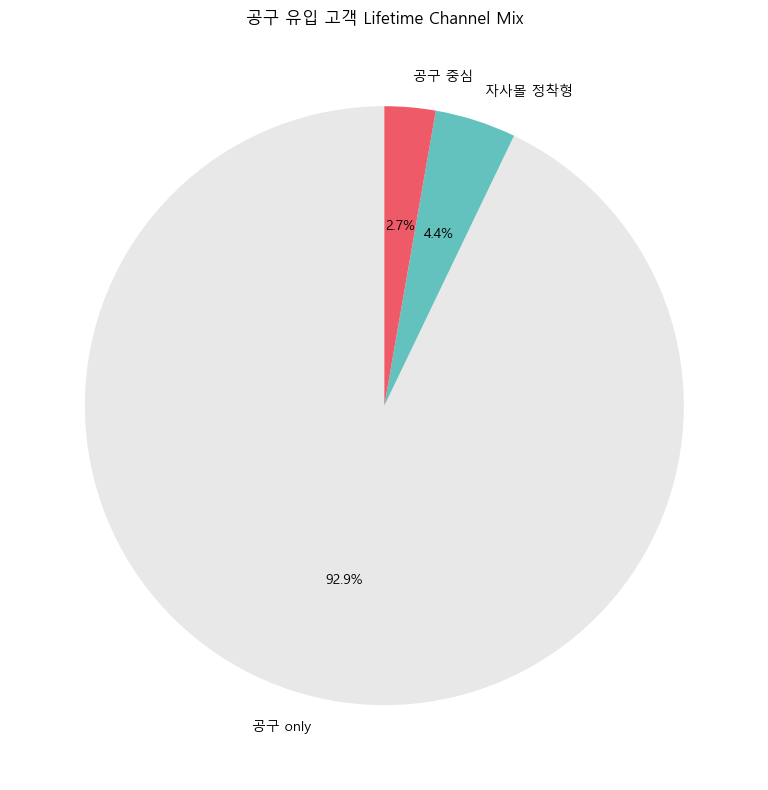

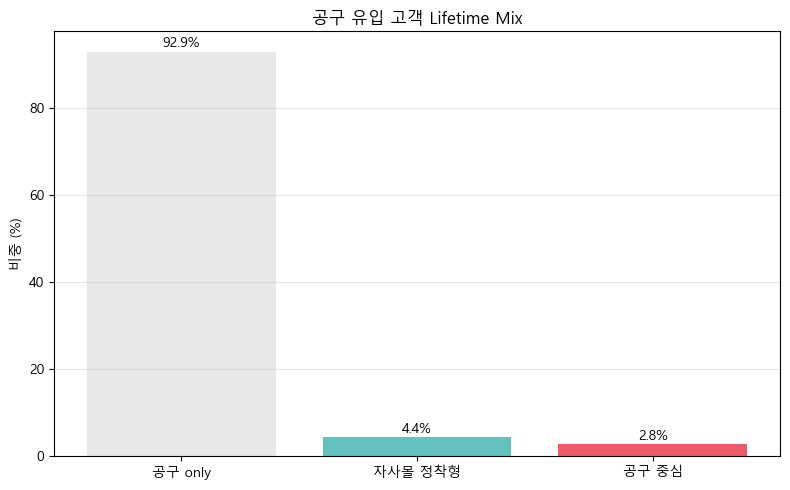

In [853]:
# =========================================================
# 공구 유입 고객 lifetime 채널 mix 분석
# =========================================================

# 공구 첫 구매 고객
gonggu_first_customers = first_order[
    first_order['first_ch'] == '공구'
]['receiver_key'].unique()

# 해당 고객 전체 구매 이력
gonggu_ltv = order_df_x[
    order_df_x['receiver_key'].isin(gonggu_first_customers)
].copy()

# =========================================================
# 고객별 × 채널별 매출
# =========================================================

cust_channel_sales = (
    gonggu_ltv
    .groupby(['receiver_key', 'channel_group'])['결제액']
    .sum()
    .reset_index()
)

# 고객 총 매출
cust_total_sales = (
    gonggu_ltv
    .groupby('receiver_key')['결제액']
    .sum()
    .reset_index()
    .rename(columns={'결제액': 'total_sales'})
)

# merge
cust_channel_sales = cust_channel_sales.merge(
    cust_total_sales,
    on='receiver_key',
    how='left'
)

# 채널 비중
cust_channel_sales['sales_ratio'] = (
    cust_channel_sales['결제액']
    / cust_channel_sales['total_sales']
)

# =========================================================
# pivot
# =========================================================

cust_mix = (
    cust_channel_sales
    .pivot_table(
        index='receiver_key',
        columns='channel_group',
        values='sales_ratio',
        fill_value=0
    )
)

# 없는 컬럼 대비
for ch in ['공구', '자사몰', '자사몰_N', '외부몰']:
    if ch not in cust_mix.columns:
        cust_mix[ch] = 0

# =========================================================
# 고객 유형 분류
# =========================================================

def classify_customer(row):

    gonggu_ratio = row['공구']
    owned_ratio = row['자사몰'] + row['자사몰_N']

    # 공구만
    if gonggu_ratio >= 0.95:
        return '공구 only'

    # 자사몰 중심
    elif owned_ratio >= 0.5:
        return '자사몰 정착형'

    # 공구 중심
    elif gonggu_ratio >= 0.5:
        return '공구 중심'

    # 혼합
    else:
        return '혼합형'

cust_mix['customer_type'] = cust_mix.apply(
    classify_customer,
    axis=1
)

# =========================================================
# 요약
# =========================================================

mix_summary = (
    cust_mix['customer_type']
    .value_counts(normalize=True)
    .mul(100)
    .round(2)
    .reset_index()
)

mix_summary.columns = ['고객유형', '비중(%)']

print("공구 유입 고객 lifetime mix:")
display(mix_summary)


# =========================================================
# 공구 유입 고객 lifetime mix 시각화
# =========================================================

plt.figure(figsize=(8, 8))

MIX_COLOR = {
    '공구 only': '#e8e8e8',          # 라이트그레이
    '자사몰 정착형': '#63c2be',   # 민트
    '공구 중심': '#ef5a68',      # 코랄
    '혼합형': '#06143c'      # 네이비
}

plt.pie(
    mix_summary['비중(%)'],
    labels=mix_summary['고객유형'],
    autopct='%1.1f%%',
    startangle=90,
    colors=[
        MIX_COLOR.get(x, '#333333')
        for x in mix_summary['고객유형']
    ]
)

plt.title('공구 유입 고객 Lifetime Channel Mix')

plt.tight_layout()
plt.show()



# =========================================================
# 공구 유입 고객 lifetime mix 막대그래프
# =========================================================

plt.figure(figsize=(8, 5))

plt.bar(
    mix_summary['고객유형'],
    mix_summary['비중(%)'],
    color=[
        MIX_COLOR.get(x, '#333333')
        for x in mix_summary['고객유형']
    ]
)

# 값 표시
for idx, val in enumerate(mix_summary['비중(%)']):
    plt.text(
        idx,
        val + 1,
        f'{val:.1f}%',
        ha='center'
    )

plt.title('공구 유입 고객 Lifetime Mix')
plt.ylabel('비중 (%)')

plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

| 고객 유형   | 의미           |
| ------- | ------------ |
| 공구 only | 평생 공구에서만 구매  |
| 공구 중심   | 공구 비중 > 50%  |
| 자사몰 정착형 | 자사몰 비중 > 50% |
| 혼합형     | 여러 채널 분산     |


- 공구 고객 92.9%가 lifetime 동안 공구만 사용  
- 자사몰 정착형은 4.4%밖에 안 됨  
<br>  
- 9-1에서는 공구에서 자사몰로 일부 이동하는 것으로 보였으나,  
전체 생애 기준으로 봤을 때는 자사몰 정착형이 4.4%에 불가함을 확인  
→ 자사몰 한번 구매해본 고객은 있지만, 장기적으로 자사몰 중심 고객이 되는 비율은 매우 낮음  
<br>  
- 즉, 현재 공구는 “자사몰 유입 funnel”보다는 “독립 소비 채널” 성격이 훨씬 강함  
<br>  
- 공구 고객이 자사몰로 전환이 되지 않는다고 공구가 나쁜 채널은 아님  
→ 4. Cohort retention에서 확인했듯  
→ 공구 고객 retention 180일이 공구 33.7% / 자사몰 22~23%로  
→ 공구 고객 품질은 좋은 편임  
<br>  
- 문제는 좋은 고객인데 자사몰로 오지 않는다는 것!

<br>  

> **[공구 고객 Lifetime Channel Mix]**  
> - 공구 유입 고객의 92.9%는 생애 구매 대부분을 공구 채널에서 발생시킴  
> - 자사몰 중심 고객으로 전환(정착)된 비중은 4.4%에 불과  
> - 첫 재구매 단계에서는 일부 자사몰 이동이 존재하지만,  
> 장기적으로 자사몰 중심 고객으로 정착하는 비율은 매우 낮음  
> - 따라서 현재 공구는 자사몰 CRM Funnel보다는  
> 독립적인 반복 구매 채널의 성격이 강한 것으로 해석됨  
> - 반면 공구 고객의 재구매율 자체는 높게 나타나므로,  
> 공구는 신규 고객 확보(acquisition)와 반복 구매(retention) 기능을  
> 동시에 수행하는 채널로 볼 수 있음  

---

## 11. 공구→자사몰 전환 고객 LTV 비교

- 공구만 이용 고객 vs 자사몰까지 이동한 고객  

"자사몰까지 이동한 소수 고객이 훨씬 가치가 높은 고객인가?"

공구 only vs 자사몰 정착형 비교:


,customer_type,고객수,평균_LTV,중앙_LTV,평균_주문수,평균_객단가,평균_활성기간
0,공구 only,9169,"96,588.38","70,000.00",7.74,"15,628.99",37.68
1,자사몰 정착형,432,"216,473.99","170,810.00",15.71,"15,322.10",161.91


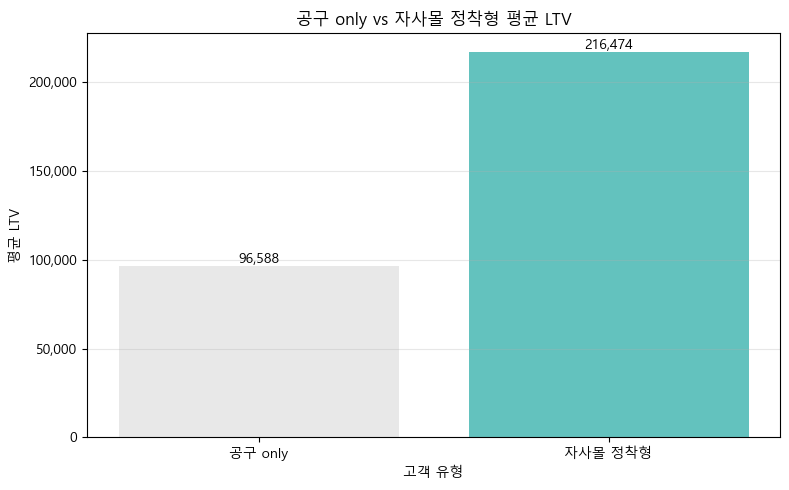

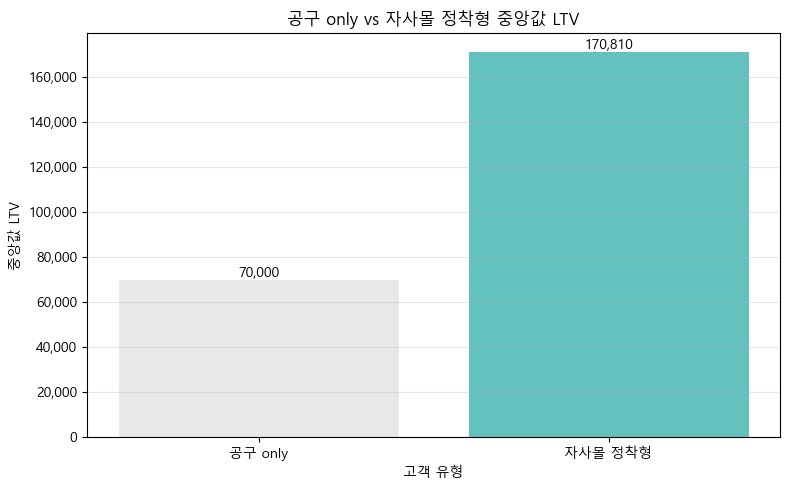

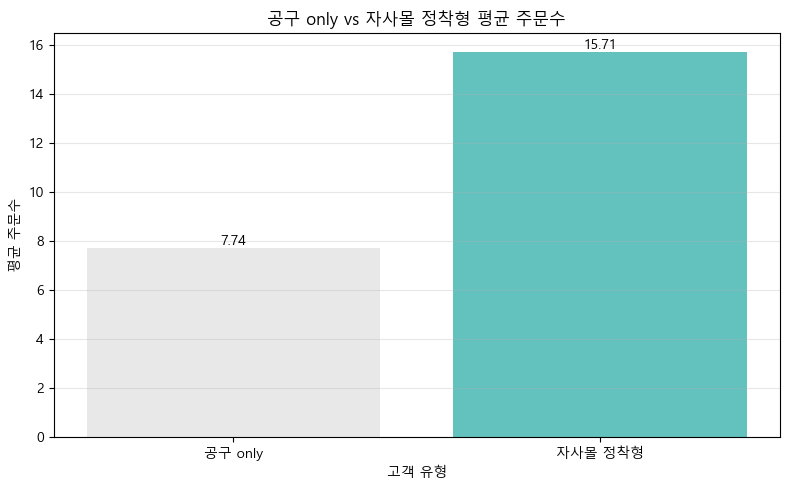

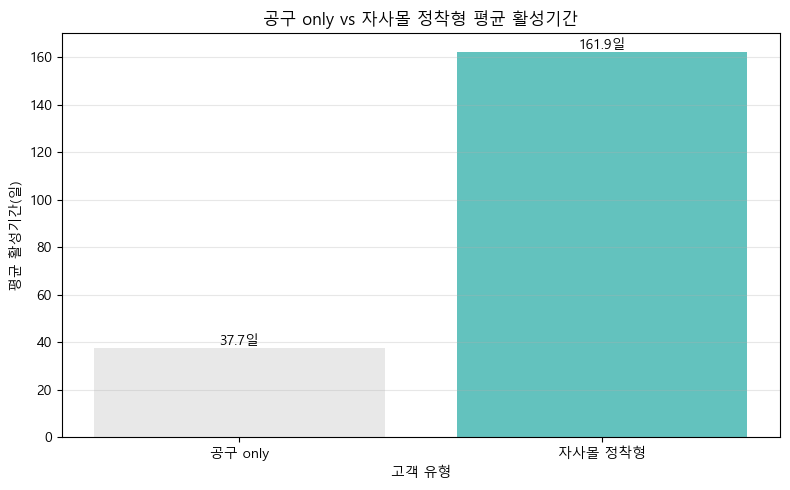

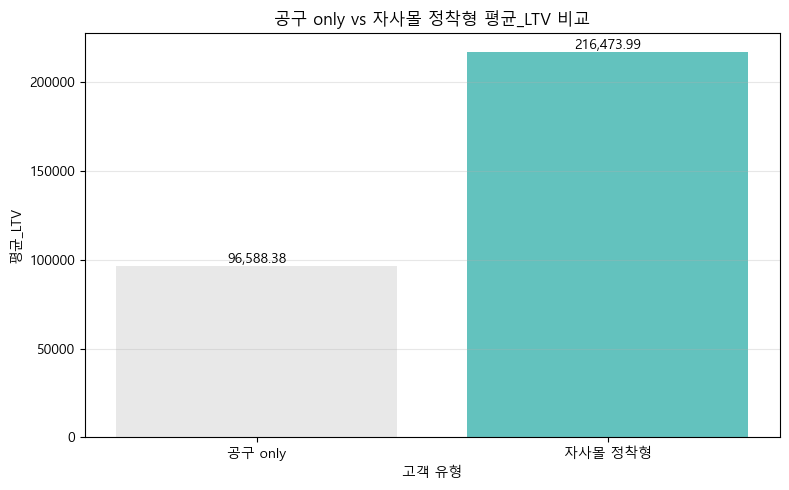

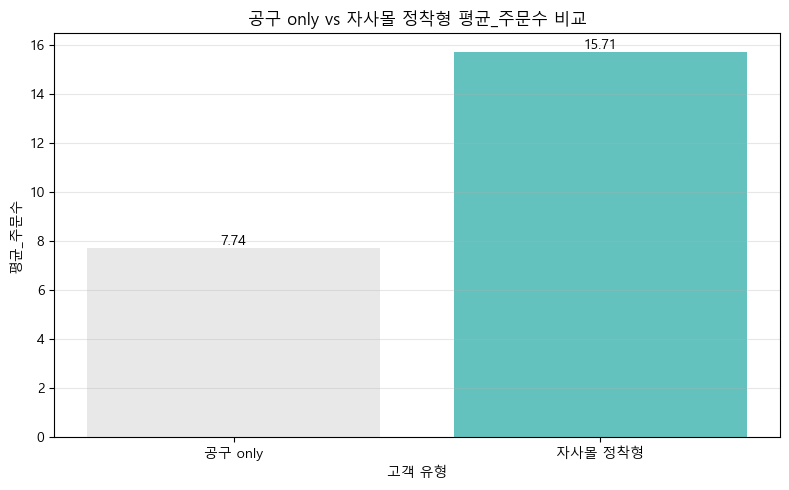

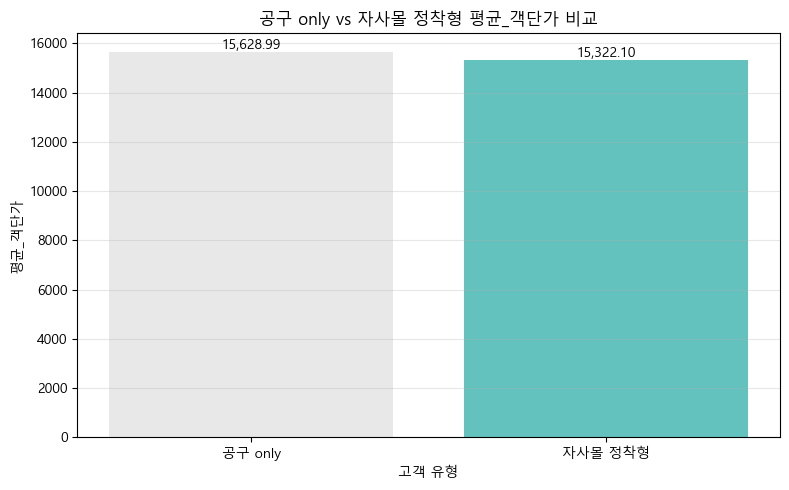

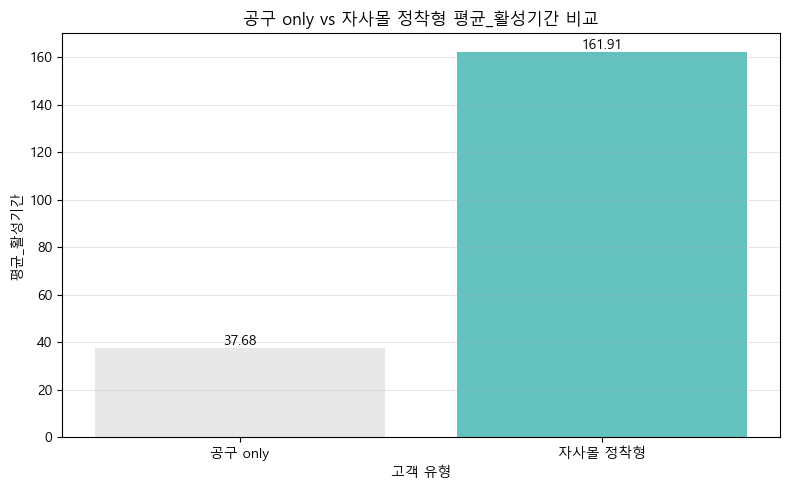

In [854]:
# =========================================================
# 공구 only vs 자사몰 정착형 LTV 비교
# =========================================================

# 고객 유형 merge
gonggu_customer_type = (
    cust_mix[['customer_type']]
    .reset_index()
)

gonggu_ltv_full = gonggu_ltv.merge(
    gonggu_customer_type,
    on='receiver_key',
    how='left'
)

# =========================================================
# 고객별 LTV 계산
# =========================================================

customer_ltv = (
    gonggu_ltv_full
    .groupby(['receiver_key', 'customer_type'])
    .agg(
        total_sales=('결제액', 'sum'),
        order_count=('analysis_date', 'count'),
        avg_order_value=('결제액', 'mean'),
        first_purchase=('analysis_date', 'min'),
        last_purchase=('analysis_date', 'max')
    )
    .reset_index()
)

customer_ltv['active_days'] = (
    customer_ltv['last_purchase']
    - customer_ltv['first_purchase']
).dt.days

# =========================================================
# 그룹별 비교
# =========================================================

ltv_summary = (
    customer_ltv[
        customer_ltv['customer_type']
        .isin(['공구 only', '자사몰 정착형'])
    ]
    .groupby('customer_type')
    .agg(
        고객수=('receiver_key', 'nunique'),
        평균_LTV=('total_sales', 'mean'),
        중앙_LTV=('total_sales', 'median'),
        평균_주문수=('order_count', 'mean'),
        평균_객단가=('avg_order_value', 'mean'),
        평균_활성기간=('active_days', 'mean')
    )
    .round(2)
    .reset_index()
)

print("공구 only vs 자사몰 정착형 비교:")
display(ltv_summary)



# =========================================================
# 평균 LTV 비교
# =========================================================

plt.figure(figsize=(8, 5))

plt.bar(
    ltv_summary['customer_type'],
    ltv_summary['평균_LTV'],
    color=[
        MIX_COLOR.get(x, '#333333')
        for x in mix_summary['고객유형']
    ]
)

for i, v in enumerate(ltv_summary['평균_LTV']):
    plt.text(
        i,
        v,
        f'{v:,.0f}',
        ha='center',
        va='bottom'
    )

plt.title('공구 only vs 자사몰 정착형 평균 LTV')
plt.xlabel('고객 유형')
plt.ylabel('평균 LTV')

plt.gca().yaxis.set_major_formatter(
    ticker.FuncFormatter(lambda x, pos: f'{int(x):,}')
)

plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()



# =========================================================
# 중앙값 LTV 비교
# =========================================================

plt.figure(figsize=(8, 5))

plt.bar(
    ltv_summary['customer_type'],
    ltv_summary['중앙_LTV'],
    color=[
        MIX_COLOR.get(x, '#333333')
        for x in mix_summary['고객유형']
    ]
)

for i, v in enumerate(ltv_summary['중앙_LTV']):
    plt.text(
        i,
        v,
        f'{v:,.0f}',
        ha='center',
        va='bottom'
    )

plt.title('공구 only vs 자사몰 정착형 중앙값 LTV')
plt.xlabel('고객 유형')
plt.ylabel('중앙값 LTV')

plt.gca().yaxis.set_major_formatter(
    ticker.FuncFormatter(lambda x, pos: f'{int(x):,}')
)

plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()




# =========================================================
# 평균 주문수 비교
# =========================================================

plt.figure(figsize=(8, 5))

plt.bar(
    ltv_summary['customer_type'],
    ltv_summary['평균_주문수'],
    color=[
        MIX_COLOR.get(x, '#333333')
        for x in mix_summary['고객유형']
    ]
)

for i, v in enumerate(ltv_summary['평균_주문수']):
    plt.text(
        i,
        v,
        f'{v:.2f}',
        ha='center',
        va='bottom'
    )

plt.title('공구 only vs 자사몰 정착형 평균 주문수')
plt.xlabel('고객 유형')
plt.ylabel('평균 주문수')

plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()



# =========================================================
# 평균 활성기간 비교
# =========================================================

plt.figure(figsize=(8, 5))

plt.bar(
    ltv_summary['customer_type'],
    ltv_summary['평균_활성기간'],
    color=[
        MIX_COLOR.get(x, '#333333')
        for x in mix_summary['고객유형']
    ]
)

for i, v in enumerate(ltv_summary['평균_활성기간']):
    plt.text(
        i,
        v,
        f'{v:.1f}일',
        ha='center',
        va='bottom'
    )

plt.title('공구 only vs 자사몰 정착형 평균 활성기간')
plt.xlabel('고객 유형')
plt.ylabel('평균 활성기간(일)')

plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


# =========================================================
# 주요 지표 요약 비교
# =========================================================

metrics = ['평균_LTV', '평균_주문수', '평균_객단가', '평균_활성기간']

for metric in metrics:
    plt.figure(figsize=(8, 5))

    plt.bar(
        ltv_summary['customer_type'],
        ltv_summary[metric],
        color=[
        MIX_COLOR.get(x, '#333333')
        for x in mix_summary['고객유형']
    ]
    )

    for i, v in enumerate(ltv_summary[metric]):
        plt.text(
            i,
            v,
            f'{v:,.2f}',
            ha='center',
            va='bottom'
        )

    plt.title(f'공구 only vs 자사몰 정착형 {metric} 비교')
    plt.xlabel('고객 유형')
    plt.ylabel(metric)

    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

- 자사몰 정착형은 '고가치 고객'  
    - LTV 상승 원인이 비싼 상품 구매가 아니라 "더 오래 + 더 자주 구매"이기 때문에  
    객단가가 거의 동일해도 주문수/활성기간/채널 이동 후 반복 구매가 높아서 LTV가 2배 이상 차이 남  

| 지표      | 공구 only | 자사몰 정착형 |    차이 |
| ------- | ------: | ------: | ----: |
| 평균 LTV  |  96,567 | 216,354 | 2.24배 |
| 중앙 LTV  |  70,000 | 170,541 | 2.44배 |
| 평균 주문수  |    7.76 |   15.76 |    2배 |
| 평균 활성기간 |     38일 |    163일 |  4.3배 |
| 평균 객단가  |  15,651 |  15,334 | 거의 동일 |

<br>  

- 자사몰 정착형은 "관계형 고객"  
평균 활성기간 차이가 매우 큼 (36일 / 163일)  
    - 공구 only : 행사성 구매 / 단기 반응형 / deal-driven  
    - 자사몰 정착형 : 브랜드 정착 / 반복 구매 / 장기 관계형 고객  
<br>  

- Funnel 확인  
    - 공구  
    → 대부분은 1회성 소비  
    → 일부만 자사몰 이동  
    → 이동한 순간 고LTV 고객으로 진화  
    - 즉, 공구 자체보다 공구 이후 자사몰 전환이 진짜 핵심 KPI임!  

<br>  

> **[공구→자사몰 전환 고객은 소수지만 고가치 고객]**  
> - 공구 유입 고객 중 자사몰 중심 고객으로 전환되는 비율은 4.4%에 불과함  
> (lifetime 구매의 50% 이상이 자사몰인 고객 비율 / 자사몰 정착률)  
> - 그러나 자사몰 전환 고객의 평균 LTV는 21.6만원으로 공구 only 고객 대비 2.2배 높음  
> - 객단가는 거의 동일하나 주문수는 2배, 활성기간은 4.3배 길게 나타남  
> - 즉 LTV 차이는 가격이 아니라 장기 반복구매와 고객 유지 기간에서 발생함  
> - 공구는 단순 매출 채널이라기보다 고가치 고객을 발굴하는 acquisition 채널 역할을 수행하고 있음  
> - 따라서 공구 운영의 핵심 KPI는 공구 매출 자체보다 공구 고객의 자사몰 전환율 및 전환 이후 유지율일 가능성이 높음  

---

### 11-1. 자사몰 정착(전환)을 만드는 요인 찾기

“누가 자사몰 정착형이 되는가?”  

공구 고객 중 자사몰로 넘어가는 고객 특징 찾기  

| 분석축      | 의미                     |
| -------- | ---------------------- |
| 브랜드      | 어떤 브랜드가 전환 잘 만드는가      |
| 셀러       | 어떤 셀러가 loyal 고객 잘 만드는가 |
| 첫 구매 금액  | 고액 구매자가 전환 잘 되는가       |
| 첫 구매 상품  | 특정 상품이 전환을 유도하는가       |
| 첫 재구매 속도 | 빠른 재구매가 전환과 연결되는가      |

,브랜드_분류,공구고객수,자사몰전환고객수,전환율(%)
2,파이토뉴트리,3195,312,9.77
4,흑보목,139,13,9.35
0,그로우랩,7379,588,7.97
3,혜인서,225,12,5.33
1,시즈노프,101,5,4.95


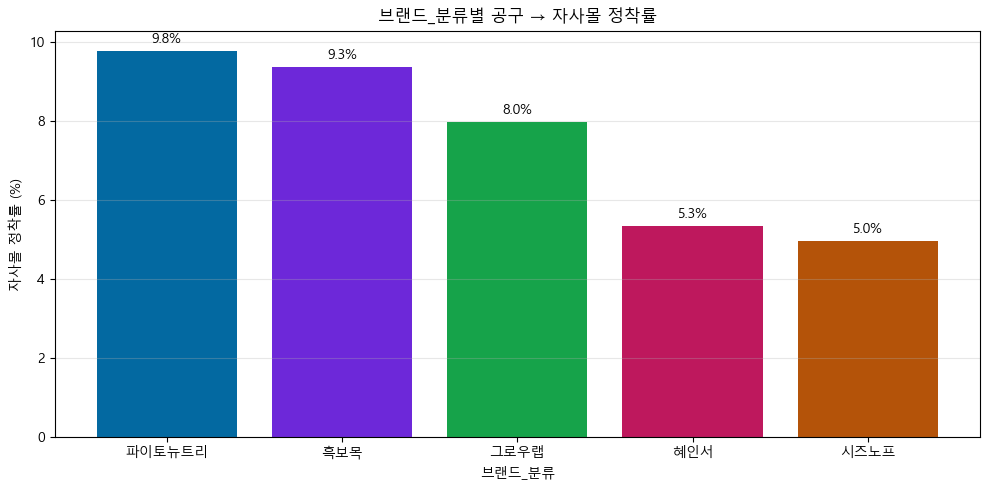

In [855]:
# =========================================================
# 브랜드_분류별 공구 → 자사몰 전환율(정착률)
# 전체 공구 고객 기준
# =========================================================

brand_conversion = (
    gonggu_customer_base
    .merge(
        first_gonggu_info[['receiver_key', 'gonggu_first_brand']],
        on='receiver_key',
        how='left',
        suffixes=('', '_new')
    )
)

brand_summary = (
    brand_conversion
    .groupby('gonggu_first_brand')
    .agg(
        공구고객수=('receiver_key', 'nunique'),
        자사몰전환고객수=('converted', 'sum')
    )
    .reset_index()
    .rename(columns={'gonggu_first_brand': '브랜드_분류'})
)

brand_summary['전환율(%)'] = (
    brand_summary['자사몰전환고객수']
    / brand_summary['공구고객수']
    * 100
).round(2)

brand_summary = brand_summary.sort_values('전환율(%)', ascending=False)

display(brand_summary)


# =========================================================
# 브랜드별 자사몰 정착률 시각화
# =========================================================

plt.figure(figsize=(10, 5))

plt.bar(
    brand_summary['브랜드_분류'],
    brand_summary['전환율(%)'],
    color=[BRAND_COLOR.get(b, '#333333') for b in brand_summary['브랜드_분류']]
)

for i, v in enumerate(brand_summary['전환율(%)']):
    plt.text(i, v + 0.2, f'{v:.1f}%', ha='center')

plt.title('브랜드_분류별 공구 → 자사몰 정착률')
plt.xlabel('브랜드_분류')
plt.ylabel('자사몰 정착률 (%)')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

- 전환율(정착률)만 보면 흑보목이 1위지만, 표본이 139명으로 작음  
- 실무적으로 `파이토뉴트리`와 `그로우랩`이 중요한 브랜드  
`혜인서`/`시즈노프`는 전환율과 규모 모두 상대적으로 낮음  
<br>  
- 자사몰 전환(정착) 기여도 기준 핵심 브랜드  
    1. 파이토뉴트리  
    2. 그로우랩  
    3. 흑보목은 전환율은 높지만 niche 브랜드  

<br>  

> **[브랜드별 전환율]**  
> - 전환율 기준으로는 흑보목(9.4%)이 가장 높음  
> - 다만 고객 규모가 작아 영향력은 제한적  
> - 실질적인 자사몰 전환 엔진은 파이토뉴트리(579명 전환)와 그로우랩(321명 전환)  
> - 헤인서/시즈노프는 전환율과 규모 모두 상대적으로 낮음  
> 
> 공구 매출 자체보다 "자사몰 전환 고객 수" 관점에서는  
> 파이토뉴트리와 그로우랩이 핵심 acquisition 브랜드로 판단됨.  

---

### 11-2. 공구→자사몰 전환 고객 구매 여정

"전환한 고객이 무엇을 어떤 순서로 샀는가" 

전환 고객 수: 930명
총 구매 건수: 5,070건

=== 구매 순서별 채널 분포 ===


channel_type,고도몰,공구,스마트스토어
purchase_order,,,
1,4.70,74.50,20.80
2,14.30,37.60,48.20
3,12.80,31.40,55.80
4,10.10,36.10,53.70
5,6.70,40.70,52.60
6,5.00,41.70,53.30



=== 자사몰 첫 전환 시 구매 SKU TOP 15 ===


,sku_family,전환 고객수,비율(%)
0,지니어스뉴 드롭스(5개입),162,18.10
1,지니어스뉴 드롭스,146,16.30
2,투데이디3 오일밤(30캡슐),108,12.10
3,그로우뉴,104,11.60
4,투데이디3 오일(30캡슐),97,10.80
5,그로우뉴(단종),69,7.70
6,지니어스뉴 톡캡스(30캡슐),54,6.00
7,이트뮨 배도라지주스(box),45,5.00
8,데이프로바,26,2.90
9,지니어스뉴 톡캡스(30캡술*3),19,2.10



=== 공구 첫 SKU → 자사몰 첫 SKU 전이 TOP 15 ===


,공구_첫SKU,자사몰_첫SKU,전환고객수
90,지니어스뉴 드롭스(5개입),지니어스뉴 드롭스(5개입),49
52,스포이드 (5개입),지니어스뉴 드롭스(5개입),41
159,투데이디3 오일밤(30캡슐),투데이디3 오일밤(30캡슐),37
89,지니어스뉴 드롭스(5개입),지니어스뉴 드롭스,29
132,투데이디3 오일(30캡슐),투데이디3 오일(30캡슐),28
33,스포이드,지니어스뉴 드롭스,26
4,그로우뉴,그로우뉴,23
76,지니어스뉴 드롭스,지니어스뉴 드롭스,22
51,스포이드 (5개입),지니어스뉴 드롭스,22
65,이트뮨 배도라지주스(box),이트뮨 배도라지주스(box),21



=== 구매 여정 패턴 TOP 15 ===


,여정 패턴,고객수,비율(%)
0,공구 → 스마트스토어 → 스마트스토어,107,20.20
1,공구 → 스마트스토어,63,11.90
2,공구 → 고도몰,46,8.70
3,공구 → 스마트스토어 → 스마트스토어 → 스마트스토어 → 스마트스토어,39,7.40
4,공구 → 공구 → 스마트스토어 → 스마트스토어,37,7.00
5,공구 → 공구 → 스마트스토어 → 스마트스토어 → 스마트스토어,29,5.50
6,공구 → 스마트스토어 → 스마트스토어 → 스마트스토어,28,5.30
7,공구 → 공구 → 공구 → 공구 → 공구,26,4.90
8,공구 → 공구 → 공구 → 스마트스토어 → 스마트스토어,24,4.50
9,공구 → 고도몰 → 고도몰,24,4.50


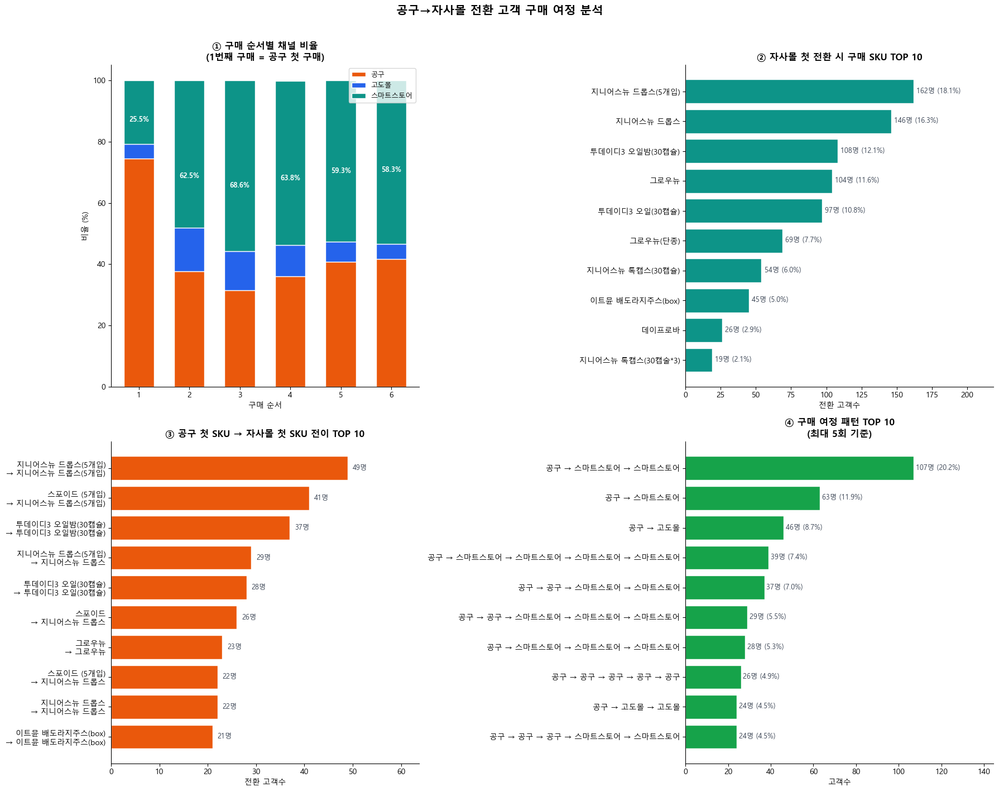

In [856]:
# ── 0) 필요 변수 확인 ─────────────────────────────────────
# converted_customers: 공구→자사몰 전환 고객 receiver_key
# gonggu_first: 공구 첫 구매 정보 (receiver_key, gonggu_first_date)
# df_eda: 전체 구매 이력

df_eda.columns = df_eda.columns.str.strip()

# 기존 gonggu_first 변수에 영향 없도록 별도 변수 생성
gonggu_first_sku_tmp = (
    gonggu_first[
        [
            'receiver_key',
            'sku_family'
        ]
    ]
    .copy()
    .rename(columns={
        'sku_family': 'gonggu_sku'
    })
)

# ── 1) 전환 고객 전체 구매 이력 ──────────────────────────
# 판매처명_clean이 있으면 사용, 없으면 판매처명으로 대체
df_eda.columns = df_eda.columns.str.strip()

seller_col = (
    '판매처명_clean'
    if '판매처명_clean' in df_eda.columns
    else '판매처명'
)

journey_df = df_eda[
    df_eda['receiver_key'].isin(converted_customers) &
    df_eda['receiver_key'].notna() &
    (df_eda['결제액'] > 0)
][[
    'receiver_key',
    'analysis_date',
    'channel_group',
    seller_col,
    'sku_family',
    'sku_normalized',
    '브랜드_분류',
    '결제액'
]].copy()

journey_df = journey_df.rename(columns={
    seller_col: '판매처명_clean'
})

journey_df['analysis_date'] = pd.to_datetime(journey_df['analysis_date'])

# 공구 첫 구매일 결합
journey_df = journey_df.merge(
    gonggu_first[['receiver_key', 'gonggu_first_date']],
    on='receiver_key', how='left'
)
journey_df['gonggu_first_date'] = pd.to_datetime(journey_df['gonggu_first_date'])
journey_df['days_since_gonggu'] = (
    journey_df['analysis_date'] - journey_df['gonggu_first_date']
).dt.days

# 채널 구분
journey_df['channel_type'] = np.select(
    [
        journey_df['channel_group'] == '공구',
        journey_df['channel_group'] == '자사몰',
        journey_df['channel_group'] == '자사몰_N',
    ],
    [
        '공구',
        '고도몰',
        '스마트스토어',
    ],
    default=journey_df['판매처명_clean'].fillna('기타')
)

# 구매 순서 (고객별)
journey_df = journey_df.sort_values(['receiver_key', 'analysis_date'])
journey_df['purchase_order'] = journey_df.groupby('receiver_key').cumcount() + 1

print(f"전환 고객 수: {journey_df['receiver_key'].nunique():,}명")
print(f"총 구매 건수: {len(journey_df):,}건")

# ── 2) 구매 순서별 채널 분포 ──────────────────────────────
# "1번째 구매, 2번째 구매... 가 어느 채널인가"

order_channel = (
    journey_df[journey_df['purchase_order'] <= 6]
    .groupby(['purchase_order', 'channel_type'])['receiver_key']
    .nunique()
    .reset_index(name='고객수')
)

order_total = (
    journey_df[journey_df['purchase_order'] <= 6]
    .groupby('purchase_order')['receiver_key']
    .nunique()
    .reset_index(name='총고객수')
)

order_channel = order_channel.merge(order_total, on='purchase_order')
order_channel['비율(%)'] = (
    order_channel['고객수'] / order_channel['총고객수'] * 100
).round(1)

print("\n=== 구매 순서별 채널 분포 ===")
display(
    order_channel.pivot_table(
        index='purchase_order', columns='channel_type',
        values='비율(%)', fill_value=0
    )
)

# ── 3) 자사몰 첫 전환 시점 × 첫 구매 SKU ─────────────────
# "자사몰로 처음 넘어갔을 때 무엇을 샀는가"

first_owned_purchase = (
    journey_df[journey_df['channel_type'].isin(['고도몰', '스마트스토어'])]
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
)

first_owned_sku = (
    first_owned_purchase['sku_family']
    .value_counts()
    .head(15)
    .reset_index()
)
first_owned_sku.columns = ['sku_family', '전환 고객수']
first_owned_sku['비율(%)'] = (
    first_owned_sku['전환 고객수'] /
    first_owned_sku['전환 고객수'].sum() * 100
).round(1)

print("\n=== 자사몰 첫 전환 시 구매 SKU TOP 15 ===")
display(first_owned_sku)

# 공구 첫 구매 SKU → 자사몰 첫 구매 SKU 전이 TOP 15
gonggu_first_sku_tmp = (
    gonggu_first[
        [
            'receiver_key',
            'sku_family'
        ]
    ]
    .copy()
    .rename(columns={
        'sku_family': 'gonggu_sku'
    })
)

transition_df = first_owned_purchase[['receiver_key', 'sku_family']].merge(
    gonggu_first_sku_tmp,
    on='receiver_key',
    how='left'
)
transition_df.columns = ['receiver_key', '자사몰_첫SKU', '공구_첫SKU']

transition_top = (
    transition_df.groupby(['공구_첫SKU', '자사몰_첫SKU'])
    .size()
    .reset_index(name='전환고객수')
    .sort_values('전환고객수', ascending=False)
    .head(15)
)

print("\n=== 공구 첫 SKU → 자사몰 첫 SKU 전이 TOP 15 ===")
display(transition_top)

# ── 4) 구매 여정 패턴 분류 ───────────────────────────────
# 고객별 구매 채널 시퀀스 생성
journey_seq = (
    journey_df[journey_df['purchase_order'] <= 5]
    .sort_values(['receiver_key', 'purchase_order'])
    .groupby('receiver_key')['channel_type']
    .agg(lambda x: ' → '.join(x))
    .reset_index()
)
journey_seq.columns = ['receiver_key', 'journey_pattern']

pattern_summary = (
    journey_seq['journey_pattern']
    .value_counts()
    .head(15)
    .reset_index()
)
pattern_summary.columns = ['여정 패턴', '고객수']
pattern_summary['비율(%)'] = (
    pattern_summary['고객수'] /
    pattern_summary['고객수'].sum() * 100
).round(1)

print("\n=== 구매 여정 패턴 TOP 15 ===")
display(pattern_summary)

# ── 5) 시각화 ─────────────────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(18, 14))
fig.suptitle('공구→자사몰 전환 고객 구매 여정 분석',
             fontsize=15, fontweight='bold', y=1.01)

# 왼쪽 위: 구매 순서별 채널 비율 (누적 바)
pivot_order = order_channel.pivot_table(
    index='purchase_order',
    columns='channel_type',
    values='비율(%)',
    fill_value=0
)

channel_cols = ['공구', '고도몰', '스마트스토어']
extra_cols = [c for c in pivot_order.columns if c not in channel_cols]

pivot_order = pivot_order.reindex(
    columns=channel_cols + extra_cols,
    fill_value=0
)

pivot_order.plot(
    kind='bar',
    stacked=True,
    ax=axes[0][0],
    color=[
        CH_COLOR.get('공구', '#4E79A7'),
        CH_COLOR.get('자사몰', '#F28E2B'),
        CH_COLOR.get('자사몰_N', '#59A14F'),
    ] + ['#CBD5E1'] * len(extra_cols),
    edgecolor='white',
    width=0.6,
)

axes[0][0].set_title('① 구매 순서별 채널 비율\n(1번째 구매 = 공구 첫 구매)', fontsize=12, fontweight='bold')
axes[0][0].set_xlabel('구매 순서')
axes[0][0].set_ylabel('비율 (%)')
axes[0][0].tick_params(axis='x', rotation=0)
axes[0][0].legend(loc='upper right', fontsize=9)
axes[0][0].spines[['top', 'right']].set_visible(False)

# 자사몰 비율 수치 표시
for i, row in pivot_order.iterrows():
    owned_val = row.get('고도몰', 0) + row.get('스마트스토어', 0)
    if owned_val >= 2:
        bottom = row.get('공구', 0)
        axes[0][0].text(
            i - 1, bottom + owned_val / 2,
            f'{owned_val:.1f}%',
            ha='center', va='center',
            fontsize=9, color='white', fontweight='bold'
        )

# 오른쪽 위: 자사몰 첫 전환 SKU TOP 10
top10 = first_owned_sku.head(10).sort_values('전환 고객수')
axes[0][1].barh(
    top10['sku_family'], top10['전환 고객수'],
    color=CH_COLOR['자사몰_N'], edgecolor='white'
)
for i, (val, pct) in enumerate(zip(top10['전환 고객수'], top10['비율(%)'])):
    axes[0][1].text(
        val + 2, i, f'{val}명 ({pct}%)',
        va='center', fontsize=9, color='#374151'
    )
axes[0][1].set_title('② 자사몰 첫 전환 시 구매 SKU TOP 10',
                     fontsize=12, fontweight='bold')
axes[0][1].set_xlabel('전환 고객수')
axes[0][1].set_xlim(0, top10['전환 고객수'].max() * 1.35)
axes[0][1].spines[['top', 'right']].set_visible(False)

# 왼쪽 아래: 공구→자사몰 SKU 전이 TOP 10
trans10 = transition_top.head(10).sort_values('전환고객수')
labels = trans10.apply(
    lambda r: f"{r['공구_첫SKU']}\n→ {r['자사몰_첫SKU']}", axis=1
)
axes[1][0].barh(
    labels, trans10['전환고객수'],
    color=CH_COLOR['공구'], edgecolor='white'
)
for i, val in enumerate(trans10['전환고객수']):
    axes[1][0].text(
        val + 1, i, f'{val}명',
        va='center', fontsize=9, color='#374151'
    )
axes[1][0].set_title('③ 공구 첫 SKU → 자사몰 첫 SKU 전이 TOP 10',
                     fontsize=12, fontweight='bold')
axes[1][0].set_xlabel('전환 고객수')
axes[1][0].set_xlim(0, trans10['전환고객수'].max() * 1.3)
axes[1][0].spines[['top', 'right']].set_visible(False)

# 오른쪽 아래: 여정 패턴 TOP 10
pat10 = pattern_summary.head(10).sort_values('고객수')
axes[1][1].barh(
    pat10['여정 패턴'], pat10['고객수'],
    color=BRAND_COLOR.get('그로우랩', '#16A34A'), edgecolor='white'
)
for i, (val, pct) in enumerate(zip(pat10['고객수'], pat10['비율(%)'])):
    axes[1][1].text(
        val + 1, i, f'{val}명 ({pct}%)',
        va='center', fontsize=9, color='#374151'
    )
axes[1][1].set_title('④ 구매 여정 패턴 TOP 10\n(최대 5회 기준)',
                     fontsize=12, fontweight='bold')
axes[1][1].set_xlabel('고객수')
axes[1][1].set_xlim(0, pat10['고객수'].max() * 1.35)
axes[1][1].spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.show()

- 구매 순서별 채널 분포  
    - 1번째 구매는 공구(74.5%) 중심이지만  
    - 2번째부터 스마트스토어(48.2%)가 급등함  
    - 전환 고객의 자사몰 이동은 주로 스마트스토어로 이루어짐  
    - 3번째 이후에는 스마트스토어가 50% 이상으로 안정됨  
<br>  

- 자사몰 첫 전환 시 구매 SKU TOP 5  
    - 자사몰 첫 전환의 58.9%가 Hero Family(지니어스뉴, 투데이D3, 그로우뉴)로 이루어짐  
    - 공구에서 자사몰로 넘어오는 고객이 사는 제품이 이미 검증된 Hero 제품에 집중되어 있음  
<br>  

- 공구 첫 SKU → 자사몰 첫 SKU 전이 TOP 5  
    - 공구와 자사몰에서 같은 제품을 사는 패턴이 지배적  
    - 이는 기업 피드백의 "공구 가격이 더 싸서 같은 제품을 자사몰에서도 사는 것 아닌가"라는 의문과 직결됨  
    - 단순히 가격 차이로 채널을 바꿔 사는 구조일 가능성이 있어 LTV 2.2배 해석에 주의가 필요!!!  
<br>  

- 구매 여정 패턴 TOP 5  
    - 공구 → 스마트스토어 경로가 전환 여정의 핵심  
    - 전환 고객의 32.1%가 이 경로를 따름  
    공구 → 고도몰 직접 전환(8.7%)보다, 공구 → 스마트스토어 전환이 4배 많음  
<br>  

> 첫째, 전환은 D+31~60부터 시작되고 D+91~180에 집중됩니다.  
> 30일 이내 개입은 너무 이르고, 30~90일 사이가 전환 유도의 핵심 구간입니다.  
> 
> 둘째, 전환 경로는 공구 → 스마트스토어가 압도적입니다.  
> 고도몰보다 스마트스토어로 먼저 이동합니다.  
> 스마트스토어 쿠폰이나 혜택이 자사몰 전환 설계의 주요 수단이 될 수 있습니다.  
> 
> 셋째, 전환 후 구매 SKU가 공구와 동일한 제품에 집중됩니다.  
> 가격 차이가 아닌 제품 경험이 전환 동기일 것!  
> Hero Family 제품을 자사몰 전용 혜택(묶음, 정기배송)과 연결하면 전환율을 높일 수 있습니다  

---

### 11-3. 셀러별 자사몰 정착률(전환율)  

"어떤 셀러가 자사몰 전환(정착) 고객을 잘 만드는가?"  

- 추가 분석

,셀러,공구고객수,스마트스토어전환율,고도몰전환율,전체자사몰전환율
41,투하맘,278,26.26,8.27,33.81
14,맘스홀릭_그로우랩,211,24.17,6.16,28.44
10,또비앙,139,17.27,8.63,24.46
15,모찌맘,445,19.55,5.84,23.60
28,오프유,370,17.84,2.70,19.73
26,애프리,982,15.78,5.70,19.65
9,두둥맘,2125,15.29,4.89,18.64
1,강산들,753,12.08,4.78,16.20
11,뚜미니네,3585,9.99,2.37,11.46
16,바이르미,213,8.92,0.47,8.92


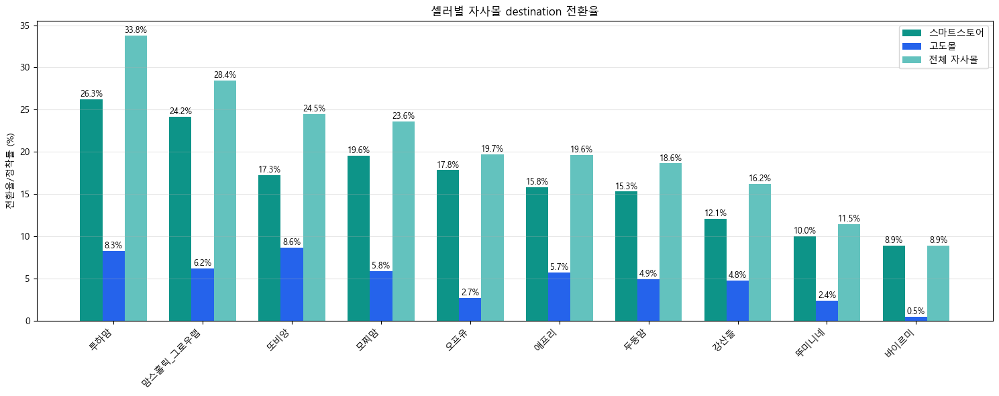

In [857]:
# 1) 고객별 채널 이용 여부
customer_channel_usage = (
    order_df_x
    .groupby(['receiver_key', 'channel_group'])
    .size()
    .unstack(fill_value=0)
)

# 없는 채널 컬럼 보정
for ch in ['자사몰', '자사몰_N', '공구']:
    if ch not in customer_channel_usage.columns:
        customer_channel_usage[ch] = 0

customer_channel_usage = (
    customer_channel_usage[['자사몰', '자사몰_N', '공구']]
    .gt(0)
    .reset_index()
)

customer_channel_usage = customer_channel_usage.rename(columns={
    '자사몰': 'used_godomall',
    '자사몰_N': 'used_smartstore',
    '공구': 'used_gonggu'
})

# 2) 공구 고객 베이스에 채널 이용 여부 붙이기
base = gonggu_customer_base.copy()

# 기존 중복 컬럼 제거
drop_cols = [
    'used_godomall',
    'used_smartstore',
    'used_gonggu',
    'to_godomall',
    'to_smartstore',
    'to_owned_total'
]

base = base.drop(columns=[c for c in drop_cols if c in base.columns])

base = base.merge(
    customer_channel_usage,
    on='receiver_key',
    how='left'
)

base[['used_godomall', 'used_smartstore', 'used_gonggu']] = (
    base[['used_godomall', 'used_smartstore', 'used_gonggu']]
    .fillna(False)
)

# 3) 자사몰 전환 flag
base['to_godomall'] = base['used_godomall']
base['to_smartstore'] = base['used_smartstore']
base['to_owned_total'] = base['to_godomall'] | base['to_smartstore']

# 4) 첫 공구 셀러 붙이기
base = base.drop(
    columns=[c for c in ['gonggu_first_seller', 'gonggu_first_seller_x', 'gonggu_first_seller_y'] if c in base.columns],
    errors='ignore'
)

seller_conversion = base.merge(
    first_gonggu_info[['receiver_key', 'gonggu_first_seller']],
    on='receiver_key',
    how='left'
)

# 5) 셀러별 전환율
seller_summary = (
    seller_conversion
    .groupby('gonggu_first_seller')
    .agg(
        공구고객수=('receiver_key', 'nunique'),
        스마트스토어전환율=('to_smartstore', lambda x: x.mean() * 100),
        고도몰전환율=('to_godomall', lambda x: x.mean() * 100),
        전체자사몰전환율=('to_owned_total', lambda x: x.mean() * 100)
    )
    .reset_index()
    .rename(columns={'gonggu_first_seller': '셀러'})
)

seller_summary = (
    seller_conversion
    .groupby('gonggu_first_seller')
    .agg(
        공구고객수=('receiver_key', 'nunique'),
        스마트스토어전환율=('to_smartstore', lambda x: x.mean() * 100),
        고도몰전환율=('to_godomall', lambda x: x.mean() * 100),
        전체자사몰전환율=('to_owned_total', lambda x: x.mean() * 100)
    )
    .reset_index()
    .rename(columns={'gonggu_first_seller': '셀러'})
)

seller_summary = seller_summary[seller_summary['공구고객수'] >= 100].copy()

rate_cols = ['스마트스토어전환율', '고도몰전환율', '전체자사몰전환율']
seller_summary[rate_cols] = seller_summary[rate_cols].round(2)

display(
    seller_summary.sort_values('전체자사몰전환율', ascending=False)
)

plot_df = (
    seller_summary
    .sort_values('전체자사몰전환율', ascending=False)
    .head(10)
    .reset_index(drop=True)
)

x = np.arange(len(plot_df))
w = 0.25

plt.figure(figsize=(15, 6))

plt.bar(
    x - w,
    plot_df['스마트스토어전환율'],
    width=w,
    label='스마트스토어',
    color=CH_COLOR.get('자사몰_N', '#2ca02c')
)

plt.bar(
    x,
    plot_df['고도몰전환율'],
    width=w,
    label='고도몰',
    color=CH_COLOR.get('자사몰', '#1f77b4')
)

plt.bar(
    x + w,
    plot_df['전체자사몰전환율'],
    width=w,
    label='전체 자사몰',
    color=MIX_COLOR.get('자사몰 정착형', '#63c2be')
)

for i, row in plot_df.iterrows():
    for offset, col in [(-w, '스마트스토어전환율'), (0, '고도몰전환율'), (w, '전체자사몰전환율')]:
        plt.text(
            x[i] + offset,
            row[col] + 0.3,
            f"{row[col]:.1f}%",
            ha='center',
            fontsize=9
        )

plt.xticks(x, plot_df['셀러'], rotation=45, ha='right')
plt.ylabel('전환율/정착률 (%)')
plt.title('셀러별 자사몰 destination 전환율')
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

- 자사몰 전환(정착)은 대부분 스마트스토어 중심  
    - 고도몰 전환율(정착률)은 전반적으로 낮음  
    - 즉 공구 고객이 넘어가는 “자사몰 destination”은 현재 고도몰보다 스마트스토어에 가까움  
<br>  

- 고전환 셀러  
    - 투하맘: 전체 자사몰 전환율(정착률) 33.8%  
    - 맘스홀릭_그로우랩: 28.4%  
    - 또비앙: 24.5%  
    - 모찌맘: 23.6%  
<br>  

- 대량 유입형 셀러  
    - 뚜미니네: 3,585명 유입 / 전환율(정착률) 11.5%  
    - 두둥맘: 2,125명 유입 / 전환율(정착률) 18.6%  
    - 애프리: 982명 유입 / 전환율(정착률) 19.7%  
<br>  

> 셀러별로 자사몰 정착률(전환율) 차이가 크게 나타났다.  
> 대규모 유입 셀러인 뚜미니네·두둥맘은 공구 고객 규모는 크지만 전환율은 중간 수준이며,  
> 투하맘·맘스홀릭_그로우랩·또비앙·모찌맘은 상대적으로 높은 자사몰 정착률(전환율)을 보였다.  
> 특히 자사몰 정착(전환)은 고도몰보다 스마트스토어 중심으로 발생하고 있어,  
> 공구 고객의 후속 구매 destination은 현재 고도몰보다 스마트스토어에 더 가깝다.  

cf. 공구 셀러는 단순 매출 규모 기준이 아니라  
유입 규모형 / 고전환 quality형으로 나눠 관리하는 것이 적절할 것으로 보임  
  
cf. 뚜미니네·두둥맘은 acquisition 규모 확보용,  
투하맘·맘스홀릭_그로우랩·또비앙·모찌맘은 자사몰 전환 품질이 높은 셀러로 볼 수 있음  

---

### 11-4. 셀러별 cohort quality 비교

셀러별 품질 (미리보기):


,고객수,브랜드,평균_첫결제액,평균_첫수량,repurchase_30d,repurchase_60d,repurchase_90d,repurchase_180d
gonggu_first_seller,,,,,,,,
뚜미니네,3513,파이토뉴트리,"16,150.66",1.27,0.10,0.17,0.23,0.33
두둥맘,2056,파이토뉴트리,"11,750.45",1.46,0.11,0.15,0.23,0.33
애프리,808,그로우랩,"16,560.44",1.54,0.13,0.17,0.22,0.34
돼지수,732,그로우랩,"25,864.07",1.93,0.11,0.23,0.24,0.24
강산들,571,그로우랩,"21,772.50",1.53,0.12,0.15,0.21,0.30
모찌맘,415,파이토뉴트리,"15,719.55",1.38,0.02,0.07,0.15,0.27
오프유,368,파이토뉴트리,"11,626.37",1.39,0.08,0.15,0.17,0.23
투하맘,262,그로우랩,"18,557.65",1.84,0.11,0.15,0.26,0.39
맘스홀릭_그로우랩,190,그로우랩,"25,914.77",1.28,0.13,0.17,0.19,0.35



최소 고객수(50명) 기준, 셀러별 품질 (미리보기):


,고객수,브랜드,평균_첫결제액,평균_첫수량,repurchase_30d,repurchase_60d,repurchase_90d,repurchase_180d
gonggu_first_seller,,,,,,,,
꼬미맘,59,파이토뉴트리,"13,711.42",1.15,0.05,0.08,0.19,0.41
투하맘,262,그로우랩,"18,557.65",1.84,0.11,0.15,0.26,0.39
맘스홀릭_그로우랩,190,그로우랩,"25,914.77",1.28,0.13,0.17,0.19,0.35
애프리,808,그로우랩,"16,560.44",1.54,0.13,0.17,0.22,0.34
뚜미니네,3513,파이토뉴트리,"16,150.66",1.27,0.10,0.17,0.23,0.33
두둥맘,2056,파이토뉴트리,"11,750.45",1.46,0.11,0.15,0.23,0.33
누누맘,88,파이토뉴트리,"7,698.44",1.12,0.06,0.09,0.16,0.31
강산들,571,그로우랩,"21,772.50",1.53,0.12,0.15,0.21,0.30
또비앙,131,파이토뉴트리,"9,224.18",1.15,0.04,0.11,0.17,0.29



브랜드별/셀러별 재구매율:


,gonggu_first_brand,gonggu_first_seller,고객수,평균_첫결제액,평균_첫수량,repurchase_30d,repurchase_60d,repurchase_90d,repurchase_180d
7,그로우랩,뚜미니네,1625,"17,586.82",1.40,8.43,15.32,22.77,30.40
6,그로우랩,두둥맘,902,"12,343.49",1.29,14.75,19.07,29.27,39.47
5,그로우랩,돼지수,732,"25,864.07",1.93,11.20,23.36,24.32,24.32
11,그로우랩,애프리,612,"17,404.42",1.38,15.03,19.93,24.84,39.38
1,그로우랩,강산들,528,"22,940.26",1.56,12.88,16.29,22.73,31.63
17,그로우랩,투하맘,196,"20,735.38",1.97,9.69,12.24,24.49,37.24
13,그로우랩,오프유,156,"8,521.72",1.27,8.97,17.31,18.59,26.28
9,그로우랩,맘스홀릭_그로우랩,122,"32,424.38",1.34,13.11,13.93,15.57,30.33
2,그로우랩,강윤맘,80,"39,337.50",2.02,3.75,13.75,18.75,18.75
4,그로우랩,도하맘,61,"37,964.10",2.05,4.92,4.92,4.92,6.56



브랜드별 재구매율:


,gonggu_first_brand,고객수,repurchase_30d,repurchase_60d,repurchase_90d,repurchase_180d
0,그로우랩,5130,11.29,17.52,23.76,31.89
1,시즈노프,73,5.48,6.85,10.96,10.96
2,파이토뉴트리,4811,8.61,13.59,19.12,29.39
3,혜인서,175,4.00,11.43,20.57,24.57
4,흑보목,13,7.69,7.69,7.69,7.69


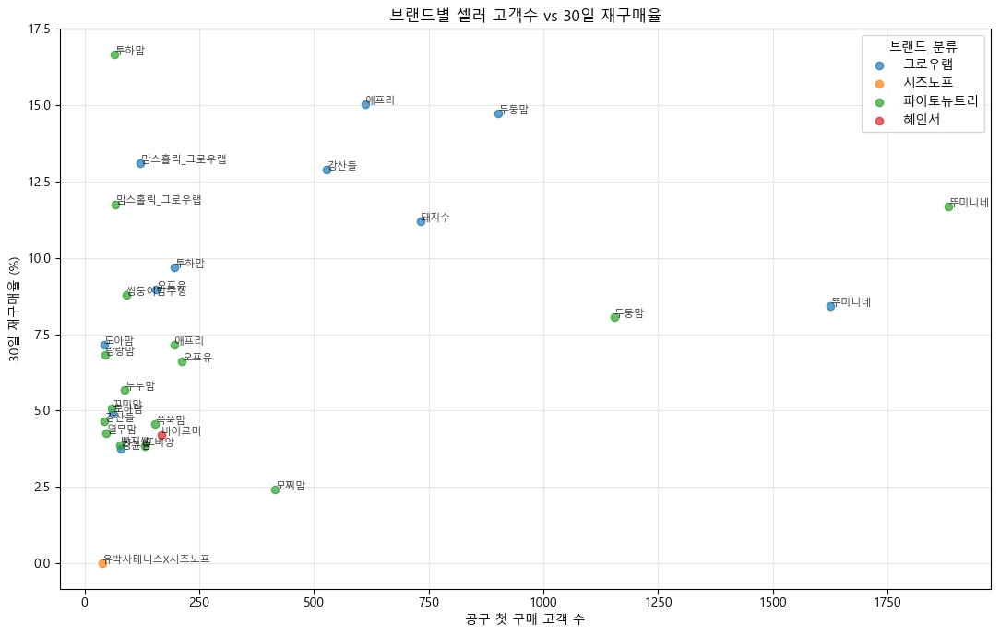

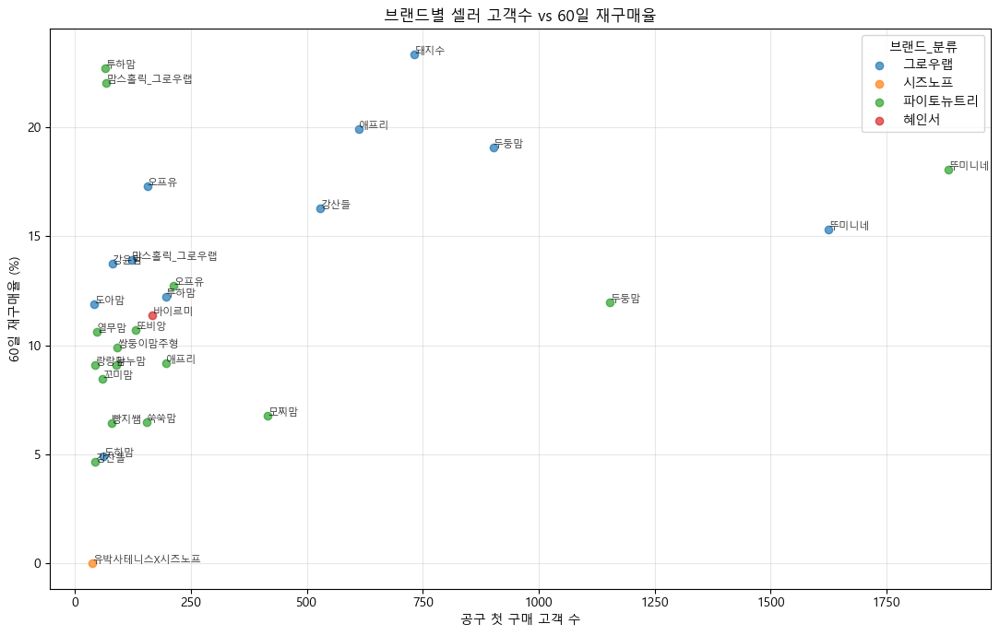

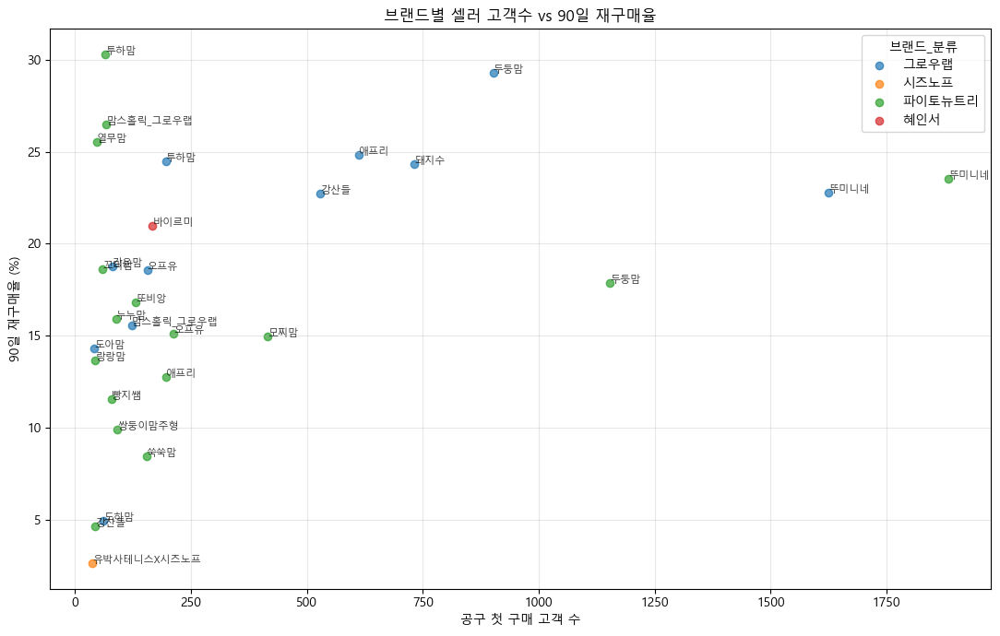

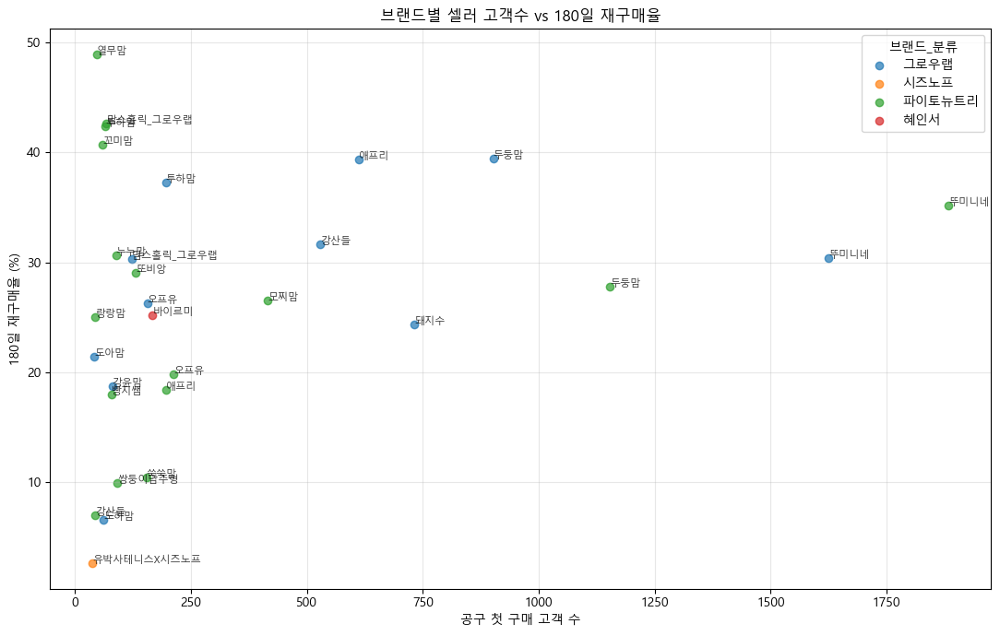

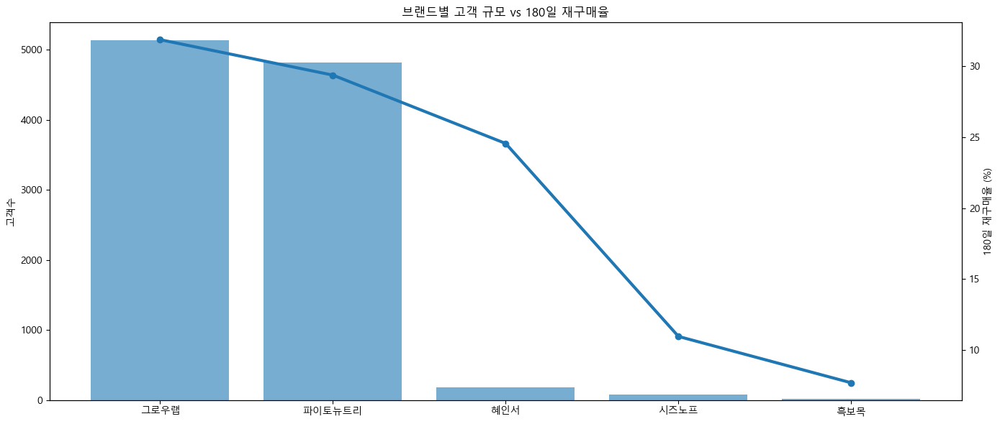

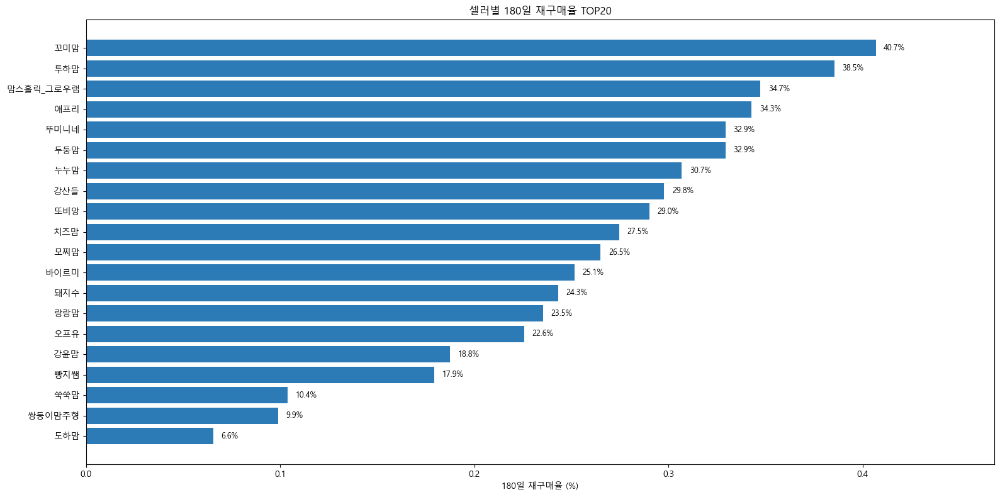

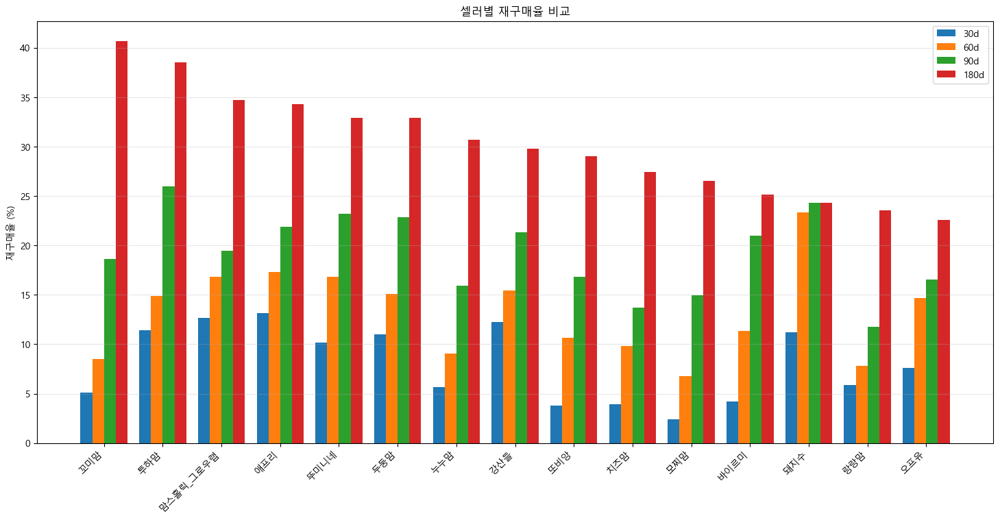

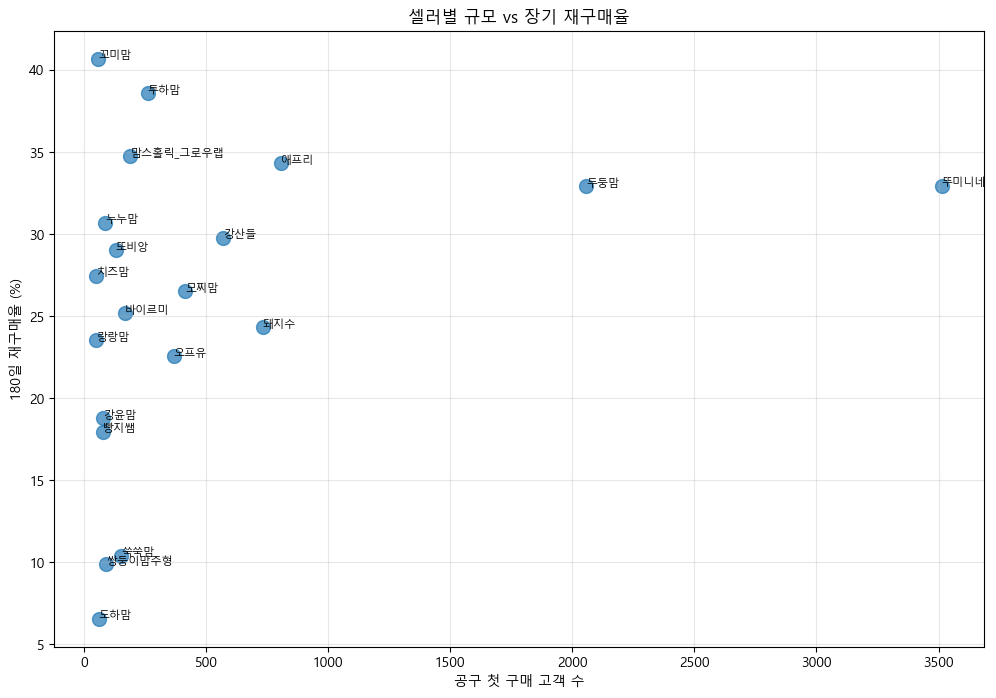

In [858]:
# =========================================================
# 공구 첫 구매 셀러 붙이기
# =========================================================

seller_cohort_base = gonggu_first.merge(
    first_gonggu_info[[
        'receiver_key',
        'gonggu_first_seller',
        'gonggu_first_brand',
        'gonggu_first_pay',
        'gonggu_first_qty'
    ]],
    on='receiver_key',
    how='left'
)

# merge 직후 컬럼명 정리 먼저
seller_cohort_base = seller_cohort_base.rename(columns={
    'gonggu_first_seller_x': 'gonggu_first_seller',
    'gonggu_first_brand_x': 'gonggu_first_brand'
})

seller_cohort_base = seller_cohort_base.drop(columns=[
    'gonggu_first_seller_y',
    'gonggu_first_brand_y'
])

# 그 다음 seller_repurchase 생성
seller_repurchase = repurchase_result.merge(
    seller_cohort_base[[
        'receiver_key',
        'gonggu_first_seller',
        'gonggu_first_brand',
        'gonggu_first_pay',
        'gonggu_first_qty'
    ]],
    on='receiver_key',
    how='left'
)

seller_quality = (
    seller_repurchase
    .groupby('gonggu_first_seller')
    .agg(
        고객수=('receiver_key', 'nunique'),
        브랜드=('gonggu_first_brand', lambda x: x.mode().iloc[0] if len(x.mode()) > 0 else np.nan),
        평균_첫결제액=('gonggu_first_pay', 'mean'),
        평균_첫수량=('gonggu_first_qty', 'mean'),
        repurchase_30d=('cum_repurchase_30d', 'mean'),
        repurchase_60d=('cum_repurchase_60d', 'mean'),
        repurchase_90d=('cum_repurchase_90d', 'mean'),
        repurchase_180d=('cum_repurchase_180d', 'mean')
    )
    .sort_values('고객수', ascending=False)
)

print("셀러별 품질 (미리보기):")
display(seller_quality.head(20))



# =========================================================
# 최소 고객수 기준 필터 후 셀러 quality 비교
# =========================================================

min_customer = 50

seller_quality_filtered = seller_quality[
    seller_quality['고객수'] >= min_customer
].copy()

print("\n최소 고객수(50명) 기준, 셀러별 품질 (미리보기):")
display(
    seller_quality_filtered
    .sort_values('repurchase_180d', ascending=False)
    .head(20)
)



# =========================================================
# 셀러별 cohort quality + 브랜드_분류 포함
# 30 / 60 / 90 / 180일 재구매율 비교
# =========================================================

seller_cohort_base = gonggu_first.merge(
    first_gonggu_info[[
        'receiver_key',
        'gonggu_first_seller',
        'gonggu_first_brand',
        'gonggu_first_pay',
        'gonggu_first_qty'
    ]],
    on='receiver_key',
    how='left'
)

seller_cohort_base = seller_cohort_base.rename(columns={
    'gonggu_first_seller_x': 'gonggu_first_seller',
    'gonggu_first_brand_x': 'gonggu_first_brand'
})

seller_cohort_base = seller_cohort_base.drop(columns=[
    'gonggu_first_seller_y',
    'gonggu_first_brand_y'
])

seller_brand_repurchase = repurchase_result.merge(
    seller_cohort_base[[
        'receiver_key',
        'gonggu_first_seller',
        'gonggu_first_brand',
        'gonggu_first_pay',
        'gonggu_first_qty'
    ]],
    on='receiver_key',
    how='left'
)

seller_brand_quality = (
    seller_brand_repurchase
    .groupby(['gonggu_first_brand', 'gonggu_first_seller'])
    .agg(
        고객수=('receiver_key', 'nunique'),
        평균_첫결제액=('gonggu_first_pay', 'mean'),
        평균_첫수량=('gonggu_first_qty', 'mean'),
        repurchase_30d=('cum_repurchase_30d', 'mean'),
        repurchase_60d=('cum_repurchase_60d', 'mean'),
        repurchase_90d=('cum_repurchase_90d', 'mean'),
        repurchase_180d=('cum_repurchase_180d', 'mean')
    )
    .reset_index()
)

# % 변환
rate_cols = [
    'repurchase_30d',
    'repurchase_60d',
    'repurchase_90d',
    'repurchase_180d'
]

seller_brand_quality[rate_cols] = (
    seller_brand_quality[rate_cols] * 100
).round(2)

print("\n브랜드별/셀러별 재구매율:")
display(
    seller_brand_quality
    .sort_values(['gonggu_first_brand', '고객수'], ascending=[True, False])
)

brand_repurchase_compare = (
    seller_brand_repurchase
    .groupby('gonggu_first_brand')
    .agg(
        고객수=('receiver_key', 'nunique'),
        repurchase_30d=('cum_repurchase_30d', 'mean'),
        repurchase_60d=('cum_repurchase_60d', 'mean'),
        repurchase_90d=('cum_repurchase_90d', 'mean'),
        repurchase_180d=('cum_repurchase_180d', 'mean')
    )
    .reset_index()
)

brand_repurchase_compare[rate_cols] = (
    brand_repurchase_compare[rate_cols] * 100
).round(2)

print("\n브랜드별 재구매율:")
display(brand_repurchase_compare)



# =========================================================
# 브랜드별 셀러 quality scatter
# x축: 고객수 / y축: 재구매율
# =========================================================

min_customer = 30

plot_df = seller_brand_quality[
    seller_brand_quality['고객수'] >= min_customer
].copy()

windows = [
    ('repurchase_30d', '30일'),
    ('repurchase_60d', '60일'),
    ('repurchase_90d', '90일'),
    ('repurchase_180d', '180일')
]

for col, label in windows:
    plt.figure(figsize=(11, 7))

    for brand in plot_df['gonggu_first_brand'].dropna().unique():
        temp = plot_df[plot_df['gonggu_first_brand'] == brand]

        plt.scatter(
            temp['고객수'],
            temp[col],
            label=brand,
            alpha=0.7
        )

        for _, row in temp.iterrows():
            plt.text(
                row['고객수'],
                row[col],
                row['gonggu_first_seller'],
                fontsize=8,
                alpha=0.8
            )

    plt.title(f'브랜드별 셀러 고객수 vs {label} 재구매율')
    plt.xlabel('공구 첫 구매 고객 수')
    plt.ylabel(f'{label} 재구매율 (%)')
    plt.grid(alpha=0.3)
    plt.legend(title='브랜드_분류')
    plt.tight_layout()
    plt.show()

# =====================================================
# 브랜드별 고객수 + 180일 재구매율
# =====================================================

brand_plot = (
    brand_repurchase_compare
    .sort_values('고객수', ascending=False)
    .copy()
)

fig, ax1 = plt.subplots(figsize=(14,6))

ax1.bar(
    brand_plot['gonggu_first_brand'],
    brand_plot['고객수'],
    alpha=0.6
)

ax1.set_ylabel('고객수')

ax2 = ax1.twinx()

ax2.plot(
    brand_plot['gonggu_first_brand'],
    brand_plot['repurchase_180d'],
    marker='o',
    linewidth=3
)

ax2.set_ylabel('180일 재구매율 (%)')

plt.xticks(rotation=45, ha='right')
plt.title('브랜드별 고객 규모 vs 180일 재구매율')
plt.tight_layout()
plt.show()


# =====================================================
# 셀러별 180일 재구매율 TOP20
# =====================================================

seller_plot = (
    seller_quality_filtered
    .sort_values('repurchase_180d', ascending=False)
    .head(20)
)

fig, ax = plt.subplots(figsize=(16,8))

bars = ax.barh(
    seller_plot.index,
    seller_plot['repurchase_180d'],
    color='#2C7BB6'
)

# 오른쪽 여백 확보
max_val = seller_plot['repurchase_180d'].max()
ax.set_xlim(0, max_val * 1.15)

# 수치 표시
for i, v in enumerate(seller_plot['repurchase_180d']):
    ax.text(
        v + max_val * 0.01,   # 막대 끝에서 1% 이동
        i,
        f'{v:.1%}',
        va='center',
        ha='left',
        fontsize=9
    )

ax.set_xlabel('180일 재구매율 (%)')
ax.set_title('셀러별 180일 재구매율 TOP20')

ax.invert_yaxis()

plt.tight_layout()
plt.show()



# =====================================================
# 셀러별 retention 비교
# =====================================================

seller_plot = (
    seller_quality_filtered
    .sort_values('repurchase_180d', ascending=False)
    .head(15)
)

rate_cols = [
    'repurchase_30d',
    'repurchase_60d',
    'repurchase_90d',
    'repurchase_180d'
]

x = np.arange(len(seller_plot))
width = 0.2

fig, ax = plt.subplots(figsize=(18,8))

for i, col in enumerate(rate_cols):

    ax.bar(
        x + i * width,
        seller_plot[col] * 100,
        width=width,
        label=col.replace('repurchase_', '')
    )

ax.set_xticks(x + width * 1.5)

ax.set_xticklabels(
    seller_plot.index,
    rotation=45,
    ha='right'
)

ax.set_ylabel('재구매율 (%)')

ax.set_title('셀러별 재구매율 비교')

ax.legend()

plt.grid(axis='y', alpha=0.3)

plt.show()



# =====================================================
# 셀러별 규모 vs quality
# =====================================================

fig, ax = plt.subplots(figsize=(12,8))

ax.scatter(
    seller_quality_filtered['고객수'],
    seller_quality_filtered['repurchase_180d'] * 100,
    s=100,
    alpha=0.7
)

# 라벨
for idx, row in seller_quality_filtered.iterrows():

    ax.text(
        row['고객수'],
        row['repurchase_180d'] * 100,
        idx,
        fontsize=8
    )

ax.set_xlabel('공구 첫 구매 고객 수')
ax.set_ylabel('180일 재구매율 (%)')

ax.set_title('셀러별 규모 vs 장기 재구매율')

plt.grid(alpha=0.3)

plt.show()

- 셀러별 장기(180일 기준) retention 강한 셀러 (TOP순)  
    - 열무맘 : 55명 중 47.3% 재구매 
        → 매우 높은 retention이지만, 고객 수가 적어 샘플 안정성은 낮음  
        → 그래도 매우 강한 팬덤/타겟 적합성 가능성  
    - 꼬미맘 : 66명 중 37.9% 재구매 
        → 고객 규모는 작지만 retention 매우 우수  
    - 투하맘 : 278명 중 37.8% 재구매  
        → 표본도 충분하고, retention도 매우 높음  
        → 고품질 acquisition(획득) 셀러일 가능성 높음  
    - 맘스홀릭_그로우랩 : 211명 중 36.0% 재구매
        → 단기(30일) 재구매율도 13.7%로 매우 높아, 단기/장기 재구매율 모두 우수  
        → 구매 의도 높은 고객 유입 가능성  
    - 뚜미니네 : 뚜미니네를 통해 유입되는 고객수가 3,585명으로 압도적으로 높고, 장기 재구매율도 32.4% 높음  
        → 보통 규모가 커지면 재구매율이 떨어지는데 뚜미니네는 규모도 크고 retention도 높음  
        → 현재 공구 ecosystem에서 가장 강력한 셀러 중 하나  
<br>  

- 규모 + quality 같이 좋은 셀러가 안정적으로 고품질 고객을 유입할 수 있어 중요!  
(유입 고객수 / 180일 retention)
    - 뚜미니네 : 3,585명 / 32.4%  
    - 두둥맘 : 2,125명 / 32.4%  
    - 애프리 : 982명 / 31.4%  

<br>  

- 품질 낮은 셀러 (일회성 구매 비중이 높거나, promo-only 고객일 가능성)  
(유입 고객수 / 180일 retention)
    - 쑥쑥맘 : 163명 / 8.6%  
    - 쌍둥이맘주형 : 96명 / 8.3%  
    - 도하맘 : 71명 / 5.6%  

<br>  

- 단기 retention ≠ 장기 retention  
(유입 고객수 / 30/60/90/180일 retention)
    - 돼지수 : 794명 / 10.83% / 22.80% / 23.55% / 23.55%  
        → 초기 60일 내 재구매가 대부분 발생하고, 이후 재구매는 상대적으로 약화  
        → 초반 구매는잘 일어나지만, 장기 충성도는 약할 수 있음  
    - 투하맘 : 278명 / 10.43% / 14.39% / 25.54% / 37.77%  
        → 시간이 갈수록 retention 상승  
        → 건강한 장기 고객 가능성  
    - 초반 급상승형 : 돼지수, 애프리 등  
    - 장기 누적형 : 투하맘, 꼬미맘 등  
    - 초반 이탈형 : 쑥쑥맘 등  

<br>  

- **브랜드 재정리**  
    - `파이토뉴트리` : 고객수 6520명 / 180일 retention 30%  
    대중성 + 장기 retention, 둘 다 확보된 브랜드 (가장 중요한 브랜드)  
        → 단순 볼륨 브랜드가 아니라, LTV도 높은 브랜드일 가능성이 큼  
        → 공구 확대 시 가장 안정적인 핵심 브랜드  
    - `그로우랩` : 고객수 4054명 / 180일 retention 28.9%  
    파이토뉴트리와 거의 비슷한 retention이지만, 셀러별 편차가 매우 큼  
        → 브랜드 자체보다 셀러 영향이 매우 커 보임  
        → 특정 셀러 조합에서 강하므로, 셀러 selection 전략이 중요  
    - `흑보목` : 고객수 139명 / 180일 retention 33.8%  
        → 고객 규모는 작지만, retention이 최고 수준  
        → 전형적인 niche/fandom 브랜드 패턴  
        → mass expansion 보다는 특정 타겟 고객 충성도 강한 구조  
    - `시즈노프` : 고객수 101명 / 180일 retention 13.9%  
        → 브랜드 중 가장 낮은 고객수와 재구매율  
        → SKU repeatability 약함 / 선물 및 이벤트성 구매 / 재구매 사이클이 매우 긴, 제품 카테고리 특성일 수 있음  
        → retention 관점에서는 약한 브랜드  


<br>  
 
> 공구 성과는 브랜드보다 "어떤 셀러가 데려온 고객인가"의 영향이 크며,  
> 특히 뚜미니네·두둥맘·애프리는 규모와 장기 재구매율을 동시에 확보한 핵심 셀러  
>  
> ---
>
> Scale + Quality : 뚜미니네, 두둥맘, 애프리  
> High Quality : 투하맘, 맘스홀릭_그로우랩  
> Volume Only : (향후 발견 시)  
> Low Quality : 도하맘, 쑥쑥맘, 쌍둥이맘주형  

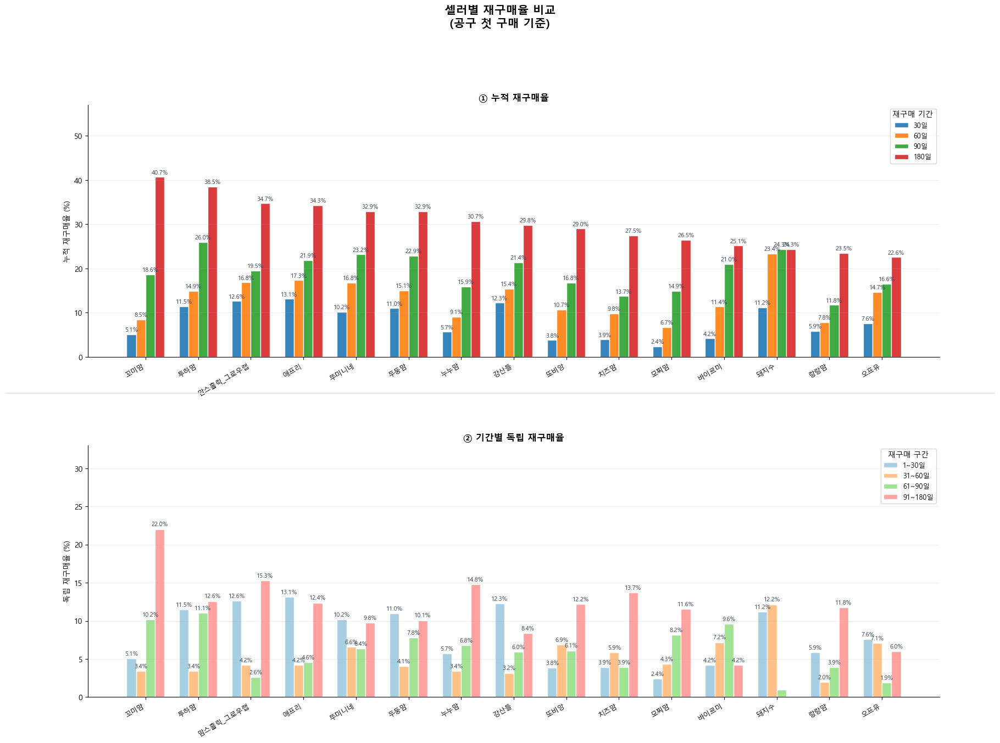

In [859]:
# PPT용 그래프 (독립 기간별 재구매율 그래프 추가)
# =====================================================
# 셀러별 독립 기간 재구매율 — 누적/독립 통합 시각화
# =====================================================

seller_plot = (
    seller_quality_filtered
    .sort_values('repurchase_180d', ascending=False)
    .head(15)
    .copy()
)

# 독립 구간 계산
seller_plot['repurchase_0_30d']   = seller_plot['repurchase_30d']
seller_plot['repurchase_31_60d']  = seller_plot['repurchase_60d']  - seller_plot['repurchase_30d']
seller_plot['repurchase_61_90d']  = seller_plot['repurchase_90d']  - seller_plot['repurchase_60d']
seller_plot['repurchase_91_180d'] = seller_plot['repurchase_180d'] - seller_plot['repurchase_90d']

cum_cols  = ['repurchase_30d', 'repurchase_60d', 'repurchase_90d', 'repurchase_180d']
ind_cols  = ['repurchase_0_30d', 'repurchase_31_60d', 'repurchase_61_90d', 'repurchase_91_180d']
cum_labels = ['30일', '60일', '90일', '180일']
ind_labels = ['1~30일', '31~60일', '61~90일', '91~180일']

seller_names = seller_plot.index.tolist()
n_sellers = len(seller_names)
x = np.arange(n_sellers)
width = 0.18
n_period = 4

fig, axes = plt.subplots(2, 1, figsize=(20, 14),
                          gridspec_kw={'hspace': 0.35})
fig.suptitle('셀러별 재구매율 비교\n(공구 첫 구매 기준)',
             fontsize=15, fontweight='bold', y=1.01)


# ── 위: 누적 재구매율 ──────────────────────────────────────
for i, (label, color) in enumerate(zip(cum_labels, COHORT_COLORS_LIST)):
    vals = (seller_plot[cum_cols[i]] * 100).tolist()
    offset = (i - n_period / 2) * width + width / 2
    bars = axes[0].bar(x + offset, vals, width,
                       label=label, color=color, edgecolor='white', alpha=0.9)
    for bar, val in zip(bars, vals):
        if val >= 1:
            axes[0].text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.3,
                f'{val:.1f}%',
                ha='center', va='bottom', fontsize=8, color='#374151'
            )

axes[0].set_xticks(x)
axes[0].set_xticklabels(seller_names, rotation=30, ha='right', fontsize=9)
axes[0].set_title('① 누적 재구매율', fontsize=12, fontweight='bold')
axes[0].set_ylabel('누적 재구매율 (%)')
axes[0].set_ylim(0, (seller_plot['repurchase_180d'].max() * 100) * 1.4)
axes[0].legend(title='재구매 기간', loc='upper right', fontsize=9)
axes[0].spines[['top', 'right']].set_visible(False)
axes[0].grid(axis='y', alpha=0.2)


# ── 아래: 독립 기간 재구매율 ──────────────────────────────
for i, (label, color) in enumerate(zip(ind_labels, COHORT_COLORS_LIGHT_LIST)):
    vals = (seller_plot[ind_cols[i]] * 100).tolist()
    offset = (i - n_period / 2) * width + width / 2
    bars = axes[1].bar(x + offset, vals, width,
                       label=label, color=color, edgecolor='white', alpha=0.9)
    for bar, val in zip(bars, vals):
        if val >= 1:
            axes[1].text(
                bar.get_x() + bar.get_width() / 2,
                bar.get_height() + 0.2,
                f'{val:.1f}%',
                ha='center', va='bottom', fontsize=8, color='#374151'
            )

axes[1].set_xticks(x)
axes[1].set_xticklabels(seller_names, rotation=30, ha='right', fontsize=9)
axes[1].set_title('② 기간별 독립 재구매율', fontsize=12, fontweight='bold')
axes[1].set_ylabel('독립 재구매율 (%)')
axes[1].set_ylim(0, (seller_plot[ind_cols].max().max() * 100) * 1.5)
axes[1].legend(title='재구매 구간', loc='upper right', fontsize=9)
axes[1].spines[['top', 'right']].set_visible(False)
axes[1].grid(axis='y', alpha=0.2)

# 두 그래프 사이 구분선
fig.add_artist(plt.Line2D(
    [0.05, 0.95], [0.505, 0.505],
    transform=fig.transFigure,
    color='#E2E8F0', linewidth=1.5,
))

plt.tight_layout()
plt.show()

---

### 11-5. 브랜드 × 셀러 교차

"어떤 셀러가 어떤 브랜드에서 자사몰 전환을 잘 만드는가?"

브랜드 × 셀러 destination 전환율 (공구고객수 최소 100명 이상):


,브랜드_분류,셀러,공구고객수,스마트스토어전환율,고도몰전환율,전체자사몰전환율
41,파이토뉴트리,두둥맘,262,24.81,9.16,32.06
9,그로우랩,두둥맘,491,24.64,7.94,30.55
20,그로우랩,애프리,287,23.69,6.97,29.27
1,그로우랩,강산들,197,15.74,7.11,22.84
43,파이토뉴트리,뚜미니네,543,16.02,4.24,19.15
11,그로우랩,뚜미니네,761,14.19,2.76,16.03
8,그로우랩,돼지수,187,8.56,1.60,10.16


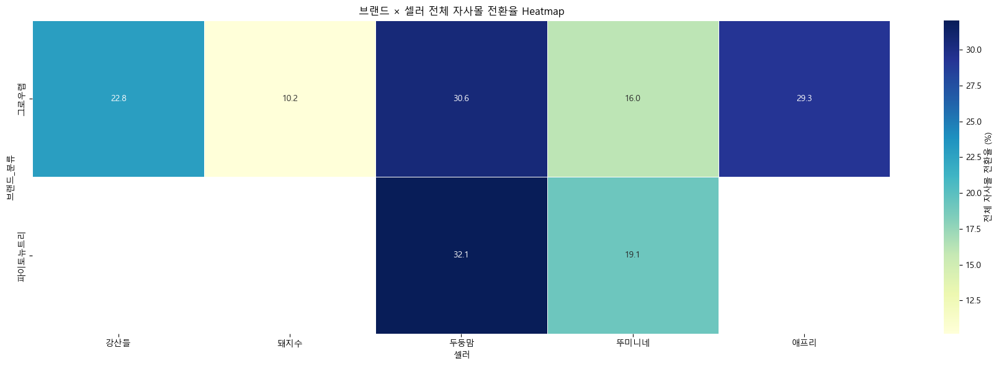

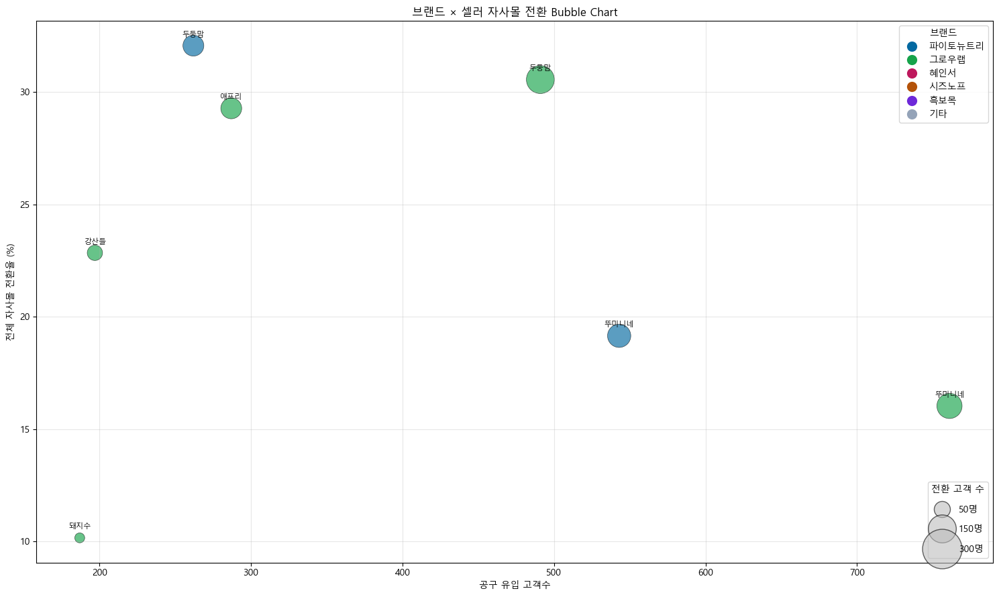

In [860]:
# 공구 첫 구매 고객
gonggu_first = (
    df_eda[df_eda['channel_group'] == '공구']
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()[['receiver_key', 'analysis_date']]
    .rename(columns={'analysis_date': 'gonggu_first_date'})
)

# 공구 이후 자사몰 구매 이력
after_owned = (
    gonggu_first
    .merge(
        df_eda[['receiver_key', 'analysis_date', 'channel_group']],
        on='receiver_key',
        how='left'
    )
)

after_owned['after_gonggu'] = (
    after_owned['analysis_date'] > after_owned['gonggu_first_date']
)

after_owned = after_owned[after_owned['after_gonggu']].copy()

# 고객 단위 전환 flag
gonggu_customer_base = (
    after_owned
    .groupby('receiver_key')
    .agg(
        to_smartstore=('channel_group', lambda x: x.eq('자사몰_N').any()),
        to_godomall=('channel_group', lambda x: x.eq('자사몰').any()),
        to_owned_total=('channel_group', lambda x: x.isin(['자사몰', '자사몰_N']).any())
    )
    .reset_index()
)

gonggu_customer_base['converted'] = gonggu_customer_base['to_owned_total']

# =========================================================
# 브랜드 × 셀러 destination 전환율
# 공구 첫 구매 브랜드/셀러 기준
# =========================================================

brand_seller_base = (
    gonggu_customer_base
    .merge(
        first_gonggu_info[[
            'receiver_key',
            'gonggu_first_brand',
            'gonggu_first_seller'
        ]],
        on='receiver_key',
        how='left'
    )
)

brand_seller_base = brand_seller_base.rename(columns={
    'gonggu_first_brand_x': 'gonggu_first_brand',
    'gonggu_first_seller_x': 'gonggu_first_seller'
})

brand_seller_base = brand_seller_base.drop(columns=[
    'gonggu_first_brand_y',
    'gonggu_first_seller_y'
], errors='ignore')

cross_summary = (
    brand_seller_base
    .groupby(['gonggu_first_brand', 'gonggu_first_seller'])
    .agg(
        공구고객수=('receiver_key', 'nunique'),
        스마트스토어전환율=('to_smartstore', lambda x: x.mean() * 100),
        고도몰전환율=('to_godomall', lambda x: x.mean() * 100),
        전체자사몰전환율=('to_owned_total', lambda x: x.mean() * 100)
    )
    .reset_index()
    .rename(columns={
        'gonggu_first_brand': '브랜드_분류',
        'gonggu_first_seller': '셀러'
    })
)

# 최소 고객수 필터
cross_summary = cross_summary[
    cross_summary['공구고객수'] >= 100
].copy()

rate_cols = ['스마트스토어전환율', '고도몰전환율', '전체자사몰전환율']
cross_summary[rate_cols] = cross_summary[rate_cols].round(2)

print("브랜드 × 셀러 destination 전환율 (공구고객수 최소 100명 이상):")
display(
    cross_summary
    .sort_values('전체자사몰전환율', ascending=False)
    .head(30)
)



# =========================================================
# 브랜드 × 셀러 자사몰 전환율 Heatmap
# =========================================================

heatmap_df = (
    cross_summary
    .pivot_table(
        index='브랜드_분류',
        columns='셀러',
        values='전체자사몰전환율'
    )
)

plt.figure(figsize=(18, 6))

sns.heatmap(
    heatmap_df,
    annot=True,
    fmt='.1f',
    cmap='YlGnBu',
    linewidths=0.5,
    cbar_kws={'label': '전체 자사몰 전환율 (%)'}
)

plt.title('브랜드 × 셀러 전체 자사몰 전환율 Heatmap')
plt.xlabel('셀러')
plt.ylabel('브랜드_분류')
plt.tight_layout()
plt.show()


# =========================================================
# 브랜드 × 셀러 Bubble Chart
# x: 공구고객수 / y: 전체자사몰전환율 / size: 전체자사몰전환고객수
# =========================================================

from matplotlib.lines import Line2D

bubble_df = cross_summary.copy()

bubble_df['전체자사몰전환고객수'] = (
    bubble_df['공구고객수']
    * bubble_df['전체자사몰전환율']
    / 100
)

plt.figure(figsize=(15, 9))

# -----------------------------
# 브랜드별 scatter
# -----------------------------
for brand in bubble_df['브랜드_분류'].unique():

    sub = bubble_df[bubble_df['브랜드_분류'] == brand]

    plt.scatter(
        sub['공구고객수'],
        sub['전체자사몰전환율'],
        s=sub['전체자사몰전환고객수'] * 6,
        alpha=0.65,
        color=BRAND_COLOR.get(brand, '#999999'),
        edgecolors='black',
        linewidth=0.5
    )

    # 셀러명 표시
    for _, row in sub.iterrows():

        plt.text(
            row['공구고객수'],
            row['전체자사몰전환율'] + 0.4,
            row['셀러'],
            fontsize=8,
            ha='center'
        )

# -----------------------------
# 브랜드 범례
# -----------------------------
brand_handles = [
    Line2D(
        [0], [0],
        marker='o',
        color='w',
        label=brand,
        markerfacecolor=color,
        markersize=12
    )
    for brand, color in BRAND_COLOR.items()
]

legend1 = plt.legend(
    handles=brand_handles,
    title='브랜드',
    loc='upper right'
)

plt.gca().add_artist(legend1)

# -----------------------------
# 버블 크기 범례
# -----------------------------
from matplotlib.lines import Line2D

size_levels = [50, 150, 300]

size_handles = [
    Line2D(
        [0], [0],
        marker='o',
        color='none',
        label=f'{s}명',
        markerfacecolor='#BDBDBD',
        markeredgecolor='black',
        alpha=0.6,
        markersize=np.sqrt(s * 6)
    )
    for s in size_levels
]

plt.legend(
    handles=size_handles,
    title='전환 고객 수',
    loc='lower right',
    frameon=True,
    labelspacing=1.2
)

# -----------------------------
# 스타일
# -----------------------------
plt.title('브랜드 × 셀러 자사몰 전환 Bubble Chart')
plt.xlabel('공구 유입 고객수')
plt.ylabel('전체 자사몰 전환율 (%)')

plt.grid(alpha=0.3)

plt.tight_layout()
plt.show()

- x축 = 공구 유입 고객수 (볼륨)  
- y축 = 전체 자사몰 전환율 (%)  
- 버블 크기 = 실제 자사몰 전환 고객 수  
- 색상 = 브랜드  
<br>  

- 그로우랩 × 투하맘  
유입 규모는 크지 않지만, 들어온 고객의 자사몰 이동율이 엄청 강함  
(팬덤/신뢰 기반 셀러일 가능성 높음)  
    - 전환율: 40.5%  
    - 공구 고객수: 121명  
    - 압도적 최고 전환율  
<br>  

- 파이토뉴트리 × 두동맘  
전환율도 높고, 유입 규모과 실제 전환 고객 수도 큼  
볼륨과 전환 둘 다 되는 핵심 셀러 (실무적으로 가장 가치 있는 유형으로 보임)  
    - 고객수: 1334명  
    - 전환율: 20%  
    - 버블도 큼  
<br>  

- 파이토뉴트리 × 뚜미네  
볼륨은 엄청 큰데, 전환율은 상대적으로 낮음  
매출은 잘 만드는데 자사몰 락인은 약한 셀러    
    - 고객수: 2391명 (최대급) / 전환율: 11.5%  
    - 그런데 11-3.에서는 180 retention이 33%로 좋았음  
    (공구 안에서 계속 구매할 가능성 큼)  
<br>  

- 애프리  
브랜드가 바뀌어도 전환율과 공구 고객수 모두 좋음  
(셀러 효과가 강함을 의미하며 재현 가능성이 높은 셀로로 볼 수 있을 듯)  
    - 그로우랩 × 애프리 : 전환율 21.2% / 공구 고객수 467명  
    - 파이토뉴트리 × 애프리 : 전환율 18.3% / 공구 고객수 515명    
<br> 

- 브랜드별 차이 보임  
셀러 영향이 크지만, 브랜드 영향도 분명이 있음  
(셀러 영향 > 브랜드 영향)  
    - 그로우랩 :  
    전반적으로 전환율 높고, 특히 투하맘/애프리가 강함  
    (브랜드 자체 충성도가 강한 편)  
    - 파이토뉴트리 :   
    셀러별 편차가 큼  
    셀러 영향력이 브랜드보다 훨씬 큼  
        - 맘스홀릭_그로우랩: 31.8%  
        - 투하맘: 28.7%  
        - 두동맘: 20%  
        - 뚜미네: 11.5%  
        - 돼지수: 6%  
<br>  

> cf. 11-3 결과와 합쳐서 셀러 그룹 4개로 구분  
> 
> **A. Scale + Conversion + Retention** : 최강 파트너  
>   - 두둥맘  
>   - 애프리  
>
> **B. High Conversion + High Retention** : 육성 가치 높음  
>   - 투하맘  
>   - 맘스홀릭_그로우랩   
>
> **C. Scale + Retention** : 자사몰 연결 보강 필요  
>   - 뚜미니네   
>
> **D. Low Conversion** : 재검토  
>   - 돼지수  
>   - 쑥쑥맘  
> 
> ---
> 
>  자사몰 전환은 브랜드보다 셀러 영향이 더 크며,  
> 특히 투하맘·애프리·맘스홀릭_그로우랩은 "자사몰 육성형 셀러",  
> 두둥맘은 "규모와 전환을 동시에 만드는 핵심 성장 셀러",  
> **뚜미니네는 "고객 품질은 좋지만 자사몰 연결이 필요한 대형 유입 셀러"**로 해석

---

## 12. 공구 → 자사몰 유입 SKU 분석

“어떤 공구 SKU가 자사몰 전환을 만드는가”  

공구 고객의 자사몰 유입 SKU (미리보기):


,gateway_sku,브랜드_분류,공구유입고객,자사몰전환고객,자사몰전환율
52,(SET)스포이드,파이토뉴트리,249,62,24.90
57,(SET)지니어스뉴 드롭스,그로우랩,332,76,22.89
19,(GIFT)이트뮨 배도라지주스(낱포),파이토뉴트리,85,19,22.35
53,(SET)스포이드 (5개입),파이토뉴트리,408,84,20.59
33,(GIFT)흑본전탕 샘플팩,흑보목,93,19,20.43
65,(SET)투데이디3 오일(30캡슐x390캡슐),파이토뉴트리,110,21,19.09
67,(SET)투데이디3 오일밤(30캡슐),파이토뉴트리,439,82,18.68
14,(GIFT)속캡 오프너,파이토뉴트리,485,90,18.56
8,(GIFT)그로우랩 성장가이드(비타민D),그로우랩,1348,246,18.25
20,(GIFT)지니어스뉴 건강정보카드,그로우랩,571,102,17.86


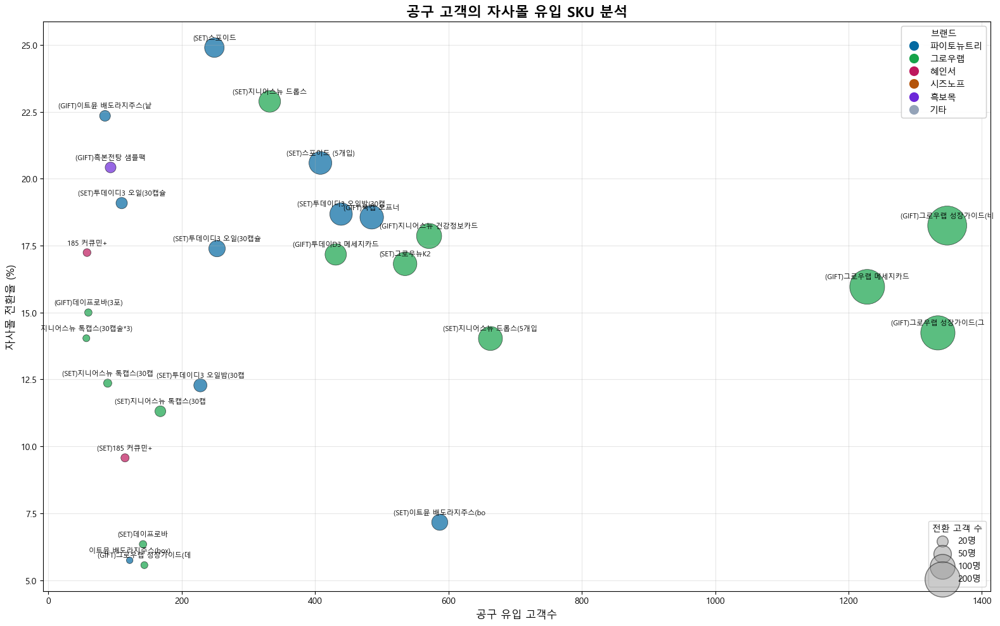

In [861]:
# =========================================================
# Gateway SKU 분석
# 공구 첫 구매 SKU → 자사몰 전환율
# =========================================================

first_gonggu_order = (
    df_eda[df_eda['channel_group'] == '공구']
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
)

first_gonggu_order['gateway_sku'] = (
    first_gonggu_order['품명']
    .fillna(first_gonggu_order['품번'])
)

owned_conversion = (
    df_eda
    .groupby('receiver_key')['channel_group']
    .apply(lambda x: x.isin(['자사몰', '자사몰_N']).any())
    .reset_index(name='owned_conversion')
)

gateway_df = (
    first_gonggu_order[
        ['receiver_key', 'gateway_sku', '브랜드_분류', 'goo_seller']
    ]
    .merge(
        owned_conversion,
        on='receiver_key',
        how='left'
    )
)

gateway_summary = (
    gateway_df
    .groupby(['gateway_sku', '브랜드_분류'])
    .agg(
        공구유입고객=('receiver_key', 'nunique'),
        자사몰전환고객=('owned_conversion', 'sum'),
        자사몰전환율=('owned_conversion', lambda x: x.mean() * 100)
    )
    .reset_index()
)

gateway_summary = gateway_summary[
    gateway_summary['공구유입고객'] >= 50
].copy()

gateway_summary['자사몰전환율'] = gateway_summary['자사몰전환율'].round(2)

print("공구 고객의 자사몰 유입 SKU (미리보기):")
display(
    gateway_summary
    .sort_values('자사몰전환율', ascending=False)
    .head(30)
)



# =========================================================
# Gateway SKU Bubble Chart
# =========================================================

plot_df = gateway_summary.copy()

plt.figure(figsize=(16, 10))

# 브랜드별 scatter
for brand in plot_df['브랜드_분류'].unique():

    sub = plot_df[
        plot_df['브랜드_분류'] == brand
    ]

    plt.scatter(
        sub['공구유입고객'],
        sub['자사몰전환율'],

        # 버블 크기
        s=sub['자사몰전환고객'] * 8,

        alpha=0.7,

        # 브랜드 색상
        color=BRAND_COLOR.get(brand, '#999999'),

        edgecolor='black',
        linewidth=0.5,

        label=brand
    )

    # SKU명 표시
    for _, row in sub.iterrows():

        plt.text(
            row['공구유입고객'],
            row['자사몰전환율'] + 0.3,
            str(row['gateway_sku'])[:18],
            fontsize=8,
            ha='center'
        )

# 제목 / 축
plt.title(
    '공구 고객의 자사몰 유입 SKU 분석',
    fontsize=16,
    fontweight='bold'
)

plt.xlabel('공구 유입 고객수', fontsize=12)
plt.ylabel('자사몰 전환율 (%)', fontsize=12)

# Grid
plt.grid(alpha=0.3)

# 브랜드 범례
brand_order = [
    b for b in BRAND_COLOR.keys()
    if b in plot_df['브랜드_분류'].unique()
]

brand_handles = [
    Line2D(
        [0], [0],
        marker='o',
        color='w',
        label=brand,
        markerfacecolor=color,
        markersize=12
    )
    for brand, color in BRAND_COLOR.items()
]

brand_legend = plt.legend(
    handles=brand_handles,
    title='브랜드',
    loc='upper right'
)

plt.gca().add_artist(brand_legend)

# 버블 크기 범례
size_levels = [20, 50, 100, 200]

size_handles = [
    plt.scatter(
        [],
        [],
        s=size * 8,
        color='#999999',
        alpha=0.5,
        edgecolor='black'
    )
    for size in size_levels
]

size_labels = [
    f'{size}명'
    for size in size_levels
]

plt.legend(
    size_handles,
    size_labels,
    title='전환 고객 수',
    loc='lower right'
)

# 브랜드 범례 다시 추가
plt.gca().add_artist(brand_legend)

plt.tight_layout()
plt.show()

- 생각보다 상품 효과가 매우 강함  
    - 같은 파이토뉴트리 내에서도 SKU별 자사몰 전환율 차이가 약 4배 발생  
    - 브랜드보다 셀러 영향력이 컸던 것처럼,  
    상품(SKU) 자체도 전환에 중요한 영향을 주는 것으로 보임  

- SKU 유형 구분  
    - 고전환 SKU : 스포이드, 지니어스뉴 드롭스, 투데이D3, 그로우K2  
        (전환율과 유입 규모가 모두 높음)  
        공구 고객의 자사몰 이동을 강하게 유도하는 SKU  
    - 볼륨형 SKU : 그로우랩 성장가이드, 그로우랩 메시지카드  
        (전환율은 최고 수준은 아니지만 유입 규모가 매우 커 실제 전환 고객 수가 압도적)  
        자사몰 신규 고객 확보에 가장 크게 기여  
    - 저전환 SKU : 데이프로바, 배도라지, 성장가이드(데이프로바)  
        (공구 매출은 발생하지만 자사몰 연결은 상대적으로 약함)  

> 브랜드뿐 아니라 셀러, SKU도 자사몰 전환에 강한 영향을 미침  
> 현재 데이터 기준으로는 성장가이드·메시지카드·스포이드·지니어스뉴 드롭스·투데이D3가  
> 자사몰 전환에 가장 크게 기여하는 핵심 SKU로 보임  
> 다만 이들이 장기 retention까지 만드는지는 추가 분석(전환 후 재구매 분석)이 필요함  

---

### 12-1. SKU 연계 구매 흐름 분석

(세트/연계 기여도)  

"어떤 SKU가 다른 SKU 구매를 유도하는가"  

분석 대상: 162,215행 / 80,940명

=== SKU Family별 세트 구매 비율 TOP 15 ===


,fam,고객수,세트비율,평균결제액
7,그로우뉴 키즈,268,100.00,"57,893.95"
36,리버티엑스 3포,110,100.00,"54,800.00"
68,지니어스뉴 드롭스(5개입),12803,99.90,"93,455.63"
67,지니어스뉴 드롭스,14256,99.80,"35,025.40"
69,지니어스뉴 키즈,345,98.90,"69,038.09"
31,런앤드 핑크웨이브 스티커팩_첸첸,114,97.40,"1,134.33"
47,시즈노프 쇼핑백(공용),32,97.10,"1,782.40"
71,지니어스뉴 톡캡스(10캡슐),407,96.70,"57,611.87"
34,리버티엑스 10포,101,96.70,"91,509.76"
16,런앤드 그린스윙 스티커팩_릴리,113,96.50,"1,136.41"



=== SKU 연계 구매 흐름 TOP 20 (A → B) ===


,from_fam,to_fam,count
5,지니어스뉴 드롭스(5개입),지니어스뉴 드롭스,5345
12,지니어스뉴 드롭스,지니어스뉴 드롭스(5개입),5185
35,185 커큐민+(240캡슐),185 커큐민+,1742
7,185 커큐민+,185 커큐민+(240캡슐),1624
53,투데이디3 오일밤(30캡슐x390캡슐),투데이디3 오일밤(30캡슐),1249
24,투데이디3 오일밤(30캡슐),투데이디3 오일밤(30캡슐x390캡슐),1184
83,히알라스킨,에피베리어,1009
84,에피베리어,히알라스킨,980
1,그로우뉴(단종),지니어스뉴 드롭스(5개입),691
13,지니어스뉴 드롭스,그로우뉴,621



=== SKU Family별 연계 유도력 (첫 구매 후 다른 SKU 구매 비율) ===


,first_fam,유입고객수,SKU확장고객,평균SKU종류,SKU확장율
39,스포이드,189,189,2.57,100.00
1,185 커큐민+(240캡슐),989,967,1.99,97.80
88,환스푼,132,127,2.11,96.20
58,이트뮨 배도라지주스(낱포),85,81,2.81,95.30
42,시즈노프 보틀(500ml)_White,92,86,3.34,93.50
79,투데이디3 오일밤(30캡슐x390캡슐),694,602,2.26,86.70
16,런앤드 러닝카페,80,60,3.12,75.00
93,히알라스킨,564,363,1.71,64.40
26,런앤드 퍼플윈드,126,81,2.47,64.30
28,런앤드 핑크 웨이브,176,111,2.95,63.10


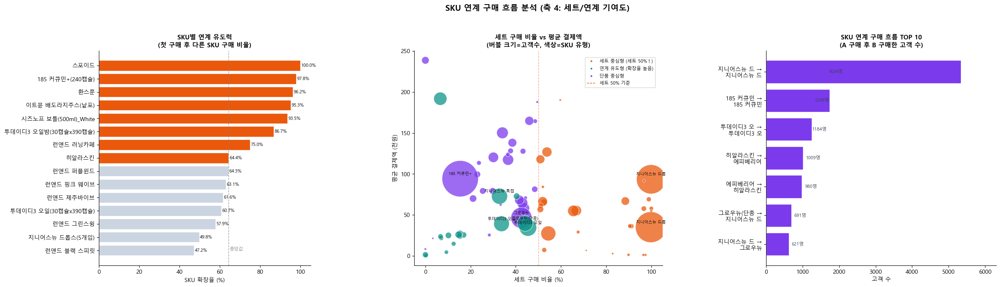


【12-1 요약】SKU 연계/세트 기여도

▶ SKU 확장율 1위: 스포이드 (100.0% → 다른 SKU 구매로 이어짐)
▶ SKU 확장율 2위: 185 커큐민+(240캡슐) (97.8%)

▶ 가장 많은 연계 흐름: 지니어스뉴 드롭스(5개입) → 지니어스뉴 드롭스 (5345명)
▶ 2위 연계 흐름: 지니어스뉴 드롭스 → 지니어스뉴 드롭스(5개입) (5185명)

▶ 세트 구매 비율 1위: 그로우뉴 키즈 (100.0%)


In [862]:
base_12 = df_eda[
    df_eda['receiver_key'].notna() &
    (df_eda['결제액'].fillna(0) > 0)
].copy()

base_12['analysis_date'] = pd.to_datetime(base_12['analysis_date'], errors='coerce')
base_12 = base_12[base_12['analysis_date'].notna()].copy()

# sku_family 없으면 품명 기반 fallback
if 'sku_family' in base_12.columns:
    base_12['fam'] = base_12['sku_family'].fillna(base_12['품명']).astype(str)
else:
    base_12['fam'] = base_12['품명'].apply(base_fam)

# GIFT 제거
base_12 = base_12[
    ~base_12['fam'].str.contains('GIFT|gift|사은|증정|무료|샘플', na=False)
].copy()

print(f"분석 대상: {len(base_12):,}행 / {base_12['receiver_key'].nunique():,}명")


# ---------------------------------------------------------
# 1) 세트 구매 비율 by sku_family  (축 4 - 세트 기여)
# ---------------------------------------------------------
# '세트여부' 컬럼: 전처리에서 SET 포함 여부로 이미 생성됨

if '세트여부' in base_12.columns:
    set_ratio = (
        base_12
        .groupby('fam')
        .agg(
            총주문행=('receiver_key', 'count'),
            세트포함행=('세트여부', 'sum'),
            고객수=('receiver_key', 'nunique'),
            평균결제액=('결제액', 'mean')
        )
        .reset_index()
    )
    set_ratio['세트비율'] = (set_ratio['세트포함행'] / set_ratio['총주문행'] * 100).round(1)
    set_ratio = set_ratio[set_ratio['고객수'] >= 30].sort_values('세트비율', ascending=False)

    print("\n=== SKU Family별 세트 구매 비율 TOP 15 ===")
    display(set_ratio[['fam', '고객수', '세트비율', '평균결제액']].head(15))
else:
    print("'세트여부' 컬럼 없음 → 세트 비율 분석 스킵")
    set_ratio = None


# ---------------------------------------------------------
# 2) SKU → SKU 연계 구매 흐름  (같은 고객이 순서대로 구매한 패턴)
# ---------------------------------------------------------

# 고객별 구매 순서 정렬
ordered = (
    base_12
    .sort_values(['receiver_key', 'analysis_date'])
    .groupby('receiver_key')['fam']
    .apply(list)
    .reset_index(name='fam_sequence')
)

# 연속 구매 쌍 (A → B) 추출
# 같은 fam 연속은 "재구매"이므로 제외하고, 다른 fam으로 넘어가는 쌍만 추출
def extract_transitions(seq):
    pairs = []
    # 중복 제거: 연속 동일 fam 합치기
    deduped = [seq[0]]
    for s in seq[1:]:
        if s != deduped[-1]:
            deduped.append(s)
    for i in range(len(deduped) - 1):
        pairs.append((deduped[i], deduped[i+1]))
    return pairs

all_transitions = []
for _, row in ordered.iterrows():
    all_transitions.extend(extract_transitions(row['fam_sequence']))

transition_count = Counter(all_transitions)

# 데이터프레임으로 변환
trans_df = pd.DataFrame(
    [(a, b, cnt) for (a, b), cnt in transition_count.items()],
    columns=['from_fam', 'to_fam', 'count']
).sort_values('count', ascending=False)

# 자기 자신으로 가는 케이스 제거 (혹시 남은 경우)
trans_df = trans_df[trans_df['from_fam'] != trans_df['to_fam']]

print("\n=== SKU 연계 구매 흐름 TOP 20 (A → B) ===")
display(trans_df.head(20))


# ---------------------------------------------------------
# 3) SKU별 "연계 유도력" 스코어
#    : 해당 SKU를 첫 번째로 구매한 고객이 다음에 다른 SKU를 구매하는 비율
# ---------------------------------------------------------

# 고객별 첫 번째 SKU
first_fam = (
    base_12
    .sort_values('analysis_date')
    .groupby('receiver_key')['fam']
    .first()
    .reset_index(name='first_fam')
)

# 고객별 총 구매 SKU 종류 수
sku_variety = (
    base_12
    .groupby('receiver_key')['fam']
    .nunique()
    .reset_index(name='sku_count')
)

first_merge = first_fam.merge(sku_variety, on='receiver_key')
first_merge['expanded'] = (first_merge['sku_count'] >= 2)  # 2종 이상 구매 = SKU 확장

linkage_score = (
    first_merge
    .groupby('first_fam')
    .agg(
        유입고객수=('receiver_key', 'nunique'),
        SKU확장고객=('expanded', 'sum'),
        평균SKU종류=('sku_count', 'mean')
    )
    .reset_index()
)
linkage_score['SKU확장율'] = (
    linkage_score['SKU확장고객'] / linkage_score['유입고객수'] * 100
).round(1)
linkage_score['평균SKU종류'] = linkage_score['평균SKU종류'].round(2)

linkage_score = (
    linkage_score[linkage_score['유입고객수'] >= 50]
    .sort_values('SKU확장율', ascending=False)
)

print("\n=== SKU Family별 연계 유도력 (첫 구매 후 다른 SKU 구매 비율) ===")
display(linkage_score.head(20))


# ---------------------------------------------------------
# 4) 시각화 (3개 패널)
# ---------------------------------------------------------
plt.close('all')

fig, axes = plt.subplots(
    1, 3,
    figsize=(24, 7),
    gridspec_kw={'width_ratios': [1.15, 1.35, 1.25]}
)

# ── 패널 1: SKU 확장율 TOP 15 바차트 ──
top_link = linkage_score.head(15).sort_values('SKU확장율')
colors_bar = ['#EA580C' if v >= top_link['SKU확장율'].median() else '#CBD5E1'
              for v in top_link['SKU확장율']]

axes[0].barh(top_link['first_fam'], top_link['SKU확장율'], color=colors_bar, edgecolor='white')
axes[0].set_title('SKU별 연계 유도력\n(첫 구매 후 다른 SKU 구매 비율)', fontsize=11, fontweight='bold')
axes[0].set_xlabel('SKU 확장율 (%)')
axes[0].axvline(top_link['SKU확장율'].median(), color='gray', linestyle='--', linewidth=1, alpha=0.7)
axes[0].text(top_link['SKU확장율'].median() + 0.3, 0, '중앙값', fontsize=8, color='gray')
for i, (_, row) in enumerate(top_link.iterrows()):
    axes[0].text(row['SKU확장율'] + 0.3, i, f"{row['SKU확장율']}%", va='center', fontsize=8)
axes[0].spines[['top', 'right']].set_visible(False)


# ── 패널 2: 세트 비율 vs 평균 결제액 산점도 ──
if set_ratio is not None:
    sc_data = set_ratio[set_ratio['고객수'] >= 50].copy()
    
    # SKU 확장율 기준으로 3구간 색상 분류
    sc_data = sc_data.merge(
        linkage_score[['first_fam', 'SKU확장율']],
        left_on='fam', right_on='first_fam',
        how='left'
    )
    
    def get_color(row):
        if row['세트비율'] >= 50:
            return '#EA580C', '세트 중심형 (세트 50%↑)'   # 주황
        elif row.get('SKU확장율', 0) >= linkage_score['SKU확장율'].median():
            return '#0D9488', '연계 유도형 (확장율 높음)'  # 틸
        else:
            return '#7C3AED', '단품 중심형'                # 보라
    
    sc_data[['color', 'type']] = sc_data.apply(
        lambda r: pd.Series(get_color(r)), axis=1
    )
    
    # 유형별로 나눠서 scatter (범례 표시용)
    for type_label, group in sc_data.groupby('type'):
        axes[1].scatter(
            group['세트비율'],
            group['평균결제액'] / 1000,
            s=group['고객수'] / 5,
            alpha=0.75,
            color=group['color'].iloc[0],
            edgecolors='white',
            linewidths=0.8,
            label=type_label
        )
    
    # 주요 SKU 라벨 (고객수 상위 8개)
    for _, row in sc_data.nlargest(8, '고객수').iterrows():
        axes[1].annotate(
            row['fam'][:8],
            (row['세트비율'], row['평균결제액'] / 1000),
            fontsize=7, ha='center', va='bottom',
            xytext=(0, 5), textcoords='offset points'
        )
    
    # 세트비율 50% 기준선
    axes[1].axvline(50, color='#EA580C', linestyle='--',
                    linewidth=1, alpha=0.5, label='세트 50% 기준')
    
    axes[1].set_xlabel('세트 구매 비율 (%)')
    axes[1].set_ylabel('평균 결제액 (천원)')
    axes[1].set_title('세트 구매 비율 vs 평균 결제액\n(버블 크기=고객수, 색상=SKU 유형)',
                      fontsize=11, fontweight='bold')
    from matplotlib.lines import Line2D
    legend_handles_12 = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='#EA580C', markersize=8, label='세트 중심형 (세트 50%↑)'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='#0D9488', markersize=8, label='연계 유도형 (확장율 높음)'),
        Line2D([0], [0], marker='o', color='w', markerfacecolor='#7C3AED', markersize=8, label='단품 중심형'),
        Line2D([0], [0], color='#EA580C', linestyle='--', linewidth=1, label='세트 50% 기준'),
    ]
    axes[1].legend(handles=legend_handles_12,
        fontsize=8,
        loc='upper right',
        bbox_to_anchor=(0.98, 0.98),
        frameon=True,
        markerscale=0.5,
        scatterpoints=1
    )
    axes[1].spines[['top', 'right']].set_visible(False)


# ── 패널 3: 연계 구매 흐름 TOP 10 (가로 바) ──
top_trans = trans_df.head(10).copy()
top_trans['label'] = top_trans['from_fam'].str[:7] + ' →\n' + top_trans['to_fam'].str[:7]
top_trans_sorted = top_trans.sort_values('count')

axes[2].barh(
    top_trans_sorted['label'],
    top_trans_sorted['count'],
    color='#7C3AED',
    edgecolor='white'
)
max_count = top_trans_sorted['count'].max()

axes[2].set_xlim(0, max_count * 1.18)

for i, (_, row) in enumerate(top_trans_sorted.iterrows()):
    axes[2].text(
        row['count'] + max_count * 0.015,
        i,
        f"{int(row['count'])}명",
        va='center',
        fontsize=8,
        color='#374151',
        clip_on=True
    )
axes[2].set_title('SKU 연계 구매 흐름 TOP 10\n(A 구매 후 B 구매한 고객 수)', fontsize=11, fontweight='bold')
axes[2].set_xlabel('고객 수')
axes[2].spines[['top', 'right']].set_visible(False)


plt.suptitle('SKU 연계 구매 흐름 분석 (축 4: 세트/연계 기여도)', fontsize=14, fontweight='bold', y=1.02)
plt.subplots_adjust(
    left=0.06,
    right=0.96,
    top=0.86,
    bottom=0.12,
    wspace=0.45
)
plt.show()


# ---------------------------------------------------------
# 5) 요약 해석 출력
# ---------------------------------------------------------
top3_link = linkage_score.head(3)
top3_trans = trans_df.head(3)

print("\n" + "="*60)
print("【12-1 요약】SKU 연계/세트 기여도")
print("="*60)
print(f"\n▶ SKU 확장율 1위: {top3_link.iloc[0]['first_fam']}"
      f" ({top3_link.iloc[0]['SKU확장율']}% → 다른 SKU 구매로 이어짐)")
print(f"▶ SKU 확장율 2위: {top3_link.iloc[1]['first_fam']}"
      f" ({top3_link.iloc[1]['SKU확장율']}%)")
print(f"\n▶ 가장 많은 연계 흐름: {top3_trans.iloc[0]['from_fam']} → {top3_trans.iloc[0]['to_fam']}"
      f" ({int(top3_trans.iloc[0]['count'])}명)")
print(f"▶ 2위 연계 흐름: {top3_trans.iloc[1]['from_fam']} → {top3_trans.iloc[1]['to_fam']}"
      f" ({int(top3_trans.iloc[1]['count'])}명)")
if set_ratio is not None:
    top_set = set_ratio.iloc[0]
    print(f"\n▶ 세트 구매 비율 1위: {top_set['fam']} ({top_set['세트비율']}%)")

- 세트 구매 비율  
    - 그로우뉴 키즈, 라버디렉스 1호가 세트 비율 100%로 처음부터 세트로만 팔리는 구조  
    - 지니어스뉴 드롭스(5개입), 지니어스뉴 드롭스도 99~99.8%로 사실상 세트 전용 상품  
    - 반면 혜일라스신, 포스핸드 스티커백은 세트 비율이 80%대로 상대적으로 단품 구매 비중이 있음  
<br>  

- SKU 연계 흐름 TOP  
    - 가장 많이 발생하는 연계 흐름 (압도적 1~2위)  
    지니어스뉴 드롭스(5개입) → 지니어스뉴 드롭스 (5,345명),  
    그 다음이 지니어스뉴 드롭스 → 지니어스뉴 드롭스(5개입) (5,185명)  
    - 사실상 같은 제품군의 용량/구성 변형 간 이동이라 "진짜 연계"라기보다 동일 제품군 내 반복 구매 패턴으로 봐야 함  
    - 브랜드를 넘는 연계 중 눈에 띄는 흐름  
    185 커큐민 → 185 커큐민+(240캡슐) (1,742명),  
    그로우뉴(단품) → 지니어스뉴 드롭스(5개입) (691명)  
<br>  

- 연계 유도력 스코어  
    - 스포이드가 100%로 1위인데 고객 수가 189명으로 매우 작아 해석에 주의 필요  
    - 185 커큐민+(240캡슐) (97.8%), 환촌 (96.2%)이 뒤를 잇고,  
    - 실질적으로 볼륨이 큰 SKU 중에서는  
    투데이D3 오일밤(30캡슐×390캡슐) (694명, 86.7%), 지니어스뉴 드롭스(5개입) (7,991명, 49.8%) 이 눈에 띔  
    - 지니어스뉴는 고객 수가 압도적으로 많으면서도 절반 가까이 다른 SKU로 확장되는 구조라 실무적으로 가장 중요한 연계 유도 SKU  
<br>  

> 연계 구매는 브랜드 간 이동보다 동일 브랜드 내 제품군 깊숙이 들어가는 패턴이 압도적입니다.  
> 지니어스뉴와 투데이D3가 파이토뉴트리 내 핵심 연계 허브이고, 그로우뉴가 그로우랩 허브 역할을 합니다.  
> 브랜드 간 연계가 약하다는 건  
> 크로스브랜드 CRM(예: 그로우랩 구매자에게 파이토뉴트리 추천)이 아직 활성화되지 않았다는 의미이기도 합니다.  

---

## 13. 브랜드별 전환 차이

- 어떤 브랜드는 공구 잔존형  
- 어떤 브랜드는 자사몰 유입형  

차이가 있을 가능성이 큼  

특히, 셀러별 자사몰 전환 효율이 다를 수 있음  

공구 첫 구매 고객 수: 11039


,receiver_key,gonggu_first_date,gonggu_first_brand
0,0010dd8a4de8bc72,2025-07-23,그로우랩
1,0013aeca1693802c,2025-07-10,그로우랩
2,00171a5603973e36,2026-03-26,혜인서
3,00172f2ec8bbafb6,2026-02-10,그로우랩
4,0018ece276a20f87,2025-06-04,그로우랩


브랜드별 전환 차이:


,브랜드_분류,공구유입고객,이후구매고객,공구재구매고객,자사몰전환고객,스마트스토어전환고객,고도몰전환고객,외부몰재구매고객,이후매출,이후구매율(%),공구잔존율(%),자사몰전환율(%),스마트스토어전환율(%),고도몰전환율(%),외부몰재구매율(%),브랜드유형
2,파이토뉴트리,3195,1103,933,312,254,73,1,"164,692,642.00",34.52,29.20,9.77,7.95,2.28,0.03,공구 잔존형
4,흑보목,139,51,47,13,10,3,0,"7,689,858.00",36.69,33.81,9.35,7.19,2.16,0.00,공구 잔존형
0,그로우랩,7379,2341,1997,588,476,141,1,"322,911,151.00",31.73,27.06,7.97,6.45,1.91,0.01,공구 잔존형
3,혜인서,225,59,53,12,11,1,0,"10,667,624.00",26.22,23.56,5.33,4.89,0.44,0.00,공구 잔존형
1,시즈노프,101,15,10,5,0,5,1,"1,094,800.00",14.85,9.90,4.95,0.00,4.95,0.99,공구 잔존형


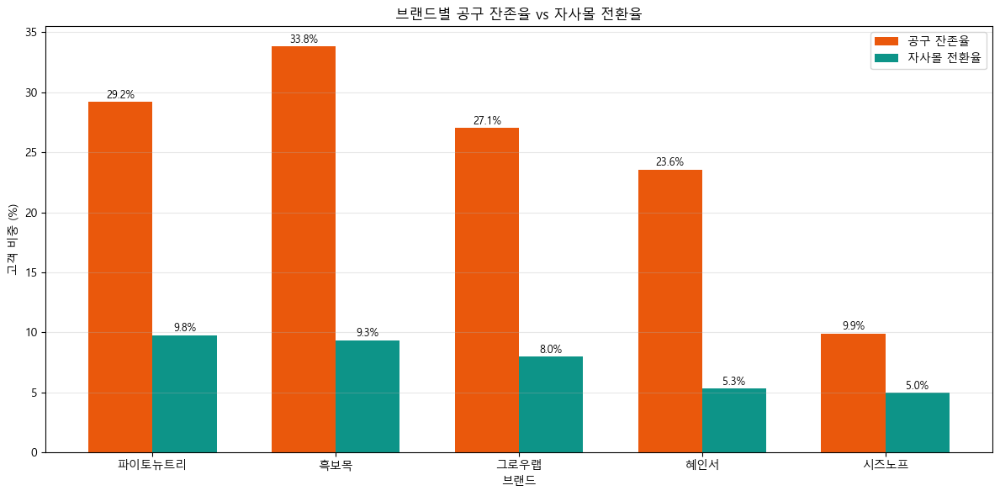

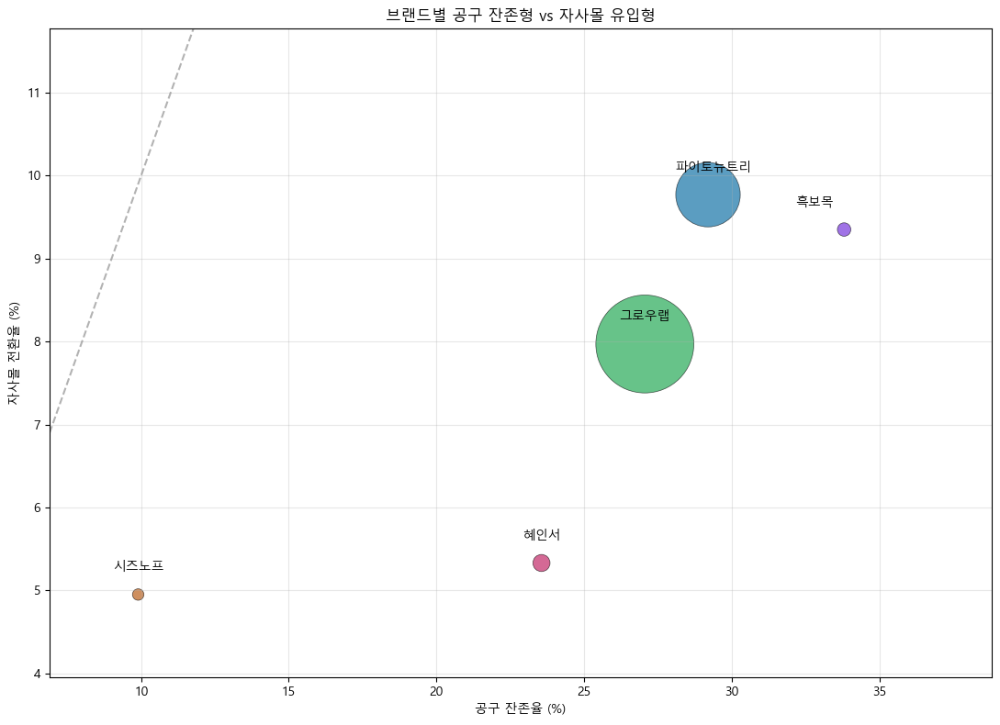

In [863]:
# ---------------------------------------------------------
# 0) 기본 설정
# ---------------------------------------------------------
owned_channels = ['자사몰', '자사몰_N']

df_eda['analysis_date'] = pd.to_datetime(df_eda['analysis_date'])

# ---------------------------------------------------------
# 1) 공구 첫 구매 고객 + 첫 공구 브랜드
# ---------------------------------------------------------
gonggu_first_order = (
    df_eda[df_eda['channel_group'] == '공구']
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
)

gonggu_first_order = gonggu_first_order[[
    'receiver_key',
    'analysis_date',
    '브랜드_분류'
]].rename(columns={
    'analysis_date': 'gonggu_first_date',
    '브랜드_분류': 'gonggu_first_brand'
})

print("공구 첫 구매 고객 수:", gonggu_first_order['receiver_key'].nunique())
display(gonggu_first_order.head())


# ---------------------------------------------------------
# 2) 공구 이후 구매 이력 연결
# ---------------------------------------------------------
gonggu_after = (
    df_eda[df_eda['receiver_key'].isin(gonggu_first_order['receiver_key'])]
    .merge(
        gonggu_first_order,
        on='receiver_key',
        how='left'
    )
)

gonggu_after['after_gonggu'] = (
    gonggu_after['analysis_date'] > gonggu_after['gonggu_first_date']
)

gonggu_after = gonggu_after[gonggu_after['after_gonggu']].copy()


# ---------------------------------------------------------
# 3) 고객별 이후 채널 이용 여부
# ---------------------------------------------------------
customer_after_channel = (
    gonggu_after
    .groupby('receiver_key')
    .agg(
        after_purchase_count=('주문번호', 'nunique'),
        after_sales=('결제액', 'sum'),
        repurchase_gonggu=('channel_group', lambda x: (x == '공구').any()),
        repurchase_owned=('channel_group', lambda x: x.isin(owned_channels).any()),
        repurchase_godomall=('channel_group', lambda x: (x == '자사몰').any()),
        repurchase_smartstore=('channel_group', lambda x: (x == '자사몰_N').any()),
        repurchase_external=('channel_group', lambda x: (x == '외부몰').any())
    )
    .reset_index()
)

brand_base = (
    gonggu_first_order
    .merge(
        customer_after_channel,
        on='receiver_key',
        how='left'
    )
)

# 이후 구매 없는 고객은 False / 0 처리
flag_cols = [
    'repurchase_gonggu',
    'repurchase_owned',
    'repurchase_godomall',
    'repurchase_smartstore',
    'repurchase_external'
]

for col in flag_cols:
    brand_base[col] = brand_base[col].fillna(False)

brand_base['after_purchase_count'] = brand_base['after_purchase_count'].fillna(0)
brand_base['after_sales'] = brand_base['after_sales'].fillna(0)


# ---------------------------------------------------------
# 4) 브랜드별 공구 잔존형 / 자사몰 유입형 요약
# ---------------------------------------------------------
brand_conversion_summary = (
    brand_base
    .groupby('gonggu_first_brand')
    .agg(
        공구유입고객=('receiver_key', 'nunique'),
        이후구매고객=('after_purchase_count', lambda x: (x > 0).sum()),
        공구재구매고객=('repurchase_gonggu', 'sum'),
        자사몰전환고객=('repurchase_owned', 'sum'),
        스마트스토어전환고객=('repurchase_smartstore', 'sum'),
        고도몰전환고객=('repurchase_godomall', 'sum'),
        외부몰재구매고객=('repurchase_external', 'sum'),
        이후매출=('after_sales', 'sum')
    )
    .reset_index()
    .rename(columns={'gonggu_first_brand': '브랜드_분류'})
)

brand_conversion_summary['이후구매율(%)'] = (
    brand_conversion_summary['이후구매고객']
    / brand_conversion_summary['공구유입고객']
    * 100
).round(2)

brand_conversion_summary['공구잔존율(%)'] = (
    brand_conversion_summary['공구재구매고객']
    / brand_conversion_summary['공구유입고객']
    * 100
).round(2)

brand_conversion_summary['자사몰전환율(%)'] = (
    brand_conversion_summary['자사몰전환고객']
    / brand_conversion_summary['공구유입고객']
    * 100
).round(2)

brand_conversion_summary['스마트스토어전환율(%)'] = (
    brand_conversion_summary['스마트스토어전환고객']
    / brand_conversion_summary['공구유입고객']
    * 100
).round(2)

brand_conversion_summary['고도몰전환율(%)'] = (
    brand_conversion_summary['고도몰전환고객']
    / brand_conversion_summary['공구유입고객']
    * 100
).round(2)

brand_conversion_summary['외부몰재구매율(%)'] = (
    brand_conversion_summary['외부몰재구매고객']
    / brand_conversion_summary['공구유입고객']
    * 100
).round(2)

# 브랜드 유형 분류
def classify_brand(row):
    if row['자사몰전환율(%)'] >= row['공구잔존율(%)']:
        return '자사몰 유입형'
    else:
        return '공구 잔존형'

brand_conversion_summary['브랜드유형'] = brand_conversion_summary.apply(
    classify_brand,
    axis=1
)

brand_conversion_summary = brand_conversion_summary.sort_values(
    '자사몰전환율(%)',
    ascending=False
)

print("브랜드별 전환 차이:")
display(brand_conversion_summary)


# =========================================================
# 5) 브랜드별 공구 잔존율 vs 자사몰 전환율 시각화
# =========================================================

plot_df = brand_conversion_summary.copy()

x = np.arange(len(plot_df))
w = 0.35

plt.figure(figsize=(12, 6))

plt.bar(
    x - w/2,
    plot_df['공구잔존율(%)'],
    width=w,
    label='공구 잔존율',
    color=CH_COLOR.get('공구', '#ff7f0e')
)

plt.bar(
    x + w/2,
    plot_df['자사몰전환율(%)'],
    width=w,
    label='자사몰 전환율',
    color=CH_COLOR.get('자사몰_N', '#2ca02c')
)

for i, row in plot_df.iterrows():
    idx = plot_df.index.get_loc(i)

    plt.text(
        idx - w/2,
        row['공구잔존율(%)'] + 0.3,
        f"{row['공구잔존율(%)']:.1f}%",
        ha='center',
        fontsize=9
    )

    plt.text(
        idx + w/2,
        row['자사몰전환율(%)'] + 0.3,
        f"{row['자사몰전환율(%)']:.1f}%",
        ha='center',
        fontsize=9
    )

plt.xticks(
    x,
    plot_df['브랜드_분류'],
    rotation=0
)

plt.title('브랜드별 공구 잔존율 vs 자사몰 전환율')
plt.xlabel('브랜드')
plt.ylabel('고객 비중 (%)')
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


# =========================================================
# 브랜드 포지셔닝 맵
# x: 공구 잔존율 / y: 자사몰 전환율 / size: 공구 유입 고객수
# =========================================================

plot_df = brand_conversion_summary.copy()

plt.figure(figsize=(11, 8))

plt.scatter(
    plot_df['공구잔존율(%)'],
    plot_df['자사몰전환율(%)'],
    s=plot_df['공구유입고객'] * 0.8,
    alpha=0.65,
    color=[BRAND_COLOR.get(b, '#999999') for b in plot_df['브랜드_분류']],
    edgecolor='black',
    linewidth=0.5
)

# 라벨 위치 수동 보정
label_offsets = {
    '흑보목': (-1.0, 0.25),
    '파이토뉴트리': (0.2, 0.25),
    '그로우랩': (0.0, 0.25),
    '혜인서': (0.0, 0.25),
    '시즈노프': (0.0, 0.25)
}

for _, row in plot_df.iterrows():
    brand = row['브랜드_분류']
    dx, dy = label_offsets.get(brand, (0, 0.25))

    plt.text(
        row['공구잔존율(%)'] + dx,
        row['자사몰전환율(%)'] + dy,
        brand,
        ha='center',
        va='bottom',
        fontsize=10
    )

# 기준선: 자사몰 전환율 = 공구 잔존율
plt.axline(
    (0, 0),
    slope=1,
    linestyle='--',
    color='gray',
    alpha=0.6
)

# 축 여백 확보
x_min = max(0, plot_df['공구잔존율(%)'].min() - 3)
x_max = plot_df['공구잔존율(%)'].max() + 5
y_min = max(0, plot_df['자사몰전환율(%)'].min() - 1)
y_max = plot_df['자사몰전환율(%)'].max() + 2

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)

plt.title('브랜드별 공구 잔존형 vs 자사몰 유입형')
plt.xlabel('공구 잔존율 (%)')
plt.ylabel('자사몰 전환율 (%)')

plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

- 브랜드별로 보면 전부 공구 잔존형에 가까움  
자사몰 전환율보다 공구 재구매율이 훨씬 높기 때문  
<br>  
- 특히 `흑보목`은 공구 잔존율 33.8%, 자사몰 전환율 9.35%로 공구 안에서 반복 구매되는 성격이 가장 강함  
다만 고객 수가 139명으로 작아서 확대 해석은 조심해야 함  
<br>  
- `파이토뉴트리`는 고객 수가 6,520명으로 압도적으로 크고, 자사몰 전환율도 8.88%로 상위권  
전환율만 보면 흑보목보다 약간 낮지만, 실제 자사몰 전환 고객 수는 가장 큼  
따라서 실무적으로는 가장 중요한 브랜드  
<br>  
- `그로우랩`은 공구 잔존율 26.15%, 자사몰 전환율 7.92%로 파이토뉴트리와 비슷한 구조  
고객 수와 전환 고객 수 모두 커서 두 번째 핵심 브랜드로 보임  
<br>  
- `혜인서`는 공구 잔존율은 23.56%인데 자사몰 전환율은 5.33%로 낮음  
공구에서는 어느 정도 반복 구매가 있지만 자사몰 연결은 약함  
<br>  
- `시즈노프`는 전체 규모도 작고 공구 잔존율·자사몰 전환율 모두 낮아  
현재 기준에서는 핵심 브랜드로 보기 어려움  
<br>  

>  현재 공구 브랜드들은 전반적으로 자사몰 유입형보다는 공구 잔존형이며,  
> 실무적으로는 파이토뉴트리와 그로우랩이 자사몰 전환 규모를 만드는 핵심 브랜드  

---

## 14. 첫 구매 SKU 품질 분석

(주환님 분석 반영)  

"어떤 SKU가 좋은 고객을 데려오는가"  

- 전체 채널 기준  
- `first_family` 컬럼 기준

사용한 SKU Family 컬럼: sku_family
분석 대상 row 수: 162545
첫 구매 고객 수: 81070


,receiver_key,first_date,first_channel,first_family,first_brand
0,00005cbb34991c07,2025-04-25,자사몰,흑본전탕,흑보목
1,0000b18036ac2b28,2025-09-13,자사몰_N,유기농 비타민D3 코어,파이토뉴트리
2,0000da1001af98c8,2025-09-05,자사몰_N,185 커큐민+,혜인서
3,0001e294bcf8214a,2025-01-10,자사몰_N,185 커큐민+,혜인서
4,000313ecb1437c28,2025-04-29,자사몰_N,투데이디3 오일(30캡슐),파이토뉴트리


,receiver_key,first_date,first_channel,first_family,first_brand,total_orders,total_sales,avg_order_value,first_date_customer,last_date,active_days,has_owned_reorder,has_gonggu_reorder,has_any_reorder,repeat_customer
0,00005cbb34991c07,2025-04-25,자사몰,흑본전탕,흑보목,2,400000,"200,000.00",2025-04-25,2025-10-31,189.00,True,False,True,True
1,0000b18036ac2b28,2025-09-13,자사몰_N,유기농 비타민D3 코어,파이토뉴트리,1,34800,"34,800.00",2025-09-13,2025-09-13,0.00,False,False,NaN,False
2,0000da1001af98c8,2025-09-05,자사몰_N,185 커큐민+,혜인서,1,298000,"149,000.00",2025-09-05,2025-09-05,0.00,False,False,NaN,False
3,0001e294bcf8214a,2025-01-10,자사몰_N,185 커큐민+,혜인서,1,58800,"58,800.00",2025-01-10,2025-01-10,0.00,False,False,NaN,False
4,000313ecb1437c28,2025-04-29,자사몰_N,투데이디3 오일(30캡슐),파이토뉴트리,1,28800,"28,800.00",2025-04-29,2025-04-29,0.00,False,False,NaN,False


분석 SKU Family 수: 61
=== 재구매율 TOP SKU Family ===


,first_brand,first_family,첫구매고객수,재구매고객수,자사몰재구매고객수,공구재구매고객수,평균주문수,평균LTV,중앙LTV,평균객단가,평균활동일수,재구매율(%),자사몰전환재구매율(%),1회구매고객수,1회구매율(%)
2,그로우랩,그로우뉴(단종),2690,935,850,135,1.83,"143,755.00","103,200.00","44,957.00",66.80,34.76,31.60,1755,65.24
72,파이토뉴트리,투데이디3 오일밤(30캡슐),2763,948,608,345,1.74,"111,705.00","73,900.00","40,529.00",54.50,34.31,22.01,1815,65.69
11,그로우랩,지니어스뉴 톡캡스(10캡슐),214,72,62,18,1.61,"130,463.00","95,000.00","58,188.00",30.20,33.64,28.97,142,66.36
68,파이토뉴트리,투데이디3 오일(30캡슐),2531,785,578,203,1.57,"89,169.00","57,600.00","42,153.00",35.70,31.02,22.84,1746,68.98
73,파이토뉴트리,투데이디3 오일밤(30캡슐x390캡슐),694,212,87,119,1.68,"135,543.00","86,400.00","46,249.00",56.40,30.55,12.54,482,69.45
71,파이토뉴트리,투데이디3 오일밤(10캡슐),154,46,40,9,1.50,"94,434.00","63,885.00","43,159.00",35.40,29.87,25.97,108,70.13
7,그로우랩,지니어스뉴 드롭스,9287,2690,2235,556,1.66,"117,659.00","70,350.00","45,899.00",42.10,28.97,24.07,6597,71.03
8,그로우랩,지니어스뉴 드롭스(5개입),7992,2296,1468,1036,1.61,"162,171.00","105,200.00","75,631.00",56.60,28.73,18.37,5696,71.27
69,파이토뉴트리,투데이디3 오일(30캡슐x390캡슐),303,87,60,31,1.42,"114,137.00","86,400.00","56,531.00",43.90,28.71,19.80,216,71.29
46,파이토뉴트리,스포이드,189,54,35,23,1.68,"124,232.00","78,805.00","34,013.00",53.50,28.57,18.52,135,71.43


=== 1회 구매 종료율 TOP SKU Family ===


,first_brand,first_family,첫구매고객수,재구매고객수,자사몰재구매고객수,공구재구매고객수,평균주문수,평균LTV,중앙LTV,평균객단가,평균활동일수,재구매율(%),자사몰전환재구매율(%),1회구매고객수,1회구매율(%)
1,그로우랩,그로우뉴 키즈,140,1,0,1,1.01,"62,006.00","47,000.00","56,718.00",0.10,0.71,0.00,139,99.29
39,파이토뉴트리,KD파마 듀얼 초임계 알티지 오메가3,208,4,4,0,1.02,"42,364.00","29,400.00","39,289.00",0.10,1.92,1.92,204,98.08
70,파이토뉴트리,투데이디3 오일밤(10캡)미사용,106,7,7,0,1.08,"62,007.00","28,800.00","33,619.00",1.00,6.60,6.60,99,93.40
90,혜인서,환스푼,132,12,11,0,1.16,"176,968.00","140,900.00","71,504.00",15.10,9.09,8.33,120,90.91
55,파이토뉴트리,오큘라레이드+,157,15,14,0,1.10,"186,947.00","173,180.00","121,267.00",7.60,9.55,8.92,142,90.45
9,그로우랩,지니어스뉴 키즈,174,18,16,2,1.14,"125,796.00","98,640.00","66,919.00",5.50,10.34,9.20,156,89.66
14,시즈노프,런앤드 그린스윙,196,23,20,1,1.22,"80,628.00","69,000.00","32,292.00",14.40,11.73,10.20,173,88.27
51,파이토뉴트리,엘더베리사과주스(box),85,10,9,1,1.15,"49,206.00","37,800.00","31,627.00",2.60,11.76,10.59,75,88.24
21,시즈노프,런앤드 블루러쉬,340,41,35,0,1.19,"64,732.00","42,000.00","29,205.00",13.50,12.06,10.29,299,87.94
63,파이토뉴트리,조인트리션 릴리버,254,31,30,1,1.19,"143,090.00","99,800.00","74,042.00",16.40,12.20,11.81,223,87.80


=== 평균 LTV TOP SKU Family ===


,first_brand,first_family,첫구매고객수,재구매고객수,자사몰재구매고객수,공구재구매고객수,평균주문수,평균LTV,중앙LTV,평균객단가,평균활동일수,재구매율(%),자사몰전환재구매율(%),1회구매고객수,1회구매율(%)
81,혜인서,185 커큐민+(240캡슐),989,167,167,0,1.21,"319,856.00","239,200.00","134,666.00",33.10,16.89,16.89,822,83.11
82,혜인서,185 커큐민+(300캡),788,105,102,1,1.28,"308,461.00","239,200.00","230,762.00",36.20,13.32,12.94,683,86.68
54,파이토뉴트리,오큘라레이드,436,110,106,0,1.65,"292,897.00","247,500.00","127,393.00",65.30,25.23,24.31,326,74.77
92,흑보목,흑본전탕,1191,208,170,3,1.31,"265,654.00","205,000.00","175,525.00",24.40,17.46,14.27,983,82.54
85,혜인서,모환,237,53,49,0,1.42,"261,512.00","234,000.00","162,134.00",48.30,22.36,20.68,184,77.64
44,파이토뉴트리,블러드 플로우케어(리뉴얼),1873,334,327,1,1.33,"261,484.00","227,600.00","158,169.00",31.00,17.83,17.46,1539,82.17
64,파이토뉴트리,조인트리션뮤코(NPK),927,178,176,0,1.35,"251,941.00","169,400.00","146,133.00",35.30,19.20,18.99,749,80.80
78,파이토뉴트리,헤모웰당,1074,252,248,0,1.47,"212,176.00","179,400.00","123,218.00",48.40,23.46,23.09,822,76.54
79,파이토뉴트리,히알라스킨,566,152,150,0,1.65,"211,143.00","143,400.00","71,777.00",58.60,26.86,26.50,414,73.14
74,파이토뉴트리,파미로겐,1498,269,255,0,1.33,"199,129.00","139,000.00","125,381.00",35.20,17.96,17.02,1229,82.04


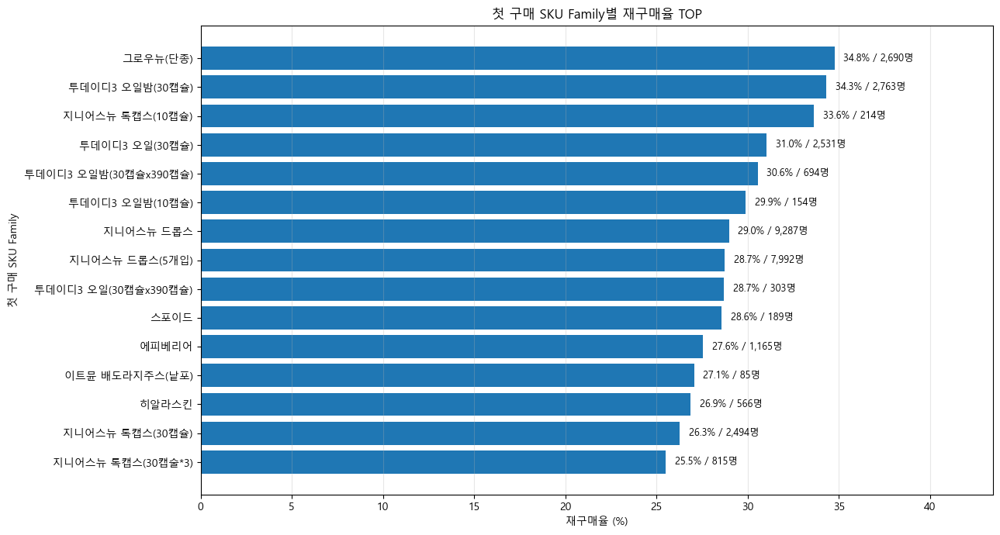

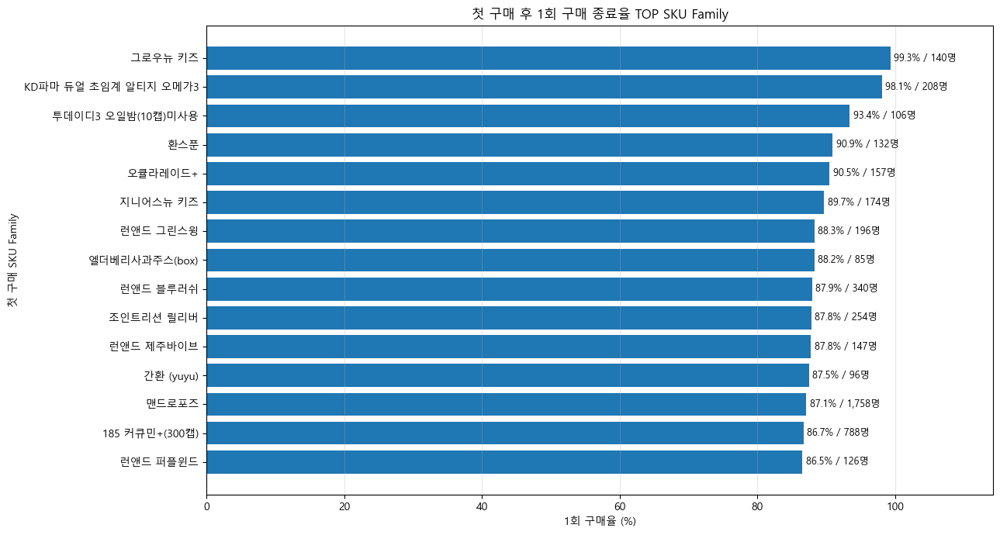

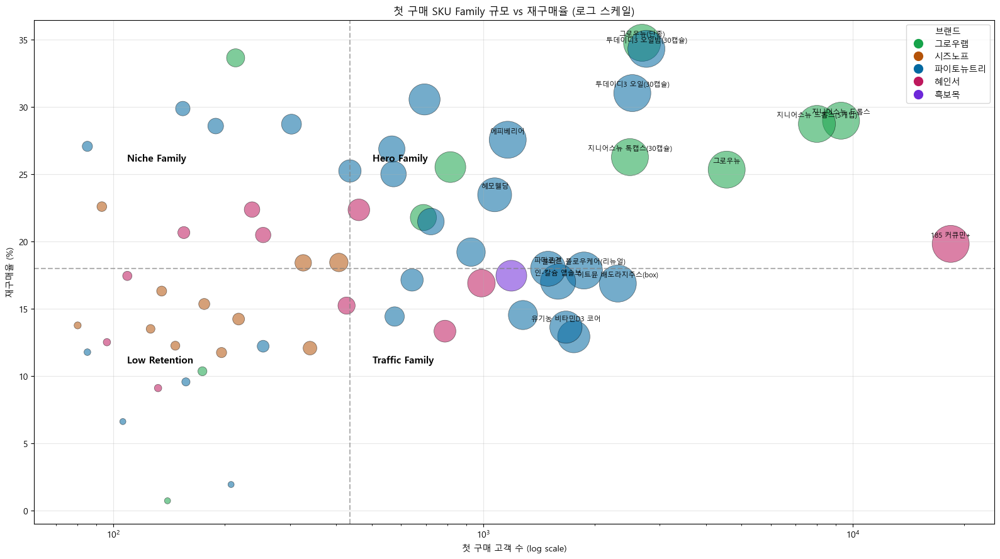

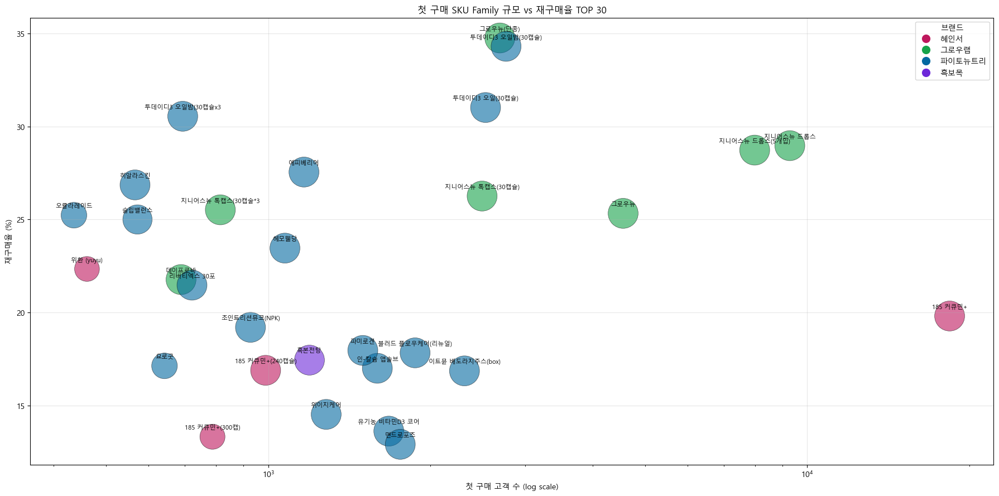

In [864]:
# ---------------------------------------------------------
# 0) 데이터 준비
# ---------------------------------------------------------
df_eda['analysis_date'] = pd.to_datetime(df_eda['analysis_date'])

base = df_eda[df_eda['receiver_key'].notna()].copy()
base = base[base['결제액'].fillna(0) > 0].copy()

gift_pattern = 'GIFT|gift|사은|증정|무료|샘플'

base = base[
    ~base['품명'].astype(str).str.contains(gift_pattern, case=False, na=False)
].copy()

base = base[
    ~base['품번'].astype(str).str.contains('GIFT|gift', case=False, na=False)
].copy()

# ---------------------------------------------------------
# SKU Family 컬럼 자동 선택
# ---------------------------------------------------------
family_candidates = [
    'sku_family',
    'SKU Family',
    'SKU_Family',
    'first_sku_family',
    '제품군',
    '상품군',
    '품목군',
    'family',
    'sku_group'
]

family_col = None

for col in family_candidates:
    if col in base.columns:
        family_col = col
        break

if family_col is None:
    raise KeyError(
        "SKU Family 컬럼을 찾지 못했습니다. "
        "df_eda.columns에서 제품군/SKU Family에 해당하는 컬럼명을 확인해주세요."
    )

base['family_name'] = (
    base[family_col]
    .fillna(base['품명'])
    .fillna(base['품번'])
    .astype(str)
)

print("사용한 SKU Family 컬럼:", family_col)
print("분석 대상 row 수:", len(base))


# ---------------------------------------------------------
# 1) 고객별 첫 구매 SKU Family
# ---------------------------------------------------------
first_order_family = (
    base
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()
)

first_order_family = first_order_family[[
    'receiver_key',
    'analysis_date',
    'channel_group',
    'family_name',
    '브랜드_분류'
]].rename(columns={
    'analysis_date': 'first_date',
    'channel_group': 'first_channel',
    'family_name': 'first_family',
    '브랜드_분류': 'first_brand'
})

print("첫 구매 고객 수:", first_order_family['receiver_key'].nunique())
display(first_order_family.head())


# ---------------------------------------------------------
# 2) 고객별 전체 구매 품질 (재구매를 3가지로 분리)
# ---------------------------------------------------------
# 전체 구매 이력 (첫 구매 제외 필요)
all_orders = base.copy()

# 고객별 첫 구매 정보
first_purchase = (
    all_orders
    .sort_values('analysis_date')
    .groupby('receiver_key')
    .first()
    .reset_index()[['receiver_key', 'analysis_date']]
    .rename(columns={'analysis_date': 'first_date'})
)

all_orders = all_orders.merge(first_purchase, on='receiver_key', how='left')

# 첫 구매 이후 구매만
subsequent = all_orders[all_orders['analysis_date'] > all_orders['first_date']].copy()

# 고객별 재구매 채널 분류
reorder_channels = (
    subsequent
    .groupby('receiver_key')['channel_group']
    .agg(list)
    .reset_index()
)

reorder_channels['has_owned_reorder'] = reorder_channels['channel_group'].apply(
    lambda x: any(c in ['자사몰', '자사몰_N'] for c in x)
)
reorder_channels['has_gonggu_reorder'] = reorder_channels['channel_group'].apply(
    lambda x: any(c == '공구' for c in x)
)
reorder_channels['has_any_reorder'] = True

customer_quality = (
    all_orders
    .groupby('receiver_key')
    .agg(
        total_orders=('주문번호', 'nunique'),
        total_sales=('결제액', 'sum'),
        avg_order_value=('결제액', 'mean'),
        first_date=('analysis_date', 'min'),
        last_date=('analysis_date', 'max')
    )
    .reset_index()
)

customer_quality['active_days'] = (
    customer_quality['last_date'] - customer_quality['first_date']
).dt.days

# 재구매 채널 정보 결합
customer_quality = customer_quality.merge(
    reorder_channels[['receiver_key', 'has_owned_reorder', 'has_gonggu_reorder', 'has_any_reorder']],
    on='receiver_key',
    how='left'
)
customer_quality['has_owned_reorder'] = customer_quality['has_owned_reorder'].fillna(False)
customer_quality['has_gonggu_reorder'] = customer_quality['has_gonggu_reorder'].fillna(False)
customer_quality['repeat_customer'] = customer_quality['total_orders'] >= 2  # 기존 유지 (전체 기준)


# ---------------------------------------------------------
# 3) 첫 구매 Family + 고객 품질 결합
# ---------------------------------------------------------
family_quality_base = (
    first_order_family
    .merge(
        customer_quality,
        on='receiver_key',
        how='left',
        suffixes=('', '_customer')
    )
)

display(family_quality_base.head())


# ---------------------------------------------------------
# 4) SKU Family별 품질 요약
# ---------------------------------------------------------
family_quality_summary = (
    family_quality_base
    .groupby(['first_brand', 'first_family'])
    .agg(
        첫구매고객수=('receiver_key', 'nunique'),
        재구매고객수=('repeat_customer', 'sum'),           # 전체 채널 재구매
        자사몰재구매고객수=('has_owned_reorder', 'sum'),   # 자사몰 재구매 ← 추가
        공구재구매고객수=('has_gonggu_reorder', 'sum'),    # 공구 재구매 ← 추가
        평균주문수=('total_orders', 'mean'),
        평균LTV=('total_sales', 'mean'),
        중앙LTV=('total_sales', 'median'),
        평균객단가=('avg_order_value', 'mean'),
        평균활동일수=('active_days', 'mean')
    )
    .reset_index()
)

family_quality_summary['재구매율(%)'] = (
    family_quality_summary['재구매고객수'] / family_quality_summary['첫구매고객수'] * 100
).round(2)

family_quality_summary['자사몰전환재구매율(%)'] = (     # ← 추가
    family_quality_summary['자사몰재구매고객수'] / family_quality_summary['첫구매고객수'] * 100
).round(2)

family_quality_summary['1회구매고객수'] = (
    family_quality_summary['첫구매고객수']
    - family_quality_summary['재구매고객수']
)

family_quality_summary['1회구매율(%)'] = (
    family_quality_summary['1회구매고객수']
    / family_quality_summary['첫구매고객수']
    * 100
).round(2)

family_quality_summary = family_quality_summary.round({
    '평균주문수': 2,
    '중앙주문수': 2,
    '평균LTV': 0,
    '중앙LTV': 0,
    '평균객단가': 0,
    '평균활동일수': 1
})


# ---------------------------------------------------------
# 5) 최소 고객 수 필터
# ---------------------------------------------------------
MIN_CUSTOMERS = 50

family_quality_filtered = family_quality_summary[
    family_quality_summary['첫구매고객수'] >= MIN_CUSTOMERS
].copy()

print("분석 SKU Family 수:", len(family_quality_filtered))


# ---------------------------------------------------------
# 6) 결과 테이블
# ---------------------------------------------------------
top_repurchase_family = (
    family_quality_filtered
    .sort_values(['재구매율(%)', '첫구매고객수'], ascending=[False, False])
)

top_exit_family = (
    family_quality_filtered
    .sort_values(['1회구매율(%)', '첫구매고객수'], ascending=[False, False])
)

top_ltv_family = (
    family_quality_filtered
    .sort_values(['평균LTV', '첫구매고객수'], ascending=[False, False])
)

print("=== 재구매율 TOP SKU Family ===")
display(top_repurchase_family.head(20))

print("=== 1회 구매 종료율 TOP SKU Family ===")
display(top_exit_family.head(20))

print("=== 평균 LTV TOP SKU Family ===")
display(top_ltv_family.head(20))


# =========================================================
# 7) 시각화
# =========================================================

# 재구매율 TOP
plot_df = top_repurchase_family.head(15).sort_values('재구매율(%)')

plt.figure(figsize=(13, 7))

plt.barh(
    plot_df['first_family'],
    plot_df['재구매율(%)']
)

for i, v in enumerate(plot_df['재구매율(%)']):
    plt.text(
        v + 0.5,
        i,
        f'{v:.1f}% / {plot_df.iloc[i]["첫구매고객수"]:,}명',
        va='center',
        fontsize=9
    )

plt.title('첫 구매 SKU Family별 재구매율 TOP')
plt.xlabel('재구매율 (%)')
plt.ylabel('첫 구매 SKU Family')
plt.grid(axis='x', alpha=0.3)
plt.xlim(0, plot_df['재구매율(%)'].max() * 1.25)
plt.tight_layout()
plt.show()


# 1회 구매 종료율 TOP
plot_df = top_exit_family.head(15).sort_values('1회구매율(%)')

plt.figure(figsize=(13, 7))

plt.barh(
    plot_df['first_family'],
    plot_df['1회구매율(%)']
)

for i, v in enumerate(plot_df['1회구매율(%)']):
    plt.text(
        v + 0.5,
        i,
        f'{v:.1f}% / {plot_df.iloc[i]["첫구매고객수"]:,}명',
        va='center',
        fontsize=9
    )

plt.title('첫 구매 후 1회 구매 종료율 TOP SKU Family')
plt.xlabel('1회 구매율 (%)')
plt.ylabel('첫 구매 SKU Family')
plt.grid(axis='x', alpha=0.3)
plt.xlim(0, plot_df['1회구매율(%)'].max() * 1.15)
plt.tight_layout()
plt.show()


# =========================================================
# 규모 vs 재구매율 Bubble Chart
# log scale + TOP 라벨만 + 버블 크기 제한
# =========================================================

plot_df = family_quality_filtered.copy()

x_mid = plot_df['첫구매고객수'].median()
y_mid = plot_df['재구매율(%)'].median()

plot_df['bubble_size'] = plot_df['재구매고객수'] * 6
plot_df['bubble_size'] = plot_df['bubble_size'].clip(50, 1800)

label_families = (
    plot_df
    .sort_values('재구매고객수', ascending=False)
    .head(15)['first_family']
)

plot_df['label_flag'] = plot_df['first_family'].isin(label_families)

plt.figure(figsize=(16, 9))

for brand in plot_df['first_brand'].unique():
    sub = plot_df[plot_df['first_brand'] == brand]

    plt.scatter(
        sub['첫구매고객수'],
        sub['재구매율(%)'],
        s=sub['bubble_size'],
        alpha=0.55,
        color=BRAND_COLOR.get(brand, '#999999'),
        edgecolors='black',
        linewidth=0.5,
        label=brand
    )

    for _, row in sub.iterrows():
        if row['label_flag']:
            plt.text(
                row['첫구매고객수'],
                row['재구매율(%)'] + 0.5,
                str(row['first_family'])[:16],
                fontsize=8,
                ha='center'
            )

plt.xscale('log')

plt.axvline(x_mid, color='gray', linestyle='--', alpha=0.6)
plt.axhline(y_mid, color='gray', linestyle='--', alpha=0.6)

plt.text(x_mid * 1.15, y_mid + 8, 'Hero Family', fontsize=11, fontweight='bold')
plt.text(x_mid / 4, y_mid + 8, 'Niche Family', fontsize=11, fontweight='bold')
plt.text(x_mid * 1.15, y_mid - 7, 'Traffic Family', fontsize=11, fontweight='bold')
plt.text(x_mid / 4, y_mid - 7, 'Low Retention', fontsize=11, fontweight='bold')

plt.title('첫 구매 SKU Family 규모 vs 재구매율 (로그 스케일)')
plt.xlabel('첫 구매 고객 수 (log scale)')
plt.ylabel('재구매율 (%)')

legend_elements = []

for brand in plot_df['first_brand'].unique():
    legend_elements.append(
        Line2D(
            [0], [0],
            marker='o',
            color='w',
            label=brand,
            markerfacecolor=BRAND_COLOR.get(brand, '#999999'),
            markersize=12
        )
    )

plt.legend(
    handles=legend_elements,
    title='브랜드',
    loc='upper right',
    frameon=True
)

plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()


# =========================================================
# 재구매고객수 TOP 30 Family만 Bubble Chart
# =========================================================

plot_df = (
    family_quality_filtered
    .sort_values('재구매고객수', ascending=False)
    .head(30)
    .copy()
)

plot_df['bubble_size'] = plot_df['재구매고객수'] * 10
plot_df['bubble_size'] = plot_df['bubble_size'].clip(100, 1500)

plt.figure(figsize=(18, 9))

for brand in plot_df['first_brand'].unique():
    sub = plot_df[plot_df['first_brand'] == brand]

    plt.scatter(
        sub['첫구매고객수'],
        sub['재구매율(%)'],
        s=sub['bubble_size'],
        alpha=0.6,
        color=BRAND_COLOR.get(brand, '#999999'),
        edgecolors='black',
        linewidth=0.5,
        label=brand
    )

    for _, row in sub.iterrows():
        plt.text(
            row['첫구매고객수'],
            row['재구매율(%)'] + 0.4,
            str(row['first_family'])[:16],
            fontsize=8,
            ha='center'
        )

plt.xscale('log')

plt.title('첫 구매 SKU Family 규모 vs 재구매율 TOP 30')
plt.xlabel('첫 구매 고객 수 (log scale)')
plt.ylabel('재구매율 (%)')

legend_elements = []

for brand in plot_df['first_brand'].unique():
    legend_elements.append(
        Line2D(
            [0], [0],
            marker='o',
            color='w',
            label=brand,
            markerfacecolor=BRAND_COLOR.get(brand, '#999999'),
            markersize=12
        )
    )

plt.legend(
    handles=legend_elements,
    title='브랜드',
    loc='upper right',
    frameon=True
)

plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

- 재구매를 만드는 건 브랜드가 아니라 Family  
    - 상위권은 파이토뉴트리(지니어스뉴 드롭스, 투데이D3 계열)와 그로우랩(그로우뉴 계열)이 나눠서 차지  
    - 특히, 지니어스뉴 드롭스, 투데이D3, 그로우뉴는 고객 규모와 재구매율 둘 다 큼  
    - 즉, 고객을 많이 데려오고, 데려온 고객도 오래 남음  

- Hero Family : 버블차트 우상단  
    - [파이토뉴트리] 지니어스뉴 드롭스 / 지니어스뉴 드롭스(5개입) / 투데이D3 오일밤 / 투데이D3 오일  
    - [그로우랩] 그로우뉴  
    - 고객수, 재구매율, 실제 재구매 고객수 모두 큼  
    - 광고 예산 넣어도 망하지 않을 제품군에 가까움  

- Family가 Funnel 역할을 함  
    - 그로우랩은 브랜드 레벨에서도 재구매율 1위(28.41%)였고  
    - 그로우뉴가 Hero Family에 포함됨  
    → 브랜드와 Family 양쪽에서 일관되게 강한 구조  
    - 파이토뉴트리는 볼륨(고객 수)으로, 그로우랩은 retention으로 Hero를 만드는 방식이 다름  

- 가장 위험한 Family  
    - 1회 구매 종료율 TOP : 그로우뉴 키즈, KD파마 듀얼 초임계 알티지 오메가3, 투데이D3 오일밤(10캡슐)  
    → 체험용, 소포장, 일회성 성격이 강함  
    → 고객을 유입시키긴하지만 다음 구매까지 연결되지 않음  

- LTV 관점  
    - 커큐민이 재구매율은 16~17%인데, 평균 LTV는 압도적  
    - 객단가 자체가 커서 나오는 것으로 재구매형 상품은 아니지만, 고LTV 상품이라는 의미  

- 버블차트  
    - 오른쪽 위 : 고객 많음 + 재구매 높음 (= Core Family)  
    - 오른쪽 아래 : 고객 많음 + 재구매 낮음 (= 볼륨 상품 / 많이 팔리지만 락인은 약함)  
    - 왼쪽 위 : 고객 적음 + 재구매 높음 (= 니치 상품)  
    - 왼쪽 아래 : 고객 적음 + 재구매 낮음 (= 실험 상품 / 유지 가치 낮음)  

> SKU 기준으로 보면 제품이 보였지만, SKU Family 기준으로 보니 고객 유지 전략이 보인다.  
> 
> 지니어스뉴 드롭스·투데이D3·그로우뉴는 신규 고객 유입부터 재구매까지 연결되는 핵심 Hero Family이며, 반대로 커큐민 계열은 재구매율은 낮지만 높은 객단가로 LTV를 만드는 수익형 Family에 가깝다.  
> 
> 따라서 Family는 크게 Hero Family(유입+재구매), Revenue Family(고LTV), Trial Family(1회 구매 종료형) 으로 구분해 관리하는 것이 적절해 보인다.

---

### 14-1. SKU Family별 AOV 기여도 분석  

(축 3: 객단가 기여도)  

"어떤 SKU가 주문 금액을 높이는가"  


분석 대상 SKU Family 수: 73개

=== SKU Family별 AOV 요약 (평균AOV 내림차순) ===


,family_name,고객수,평균AOV,중앙AOV,세트비율,총매출_억
2,185 커큐민+(300캡),832,238725,239200,0.00,1.99
1,185 커큐민+(240캡슐),2578,191844,179400,6.60,5.48
84,파미로겐(2개월분),71,190204,217150,59.70,0.14
66,조인트리션뮤코(NPK)(2개월분),89,187836,151600,49.50,0.19
94,흑본전탕,1177,164825,140000,46.00,2.88
38,모환,282,164416,78000,48.60,0.69
39,블러드 플로우케어(리뉴얼),1987,150182,78800,34.10,5.03
65,조인트리션뮤코(NPK),1093,138121,79800,38.50,2.31
53,오큘라레이드,457,128147,82500,37.70,0.96
74,출환 (yuyu),476,127720,65000,43.20,0.91



=== 자사몰 vs 공구 AOV 비교 (공통 SKU, 고객 30명↑) ===
  AOV_차이율 > 0 : 자사몰에서 더 비싸게 구매


,family_name,자사몰_고객,자사몰_AOV,공구_고객,공구_AOV,AOV_차이율
36,투데이디3 오일밤(30캡슐x390캡슐),1235,"72,980.50",696,35807,103.80
18,스포이드,354,"2,265.00",153,1143,98.20
27,지니어스뉴 톡캡스(10캡슐),358,"60,581.00",38,31843,90.20
38,흑본전탕,1144,"170,688.00",38,91808,85.90
25,지니어스뉴 드롭스(5개입),9212,"110,640.00",4097,62353,77.40
32,투데이디3 오일(30캡슐x390캡슐),464,"82,152.00",154,46901,75.20
9,런앤드 블랙 스피릿,453,"26,665.00",42,15481,72.20
16,런앤드 핑크 웨이브,497,"25,979.00",52,17498,48.50
10,런앤드 블루러쉬,645,"25,219.00",44,17036,48.00
7,런앤드 그린스윙,468,"24,146.00",57,16368,47.50



=== SKU Family 유형 분류 결과 ===


,family_name,평균AOV,재구매율,SKU유형,고객수
43,유기농 비타민D3 코어,57952,13.30,수익형\n(고AOV+저재구매),1888
26,맨드로포즈,117378,12.90,수익형\n(고AOV+저재구매),1813
46,인-칼슘 앱솔브,64579,16.50,수익형\n(고AOV+저재구매),1738
41,위이지케어,68248,14.30,수익형\n(고AOV+저재구매),1322
71,흑본전탕,164825,15.10,수익형\n(고AOV+저재구매),1177
2,185 커큐민+(300캡),238725,13.10,수익형\n(고AOV+저재구매),832
39,요레스,79224,14.40,수익형\n(고AOV+저재구매),608
57,출환 (yuyu),127720,15.00,수익형\n(고AOV+저재구매),476
48,조인트리션 릴리버,61375,12.20,수익형\n(고AOV+저재구매),422
53,지니어스뉴 키즈,69038,10.30,수익형\n(고AOV+저재구매),345


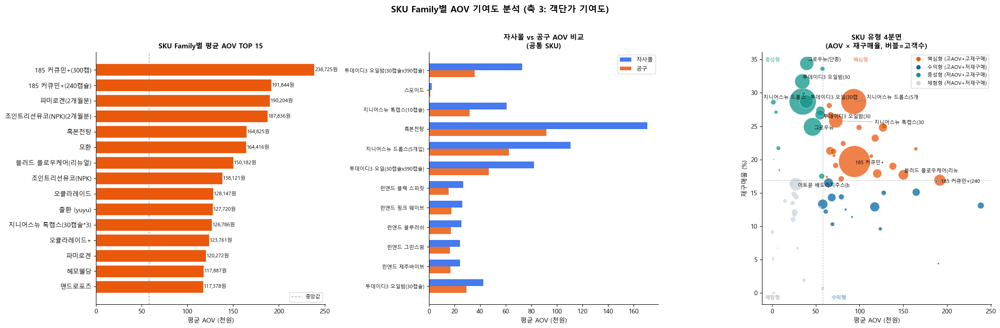


【14-1 요약】SKU Family AOV 기여도

▶ 평균 AOV 1위: 185 커큐민+(300캡) (238,725원)
▶ 전체 중앙 AOV: 57,952원 / 중앙 재구매율: 16.9%

▶ SKU 유형 분포:
   - 핵심형 (고AOV+고재구매): 22개 Family
   - 체험형 (저AOV+저재구매): 21개 Family
   - 수익형 (고AOV+저재구매): 15개 Family
   - 충성형 (저AOV+고재구매): 15개 Family

▶ 핵심형 SKU (고AOV + 고재구매):
   - 185 커큐민+ (AOV 94,218원 / 재구매율 19.7%)
   - 지니어스뉴 드롭스(5개입) (AOV 93,456원 / 재구매율 28.7%)
   - 지니어스뉴 톡캡스(30캡슐) (AOV 72,806원 / 재구매율 25.8%)

▶ 자사몰-공구 AOV 격차 최대: 투데이디3 오일밤(30캡슐x390캡슐) (+103.8%, 자사몰 72,980원 vs 공구 35,807원)


In [865]:
# ---------------------------------------------------------
# 0) 데이터 준비
# ---------------------------------------------------------
base_14 = df_eda[
    df_eda['receiver_key'].notna() &
    (df_eda['결제액'].fillna(0) > 0)
].copy()
 
base_14['analysis_date'] = pd.to_datetime(base_14['analysis_date'], errors='coerce')
base_14 = base_14[base_14['analysis_date'].notna()].copy()
 
gift_pattern = 'GIFT|gift|사은|증정|무료|샘플'
base_14 = base_14[
    ~base_14['품명'].astype(str).str.contains(gift_pattern, case=False, na=False)
].copy()
 
if 'sku_family' in base_14.columns:
    base_14['family_name'] = base_14['sku_family'].fillna(base_14['품명']).astype(str)
else:
    base_14['family_name'] = base_14['품명'].apply(base_fam)
 
 
# ---------------------------------------------------------
# 1) SKU Family별 AOV 지표 집계
# ---------------------------------------------------------
aov_summary = (
    base_14
    .groupby('family_name')
    .agg(
        주문건수=('주문번호', 'nunique'),
        고객수=('receiver_key', 'nunique'),
        평균AOV=('결제액', 'mean'),
        중앙AOV=('결제액', 'median'),
        총매출=('결제액', 'sum'),
    )
    .reset_index()
)
 
if '세트여부' in base_14.columns:
    set_aov = (
        base_14
        .groupby('family_name')
        .agg(세트비율=('세트여부', 'mean'))
        .reset_index()
    )
    set_aov['세트비율'] = (set_aov['세트비율'] * 100).round(1)
    aov_summary = aov_summary.merge(set_aov, on='family_name', how='left')
else:
    aov_summary['세트비율'] = np.nan
 
aov_summary['평균AOV']   = aov_summary['평균AOV'].round(0).astype(int)
aov_summary['중앙AOV']   = aov_summary['중앙AOV'].round(0).astype(int)
aov_summary['총매출_억'] = (aov_summary['총매출'] / 1e8).round(2)
 
aov_filtered = aov_summary[aov_summary['고객수'] >= 30].copy()
 
print(f"\n분석 대상 SKU Family 수: {len(aov_filtered)}개")
print("\n=== SKU Family별 AOV 요약 (평균AOV 내림차순) ===")
display(
    aov_filtered
    .sort_values('평균AOV', ascending=False)
    [['family_name', '고객수', '평균AOV', '중앙AOV', '세트비율', '총매출_억']]
    .head(20)
)
 
 
# ---------------------------------------------------------
# 2) 채널별 SKU AOV 비교 (자사몰 vs 공구)
# ---------------------------------------------------------
ch_aov = (
    base_14
    .groupby(['family_name', 'channel_group'])
    .agg(
        고객수=('receiver_key', 'nunique'),
        평균AOV=('결제액', 'mean')
    )
    .reset_index()
)
ch_aov['평균AOV'] = ch_aov['평균AOV'].round(0).astype(int)
 
own_aov = ch_aov[ch_aov['channel_group'].isin(['자사몰', '자사몰_N'])].copy()
own_aov['channel_group'] = '자사몰'
own_aov = own_aov.groupby('family_name').agg(
    자사몰_고객=('고객수', 'sum'),
    자사몰_AOV=('평균AOV', 'mean')
).reset_index()
 
goo_aov = (
    ch_aov[ch_aov['channel_group'] == '공구']
    .rename(columns={'고객수': '공구_고객', '평균AOV': '공구_AOV'})
)
 
aov_compare = own_aov.merge(
    goo_aov[['family_name', '공구_고객', '공구_AOV']],
    on='family_name', how='inner'
)
aov_compare['AOV_차이율'] = (
    (aov_compare['자사몰_AOV'] - aov_compare['공구_AOV'])
    / aov_compare['공구_AOV'] * 100
).round(1)
aov_compare = aov_compare[
    (aov_compare['자사몰_고객'] >= 30) & (aov_compare['공구_고객'] >= 30)
].sort_values('AOV_차이율', ascending=False)
 
print("\n=== 자사몰 vs 공구 AOV 비교 (공통 SKU, 고객 30명↑) ===")
print("  AOV_차이율 > 0 : 자사몰에서 더 비싸게 구매")
display(aov_compare.head(15))
 
 
# ---------------------------------------------------------
# 3) SKU 유형 분류 (AOV × 재구매 매트릭스)
# ---------------------------------------------------------
repurchase_14 = (
    base_14
    .groupby('receiver_key')
    .agg(구매일수=('analysis_date', lambda x: x.dt.normalize().nunique()))
    .reset_index()
)
repurchase_14['재구매여부'] = (repurchase_14['구매일수'] >= 2).astype(int)
 
first_14 = (
    base_14
    .sort_values('analysis_date')
    .groupby('receiver_key')['family_name']
    .first()
    .reset_index(name='first_fam')
)
 
rpq_merge = first_14.merge(repurchase_14, on='receiver_key')
rpq_fam = (
    rpq_merge
    .groupby('first_fam')
    .agg(
        고객수=('receiver_key', 'nunique'),
        재구매율=('재구매여부', 'mean')
    )
    .reset_index()
)
rpq_fam['재구매율'] = (rpq_fam['재구매율'] * 100).round(1)
 
# merge 후 고객수 컬럼 충돌 해결
matrix_df = aov_filtered.merge(
    rpq_fam.rename(columns={'first_fam': 'family_name'}),
    on='family_name', how='left'
).dropna(subset=['재구매율'])
 
if '고객수_x' in matrix_df.columns:
    matrix_df = matrix_df.rename(columns={'고객수_x': '고객수'})
    matrix_df = matrix_df.drop(columns=['고객수_y'], errors='ignore')
 
aov_med = matrix_df['평균AOV'].median()
rpq_med = matrix_df['재구매율'].median()
 
def classify_sku_type(row):
    hi_aov = row['평균AOV'] >= aov_med
    hi_rpq = row['재구매율'] >= rpq_med
    if hi_aov and hi_rpq:
        return '핵심형\n(고AOV+고재구매)'
    elif hi_aov and not hi_rpq:
        return '수익형\n(고AOV+저재구매)'
    elif not hi_aov and hi_rpq:
        return '충성형\n(저AOV+고재구매)'
    else:
        return '체험형\n(저AOV+저재구매)'
 
matrix_df['SKU유형'] = matrix_df.apply(classify_sku_type, axis=1)
 
TYPE_COLOR = {
    '핵심형\n(고AOV+고재구매)': '#EA580C',
    '수익형\n(고AOV+저재구매)': '#0369A1',
    '충성형\n(저AOV+고재구매)': '#0D9488',
    '체험형\n(저AOV+저재구매)': '#CBD5E1',
}
 
print("\n=== SKU Family 유형 분류 결과 ===")
display(
    matrix_df[['family_name', '평균AOV', '재구매율', 'SKU유형', '고객수']]
    .sort_values(['SKU유형', '고객수'], ascending=[True, False])
)
 
 
# ---------------------------------------------------------
# 4) 시각화 (3개 패널)
# ---------------------------------------------------------
# aov_filtered 재생성 (시각화 전 컬럼 보장)
aov_filtered = aov_summary[aov_summary['고객수'] >= 30].copy()
 
fig2, axes2 = plt.subplots(1, 3, figsize=(22, 7))
 
 
# ── 패널 1: AOV TOP 15 바차트 ──
top_aov = aov_filtered.nlargest(15, '평균AOV').sort_values('평균AOV')
bar_colors = [
    '#EA580C' if v >= aov_filtered['평균AOV'].median() else '#CBD5E1'
    for v in top_aov['평균AOV']
]
 
axes2[0].barh(top_aov['family_name'], top_aov['평균AOV'] / 1000,
              color=bar_colors, edgecolor='white')
axes2[0].axvline(aov_filtered['평균AOV'].median() / 1000,
                 color='gray', linestyle='--', linewidth=1, alpha=0.7, label='중앙값')
for i, (_, row) in enumerate(top_aov.iterrows()):
    axes2[0].text(row['평균AOV'] / 1000 + 0.5, i,
                  f"{row['평균AOV']:,.0f}원", va='center', fontsize=8)
axes2[0].set_xlabel('평균 AOV (천원)')
axes2[0].set_title('SKU Family별 평균 AOV TOP 15', fontsize=11, fontweight='bold')
axes2[0].legend(fontsize=8)
axes2[0].spines[['top', 'right']].set_visible(False)
 
 
# ── 패널 2: 자사몰 vs 공구 AOV 비교 ──
if len(aov_compare) >= 3:
    top_compare = aov_compare.head(12).sort_values('AOV_차이율')
    x_ = range(len(top_compare))
    w  = 0.35
    axes2[1].barh(
        [i + w/2 for i in x_], top_compare['자사몰_AOV'] / 1000,
        height=w, label='자사몰', color=CH_COLOR['자사몰'], alpha=0.85
    )
    axes2[1].barh(
        [i - w/2 for i in x_], top_compare['공구_AOV'] / 1000,
        height=w, label='공구', color=CH_COLOR['공구'], alpha=0.85
    )
    axes2[1].set_yticks(list(x_))
    axes2[1].set_yticklabels(top_compare['family_name'], fontsize=8)
    axes2[1].set_xlabel('평균 AOV (천원)')
    axes2[1].set_title('자사몰 vs 공구 AOV 비교\n(공통 SKU)', fontsize=11, fontweight='bold')
    axes2[1].legend(fontsize=9)
    axes2[1].spines[['top', 'right']].set_visible(False)
else:
    axes2[1].text(0.5, 0.5, '공통 SKU 데이터 부족',
                  ha='center', va='center', transform=axes2[1].transAxes, fontsize=11)
    axes2[1].axis('off')
 
 
# ── 패널 3: AOV × 재구매율 4분면 산점도 ──
for sku_type, color in TYPE_COLOR.items():
    sub = matrix_df[matrix_df['SKU유형'] == sku_type]
    axes2[2].scatter(
        sub['평균AOV'] / 1000, sub['재구매율'],
        s=sub['고객수'] / 8,
        color=color, alpha=0.75, edgecolors='white', linewidths=0.5,
        label=sku_type.replace('\n', ' ')
    )
 
axes2[2].axvline(aov_med / 1000, color='gray', linestyle='--', linewidth=0.8, alpha=0.5)
axes2[2].axhline(rpq_med, color='gray', linestyle='--', linewidth=0.8, alpha=0.5)
 
from adjustText import adjust_text

texts = []

for _, row in matrix_df.nlargest(12, '고객수').iterrows():

    txt = axes2[2].text(
        row['평균AOV'] / 1000,
        row['재구매율'],
        row['family_name'][:12],
        fontsize=8
    )

    texts.append(txt)

adjust_text(
    texts,
    ax=axes2[2],
    arrowprops=dict(
        arrowstyle='-',
        color='gray',
        lw=0.5
    )
)
 
axes2[2].set_xlabel('평균 AOV (천원)')
axes2[2].set_ylabel('재구매율 (%)')
axes2[2].set_title('SKU 유형 4분면\n(AOV × 재구매율, 버블=고객수)',
                   fontsize=11, fontweight='bold')
legend_handles = [
    Line2D(
        [0], [0],
        marker='o',
        color='w',
        markerfacecolor=color,
        markersize=8,     # 범례 버블 크기 통일
        label=sku_type.replace('\n', ' ')
    )
    for sku_type, color in TYPE_COLOR.items()
]

axes2[2].legend(
    handles=legend_handles,
    loc='upper right',   # 오른쪽 위
    fontsize=8,
    frameon=True
)
axes2[2].spines[['top', 'right']].set_visible(False)
 
xmin, xmax = axes2[2].get_xlim()
ymin, ymax = axes2[2].get_ylim()
axes2[2].text(aov_med/1000 + (xmax - aov_med/1000)*0.18, ymax*0.96,
              '핵심형', fontsize=8, color='#EA580C', alpha=0.6, fontweight='bold')
axes2[2].text(xmin + (aov_med/1000 - xmin)*0.05, ymax*0.96,
              '충성형', fontsize=8, color='#0D9488', alpha=0.6, fontweight='bold')
axes2[2].text(aov_med/1000 + (xmax - aov_med/1000)*0.05, ymin + (ymax-ymin)*0.02,
              '수익형', fontsize=8, color='#0369A1', alpha=0.6, fontweight='bold')
axes2[2].text(xmin + (aov_med/1000 - xmin)*0.05, ymin + (ymax-ymin)*0.02,
              '체험형', fontsize=8, color='#888', alpha=0.6, fontweight='bold')
 
plt.suptitle('SKU Family별 AOV 기여도 분석 (축 3: 객단가 기여도)',
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()
 
 
# ---------------------------------------------------------
# 5) 요약 해석 출력
# ---------------------------------------------------------
type_counts = matrix_df['SKU유형'].value_counts()
top_aov_sku = aov_filtered.nlargest(1, '평균AOV').iloc[0]
top_core    = matrix_df[matrix_df['SKU유형'].str.startswith('핵심형')].nlargest(3, '고객수')
 
print("\n" + "="*60)
print("【14-1 요약】SKU Family AOV 기여도")
print("="*60)
print(f"\n▶ 평균 AOV 1위: {top_aov_sku['family_name']} ({top_aov_sku['평균AOV']:,.0f}원)")
print(f"▶ 전체 중앙 AOV: {aov_med:,.0f}원 / 중앙 재구매율: {rpq_med:.1f}%")
print(f"\n▶ SKU 유형 분포:")
for t, cnt in type_counts.items():
    print(f"   - {t.replace(chr(10), ' ')}: {cnt}개 Family")
if len(top_core) > 0:
    print(f"\n▶ 핵심형 SKU (고AOV + 고재구매):")
    for _, row in top_core.iterrows():
        print(f"   - {row['family_name']}"
              f" (AOV {row['평균AOV']:,.0f}원 / 재구매율 {row['재구매율']}%)")
if len(aov_compare) > 0:
    top_gap = aov_compare.iloc[0]
    print(f"\n▶ 자사몰-공구 AOV 격차 최대: {top_gap['family_name']}"
          f" (+{top_gap['AOV_차이율']}%,"
          f" 자사몰 {top_gap['자사몰_AOV']:,.0f}원 vs 공구 {top_gap['공구_AOV']:,.0f}원)")

- 평균 AOV TOP  
    - 185 커큐민+(100캡슐)이 228,725원으로 압도적 1위  
    - 185 커큐민+(240캡슐) 179,944원, 콘진티라신선(NMN20지분철분함) 161,600원 순  
    - 커큐민 계열이 객단가 면에서 독보적이고,  
    이는 14번 분석에서 "재구매율은 낮지만 고LTV"라고 이미 확인된 것과 일치  
<br>  

- 자사몰 vs 공구 AOV 비교  
    - 투데이D3 오일밤(5개입×390캡슐)이 자사몰 73,980원 vs 공구 1,140원으로 격차율이 가장 크게 나옴  
    이건 공구 데이터 이상치(1,140원은 구성품 단가로 추정)일 가능성이 높아 해석에 주의가 필요  
    - 스포이드는 자사몰 60,181원 vs 공구 37,843원으로 +59% 격차  
    - 지니어스뉴 드롭스(5개입)는 자사몰 61,040원 vs 공구 37,843원으로 +61%로 자사몰에서 더 비싸게 구매하는 패턴  
    - 이는 공구에서 할인 구매 후 자사몰로 넘어온 고객도 정가에 가깝게 구매하고 있다는 의미로,  
    자사몰 retention 가치가 높다는 긍정적 신호  
<br>  

- SKU 유형 4분면  
    - 핵심형(고AOV+고재구매) 12.7개, 수익형(고AOV+저재구매) 15.9개, 충성형(저AOV+고재구매) 19.9개, 체험형(저AOV+저재구매)  
    - 산점도 우상단(핵심형)에 지니어스뉴 드롭스, 투데이D3, 총유풍부뉴트리션 계열 위치  
    - 커큐민 계열은 AOV는 높지만 재구매율이 낮아 수익형 영역에 있는 것이 확인됨  
<br>  

> AOV와 재구매율이 동시에 높은 핵심형 SKU(지니어스뉴·투데이D3 계열)에 마케팅 자원을 집중하는 것이 LTV 극대화에 유리할 것  
> 
> 커큐민은 재구매를 기대하기보다 고단가 단발 구매 고객용 수익형 상품으로 포지셔닝하고,  
> 별도 리텐션 전략보다는 첫 구매 경험 품질 관리에 집중하는 것이 적합할 것  
> 
> 충성형(저AOV+고재구매) SKU는 객단가를 올릴 여지가 있으므로,  
> 세트 구성이나 번들 프로모션으로 AOV를 높이는 전략을 검토할 수 있을 것  

---

## 15. 자사몰 매출 하락 분해 & 고객 여정 리텐션  

(경도님 분석)  

|원본 (경도님)|변환|
|---|---|
|load_with_cols() + CSV 로드|df_eda 직접 사용|
|add_event_time()|analysis_date → t 변환|
|classify_channel()|channel_group 컬럼 그대로 사용|
|base_fam() 품명 정규화|sku_family 컬럼 우선, 없으면 base_fam() fallback|
|판매형태 컬럼|없을 경우 False 처리|
|CH_COLOR 팔레트 없음|CH_COLOR, BRAND_COLOR 적용|

In [866]:
# 15-0. 공통 설정

import re
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from functools import reduce

OWN = ['자사몰', '자사몰_N']
OWN_LABEL = {'자사몰': '고도몰', '자사몰_N': '스마트스토어'}

def base_fam(x):
    """제품군 근사 정규화 — sku_family 없을 때 품명 기반 fallback용"""
    x = str(x)
    x = re.sub(r'\(SET\)|\(단종\)|세트|\[.*?\]|\(.*?\)', '', x)
    x = re.sub(r'\s+', '', x)
    x = re.sub(r'(\d+개입|\d+캡슐|\d+캡|\d+정|\d+포|\d+ml|\d+박스)', '', x)
    return x[:14]

# df_eda 기반 여정 테이블
journey = df_eda[
    df_eda['receiver_key'].notna() &
    (df_eda['결제액'] > 0)
].copy()

# analysis_date → t (시간 기준)
journey['t']   = pd.to_datetime(journey['analysis_date'], errors='coerce')
journey        = journey[journey['t'].notna()].copy()
journey['day'] = journey['t'].dt.normalize()
journey['ym']  = journey['t'].dt.to_period('M').astype(str)

# sku_family 없으면 품명으로 생성
if 'sku_family' not in journey.columns:
    journey['sku_family'] = journey['품명'].apply(base_fam)

print(f"여정 테이블: {len(journey):,}행 / {journey['receiver_key'].nunique():,}명")
print(f"기간: {journey['ym'].min()} ~ {journey['ym'].max()}")
print(journey['channel_group'].value_counts())


여정 테이블: 162,215행 / 80,940명
기간: 2025-01 ~ 2026-04
channel_group
자사몰_N    120515
공구        21409
자사몰       18001
외부몰        2255
B2B          35
Name: count, dtype: int64


### 15-1. 자사몰 매출 하락 분해


=== 자사몰 월별 매출 분해 (단위: 억원, 명) ===


,ym,자사매출,신규매출,기존매출,신규고객수
0,2025-01,7.37,7.37,0.00,6399
1,2025-02,6.98,6.98,0.00,6143
2,2025-03,6.60,6.01,0.59,5236
3,2025-04,6.31,5.32,1.00,4649
4,2025-05,7.08,5.72,1.36,5109
5,2025-06,6.69,4.92,1.77,4551
6,2025-07,7.18,5.12,2.06,4895
7,2025-08,7.31,5.06,2.24,4769
8,2025-09,7.34,4.72,2.62,4492
9,2025-10,6.18,3.68,2.50,3570



[전반기(~25.08) → 후반기(25.09~) 월평균]
  자사매출: 6.94 → 6.54 (-6%)
  신규매출: 5.81 → 3.77 (-35%)
  기존매출: 1.13 → 2.77 (+146%)
  신규고객수: 5218.88 → 3707.29 (-29%)


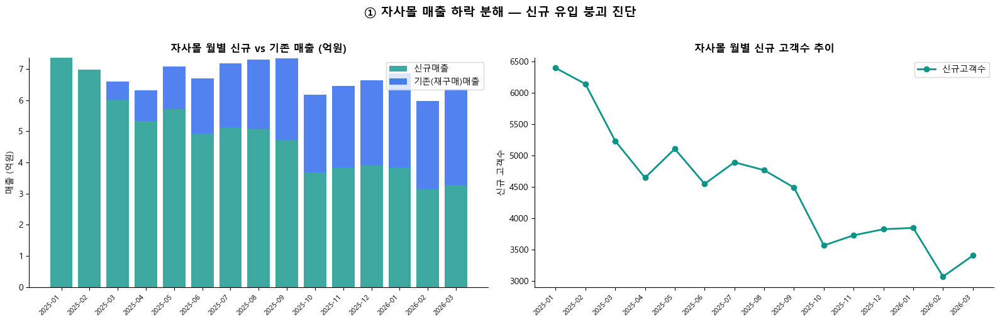


※ 해석: 총매출 완만 감소이나 신규 -35%, 기존 재구매 +146%
   → 획득(acquisition) 엔진 정지, 리텐션은 건강한 구조


In [867]:
# 신규 유입 vs 기존 재구매 분리

own = journey[journey['channel_group'].isin(OWN)].copy()

# 고객별 첫 구매 월
first_ym = (
    own.groupby('receiver_key')['t']
    .min()
    .dt.to_period('M')
    .astype(str)
)
own['first_ym'] = own['receiver_key'].map(first_ym)
own['is_new']   = own['ym'] == own['first_ym']

# 월별 집계
g = (
    own.groupby('ym')
    .agg(자사매출=('결제액', 'sum'),
         신규매출=('결제액', lambda s: s[own.loc[s.index, 'is_new']].sum()))
    .reset_index()
)
g['기존매출']  = g['자사매출'] - g['신규매출']
g['신규고객수'] = (
    own[own['is_new']]
    .groupby('ym')['receiver_key']
    .nunique()
    .reindex(g['ym'])
    .values
)

for c in ['자사매출', '신규매출', '기존매출']:
    g[c] = (g[c] / 1e8).round(2)

print("\n=== 자사몰 월별 매출 분해 (단위: 억원, 명) ===")
display(g)

# 전반기 vs 후반기 비교
gg = g[g['ym'] <= '2026-03']
h1 = gg[gg['ym'] <= '2025-08']
h2 = gg[gg['ym'] >= '2025-09']

print("\n[전반기(~25.08) → 후반기(25.09~) 월평균]")
for c in ['자사매출', '신규매출', '기존매출', '신규고객수']:
    a, b = h1[c].mean(), h2[c].mean()
    print(f"  {c}: {a:.2f} → {b:.2f} ({(b/a-1)*100:+.0f}%)")

# 시각화
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

g_plot = g[g['ym'] <= '2026-03'].copy()
x      = range(len(g_plot))

axes[0].bar(x, g_plot['신규매출'],  label='신규매출',  color=CH_COLOR['자사몰_N'], alpha=0.8)
axes[0].bar(x, g_plot['기존매출'], bottom=g_plot['신규매출'],
            label='기존(재구매)매출', color=CH_COLOR['자사몰'], alpha=0.8)
axes[0].set_xticks(list(x))
axes[0].set_xticklabels(g_plot['ym'], rotation=45, ha='right', fontsize=8)
axes[0].set_title('자사몰 월별 신규 vs 기존 매출 (억원)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('매출 (억원)')
axes[0].legend()
axes[0].spines[['top', 'right']].set_visible(False)

axes[1].plot(list(x), g_plot['신규고객수'], marker='o',
             color=CH_COLOR['자사몰_N'], linewidth=2, label='신규고객수')
axes[1].set_xticks(list(x))
axes[1].set_xticklabels(g_plot['ym'], rotation=45, ha='right', fontsize=8)
axes[1].set_title('자사몰 월별 신규 고객수 추이', fontsize=12, fontweight='bold')
axes[1].set_ylabel('신규 고객수')
axes[1].legend()
axes[1].spines[['top', 'right']].set_visible(False)

plt.suptitle('① 자사몰 매출 하락 분해 — 신규 유입 붕괴 진단',
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

print("\n※ 해석: 총매출 완만 감소이나 신규 -35%, 기존 재구매 +146%")
print("   → 획득(acquisition) 엔진 정지, 리텐션은 건강한 구조")

- 총매출은 6% 감소로 완만해 보이지만, 내부 구조가 완전히 다름  
    - 신규 매출이 -35%, 신규 고객수가 -29%로 급감하고 있고  
    기존 재구매 매출이 +146%로 떠받치고 있음  
    - 새 고객을 데려오는 엔진이 꺼졌는데,  
    기존 충성 고객들이 더 자주 사줘서 매출이 겨우 버티고 있는 구조  
    - 2025년 1~2월에 신규 고객이 6,000명 이상이었는데 이후 지속 감소해 2025년 10월엔 3,570명으로 반토막남  
    - 2024년 9월 공구 시작, 2025년 공구 확대와 시기가 맞물림  
    - 신규 유입이 공구로 흡수되면서 자사몰 신규가 줄었을 가능성 있음  

> 자사몰 매출 문제는 리텐션이 아니라 acquisition(획득)  
> 기존 고객 관리는 잘 되고 있고, 신규를 데려오는 채널 또는 장치가 무너진 것으로 보임  
> 공구에서 자사몰로의 전환이 제대로 설계되어 있다면 이 신규 감소를 공구 유입으로 보완할 수 있을 것으로 보임  

---

### 15-2. 고객 여정 유형 분류


=== 여정 유형 분포 ===
(A) 전체 — 동일일통합 (N=80,940): 1회성 77% / 반복 19% / 멀티 4%
(B) 성숙코호트 6개월+ (N=57,412): 1회성 74% / 반복 22% / 멀티 4%
(C) 초기코호트 12개월+ (N=25,812): 1회성 74% / 반복 22% / 멀티 4%
(D) raw 라인(동일일통합 X) (N=80,940): 1회성 54% / 반복 42% / 멀티 4%

[진입채널 × 여정유형 행비율 %]


journey_type,1회성,동일채널반복,멀티채널확장
스마트스토어,78.00,19.80,2.20
고도몰,76.20,14.30,9.40
공구,71.40,21.60,7.00
외부몰,92.80,4.80,2.30



[공구 진입자 멀티채널(=자사전환)률]
  전체: 7.0% (N=9,896)
  성숙6m+: 9.4% (N=6,425)
  초기12m+: 9.0% (N=2,644)


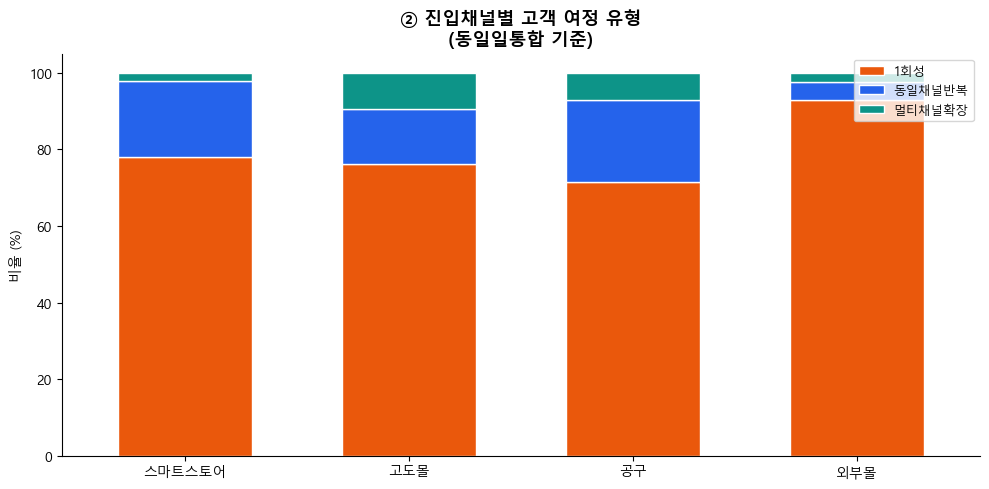


※ 공구→자사몰 브리지(멀티채널확장)는 7~9%로 얇음
   동일일통합 기준 1회성 77%, raw 기준 54% — 올바른 기준은 동일일통합


In [868]:
# 1회성 / 동일채널반복 / 멀티채널확장

# 고객별 집계
per = journey.groupby('receiver_key').agg(
    n_ch=('channel_group', 'nunique'),
    n_day=('day', 'nunique'),
    n_row=('channel_group', 'size'),
    first_t=('t', 'min'),
).copy()

first_ch = (
    journey.sort_values('t')
    .groupby('receiver_key')
    .first()['channel_group']
)
per['first_ch'] = first_ch

# 동일일 통합 기준 (올바른 기준)
per['journey_type'] = np.where(
    per['n_day'] == 1, '1회성',
    np.where(per['n_ch'] == 1, '동일채널반복', '멀티채널확장')
)
# raw 기준 (비교용)
per['journey_type_raw'] = np.where(
    per['n_row'] == 1, '1회성',
    np.where(per['n_ch'] == 1, '동일채널반복', '멀티채널확장')
)

def mix(sub, col, label):
    vc = sub[col].value_counts(normalize=True) * 100
    print(
        f"{label} (N={len(sub):,}): "
        f"1회성 {vc.get('1회성', 0):.0f}% / "
        f"반복 {vc.get('동일채널반복', 0):.0f}% / "
        f"멀티 {vc.get('멀티채널확장', 0):.0f}%"
    )

print("\n=== 여정 유형 분포 ===")
mix(per, 'journey_type', '(A) 전체 — 동일일통합')
mix(per[per['first_t'] <= '2025-10-31'], 'journey_type', '(B) 성숙코호트 6개월+')
mix(per[per['first_t'] <= '2025-04-30'], 'journey_type', '(C) 초기코호트 12개월+')
mix(per, 'journey_type_raw', '(D) raw 라인(동일일통합 X)')

# 진입채널 × 여정유형
ct = pd.crosstab(per['first_ch'], per['journey_type']).reindex(
    index=['자사몰_N', '자사몰', '공구', '외부몰'],
    columns=['1회성', '동일채널반복', '멀티채널확장'],
)
ct.index = ['스마트스토어', '고도몰', '공구', '외부몰']

print("\n[진입채널 × 여정유형 행비율 %]")
display((ct.div(ct.sum(1), 0) * 100).round(1))

print("\n[공구 진입자 멀티채널(=자사전환)률]")
for lab, cut in [('전체', None), ('성숙6m+', '2025-10-31'), ('초기12m+', '2025-04-30')]:
    sub    = per if cut is None else per[per['first_t'] <= cut]
    gpart  = sub[sub['first_ch'] == '공구']
    print(f"  {lab}: {(gpart['journey_type'] == '멀티채널확장').mean()*100:.1f}% (N={len(gpart):,})")

# 시각화
fig, ax = plt.subplots(figsize=(10, 5))

ct_pct = (ct.div(ct.sum(1), 0) * 100).round(1)
ct_pct.plot(
    kind='bar', stacked=True, ax=ax,
    color=[CH_COLOR['공구'], CH_COLOR['자사몰'], CH_COLOR['자사몰_N']],
    edgecolor='white', width=0.6,
)
ax.set_title('② 진입채널별 고객 여정 유형\n(동일일통합 기준)',
             fontsize=13, fontweight='bold')
ax.set_xlabel('')
ax.set_ylabel('비율 (%)')
ax.tick_params(axis='x', rotation=0)
ax.legend(loc='upper right', fontsize=9)
ax.spines[['top', 'right']].set_visible(False)
plt.tight_layout()
plt.show()

print("\n※ 공구→자사몰 브리지(멀티채널확장)는 7~9%로 얇음")
print("   동일일통합 기준 1회성 77%, raw 기준 54% — 올바른 기준은 동일일통합")


- 전체 고객의 77%가 자사몰에서 단 한 번만 구매함  
- raw 기준(54%)보다 동일일통합(77%)이 훨씬 높은 이유는,  
    같은 날 여러 건을 주문해도 실제 구매 의사결정은 1회이기 때문 (동일일통합이 올바른 기준)  
- 채널별로 보면 고도몰 첫 구매 고객의 멀티채널 확장이 9.4%로 가장 높음  
    고도몰 고객이 스마트스토어나 공구로도 이동하는 비율이 가장 높다는 의미  
- 스마트스토어 첫 구매 고객의 멀티채널 비율이 2.2%로 가장 낮아 스마트스토어 고착력이 가장 강함  
- 공구 진입자의 자사몰 전환(멀티채널)은 7.0%이고, 6개월 이상 관찰한 성숙 코호트에서는 9.4%까지 올라감  
    시간이 지날수록 전환율이 높아지는 구조  

> 전체 고객의 77%가 1회성이라는 사실이 핵심  
> 이 중 상당수는 구조적 비타깃(세트/선물)이겠지만, 나머지는 재구매 유도 실패  
> 공구 진입자의 자사몰 전환이 7~9%로 얇은 것도 이 1회성 구조와 연결됩니다.  
> 멀티채널 확장 고객이 고가치 고객일 가능성이 높으니, 이 4%를 늘리는 것이 핵심 과제일 수 있음  

---

### 15-3. 충성 × 금액 격자


=== 자사 고객 69,870명 / 총매출 105.4억 ===

[고객수]


금액,저,중,고
충성,,,
1회,24265,18210,12417
2-4회,500,3652,9168
5회+,0,37,1621



[매출비중 %]


금액,저,중,고
충성,,,
1회,10.80,16.80,28.30
2-4회,0.30,3.90,31.00
5회+,NaN,0.00,9.00


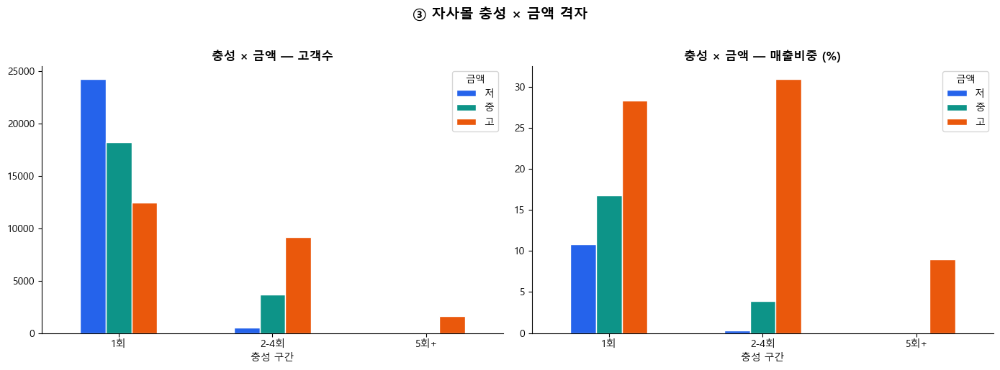


※ 충성과 금액이 강하게 연동 — AOV 업셀 칸(1회-고액)은 별도 분해 필요


In [869]:
# 15-3. 충성 × 금액 격자 (자사몰)

orders = own.groupby('receiver_key')['day'].nunique()
rev    = own.groupby('receiver_key')['결제액'].sum()

G = pd.DataFrame({'주문': orders, '매출': rev})
G['충성'] = pd.cut(G['주문'], [0, 1, 4, 999], labels=['1회', '2-4회', '5회+'])
G['금액'] = pd.qcut(G['매출'], 3, labels=['저', '중', '고'])

print(f"\n=== 자사 고객 {len(G):,}명 / 총매출 {G['매출'].sum()/1e8:.1f}억 ===")
print("\n[고객수]")
display(pd.crosstab(G['충성'], G['금액']))
print("\n[매출비중 %]")
display(
    (G.groupby(['충성', '금액'], observed=True)['매출']
     .sum().unstack() / G['매출'].sum() * 100).round(1)
)

# 시각화
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

ct_count = pd.crosstab(G['충성'], G['금액'])
ct_rev   = (G.groupby(['충성', '금액'], observed=True)['매출']
            .sum().unstack() / G['매출'].sum() * 100).round(1)

ct_count.plot(kind='bar', ax=axes[0],
              color=[CH_COLOR['자사몰'], CH_COLOR['자사몰_N'], CH_COLOR['공구']],
              edgecolor='white')
axes[0].set_title('충성 × 금액 — 고객수', fontsize=12, fontweight='bold')
axes[0].set_xlabel('충성 구간')
axes[0].tick_params(axis='x', rotation=0)
axes[0].spines[['top', 'right']].set_visible(False)

ct_rev.plot(kind='bar', ax=axes[1],
            color=[CH_COLOR['자사몰'], CH_COLOR['자사몰_N'], CH_COLOR['공구']],
            edgecolor='white')
axes[1].set_title('충성 × 금액 — 매출비중 (%)', fontsize=12, fontweight='bold')
axes[1].set_xlabel('충성 구간')
axes[1].tick_params(axis='x', rotation=0)
axes[1].spines[['top', 'right']].set_visible(False)

plt.suptitle('③ 자사몰 충성 × 금액 격자', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

print("\n※ 충성과 금액이 강하게 연동 — AOV 업셀 칸(1회-고액)은 별도 분해 필요")

In [870]:
G['매출'].quantile([0, 0.3333, 0.6667, 1])

0.00         200.00
0.33      59,800.00
0.67     148,800.00
1.00   3,078,400.00
Name: 매출, dtype: float64

In [871]:
G['금액'].value_counts()

금액
저    24765
고    23206
중    21899
Name: count, dtype: int64

||저(~59,800원)|중(~148,800원)|고(148,800원+)|
|---|---|---|---|
|1회|24,265명<br>10.8%|18,210명<br>16.8%|12,417명<br>28.3%|
|2-4회|500명<br>0.3%|3,652명<br>3.9%|9,168명<br>31.0%|
|5회+|0명<br>-|37명<br>0.0%|1,621명<br>9.0%|

- 충성(구매 횟수)과 금액의 강한 연동  
저금액에 5회+ 고객이 0명이라는 것이 명확한 증거  
자주 사는 고객은 금액도 높음  
<br>  

- 1회-고금액(12,417명, 매출 28.3%)
이 고객들이 진짜 고가치 고객인지, 세트/선물/대량 구매자인지 구분 필요 (15-4에서 분석)  
<br>  

- 2-4회-고금액(9,168명, 31.0%)이 전체 매출의 최대 기여 칸  
반복 구매하면서 금액도 높은 가장 이상적인 고객군  
<br>  

> 매출의 69%(28.3 + 31.0 + 9.0)가 고금액 고객에서 나옵니다.  
> 저금액 칸은 아무리 충성도가 높아도 매출 기여가 미미합니다.  
> 즉 객단가를 높이는 것이 충성도를 높이는 것만큼 중요합니다.  
> 단, 1회-고금액의 상당수가 비타깃이라 이 비중을 실질 고가치로 전환시키는 것이 핵심입니다.  

---

### 15-4. 1회-고액 분해 + 타깃 프로파일


1회-고액 고객: 12,417명

[1회-고액 12,417명 / 29.8억]
  선물: 0명(0%) / 매출 0.0억(0%)
  세트/대용량: 9,473명(76%) / 매출 23.0억(77%)
  대량(수량≥3): 7,567명(61%) / 매출 18.5억(62%)
  행사/기획: 14명(0%) / 매출 0.0억(0%)
  구조적 비타깃: 9,892명(80%) / 매출 24.1억(81%)
  ★ 진짜 타깃: 2,525명(20%) / 매출 5.8억(19%)


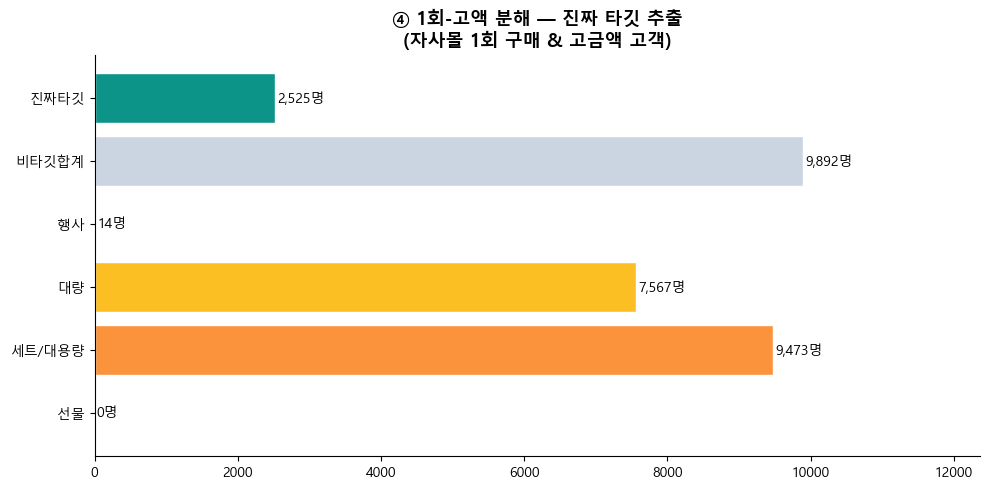


※ 1회-고액의 84%는 구조적 비타깃(세트/대량 76% + 선물 21%)
   진짜 재구매 타깃은 ~16%에 불과

[진짜 타깃 2,525명 — 첫 구매 sku_family TOP 10]
sku_family
185 커큐민+              738
185 커큐민+(240캡슐)       723
185 커큐민+(300캡)        660
흑본전탕                  101
조인트리션뮤코(NPK)          100
지니어스뉴 톡캡스(30캡술*3)      77
지니어스뉴 톡캡스(30캡슐)        62
오큘라레이드                 23
조인트리션뮤코(NPK)(2개월분)     13
블러드 플로우케어(리뉴얼)         11

성숙(25.10 이전, 진짜 이탈): 1,863명(74%)
최근(미성숙, 우측절단):      662명(26%)

※ 진짜 타깃의 대부분이 특정 제품군에 집중되어 있음
   성숙 코호트가 이탈했는지, 미성숙인지 구분이 재구매율 해석에 핵심


In [872]:
# 1회-고액 분해 (선물/세트/대량/행사)
# ============================================================

hv = set(G[(G['주문'] == 1) & (G['금액'] == '고')].index)
print(f"\n1회-고액 고객: {len(hv):,}명")

d_hv = df_eda[
    df_eda['receiver_key'].isin(hv) &
    df_eda['channel_group'].isin(OWN) &
    (df_eda['결제액'] > 0)
].copy()

# 선물 여부 (주문자 ≠ 수령자)
if '주문자' in d_hv.columns and '수령자' in d_hv.columns:
    d_hv['주문자'] = d_hv['주문자'].astype(str).str.strip()
    d_hv['수령자'] = d_hv['수령자'].astype(str).str.strip()
    d_hv['gift'] = (
        (d_hv['주문자'] != d_hv['수령자']) &
        (d_hv['주문자'] != 'nan') &
        (d_hv['수령자'] != 'nan')
    )
else:
    d_hv['gift'] = False

d_hv['set']   = d_hv['품명'].astype(str).str.contains(r'\(SET\)|세트', regex=True, na=False)
d_hv['promo'] = False  # 판매형태 컬럼 없을 경우 False

if '판매형태' in d_hv.columns:
    d_hv['promo'] = d_hv['판매형태'].astype(str) != '정상'

if '주문수량' in d_hv.columns:
    d_hv['주문수량'] = pd.to_numeric(d_hv['주문수량'], errors='coerce').fillna(0)
else:
    d_hv['주문수량'] = 1

P = d_hv.groupby('receiver_key').agg(
    gift=('gift', 'max'),
    set=('set', 'max'),
    promo=('promo', 'max'),
    qty=('주문수량', 'sum'),
    매출=('결제액', 'sum'),
)
N, TOT = len(P), P['매출'].sum()
P['nontarget'] = P['gift'] | P['set'] | (P['qty'] >= 3) | P['promo']

def show(name, mask):
    s = P[mask]
    print(
        f"  {name}: {len(s):,}명({len(s)/N*100:.0f}%) / "
        f"매출 {s['매출'].sum()/1e8:.1f}억({s['매출'].sum()/TOT*100:.0f}%)"
    )

print(f"\n[1회-고액 {N:,}명 / {TOT/1e8:.1f}억]")
show("선물",           P['gift'])
show("세트/대용량",    P['set'])
show("대량(수량≥3)",   P['qty'] >= 3)
show("행사/기획",      P['promo'])
show("구조적 비타깃",  P['nontarget'])
show("★ 진짜 타깃",   ~P['nontarget'])

target_ids = set(P[~P['nontarget']].index)

# 시각화
labels_nont = ['선물', '세트/대용량', '대량', '행사', '비타깃합계', '진짜타깃']
vals = [
    P['gift'].sum(),
    P['set'].sum(),
    (P['qty'] >= 3).sum(),
    P['promo'].sum(),
    P['nontarget'].sum(),
    (~P['nontarget']).sum(),
]
colors = ['#F87171','#FB923C','#FBBF24','#A3E635','#CBD5E1', CH_COLOR['자사몰_N']]

fig, ax = plt.subplots(figsize=(10, 5))
bars = ax.barh(labels_nont, vals, color=colors, edgecolor='white')
for bar, val in zip(bars, vals):
    ax.text(bar.get_width() + 30, bar.get_y() + bar.get_height()/2,
            f'{val:,}명', va='center', fontsize=10)
ax.set_title('④ 1회-고액 분해 — 진짜 타깃 추출\n(자사몰 1회 구매 & 고금액 고객)',
             fontsize=13, fontweight='bold')
ax.set_xlim(0, max(vals) * 1.25)
ax.spines[['top', 'right']].set_visible(False)
plt.tight_layout()
plt.show()

print("\n※ 1회-고액의 84%는 구조적 비타깃(세트/대량 76% + 선물 21%)")
print("   진짜 재구매 타깃은 ~16%에 불과")


# ============================================================
# 진짜 타깃 제품군·시점 프로파일
# ============================================================

tj = journey[
    journey['receiver_key'].isin(target_ids) &
    journey['channel_group'].isin(OWN)
].copy()

fc = tj.sort_values('t').groupby('receiver_key').first()

print(f"\n[진짜 타깃 {len(fc):,}명 — 첫 구매 sku_family TOP 10]")
print(fc['sku_family'].value_counts().head(10).to_string())

mature = (pd.to_datetime(fc['ym'].astype(str)) <= '2025-10').sum()
print(f"\n성숙(25.10 이전, 진짜 이탈): {mature:,}명({mature/len(fc)*100:.0f}%)")
print(f"최근(미성숙, 우측절단):      {len(fc)-mature:,}명({(len(fc)-mature)/len(fc)*100:.0f}%)")

print("\n※ 진짜 타깃의 대부분이 특정 제품군에 집중되어 있음")
print("   성숙 코호트가 이탈했는지, 미성숙인지 구분이 재구매율 해석에 핵심")


- 1회-고액 고객의 80%가 구조적으로 재구매를 기대할 수 없는 고객  
    세트 구매자(76%)는 선물/기념일 구매이고,  
    대량 구매자(61%)는 한 번에 많이 사는 구조  
    이들은 CRM 타깃이 아님  
<br>  

- 진짜 재구매 타깃은 단 20%(2,525명)  
    이 중 85% 이상이 185 커큐민+ 구매자  
    커큐민 계열이 자사몰의 가장 중요한 고가치 진입 제품  
<br>  

- 14번에서 커큐민이 Revenue Family(재구매율 낮고 객단가로 LTV)로 분류됐는데,  
    1회-고액 분해에서도 동일한 패턴 확인  
<br>  

> 1회-고액 고객을 통으로 타깃팅하면 마케팅 예산의 80%가 낭비될 것이므로  
> 진짜 재구매 가능 고객 2,525명을 별도로 추출해서 집중 관리해야 합니다.  
> 이들 중 185 커큐민+ 구매자가 85%이니,  
> 커큐민 첫 구매 후 재구매 유도 시퀀스(30~51일 이내)를 설계하는 것이 가장 효율적일 것으로 보임  

---

### 15-5. 진입 제품군별 재구매율 + 격차 분해


전체 자사 재구매율: 21.4%

=== 진입 제품군별 재구매율 (고객수 300명+) ===


,고객수,재구매율(%),평균매출(만원)
fam,,,
185 커큐민+,18145,19.50,15.00
지니어스뉴 드롭스,8133,26.90,11.50
지니어스뉴 드롭스(5개입),5484,23.70,16.80
그로우뉴,3380,22.10,9.90
그로우뉴(단종),2644,32.50,14.00
투데이디3 오일(30캡슐),2007,26.70,9.00
투데이디3 오일밤(30캡슐),1990,27.50,10.90
블러드 플로우케어(리뉴얼),1866,17.60,25.70
지니어스뉴 톡캡스(30캡슐),1818,26.80,14.30


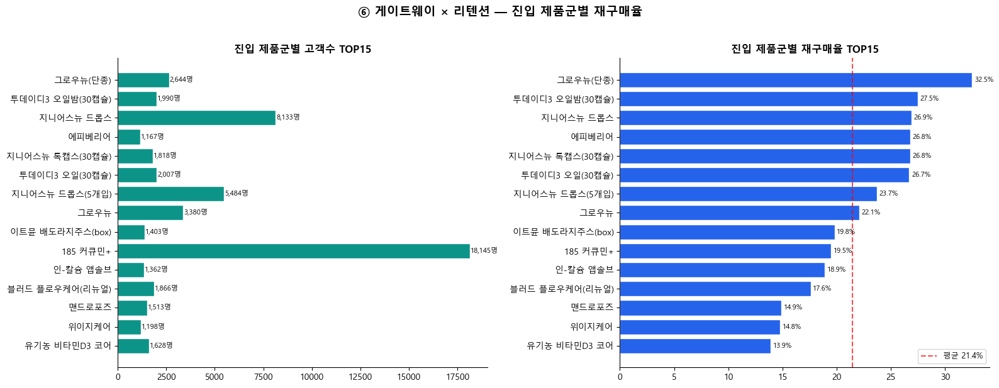


※ 고객수 최대 게이트웨이와 재구매율 최고 제품군이 다를 수 있음
   규모(고객수) vs 품질(재구매율) 동시 고려 필요

=== 핵심 제품군 재구매 격차 분해 ===
185 커큐민+: 진입 18,102명 / 재구매 19.6% / 세트진입 13% / 첫매출중앙 6.0만 / 스마트스토어 98% / 같은제품리필 98% / 재구매간격중앙 51일
지니어스뉴 드롭스: 진입 8,119명 / 재구매 27.1% / 세트진입 100% / 첫매출중앙 2.7만 / 스마트스토어 93% / 같은제품리필 57% / 재구매간격중앙 41일
지니어스뉴 드롭스(5개입): 진입 5,467명 / 재구매 23.4% / 세트진입 100% / 첫매출중앙 9.0만 / 스마트스토어 84% / 같은제품리필 68% / 재구매간격중앙 90일
그로우뉴: 진입 3,365명 / 재구매 22.1% / 세트진입 52% / 첫매출중앙 5.5만 / 스마트스토어 79% / 같은제품리필 69% / 재구매간격중앙 48일
투데이디3 오일밤(30캡슐): 진입 1,978명 / 재구매 27.1% / 세트진입 32% / 첫매출중앙 5.3만 / 스마트스토어 89% / 같은제품리필 60% / 재구매간격중앙 57일


,진입고객수,재구매율(%),세트진입비율(%),첫매출중앙(만),재구매간격중앙(일)
제품군,,,,,
185 커큐민+,18102,19.60,13.10,6.00,51.00
지니어스뉴 드롭스,8119,27.10,100.00,2.70,41.00
지니어스뉴 드롭스(5개입),5467,23.40,100.00,9.00,90.00
그로우뉴,3365,22.10,51.70,5.50,48.00
투데이디3 오일밤(30캡슐),1978,27.10,32.30,5.30,57.00


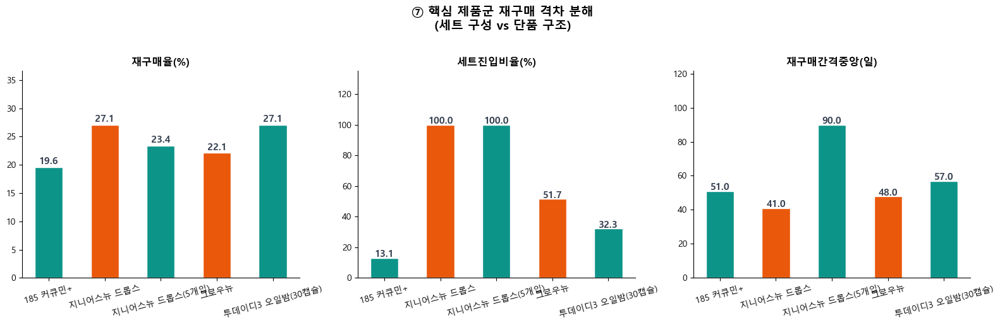


※ 재구매율 격차의 핵심 가설: 세트/정기배송 구성 여부
   단, 자기선택편향(self-selection) 주의 — 인과 확인은 A/B 테스트 필요


In [873]:
# 15-6. 진입 제품군별 재구매율 (자사몰)
# ============================================================

ownf = own.copy()

# sku_family 사용 (없으면 품명 기반)
if 'sku_family' in ownf.columns:
    ownf['fam'] = ownf['sku_family']
else:
    ownf['fam'] = ownf['품명'].apply(base_fam)

fr = ownf.sort_values('t').groupby('receiver_key').first()[['fam']]
fr['주문'] = ownf.groupby('receiver_key')['day'].nunique()
fr['매출'] = ownf.groupby('receiver_key')['결제액'].sum()
fr['재구매'] = fr['주문'] >= 2

agg = (
    fr.groupby('fam')
    .agg(고객수=('주문', 'size'),
         재구매율=('재구매', 'mean'),
         평균매출=('매출', 'mean'))
)
agg = agg[agg['고객수'] >= 300].sort_values('고객수', ascending=False)
agg['재구매율(%)'] = (agg['재구매율'] * 100).round(1)
agg['평균매출(만원)'] = (agg['평균매출'] / 1e4).round(1)

print(f"\n전체 자사 재구매율: {fr['재구매'].mean()*100:.1f}%")
print("\n=== 진입 제품군별 재구매율 (고객수 300명+) ===")
display(agg[['고객수', '재구매율(%)', '평균매출(만원)']].head(15))

# 시각화
top15 = agg.head(15).sort_values('재구매율(%)')
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

axes[0].barh(top15.index, top15['고객수'],
             color=CH_COLOR['자사몰_N'], edgecolor='white')
for i, val in enumerate(top15['고객수']):
    axes[0].text(val + 30, i, f'{val:,}명', va='center', fontsize=8)
axes[0].set_title('진입 제품군별 고객수 TOP15', fontsize=12, fontweight='bold')
axes[0].spines[['top', 'right']].set_visible(False)

axes[1].barh(top15.index, top15['재구매율(%)'],
             color=CH_COLOR['자사몰'], edgecolor='white')
avg_rate = fr['재구매'].mean() * 100
axes[1].axvline(avg_rate, color='red', linestyle='--', alpha=0.7, label=f'평균 {avg_rate:.1f}%')
for i, val in enumerate(top15['재구매율(%)']):
    axes[1].text(val + 0.2, i, f'{val}%', va='center', fontsize=8)
axes[1].set_title('진입 제품군별 재구매율 TOP15', fontsize=12, fontweight='bold')
axes[1].legend(fontsize=9)
axes[1].spines[['top', 'right']].set_visible(False)

plt.suptitle('⑥ 게이트웨이 × 리텐션 — 진입 제품군별 재구매율',
             fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

print("\n※ 고객수 최대 게이트웨이와 재구매율 최고 제품군이 다를 수 있음")
print("   규모(고객수) vs 품질(재구매율) 동시 고려 필요")


# ============================================================
# 핵심 제품군 재구매 격차 분해
# 185커큐민+ vs 지니어스뉴드롭스 → sku_family 기준으로 적용
# ============================================================

# sku_family 기준 타깃 제품군 2개 선정
# 아래 이름은 실제 sku_family 값으로 조정 필요
TARGET_SKUS = [
    '185 커큐민+',              # Revenue Family
    '지니어스뉴 드롭스',         # Hero — 단품
    '지니어스뉴 드롭스(5개입)',   # Hero — 대용량
    '그로우뉴',                  # Hero — 그로우랩
    '투데이디3 오일밤(30캡슐)',   # Hero — 투데이D3
]

o = own.copy()
if 'sku_family' in o.columns:
    o['fam'] = o['sku_family']
else:
    o['fam'] = o['품명'].apply(base_fam)

o['is_set'] = o['품명'].astype(str).str.contains(r'\(SET\)|세트', na=False)
o = o.sort_values(['receiver_key', 't'])

# 첫 구매일
d1 = o.groupby('receiver_key')['day'].min().rename('d1')
o  = o.merge(d1, on='receiver_key')

# 진입 정보
ent = o.sort_values('t').groupby('receiver_key').first()[['fam', 'channel_group']].rename(
    columns={'fam': 'fam0', 'channel_group': 'ch0'}
)

fd = o[o['day'] == o['d1']]
ent['set0']       = fd.groupby('receiver_key')['is_set'].max()
ent['first_매출'] = fd.groupby('receiver_key')['결제액'].sum()

# 구매일 순서
dd = o[['receiver_key', 'day']].drop_duplicates().sort_values(['receiver_key', 'day'])
dd['rk'] = dd.groupby('receiver_key').cumcount()
ent['nday'] = dd.groupby('receiver_key')['day'].size()

# 2번째 구매일
d2   = dd[dd['rk'] == 1].set_index('receiver_key')['day'].rename('d2')
ent  = ent.join(d2)
ent['gap'] = (ent['d2'] - d1).dt.days

# 2번째 구매 동일 제품 여부
o2   = o.merge(d2, on='receiver_key', how='left').merge(ent[['fam0']], on='receiver_key', how='left')
day2 = o2[o2['day'] == o2['d2']]
ent['same2'] = day2.assign(s=day2['fam'] == day2['fam0']).groupby('receiver_key')['s'].max()

print("\n=== 핵심 제품군 재구매 격차 분해 ===")
for PR in TARGET_SKUS:
    s = ent[ent['fam0'] == PR]
    r = s[s['nday'] >= 2]
    if len(s) == 0:
        print(f"{PR}: 데이터 없음 — sku_family 값 확인 필요")
        continue
    print(
        f"{PR}: "
        f"진입 {len(s):,}명 / "
        f"재구매 {len(r)/len(s)*100:.1f}% / "
        f"세트진입 {s['set0'].mean()*100:.0f}% / "
        f"첫매출중앙 {s['first_매출'].median()/1e4:.1f}만 / "
        f"스마트스토어 {(s['ch0']=='자사몰_N').mean()*100:.0f}% / "
        f"같은제품리필 {r['same2'].mean()*100:.0f}% / "
        f"재구매간격중앙 {r['gap'].median():.0f}일"
    )

# 시각화 — 두 제품군 비교
compare_rows = []
for PR in TARGET_SKUS:
    s = ent[ent['fam0'] == PR]
    r = s[s['nday'] >= 2]
    if len(s) == 0:
        continue
    compare_rows.append({
        '제품군': PR,
        '진입고객수': len(s),
        '재구매율(%)': round(len(r)/len(s)*100, 1),
        '세트진입비율(%)': round(s['set0'].mean()*100, 1),
        '첫매출중앙(만)': round(s['first_매출'].median()/1e4, 1),
        '재구매간격중앙(일)': round(r['gap'].median(), 0) if len(r) else 0,
    })

if compare_rows:
    df_compare = pd.DataFrame(compare_rows).set_index('제품군')
    display(df_compare)

    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    metrics = ['재구매율(%)', '세트진입비율(%)', '재구매간격중앙(일)']
    colors  = [CH_COLOR['자사몰_N'], CH_COLOR['공구']]

    for i, metric in enumerate(metrics):
        vals = df_compare[metric].values
        bars = axes[i].bar(df_compare.index, vals,
                           color=colors[:len(vals)], edgecolor='white', width=0.5)
        for bar, val in zip(bars, vals):
            axes[i].text(
                bar.get_x() + bar.get_width()/2,
                bar.get_height() + 0.5,
                f'{val}', ha='center', fontsize=11, fontweight='bold', color='#374151'
            )
        axes[i].set_title(metric, fontsize=12, fontweight='bold')
        axes[i].set_ylim(0, max(vals) * 1.35)
        axes[i].tick_params(axis='x', rotation=15)
        axes[i].spines[['top', 'right']].set_visible(False)

    plt.suptitle('⑦ 핵심 제품군 재구매 격차 분해\n(세트 구성 vs 단품 구조)',
                 fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

print("\n※ 재구매율 격차의 핵심 가설: 세트/정기배송 구성 여부")
print("   단, 자기선택편향(self-selection) 주의 — 인과 확인은 A/B 테스트 필요")


- 185 커큐민+ vs 지니어스뉴 드롭스 비교  
재구매율 격차(19.6% vs 27.1% = 7.5%p)의 원인을 분해하면:  
    - 세트 진입 비율: 커큐민 13% vs 지니어스뉴 100%  
        지니어스뉴는 모든 고객이 세트로 들어옴  
        경도님 가설대로 세트 구성이 재구매를 높이는 구조적 요인  
    - 재구매 간격: 커큐민 51일 vs 지니어스뉴 41일  
        지니어스뉴가 10일 빠름  
        소비 주기가 짧아 재구매가 더 자연스럽게 일어남  
    - 같은 제품 리필: 커큐민 98% vs 지니어스뉴 57%  
        커큐민은 거의 같은 제품을 재구매하는 완전한 소모품형  
        지니어스뉴는 43%가 다른 제품으로 확장  
<br>  

- 지니어스뉴 드롭스 vs 지니어스뉴 드롭스(5개입)  
    - 재구매율은 27.1% vs 23.4%로 단품이 높지만,  
    - 재구매 간격은 41일 vs 90일로 5개입이 두 배 이상 김  
    - 단품은 빠른 재구매, 5개입은 느리지만 대용량 재구매 구조  
<br>  

- 그로우뉴의 특이점  
    - 세트 진입 52%로 중간이지만, 재구매 간격 48일로 짧고 재구매율 22.1%도 평균 이상  
    - 그로우뉴(단종)는 32.5%로 전 제품군 최고  
    단종된 제품의 재구매율이 높다는 것은 해당 제품을 구매한 충성 고객이 후속 제품으로 이동했을 가능성 시사
<br>  
<br>  

> 1. 185 커큐민+는 규모는 최대(18,102명)이지만 재구매율은 평균 이하(19.6%)입니다.  
> 98%가 세트 없이 단품으로 진입하고, 재구매도 98%가 같은 제품만 사는 단일 소모품 구조입니다.  
> 세트/구독 형태로 묶으면 재구매율 개선 여지가 가장 큰 제품입니다.  
> 
> 2. 지니어스뉴 드롭스·투데이D3는 이미 Hero Family 구조가 검증됐습니다.  
> 재구매율 27% 이상, 재구매 간격 41~57일, 세트 진입이 높거나 첫매출이 낮아 진입 장벽이 낮습니다.  
> 이 제품들을 공구 첫 구매 SKU로 설계하면 자사몰 전환 후 재구매까지 이어지는 가능성이 높습니다.  
> 
> 3. 세트 구성이 재구매율을 높이는 핵심 구조적 요인입니다.  
> 단 자기선택편향(원래 충성도 높은 고객이 세트를 선택)인지 세트 자체의 효과인지는 A/B 테스트가 필요합니다.  

---

### 15-6. 채널별 월별 신규 고객 수 추이 

- 추가 분석  
- 신규 고객 -29% 원인 점검  

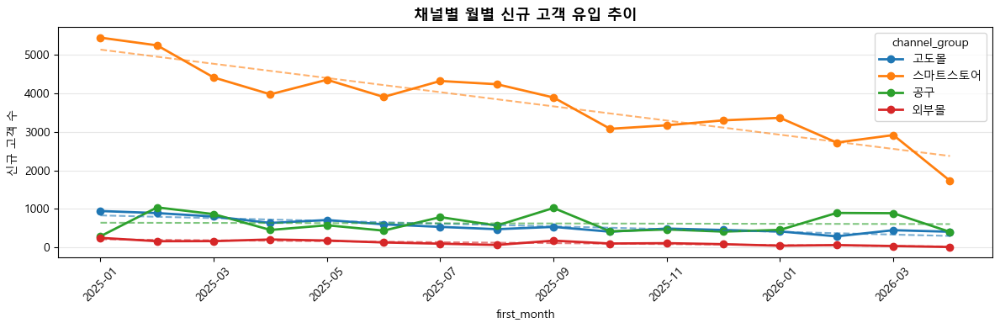

채널별 월평균 신규 고객 수


,전반기(~25.08),후반기(25.09~),변화율
channel_group,,,
공구,628.25,621.75,-1.0%
외부몰,157.88,79.88,-49.4%
고도몰,700.62,431.75,-38.4%
스마트스토어,"4,489.12","3,023.88",-32.6%


In [874]:
customer_first = (
    df_eda[df_eda['channel_group'].isin(['자사몰', '자사몰_N', '공구', '외부몰'])]
    .sort_values('analysis_date')
    .drop_duplicates('receiver_key', keep='first')
    [['receiver_key', 'analysis_date', 'channel_group']]
)
customer_first['first_month'] = customer_first['analysis_date'].dt.to_period('M')

monthly_new = (
    customer_first.groupby(['first_month', 'channel_group'])['receiver_key']
    .nunique()
    .unstack(fill_value=0)
)

monthly_new = monthly_new.rename(columns={
    '자사몰': '고도몰',
    '자사몰_N': '스마트스토어'
})

monthly_new.index = monthly_new.index.astype(str)

monthly_new[['고도몰', '스마트스토어', '공구', '외부몰']].plot(
    figsize=(12, 4),
    marker='o',
    linewidth=2
)

# ── 추세선 추가 ───────────────────────────────────────────
ax = plt.gca()
x = np.arange(len(monthly_new))
colors = {'고도몰': '#1f77b4', '스마트스토어': '#ff7f0e', '공구': '#2ca02c', '외부몰': '#d62728'}

for col, color in colors.items():
    if col not in monthly_new.columns:
        continue
    y = monthly_new[col].values
    z = np.polyfit(x, y, 1)
    p = np.poly1d(z)
    ax.plot(x, p(x), linestyle='--', linewidth=1.5, color=color, alpha=0.6)

plt.title('채널별 월별 신규 고객 유입 추이', fontsize=13, fontweight='bold')
plt.ylabel('신규 고객 수')
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

# 전반기/후반기 비교
first_half  = monthly_new.loc['2025-01':'2025-08']
second_half = monthly_new.loc['2025-09':]
print("채널별 월평균 신규 고객 수")
display(pd.DataFrame({
    '전반기(~25.08)': first_half.mean(),
    '후반기(25.09~)': second_half.mean(),
    '변화율':         (second_half.mean() / first_half.mean() - 1).map('{:.1%}'.format)
}))

- 공구는 -1%로 거의 그대로인데  
- 스마트스토어가 -32.6%, 고도몰이 -38.4%  
- 신규 -29%의 원인은 공구가 아니라 자사몰 자체의 신규 유입 감소로 보임  

<br>    

- 스마트스토어 2025-09 신규 유입 급락  
- 외부몰은 절대 수가 작지만 감소폭이 가장 큼  
특정 외부몰 입점 철수나 계약 변화가 있었을 수 있음  
- 공구 2025-09 스파이크  
대형 셀러 공구가 한 번 터진 것으로 보임  

---

## 16. 공구 → 자사몰 전환 고객 구매여정

(우성님 분석)  

2번 섹션에서 확인한 전환 여부를 바탕으로,  
**전환 고객이 어떻게·얼마나·어떤 경로로 전환되는지** 를 파는 심화 분석  

- 베이스: **공구 구매 이력이 있는 고객 전체** (자사몰 이력 유무 무관)  
- 2번 변수 재사용: `gonggu_first`, `gonggu_check`, `customer_conversion`  
- 전환 후 자사몰 주문수/매출은 주문 단위(`order_id_16`) 기준으로 신규 집계  

| | 2번 | 16번 |
|---|---|---|
| 목적 | 전환 여부 확인 | 전환 여정 심화 |
| 베이스 | 공구 이력 전체 | 공구 이력 전체 (동일) |
| 신규/기존 구분 | 2-2에서 검증 | 참고용 컬럼으로만 포함 |
| 전환 후 분석 | ❌ | ✅ 주문수·매출·구간·SKU·셀러·CRM |


In [875]:
OWNED_CH_16  = ['자사몰', '자사몰_N']
GONGGU_CH_16 = '공구'

# ── 주문 ID (배송번호 우선, 없으면 주문번호) ──────────────────────────────
if '배송번호' in df_eda.columns:
    df_eda['order_id_16'] = df_eda['배송번호'].where(
        df_eda['배송번호'].notna() & (df_eda['배송번호'].astype(str).str.strip() != ''),
        df_eda.get('주문번호', np.nan)
    )
elif '주문번호' in df_eda.columns:
    df_eda['order_id_16'] = df_eda['주문번호']
else:
    df_eda['order_id_16'] = df_eda.index.astype(str)

# ── 결제액 숫자 변환 ──────────────────────────────────────────────────────
df_eda['결제액_num16'] = pd.to_numeric(
    df_eda['결제액'].astype(str)
    .str.replace(',', '', regex=False)
    .str.replace('원', '', regex=False)
    .str.strip(),
    errors='coerce'
).fillna(0)

# ── 컬럼 존재 확인 ────────────────────────────────────────────────────────
qty_col_16    = '주문수량' if '주문수량' in df_eda.columns else ('수량' if '수량' in df_eda.columns else None)
sku_col_16    = 'sku_norm'    if 'sku_norm'    in df_eda.columns else '품번'
brand_col_16  = '브랜드_분류' if '브랜드_분류' in df_eda.columns else None
seller_col_16 = 'goo_seller'  if 'goo_seller'  in df_eda.columns else None

# ── analysis_date 기준 정렬 후 주문 단위 first 집계 ──────────────────────
# mode() 대신 first 사용 — 속도 문제 방지
base_df_16 = (
    df_eda[df_eda['order_id_16'].notna() & df_eda['channel_group'].notna()]
    .sort_values('analysis_date')
    .copy()
)

keep_cols = ['order_id_16', 'analysis_date', 'receiver_key', 'channel_group',
             '결제액_num16', '품명', sku_col_16]
if qty_col_16:    keep_cols.append(qty_col_16)
if brand_col_16:  keep_cols.append(brand_col_16)
if seller_col_16: keep_cols.append(seller_col_16)

# 중복 컬럼 제거
keep_cols = list(dict.fromkeys(keep_cols))

agg_dict_16 = {
    'order_date':      ('analysis_date',  'min'),
    'receiver_key':    ('receiver_key',   'first'),
    'channel_group':   ('channel_group',  'first'),
    'order_pay':       ('결제액_num16',   'sum'),
    'primary_product': ('품명',           'first'),
    'primary_sku':     (sku_col_16,       'first'),
}
if qty_col_16:    agg_dict_16['order_qty']     = (qty_col_16,    'sum')
if brand_col_16:  agg_dict_16['primary_brand'] = (brand_col_16,  'first')
if seller_col_16: agg_dict_16['goo_seller']    = (seller_col_16, 'first')

orders_16 = base_df_16[keep_cols].groupby('order_id_16', as_index=False).agg(**agg_dict_16)
orders_16['is_gonggu'] = orders_16['channel_group'] == GONGGU_CH_16
orders_16['is_owned']  = orders_16['channel_group'].isin(OWNED_CH_16)

print(f"주문 단위 테이블: {len(orders_16):,}건")
print(f"공구 주문: {orders_16['is_gonggu'].sum():,}  |  자사몰 주문: {orders_16['is_owned'].sum():,}")

주문 단위 테이블: 126,938건
공구 주문: 17,734  |  자사몰 주문: 101,007


### 16-1. 전환 프로필 구성 & 전환 퍼널

공구 구매 고객 전체 : 11,039명
자사몰 전환 고객    : 930명  (8.4%)

전환 프로필 완성: 930명


,단계,고객수,이전단계대비,공구고객대비
0,공구 구매 고객,"11,039",100.0%,100.0%
1,공구 첫접점 신규 고객,"9,997",90.6%,90.6%
2,공구 후 자사몰 전환,930,9.3%,8.4%
3,전환 후 자사몰 반복,316,34.0%,2.9%
4,전환 후 멀티채널 왕복,289,91.5%,2.6%


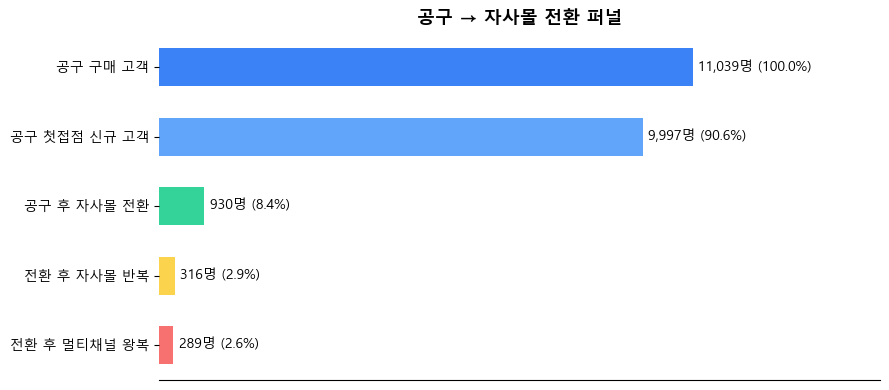

In [876]:
# ── 2번 변수 확인 ─────────────────────────────────────────────────────────
# gonggu_first      : receiver_key, gonggu_first_date
# customer_conversion : receiver_key, converted, min_days_to_convert
# gonggu_check      : receiver_key, gonggu_first_date, owned_first_date, 고객유형

# ── 전환 고객 베이스 (모든 공구 고객, 자사몰 이력 무관) ───────────────────
total_gonggu_16 = gonggu_first['receiver_key'].nunique()
converted_keys_16 = set(
    customer_conversion.loc[customer_conversion['converted'] == True, 'receiver_key']
)
total_conv_16 = len(converted_keys_16)

print(f"공구 구매 고객 전체 : {total_gonggu_16:,}명")
print(f"자사몰 전환 고객    : {total_conv_16:,}명  ({total_conv_16/total_gonggu_16*100:.1f}%)")

# ── 첫 자사몰 전환 주문 (order_id_16 기준) ────────────────────────────────
owned_orders_16 = orders_16[orders_16['is_owned']].copy()

owned_after_16 = (
    owned_orders_16
    .merge(gonggu_first[['receiver_key', 'gonggu_first_date']], on='receiver_key', how='inner')
)
owned_after_16 = owned_after_16[owned_after_16['order_date'] > owned_after_16['gonggu_first_date']].copy()

fo_rename = {
    'order_date':      'first_owned_date',
    'order_pay':       'first_owned_pay',
    'channel_group':   'first_owned_channel',
    'primary_sku':     'first_owned_sku',
    'primary_product': 'first_owned_product',
}
if brand_col_16:
    fo_rename['primary_brand'] = 'first_owned_brand'

first_owned_16 = (
    owned_after_16
    .sort_values(['receiver_key', 'order_date', 'order_id_16'])
    .drop_duplicates('receiver_key', keep='first')
    [['receiver_key'] + list(fo_rename.keys())]
    .rename(columns=fo_rename)
)

# ── 전환 후 자사몰 누적 주문수/매출 (order_id_16 기준) ───────────────────
owned_after_agg_16 = (
    owned_after_16[owned_after_16['receiver_key'].isin(converted_keys_16)]
    .groupby('receiver_key')
    .agg(
        owned_orders_after=('order_id_16', 'nunique'),
        owned_revenue_after=('order_pay', 'sum')
    )
    .reset_index()
)

# ── 첫 공구 정보 (gonggu_first + 상세 컬럼) ──────────────────────────────
fg_cols = {'품명': 'first_gonggu_product', '품번': 'first_gonggu_sku', '결제액_num16': 'first_gonggu_pay'}
if brand_col_16:
    fg_cols['브랜드_분류'] = 'first_gonggu_brand'
if seller_col_16:
    fg_cols['goo_seller'] = 'first_gonggu_seller'

first_gonggu_detail = (
    df_eda[
        (df_eda['channel_group'] == GONGGU_CH_16) &
        (df_eda['product_status'] == '정상') &
        (df_eda['결제액_num16'] > 0)
    ]
    .sort_values('analysis_date')
    .drop_duplicates('receiver_key', keep='first')
    [['receiver_key'] + list(fg_cols.keys())]
    .rename(columns=fg_cols)
)

# ── 전환 고객 프로필 조합 ─────────────────────────────────────────────────
profiles_16 = (
    gonggu_first                                          # receiver_key, gonggu_first_date
    .merge(first_gonggu_detail, on='receiver_key', how='left')
    .merge(gonggu_check[['receiver_key', '고객유형']].rename(columns={'고객유형': 'customer_origin_type'}),
           on='receiver_key', how='left')
    .merge(first_owned_16, on='receiver_key', how='inner')  # inner → 전환 고객만
    .merge(owned_after_agg_16, on='receiver_key', how='left')
)
profiles_16['owned_orders_after']  = profiles_16['owned_orders_after'].fillna(0).astype(int)
profiles_16['owned_revenue_after'] = profiles_16['owned_revenue_after'].fillna(0)

# ── 전환 소요일 ───────────────────────────────────────────────────────────
profiles_16['days_to_convert'] = (
    profiles_16['first_owned_date'] - profiles_16['gonggu_first_date']
).dt.days

def conversion_bucket(days):
    if pd.isna(days): return '미확인'
    d = int(days)
    if d <=   7: return '0~7일 즉시'
    if d <=  30: return '8~30일 빠른'
    if d <=  60: return '31~60일 단기리필'
    if d <=  90: return '61~90일 표준리필'
    if d <= 180: return '91~180일 장기리필'
    return '181일+ 장기숙성'

profiles_16['conversion_time_bucket'] = profiles_16['days_to_convert'].map(conversion_bucket)

# ── 전환 후 공구 재방문 ───────────────────────────────────────────────────
gonggu_orders_16 = orders_16[orders_16['is_gonggu']].copy()
g_after = gonggu_orders_16.merge(
    profiles_16[['receiver_key', 'first_owned_date']], on='receiver_key', how='inner'
)
returned_keys_16 = set(
    g_after.loc[g_after['order_date'] > g_after['first_owned_date'], 'receiver_key']
)
profiles_16['returned_to_gonggu'] = profiles_16['receiver_key'].isin(returned_keys_16)
profiles_16['customer_id_16'] = ['C{:04d}'.format(i) for i in range(1, len(profiles_16) + 1)]

print(f"\n전환 프로필 완성: {len(profiles_16):,}명")
profiles_16[['customer_id_16', 'customer_origin_type', 'gonggu_first_date',
             'first_owned_date', 'days_to_convert', 'conversion_time_bucket',
             'first_owned_channel', 'owned_orders_after', 'owned_revenue_after']].head(8)

repeat_owned_16 = int((profiles_16['owned_orders_after'] >= 2).sum())
multi_ch_16     = int(profiles_16['returned_to_gonggu'].sum())
new_gonggu_16   = int((gonggu_check['고객유형'] == '브랜드 신규').sum())

funnel_16 = pd.DataFrame({
    '단계':  ['공구 구매 고객', '공구 첫접점 신규 고객', '공구 후 자사몰 전환', '전환 후 자사몰 반복', '전환 후 멀티채널 왕복'],
    '고객수': [total_gonggu_16, new_gonggu_16, total_conv_16, repeat_owned_16, multi_ch_16]
})
funnel_16['이전단계대비'] = funnel_16['고객수'] / funnel_16['고객수'].shift(1)
funnel_16.loc[0, '이전단계대비'] = 1.0
funnel_16['공구고객대비'] = funnel_16['고객수'] / total_gonggu_16

display(funnel_16.style.format({'고객수': '{:,}', '이전단계대비': '{:.1%}', '공구고객대비': '{:.1%}'}))

fig, ax = plt.subplots(figsize=(9, 4))
colors = ['#3B82F6', '#60A5FA', '#34D399', '#FCD34D', '#F87171']
bars = ax.barh(funnel_16['단계'][::-1], funnel_16['고객수'][::-1], color=colors[::-1], height=0.55)
for bar, val, pct_v in zip(bars, funnel_16['고객수'][::-1], funnel_16['공구고객대비'][::-1]):
    ax.text(bar.get_width() + max(funnel_16['고객수']) * 0.01,
            bar.get_y() + bar.get_height() / 2,
            f'{val:,}명 ({pct_v:.1%})', va='center', fontsize=10)
ax.set_xlim(0, max(funnel_16['고객수']) * 1.35)
ax.set_title('공구 → 자사몰 전환 퍼널', fontsize=13, fontweight='bold')
ax.spines[['top', 'right', 'left']].set_visible(False)
ax.xaxis.set_visible(False)
plt.tight_layout()
plt.show()

---

### 16-2. 전환 소요일 구간별 분포 & 첫 자사몰 전환 채널

,구간,고객수,평균_첫공구AOV,평균_첫자사몰AOV,자사몰반복률,전환후자사몰매출,구성비
0,0~7일 즉시,31,"56,380","67,803",38.7%,"4,386,580",3.3%
1,8~30일 빠른,95,"45,841","84,930",47.4%,"16,496,080",10.2%
2,31~60일 단기리필,169,"52,472","81,412",36.1%,"23,262,499",18.2%
3,61~90일 표준리필,161,"45,958","84,109",44.1%,"22,432,675",17.3%
4,91~180일 장기리필,303,"46,723","97,618",30.7%,"40,761,800",32.6%
5,181일+ 장기숙성,171,"47,813","96,133",19.9%,"19,504,000",18.4%


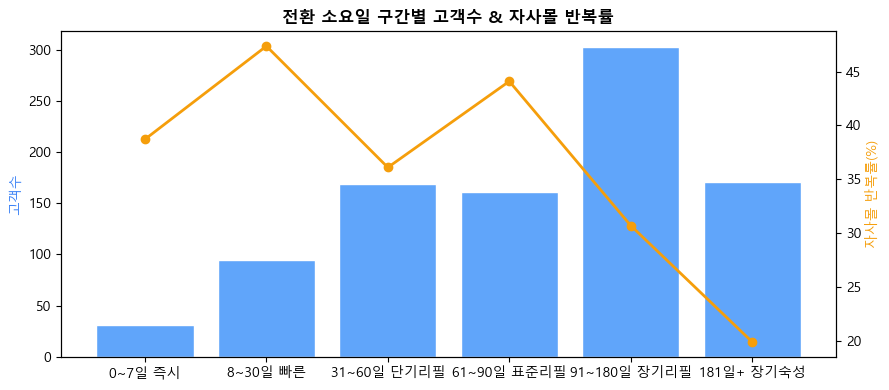

,채널,고객수,평균전환소요일,첫자사몰매출,전환후자사몰매출,자사몰반복률,구성비
1,스마트스토어,726,113일,"62,751,835","96,438,715",34.3%,78.1%
0,고도몰,204,112일,"20,735,451","30,404,919",32.8%,21.9%


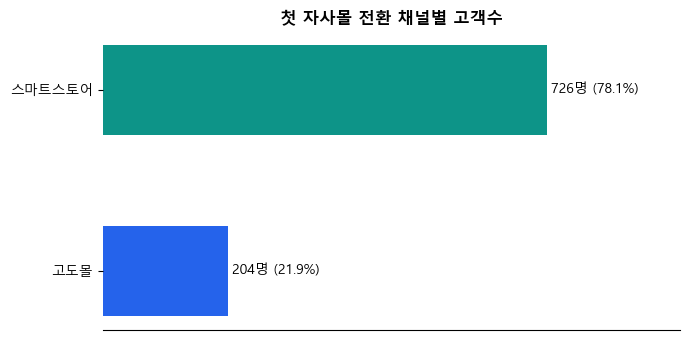

In [877]:
bucket_order_16 = ['0~7일 즉시', '8~30일 빠른', '31~60일 단기리필',
                   '61~90일 표준리필', '91~180일 장기리필', '181일+ 장기숙성', '미확인']

bucket_16 = (
    profiles_16.groupby('conversion_time_bucket', dropna=False)
    .agg(
        고객수=('customer_id_16', 'nunique'),
        평균_첫공구AOV=('first_gonggu_pay', 'mean'),
        평균_첫자사몰AOV=('first_owned_pay', 'mean'),
        자사몰반복률=('owned_orders_after', lambda s: (s >= 2).mean()),
        전환후자사몰매출=('owned_revenue_after', 'sum'),
    )
    .reindex([b for b in bucket_order_16 if b in profiles_16['conversion_time_bucket'].values])
    .reset_index()
    .rename(columns={'conversion_time_bucket': '구간'})
)
bucket_16['구성비'] = bucket_16['고객수'] / bucket_16['고객수'].sum()

display(bucket_16.style.format({
    '고객수': '{:,}', '구성비': '{:.1%}',
    '평균_첫공구AOV': '{:,.0f}', '평균_첫자사몰AOV': '{:,.0f}',
    '자사몰반복률': '{:.1%}', '전환후자사몰매출': '{:,.0f}'
}))

fig, ax = plt.subplots(figsize=(9, 4))
ax.bar(bucket_16['구간'], bucket_16['고객수'], color='#60A5FA', edgecolor='white')
ax2 = ax.twinx()
ax2.plot(bucket_16['구간'], bucket_16['자사몰반복률'] * 100, 'o-', color='#F59E0B', linewidth=2)
ax.set_title('전환 소요일 구간별 고객수 & 자사몰 반복률', fontsize=12, fontweight='bold')
ax.set_ylabel('고객수', color='#3B82F6')
ax2.set_ylabel('자사몰 반복률(%)', color='#F59E0B')
plt.xticks(rotation=20, ha='right')
plt.tight_layout()
plt.show()

channel_16 = (
    profiles_16.groupby('first_owned_channel', dropna=False)
    .agg(
        고객수=('customer_id_16', 'nunique'),
        평균전환소요일=('days_to_convert', 'mean'),
        첫자사몰매출=('first_owned_pay', 'sum'),
        전환후자사몰매출=('owned_revenue_after', 'sum'),
        자사몰반복률=('owned_orders_after', lambda s: (s >= 2).mean()),
    )
    .reset_index()
    .rename(columns={'first_owned_channel': '채널'})
    .sort_values('고객수', ascending=False)
)

channel_16['채널'] = channel_16['채널'].replace({
    '자사몰': '고도몰',
    '자사몰_N': '스마트스토어'
})

color_map = {
    '고도몰': CH_COLOR['자사몰'],
    '스마트스토어': CH_COLOR['자사몰_N']
}

bar_colors = [
    color_map.get(ch, '#94A3B8')
    for ch in channel_16['채널'][::-1]
]

channel_16['구성비'] = channel_16['고객수'] / channel_16['고객수'].sum()

display(channel_16.style.format({
    '고객수': '{:,}', '구성비': '{:.1%}',
    '평균전환소요일': '{:.0f}일',
    '첫자사몰매출': '{:,.0f}', '전환후자사몰매출': '{:,.0f}',
    '자사몰반복률': '{:.1%}'
}))

fig, ax = plt.subplots(figsize=(7, 3.5))

ax.barh(
    channel_16['채널'][::-1],
    channel_16['고객수'][::-1],
    color=bar_colors,
    height=0.5
)

for i, (val, pct_v) in enumerate(
    zip(
        channel_16['고객수'][::-1],
        channel_16['구성비'][::-1]
    )
):
    ax.text(
        val + max(channel_16['고객수']) * 0.01,
        i,
        f'{val:,}명 ({pct_v:.1%})',
        va='center',
        fontsize=10
    )

ax.set_xlim(0, max(channel_16['고객수']) * 1.3)
ax.set_title(
    '첫 자사몰 전환 채널별 고객수',
    fontsize=12,
    fontweight='bold'
)

ax.spines[['top', 'right', 'left']].set_visible(False)
ax.xaxis.set_visible(False)

plt.tight_layout()
plt.show()



---

### 16-3. 셀러별 공구→자사몰 전환 품질 (Top 20)

In [878]:
if 'first_gonggu_seller' in profiles_16.columns:
    seller_base_16 = (
        gonggu_first
        .merge(first_gonggu_detail[['receiver_key', 'first_gonggu_seller']], on='receiver_key', how='left')
        .groupby('first_gonggu_seller', dropna=False)
        .agg(공구고객수=('receiver_key', 'nunique'))
        .reset_index()
    )
    seller_conv_16 = (
        profiles_16.groupby('first_gonggu_seller', dropna=False)
        .agg(
            전환고객수=('customer_id_16', 'nunique'),
            평균전환소요일=('days_to_convert', 'mean'),
            전환후자사몰매출=('owned_revenue_after', 'sum'),
            자사몰반복률=('owned_orders_after', lambda s: (s >= 2).mean()),
        )
        .reset_index()
    )
    seller_16 = seller_base_16.merge(seller_conv_16, on='first_gonggu_seller', how='left')
    seller_16['전환고객수'] = seller_16['전환고객수'].fillna(0).astype(int)
    seller_16['전환율']     = seller_16['전환고객수'] / seller_16['공구고객수']
    seller_16 = seller_16.sort_values(['전환고객수', '전환율'], ascending=False).reset_index(drop=True)

    display(seller_16.head(20).style.format({
        '공구고객수': '{:,}', '전환고객수': '{:,}', '전환율': '{:.1%}',
        '평균전환소요일': '{:.0f}일',
        '전환후자사몰매출': '{:,.0f}', '자사몰반복률': '{:.1%}'
    }))
else:
    print("goo_seller 컬럼 없음 — 셀러별 분석 생략")


,first_gonggu_seller,공구고객수,전환고객수,평균전환소요일,전환후자사몰매출,자사몰반복률,전환율
0,두둥맘,"2,124",243,123일,"35,687,795",35.4%,11.4%
1,뚜미니네,"3,494",230,142일,"31,960,300",36.5%,6.6%
2,모찌맘,446,80,127일,"10,621,119",42.5%,17.9%
3,애프리,778,76,89일,"10,732,280",30.3%,9.8%
4,nan,"1,285",68,70일,"8,407,300",22.1%,5.3%
5,강산들,548,39,60일,"5,318,400",28.2%,7.1%
6,또비앙,138,27,114일,"2,981,020",44.4%,19.6%
7,맘스홀릭_그로우랩,198,27,128일,"4,513,420",33.3%,13.6%
8,오프유,374,25,76일,"3,417,000",40.0%,6.7%
9,열무맘,56,19,98일,"2,295,200",31.6%,33.9%


---

### 16-4. 첫 공구 SKU별 전환 여정 (Top 20)

In [879]:
sku_16 = (
    profiles_16.groupby(['first_gonggu_sku', 'first_gonggu_product'], dropna=False)
    .agg(
        전환고객수=('customer_id_16', 'nunique'),
        평균전환소요일=('days_to_convert', 'mean'),
        중앙값전환소요일=('days_to_convert', 'median'),
        평균첫공구AOV=('first_gonggu_pay', 'mean'),
        평균첫자사몰AOV=('first_owned_pay', 'mean'),
        전환후자사몰매출=('owned_revenue_after', 'sum'),
        자사몰반복률=('owned_orders_after', lambda s: (s >= 2).mean()),
    )
    .reset_index()
    .sort_values('전환고객수', ascending=False)
    .reset_index(drop=True)
)
display(sku_16.head(20).style.format({
    '전환고객수': '{:,}',
    '평균전환소요일': '{:.0f}일', '중앙값전환소요일': '{:.0f}일',
    '평균첫공구AOV': '{:,.0f}', '평균첫자사몰AOV': '{:,.0f}',
    '전환후자사몰매출': '{:,.0f}', '자사몰반복률': '{:.1%}'
}))


,first_gonggu_sku,first_gonggu_product,전환고객수,평균전환소요일,중앙값전환소요일,평균첫공구AOV,평균첫자사몰AOV,전환후자사몰매출,자사몰반복률
0,P1011155,(SET)지니어스뉴 드롭스(5개입),281,139일,112일,"62,575","99,537","43,831,600",38.8%
1,P1011148,(SET)지니어스뉴 드롭스,129,94일,78일,"27,789","99,573","19,234,740",36.4%
2,P1011156,(SET)투데이디3 오일밤(30캡슐),78,124일,112일,"23,371","78,117","9,422,000",34.6%
3,P1011166,(SET)투데이디3 오일(30캡슐),77,111일,98일,"33,816","79,510","9,060,299",37.7%
4,nan,nan,68,70일,62일,nan,"82,165","8,407,300",22.1%
5,P4511122,(SET)이트뮨 배도라지주스(box),39,89일,66일,"22,181","57,253","3,332,855",30.8%
6,P1011157,(SET)투데이디3 오일밤(30캡슐x390캡슐),38,179일,174일,"33,673","90,904","5,356,320",28.9%
7,P1011174,(SET)지니어스뉴 톡캡스(30캡슐),37,73일,60일,"77,534","85,786","5,010,680",32.4%
8,P1011175,(SET)지니어스뉴 톡캡스(30캡술*3),33,100일,99일,"125,239","111,206","5,823,100",24.2%
9,P1011167,(SET)투데이디3 오일(30캡슐x390캡슐),29,141일,134일,"45,435","99,157","4,325,240",41.4%


---

### 16-5. 누적 전환 곡선

,전환경과일,누적전환고객수,전환자대비누적비율,공구고객대비누적전환율
0,7,31,3.3%,0.3%
1,14,54,5.8%,0.5%
2,30,126,13.5%,1.1%
3,45,213,22.9%,1.9%
4,60,295,31.7%,2.7%
5,90,456,49.0%,4.1%
6,120,576,61.9%,5.2%
7,150,680,73.1%,6.2%
8,180,759,81.6%,6.9%
9,240,847,91.1%,7.7%


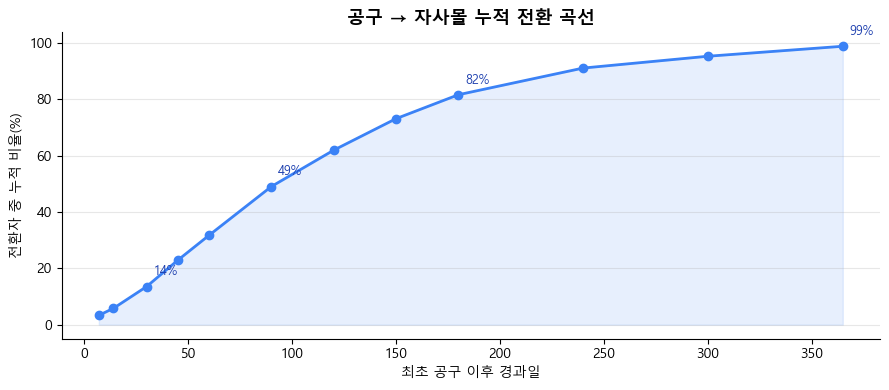

In [880]:
milestones_16 = [7, 14, 30, 45, 60, 90, 120, 150, 180, 240, 300, 365]

curve_16 = pd.DataFrame([{
    '전환경과일': d,
    '누적전환고객수': int((profiles_16['days_to_convert'] <= d).sum()),
    '전환자대비누적비율': (profiles_16['days_to_convert'] <= d).mean(),
    '공구고객대비누적전환율': (profiles_16['days_to_convert'] <= d).sum() / total_gonggu_16,
} for d in milestones_16])

display(curve_16.style.format({
    '누적전환고객수': '{:,}',
    '전환자대비누적비율': '{:.1%}',
    '공구고객대비누적전환율': '{:.1%}'
}))

fig, ax = plt.subplots(figsize=(9, 4))
ax.plot(curve_16['전환경과일'], curve_16['전환자대비누적비율'] * 100,
        'o-', color='#3B82F6', linewidth=2, markersize=6)
ax.fill_between(curve_16['전환경과일'], curve_16['전환자대비누적비율'] * 100, alpha=0.12, color='#3B82F6')
for _, row in curve_16[curve_16['전환경과일'].isin([30, 90, 180, 365])].iterrows():
    ax.annotate(f"{row['전환자대비누적비율']:.0%}",
                xy=(row['전환경과일'], row['전환자대비누적비율'] * 100),
                xytext=(5, 8), textcoords='offset points', fontsize=9, color='#1E40AF')
ax.set_xlabel('최초 공구 이후 경과일')
ax.set_ylabel('전환자 중 누적 비율(%)')
ax.set_title('공구 → 자사몰 누적 전환 곡선', fontsize=13, fontweight='bold')
ax.grid(axis='y', alpha=0.3)
ax.spines[['top', 'right']].set_visible(False)
plt.tight_layout()
plt.show()


---

### 16-6. 고객 유형별 비교 (브랜드 신규 vs 기존 자사몰)


In [881]:
# 유형별 공구 고객 수 (전체 베이스)
origin_base_16 = (
    gonggu_check.groupby('고객유형')
    .agg(공구고객수=('receiver_key', 'nunique'))
    .reset_index()
    .rename(columns={'고객유형': 'customer_origin_type'})
)

# 유형별 전환 고객 수
conv_cnt_16 = (
    profiles_16.groupby('customer_origin_type')['customer_id_16']
    .nunique()
    .rename('전환고객수')
    .reset_index()
)
origin_base_16 = origin_base_16.merge(conv_cnt_16, on='customer_origin_type', how='left')
origin_base_16['전환율'] = origin_base_16['전환고객수'] / origin_base_16['공구고객수']

display(origin_base_16.style.format({
    '공구고객수': '{:,}', '전환고객수': '{:,}', '전환율': '{:.1%}'
}))

origin_conv_16 = (
    profiles_16.groupby('customer_origin_type', dropna=False)
    .agg(
        전환고객수=('customer_id_16', 'nunique'),
        평균전환소요일=('days_to_convert', 'mean'),
        중앙값전환소요일=('days_to_convert', 'median'),
        자사몰반복률=('owned_orders_after', lambda s: (s >= 2).mean()),
        멀티채널왕복률=('returned_to_gonggu', 'mean'),
        첫공구AOV=('first_gonggu_pay', 'mean'),
        첫자사몰AOV=('first_owned_pay', 'mean'),
        전환후자사몰매출=('owned_revenue_after', 'sum'),
    )
    .reset_index()
)
display(origin_conv_16.style.format({
    '전환고객수': '{:,}',
    '평균전환소요일': '{:.0f}일', '중앙값전환소요일': '{:.0f}일',
    '자사몰반복률': '{:.1%}', '멀티채널왕복률': '{:.1%}',
    '첫공구AOV': '{:,.0f}', '첫자사몰AOV': '{:,.0f}',
    '전환후자사몰매출': '{:,.0f}'
}))


,customer_origin_type,공구고객수,전환고객수,전환율
0,기존 자사몰 고객,"1,042",228,21.9%
1,브랜드 신규,"9,997",702,7.0%


,customer_origin_type,전환고객수,평균전환소요일,중앙값전환소요일,자사몰반복률,멀티채널왕복률,첫공구AOV,첫자사몰AOV,전환후자사몰매출
0,기존 자사몰 고객,228,98일,84일,37.3%,26.8%,"49,711","96,554","35,943,160"
1,브랜드 신규,702,118일,95일,32.9%,32.5%,"47,524","87,568","90,900,474"


---

### 16-7. CRM 액션 가이드

In [882]:
crm_guide_16 = pd.DataFrame([
    {'구간': '0~7일 즉시',       '추천_CRM시점': 'D+3, D+7, D+14',       '메시지방향': '공구 경험 직후 브랜드 신뢰 강화, 복용법/리뷰/자사몰 첫구매 혜택', '검증KPI': '30일 내 자사몰 첫구매율, 리뷰 작성률'},
    {'구간': '8~30일 빠른',      '추천_CRM시점': 'D+3, D+7, D+14',       '메시지방향': '공구 경험 직후 브랜드 신뢰 강화, 복용법/리뷰/자사몰 첫구매 혜택', '검증KPI': '30일 내 자사몰 첫구매율, 리뷰 작성률'},
    {'구간': '31~60일 단기리필',  '추천_CRM시점': 'D+21, D+35, D+50',    '메시지방향': '복용 루틴 체크 + 예상 소진일 리마인드, 동일 소구점 리필',        '검증KPI': '60일 전환율, 리필 쿠폰 사용률'},
    {'구간': '61~90일 표준리필',  '추천_CRM시점': 'D+45, D+70, D+90',    '메시지방향': '후기·효과 체감 콘텐츠 + 정기 루틴화, 자사몰 구매 이유 제시',     '검증KPI': '90일 전환율, 회원가입률, 반복구매율'},
    {'구간': '91~180일 장기리필', '추천_CRM시점': 'D+75, D+110, D+150',  '메시지방향': '비축·세트 고객의 소진 시점 + 시즌 이벤트 결합',                  '검증KPI': '180일 전환율, 대용량·세트 구매율'},
    {'구간': '181일+ 장기숙성',   '추천_CRM시점': 'D+150, D+210, D+300', '메시지방향': '성장단계·명절·가정의달 재진입 트리거',                            '검증KPI': '장기 재활성화율, 회복매출'},
])
display(crm_guide_16)


,구간,추천_CRM시점,메시지방향,검증KPI
0,0~7일 즉시,"D+3, D+7, D+14","공구 경험 직후 브랜드 신뢰 강화, 복용법/리뷰/자사몰 첫구매 혜택","30일 내 자사몰 첫구매율, 리뷰 작성률"
1,8~30일 빠른,"D+3, D+7, D+14","공구 경험 직후 브랜드 신뢰 강화, 복용법/리뷰/자사몰 첫구매 혜택","30일 내 자사몰 첫구매율, 리뷰 작성률"
2,31~60일 단기리필,"D+21, D+35, D+50","복용 루틴 체크 + 예상 소진일 리마인드, 동일 소구점 리필","60일 전환율, 리필 쿠폰 사용률"
3,61~90일 표준리필,"D+45, D+70, D+90","후기·효과 체감 콘텐츠 + 정기 루틴화, 자사몰 구매 이유 제시","90일 전환율, 회원가입률, 반복구매율"
4,91~180일 장기리필,"D+75, D+110, D+150",비축·세트 고객의 소진 시점 + 시즌 이벤트 결합,"180일 전환율, 대용량·세트 구매율"
5,181일+ 장기숙성,"D+150, D+210, D+300",성장단계·명절·가정의달 재진입 트리거,"장기 재활성화율, 회복매출"


---

### 16-8. 16번 해석

- 전환 퍼널 전체 구조  
    공구 고객 11,039명 중 자사몰로 전환된 고객은 930명(8.4%)  
    전환된 930명 중 자사몰에서 2회 이상 구매한 반복 고객은 316명(34%)  
    그 중 다시 공구로 돌아온 멀티채널 왕복 고객은 289명(31.1%)  
    즉 한번 전환된 고객은 꽤 높은 확률로 자사몰 단골이 되거나 양 채널을 오간다는 의미  
<br>  

- 전환 소요일 구간  
    (구간: 고객수|구성비|자사몰반복률)  
    - 0~7일 즉시: 31명 | 3.3% | 38.7%  
    - 8~30일 빠른: 95명 | 10.2% | 47.4% ← 최고  
    - 31~60일 단기리필: 169명 | 18.2% | 36.1%  
    - 61~90일 표준리필: 161명 | 17.3% | 44.1%  
    - 91~180일 장기리필: 303명 | 32.6% | 30.7%  
    - 181일+ 장기숙성: 171명 | 18.4% | 19.9% ← 최저  
    <br>  
    - 전환은 느리게 일어남  
        전환 고객의 절반(51%)이 90일 이후에야 자사몰에 옴  
        (공구 후 즉각 전환은 소수)  
    - 빨리 전환될수록 자사몰 단골이 될 확률이 높음  
        공구 직후 30일이 CRM 골든타임  
<br>  

- 누적 전환 곡선 — 전환의 속도  
    - 전환자의 절반이 90일 안에 몰려 있고, 180일이면 80%가 완성됨  
    - 0공구 후 6개월이 전환 승부처이며, 그 이후 추가 전환은 거의 없음  
<br>  

- 셀러별 전환 품질 — 양 vs 질  
    - 규모(절대 전환 고객수)는 두둥맘·뚜미니네가 압도적이지만,  
    - 전환 품질은 모찌맘·또비앙이 높음  
    - 특히 또비앙은 고객 수는 적지만 전환율 19.4%, 반복률 44.4%로  
    셀러 구조상 팔로워 충성도가 높거나 제품군 매칭이 좋은 셀러로 보임  
<br>  

- SKU별 전환 여정   
    - 전환을 가장 많이 만드는 SKU는 지니어스뉴 드롭스 5개입 SET (281명)  
    전체 전환 고객 930명의 30%를 이 SKU 하나가 담당함  
    평균 전환 소요일 139일로 느리지만 절대 물량이 압도적  
    - 전환 속도가 빠른 SKU  
    10번 지니어스뉴 톡캡스 단품(52일), 14번 이트뮨 배도라지주스 단품(45일), 7번 지니어스뉴 톡캡스 SET(73일)이 빠른 편  
    단품으로 공구 경험한 고객이 SET보다 자사몰 재구매가 빠른 경향  
    - 자사몰 반복률이 높은 SKU  
    13번 투데이디3 오일 단품(55.6%), 9번 투데이디3 오일밤 x390캡슐 SET(41.4%), 18번 스포이드(42.9%)가 높음  
    특히 투데이디3 오일 계열은 반복률이 꾸준히 높아서 리필 루틴이 자연스럽게 형성되는 제품으로 보임  
<br>  

- 고객 유형별 비교  
    - 기존 자사몰 고객의 전환율이 21.9%로, 브랜드 신규(7.0%)의 3배  
    - 이미 자사몰을 아는 사람이 공구를 경험하면 훨씬 빠르고 높은 확률로 돌아온다는 의미  
    - 진짜 신규 고객은 공구 이후 자사몰 경험이 없으니 전환 장치가 없으면 그냥 이탈함  
    - 브랜드 신규 702명의 전환후 자사몰 매출이 9.09억으로 기존 고객(3.59억)보다 절대 금액이 크지만,  
    분모 차이(9,997명 vs 1,042명)를 감안하면 1인당 매출 기여는 기존 고객이 더 높음  

---

## 17. 고객 세그먼트 분석 — K-Means Clustering

"구매 행동 기반으로 고객을 분류하여 CRM 전략에 활용"  

- K-Means: 입력한 피처들의 거리를 기준으로 자동으로 나뉨  
- 입력 피처 7개  
CLTV(cltv_3m_calibrated)는 summary_full과 병합됐을 경우 추가됨  
이번엔 자사몰 고객만 CLTV가 있어서 전체 병합 시 결측이 많아  
사실상 이 7개가 주로 작동했을 가능성이 높음  

|피처|의미|역할|
|---|---|---|
|recency_days|마지막 구매 후 경과일|최근성|
|구매횟수|주문번호 기준 총 구매 횟수|빈도|
|총구매액|누적 결제액 합계|구매 규모|
|평균AOV|주문당 평균 결제액|단가 수준|
|세트비율|전체 구매 중 세트 구매 비율|구매 패턴|
|SKU수|구매한 제품 종류 수|다양성|
|avg_gap|구매 간 평균 간격(일)|구매 주기|

- K=best로 설정했을 때 K=2로, 
    "재구매한 고객 vs 안 한 고객" 경계가 워낙 강해서  
    K-Means가 그 축 하나로 수렴하는 경향  
    (77%가 1회 구매자라는 기존 분석 결과 반영 됨)  
    그래서 강제로 K를 세분화 함 (K=4)  

- 라벨 자동 부여 기준  
    - score = 재구매율 순위 × 0.4  
        + 평균총구매액 순위 × 0.4  
        + (1 - recency 순위) × 0.2  
    - 점수가 높은 순서대로  
    💎 충성 → 🌱 성장 가능 → ⚡ 고단가 이탈 위험 → 🔄 공구 의존형 라벨을 붙임  

- PCA 산점도에서 PC1이 99.5%를 설명했는데,  
이건 재구매 여부 + 총구매액 두 피처가 거의 모든 분산을 지배했다는 의미  
    - 클러스터 0·1·2 (충성/성장/이탈위험): 재구매율 100%, 총구매액 246~337만원  
    - 클러스터 3 (공구 의존형): 재구매율 9.8%, 총구매액 122만원  
    - 재구매 경험이 있는 고객(~12,000명)과 없는 고객(~69,000명)이 먼저 크게 갈리고, 재구매 그룹 안에서 recency와 구매횟수로 세 그룹이 세분화된 구조  

고객 수: 80,940명
CLTV 병합: 성공
클러스터링 대상: 14,978명


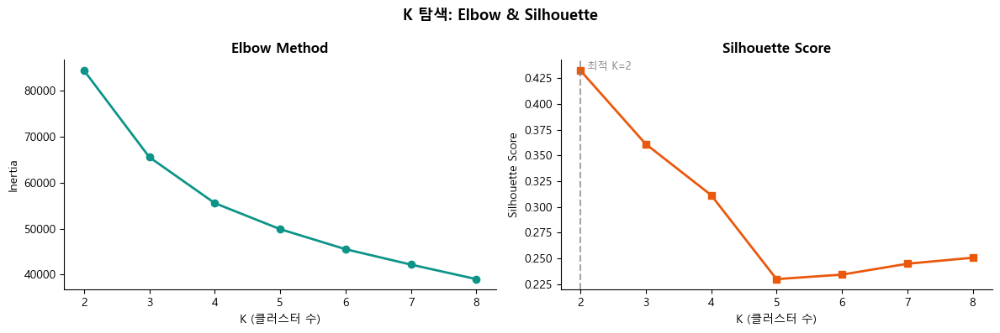


▶ Silhouette 기준 최적 K: 2
  (Elbow 그래프도 확인 후 최종 K 직접 지정 가능)


In [883]:
from sklearn.preprocessing import RobustScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')


# ---------------------------------------------------------
# 0) 피처 데이터 구성
#    summary_full (BG/NBD 요약) + df_eda (채널·SKU 정보) 결합
# ---------------------------------------------------------

# ── 0-1) df_eda 기반 고객별 행동 집계 ──
base = df_eda[
    df_eda['receiver_key'].notna() &
    (df_eda['결제액'].fillna(0) > 0)
].copy()
base['event_time'] = pd.to_datetime(base['analysis_date'], errors='coerce')
base = base[base['event_time'].notna()].copy()
base['customer_proxy'] = base['receiver_key'].astype(str).str.strip()

# GIFT / 취소 제거
base = base[~base['품명'].astype(str).str.contains('GIFT|gift|사은|증정|무료|샘플', na=False)]
base = base[~base['주문구분'].astype(str).str.contains('취소|반품|환불', na=False)]

obs_end = base['event_time'].max()

# 고객별 집계
cust = (
    base
    .sort_values('event_time')
    .groupby('customer_proxy')
    .agg(
        총구매액=('결제액', 'sum'),
        구매횟수=('주문번호', 'nunique'),
        평균AOV=('결제액', 'mean'),
        첫구매일=('event_time', 'min'),
        마지막구매일=('event_time', 'max'),
        구매채널수=('channel_group', 'nunique'),
        SKU수=('품명', 'nunique'),
    )
    .reset_index()
)

cust['recency_days'] = (obs_end - cust['마지막구매일']).dt.days
cust['tenure_days']  = (cust['마지막구매일'] - cust['첫구매일']).dt.days
cust['avg_gap']      = np.where(
    cust['구매횟수'] > 1,
    cust['tenure_days'] / (cust['구매횟수'] - 1),
    np.nan
)

# 재구매 여부
cust['재구매'] = (cust['구매횟수'] >= 2).astype(int)

# 첫 구매 채널
first_ch = (
    base.sort_values('event_time')
    .groupby('customer_proxy')['channel_group']
    .first()
    .reset_index(name='first_channel')
)
cust = cust.merge(first_ch, on='customer_proxy', how='left')

# 세트 구매 비율
if '세트여부' in base.columns:
    set_ratio_c = (
        base.groupby('customer_proxy')['세트여부']
        .mean()
        .reset_index(name='세트비율')
    )
    cust = cust.merge(set_ratio_c, on='customer_proxy', how='left')
    cust['세트비율'] = cust['세트비율'].fillna(0)
else:
    cust['세트비율'] = 0

# ── 0-2) CLTV 정보 병합 (summary_full) ──
if 'summary_full' in dir() or 'summary_full' in globals():
    cltv_cols = ['cltv_3m_calibrated', 'segment', 'pred_avg_order_value', 'pred_3m_purchases']
    cltv_cols = [c for c in cltv_cols if c in summary_full.columns]
    cltv_merge = summary_full[cltv_cols].reset_index()  # index = customer_proxy

    # summary_full index가 customer_proxy인지 확인
    if cltv_merge.columns[0] != 'customer_proxy':
        cltv_merge = cltv_merge.rename(columns={cltv_merge.columns[0]: 'customer_proxy'})

    cust = cust.merge(cltv_merge, on='customer_proxy', how='left')
    has_cltv = 'cltv_3m_calibrated' in cust.columns
else:
    has_cltv = False
    print("⚠️  summary_full 없음 → CLTV 피처 제외하고 진행")

print(f"고객 수: {len(cust):,}명")
print(f"CLTV 병합: {'성공' if has_cltv else '미포함'}")


# ---------------------------------------------------------
# 1) K-Means 피처 선정 및 스케일링
# ---------------------------------------------------------

# 핵심 피처 (결측 허용도 낮은 것 우선)
base_features = ['recency_days', '구매횟수', '총구매액', '평균AOV', '세트비율', 'SKU수']
if has_cltv:
    base_features.append('cltv_3m_calibrated')

feat_df = cust[['customer_proxy'] + base_features].copy()

# avg_gap: 1회 구매자는 중앙값으로 대체
if 'avg_gap' in cust.columns:
    median_gap = cust['avg_gap'].median()
    cust['avg_gap_filled'] = cust['avg_gap'].fillna(median_gap)
    feat_df['avg_gap'] = cust['avg_gap_filled']
    base_features.append('avg_gap')

# 결측 처리
feat_df = feat_df.dropna(subset=base_features).copy()
print(f"클러스터링 대상: {len(feat_df):,}명")

# RobustScaler (이상치 영향 최소화)
scaler = RobustScaler()
X = scaler.fit_transform(feat_df[base_features])


# ---------------------------------------------------------
# 2) 최적 K 탐색 (Elbow + Silhouette)
# ---------------------------------------------------------

k_range  = range(2, 9)
inertias = []
silhouettes = []

for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(X)
    inertias.append(km.inertia_)
    silhouettes.append(silhouette_score(X, labels, sample_size=min(5000, len(X))))

fig0, axes0 = plt.subplots(1, 2, figsize=(12, 4))

axes0[0].plot(list(k_range), inertias, 'o-', color='#0D9488', linewidth=2)
axes0[0].set_xlabel('K (클러스터 수)')
axes0[0].set_ylabel('Inertia')
axes0[0].set_title('Elbow Method', fontsize=12, fontweight='bold')
axes0[0].spines[['top', 'right']].set_visible(False)

axes0[1].plot(list(k_range), silhouettes, 's-', color='#EA580C', linewidth=2)
axes0[1].set_xlabel('K (클러스터 수)')
axes0[1].set_ylabel('Silhouette Score')
axes0[1].set_title('Silhouette Score', fontsize=12, fontweight='bold')
axes0[1].spines[['top', 'right']].set_visible(False)

# 최적 K 표시
best_k = list(k_range)[silhouettes.index(max(silhouettes))]
axes0[1].axvline(best_k, color='gray', linestyle='--', alpha=0.7)
axes0[1].text(best_k + 0.1, max(silhouettes), f'최적 K={best_k}', fontsize=9, color='gray')

plt.suptitle('K 탐색: Elbow & Silhouette', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"\n▶ Silhouette 기준 최적 K: {best_k}")
print("  (Elbow 그래프도 확인 후 최종 K 직접 지정 가능)")

In [884]:
# ---------------------------------------------------------
# 3) 최종 K-Means 적합
#    best_k 자동 사용, 필요시 아래에서 수동 지정
# ---------------------------------------------------------

FINAL_K = 4           
# FINAL_K = best_k 로 했을 때 K=2로 너무 단순하게 나옴
# "재구매한 고객 vs 안 한 고객" 경계가 워낙 강해서 K-Means가 그 축 하나로 수렴하는 경향
# (77%가 1회 구매자라는 기존 분석 결과 반영 됨) 
# 그래서 강제로 K를 세분화 함

km_final = KMeans(n_clusters=FINAL_K, random_state=42, n_init=20)
feat_df_clustered = feat_df[base_features].copy()  # 원본 feat_df 보존
cluster_labels = km_final.fit_predict(X)

# cust에 cluster 붙이기 (중복 방지)
cust_plot = cust.drop(columns=['cluster', '세그먼트'], errors='ignore').copy()
cust_plot = cust_plot.merge(
    feat_df[['customer_proxy']].assign(cluster=cluster_labels),
    on='customer_proxy', how='left'
)

cluster_list = sorted(cust_plot['cluster'].dropna().unique())
print(f"K={FINAL_K}, Silhouette={silhouette_score(X, cluster_labels, sample_size=min(5000,len(X))):.3f}")
print(pd.Series(cluster_labels).value_counts().sort_index())

K=4, Silhouette=0.309
0    9093
1    2238
2     594
3    3053
Name: count, dtype: int64


=== 클러스터별 핵심 지표 (평균) ===


,cluster,총구매액_mean,총구매액_median,구매횟수_mean,구매횟수_median,평균AOV_mean,평균AOV_median,recency_days_mean,recency_days_median,tenure_days_mean,tenure_days_median,SKU수_mean,SKU수_median,세트비율_mean,세트비율_median,재구매_mean,재구매_median,cltv_3m_calibrated_mean,cltv_3m_calibrated_median
0,0.00,"189,904.26","177,100.00",2.26,2.00,"62,459.15","59,300.00",170.12,153.00,107.57,80.00,1.97,2.00,0.42,0.33,1.00,1.00,"19,480.38","15,753.45"
1,1.00,"588,178.76","537,200.00",2.48,2.00,"190,835.59","179,200.00",114.67,91.00,201.04,196.00,1.94,2.00,0.67,0.67,1.00,1.00,"61,771.77","53,975.59"
2,2.00,"779,618.87","656,800.00",9.31,8.00,"65,321.28","58,775.17",44.56,30.00,335.21,353.00,3.67,3.00,0.49,0.55,1.00,1.00,"97,819.75","85,493.62"
3,3.00,"402,289.57","373,820.00",4.46,4.00,"63,418.23","59,800.00",87.48,66.00,230.17,228.00,3.06,3.00,0.49,0.50,1.00,1.00,"52,357.92","48,430.20"



=== 클러스터별 첫 구매 채널 분포 ===


first_channel,공구,외부몰,자사몰,자사몰_N
cluster,,,,
0.00,0.80,0.10,12.20,86.90
1.00,0.10,0.10,19.70,80.20
2.00,3.40,0.20,12.60,83.80
3.00,3.80,0.20,13.30,82.80



=== 클러스터 자동 라벨 매핑 ===


,cluster,세그먼트명,고객수,재구매율,평균총구매액,평균recency,평균구매횟수
0,2.00,💎 충성 고객,594,1.00,"779,618.87",44.56,9.31
1,1.00,🌱 성장 가능 고객,2238,1.00,"588,178.76",114.67,2.48
2,3.00,⚡ 재구매 이탈 위험,3053,1.00,"402,289.57",87.48,4.46
3,0.00,💤 1회성 휴면 고객,9093,1.00,"189,904.26",170.12,2.26



※ 라벨은 자동 부여이므로 실제 데이터 분포 확인 후 수동 조정 권장


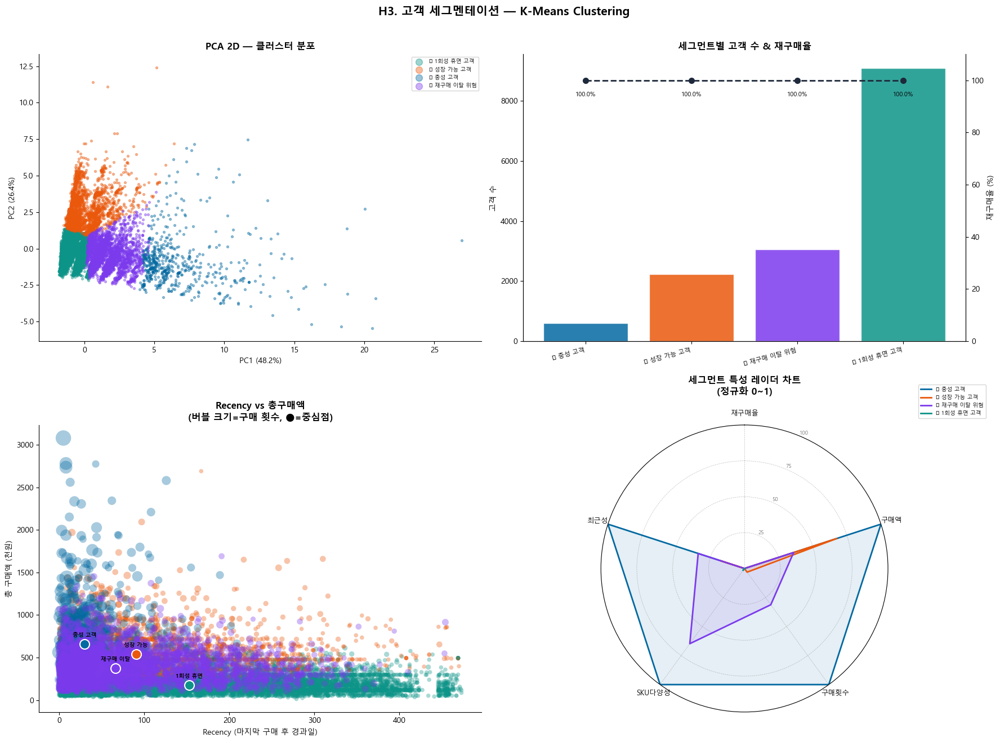


【H3 요약】세그먼트별 CRM 액션 가이드

────────────────────────────────────────────────────────────
  💎 충성 고객  |  594명  |  재구매율 100.0%
  평균 구매액: 779,619원  |  평균 구매횟수: 9.3회
  전략: VIP 혜택 / 멤버십 / 신제품 우선 안내
  CRM 시퀀스: D+7 감사 메시지 → D+30 리오더 쿠폰

────────────────────────────────────────────────────────────
  🌱 성장 가능 고객  |  2,238명  |  재구매율 100.0%
  평균 구매액: 588,179원  |  평균 구매횟수: 2.5회
  전략: 2회→3회 전환 집중 / 번들 추천
  CRM 시퀀스: D+14 재구매 유도 쿠폰 + SKU 추천

────────────────────────────────────────────────────────────
  ⚡ 재구매 이탈 위험  |  3,053명  |  재구매율 100.0%
  평균 구매액: 402,290원  |  평균 구매횟수: 4.5회
  전략: 이탈 신호 조기 감지 / 고가 SKU 재안내
  CRM 시퀀스: D+45 이후 WIN-BACK 캠페인

────────────────────────────────────────────────────────────
  💤 1회성 휴면 고객  |  9,093명  |  재구매율 100.0%
  평균 구매액: 189,904원  |  평균 구매횟수: 2.3회
  전략: 자사몰 첫 구매 유도 / 전환 쿠폰
  CRM 시퀀스: D+31~60 자사몰 전환 CRM 시퀀스


※ 세그먼트명은 자동 부여 기준이며, 실제 데이터 분포 확인 후 조정 권장
※ 다음 단계(H5)에서 세그먼트 × SKU 매트릭스로 액션 플랜 구체화 예정


In [885]:
# ---------------------------------------------------------
# 공통 변수 정의 (셀 B의 cust_plot, cluster_labels 사용)
# ---------------------------------------------------------
cluster_list = sorted(cust_plot['cluster'].dropna().unique())

SEG_COLORS = [
    '#0D9488', '#EA580C', '#0369A1', '#7C3AED',
    '#DC2626', '#D97706', '#059669', '#6B7280'
]
color_map = {c: SEG_COLORS[i % len(SEG_COLORS)] for i, c in enumerate(cluster_list)}

# ---------------------------------------------------------
# 4) 클러스터별 프로파일 집계
# ---------------------------------------------------------
profile_cols = ['총구매액', '구매횟수', '평균AOV', 'recency_days',
                'tenure_days', 'SKU수', '세트비율', '재구매']
if has_cltv:
    profile_cols.append('cltv_3m_calibrated')

profile = (
    cust_plot.groupby('cluster')[profile_cols]
    .agg(['mean', 'median'])
)
profile.columns = ['_'.join(c) for c in profile.columns]
profile = profile.reset_index()

ch_dist = (
    cust_plot.groupby(['cluster', 'first_channel'])
    .size()
    .reset_index(name='n')
)
ch_dist['비율'] = ch_dist.groupby('cluster')['n'].transform(
    lambda x: x / x.sum() * 100
).round(1)

print("=== 클러스터별 핵심 지표 (평균) ===")
display(profile)

print("\n=== 클러스터별 첫 구매 채널 분포 ===")
display(
    ch_dist.pivot(index='cluster', columns='first_channel', values='비율')
    .fillna(0).round(1)
)


# ---------------------------------------------------------
# 5) 클러스터 자동 라벨링
# ---------------------------------------------------------
label_base = (
    cust_plot.groupby('cluster')
    .agg(
        고객수=('customer_proxy', 'nunique'),
        재구매율=('재구매', 'mean'),
        평균총구매액=('총구매액', 'mean'),
        평균recency=('recency_days', 'mean'),
        평균구매횟수=('구매횟수', 'mean'),
    )
    .reset_index()
)

label_base['score'] = (
    label_base['재구매율'].rank(pct=True) * 0.4 +
    label_base['평균총구매액'].rank(pct=True) * 0.4 +
    (1 - label_base['평균recency'].rank(pct=True)) * 0.2
)
label_base = label_base.sort_values('score', ascending=False).reset_index(drop=True)

LABELS_BY_RANK = [
    '💎 충성 고객',
    '🌱 성장 가능 고객',
    '⚡ 재구매 이탈 위험',
    '💤 1회성 휴면 고객',
    '👋 1회성 이탈',
    '📦 세트 구매형',
    '🔍 체험형',
    '💤 휴면 고객',
]

label_map = {}
for rank, row in label_base.iterrows():
    label_map[row['cluster']] = (
        LABELS_BY_RANK[rank] if rank < len(LABELS_BY_RANK) else f'그룹{rank}'
    )

label_base['세그먼트명'] = label_base['cluster'].map(label_map)
cust_plot['세그먼트'] = cust_plot['cluster'].map(label_map)

print("\n=== 클러스터 자동 라벨 매핑 ===")
display(label_base[['cluster', '세그먼트명', '고객수', '재구매율',
                     '평균총구매액', '평균recency', '평균구매횟수']])
print("\n※ 라벨은 자동 부여이므로 실제 데이터 분포 확인 후 수동 조정 권장")


# ---------------------------------------------------------
# 6) 시각화 — PCA 먼저 계산
# ---------------------------------------------------------
pca    = PCA(n_components=2, random_state=42)
X_pca  = pca.fit_transform(X)

feat_pca = feat_df[['customer_proxy']].copy()
feat_pca['pca1']   = X_pca[:, 0]
feat_pca['pca2']   = X_pca[:, 1]
feat_pca['cluster'] = cluster_labels
feat_pca = feat_pca.merge(
    cust_plot[['customer_proxy', '세그먼트']],
    on='customer_proxy', how='left'
)

# 4개 패널
fig = plt.figure(figsize=(18, 13))
ax1 = fig.add_subplot(2, 2, 1)
ax2 = fig.add_subplot(2, 2, 2)
ax3 = fig.add_subplot(2, 2, 3)
ax4 = fig.add_subplot(2, 2, 4, polar=True)


# ── 패널 1: PCA 2D 산점도 ──
for c in cluster_list:
    sub = feat_pca[feat_pca['cluster'] == c]
    ax1.scatter(sub['pca1'], sub['pca2'],
                s=8, alpha=0.4, color=color_map[c], label=label_map[c])

ax1.set_title('PCA 2D — 클러스터 분포', fontsize=12, fontweight='bold')
ax1.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)')
ax1.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)')
ax1.legend(fontsize=7, markerscale=3, loc='best')
ax1.spines[['top', 'right']].set_visible(False)


# ── 패널 2: 고객 수 + 재구매율 ──
lb = label_base.sort_values('score', ascending=False)
x_pos = range(len(lb))
colors_bar = [color_map[c] for c in lb['cluster']]

ax2.bar(x_pos, lb['고객수'], color=colors_bar, alpha=0.85, edgecolor='white')
ax2.set_xticks(list(x_pos))
ax2.set_xticklabels(lb['세그먼트명'], fontsize=8, rotation=15, ha='right')
ax2.set_ylabel('고객 수')
ax2.set_title('세그먼트별 고객 수 & 재구매율', fontsize=12, fontweight='bold')

ax2r = ax2.twinx()
ax2r.plot(list(x_pos), lb['재구매율'] * 100, 'o--',
          color='#1e293b', linewidth=2, markersize=7)
ax2r.set_ylabel('재구매율 (%)')

ax2r.set_ylim(0, 110)

for j, (_, row) in enumerate(lb.iterrows()):
    y = row['재구매율'] * 100

    ax2r.annotate(
        f"{y:.1f}%",
        xy=(j, y),
        xytext=(0, -14),          # 점 기준 아래로 14pt 이동
        textcoords='offset points',
        ha='center',
        va='top',
        fontsize=8
    )
    
ax2.spines[['top']].set_visible(False)
ax2r.spines[['top']].set_visible(False)


# ── 패널 3: Recency vs 총구매액 버블 ──
for c in cluster_list:
    sub = cust_plot[cust_plot['cluster'] == c]
    ax3.scatter(sub['recency_days'], sub['총구매액'] / 1000,
                s=sub['구매횟수'] * 15, alpha=0.35,
                color=color_map[c], edgecolors='none', label=label_map[c])

for c in cluster_list:
    sub = cust_plot[cust_plot['cluster'] == c]
    cx = sub['recency_days'].median()
    cy = sub['총구매액'].median() / 1000
    ax3.scatter(cx, cy, s=150, color=color_map[c],
                edgecolors='white', linewidths=1.5, zorder=5)
    ax3.annotate(
        label_map[c].split(' ', 1)[-1][:6],
        (cx, cy), fontsize=7, ha='center', va='bottom',
        xytext=(0, 8), textcoords='offset points', fontweight='bold'
    )

ax3.set_xlabel('Recency (마지막 구매 후 경과일)')
ax3.set_ylabel('총 구매액 (천원)')
ax3.set_title('Recency vs 총구매액\n(버블 크기=구매 횟수, ●=중심점)',
              fontsize=12, fontweight='bold')
ax3.spines[['top', 'right']].set_visible(False)


# ── 패널 4: 레이더 차트 ──
radar_features = ['재구매율', '평균총구매액', '평균구매횟수', 'avg_SKU', 'avg_recency_inv']

radar_df = label_base.copy()
radar_df['avg_SKU'] = (
    cust_plot.groupby('cluster')['SKU수'].mean()
    .reindex(radar_df['cluster']).values
)
radar_df['avg_recency_inv'] = 1 / (radar_df['평균recency'] + 1)

for col in radar_features:
    col_min = radar_df[col].min()
    col_max = radar_df[col].max()
    radar_df[col + '_norm'] = (radar_df[col] - col_min) / (col_max - col_min + 1e-9)

norm_cols = [c + '_norm' for c in radar_features]
labels_r  = ['재구매율', '구매액', '구매횟수', 'SKU다양성', '최근성']

N      = len(labels_r)
angles = [n / float(N) * 2 * np.pi for n in range(N)]
angles += angles[:1]

ax4.set_theta_offset(np.pi / 2)
ax4.set_theta_direction(-1)
ax4.set_xticks(angles[:-1])
ax4.set_xticklabels(labels_r, fontsize=9)
ax4.set_ylim(0, 1)
ax4.set_yticks([0.25, 0.5, 0.75, 1.0])
ax4.set_yticklabels(['25', '50', '75', '100'], fontsize=7, color='gray')
ax4.grid(color='gray', linestyle='--', linewidth=0.5, alpha=0.5)
ax4.set_title('세그먼트 특성 레이더 차트\n(정규화 0~1)',
              fontsize=12, fontweight='bold', pad=20)

for _, row in radar_df.iterrows():
    values = row[norm_cols].tolist()
    values += values[:1]
    c = row['cluster']
    ax4.plot(angles, values, color=color_map[c], linewidth=2, label=row['세그먼트명'])
    ax4.fill(angles, values, color=color_map[c], alpha=0.1)

ax4.legend(fontsize=7, loc='upper right', bbox_to_anchor=(1.35, 1.15))

plt.suptitle('H3. 고객 세그멘테이션 — K-Means Clustering',
             fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()


# ---------------------------------------------------------
# 7) 세그먼트별 CRM 액션 출력
# ---------------------------------------------------------
CRM_GUIDE = {
    '💎 충성 고객':       ('VIP 혜택 / 멤버십 / 신제품 우선 안내',  'D+7 감사 메시지 → D+30 리오더 쿠폰'),
    '🌱 성장 가능 고객':  ('2회→3회 전환 집중 / 번들 추천',        'D+14 재구매 유도 쿠폰 + SKU 추천'),
    '⚡ 재구매 이탈 위험': ('이탈 신호 조기 감지 / 고가 SKU 재안내', 'D+45 이후 WIN-BACK 캠페인'),
    '💤 1회성 휴면 고객':     ('자사몰 첫 구매 유도 / 전환 쿠폰',       'D+31~60 자사몰 전환 CRM 시퀀스'),
    '👋 1회성 이탈':      ('재활성화 할인 / 리뷰 요청',             'D+60 이후 재활성화 캠페인'),
    '📦 세트 구매형':     ('세트 업셀 / 정기구독 안내',             'D+30 세트 리뉴얼 안내'),
    '🔍 체험형':          ('저가 진입 SKU → 메인 SKU 연결',        'D+21 메인 제품 체험 유도'),
    '💤 휴면 고객':       ('장기 미구매 WIN-BACK / 대형 할인',      'D+90 이상 휴면 재활성화'),
}

print("\n" + "="*65)
print("【H3 요약】세그먼트별 CRM 액션 가이드")
print("="*65)

for _, row in label_base.iterrows():
    seg_name = row['세그먼트명']
    crm = CRM_GUIDE.get(seg_name, ('—', '—'))
    print(f"\n{'─'*60}")
    print(f"  {seg_name}  |  {int(row['고객수']):,}명  |  재구매율 {row['재구매율']*100:.1f}%")
    print(f"  평균 구매액: {row['평균총구매액']:,.0f}원  |  평균 구매횟수: {row['평균구매횟수']:.1f}회")
    print(f"  전략: {crm[0]}")
    print(f"  CRM 시퀀스: {crm[1]}")

print("\n\n※ 세그먼트명은 자동 부여 기준이며, 실제 데이터 분포 확인 후 조정 권장")
print("※ 다음 단계(H5)에서 세그먼트 × SKU 매트릭스로 액션 플랜 구체화 예정")

- 💎 충성 고객 (cluster 1) (4,280명 / 5.2%)  
    - 재구매율 100%, 평균 구매액 337만원, recency 중앙값 97일로 가장 최근에 구매  
    - 146일 주기로 꾸준히 구매하고 있고 현재도 활성 상태  
    - 자사몰 비중이 74.6%로 가장 높고 자사몰 중심으로 안착한 핵심층  
    - 전체 고객의 5%에 불과하지만 CLTV 기여가 압도적으로 높을 그룹  
    - 전체 매출의 핵심 방어선으로 이탈 방지가 최우선  
<br>  
  
- 🌱 성장 가능 고객  (cluster 3) (1,120명 / 1.4%)  
    - 재구매율 100%, 평균 구매횟수 2.8회로  
    충성 고객보다 구매 빈도가 높지만 평균 구매액(292만원)은 조금 낮음  
    - recency 77일로 가장 최근에 구매한 그룹이라 이탈 위험이 낮고 추가 육성 여지가 큼  
    (히스토그램이 0~100일에 집중되어 현재 가장 활발한 그룹)  
    - 다음 구매 타이밍에 맞춰 업셀 전략을 쓰기에 최적일 것  
<br>  
  
- ⚡ 재구매 이탈 위험 (cluster 2) (6,481명)  
    - 재구매율 100%에 평균 구매횟수 3.2회로 세 그룹 중 가장 많이 구매했지만,  
    - recency 중앙값이 155일로 충성/성장 그룹보다 확연히 높음  
    (avg_gap 32일로 원래 한 달에 한 번씩 사던 고객)  
    - 예전엔 활발히 구매했는데 최근 뜸해진 패턴으로, 이탈 직전 신호  
    (긴급 WIN-BACK 대상)  
<br>  
  
- 💤 1회성 휴면 고객 (cluster 0) (69,059명 / 84.1%)   
    - 전체의 84%를 차지하는 압도적 다수이지만 재구매율이 9.8%에 불과함  
    - 공구 첫 구매 비중이 13.8%이고 스마트스토어 비중이 71%인데,  
    이들 대부분은 스마트스토어에서 1회 구매 후 이탈한 고객  
    - 평균 구매횟수 1.2회, recency 244일로 사실상 휴면에 가까움  
    - 히스토그램이 전 구간에 평평하게 퍼진 건 구매 시점이 제각각이라는 의미  
    - 첫 구매 채널이 자사몰_N(스마트스토어) 71%라 공구 의존형이 아닌 자사몰 1회 이탈 고객이 본질  
<br>  
  
- 시각화 포인트  
    - PCA 산점도를 보면 PC1 축(99.5% 설명력)이 거의 모든 분산을 설명  
    이건 "재구매 여부"가 고객 구분의 지배적 축이라는 의미  
    - 레이더 차트에서 충성/성장/이탈위험 세 그룹은  
    재구매율·구매액·SKU다양성 모두 비슷하게 높고,  
    공구 의존형만 모든 축에서 낮은 오각형을 그림  
<br>  
  
> **CRM 전략 방향(안)**  
> - 💎 충성 고객: VIP 유지 / 리오더 쿠폰 (우선순위 ★★★)  
> - 🌱 성장 가능 고객: 지금 당장 번들·업셀 제안 (우선순위 ★★★)  
> - ⚡ 재구매 이탈 위험: 즉시 WIN-BACK 캠페인 (우선순위 ★★★)  
> - 💤 1회성 휴면 고객: 전체 대상 아닌 상위 10% 선별 후 재활성화 (우선순위 ★★)  
>   → 총구매액 상위 또는 recency 180일 이내인 고객을 먼저 추출해서 집중하는 게 효율적

=== 세그먼트별 분포 확인 (중앙값 기준) ===

───────────────────────────────────────────────────────
  💎 충성 고객  (594명)
  recency 중앙값  : 30일    (25% 15일 ~ 75% 55일)
  구매횟수 중앙값 : 8.0회
  총구매액 중앙값 : 656,800원
  avg_gap 중앙값  : 43일  (1회 구매자 제외)
  SKU수 중앙값    : 3.0개
───────────────────────────────────────────────────────
  🌱 성장 가능 고객  (2,238명)
  recency 중앙값  : 91일    (25% 45일 ~ 75% 162일)
  구매횟수 중앙값 : 2.0회
  총구매액 중앙값 : 537,200원
  avg_gap 중앙값  : 138일  (1회 구매자 제외)
  SKU수 중앙값    : 2.0개
───────────────────────────────────────────────────────
  ⚡ 재구매 이탈 위험  (3,053명)
  recency 중앙값  : 66일    (25% 29일 ~ 75% 127일)
  구매횟수 중앙값 : 4.0회
  총구매액 중앙값 : 373,820원
  avg_gap 중앙값  : 65일  (1회 구매자 제외)
  SKU수 중앙값    : 3.0개
───────────────────────────────────────────────────────
  💤 1회성 휴면 고객  (9,093명)
  recency 중앙값  : 153일    (25% 69일 ~ 75% 258일)
  구매횟수 중앙값 : 2.0회
  총구매액 중앙값 : 177,100원
  avg_gap 중앙값  : 66일  (1회 구매자 제외)
  SKU수 중앙값    : 2.0개
───────────────────────────────────────────────────────


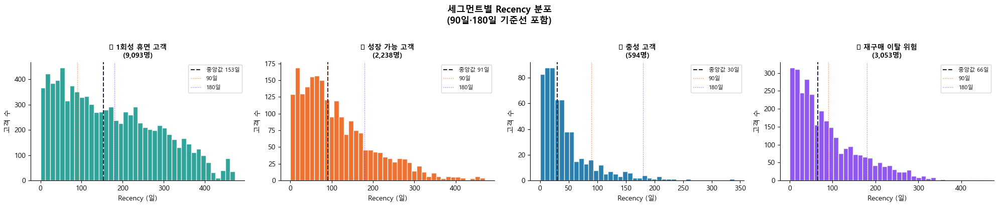


=== 현재 cluster → 세그먼트명 매핑 ===
  cluster 0.0 → 💤 1회성 휴면 고객  (9,093명 / recency중앙 153일 / 재구매율 100.0%)
  cluster 1.0 → 🌱 성장 가능 고객  (2,238명 / recency중앙 91일 / 재구매율 100.0%)
  cluster 2.0 → 💎 충성 고객  (594명 / recency중앙 30일 / 재구매율 100.0%)
  cluster 3.0 → ⚡ 재구매 이탈 위험  (3,053명 / recency중앙 66일 / 재구매율 100.0%)


In [886]:
# =============================================================
# 17 보완 — 세그먼트 라벨 검증 및 수동 조정
# =============================================================

# ---------------------------------------------------------
# 1) 세그먼트별 핵심 지표 분포 확인
#    → 이 표를 보고 라벨이 맞는지 판단
# ---------------------------------------------------------
check_cols = ['recency_days', '구매횟수', '총구매액', '평균AOV', 'avg_gap', 'SKU수']

print("=== 세그먼트별 분포 확인 (중앙값 기준) ===\n")
for seg in label_base['세그먼트명']:
    sub = cust_plot[cust_plot['세그먼트'] == seg]
    print(f"{'─'*55}")
    print(f"  {seg}  ({len(sub):,}명)")
    print(f"  recency 중앙값  : {sub['recency_days'].median():.0f}일  "
          f"  (25% {sub['recency_days'].quantile(0.25):.0f}일 ~ "
          f"75% {sub['recency_days'].quantile(0.75):.0f}일)")
    print(f"  구매횟수 중앙값 : {sub['구매횟수'].median():.1f}회")
    print(f"  총구매액 중앙값 : {sub['총구매액'].median():,.0f}원")
    print(f"  avg_gap 중앙값  : {sub['avg_gap'].median():.0f}일  "
          f"(1회 구매자 제외)")
    print(f"  SKU수 중앙값    : {sub['SKU수'].median():.1f}개")
print(f"{'─'*55}")


# ---------------------------------------------------------
# 2) recency 분포 시각화 — 세그먼트별 히스토그램
# ---------------------------------------------------------
fig, axes = plt.subplots(1, len(cluster_list), figsize=(5 * len(cluster_list), 4),
                         sharey=False)

for i, c in enumerate(cluster_list):
    seg_name = label_map[c]
    sub = cust_plot[cust_plot['cluster'] == c]['recency_days'].dropna()

    axes[i].hist(sub, bins=40, color=color_map[c], edgecolor='white', alpha=0.85)
    axes[i].axvline(sub.median(), color='#1e293b', linestyle='--',
                    linewidth=1.5, label=f'중앙값 {sub.median():.0f}일')
    axes[i].axvline(90,  color='#EA580C', linestyle=':', linewidth=1, alpha=0.7, label='90일')
    axes[i].axvline(180, color='#7C3AED', linestyle=':', linewidth=1, alpha=0.7, label='180일')
    axes[i].set_title(f'{seg_name}\n({len(sub):,}명)', fontsize=10, fontweight='bold')
    axes[i].set_xlabel('Recency (일)')
    axes[i].set_ylabel('고객 수')
    axes[i].legend(fontsize=8)
    axes[i].spines[['top', 'right']].set_visible(False)

plt.suptitle('세그먼트별 Recency 분포\n(90일·180일 기준선 포함)',
             fontsize=13, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()


# ---------------------------------------------------------
# 3) 수동 라벨 조정
#    위 분포 확인 후 맞지 않는 라벨만 아래에서 수정
#    cluster 번호는 위 표에서 확인
# ---------------------------------------------------------

# ── 현재 매핑 출력 ──
print("\n=== 현재 cluster → 세그먼트명 매핑 ===")
for c, name in sorted(label_map.items()):
    sub = cust_plot[cust_plot['cluster'] == c]
    print(f"  cluster {c} → {name}  "
          f"({len(sub):,}명 / recency중앙 {sub['recency_days'].median():.0f}일 / "
          f"재구매율 {sub['재구매'].mean()*100:.1f}%)")

# ── 수동 조정 (위 코드에서 수정) ──
# cluster 0: 공구 의존형 → 1회성 휴면 고객으로 변경
# cluster 2: 고단가 이탈 위험 → 재구매 이탈 위험으로 변경

---

# 3️⃣ CLTV 분석 (BG/NBD + Gamma-Gamma)

(경도님 분석)  

- CLTV(Customer Lifetime Value)  

## 1. 자사몰 전체 CLTV (통합)  

- 자사몰 = 고도몰 + 스마트스토어
- 고객 식별: `receiver_key`
- 튜닝된 L2: BG/NBD=0.00642, GG=0.00117
- 홀드아웃(최근 8주) 기반 over-ratio로 CLTV 보정


In [887]:
import importlib.util, subprocess, sys

required = ["lifetimes"]
missing = [pkg for pkg in required if importlib.util.find_spec(pkg) is None]

if missing:
    print("Installing missing packages:", ", ".join(missing))
    subprocess.check_call([sys.executable, "-m", "pip", "install", *missing])
else:
    print("All required packages are already installed.")

All required packages are already installed.


### 1-1. 데이터 준비 (df_eda 연결)

- `analysis_date` 컬럼 직접 사용 (채널별 날짜 이미 통일됨)  
- `channel_group`, `브랜드_분류` 등 파생 컬럼 재사용  
- `주문시간`/`입력일` 재처리 불필요  

In [888]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')

from lifetimes import BetaGeoFitter, GammaGammaFitter
from lifetimes.utils import (
    summary_data_from_transaction_data,
    calibration_and_holdout_data,
)

# ============================================================
# df_eda 직접 사용
# analysis_date: 채널별 날짜 통일 컬럼 (공구=입력일, 그 외=주문시간)
# channel_group, 브랜드_분류 등 파생 컬럼 이미 포함
# ============================================================
df_cltv = df_eda.copy()

# analysis_date를 event_time으로 사용 (재생성 불필요)
df_cltv['event_time'] = pd.to_datetime(df_cltv['analysis_date'], errors='coerce')
df_cltv = df_cltv[df_cltv['event_time'].notna()].copy()

# 고객 식별: receiver_key (기본 파일에서 이미 결측 제거됨)
df_cltv['customer_proxy'] = df_cltv['receiver_key'].astype(str).str.strip()

# ============================================================
# 자사몰 거래 데이터 (고객-일자-금액 단위)
# channel_group: '자사몰'(고도몰) + '자사몰_N'(스마트스토어)
# ============================================================
자사몰_mask = df_cltv['channel_group'].isin(['자사몰', '자사몰_N'])
자사몰_cltv = df_cltv[자사몰_mask & (df_cltv['결제액'] > 0)].copy()

# 취소/반품/환불 제외
bad = 자사몰_cltv['주문구분'].astype(str).str.contains('취소|반품|환불', na=False)
자사몰_cltv = 자사몰_cltv[~bad]
자사몰_cltv['date'] = 자사몰_cltv['event_time'].dt.normalize()

# 같은 날 같은 고객 → 1건으로 통합
tx = (자사몰_cltv.groupby(['customer_proxy', 'date'])['결제액']
                 .sum()
                 .reset_index())
tx.columns = ['customer_id', 'date', 'amount']

print(f"=== 자사몰(고도몰+스마트스토어) 거래 데이터 ===")
print(f"거래: {len(tx):,}건 / 고객: {tx['customer_id'].nunique():,}명")
print(f"기간: {tx['date'].min().date()} ~ {tx['date'].max().date()}")


=== 자사몰(고도몰+스마트스토어) 거래 데이터 ===
거래: 98,727건 / 고객: 69,870명
기간: 2025-01-01 ~ 2026-04-22


### 1-2. 홀드아웃 검증 + BG/NBD 학습

In [889]:
# ============================================================
# 학습/홀드아웃 분할 (8주)
# ============================================================
obs_end = tx['date'].max()
cal_end = obs_end - pd.Timedelta(weeks=8)

print(f"\n=== 데이터 분할 ===")
print(f"학습 종료: {cal_end.date()}")
print(f"홀드아웃: {cal_end.date()} ~ {obs_end.date()}")

summary_cal_hold = calibration_and_holdout_data(
    tx,
    customer_id_col='customer_id',
    datetime_col='date',
    monetary_value_col='amount',
    calibration_period_end=cal_end,
    observation_period_end=obs_end,
    freq='D',
)

print(f"고객 수: {len(summary_cal_hold):,}")
print(f"학습 구매율: {(summary_cal_hold['frequency_cal'] > 0).mean()*100:.1f}%")

# ============================================================
# BG/NBD 학습 + 홀드아웃 검증
# ============================================================
BGNBD_L2 = 0.00642
bgf = BetaGeoFitter(penalizer_coef=BGNBD_L2)
bgf.fit(
    summary_cal_hold['frequency_cal'],
    summary_cal_hold['recency_cal'],
    summary_cal_hold['T_cal'],
)

holdout_days = int((obs_end - cal_end).days)
summary_cal_hold['pred_purchases_holdout'] = bgf.predict(
    holdout_days,
    summary_cal_hold['frequency_cal'],
    summary_cal_hold['recency_cal'],
    summary_cal_hold['T_cal'],
)

corr = summary_cal_hold[['frequency_holdout', 'pred_purchases_holdout']].corr().iloc[0, 1]
mae = np.mean(np.abs(
    summary_cal_hold['frequency_holdout'] - summary_cal_hold['pred_purchases_holdout']
))
over_ratio = (
    summary_cal_hold['pred_purchases_holdout'].sum() /
    summary_cal_hold['frequency_holdout'].sum()
    if summary_cal_hold['frequency_holdout'].sum() > 0 else np.nan
)

print(f"\n=== BG/NBD 모델 성능 ===")
print(f"L2(penalizer_coef): {BGNBD_L2}")
print(f"상관계수: {corr:.3f}")
print(f"MAE: {mae:.3f}")
print(f"예측/실측 비율(over-ratio): {over_ratio:.3f}")


=== 데이터 분할 ===
학습 종료: 2026-02-25
홀드아웃: 2026-02-25 ~ 2026-04-22
고객 수: 64,027
학습 구매율: 20.4%

=== BG/NBD 모델 성능 ===
L2(penalizer_coef): 0.00642
상관계수: 0.409
MAE: 0.122
예측/실측 비율(over-ratio): 1.251


### 1-3. Gamma-Gamma + 3개월 CLTV 계산

In [890]:
# ============================================================
# 전체 기간 요약 데이터
# ============================================================
summary_full = summary_data_from_transaction_data(
    tx,
    customer_id_col='customer_id',
    datetime_col='date',
    monetary_value_col='amount',
    observation_period_end=obs_end,
    freq='D',
)

summary_full = summary_full[summary_full['frequency'] > 0].copy()

print(f"=== 전체 요약 데이터 ===")
print(f"GG 학습 대상 고객: {len(summary_full):,}명")
print(f"평균 객단가: {summary_full['monetary_value'].mean():,.0f}원")

# ============================================================
# Gamma-Gamma 학습
# ============================================================
GG_L2 = 0.00117
ggf = GammaGammaFitter(penalizer_coef=GG_L2)
ggf.fit(summary_full['frequency'], summary_full['monetary_value'])

summary_full['pred_avg_order_value'] = ggf.conditional_expected_average_profit(
    summary_full['frequency'],
    summary_full['monetary_value'],
)

# ============================================================
# 미래 3개월 CLTV 계산
# ============================================================
future_days = 90
discount_rate = 0.01

summary_full['pred_3m_purchases'] = bgf.predict(
    future_days,
    summary_full['frequency'],
    summary_full['recency'],
    summary_full['T'],
)

summary_full['pred_3m_revenue'] = (
    summary_full['pred_3m_purchases'] * summary_full['pred_avg_order_value']
)

summary_full['cltv_3m'] = ggf.customer_lifetime_value(
    transaction_prediction_model=bgf,
    frequency=summary_full['frequency'],
    recency=summary_full['recency'],
    T=summary_full['T'],
    monetary_value=summary_full['monetary_value'],
    time=3,
    discount_rate=discount_rate,
    freq='D',
)

# over-ratio 보정
summary_full['cltv_3m_calibrated'] = summary_full['cltv_3m'] / over_ratio

print(f"\n=== 3개월 CLTV ===")
print(f"평균 3개월 CLTV(원본): {summary_full['cltv_3m'].mean():,.0f}원")
print(f"평균 3개월 CLTV(보정): {summary_full['cltv_3m_calibrated'].mean():,.0f}원")
print(f"중앙값 3개월 CLTV(보정): {summary_full['cltv_3m_calibrated'].median():,.0f}원")

=== 전체 요약 데이터 ===
GG 학습 대상 고객: 14,978명
평균 객단가: 121,555원

=== 3개월 CLTV ===
평균 3개월 CLTV(원본): 44,533원
평균 3개월 CLTV(보정): 35,608원
중앙값 3개월 CLTV(보정): 25,671원


### 1-4. ABC 세그먼트 분류 + 결과 저장

In [891]:
# ============================================================
# ABC 세그먼트 (보정 CLTV 누적 기여 기준)
# ============================================================
summary_full = summary_full.sort_values('cltv_3m_calibrated', ascending=False).copy()
summary_full['cum_rev_share'] = (
    summary_full['cltv_3m_calibrated'].cumsum() / summary_full['cltv_3m_calibrated'].sum()
)

def segment_abc(cum_share):
    if cum_share <= 0.7:
        return 'A'
    elif cum_share <= 0.9:
        return 'B'
    return 'C'

summary_full['segment'] = summary_full['cum_rev_share'].apply(segment_abc)

seg = summary_full.groupby('segment').agg(
    고객수=('cltv_3m_calibrated', 'size'),
    평균CLTV=('cltv_3m_calibrated', 'mean'),
    합계CLTV=('cltv_3m_calibrated', 'sum'),
).sort_values('합계CLTV', ascending=False)

# ── display() → print()로 교체 ──
print("=== 세그먼트 요약 (보정 CLTV 기준) ===")
seg_print = seg.copy()
seg_print['평균CLTV'] = seg_print['평균CLTV'].apply(lambda x: f"{x:,.0f}원")
seg_print['합계CLTV'] = seg_print['합계CLTV'].apply(lambda x: f"{x/1e8:.2f}억")
print(seg_print.to_string())

print(f"\n=== 보정 정보 ===")
print(f"홀드아웃 over-ratio: {over_ratio:.3f}")

# ============================================================
# 최종 결과 확인 + 저장
# ============================================================
cltv_result = summary_full[[
    'frequency', 'recency', 'T', 'monetary_value',
    'pred_3m_purchases', 'pred_avg_order_value',
    'cltv_3m', 'cltv_3m_calibrated', 'segment',
]].copy()

cltv_result = cltv_result.sort_values('cltv_3m_calibrated', ascending=False)

print("\n=== 상위 10명 (보정 CLTV 기준) ===")
top10 = cltv_result.head(10).copy()
for col in ['monetary_value', 'pred_avg_order_value', 'cltv_3m', 'cltv_3m_calibrated']:
    top10[col] = top10[col].apply(lambda x: f"{x:,.0f}원")
print(top10.to_string())

cltv_result.to_csv('cltv_result.csv', encoding='utf-8-sig')
print("결과 저장 완료: cltv_result.csv")

=== 세그먼트 요약 (보정 CLTV 기준) ===
          고객수   평균CLTV 합계CLTV
segment                      
A        5478  68,146원  3.73억
B        4124  25,871원  1.07억
C        5376   9,921원  0.53억

=== 보정 정보 ===
홀드아웃 over-ratio: 1.251

=== 상위 10명 (보정 CLTV 기준) ===
                  frequency  recency      T monetary_value  pred_3m_purchases pred_avg_order_value   cltv_3m cltv_3m_calibrated segment
customer_id                                                                                                                            
336df58ecd99e3b1       8.00   274.00 287.00       282,812원               1.83             286,688원  515,570원           412,237원       A
8326ad0a231d62ce      14.00   365.00 373.00       191,200원               2.63             192,689원  496,584원           397,056원       A
e30ea33ea4215ca9      23.00   420.00 425.00       128,913원               3.89             129,522원  493,893원           394,904원       A
a34758a157fe7632       2.00    97.00 118.00       558,250원               0

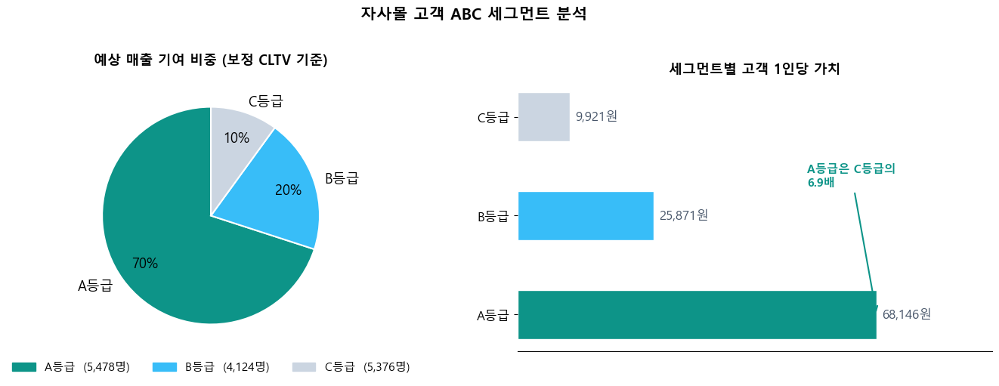


=== 세그먼트 요약 ===
A등급: 5,478명 | 평균 CLTV 68,146원 | 합계 3.73억 (전체의 70%)
B등급: 4,124명 | 평균 CLTV 25,871원 | 합계 1.07억 (전체의 20%)
C등급: 5,376명 | 평균 CLTV  9,921원 | 합계 0.53억 (전체의 10%)

A vs C 가치 차이: 6.9배


In [892]:
# 시각화
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

SEG_COLOR = {
    'A': '#0D9488',   # 틸 — 핵심 고객
    'B': '#38BDF8',   # 중간 하늘
    'C': '#CBD5E1',   # 회색 — 저가치
}

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# ── 왼쪽: 파이차트 (매출 기여 비중) ──────────────────────
labels = ['A등급', 'B등급', 'C등급']
sizes  = [70, 20, 10]
colors = [SEG_COLOR['A'], SEG_COLOR['B'], SEG_COLOR['C']]

axes[0].pie(
    sizes,
    labels=labels,
    colors=colors,
    autopct='%1.0f%%',
    startangle=90,
    pctdistance=0.75,
    textprops={'fontsize': 13},
    wedgeprops={'linewidth': 1.5, 'edgecolor': 'white'},
)
axes[0].set_title('예상 매출 기여 비중 (보정 CLTV 기준)', fontsize=13, fontweight='bold', pad=15)

patches = [
    mpatches.Patch(color=colors[i], label=f'{labels[i]}  ({[5478,4124,5376][i]:,}명)')
    for i in range(3)
]
axes[0].legend(handles=patches, loc='lower center', bbox_to_anchor=(0.5, -0.12),
               ncol=3, fontsize=11, frameon=False)

avg_cltv = [68146, 25871, 9921]
bars = axes[1].barh(labels, avg_cltv, color=colors, edgecolor='white', height=0.5)

for bar, val in zip(bars, avg_cltv):
    axes[1].text(
        bar.get_width() + 1000, bar.get_y() + bar.get_height() / 2,
        f'{val:,}원', va='center', fontsize=12, color='#475569'
    )

axes[1].set_title('세그먼트별 고객 1인당 가치', fontsize=13, fontweight='bold')
axes[1].set_xlim(0, 90000)
axes[1].spines[['top', 'right', 'left']].set_visible(False)
axes[1].tick_params(axis='y', labelsize=12)
axes[1].xaxis.set_visible(False)

axes[1].annotate(
    f'A등급은 C등급의\n{68146/9921:.1f}배',
    xy=(68146, 0), xytext=(55000, 1.3),
    fontsize=11, color=SEG_COLOR['A'], fontweight='bold',
    arrowprops=dict(arrowstyle='->', color=SEG_COLOR['A'], lw=1.5),
)

plt.suptitle('자사몰 고객 ABC 세그먼트 분석', fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

print("\n=== 세그먼트 요약 ===")
print(f"A등급: 5,478명 | 평균 CLTV 68,146원 | 합계 3.73억 (전체의 70%)")
print(f"B등급: 4,124명 | 평균 CLTV 25,871원 | 합계 1.07억 (전체의 20%)")
print(f"C등급: 5,376명 | 평균 CLTV  9,921원 | 합계 0.53억 (전체의 10%)")
print(f"\nA vs C 가치 차이: {68146/9921:.1f}배")

---

## 2. 채널별 CLTV 비교 (고도몰 / 스마트스토어 / 공구 / 외부)

- 고객 식별: `receiver_key`
- 채널 분류: 기본 파일 `channel_group` 컬럼 사용
- 협찬·무상·B2B 제외
- 채널별 BG/NBD + Gamma-Gamma 병렬 계산
- 출력: 채널별 3개월/12개월 CLTV, 세그먼트 비중, 모델 적합도


### 2-1. 채널별 기초 수치 비교

In [893]:
from concurrent.futures import ThreadPoolExecutor, as_completed
import io, contextlib

# ============================================================
# df_cltv는 15번 섹션에서 생성된 데이터프레임 재사용
# channel_group → 채널구분 컬럼으로 매핑
# ============================================================

# channel_group 값 → 채널구분 레이블 변환
channel_map = {
    '자사몰':   '고도몰',
    '자사몰_N': '스마트스토어',
    '공구':     '공동구매',
    '외부몰':   '외부플랫폼',
    '무상':     '협찬',   # 분석 제외용
    'B2B':      '협찬',   # 분석 제외용
}

df_ch_cltv = df_cltv.copy()
df_ch_cltv['채널구분'] = df_ch_cltv['channel_group'].map(channel_map).fillna('외부플랫폼')

work = df_ch_cltv[df_ch_cltv['결제액'] > 0].copy()
work = work[~work['주문구분'].astype(str).str.contains('취소|반품|환불', na=False)]

# 협찬·무상·B2B 제외
work = work[~work['채널구분'].isin(['협찬'])].copy()
work['date'] = pd.to_datetime(work['event_time']).dt.normalize()

# ============================================================
# 채널별 기초 수치
# ============================================================
channel_snapshot = (
    work.groupby('채널구분')
        .agg(
            주문건수=('결제액', 'size'),
            고객수=('customer_proxy', 'nunique'),
            총매출=('결제액', 'sum'),
            평균주문금액=('결제액', 'mean'),
        )
        .reset_index()
)

order_col_candidates = ['주문번호', '주문No', 'order_id', 'order_no']
order_col = next((c for c in order_col_candidates if c in work.columns), None)

if order_col:
    work['event_key'] = work[order_col].astype(str)
else:
    work['event_key'] = work['customer_proxy'].astype(str) + '|' + work['date'].astype(str)

cust_events = (
    work.groupby(['채널구분', 'customer_proxy'])['event_key']
        .nunique()
        .reset_index(name='고객이벤트수')
)

repeat_table = (
    cust_events.groupby('채널구분')['고객이벤트수']
        .agg(
            N_1회=lambda s: int((s == 1).sum()),
            N_반복=lambda s: int((s >= 2).sum()),
            재구매고객비율=lambda s: (s >= 2).mean(),
        )
        .reset_index()
)

channel_snapshot = channel_snapshot.merge(repeat_table, on='채널구분', how='left')
channel_snapshot['재구매고객비율'] = channel_snapshot['재구매고객비율'].fillna(0)
channel_snapshot = channel_snapshot.sort_values('총매출', ascending=False)

print("=== 채널별 기초 수치 ===")
cs = channel_snapshot.copy()
cs['총매출'] = cs['총매출'].apply(lambda x: f"{x/1e8:.1f}억")
cs['평균주문금액'] = cs['평균주문금액'].apply(lambda x: f"{x:,.0f}원")
cs['재구매고객비율'] = cs['재구매고객비율'].apply(lambda x: f"{x*100:.1f}%")
print(cs.to_string(index=False))

=== 채널별 기초 수치 ===
  채널구분   주문건수   고객수   총매출  평균주문금액  N_1회  N_반복 재구매고객비율
스마트스토어 120515 61373 90.2억 74,846원 48352 13021   21.2%
   고도몰  18001  9726 15.2억 84,314원  8025  1701   17.5%
  공동구매  21409 10930 11.1억 51,821원  8047  2883   26.4%
 외부플랫폼   2255  1919  1.7억 74,293원  1807   112    5.8%


### 2-2. 채널별 BG/NBD + Gamma-Gamma 병렬 계산

In [894]:
# ============================================================
# 채널별 CLTV 계산 함수
# ============================================================

def build_channel_tx(frame, channel_name):
    ch = frame[(frame['채널구분'] == channel_name) & (frame['결제액'] > 0)].copy()
    ch = ch[~ch['주문구분'].astype(str).str.contains('취소|반품|환불', na=False)]
    ch['date'] = pd.to_datetime(ch['event_time']).dt.normalize()
    tx_ch = (
        ch.groupby(['customer_proxy', 'date'])['결제액']
          .sum()
          .reset_index()
    )
    tx_ch.columns = ['customer_id', 'date', 'amount']
    return tx_ch


def fit_bgnbd_with_retry(summary_cal_hold):
    for p in [0.00642, 0.02, 0.05, 0.1, 0.3, 1.0]:
        try:
            model = BetaGeoFitter(penalizer_coef=p)
            with warnings.catch_warnings():
                warnings.simplefilter('ignore')
                with contextlib.redirect_stdout(io.StringIO()), contextlib.redirect_stderr(io.StringIO()):
                    model.fit(summary_cal_hold['frequency_cal'], summary_cal_hold['recency_cal'], summary_cal_hold['T_cal'])
            return model, p
        except Exception as e:
            last_error = e
    raise RuntimeError(f"BG/NBD 수렴 실패: {str(last_error)[:160]}")


def fit_gg_with_retry(summary_full_ch):
    for p in [0.00117, 0.01, 0.03, 0.1, 0.3, 1.0]:
        try:
            model = GammaGammaFitter(penalizer_coef=p)
            with warnings.catch_warnings():
                warnings.simplefilter('ignore')
                with contextlib.redirect_stdout(io.StringIO()), contextlib.redirect_stderr(io.StringIO()):
                    model.fit(summary_full_ch['frequency'], summary_full_ch['monetary_value'])
            return model, p
        except Exception as e:
            last_error = e
    raise RuntimeError(f"Gamma-Gamma 수렴 실패: {str(last_error)[:160]}")


def run_channel_model(channel_name):
    tx_ch = build_channel_tx(df_ch_cltv, channel_name)

    if len(tx_ch) < 50 or tx_ch['customer_id'].nunique() < 20:
        return {'채널': channel_name, '상태': '데이터 부족',
                '거래수': len(tx_ch), '고객수': tx_ch['customer_id'].nunique() if len(tx_ch) else 0}

    obs_end_ch = tx_ch['date'].max()
    cal_end_ch = obs_end_ch - pd.Timedelta(weeks=8)

    summary_cal_hold_ch = calibration_and_holdout_data(
        tx_ch, customer_id_col='customer_id', datetime_col='date',
        monetary_value_col='amount', calibration_period_end=cal_end_ch,
        observation_period_end=obs_end_ch, freq='D',
    )

    if len(summary_cal_hold_ch) < 20:
        return {'채널': channel_name, '상태': '학습표본 부족',
                '거래수': len(tx_ch), '고객수': tx_ch['customer_id'].nunique()}

    bgf_local = None; bg_penalty = np.nan; model_mode = 'BG/NBD'
    try:
        bgf_local, bg_penalty = fit_bgnbd_with_retry(summary_cal_hold_ch)
        holdout_days_ch = int((obs_end_ch - cal_end_ch).days)
        summary_cal_hold_ch['pred_holdout'] = bgf_local.predict(
            holdout_days_ch, summary_cal_hold_ch['frequency_cal'],
            summary_cal_hold_ch['recency_cal'], summary_cal_hold_ch['T_cal'])
    except Exception:
        holdout_days_ch = int((obs_end_ch - cal_end_ch).days)
        daily_rate = summary_cal_hold_ch['frequency_cal'] / summary_cal_hold_ch['T_cal'].replace(0, np.nan)
        summary_cal_hold_ch['pred_holdout'] = daily_rate.fillna(0) * holdout_days_ch
        model_mode = 'Heuristic'

    corr_ch = summary_cal_hold_ch[['frequency_holdout', 'pred_holdout']].corr().iloc[0, 1]
    mae_ch = np.mean(np.abs(summary_cal_hold_ch['frequency_holdout'] - summary_cal_hold_ch['pred_holdout']))

    denom = summary_cal_hold_ch['frequency_holdout'].sum()
    n_holdout_repeat = int((summary_cal_hold_ch['frequency_holdout'] > 0).sum())
    raw_over = summary_cal_hold_ch['pred_holdout'].sum() / denom if denom > 0 else np.nan

    if n_holdout_repeat < 30 or (not np.isfinite(raw_over)) or raw_over <= 0.5 or raw_over >= 2.0:
        over_ratio_ch = 1.0
        over_status = '보정해제'
    else:
        over_ratio_ch = raw_over; over_status = '보정적용'

    summary_full_ch = summary_data_from_transaction_data(
        tx_ch, customer_id_col='customer_id', datetime_col='date',
        monetary_value_col='amount', observation_period_end=obs_end_ch, freq='D',
    )
    summary_full_ch = summary_full_ch[summary_full_ch['frequency'] > 0].copy()

    if len(summary_full_ch) < 10:
        return {'채널': channel_name, '상태': 'GG 표본 부족', '모드': model_mode,
                '거래수': len(tx_ch), '고객수': tx_ch['customer_id'].nunique()}

    gg_mode = 'GG'; gg_penalty = np.nan
    try:
        ggf_local, gg_penalty = fit_gg_with_retry(summary_full_ch)
        summary_full_ch['pred_avg_order_value'] = ggf_local.conditional_expected_average_profit(
            summary_full_ch['frequency'], summary_full_ch['monetary_value'])
    except Exception:
        summary_full_ch['pred_avg_order_value'] = summary_full_ch['monetary_value']
        gg_mode = 'HeuristicAOV'

    for horizon, col in [(90, 'pred_3m'), (365, 'pred_12m')]:
        if bgf_local is not None:
            summary_full_ch[col] = bgf_local.predict(
                horizon, summary_full_ch['frequency'], summary_full_ch['recency'], summary_full_ch['T'])
        else:
            rate = summary_full_ch['frequency'] / summary_full_ch['T'].replace(0, np.nan)
            summary_full_ch[col] = rate.fillna(0) * horizon

    for t in ['3m', '12m']:
        summary_full_ch[f'cltv_{t}'] = summary_full_ch[f'pred_{t}'] * summary_full_ch['pred_avg_order_value']
        summary_full_ch[f'cltv_{t}_calibrated'] = summary_full_ch[f'cltv_{t}'] / over_ratio_ch

    ranked = summary_full_ch.sort_values('cltv_12m_calibrated', ascending=False).copy()
    ranked['cum_share'] = ranked['cltv_12m_calibrated'].cumsum() / ranked['cltv_12m_calibrated'].sum()
    ranked['segment'] = np.where(ranked['cum_share'] <= 0.7, 'A',
                                  np.where(ranked['cum_share'] <= 0.9, 'B', 'C'))
    seg_share = ranked['segment'].value_counts(normalize=True)

    status = '완료' if model_mode == 'BG/NBD' and gg_mode == 'GG' else '완료(일부 휴리스틱)'

    return {
        '채널': channel_name, '상태': status, '모드': f'{model_mode}+{gg_mode}',
        '거래수': len(tx_ch), '고객수': tx_ch['customer_id'].nunique(),
        '상관계수': corr_ch, 'MAE': mae_ch,
        'over_ratio': over_ratio_ch, '보정상태': over_status, 'holdout반복수': n_holdout_repeat,
        '평균3M_CLTV_보정': ranked['cltv_3m_calibrated'].mean(),
        '중앙3M_CLTV_보정': ranked['cltv_3m_calibrated'].median(),
        '합계3M_CLTV_보정': ranked['cltv_3m_calibrated'].sum(),
        '평균12M_CLTV_보정': ranked['cltv_12m_calibrated'].mean(),
        '중앙12M_CLTV_보정': ranked['cltv_12m_calibrated'].median(),
        '합계12M_CLTV_보정': ranked['cltv_12m_calibrated'].sum(),
        'A비중': seg_share.get('A', 0.0), 'B비중': seg_share.get('B', 0.0), 'C비중': seg_share.get('C', 0.0),
        'BG_penalty': bg_penalty, 'GG_penalty': gg_penalty,
    }


# ── 실행 ──
channels_to_run = sorted([c for c in df_ch_cltv['채널구분'].dropna().unique() if c != '협찬'])
print("분석 대상 채널:", channels_to_run)

results = []
for ch in channels_to_run:
    print(f"  분석 중: {ch}...")
    try:
        result = run_channel_model(ch)
        results.append(result)
        print(f"  완료: {ch}")
    except Exception as e:
        print(f"  에러: {ch} — {str(e)[:80]}")
        results.append({'채널': ch, '상태': f'에러: {str(e)[:120]}'})

# ← 이 줄이 핵심 — results → DataFrame 변환
channel_cltv_cmp = pd.DataFrame(results)

if not channel_cltv_cmp.empty and '평균12M_CLTV_보정' in channel_cltv_cmp.columns:
    channel_cltv_cmp = channel_cltv_cmp.sort_values('평균12M_CLTV_보정', ascending=False, na_position='last')

print("\n=== 채널별 CLTV 분석 결과 ===")
cmp = channel_cltv_cmp.copy()
for col in ['평균3M_CLTV_보정', '중앙3M_CLTV_보정', '평균12M_CLTV_보정', '중앙12M_CLTV_보정']:
    if col in cmp.columns:
        cmp[col] = cmp[col].apply(lambda x: f"{x:,.0f}원" if pd.notna(x) else '-')
for col in ['합계3M_CLTV_보정', '합계12M_CLTV_보정']:
    if col in cmp.columns:
        cmp[col] = cmp[col].apply(lambda x: f"{x/1e8:.1f}억" if pd.notna(x) else '-')
print(cmp[['채널', '상태', '모드', '고객수', '상관계수', 'over_ratio', '보정상태',
           'holdout반복수', '중앙3M_CLTV_보정', '중앙12M_CLTV_보정']].to_string(index=False))

분석 대상 채널: ['고도몰', '공동구매', '스마트스토어', '외부플랫폼']
  분석 중: 고도몰...
  완료: 고도몰
  분석 중: 공동구매...
  완료: 공동구매
  분석 중: 스마트스토어...
  완료: 스마트스토어
  분석 중: 외부플랫폼...
  완료: 외부플랫폼

=== 채널별 CLTV 분석 결과 ===
    채널 상태        모드   고객수  상관계수  over_ratio 보정상태  holdout반복수 중앙3M_CLTV_보정 중앙12M_CLTV_보정
  공동구매 완료 BG/NBD+GG 10930  0.35        0.86 보정적용         974      32,015원      129,620원
스마트스토어 완료 BG/NBD+GG 61373  0.41        1.26 보정적용        3398      25,497원       99,962원
   고도몰 완료 BG/NBD+GG  9726  0.39        1.14 보정적용         423      22,461원       86,588원
 외부플랫폼 완료 BG/NBD+GG  1919  0.30        1.00 보정해제          14       6,828원       25,427원


### 2-3. 채널별 CLTV 해석

In [895]:
import sys
print("셀 시작", flush=True, file=sys.stdout)

# ============================================================
# 채널 우위 해석 (순수 BG/NBD+GG 완료 채널 기준)
# ============================================================
def is_full_model(row):
    return str(row.get('상태', '')) == '완료' and str(row.get('모드', '')) == 'BG/NBD+GG'

if not channel_cltv_cmp.empty and '중앙12M_CLTV_보정' in channel_cltv_cmp.columns:
    trusted = channel_cltv_cmp[channel_cltv_cmp.apply(is_full_model, axis=1)].copy()
    if len(trusted):
        best = trusted.sort_values('중앙12M_CLTV_보정', ascending=False).iloc[0]
        print("=== 채널 우위 해석 (BG/NBD+GG 완료, per-customer 기준) ===")
        print(f"고객 1인당 12M 보정 CLTV 우위 채널: {best['채널']} "
              f"(중앙 {best['중앙12M_CLTV_보정']:,.0f}원)")
        big = channel_cltv_cmp.sort_values('합계12M_CLTV_보정', ascending=False,
                                            na_position='last').iloc[0]
        print(f"(참고) 합계 CLTV 최대 = {big['채널']} — 고객 규모 효과이며 채널 질과 별개")
    else:
        print("순수 BG/NBD+GG 완료 채널이 없어 per-customer 우위 판단 보류.")

# 공동구매 채널 상세 확인 — display() → print()로 교체
goo = channel_cltv_cmp[channel_cltv_cmp['채널'] == '공동구매']
if not goo.empty:
    print("\n=== 공동구매 상세 ===")
    goo_print = goo[['채널', '상태', '모드', '고객수', 'over_ratio', '보정상태',
                      'holdout반복수', '평균12M_CLTV_보정', '중앙12M_CLTV_보정']].copy()
    goo_print['평균12M_CLTV_보정'] = goo_print['평균12M_CLTV_보정'].apply(lambda x: f"{x:,.0f}원")
    goo_print['중앙12M_CLTV_보정'] = goo_print['중앙12M_CLTV_보정'].apply(lambda x: f"{x:,.0f}원")
    print(goo_print.to_string(index=False))

# 결과 저장
channel_cltv_cmp.to_csv('channel_cltv_result.csv', encoding='utf-8-sig', index=False)
print("\n결과 저장 완료: channel_cltv_result.csv")

셀 시작
=== 채널 우위 해석 (BG/NBD+GG 완료, per-customer 기준) ===
고객 1인당 12M 보정 CLTV 우위 채널: 공동구매 (중앙 129,620원)
(참고) 합계 CLTV 최대 = 스마트스토어 — 고객 규모 효과이며 채널 질과 별개

=== 공동구매 상세 ===
  채널 상태        모드   고객수  over_ratio 보정상태  holdout반복수 평균12M_CLTV_보정 중앙12M_CLTV_보정
공동구매 완료 BG/NBD+GG 10930        0.86 보정적용         974      159,947원      129,620원

결과 저장 완료: channel_cltv_result.csv


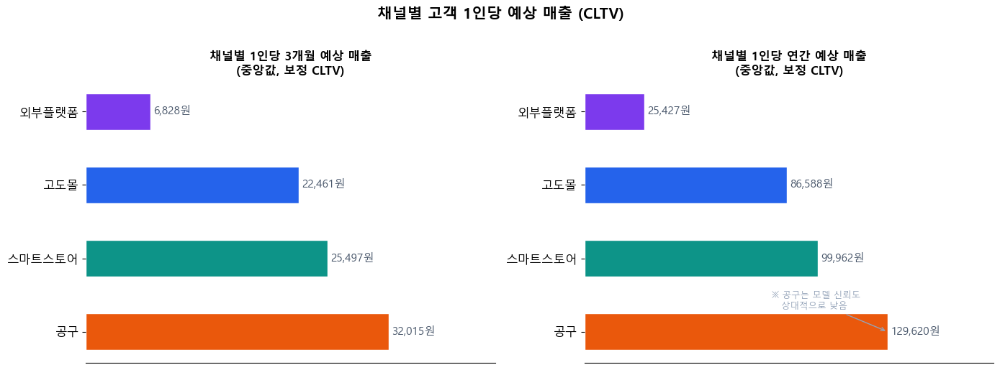


=== 채널별 CLTV 요약 ===
채널                 3M 중앙값      12M 중앙값      모델 상관계수
----------------------------------------------------
공구               32,015원     129,620원        0.35
스마트스토어           25,497원      99,962원        0.41
고도몰              22,461원      86,588원        0.39
외부플랫폼             6,828원      25,427원        0.30

※ 모델 신뢰도: 스마트스토어 > 고도몰 > 공구 > 외부플랫폼 순
※ 12M CLTV는 8주 holdout을 365일 외삽한 값으로 참고용


In [896]:
ch_colors = [
    CH_COLOR['공구'],
    CH_COLOR['자사몰_N'],
    CH_COLOR['자사몰'],
    CH_COLOR['외부몰'],
]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

channels     = ['공구', '스마트스토어', '고도몰', '외부플랫폼']
cltv_3m_med  = [32015, 25497, 22461, 6828]
cltv_12m_med = [129620, 99962, 86588, 25427]

for ax, values, title in zip(
    axes,
    [cltv_3m_med, cltv_12m_med],
    ['채널별 1인당 3개월 예상 매출\n(중앙값, 보정 CLTV)',
     '채널별 1인당 연간 예상 매출\n(중앙값, 보정 CLTV)'],
):
    bars = ax.barh(channels, values, color=ch_colors, edgecolor='white', height=0.5)
    for bar, val in zip(bars, values):
        ax.text(
            bar.get_width() + max(values) * 0.01,
            bar.get_y() + bar.get_height() / 2,
            f'{val:,}원', va='center', fontsize=11, color='#475569'
        )
    ax.set_title(title, fontsize=12, fontweight='bold')
    ax.set_xlim(0, max(values) * 1.35)
    ax.spines[['top', 'right', 'left']].set_visible(False)
    ax.tick_params(axis='y', labelsize=12)
    ax.xaxis.set_visible(False)

axes[1].annotate(
    '※ 공구는 모델 신뢰도\n   상대적으로 낮음',
    xy=(129620, 0),          # 공구 막대 끝
    xytext=(80000, 0.3),     # 고도몰 막대 위 여백
    fontsize=9, color='#94A3B8',
    arrowprops=dict(arrowstyle='->', color='#94A3B8', lw=1),
)

plt.suptitle('채널별 고객 1인당 예상 매출 (CLTV)', fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

print("\n=== 채널별 CLTV 요약 ===")
print(f"{'채널':<12} {'3M 중앙값':>12} {'12M 중앙값':>12} {'모델 상관계수':>12}")
print("-" * 52)
rows = [
    ('공구',        32015, 129620, 0.35),
    ('스마트스토어', 25497,  99962, 0.41),
    ('고도몰',       22461,  86588, 0.39),
    ('외부플랫폼',    6828,  25427, 0.30),
]
for ch, m3, m12, corr in rows:
    print(f"{ch:<12} {m3:>10,}원  {m12:>10,}원  {corr:>10.2f}")

print("\n※ 모델 신뢰도: 스마트스토어 > 고도몰 > 공구 > 외부플랫폼 순")
print("※ 12M CLTV는 8주 holdout을 365일 외삽한 값으로 참고용")

---

### 2-4. CLTV 모델 검증 — 예측 랭킹 vs 실측 (Spearman + 데시일 lift)

- 자사몰(고도몰+스마트스토어) 기준, 90일 홀드아웃
- 절대값 보정보다 **상위 고객 선별(랭킹) 품질**로 검증 (데시일 lift / 누적 포착률)
- Spearman[B]는 실측 0원 고객 동점이 많아 과소평가 → 보조 지표

In [897]:
# ============================================================
# CLTV 모델 검증: 예측 랭킹 vs 실측 (Spearman + 데시일 lift)
#   ① 0원·취소 라인 제거(다른 CLTV 셀과 정의 일치)
#   ② 메인 지표 = 데시일 lift / 누적 포착률 (Spearman[B]는 0동점→보조)
#   ③ 1회 고객 객단가는 반복고객 평균으로 프록시(랭킹용)
# ============================================================
import warnings; warnings.filterwarnings('ignore')
from lifetimes import BetaGeoFitter, GammaGammaFitter
from lifetimes.utils import calibration_and_holdout_data
from scipy.stats import spearmanr

own = df_eda[df_eda['channel_group'].isin(['자사몰','자사몰_N'])].copy()
own = own[own['결제액'] > 0]                                                     # ① 0원 제거
own = own[~own['주문구분'].astype(str).str.contains('취소|반품|환불', na=False)]    # ① 취소 제거
own['date'] = pd.to_datetime(own['analysis_date']).dt.normalize()
tx = own.groupby(['receiver_key','date'])['결제액'].sum().reset_index()
tx.columns = ['customer_id','date','amount']
tx = tx[tx['amount'] > 0]

obs_end = tx['date'].max(); cal_end = obs_end - pd.Timedelta(days=90)
ch = calibration_and_holdout_data(tx, 'customer_id', 'date', monetary_value_col='amount',
        calibration_period_end=cal_end, observation_period_end=obs_end, freq='D')

bgf = BetaGeoFitter(penalizer_coef=0.00642)
bgf.fit(ch['frequency_cal'], ch['recency_cal'], ch['T_cal'])
ch['pred_purch'] = bgf.predict(90, ch['frequency_cal'], ch['recency_cal'], ch['T_cal'])

rep = ch[ch['frequency_cal'] > 0]
ggf = GammaGammaFitter(penalizer_coef=0.00117)
ggf.fit(rep['frequency_cal'], rep['monetary_value_cal'])
ch['pred_aov'] = np.nan
ch.loc[rep.index, 'pred_aov'] = ggf.conditional_expected_average_profit(
    rep['frequency_cal'], rep['monetary_value_cal'])
ch['pred_cltv'] = ch['pred_purch'] * ch['pred_aov'].fillna(rep['monetary_value_cal'].mean())  # ③
ch['actual_holdout'] = ch['frequency_holdout'] * ch['monetary_value_holdout']

both = ch[(ch['frequency_cal'] > 0) & (ch['frequency_holdout'] > 0)]
sp_a = spearmanr(both['pred_aov'], both['monetary_value_holdout']).correlation
sp_b = spearmanr(ch['pred_cltv'], ch['actual_holdout']).correlation
print(f"[A] GG 객단가 Spearman      : {sp_a:.3f} (n={len(both):,})")
print(f"[B] 전체 CLTV 순위 Spearman : {sp_b:.3f} (n={len(ch):,})  ※0동점 多→과소평가, 보조")

d = ch.sort_values('pred_cltv', ascending=False).reset_index(drop=True)
d['decile'] = pd.qcut(d.index, 10, labels=[f'D{i}' for i in range(1, 11)])
tot = d['actual_holdout'].sum()
g = d.groupby('decile', observed=True)['actual_holdout'].agg(고객수='size', 실측합='sum', 실측평균='mean')
g['실측비중%'] = (g['실측합'] / tot * 100).round(1)
g['누적포착%'] = g['실측비중%'].cumsum().round(1)
g['lift']     = (g['실측평균'] / d['actual_holdout'].mean()).round(2)
print("\n=== 예측 CLTV 데시일별 실측 매출 (D1=상위 10%) ===")
print(g[['고객수','실측비중%','누적포착%','lift']].to_string())
print(f"\n→ 상위 10%(D1): 미래매출 {g['실측비중%'].iloc[0]:.0f}% 포착, lift {g['lift'].iloc[0]:.1f}배")
print(f"→ 상위 30%(D1~D3): 누적 {g['누적포착%'].iloc[2]:.0f}% 포착")

[A] GG 객단가 Spearman      : 0.764 (n=3,122)
[B] 전체 CLTV 순위 Spearman : 0.307 (n=60,302)  ※0동점 多→과소평가, 보조

=== 예측 CLTV 데시일별 실측 매출 (D1=상위 10%) ===
         고객수  실측비중%  누적포착%  lift
decile                          
D1      6031  45.60  45.60  4.56
D2      6030  16.30  61.90  1.63
D3      6030  10.60  72.50  1.06
D4      6030   7.60  80.10  0.76
D5      6030   6.00  86.10  0.60
D6      6030   4.60  90.70  0.46
D7      6030   3.80  94.50  0.38
D8      6030   3.00  97.50  0.30
D9      6030   2.40  99.90  0.24
D10     6031   0.00  99.90  0.00

→ 상위 10%(D1): 미래매출 46% 포착, lift 4.6배
→ 상위 30%(D1~D3): 누적 72% 포착


---

## 3. CLTV 해석

> ※ 모델 신뢰도
> - BG/NBD 상관계수 0.409 — 세그먼트 단위 참고용, 개별 고객 수치를 정밀값으로 해석하지 말 것
> - 공동구매 상관계수 0.35 (전 채널 중 최저) — 수치는 참고용, 채널 우선순위 판단에 단독 사용 주의
> 
> ※ 수수료 미반영
> - 공동구매 수수료 35~40% 미반영 상태
> - 반영 시 12M CLTV 약 8~9만원 수준 → 스마트스토어보다 낮아질 수 있음
> - 정확한 채널 우선순위는 수수료 확인 후 재계산 필요

### 3-1. 자사몰 전체 CLTV

- 모델 신뢰도 : 상관계수 0.409, MAE 0.122, over-ratio 1.251  
    - 상관계수 0.4는 낮지 않지만 강하지도 않음  
    - 자사몰 구매 패턴이 불규칙하거나 데이터 기간(15개월)이 짧아서 나오는 수준  
    - 방향성 참고용으로는 쓸 수 있고,  
        개별 고객 수치를 정밀하게 신뢰하기보다 세그먼트 단위로 해석하는 게 적절  
    - over-ratio 1.251 → 모델이 실제보다 25% 과대 예측하는 경향  
        → 보정값(cltv_3m_calibrated) 사용이 맞음  

- 핵심 수치  
    - 분석 대상: 자사몰 고객 69,870명, 기간 2025.01~2026.04  
    - GG 학습 대상(재구매 경험 고객): 14,978명 → 전체의 21.4%만 재구매 경험  
    - 평균 3개월 CLTV(보정): 35,608원  
    - 중앙값 3개월 CLTV(보정): 25,671원  
    - 평균이 중앙값보다 38% 높음  
        → 소수 고가치 고객이 평균을 끌어올리는 구조  

- ABC 세그먼트  
    - A 세그먼트 5,478명이 전체 예상 매출의 70%를 담당  
    - A vs C 평균 CLTV 격차가 6.9배 — 고객별 가치 차이가 매우 큼  
    - A 고객 관리가 곧 매출 방어라는 의미  

|세그먼트|고객수|평균 CLTV|합계 CLTV|비중|
|---|---|---|---|---|
|A|5,478명|68,146원|3.73억|36.6%|
|B|4,124명|25,871원|1.07억|27.5%|
|C|5,376명|9,921원|0.53억|35.9%|

- 상위 10명 해석  
    - 1위 고객(336df5): frequency 8회, recency 274일, 예상 3개월 CLTV 41.2만원  
    - 주목할 케이스: 4fe704b3 — frequency 1회인데 monetary_value가 245만원  
        단 1번 구매했지만 금액이 커서 상위권 진입  
        이런 고객은 재구매 가능성 예측이 불안정하므로 별도 관리 필요
    - 전반적으로 A 세그먼트 상위권은 frequency 5~23회, monetary_value 13~56만원 수준  

### 3-2. 채널별 CLTV

- 채널별 기초 수치  
: 공동구매가 재구매율 26%로 1위인데 객단가는 가장 낮음  
: 빈도는 높지만 건당 금액이 작은 구조  

|채널|고객수|재구매율|평균주문금액|
|---|---|---|---|
|스마트스토어|61,373명|21%|74,846원|
|고도몰|9,726명|17%|84,314원|
|공동구매|10,930명|26%|51,821원|
|외부플랫폼|1,919명|6%|74,293원|


- 채널별 12M CLTV (핵심)  

|채널|고객수|상관계수|over_ratio|평균12M_CLTV|중앙12M_CLTV|
|---|---|---|---|---|---|
|공동구매|10,930|0.35|0.86|159,947원|129,620원|
|스마트스토어|61,373|0.41|1.26|139,039원|99,962원|
|고도몰|9,726|0.39|1.14|131,460원|86,588원|
|외부플랫폼|1,919|0.30|1.00|55,414원|25,427원|


- 공동구매가 per-customer 12M CLTV 1위이지만 그대로 받아들이면 안 됨 (이유 두 가지)  
    - 첫째, 모델 적합도가 가장 낮음 / 상관계수 0.35로 4개 채널 중 꼴찌  
        공동구매는 행사 단위로 구매가 몰리는 패턴이라 BG/NBD의 "랜덤 독립 구매" 가정과 충돌  
        즉 모델이 공동구매 패턴을 제대로 못 잡고 있을 가능성이 있음  
    - 둘째, over-ratio가 0.86으로 1 미만  
        다른 채널은 전부 1 초과(과대 예측)인데 공동구매만 과소 예측  
        보정을 적용하면 오히려 CLTV가 올라가는 구조라 수치가 부풀어 있음  

- 스마트스토어가 가장 신뢰할 수 있는 수치  
    - 상관계수 0.41로 가장 높고,  
    - 고객수 61,373명으로 표본이 압도적이며,  
    - holdout 반복수 3,398명으로 안정적  
    - 중앙 12M CLTV 99,962원이 현재 가장 신뢰도 높은 기준값  

- 외부플랫폼은 분석 자체가 불안정함  
    - holdout 반복수 14명으로 너무 작아 보정이 해제됐고,  
    - 중앙 CLTV 25,427원으로 다른 채널의 1/4 수준  

> 종합 해석   
> 자사몰 고객 7만명 중 실질적으로 가치있는 A 세그먼트는 5,478명(7.8%)이고 이들이 매출의 70%를 담당한다.  
> 채널별로는 스마트스토어가 규모와 모델 신뢰도 모두 가장 안정적이며,  
> 공동구매는 per-customer CLTV 수치는 높지만 모델 적합도가 낮아 그대로 신뢰하기 어렵다.  
> 실무적으로는 스마트스토어 A 세그먼트 고객 유지가 가장 확실한 매출 방어 수단이다.  

---